# 1.0 Data Collection
## Published Topics in Global Health
### Author: Isabelle Feldhaus
#### Last updated 25 July 2023

The objective of this analysis is to identify the most published topics in the field of global health based on the metadata available in a selected set of journals from 2010 to 2023. Article metadata have been extracted from the Medline database.

The following metadata is extracted from all articles published within the date range in the selected journals: 
* PubMed ID
* Title
* Abstract
* Authors
* Corporate Author(s)
* Affiliation
* Journal
* Publication Date
* Place of Publication
* Publication History Status
* MeSH Terms
* Language

The selection criteria for included academic journals has been outlined in 0.1 Selection of Journals.

This work could evolve into the detailing of a global health taxonomy based on the published work in the field. 

Potential analyses based on this data include: 
* Most published topics based on MeSH terms, titles, abstracts
* Analysis of publication history status trends (e.g., time from submission to publication / print
* Analysis of authors / affiliations
* Analysis of topics using LLMs based on abstract text, abstract + title text

In [1]:
# from Bio import Entrez
# from Bio import Medline

# def fetch_publication_info(email, journal_list, start_date=None, end_date=None, max_results=None):
#     """
#     Fetch publication information from specified academic journals on PubMed within a date range.

#     Args:
#         email (str): Your email address for accessing PubMed.
#         journal_list (list): List of academic journals to search.
#         start_date (str): Start date in the format 'YYYY/MM/DD' to filter articles.
#         end_date (str): End date in the format 'YYYY/MM/DD' to filter articles.
#         max_results (int): Maximum number of search results to fetch.

#     Returns:
#         dict: A dictionary containing the fetched publication information.
#             Keys are PubMed IDs, and values are dictionaries with the following keys:
#             - 'pubmed_id': PubMed ID.
#             - 'title': Title of the article.
#             - 'abstract': Abstract of the article.
#             - 'authors': List of authors.
#             - 'corporate_authors': List of corporate authors.
#             - 'affiliation': Affiliation of the authors.
#             - 'journal': Journal name.
#             - 'publication_date': Publication date of the article.
#             - 'place_of_publication': Place of publication.
#             - 'publication_history_status': Publication history status.
#             - 'mesh_terms': List of MeSH terms.
#             - 'language': Language of the article.
#     """

#     # Set your email address (required by PubMed)
#     Entrez.email = email

#     # Initialize a dictionary to store publication information
#     publication_info = {}

#     for journal in journal_list:
#         # Build the query to search for articles from the specified journal
#         query = f'"{journal}"[Journal]'

#         # If date range is specified, add it to the query
#         if start_date and end_date:
#             query += f' AND ("{start_date}"[Date - Publication] : "{end_date}"[Date - Publication])'

#         # Fetch IDs of all articles matching the query (up to the max_results)
#         handle = Entrez.esearch(db='pubmed', term=query, retmax=max_results, usehistory='y')
#         record = Entrez.read(handle)
#         handle.close()

#         if 'IdList' not in record or not record['IdList']:
#             print(f"No articles found for journal: {journal}")
#             continue

#         total_results = int(record['Count'])
#         print(f"Total articles found for journal '{journal}': {total_results}")

#         # Fetch the PubMed records for the search results
#         id_list = record['IdList']
#         handle = Entrez.efetch(db='pubmed', id=id_list, rettype='medline', retmode='text')
        
#         # Parse the Medline records and extract the relevant information
#         records = Medline.parse(handle)
#         for medline_record in records:
#             article_info = {}
#             pubmed_id = medline_record.get('PMID', '')
#             article_info['pubmed_id'] = pubmed_id

#             # Extract article information from the Medline record
#             article_info['title'] = medline_record.get('TI', '')
#             article_info['abstract'] = medline_record.get('AB', '')

#             authors = medline_record.get('AU', [])
#             article_info['authors'] = authors

#             corporate_authors = medline_record.get('CN', [])
#             article_info['corporate_authors'] = corporate_authors

#             affiliation = medline_record.get('AD', [])
#             article_info['affiliation'] = affiliation

#             article_info['journal'] = medline_record.get('JT', '')

#             publication_date = medline_record.get('DP', '')
#             article_info['publication_date'] = publication_date

#             article_info['place_of_publication'] = medline_record.get('IS', '')

#             publication_history_status = medline_record.get('PHST', [])
#             article_info['publication_history_status'] = publication_history_status

#             mesh_terms = medline_record.get('MH', [])
#             article_info['mesh_terms'] = mesh_terms

#             article_info['language'] = medline_record.get('LA', '')

#             # Update the publication_info dictionary with the information for the current article
#             publication_info.update({pubmed_id: article_info})

#     return publication_info

In [1]:
import time
from Bio import Entrez
from Bio import Medline
from http.client import IncompleteRead

def extract_article_info(medline_record):
    article_info = {}
    
    pubmed_id = medline_record.get('PMID', '')
    article_info['pubmed_id'] = pubmed_id

    # Extract article information from the Medline record
    article_info['title'] = medline_record.get('TI', '')
    article_info['abstract'] = medline_record.get('AB', '')

    authors = medline_record.get('AU', [])
    article_info['authors'] = authors

    corporate_authors = medline_record.get('CN', [])
    article_info['corporate_authors'] = corporate_authors

    affiliation = medline_record.get('AD', [])
    article_info['affiliation'] = affiliation

    article_info['journal'] = medline_record.get('JT', '')

    publication_date = medline_record.get('DP', '')
    article_info['publication_date'] = publication_date

    article_info['place_of_publication'] = medline_record.get('IS', '')

    publication_history_status = medline_record.get('PHST', [])
    article_info['publication_history_status'] = publication_history_status

    mesh_terms = medline_record.get('MH', [])
    article_info['mesh_terms'] = mesh_terms

    article_info['language'] = medline_record.get('LA', '')

    return article_info


def fetch_publication_info(email, journal_list, start_date=None, end_date=None, max_results=None):
    """
    Fetch publication information from specified academic journals on PubMed within a date range.

    Args:
        email (str): Your email address for accessing PubMed.
        journal_list (list): List of academic journals to search.
        start_date (str): Start date in the format 'YYYY/MM/DD' to filter articles.
        end_date (str): End date in the format 'YYYY/MM/DD' to filter articles.
        max_results (int): Maximum number of search results to fetch.

    Returns:
        dict: A dictionary containing the fetched publication information.
            Keys are PubMed IDs, and values are dictionaries with the following keys:
            - 'pubmed_id': PubMed ID.
            - 'title': Title of the article.
            - 'abstract': Abstract of the article.
            - 'authors': List of authors.
            - 'corporate_authors': List of corporate authors.
            - 'affiliation': Affiliation of the authors.
            - 'journal': Journal name.
            - 'publication_date': Publication date of the article.
            - 'place_of_publication': Place of publication.
            - 'publication_history_status': Publication history status.
            - 'mesh_terms': List of MeSH terms.
            - 'language': Language of the article.
    """

    # Set your email address (required by PubMed)
    Entrez.email = email

    # Initialize a dictionary to store publication information
    publication_info = {}

    for journal in journal_list:
        # Build the query to search for articles from the specified journal
        query = f'"{journal}"[Journal]'

        # If date range is specified, add it to the query
        if start_date and end_date:
            query += f' AND ("{start_date}"[Date - Publication] : "{end_date}"[Date - Publication])'

        # Fetch IDs of all articles matching the query (up to the max_results)
        handle = Entrez.esearch(db='pubmed', term=query, retmax=max_results, usehistory='y')
        record = Entrez.read(handle)
        handle.close()

        if 'IdList' not in record or not record['IdList']:
            print(f"No articles found for journal: {journal}")
            continue

        total_results = int(record['Count'])
        print(f"Total articles found for journal '{journal}': {total_results}")

        # Fetch the PubMed records for the search results
        id_list = record['IdList']
        handle = Entrez.efetch(db='pubmed', id=id_list, rettype='medline', retmode='text')
        
        try:
            # Parse the Medline records and extract the relevant information
            records = Medline.parse(handle) 
            for medline_record in records:
                article_info = extract_article_info(medline_record)
                pubmed_id = article_info['pubmed_id']
                publication_info[pubmed_id] = article_info
                
        except IncompleteRead:
            # Retry fetching the records if an IncompleteRead exception occurs
            retries = 3
            for attempt in range(retries):
                print(f"Retrying attempt {attempt + 1} for {journal}...")
                time.sleep(5)  # Wait for 5 seconds before retrying
                try:
                    records = Medline.parse(handle)
                    for medline_record in records:
                        article_info = extract_article_info(medline_record)
                        pubmed_id = article_info['pubmed_id']
                        publication_info[pubmed_id] = article_info
                    break  # Break out of the retry loop if successful
                except IncompleteRead:
                    pass
            else:
                print(f"Failed to fetch records for {journal} after {retries} attempts.")

        handle.close()

    return publication_info

In [2]:
# # Preview / Example
# email_address = 'your_email@example.com'
# journals = ['Lancet Glob Health', 'Health Policy Plan']
# start_date = '2023/01/01'
# end_date = '2023/07/21'
# max_results = 1000  # Fetch up to 1000 search results per journal

# pub_info = fetch_publication_info(email_address, journals, start_date, end_date, max_results)

# # Print the fetched information for each article
# for pmid, info in pub_info.items():
#     print(f"PubMed ID: {pmid}")
#     print(f"Title: {info.get('title', '')}")
#     print(f"Abstract: {info.get('abstract', '')}")
#     print(f"Authors: {', '.join(info.get('authors', []))}")
#     print(f"Corporate Author(s): {', '.join(info.get('corporate_authors', []))}")
#     print(f"Affiliation: {', '.join(info.get('affiliation', []))}")
#     print(f"Journal: {info.get('journal', '')}")
#     print(f"Publication Date: {info.get('publication_date', '')}")
#     print(f"Place of Publication: {info.get('place_of_publication', '')}")
#     print(f"Publication History Status: {', '.join(info.get('publication_history_status', []))}")
#     print(f"MeSH Terms: {', '.join(info.get('mesh_terms', []))}")
#     print(f"Language: {info.get('language', '')}")
#     print("\n")

In [3]:
# # Quick look at example results
# pub_info.items()

In [5]:
# Data collection with tier 1 journals, specified in 0.1 Selection of journals
email_address = 'ifeld03@gmail.com'
journals = [
    'Ann Glob Health',
    'BMJ Glob Health', 
    'Bull World Health Organ',
    'Glob Health Action',
    'Glob Health Promot', 
    'Glob Health Res Policy',
    'Glob Health Sci Pract',
    'Glob Public Health', 
    'Health Policy Plan',
    'Health Res Policy Syst',
    'Hum Resour Health',
    'Int Health', 
    'Int J Equity Health', 
    'Int J Public Health', 
    'J Glob Health', 
    'J Glob Health Rep', 
    'J Health Popul Nutr', 
    'J Public Health (Oxf)', 
    'Lancet Glob Health', 
    'PLOS Glob Public Health', 
    'Trop Med Health'
]
start_date = '2010/01/01'
end_date = '2023/08/01'
max_results = 5000  # Fetch up to 5000 search results per journal

pub_info = fetch_publication_info(email_address, journals, start_date, end_date, max_results)

Total articles found for journal 'Ann Glob Health': 978
Total articles found for journal 'BMJ Glob Health': 2783
Retrying attempt 1 for BMJ Glob Health...
Total articles found for journal 'Bull World Health Organ': 2329
Total articles found for journal 'Glob Health Action': 1800
Total articles found for journal 'Glob Health Promot': 829
Total articles found for journal 'Glob Health Res Policy': 311
Total articles found for journal 'Glob Health Sci Pract': 884
Total articles found for journal 'Glob Public Health': 1676
Total articles found for journal 'Health Policy Plan': 1745
Total articles found for journal 'Health Res Policy Syst': 1277
Total articles found for journal 'Hum Resour Health': 1101
Total articles found for journal 'Int Health': 1041
Retrying attempt 1 for Int Health...
Total articles found for journal 'Int J Equity Health': 2197
Total articles found for journal 'Int J Public Health': 1989
Total articles found for journal 'J Glob Health': 1671
Total articles found for jo

In [6]:
# Get the dictionary keys (PubMed IDs)
pubmed_ids = list(pub_info.keys())

# Access the first article
first_article = pub_info[pubmed_ids[0]]
print(first_article)

# Access the last article
last_article = pub_info[pubmed_ids[-1]]
print(last_article)

{'pubmed_id': '37547484', 'title': 'Critical Care Units in Malawi: A Cross-Sectional Study.', 'abstract': 'BACKGROUND: The global burden of critical illness falls disproportionately outside high-income countries. Despite younger patient populations with similar or lower disease severity, critical illness outcomes are poor outside high-income countries. A lack of data limits attempts to understand and address the drivers of critical care outcomes outside high-income countries. OBJECTIVES: We aim to characterize the organization, available resources, and service capacity of public sector critical care units in Malawi and identify barriers to improving care. METHODS: We conducted a secondary analysis of the Malawi Emergency and Critical Care Survey, a cross-sectional study performed from January to February 2020 at all four central hospitals and a simple random sample of nine out of 24 public sector district hospitals in Malawi, a predominantly rural, low-income country of 19.6 million in

### Sample Profile

In [29]:
# Number of articles
len(pubmed_ids)

26349

In [30]:
# Number of journals
(len(journals))

21

### MeSH Term Analysis

#### Set up

In [7]:
# Data cleaning functions
def flatten_publication_info_element(publication_info, tag):
#     element_list = [val[tag] for key, val in publication_info.items() if tag in val]
#     return [item for row in element_list for item in row]
    return [tag_value for key, val in publication_info.items() for tag_value in val.get(tag, [])]

# Functions specific to cleaning MeSH terms 
def extract_main_topics(terms_list):
    main_topics = [string for string in terms_list if '*' in string]
    return [string.replace('*', '') for string in main_topics] # remove asterisks from strings

def remove_asterisks(terms_list):
    return [string.replace('*', '') for string in terms_list]

In [8]:
import nltk
from nltk import FreqDist
from nltk import bigrams

def term_frequency_analysis_whole_string(terms_list):
    """
    Perform term frequency analysis on a list of MeSH terms, treating each term as a whole string.

    Args:
        terms_list (list): A list of MeSH terms.

    Returns:
        dict: A dictionary containing each term as the key and its frequency as the value.
    """
    term_freq_dist = FreqDist(terms_list)
    return dict(term_freq_dist)


def co_occurrence_analysis_whole_string(terms_list):
    """
    Conduct co-occurrence analysis on a list of MeSH terms, treating each term as a whole string.

    Args:
        terms_list (list): A list of MeSH terms.

    Returns:
        dict: A dictionary containing term pairs as keys and their co-occurrence count as values.
    """
    term_bigrams = list(bigrams(terms_list))
    co_occurrence_dist = FreqDist(term_bigrams)
    return dict(co_occurrence_dist)

In [9]:
# Use the NLTK Downloader to obtain the punkt resource:
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/isabellefeldhaus/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
# # Example usage:
# mesh_terms = [
#     "Health Services Accessibility",
#     "Health Policy",
#     "Global Health",
#     "Health Services Needs and Demand",
#     "Public Health",
#     "Healthcare Disparities",
#     "Healthcare Disparities",
#     "Health Services Needs and Demand",
#     "Health Policy",
#     "Global Health",
# ]

# # Perform term frequency analysis treating whole strings
# term_freq_analysis_result = term_frequency_analysis_whole_string(mesh_terms)
# print("Term Frequency Analysis (Whole String):")
# print(term_freq_analysis_result)

# # Perform co-occurrence analysis treating whole strings
# co_occurrence_analysis_result = co_occurrence_analysis_whole_string(mesh_terms)
# print("\nCo-occurrence Analysis (Whole String):")
# print(co_occurrence_analysis_result)

In [10]:
# Getting the list of MeSH terms
mesh_terms = remove_asterisks(flatten_publication_info_element(pub_info, 'mesh_terms'))
main_topics = extract_main_topics(flatten_publication_info_element(pub_info, 'mesh_terms'))

In [11]:
# Number of terms
len(mesh_terms)

234757

In [12]:
# Number of distinct terms
len(set(mesh_terms))

17852

In [19]:
# Number of main topics
len(main_topics)

71713

In [20]:
# Number of distinct main topics
len(set(main_topics))

13889

#### Term frequency analysis

In [13]:
term_freq_analysis_result = term_frequency_analysis_whole_string(mesh_terms)
print("Term Frequency Analysis (Whole String):")
print(term_freq_analysis_result)

Term Frequency Analysis (Whole String):
{'Humans': 22291, 'Cross-Sectional Studies': 2703, 'Malawi/epidemiology': 74, 'Critical Illness/therapy': 3, 'Intensive Care Units': 22, 'Critical Care': 17, 'Mongolia': 19, 'Occupational Exposure/adverse effects/prevention & control/analysis': 1, 'Asbestos/toxicity': 9, 'Mesothelioma/epidemiology/prevention & control': 1, 'Mesothelioma, Malignant': 3, 'Lung Neoplasms': 5, 'Mental Health': 402, 'Conservation of Natural Resources': 43, 'Air Pollution/adverse effects': 36, 'Floods': 23, 'Climate Change': 152, 'Universal Design': 1, 'Public Health': 1209, 'Learning': 94, 'Curriculum': 176, 'Students': 143, 'Dust': 6, 'Occupational Diseases/chemically induced/epidemiology': 1, 'Occupational Exposure/adverse effects': 20, 'Lung': 6, 'Morbidity': 53, 'Noncommunicable Diseases/prevention & control': 71, 'Private Sector': 142, 'Policy Making': 582, 'Risk Factors': 1296, 'Tobacco': 68, 'Health Policy': 1648, 'Female': 9608, 'Male': 6728, 'Authorship': 23,

In [14]:
import matplotlib.pyplot as plt

def plot_term_frequency(term_freq_dict, num_terms=10):
    """
    Plot a bar chart of the top N terms and their frequencies.

    Args:
        term_freq_dict (dict): Dictionary containing term frequencies.
        num_terms (int): Number of top terms to plot.

    Returns:
        None (displays the plot).
    """
    sorted_terms = sorted(term_freq_dict.items(), key=lambda item: item[1], reverse=True)[:num_terms]
    terms, frequencies = zip(*sorted_terms)

    plt.figure(figsize=(10, 6))
    plt.barh(terms, frequencies)
    plt.xlabel('Frequency')
    plt.ylabel('Term')
    plt.title('Top {} Term Frequencies'.format(num_terms))
    plt.tight_layout()
    plt.show()

def plot_word_cloud(term_freq_dict):
    """
    Generate and display a word cloud based on term frequencies.

    Args:
        term_freq_dict (dict): Dictionary containing term frequencies.

    Returns:
        None (displays the word cloud).
    """
    from wordcloud import WordCloud

    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(term_freq_dict)

    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title('Word Cloud of Term Frequencies')
    plt.show()

In [ ]:
# # Example usage:

# # Assuming you already have the term frequency dictionary from term_frequency_analysis_whole_string
# term_freq_dict = {
#     "Health Services Accessibility": 15,
#     "Health Policy": 22,
#     "Global Health": 30,
#     "Health Services Needs and Demand": 18,
#     "Public Health": 25,
#     "Healthcare Disparities": 12,
#     "Healthcare Disparities": 12,
#     "Health Services Needs and Demand": 18,
#     "Health Policy": 22,
#     "Global Health": 30,
# }

# # Plot the top term frequencies
# plot_term_frequency(term_freq_dict, num_terms=10)

# # Generate and display a word cloud
# plot_word_cloud(term_freq_dict)

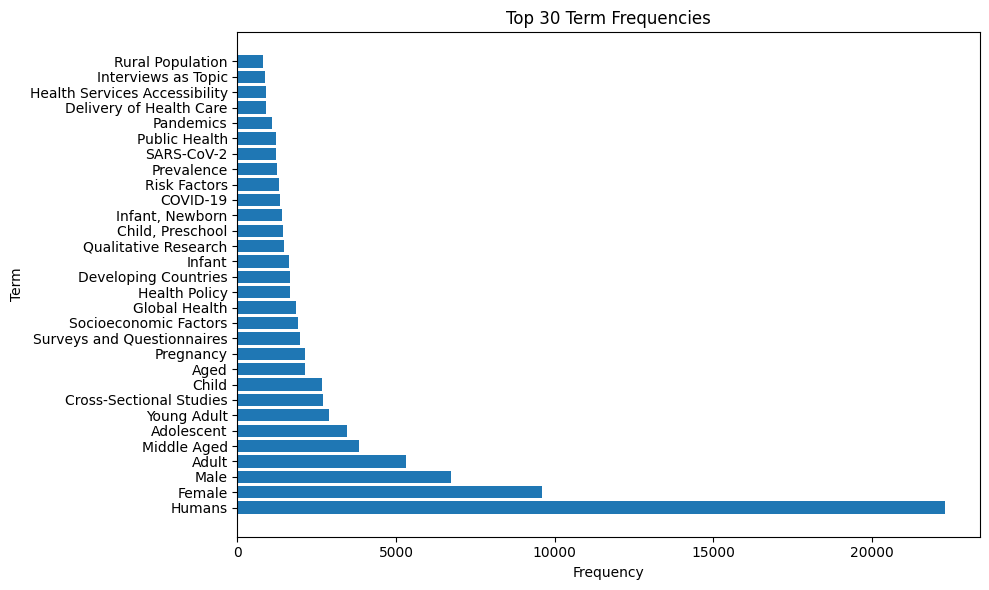

In [16]:
# Visualizations based on results
plot_term_frequency(term_freq_analysis_result, num_terms = 30)

In [ ]:
plot_word_cloud(term_freq_analysis_result)

#### Main topics frequency analysis

In [21]:
main_topic_freq_results = term_frequency_analysis_whole_string(main_topics)
print(main_topic_freq_results)

{'Critical Illness/therapy': 2, 'Intensive Care Units': 6, 'Occupational Exposure/adverse effects/prevention & control/analysis': 1, 'Asbestos/toxicity': 9, 'Mesothelioma/epidemiology/prevention & control': 1, 'Mesothelioma, Malignant': 2, 'Lung Neoplasms': 5, 'Mental Health': 207, 'Air Pollution/adverse effects': 32, 'Universal Design': 1, 'Public Health': 643, 'Occupational Diseases/chemically induced/epidemiology': 1, 'Occupational Exposure/adverse effects': 17, 'Noncommunicable Diseases/prevention & control': 67, 'Authorship': 14, 'Global Health': 1044, 'Air Pollution/adverse effects/analysis': 20, 'Air Pollutants/adverse effects/analysis': 18, 'Brain Neoplasms/epidemiology/etiology': 1, 'Neoplasms': 20, 'Lymphoma/chemically induced': 1, 'Leukemia': 2, 'Internship and Residency': 31, 'Mental Health Services': 57, 'Lung Neoplasms/therapy': 2, 'Developing Countries': 687, 'Research Personnel': 52, 'Triage': 6, 'Telemedicine': 89, 'Benchmarking': 12, 'Health Priorities': 93, 'Abscess/

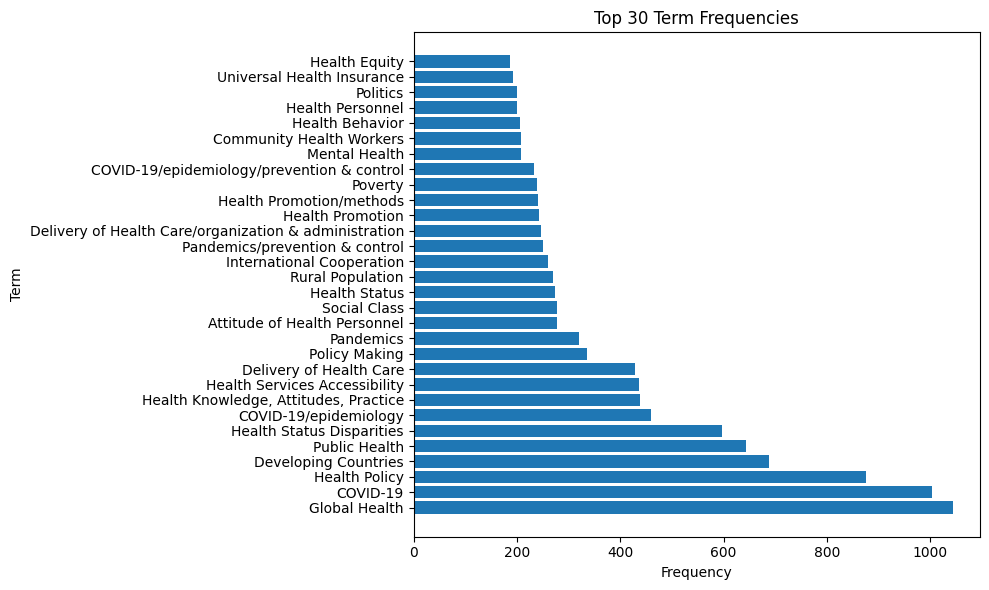

In [17]:
plot_term_frequency(main_topic_freq_results, num_terms = 30)

#### Co-occurrence analysis

In [28]:
# co_occurrence_analysis_result = co_occurrence_analysis_whole_string(mesh_terms)
# print("\nCo-occurrence Analysis (Whole String):")
# print(co_occurrence_analysis_result)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# def generate_co_occurrence_heatmap(co_occurrence_dict, threshold=1):
#     """
#     Generate a heatmap based on co-occurrence analysis results.

#     Args:
#         co_occurrence_dict (dict): Dictionary containing term pairs as keys and their co-occurrence count as values.
#         threshold (int): Minimum co-occurrence count to consider for the heatmap.

#     Returns:
#         None (displays the heatmap).
#     """
#     # Filter out pairs below the threshold
#     filtered_co_occurrence = {pair: count for pair, count in co_occurrence_dict.items() if count >= threshold}

#     # Extract terms and counts
#     terms = list(set(term for pair in filtered_co_occurrence for term in pair))
#     counts = [filtered_co_occurrence.get(pair, 0) for pair in zip(terms, terms)]

#     # Create a matrix for the heatmap
#     matrix = [[filtered_co_occurrence.get((term1, term2), 0) for term2 in terms] for term1 in terms]

#     plt.figure(figsize=(10, 8))
#     sns.heatmap(matrix, annot=True, fmt='d', cmap='YlGnBu', xticklabels=terms, yticklabels=terms)
#     plt.title('Co-occurrence Heatmap')
#     plt.xlabel('Term')
#     plt.ylabel('Term')
#     plt.tight_layout()
#     plt.show()

# # Example usage:

# # Assuming you have a co-occurrence dictionary from co_occurrence_analysis_whole_string
# co_occurrence_dict = {
#     ("Health Services Accessibility", "Health Policy"): 5,
#     ("Health Policy", "Global Health"): 7,
#     ("Global Health", "Health Services Needs and Demand"): 3,
#     ("Healthcare Disparities", "Global Health"): 2,
#     # ... other co-occurrence pairs ...
# }

# # Generate and display the co-occurrence heatmap
# generate_co_occurrence_heatmap(co_occurrence_dict, threshold=2)

In [ ]:
# # Attempt co-occurrence analysis without storing the entire matrix in memory
# # Generates a heatmap based on streaming results
# import seaborn as sns
# import matplotlib.pyplot as plt
# from collections import defaultdict

# def generate_co_occurrence_heatmap_streaming(terms_list, threshold=1):
#     """
#     Generate a heatmap based on streaming co-occurrence analysis results.

#     Args:
#         terms_list (list): A list of MeSH terms.
#         threshold (int): Minimum co-occurrence count to consider for the heatmap.

#     Returns:
#         None (displays the heatmap).
#     """
#     co_occurrence_dict = defaultdict(int)

#     for terms in zip(terms_list, terms_list[1:]):
#         co_occurrence_dict[terms] += 1

#     filtered_co_occurrence = {pair: count for pair, count in co_occurrence_dict.items() if count >= threshold}

#     terms = list(set(term for pair in filtered_co_occurrence for term in pair))
#     counts = [filtered_co_occurrence.get(pair, 0) for pair in zip(terms, terms)]

#     matrix = [[filtered_co_occurrence.get((term1, term2), 0) for term2 in terms] for term1 in terms]

#     plt.figure(figsize=(10, 8))
#     sns.heatmap(matrix, annot=True, fmt='d', cmap='YlGnBu', xticklabels=terms, yticklabels=terms)
#     plt.title('Co-occurrence Heatmap (Streaming)')
#     plt.xlabel('Term')
#     plt.ylabel('Term')
#     plt.tight_layout()
#     plt.show()

In [ ]:
# # Example usage:

# # Assuming you have a list of MeSH terms
# mesh_terms_ex = [
#     "Health Services Accessibility",
#     "Health Policy",
#     "Global Health",
#     "Health Services Needs and Demand",
#     "Public Health",
#     "Healthcare Disparities",
#     "Healthcare Disparities",
#     "Health Services Needs and Demand",
#     "Health Policy",
#     "Global Health",
# ]

# # Generate and display the streaming co-occurrence heatmap
# generate_co_occurrence_heatmap_streaming(mesh_terms_ex, threshold=2)

In [ ]:
# generate_co_occurrence_heatmap_streaming(mesh_terms, threshold=5)

In [ ]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# import numpy as np
# from collections import Counter
# from itertools import combinations

# def generate_co_occurrence_heatmap_efficient(terms_list, threshold=1):
#     """
#     Generate an efficient heatmap based on co-occurrence analysis results.

#     Args:
#         terms_list (list): A list of MeSH terms.
#         threshold (int): Minimum co-occurrence count to consider for the heatmap.

#     Returns:
#         None (displays the heatmap).
#     """
#     co_occurrence_dict = Counter(combinations(terms_list, 2))

#     filtered_co_occurrence = {pair: count for pair, count in co_occurrence_dict.items() if count >= threshold}

#     terms = list(set(term for pair in filtered_co_occurrence for term in pair))
#     term_indices = {term: index for index, term in enumerate(terms)}

#     matrix = np.zeros((len(terms), len(terms)), dtype=int)

#     for (term1, term2), count in filtered_co_occurrence.items():
#         term1_idx = term_indices[term1]
#         term2_idx = term_indices[term2]
#         matrix[term1_idx][term2_idx] = count
#         matrix[term2_idx][term1_idx] = count

#     plt.figure(figsize=(10, 8))
#     sns.heatmap(matrix, annot=True, fmt='d', cmap='YlGnBu', xticklabels=terms, yticklabels=terms)
#     plt.title('Efficient Co-occurrence Heatmap')
#     plt.xlabel('Term')
#     plt.ylabel('Term')
#     plt.tight_layout()
#     plt.show()

In [65]:
# # Example usage:

# # Assuming you have a list of MeSH terms
# mesh_terms = [
#     "Health Services Accessibility",
#     "Health Policy",
#     "Global Health",
#     "Health Services Needs and Demand",
#     "Public Health",
#     "Healthcare Disparities",
#     "Healthcare Disparities",
#     "Health Services Needs and Demand",
#     "Health Policy",
#     "Global Health",
# ]

# # Generate and display the efficient co-occurrence heatmap
# generate_co_occurrence_heatmap_efficient(mesh_terms, threshold=2)

In [ ]:
# generate_co_occurrence_heatmap_efficient(mesh_terms, threshold=2)

In [25]:
import numpy as np
from scipy.sparse import coo_matrix
from itertools import combinations
import seaborn as sns
import matplotlib.pyplot as plt

def generate_co_occurrence_heatmap_sparse(terms_list, threshold=1):
    """
    Generate a heatmap based on sparse co-occurrence analysis results.

    Args:
        terms_list (list): A list of MeSH terms.
        threshold (int): Minimum co-occurrence count to consider for the heatmap.

    Returns:
        None (displays the heatmap).
    """
    # Count co-occurrences and store in a sparse matrix
    term_indices = {term: index for index, term in enumerate(set(terms_list))}
    num_terms = len(term_indices)
    row_indices = []
    col_indices = []
    data = []

    for term1, term2 in combinations(terms_list, 2):
        if term1 != term2:
            term1_idx = term_indices[term1]
            term2_idx = term_indices[term2]
            row_indices.extend([term1_idx, term2_idx])
            col_indices.extend([term2_idx, term1_idx])
            data.extend([1, 1])

    co_occurrence_matrix = coo_matrix((data, (row_indices, col_indices)), shape=(num_terms, num_terms), dtype=int)

    # Filter co-occurrence matrix based on threshold
    co_occurrence_matrix.data[co_occurrence_matrix.data < threshold] = 0
    co_occurrence_matrix.eliminate_zeros()

    # Plot the heatmap
    terms = sorted(term_indices, key=lambda term: term_indices[term])
    matrix_dense = co_occurrence_matrix.toarray()

    plt.figure(figsize=(10, 8))
    sns.heatmap(matrix_dense, annot=True, fmt='d', cmap='YlGnBu', xticklabels=terms, yticklabels=terms)
    plt.title('Sparse Co-occurrence Heatmap')
    plt.xlabel('Term')
    plt.ylabel('Term')
    plt.tight_layout()
    plt.show()

In [26]:
# # Example usage:

# # Assuming you have a list of MeSH terms
# mesh_terms = [
#     "Health Services Accessibility",
#     "Health Policy",
#     "Global Health",
#     "Health Services Needs and Demand",
#     "Public Health",
#     "Healthcare Disparities",
#     "Healthcare Disparities",
#     "Health Services Needs and Demand",
#     "Health Policy",
#     "Global Health",
# ]

# # Generate and display the sparse co-occurrence heatmap
# generate_co_occurrence_heatmap_sparse(mesh_terms, threshold=2)

In [28]:
generate_co_occurrence_heatmap_sparse(mesh_terms, threshold=20)

KeyboardInterrupt: 

In [42]:
import numpy as np
from scipy.sparse import coo_matrix
from itertools import combinations
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm  # Import tqdm for progress bar

def generate_co_occurrence_heatmap_sparse_with_progress(terms_list, threshold=1):
    """
    Generate a heatmap based on sparse co-occurrence analysis results with a timer and progress bar.

    Args:
        terms_list (list): A list of MeSH terms.
        threshold (int): Minimum co-occurrence count to consider for the heatmap.

    Returns:
        None (displays the heatmap).
    """
    # Initialize timer and progress bar
    import time
    start_time = time.time()
    pbar = tqdm(total=len(terms_list) * (len(terms_list) - 1) // 2, desc="Calculating Co-occurrences")

    # Count co-occurrences and store in a sparse matrix
    term_indices = {term: index for index, term in enumerate(set(terms_list))}
    num_terms = len(term_indices)
    row_indices = []
    col_indices = []
    data = []

    for term1, term2 in combinations(terms_list, 2):
        if term1 != term2:
            term1_idx = term_indices[term1]
            term2_idx = term_indices[term2]
            row_indices.extend([term1_idx, term2_idx])
            col_indices.extend([term2_idx, term1_idx])
            data.extend([1, 1])
        pbar.update(1)  # Update progress bar

    # Close progress bar
    pbar.close()

    co_occurrence_matrix = coo_matrix((data, (row_indices, col_indices)), shape=(num_terms, num_terms), dtype=int)

    # Filter co-occurrence matrix based on threshold
    co_occurrence_matrix.data[co_occurrence_matrix.data < threshold] = 0
    co_occurrence_matrix.eliminate_zeros()

    # Plot the heatmap
    terms = sorted(term_indices, key=lambda term: term_indices[term])
    matrix_dense = co_occurrence_matrix.toarray()

    plt.figure(figsize=(10, 8))
    sns.heatmap(matrix_dense, annot=True, fmt='d', cmap='YlGnBu', xticklabels=terms, yticklabels=terms)
    plt.title('Sparse Co-occurrence Heatmap')
    plt.xlabel('Term')
    plt.ylabel('Term')
    plt.tight_layout()
    plt.show()

    # Display elapsed time
    elapsed_time = time.time() - start_time
    print("Elapsed Time: {:.2f} seconds".format(elapsed_time))

In [ ]:
generate_co_occurrence_heatmap_sparse_with_progress(mesh_terms, threshold=20)





Calculating Co-occurrences:   0%|                                       | 0/27555307146 [00:00<?, ?it/s]



Calculating Co-occurrences:   0%|                    | 71756/27555307146 [00:00<10:40:01, 717553.84it/s]



Calculating Co-occurrences:   0%|                    | 174624/27555307146 [00:00<8:29:57, 900564.04it/s]



Calculating Co-occurrences:   0%|                   | 288502/27555307146 [00:00<7:35:00, 1009323.00it/s]



Calculating Co-occurrences:   0%|                   | 394832/27555307146 [00:00<7:25:36, 1030627.80it/s]



Calculating Co-occurrences:   0%|                   | 500666/27555307146 [00:00<7:21:19, 1040616.80it/s]



Calculating Co-occurrences:   0%|                    | 604728/27555307146 [00:00<8:00:17, 956177.16it/s]



Calculating Co-occurrences:   0%|                    | 702456/27555307146 [00:00<7:57:02, 962686.51it/s]



Calculating Co-occurrences:   0%|                    | 810379/27555307146 [00:00<7:40:00, 998340.84it/s]



Calculating Co-occurrenc

Calculating Co-occurrences:   0%|                  | 7509565/27555307146 [00:06<6:50:00, 1119811.17it/s]



Calculating Co-occurrences:   0%|                  | 7625688/27555307146 [00:06<6:45:31, 1132198.86it/s]



Calculating Co-occurrences:   0%|                  | 7740551/27555307146 [00:06<6:43:45, 1137114.05it/s]



Calculating Co-occurrences:   0%|                  | 7854271/27555307146 [00:07<6:44:10, 1135952.39it/s]



Calculating Co-occurrences:   0%|                  | 7967872/27555307146 [00:07<6:44:43, 1134427.78it/s]



Calculating Co-occurrences:   0%|                  | 8081403/27555307146 [00:07<6:44:37, 1134688.95it/s]



Calculating Co-occurrences:   0%|                  | 8194875/27555307146 [00:07<6:46:38, 1129063.94it/s]



Calculating Co-occurrences:   0%|                  | 8308848/27555307146 [00:07<6:45:29, 1132248.70it/s]



Calculating Co-occurrences:   0%|                  | 8422080/27555307146 [00:07<6:47:33, 1126506.81it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   0%|                 | 15237340/27555307146 [00:13<6:55:33, 1104544.80it/s]



Calculating Co-occurrences:   0%|                 | 15350612/27555307146 [00:13<6:52:26, 1112894.66it/s]



Calculating Co-occurrences:   0%|                 | 15465636/27555307146 [00:13<6:48:21, 1123999.40it/s]



Calculating Co-occurrences:   0%|                 | 15579910/27555307146 [00:13<6:46:20, 1129584.34it/s]



Calculating Co-occurrences:   0%|                 | 15693844/27555307146 [00:14<6:45:17, 1132495.08it/s]



Calculating Co-occurrences:   0%|                 | 15807179/27555307146 [00:14<6:46:02, 1130397.97it/s]



Calculating Co-occurrences:   0%|                 | 15920279/27555307146 [00:14<6:46:05, 1130243.15it/s]



Calculating Co-occurrences:   0%|                 | 16033768/27555307146 [00:14<6:45:35, 1131633.00it/s]



Calculating Co-occurrences:   0%|                 | 16147903/27555307146 [00:14<6:44:33, 1134538.93it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   0%|                 | 23022780/27555307146 [00:20<6:46:34, 1128648.40it/s]



Calculating Co-occurrences:   0%|                 | 23135808/27555307146 [00:20<6:48:13, 1124037.88it/s]



Calculating Co-occurrences:   0%|                 | 23248328/27555307146 [00:20<6:49:25, 1120774.60it/s]



Calculating Co-occurrences:   0%|                 | 23362466/27555307146 [00:20<6:47:11, 1126907.06it/s]



Calculating Co-occurrences:   0%|                 | 23477159/27555307146 [00:20<6:45:02, 1132877.85it/s]



Calculating Co-occurrences:   0%|                 | 23593266/27555307146 [00:21<6:42:03, 1141299.78it/s]



Calculating Co-occurrences:   0%|                 | 23707432/27555307146 [00:21<6:43:42, 1136592.06it/s]



Calculating Co-occurrences:   0%|                 | 23821120/27555307146 [00:21<6:44:44, 1133726.47it/s]



Calculating Co-occurrences:   0%|                 | 23935736/27555307146 [00:21<6:43:24, 1137433.33it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   0%|                 | 30771404/27555307146 [00:27<7:21:38, 1038703.39it/s]



Calculating Co-occurrences:   0%|                 | 30877298/27555307146 [00:27<7:19:09, 1044600.31it/s]



Calculating Co-occurrences:   0%|                 | 30985844/27555307146 [00:27<7:14:12, 1056485.70it/s]



Calculating Co-occurrences:   0%|                 | 31091813/27555307146 [00:27<7:13:49, 1057432.90it/s]



Calculating Co-occurrences:   0%|                 | 31197746/27555307146 [00:27<7:19:31, 1043715.43it/s]



Calculating Co-occurrences:   0%|                 | 31302280/27555307146 [00:27<7:21:17, 1039529.39it/s]



Calculating Co-occurrences:   0%|                 | 31406459/27555307146 [00:28<7:21:00, 1040186.18it/s]



Calculating Co-occurrences:   0%|                 | 31516596/27555307146 [00:28<7:13:26, 1058349.00it/s]



Calculating Co-occurrences:   0%|                 | 31626474/27555307146 [00:28<7:08:33, 1070387.55it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   0%|                  | 38181359/27555307146 [00:34<8:11:10, 933718.22it/s]



Calculating Co-occurrences:   0%|                  | 38288610/27555307146 [00:34<7:51:16, 973157.57it/s]



Calculating Co-occurrences:   0%|                  | 38394762/27555307146 [00:34<7:39:13, 998670.45it/s]



Calculating Co-occurrences:   0%|                 | 38501340/27555307146 [00:34<7:30:23, 1018266.24it/s]



Calculating Co-occurrences:   0%|                 | 38606916/27555307146 [00:34<7:25:33, 1029301.03it/s]



Calculating Co-occurrences:   0%|                 | 38712989/27555307146 [00:34<7:21:33, 1038602.71it/s]



Calculating Co-occurrences:   0%|                 | 38819551/27555307146 [00:35<7:18:10, 1046630.07it/s]



Calculating Co-occurrences:   0%|                 | 38926304/27555307146 [00:35<7:15:34, 1052856.54it/s]



Calculating Co-occurrences:   0%|                  | 39031785/27555307146 [00:35<7:41:35, 993519.22it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   0%|                 | 45358159/27555307146 [00:41<6:42:28, 1139187.33it/s]



Calculating Co-occurrences:   0%|                 | 45472082/27555307146 [00:41<6:42:55, 1137941.66it/s]



Calculating Co-occurrences:   0%|                 | 45585879/27555307146 [00:41<6:45:22, 1131045.14it/s]



Calculating Co-occurrences:   0%|                 | 45698995/27555307146 [00:41<6:51:49, 1113332.50it/s]



Calculating Co-occurrences:   0%|                 | 45810391/27555307146 [00:41<6:52:31, 1111411.66it/s]



Calculating Co-occurrences:   0%|                 | 45921777/27555307146 [00:41<6:52:15, 1112134.89it/s]



Calculating Co-occurrences:   0%|                 | 46033021/27555307146 [00:42<6:54:05, 1107207.16it/s]



Calculating Co-occurrences:   0%|                 | 46143764/27555307146 [00:42<7:00:08, 1091247.02it/s]



Calculating Co-occurrences:   0%|                 | 46252944/27555307146 [00:42<7:00:07, 1091320.67it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   0%|                 | 52780941/27555307146 [00:48<7:01:17, 1088003.96it/s]



Calculating Co-occurrences:   0%|                 | 52889752/27555307146 [00:48<7:02:47, 1084141.62it/s]



Calculating Co-occurrences:   0%|                 | 53000261/27555307146 [00:48<7:00:22, 1090400.46it/s]



Calculating Co-occurrences:   0%|                 | 53109311/27555307146 [00:48<7:00:32, 1089970.32it/s]



Calculating Co-occurrences:   0%|                 | 53218315/27555307146 [00:48<7:01:11, 1088258.07it/s]



Calculating Co-occurrences:   0%|                 | 53327146/27555307146 [00:48<7:05:41, 1076756.59it/s]



Calculating Co-occurrences:   0%|                 | 53437378/27555307146 [00:48<7:02:42, 1084350.65it/s]



Calculating Co-occurrences:   0%|                 | 53551369/27555307146 [00:49<6:56:21, 1100905.84it/s]



Calculating Co-occurrences:   0%|                 | 53664548/27555307146 [00:49<6:52:53, 1110125.72it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   0%|                 | 60302219/27555307146 [00:55<6:56:41, 1099719.56it/s]



Calculating Co-occurrences:   0%|                 | 60412209/27555307146 [00:55<7:03:09, 1082926.00it/s]



Calculating Co-occurrences:   0%|                 | 60522215/27555307146 [00:55<7:01:11, 1087992.85it/s]



Calculating Co-occurrences:   0%|                 | 60631066/27555307146 [00:55<7:11:54, 1060991.95it/s]



Calculating Co-occurrences:   0%|                 | 60741769/27555307146 [00:55<7:06:29, 1074464.16it/s]



Calculating Co-occurrences:   0%|                 | 60851726/27555307146 [00:55<7:03:33, 1081862.90it/s]



Calculating Co-occurrences:   0%|                 | 60961487/27555307146 [00:55<7:01:44, 1086526.76it/s]



Calculating Co-occurrences:   0%|                 | 61070227/27555307146 [00:55<7:03:18, 1082494.94it/s]



Calculating Co-occurrences:   0%|                 | 61178973/27555307146 [00:56<7:02:44, 1083970.94it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   0%|                 | 67869893/27555307146 [01:02<6:46:09, 1127926.50it/s]



Calculating Co-occurrences:   0%|                 | 67984058/27555307146 [01:02<6:44:41, 1132038.28it/s]



Calculating Co-occurrences:   0%|                 | 68097267/27555307146 [01:02<6:49:22, 1119084.33it/s]



Calculating Co-occurrences:   0%|                 | 68209212/27555307146 [01:02<6:49:19, 1119183.12it/s]



Calculating Co-occurrences:   0%|                 | 68321156/27555307146 [01:02<6:51:14, 1113983.72it/s]



Calculating Co-occurrences:   0%|                 | 68432575/27555307146 [01:02<6:52:48, 1109746.01it/s]



Calculating Co-occurrences:   0%|                 | 68543565/27555307146 [01:02<6:54:56, 1104040.90it/s]



Calculating Co-occurrences:   0%|                 | 68653983/27555307146 [01:02<6:57:13, 1097975.69it/s]



Calculating Co-occurrences:   0%|                 | 68764215/27555307146 [01:02<6:56:44, 1099261.99it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   0%|                 | 75475002/27555307146 [01:09<7:02:55, 1082944.97it/s]



Calculating Co-occurrences:   0%|                 | 75583319/27555307146 [01:09<7:03:27, 1081575.55it/s]



Calculating Co-occurrences:   0%|                 | 75693332/27555307146 [01:09<7:01:17, 1087113.11it/s]



Calculating Co-occurrences:   0%|                 | 75804829/27555307146 [01:09<6:58:05, 1095440.81it/s]



Calculating Co-occurrences:   0%|                 | 75916091/27555307146 [01:09<6:56:08, 1100580.25it/s]



Calculating Co-occurrences:   0%|                 | 76029392/27555307146 [01:09<6:52:29, 1110293.50it/s]



Calculating Co-occurrences:   0%|                 | 76142543/27555307146 [01:09<6:50:08, 1116648.61it/s]



Calculating Co-occurrences:   0%|                 | 76254360/27555307146 [01:09<6:49:58, 1117104.20it/s]



Calculating Co-occurrences:   0%|                 | 76366075/27555307146 [01:09<7:17:32, 1046707.65it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   0%|                  | 82752017/27555307146 [01:16<7:59:29, 954916.88it/s]



Calculating Co-occurrences:   0%|                  | 82852245/27555307146 [01:16<7:52:36, 968810.22it/s]



Calculating Co-occurrences:   0%|                  | 82952312/27555307146 [01:16<7:48:04, 978215.57it/s]



Calculating Co-occurrences:   0%|                  | 83050303/27555307146 [01:16<7:51:24, 971275.54it/s]



Calculating Co-occurrences:   0%|                  | 83148296/27555307146 [01:16<7:50:10, 973834.88it/s]



Calculating Co-occurrences:   0%|                  | 83249381/27555307146 [01:16<7:44:55, 984835.16it/s]



Calculating Co-occurrences:   0%|                  | 83347938/27555307146 [01:16<8:39:30, 881346.84it/s]



Calculating Co-occurrences:   0%|                  | 83441532/27555307146 [01:16<8:30:46, 896402.86it/s]



Calculating Co-occurrences:   0%|                  | 83542763/27555307146 [01:16<8:12:46, 929166.54it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   0%|                 | 90098884/27555307146 [01:22<6:53:17, 1107569.02it/s]



Calculating Co-occurrences:   0%|                 | 90210723/27555307146 [01:23<6:52:05, 1110803.99it/s]



Calculating Co-occurrences:   0%|                 | 90321810/27555307146 [01:23<6:54:09, 1105232.51it/s]



Calculating Co-occurrences:   0%|                 | 90432343/27555307146 [01:23<7:03:53, 1079881.76it/s]



Calculating Co-occurrences:   0%|                 | 90541494/27555307146 [01:23<7:02:32, 1083298.92it/s]



Calculating Co-occurrences:   0%|                 | 90652961/27555307146 [01:23<6:58:57, 1092578.61it/s]



Calculating Co-occurrences:   0%|                 | 90764734/27555307146 [01:23<6:56:06, 1100047.82it/s]



Calculating Co-occurrences:   0%|                 | 90877031/27555307146 [01:23<6:53:32, 1106874.37it/s]



Calculating Co-occurrences:   0%|                 | 90987767/27555307146 [01:23<6:53:52, 1106002.47it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   0%|                 | 97606305/27555307146 [01:29<7:03:27, 1080707.48it/s]



Calculating Co-occurrences:   0%|                 | 97716860/27555307146 [01:29<7:00:34, 1088081.73it/s]



Calculating Co-occurrences:   0%|                 | 97827624/27555307146 [01:30<6:58:20, 1093903.26it/s]



Calculating Co-occurrences:   0%|                 | 97939326/27555307146 [01:30<6:55:43, 1100799.67it/s]



Calculating Co-occurrences:   0%|                 | 98049521/27555307146 [01:30<7:16:30, 1048362.62it/s]



Calculating Co-occurrences:   0%|                 | 98155577/27555307146 [01:30<7:15:02, 1051884.84it/s]



Calculating Co-occurrences:   0%|                 | 98261540/27555307146 [01:30<7:14:06, 1054147.87it/s]



Calculating Co-occurrences:   0%|                 | 98375038/27555307146 [01:30<7:04:31, 1077952.45it/s]



Calculating Co-occurrences:   0%|                 | 98485980/27555307146 [01:30<7:00:53, 1087268.74it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   0%|                | 104711050/27555307146 [01:36<7:04:19, 1078218.51it/s]



Calculating Co-occurrences:   0%|                | 104818966/27555307146 [01:36<7:07:15, 1070795.49it/s]



Calculating Co-occurrences:   0%|                | 104927014/27555307146 [01:37<7:06:06, 1073681.89it/s]



Calculating Co-occurrences:   0%|                | 105034862/27555307146 [01:37<7:05:32, 1075114.44it/s]



Calculating Co-occurrences:   0%|                | 105143172/27555307146 [01:37<7:04:36, 1077472.95it/s]



Calculating Co-occurrences:   0%|                | 105251946/27555307146 [01:37<7:03:33, 1080142.63it/s]



Calculating Co-occurrences:   0%|                | 105361679/27555307146 [01:37<7:01:32, 1085286.71it/s]



Calculating Co-occurrences:   0%|                | 105472782/27555307146 [01:37<6:58:34, 1092999.42it/s]



Calculating Co-occurrences:   0%|                | 105583368/27555307146 [01:37<6:57:05, 1096850.56it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   0%|                | 111861994/27555307146 [01:43<7:16:26, 1048007.56it/s]



Calculating Co-occurrences:   0%|                | 111966823/27555307146 [01:43<7:16:28, 1047911.26it/s]



Calculating Co-occurrences:   0%|                | 112073475/27555307146 [01:43<7:14:10, 1053457.34it/s]



Calculating Co-occurrences:   0%|                | 112179285/27555307146 [01:44<7:13:36, 1054840.89it/s]



Calculating Co-occurrences:   0%|                | 112284840/27555307146 [01:44<7:13:31, 1055050.29it/s]



Calculating Co-occurrences:   0%|                | 112390646/27555307146 [01:44<7:13:08, 1055950.90it/s]



Calculating Co-occurrences:   0%|                | 112496248/27555307146 [01:44<7:15:10, 1051010.02it/s]



Calculating Co-occurrences:   0%|                | 112601359/27555307146 [01:44<7:19:44, 1040113.36it/s]



Calculating Co-occurrences:   0%|                | 112705399/27555307146 [01:44<7:21:08, 1036815.24it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   0%|                 | 119049051/27555307146 [01:50<7:51:11, 970456.07it/s]



Calculating Co-occurrences:   0%|                 | 119147384/27555307146 [01:50<7:49:23, 974171.10it/s]



Calculating Co-occurrences:   0%|                 | 119253003/27555307146 [01:51<7:38:07, 998114.34it/s]



Calculating Co-occurrences:   0%|                 | 119353137/27555307146 [01:51<7:41:27, 990907.44it/s]



Calculating Co-occurrences:   0%|                 | 119452454/27555307146 [01:51<7:53:07, 966489.98it/s]



Calculating Co-occurrences:   0%|                 | 119551672/27555307146 [01:51<7:49:29, 973954.75it/s]



Calculating Co-occurrences:   0%|                 | 119654064/27555307146 [01:51<7:42:31, 988612.24it/s]



Calculating Co-occurrences:   0%|                 | 119753099/27555307146 [01:51<7:42:48, 987999.40it/s]



Calculating Co-occurrences:   0%|                 | 119852020/27555307146 [01:51<7:44:50, 983677.47it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   0%|                | 126264672/27555307146 [01:57<6:54:54, 1101817.89it/s]



Calculating Co-occurrences:   0%|                | 126376220/27555307146 [01:57<6:53:22, 1105878.36it/s]



Calculating Co-occurrences:   0%|                | 126488332/27555307146 [01:57<6:51:41, 1110421.99it/s]



Calculating Co-occurrences:   0%|                | 126599649/27555307146 [01:58<6:51:22, 1111240.36it/s]



Calculating Co-occurrences:   0%|                | 126710900/27555307146 [01:58<6:51:14, 1111619.74it/s]



Calculating Co-occurrences:   0%|                | 126822250/27555307146 [01:58<6:51:01, 1112179.89it/s]



Calculating Co-occurrences:   0%|                | 126934300/27555307146 [01:58<6:50:06, 1114669.73it/s]



Calculating Co-occurrences:   0%|                | 127045780/27555307146 [01:58<6:50:38, 1113235.02it/s]



Calculating Co-occurrences:   0%|                | 127158841/27555307146 [01:58<6:48:43, 1118436.40it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   0%|                | 133854076/27555307146 [02:04<6:57:54, 1093619.20it/s]



Calculating Co-occurrences:   0%|                | 133963519/27555307146 [02:04<7:01:32, 1084172.98it/s]



Calculating Co-occurrences:   0%|                | 134071996/27555307146 [02:04<7:03:23, 1079431.87it/s]



Calculating Co-occurrences:   0%|                | 134183563/27555307146 [02:04<6:59:14, 1090123.80it/s]



Calculating Co-occurrences:   0%|                | 134297802/27555307146 [02:05<6:53:21, 1105621.50it/s]



Calculating Co-occurrences:   0%|                | 134411585/27555307146 [02:05<6:49:48, 1115203.09it/s]



Calculating Co-occurrences:   0%|                | 134523148/27555307146 [02:05<6:50:18, 1113842.20it/s]



Calculating Co-occurrences:   0%|                | 134634562/27555307146 [02:05<6:51:44, 1109924.48it/s]



Calculating Co-occurrences:   0%|                | 134745577/27555307146 [02:05<6:55:25, 1100103.61it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|                | 141386932/27555307146 [02:11<7:12:17, 1056922.00it/s]



Calculating Co-occurrences:   1%|                | 141498339/27555307146 [02:11<7:05:36, 1073502.85it/s]



Calculating Co-occurrences:   1%|                | 141609646/27555307146 [02:11<7:01:03, 1085096.08it/s]



Calculating Co-occurrences:   1%|                | 141718379/27555307146 [02:11<7:01:09, 1084840.45it/s]



Calculating Co-occurrences:   1%|                | 141827480/27555307146 [02:11<7:00:27, 1086666.26it/s]



Calculating Co-occurrences:   1%|                | 141937262/27555307146 [02:12<6:59:10, 1089981.29it/s]



Calculating Co-occurrences:   1%|                | 142046341/27555307146 [02:12<7:00:06, 1087554.25it/s]



Calculating Co-occurrences:   1%|                | 142155957/27555307146 [02:12<6:59:06, 1090120.34it/s]



Calculating Co-occurrences:   1%|                | 142269094/27555307146 [02:12<6:54:25, 1102440.64it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|                 | 148811002/27555307146 [02:18<7:44:00, 984400.18it/s]



Calculating Co-occurrences:   1%|                 | 148909699/27555307146 [02:18<7:43:39, 985152.48it/s]



Calculating Co-occurrences:   1%|                | 149014101/27555307146 [02:18<7:35:37, 1002515.04it/s]



Calculating Co-occurrences:   1%|                | 149117083/27555307146 [02:18<7:31:58, 1010607.14it/s]



Calculating Co-occurrences:   1%|                | 149221841/27555307146 [02:18<7:27:06, 1021589.73it/s]



Calculating Co-occurrences:   1%|                | 149329622/27555307146 [02:18<7:19:53, 1038355.38it/s]



Calculating Co-occurrences:   1%|                | 149440704/27555307146 [02:19<7:10:54, 1060005.90it/s]



Calculating Co-occurrences:   1%|                | 149551609/27555307146 [02:19<7:05:01, 1074674.43it/s]



Calculating Co-occurrences:   1%|                | 149659119/27555307146 [02:19<7:05:10, 1074290.66it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|                | 155903870/27555307146 [02:25<7:09:01, 1064393.38it/s]



Calculating Co-occurrences:   1%|                | 156010638/27555307146 [02:25<7:14:15, 1051558.81it/s]



Calculating Co-occurrences:   1%|                | 156117759/27555307146 [02:25<7:11:53, 1057333.70it/s]



Calculating Co-occurrences:   1%|                | 156226694/27555307146 [02:25<7:08:03, 1066802.97it/s]



Calculating Co-occurrences:   1%|                | 156337217/27555307146 [02:25<7:03:31, 1078213.52it/s]



Calculating Co-occurrences:   1%|                | 156448440/27555307146 [02:26<6:59:34, 1088344.00it/s]



Calculating Co-occurrences:   1%|                | 156557579/27555307146 [02:26<6:59:13, 1089249.78it/s]



Calculating Co-occurrences:   1%|                | 156666565/27555307146 [02:26<6:59:53, 1087540.24it/s]



Calculating Co-occurrences:   1%|                | 156775362/27555307146 [02:26<7:01:09, 1084239.74it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|                | 163382029/27555307146 [02:32<6:56:28, 1096195.17it/s]



Calculating Co-occurrences:   1%|                | 163493785/27555307146 [02:32<6:54:04, 1102541.01it/s]



Calculating Co-occurrences:   1%|                | 163605001/27555307146 [02:32<6:53:00, 1105389.79it/s]



Calculating Co-occurrences:   1%|                | 163716004/27555307146 [02:32<6:52:29, 1106774.61it/s]



Calculating Co-occurrences:   1%|                | 163826699/27555307146 [02:32<6:53:28, 1104100.33it/s]



Calculating Co-occurrences:   1%|                | 163937442/27555307146 [02:32<6:53:06, 1105094.65it/s]



Calculating Co-occurrences:   1%|                | 164049765/27555307146 [02:33<6:51:05, 1110519.10it/s]



Calculating Co-occurrences:   1%|                | 164160825/27555307146 [02:33<6:55:51, 1097775.58it/s]



Calculating Co-occurrences:   1%|                | 164270639/27555307146 [02:33<6:57:40, 1093008.77it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|                | 170737274/27555307146 [02:39<7:27:45, 1019315.68it/s]



Calculating Co-occurrences:   1%|                | 170839731/27555307146 [02:39<7:28:13, 1018258.85it/s]



Calculating Co-occurrences:   1%|                | 170942391/27555307146 [02:39<7:27:09, 1020691.48it/s]



Calculating Co-occurrences:   1%|                | 171048912/27555307146 [02:39<7:21:29, 1033782.65it/s]



Calculating Co-occurrences:   1%|                | 171158405/27555307146 [02:39<7:13:53, 1051872.41it/s]



Calculating Co-occurrences:   1%|                | 171263974/27555307146 [02:40<7:13:25, 1053003.92it/s]



Calculating Co-occurrences:   1%|                | 171369396/27555307146 [02:40<7:13:32, 1052741.35it/s]



Calculating Co-occurrences:   1%|                | 171475967/27555307146 [02:40<7:11:56, 1056609.08it/s]



Calculating Co-occurrences:   1%|                | 171581690/27555307146 [02:40<7:15:37, 1047668.94it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|                | 178216326/27555307146 [02:46<6:54:02, 1102038.83it/s]



Calculating Co-occurrences:   1%|                | 178326551/27555307146 [02:46<6:55:35, 1097929.86it/s]



Calculating Co-occurrences:   1%|                | 178436359/27555307146 [02:46<6:58:29, 1090312.15it/s]



Calculating Co-occurrences:   1%|                | 178545406/27555307146 [02:46<6:59:02, 1088843.87it/s]



Calculating Co-occurrences:   1%|                | 178655159/27555307146 [02:46<6:58:03, 1091423.01it/s]



Calculating Co-occurrences:   1%|                | 178764311/27555307146 [02:46<6:58:04, 1091360.70it/s]



Calculating Co-occurrences:   1%|                | 178873454/27555307146 [02:47<7:01:22, 1082801.48it/s]



Calculating Co-occurrences:   1%|                | 178981751/27555307146 [02:47<7:12:11, 1055728.90it/s]



Calculating Co-occurrences:   1%|                | 179087465/27555307146 [02:47<7:28:07, 1018189.13it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|                | 185697300/27555307146 [02:53<6:58:12, 1090746.96it/s]



Calculating Co-occurrences:   1%|                | 185809871/27555307146 [02:53<6:54:16, 1101104.40it/s]



Calculating Co-occurrences:   1%|                | 185920453/27555307146 [02:53<6:53:44, 1102506.42it/s]



Calculating Co-occurrences:   1%|                | 186037400/27555307146 [02:53<6:46:23, 1122470.28it/s]



Calculating Co-occurrences:   1%|                | 186149717/27555307146 [02:53<6:49:52, 1112924.52it/s]



Calculating Co-occurrences:   1%|                | 186261073/27555307146 [02:53<6:53:16, 1103758.05it/s]



Calculating Co-occurrences:   1%|                | 186371966/27555307146 [02:53<6:52:41, 1105290.18it/s]



Calculating Co-occurrences:   1%|                | 186483602/27555307146 [02:54<6:51:28, 1108579.74it/s]



Calculating Co-occurrences:   1%|                | 186594491/27555307146 [02:54<6:54:26, 1100645.00it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|                | 193171021/27555307146 [03:00<6:54:31, 1100160.20it/s]



Calculating Co-occurrences:   1%|                | 193285431/27555307146 [03:00<6:49:37, 1113289.65it/s]



Calculating Co-occurrences:   1%|                | 193396796/27555307146 [03:00<6:51:10, 1109083.64it/s]



Calculating Co-occurrences:   1%|                | 193507733/27555307146 [03:00<6:53:56, 1101671.00it/s]



Calculating Co-occurrences:   1%|                | 193617928/27555307146 [03:00<6:54:20, 1100600.88it/s]



Calculating Co-occurrences:   1%|                | 193728007/27555307146 [03:00<6:54:25, 1100394.00it/s]



Calculating Co-occurrences:   1%|                | 193840281/27555307146 [03:00<6:51:55, 1107066.54it/s]



Calculating Co-occurrences:   1%|                | 193951202/27555307146 [03:00<6:51:40, 1107703.88it/s]



Calculating Co-occurrences:   1%|                | 194061982/27555307146 [03:01<6:54:17, 1100737.81it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|                | 200696319/27555307146 [03:07<6:42:26, 1132854.96it/s]



Calculating Co-occurrences:   1%|                | 200809647/27555307146 [03:07<6:44:40, 1126594.67it/s]



Calculating Co-occurrences:   1%|                | 200922371/27555307146 [03:07<6:44:36, 1126783.38it/s]



Calculating Co-occurrences:   1%|                | 201035075/27555307146 [03:07<6:50:30, 1110589.48it/s]



Calculating Co-occurrences:   1%|                | 201150206/27555307146 [03:07<6:46:05, 1122643.96it/s]



Calculating Co-occurrences:   1%|                | 201264524/27555307146 [03:07<6:43:54, 1128743.95it/s]



Calculating Co-occurrences:   1%|                | 201377447/27555307146 [03:07<6:44:12, 1127903.31it/s]



Calculating Co-occurrences:   1%|                | 201490271/27555307146 [03:07<6:44:33, 1126890.36it/s]



Calculating Co-occurrences:   1%|                | 201602984/27555307146 [03:07<6:48:58, 1114734.97it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|                | 208251785/27555307146 [03:14<6:53:07, 1103255.64it/s]



Calculating Co-occurrences:   1%|                | 208362163/27555307146 [03:14<6:58:16, 1089673.30it/s]



Calculating Co-occurrences:   1%|                | 208471195/27555307146 [03:14<7:01:53, 1080340.24it/s]



Calculating Co-occurrences:   1%|                | 208581592/27555307146 [03:14<6:59:10, 1087309.91it/s]



Calculating Co-occurrences:   1%|                | 208697827/27555307146 [03:14<6:50:46, 1109559.74it/s]



Calculating Co-occurrences:   1%|                | 208810309/27555307146 [03:14<6:49:05, 1114097.23it/s]



Calculating Co-occurrences:   1%|                | 208924474/27555307146 [03:14<6:46:06, 1122306.18it/s]



Calculating Co-occurrences:   1%|                | 209037666/27555307146 [03:14<6:45:03, 1125178.37it/s]



Calculating Co-occurrences:   1%|                | 209150211/27555307146 [03:14<6:48:10, 1116601.18it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏               | 215843703/27555307146 [03:20<7:07:33, 1065702.20it/s]



Calculating Co-occurrences:   1%|▏               | 215950944/27555307146 [03:21<7:06:46, 1067665.12it/s]



Calculating Co-occurrences:   1%|▏               | 216061657/27555307146 [03:21<7:02:10, 1079307.98it/s]



Calculating Co-occurrences:   1%|▏               | 216172999/27555307146 [03:21<6:58:15, 1089420.92it/s]



Calculating Co-occurrences:   1%|▏               | 216283883/27555307146 [03:21<6:56:02, 1095199.02it/s]



Calculating Co-occurrences:   1%|▏               | 216393542/27555307146 [03:21<7:00:06, 1084578.62it/s]



Calculating Co-occurrences:   1%|▏               | 216504088/27555307146 [03:21<6:57:43, 1090773.42it/s]



Calculating Co-occurrences:   1%|▏               | 216615290/27555307146 [03:21<6:55:19, 1097097.51it/s]



Calculating Co-occurrences:   1%|▏               | 216725491/27555307146 [03:21<6:54:45, 1098560.43it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏               | 223304786/27555307146 [03:27<6:58:22, 1088805.37it/s]



Calculating Co-occurrences:   1%|▏               | 223413685/27555307146 [03:27<6:59:43, 1085329.51it/s]



Calculating Co-occurrences:   1%|▏               | 223522232/27555307146 [03:28<7:00:58, 1082078.95it/s]



Calculating Co-occurrences:   1%|▏               | 223630451/27555307146 [03:28<7:03:14, 1076295.90it/s]



Calculating Co-occurrences:   1%|▏               | 223738093/27555307146 [03:28<7:05:42, 1070049.53it/s]



Calculating Co-occurrences:   1%|▏               | 223846270/27555307146 [03:28<7:04:19, 1073529.34it/s]



Calculating Co-occurrences:   1%|▏               | 223954496/27555307146 [03:28<7:03:17, 1076127.85it/s]



Calculating Co-occurrences:   1%|▏               | 224062119/27555307146 [03:28<7:07:51, 1064671.78it/s]



Calculating Co-occurrences:   1%|▏               | 224168616/27555307146 [03:28<7:09:36, 1060292.04it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏               | 230774785/27555307146 [03:34<7:01:42, 1079898.36it/s]



Calculating Co-occurrences:   1%|▏               | 230882898/27555307146 [03:34<7:04:37, 1072508.93it/s]



Calculating Co-occurrences:   1%|▏               | 230990235/27555307146 [03:35<7:06:10, 1068606.90it/s]



Calculating Co-occurrences:   1%|▏               | 231100071/27555307146 [03:35<7:02:41, 1077397.89it/s]



Calculating Co-occurrences:   1%|▏               | 231208804/27555307146 [03:35<7:01:32, 1080343.74it/s]



Calculating Co-occurrences:   1%|▏               | 231317750/27555307146 [03:35<7:00:28, 1083058.15it/s]



Calculating Co-occurrences:   1%|▏               | 231430405/27555307146 [03:35<6:55:29, 1096035.93it/s]



Calculating Co-occurrences:   1%|▏               | 231540037/27555307146 [03:35<7:16:05, 1044271.95it/s]



Calculating Co-occurrences:   1%|▏               | 231646425/27555307146 [03:35<7:13:44, 1049938.91it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏               | 238245432/27555307146 [03:41<6:56:04, 1094215.55it/s]



Calculating Co-occurrences:   1%|▏               | 238362887/27555307146 [03:41<6:47:13, 1118013.00it/s]



Calculating Co-occurrences:   1%|▏               | 238476065/27555307146 [03:41<6:45:44, 1122104.20it/s]



Calculating Co-occurrences:   1%|▏               | 238588323/27555307146 [03:42<6:47:01, 1118564.01it/s]



Calculating Co-occurrences:   1%|▏               | 238700213/27555307146 [03:42<6:50:08, 1110029.51it/s]



Calculating Co-occurrences:   1%|▏               | 238811249/27555307146 [03:42<6:50:07, 1110101.26it/s]



Calculating Co-occurrences:   1%|▏               | 238922283/27555307146 [03:42<7:09:05, 1061016.67it/s]



Calculating Co-occurrences:   1%|▏               | 239030973/27555307146 [03:42<7:06:05, 1068497.39it/s]



Calculating Co-occurrences:   1%|▏               | 239138165/27555307146 [03:42<7:07:06, 1065919.88it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏               | 245761574/27555307146 [03:48<6:56:35, 1092583.92it/s]



Calculating Co-occurrences:   1%|▏               | 245871470/27555307146 [03:48<6:55:52, 1094461.37it/s]



Calculating Co-occurrences:   1%|▏               | 245982626/27555307146 [03:48<6:53:57, 1099526.63it/s]



Calculating Co-occurrences:   1%|▏               | 246092645/27555307146 [03:48<6:56:51, 1091866.63it/s]



Calculating Co-occurrences:   1%|▏               | 246201885/27555307146 [03:49<6:58:00, 1088859.20it/s]



Calculating Co-occurrences:   1%|▏               | 246310807/27555307146 [03:49<7:00:39, 1081994.68it/s]



Calculating Co-occurrences:   1%|▏               | 246419035/27555307146 [03:49<7:01:33, 1079690.47it/s]



Calculating Co-occurrences:   1%|▏               | 246530298/27555307146 [03:49<6:57:45, 1089478.42it/s]



Calculating Co-occurrences:   1%|▏               | 246643594/27555307146 [03:49<6:52:51, 1102432.70it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏                | 253245923/27555307146 [03:55<7:44:23, 979849.26it/s]



Calculating Co-occurrences:   1%|▏               | 253353493/27555307146 [03:55<7:31:50, 1007071.89it/s]



Calculating Co-occurrences:   1%|▏               | 253462258/27555307146 [03:55<7:21:38, 1030329.82it/s]



Calculating Co-occurrences:   1%|▏               | 253571869/27555307146 [03:55<7:13:33, 1049529.39it/s]



Calculating Co-occurrences:   1%|▏               | 253679088/27555307146 [03:55<7:10:49, 1056196.30it/s]



Calculating Co-occurrences:   1%|▏               | 253791194/27555307146 [03:56<7:03:07, 1075395.76it/s]



Calculating Co-occurrences:   1%|▏               | 253902722/27555307146 [03:56<6:58:30, 1087245.47it/s]



Calculating Co-occurrences:   1%|▏               | 254011814/27555307146 [03:56<6:58:27, 1087365.06it/s]



Calculating Co-occurrences:   1%|▏               | 254123503/27555307146 [03:56<6:55:05, 1096173.35it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏               | 260743846/27555307146 [04:02<6:47:36, 1116060.74it/s]



Calculating Co-occurrences:   1%|▏               | 260855571/27555307146 [04:02<6:47:28, 1116412.91it/s]



Calculating Co-occurrences:   1%|▏               | 260967237/27555307146 [04:02<6:52:50, 1101909.25it/s]



Calculating Co-occurrences:   1%|▏               | 261077486/27555307146 [04:02<6:54:27, 1097604.22it/s]



Calculating Co-occurrences:   1%|▏               | 261187287/27555307146 [04:02<6:55:57, 1093609.93it/s]



Calculating Co-occurrences:   1%|▏               | 261296676/27555307146 [04:02<6:56:49, 1091352.12it/s]



Calculating Co-occurrences:   1%|▏               | 261406322/27555307146 [04:03<6:56:14, 1092871.22it/s]



Calculating Co-occurrences:   1%|▏               | 261515623/27555307146 [04:03<6:58:09, 1087874.03it/s]



Calculating Co-occurrences:   1%|▏               | 261626354/27555307146 [04:03<6:55:56, 1093661.59it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏               | 268278908/27555307146 [04:09<6:45:58, 1120228.56it/s]



Calculating Co-occurrences:   1%|▏               | 268390938/27555307146 [04:09<6:46:06, 1119865.81it/s]



Calculating Co-occurrences:   1%|▏               | 268505610/27555307146 [04:09<6:43:12, 1127892.04it/s]



Calculating Co-occurrences:   1%|▏               | 268619581/27555307146 [04:09<6:41:57, 1131425.59it/s]



Calculating Co-occurrences:   1%|▏               | 268732729/27555307146 [04:09<6:42:48, 1129034.74it/s]



Calculating Co-occurrences:   1%|▏               | 268845637/27555307146 [04:09<6:44:04, 1125462.11it/s]



Calculating Co-occurrences:   1%|▏               | 268958188/27555307146 [04:09<6:46:11, 1119595.60it/s]



Calculating Co-occurrences:   1%|▏               | 269070156/27555307146 [04:10<6:49:43, 1109963.65it/s]



Calculating Co-occurrences:   1%|▏               | 269181171/27555307146 [04:10<6:57:38, 1088913.34it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏               | 275877963/27555307146 [04:16<6:47:25, 1115905.87it/s]



Calculating Co-occurrences:   1%|▏               | 275989633/27555307146 [04:16<6:48:41, 1112452.39it/s]



Calculating Co-occurrences:   1%|▏               | 276100932/27555307146 [04:16<6:54:19, 1097314.76it/s]



Calculating Co-occurrences:   1%|▏               | 276210731/27555307146 [04:16<6:54:44, 1096234.50it/s]



Calculating Co-occurrences:   1%|▏               | 276320400/27555307146 [04:16<6:57:05, 1090027.33it/s]



Calculating Co-occurrences:   1%|▏               | 276433957/27555307146 [04:16<6:52:00, 1103503.87it/s]



Calculating Co-occurrences:   1%|▏               | 276546355/27555307146 [04:16<6:49:44, 1109585.17it/s]



Calculating Co-occurrences:   1%|▏               | 276657348/27555307146 [04:16<6:50:32, 1107420.76it/s]



Calculating Co-occurrences:   1%|▏               | 276768114/27555307146 [04:17<6:52:21, 1102558.55it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏               | 283375047/27555307146 [04:23<7:21:22, 1029800.76it/s]



Calculating Co-occurrences:   1%|▏               | 283482636/27555307146 [04:23<7:15:43, 1043150.53it/s]



Calculating Co-occurrences:   1%|▏               | 283590979/27555307146 [04:23<7:10:51, 1054938.17it/s]



Calculating Co-occurrences:   1%|▏               | 283700863/27555307146 [04:23<7:05:38, 1067880.19it/s]



Calculating Co-occurrences:   1%|▏               | 283809569/27555307146 [04:23<7:03:22, 1073562.20it/s]



Calculating Co-occurrences:   1%|▏               | 283921608/27555307146 [04:23<6:57:57, 1087491.36it/s]



Calculating Co-occurrences:   1%|▏               | 284034346/27555307146 [04:23<6:53:25, 1099383.39it/s]



Calculating Co-occurrences:   1%|▏               | 284145848/27555307146 [04:23<6:51:40, 1104052.02it/s]



Calculating Co-occurrences:   1%|▏               | 284257792/27555307146 [04:23<6:49:58, 1108652.10it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏               | 290933282/27555307146 [04:30<6:45:30, 1120605.62it/s]



Calculating Co-occurrences:   1%|▏               | 291045419/27555307146 [04:30<6:46:06, 1118921.80it/s]



Calculating Co-occurrences:   1%|▏               | 291158110/27555307146 [04:30<6:45:14, 1121298.17it/s]



Calculating Co-occurrences:   1%|▏               | 291272381/27555307146 [04:30<6:42:56, 1127687.92it/s]



Calculating Co-occurrences:   1%|▏               | 291385180/27555307146 [04:30<6:43:02, 1127420.93it/s]



Calculating Co-occurrences:   1%|▏               | 291498601/27555307146 [04:30<6:42:19, 1129448.68it/s]



Calculating Co-occurrences:   1%|▏               | 291611561/27555307146 [04:30<6:43:30, 1126111.90it/s]



Calculating Co-occurrences:   1%|▏               | 291724185/27555307146 [04:30<6:45:13, 1121336.08it/s]



Calculating Co-occurrences:   1%|▏               | 291836841/27555307146 [04:30<6:44:39, 1122892.00it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏               | 298649159/27555307146 [04:36<6:41:38, 1131074.62it/s]



Calculating Co-occurrences:   1%|▏               | 298762275/27555307146 [04:37<6:44:20, 1123484.82it/s]



Calculating Co-occurrences:   1%|▏               | 298874637/27555307146 [04:37<6:48:53, 1111007.95it/s]



Calculating Co-occurrences:   1%|▏               | 298985770/27555307146 [04:37<6:52:12, 1102037.20it/s]



Calculating Co-occurrences:   1%|▏               | 299096001/27555307146 [04:37<6:54:13, 1096655.63it/s]



Calculating Co-occurrences:   1%|▏               | 299205775/27555307146 [04:37<6:54:06, 1096973.54it/s]



Calculating Co-occurrences:   1%|▏               | 299318930/27555307146 [04:37<6:50:16, 1107240.13it/s]



Calculating Co-occurrences:   1%|▏               | 299430484/27555307146 [04:37<6:49:21, 1109709.80it/s]



Calculating Co-occurrences:   1%|▏               | 299543263/27555307146 [04:37<6:47:22, 1115106.71it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏               | 306209161/27555307146 [04:43<6:53:59, 1097013.99it/s]



Calculating Co-occurrences:   1%|▏               | 306320962/27555307146 [04:43<6:51:39, 1103235.25it/s]



Calculating Co-occurrences:   1%|▏               | 306434229/27555307146 [04:44<6:48:24, 1111989.22it/s]



Calculating Co-occurrences:   1%|▏               | 306545454/27555307146 [04:44<6:48:59, 1110383.97it/s]



Calculating Co-occurrences:   1%|▏               | 306656510/27555307146 [04:44<6:50:07, 1107327.63it/s]



Calculating Co-occurrences:   1%|▏               | 306768412/27555307146 [04:44<6:48:50, 1110812.94it/s]



Calculating Co-occurrences:   1%|▏               | 306880795/27555307146 [04:44<6:47:24, 1114702.31it/s]



Calculating Co-occurrences:   1%|▏               | 306992275/27555307146 [04:44<6:50:25, 1106508.48it/s]



Calculating Co-occurrences:   1%|▏               | 307102944/27555307146 [04:44<6:53:55, 1097143.42it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏               | 313840132/27555307146 [04:50<6:59:28, 1082347.43it/s]



Calculating Co-occurrences:   1%|▏               | 313948956/27555307146 [04:50<7:09:07, 1058008.64it/s]



Calculating Co-occurrences:   1%|▏               | 314057992/27555307146 [04:50<7:05:23, 1067299.86it/s]



Calculating Co-occurrences:   1%|▏               | 314168541/27555307146 [04:51<7:01:00, 1078410.12it/s]



Calculating Co-occurrences:   1%|▏               | 314276672/27555307146 [04:51<7:01:08, 1078052.91it/s]



Calculating Co-occurrences:   1%|▏               | 314384680/27555307146 [04:51<7:04:21, 1069903.91it/s]



Calculating Co-occurrences:   1%|▏               | 314494739/27555307146 [04:51<7:00:47, 1078952.52it/s]



Calculating Co-occurrences:   1%|▏               | 314604053/27555307146 [04:51<6:59:09, 1083155.74it/s]



Calculating Co-occurrences:   1%|▏               | 314717977/27555307146 [04:51<6:52:47, 1099838.61it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏               | 321456001/27555307146 [04:57<6:42:00, 1129065.31it/s]



Calculating Co-occurrences:   1%|▏               | 321570629/27555307146 [04:57<6:40:11, 1134217.60it/s]



Calculating Co-occurrences:   1%|▏               | 321689265/27555307146 [04:57<6:34:44, 1149840.34it/s]



Calculating Co-occurrences:   1%|▏               | 321804258/27555307146 [04:57<6:34:44, 1149864.26it/s]



Calculating Co-occurrences:   1%|▏               | 321919251/27555307146 [04:58<6:36:47, 1143918.92it/s]



Calculating Co-occurrences:   1%|▏               | 322033654/27555307146 [04:58<6:40:46, 1132521.19it/s]



Calculating Co-occurrences:   1%|▏               | 322146936/27555307146 [04:58<6:43:42, 1124287.08it/s]



Calculating Co-occurrences:   1%|▏               | 322260883/27555307146 [04:58<6:42:05, 1128785.86it/s]



Calculating Co-occurrences:   1%|▏               | 322373786/27555307146 [04:58<6:44:44, 1121416.23it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏               | 329087209/27555307146 [05:04<6:48:24, 1111052.02it/s]



Calculating Co-occurrences:   1%|▏               | 329198500/27555307146 [05:04<6:54:19, 1095190.80it/s]



Calculating Co-occurrences:   1%|▏               | 329308507/27555307146 [05:04<6:53:46, 1096631.25it/s]



Calculating Co-occurrences:   1%|▏               | 329420911/27555307146 [05:04<6:50:43, 1104772.25it/s]



Calculating Co-occurrences:   1%|▏               | 329534855/27555307146 [05:04<6:46:55, 1115100.42it/s]



Calculating Co-occurrences:   1%|▏               | 329646439/27555307146 [05:05<6:47:42, 1112969.13it/s]



Calculating Co-occurrences:   1%|▏               | 329757788/27555307146 [05:05<6:47:52, 1112490.63it/s]



Calculating Co-occurrences:   1%|▏               | 329869074/27555307146 [05:05<6:50:06, 1106453.04it/s]



Calculating Co-occurrences:   1%|▏               | 329980936/27555307146 [05:05<6:48:45, 1110076.63it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏               | 336747209/27555307146 [05:11<6:51:12, 1103192.71it/s]



Calculating Co-occurrences:   1%|▏               | 336858316/27555307146 [05:11<6:50:20, 1105539.75it/s]



Calculating Co-occurrences:   1%|▏               | 336970695/27555307146 [05:11<6:48:19, 1110991.44it/s]



Calculating Co-occurrences:   1%|▏               | 337081856/27555307146 [05:11<6:48:39, 1110050.27it/s]



Calculating Co-occurrences:   1%|▏               | 337194468/27555307146 [05:11<6:46:53, 1114857.39it/s]



Calculating Co-occurrences:   1%|▏               | 337306857/27555307146 [05:11<6:45:54, 1117561.44it/s]



Calculating Co-occurrences:   1%|▏               | 337418636/27555307146 [05:12<6:47:39, 1112795.94it/s]



Calculating Co-occurrences:   1%|▏               | 337529936/27555307146 [05:12<6:48:49, 1109598.05it/s]



Calculating Co-occurrences:   1%|▏               | 337640911/27555307146 [05:12<6:50:26, 1105198.23it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏               | 344374854/27555307146 [05:18<6:50:02, 1106032.95it/s]



Calculating Co-occurrences:   1%|▏               | 344490117/27555307146 [05:18<6:44:58, 1119874.99it/s]



Calculating Co-occurrences:   1%|▏               | 344603995/27555307146 [05:18<6:42:56, 1125504.80it/s]



Calculating Co-occurrences:   1%|▏               | 344718807/27555307146 [05:18<6:40:32, 1132254.55it/s]



Calculating Co-occurrences:   1%|▏               | 344832057/27555307146 [05:18<6:44:08, 1122127.96it/s]



Calculating Co-occurrences:   1%|▏               | 344944425/27555307146 [05:18<6:43:58, 1122586.69it/s]



Calculating Co-occurrences:   1%|▏               | 345057098/27555307146 [05:18<6:43:32, 1123818.48it/s]



Calculating Co-occurrences:   1%|▏               | 345170158/27555307146 [05:18<6:42:48, 1125841.41it/s]



Calculating Co-occurrences:   1%|▏               | 345282756/27555307146 [05:19<6:43:52, 1122889.94it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏               | 352019442/27555307146 [05:25<6:39:40, 1134400.49it/s]



Calculating Co-occurrences:   1%|▏               | 352132893/27555307146 [05:25<6:47:11, 1113462.46it/s]



Calculating Co-occurrences:   1%|▏               | 352244332/27555307146 [05:25<6:49:42, 1106621.22it/s]



Calculating Co-occurrences:   1%|▏               | 352355060/27555307146 [05:25<6:51:11, 1102618.79it/s]



Calculating Co-occurrences:   1%|▏               | 352467322/27555307146 [05:25<6:48:59, 1108540.69it/s]



Calculating Co-occurrences:   1%|▏               | 352578429/27555307146 [05:25<6:48:42, 1109289.21it/s]



Calculating Co-occurrences:   1%|▏               | 352689740/27555307146 [05:25<6:48:17, 1110424.76it/s]



Calculating Co-occurrences:   1%|▏               | 352803475/27555307146 [05:25<6:45:21, 1118465.37it/s]



Calculating Co-occurrences:   1%|▏               | 352917391/27555307146 [05:25<6:43:07, 1124652.07it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏               | 359441172/27555307146 [05:32<7:04:55, 1066698.71it/s]



Calculating Co-occurrences:   1%|▏               | 359550612/27555307146 [05:32<7:01:40, 1074905.96it/s]



Calculating Co-occurrences:   1%|▏               | 359660745/27555307146 [05:32<6:58:36, 1082763.61it/s]



Calculating Co-occurrences:   1%|▏               | 359769071/27555307146 [05:32<6:59:51, 1079530.79it/s]



Calculating Co-occurrences:   1%|▏               | 359882011/27555307146 [05:32<6:54:09, 1094396.39it/s]



Calculating Co-occurrences:   1%|▏               | 359993367/27555307146 [05:32<6:52:00, 1100117.13it/s]



Calculating Co-occurrences:   1%|▏               | 360104913/27555307146 [05:32<6:50:17, 1104702.03it/s]



Calculating Co-occurrences:   1%|▏               | 360215404/27555307146 [05:32<6:51:05, 1102562.88it/s]



Calculating Co-occurrences:   1%|▏               | 360325675/27555307146 [05:32<6:51:32, 1101362.26it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏               | 367208666/27555307146 [05:39<6:31:12, 1158278.13it/s]



Calculating Co-occurrences:   1%|▏               | 367324655/27555307146 [05:39<6:31:03, 1158757.06it/s]



Calculating Co-occurrences:   1%|▏               | 367440538/27555307146 [05:39<6:31:58, 1156022.53it/s]



Calculating Co-occurrences:   1%|▏               | 367556378/27555307146 [05:39<6:31:43, 1156731.01it/s]



Calculating Co-occurrences:   1%|▏               | 367676452/27555307146 [05:39<6:27:19, 1169906.65it/s]



Calculating Co-occurrences:   1%|▏               | 367793448/27555307146 [05:39<6:34:55, 1147366.26it/s]



Calculating Co-occurrences:   1%|▏               | 367908283/27555307146 [05:39<6:37:05, 1141091.98it/s]



Calculating Co-occurrences:   1%|▏               | 368023783/27555307146 [05:39<6:35:40, 1145191.20it/s]



Calculating Co-occurrences:   1%|▏               | 368138356/27555307146 [05:39<6:35:48, 1144790.57it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏               | 375094052/27555307146 [05:45<6:44:56, 1118688.37it/s]



Calculating Co-occurrences:   1%|▏               | 375206293/27555307146 [05:46<6:47:54, 1110544.81it/s]



Calculating Co-occurrences:   1%|▏               | 375322280/27555307146 [05:46<6:42:39, 1125027.02it/s]



Calculating Co-occurrences:   1%|▏               | 375436538/27555307146 [05:46<6:40:48, 1130214.08it/s]



Calculating Co-occurrences:   1%|▏               | 375554605/27555307146 [05:46<6:35:33, 1145188.76it/s]



Calculating Co-occurrences:   1%|▏               | 375669250/27555307146 [05:46<6:37:16, 1140267.53it/s]



Calculating Co-occurrences:   1%|▏               | 375786051/27555307146 [05:46<6:34:24, 1148518.35it/s]



Calculating Co-occurrences:   1%|▏               | 375900973/27555307146 [05:46<6:35:59, 1143929.77it/s]



Calculating Co-occurrences:   1%|▏               | 376015417/27555307146 [05:46<6:36:35, 1142203.33it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏               | 382936596/27555307146 [05:52<6:45:25, 1117043.31it/s]



Calculating Co-occurrences:   1%|▏               | 383048351/27555307146 [05:52<6:48:17, 1109177.48it/s]



Calculating Co-occurrences:   1%|▏               | 383159306/27555307146 [05:53<6:51:03, 1101729.90it/s]



Calculating Co-occurrences:   1%|▏               | 383271548/27555307146 [05:53<6:48:47, 1107840.24it/s]



Calculating Co-occurrences:   1%|▏               | 383386292/27555307146 [05:53<6:44:29, 1119588.58it/s]



Calculating Co-occurrences:   1%|▏               | 383499995/27555307146 [05:53<6:42:37, 1124778.06it/s]



Calculating Co-occurrences:   1%|▏               | 383615493/27555307146 [05:53<6:39:25, 1133789.46it/s]



Calculating Co-occurrences:   1%|▏               | 383729182/27555307146 [05:53<6:39:05, 1134712.40it/s]



Calculating Co-occurrences:   1%|▏               | 383844251/27555307146 [05:53<6:37:25, 1139489.27it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏               | 390741776/27555307146 [05:59<6:35:41, 1144190.59it/s]



Calculating Co-occurrences:   1%|▏               | 390856217/27555307146 [05:59<6:44:55, 1118065.35it/s]



Calculating Co-occurrences:   1%|▏               | 390968820/27555307146 [05:59<6:44:05, 1120399.93it/s]



Calculating Co-occurrences:   1%|▏               | 391082371/27555307146 [06:00<6:42:28, 1124860.59it/s]



Calculating Co-occurrences:   1%|▏               | 391194931/27555307146 [06:00<6:48:03, 1109498.54it/s]



Calculating Co-occurrences:   1%|▏               | 391305965/27555307146 [06:00<6:49:29, 1105586.99it/s]



Calculating Co-occurrences:   1%|▏               | 391418791/27555307146 [06:00<6:47:01, 1112288.04it/s]



Calculating Co-occurrences:   1%|▏               | 391532858/27555307146 [06:00<6:43:57, 1120711.42it/s]



Calculating Co-occurrences:   1%|▏               | 391648343/27555307146 [06:00<6:40:20, 1130876.27it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏               | 398589498/27555307146 [06:06<6:31:47, 1155239.27it/s]



Calculating Co-occurrences:   1%|▏               | 398705033/27555307146 [06:06<6:32:27, 1153271.41it/s]



Calculating Co-occurrences:   1%|▏               | 398823119/27555307146 [06:06<6:29:40, 1161518.72it/s]



Calculating Co-occurrences:   1%|▏               | 398939279/27555307146 [06:06<6:32:24, 1153415.60it/s]



Calculating Co-occurrences:   1%|▏               | 399054638/27555307146 [06:07<6:34:07, 1148377.24it/s]



Calculating Co-occurrences:   1%|▏               | 399169891/27555307146 [06:07<6:33:41, 1149612.27it/s]



Calculating Co-occurrences:   1%|▏               | 399284863/27555307146 [06:07<6:33:57, 1148865.82it/s]



Calculating Co-occurrences:   1%|▏               | 399399757/27555307146 [06:07<6:34:43, 1146613.09it/s]



Calculating Co-occurrences:   1%|▏               | 399514424/27555307146 [06:07<6:34:52, 1146179.03it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   1%|▏               | 406478538/27555307146 [06:13<6:27:14, 1168488.91it/s]



Calculating Co-occurrences:   1%|▏               | 406595401/27555307146 [06:13<6:33:01, 1151273.78it/s]



Calculating Co-occurrences:   1%|▏               | 406710591/27555307146 [06:13<6:34:20, 1147417.13it/s]



Calculating Co-occurrences:   1%|▏               | 406825375/27555307146 [06:13<6:42:07, 1125209.26it/s]



Calculating Co-occurrences:   1%|▏               | 406938000/27555307146 [06:13<6:42:06, 1125260.71it/s]



Calculating Co-occurrences:   1%|▏               | 407051942/27555307146 [06:13<6:40:36, 1129443.25it/s]



Calculating Co-occurrences:   1%|▏               | 407164944/27555307146 [06:14<7:21:09, 1025629.16it/s]



Calculating Co-occurrences:   1%|▎                | 407269314/27555307146 [06:14<7:37:09, 989733.67it/s]



Calculating Co-occurrences:   1%|▏               | 407381612/27555307146 [06:14<7:20:46, 1026513.02it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▏               | 414109915/27555307146 [06:20<6:49:38, 1104252.34it/s]



Calculating Co-occurrences:   2%|▏               | 414220348/27555307146 [06:20<6:50:01, 1103241.48it/s]



Calculating Co-occurrences:   2%|▏               | 414334440/27555307146 [06:20<6:45:52, 1114518.39it/s]



Calculating Co-occurrences:   2%|▏               | 414446507/27555307146 [06:20<6:45:11, 1116358.01it/s]



Calculating Co-occurrences:   2%|▏               | 414558148/27555307146 [06:20<6:45:23, 1115815.08it/s]



Calculating Co-occurrences:   2%|▏               | 414669733/27555307146 [06:20<6:45:54, 1114376.87it/s]



Calculating Co-occurrences:   2%|▏               | 414789898/27555307146 [06:21<6:36:36, 1140513.50it/s]



Calculating Co-occurrences:   2%|▏               | 414905791/27555307146 [06:21<6:34:42, 1146028.06it/s]



Calculating Co-occurrences:   2%|▏               | 415021323/27555307146 [06:21<6:33:44, 1148809.52it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▏               | 421815861/27555307146 [06:27<6:37:16, 1138303.01it/s]



Calculating Co-occurrences:   2%|▏               | 421929754/27555307146 [06:27<6:37:20, 1138143.72it/s]



Calculating Co-occurrences:   2%|▏               | 422043612/27555307146 [06:27<6:40:38, 1128732.62it/s]



Calculating Co-occurrences:   2%|▏               | 422156528/27555307146 [06:27<6:43:49, 1119829.42it/s]



Calculating Co-occurrences:   2%|▏               | 422268548/27555307146 [06:27<6:44:25, 1118168.24it/s]



Calculating Co-occurrences:   2%|▏               | 422380389/27555307146 [06:27<6:44:41, 1117424.80it/s]



Calculating Co-occurrences:   2%|▏               | 422492949/27555307146 [06:27<6:43:48, 1119857.90it/s]



Calculating Co-occurrences:   2%|▏               | 422604949/27555307146 [06:28<6:48:50, 1106065.88it/s]



Calculating Co-occurrences:   2%|▏               | 422717428/27555307146 [06:28<6:46:48, 1111612.61it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▏               | 429475877/27555307146 [06:34<6:48:53, 1105658.68it/s]



Calculating Co-occurrences:   2%|▏               | 429586447/27555307146 [06:34<6:48:59, 1105399.06it/s]



Calculating Co-occurrences:   2%|▏               | 429700404/27555307146 [06:34<6:45:14, 1115633.53it/s]



Calculating Co-occurrences:   2%|▏               | 429811971/27555307146 [06:34<6:47:06, 1110511.36it/s]



Calculating Co-occurrences:   2%|▏               | 429923221/27555307146 [06:34<6:46:52, 1111105.15it/s]



Calculating Co-occurrences:   2%|▏               | 430034337/27555307146 [06:34<6:47:40, 1108959.21it/s]



Calculating Co-occurrences:   2%|▏               | 430148363/27555307146 [06:34<6:44:15, 1118318.24it/s]



Calculating Co-occurrences:   2%|▏               | 430261376/27555307146 [06:34<6:42:58, 1121849.96it/s]



Calculating Co-occurrences:   2%|▏               | 430375046/27555307146 [06:35<6:41:23, 1126294.10it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 437155251/27555307146 [06:41<6:38:55, 1132955.65it/s]



Calculating Co-occurrences:   2%|▎               | 437268570/27555307146 [06:41<6:56:45, 1084472.60it/s]



Calculating Co-occurrences:   2%|▎               | 437377449/27555307146 [06:41<6:58:23, 1080227.94it/s]



Calculating Co-occurrences:   2%|▎               | 437487801/27555307146 [06:41<6:55:47, 1087014.40it/s]



Calculating Co-occurrences:   2%|▎               | 437596727/27555307146 [06:41<6:55:48, 1086936.64it/s]



Calculating Co-occurrences:   2%|▎               | 437706072/27555307146 [06:41<6:55:04, 1088859.48it/s]



Calculating Co-occurrences:   2%|▎               | 437817989/27555307146 [06:41<6:51:40, 1097859.21it/s]



Calculating Co-occurrences:   2%|▎               | 437930729/27555307146 [06:41<6:48:23, 1106655.00it/s]



Calculating Co-occurrences:   2%|▎               | 438041463/27555307146 [06:41<6:52:06, 1096682.62it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 444766757/27555307146 [06:47<6:51:08, 1099016.54it/s]



Calculating Co-occurrences:   2%|▎               | 444876779/27555307146 [06:48<6:50:59, 1099372.67it/s]



Calculating Co-occurrences:   2%|▎               | 444986722/27555307146 [06:48<6:53:27, 1092809.86it/s]



Calculating Co-occurrences:   2%|▎               | 445097623/27555307146 [06:48<6:51:38, 1097640.41it/s]



Calculating Co-occurrences:   2%|▎               | 445210199/27555307146 [06:48<6:48:31, 1106037.34it/s]



Calculating Co-occurrences:   2%|▎               | 445320814/27555307146 [06:48<6:48:45, 1105363.46it/s]



Calculating Co-occurrences:   2%|▎               | 445431693/27555307146 [06:48<6:48:24, 1106338.65it/s]



Calculating Co-occurrences:   2%|▎               | 445544283/27555307146 [06:48<6:46:14, 1112196.09it/s]



Calculating Co-occurrences:   2%|▎               | 445658549/27555307146 [06:48<6:42:56, 1121320.14it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 452383297/27555307146 [06:54<6:55:18, 1087684.44it/s]



Calculating Co-occurrences:   2%|▎               | 452497975/27555307146 [06:54<6:48:40, 1105305.77it/s]



Calculating Co-occurrences:   2%|▎               | 452610586/27555307146 [06:55<6:46:23, 1111520.75it/s]



Calculating Co-occurrences:   2%|▎               | 452721768/27555307146 [06:55<6:48:14, 1106470.29it/s]



Calculating Co-occurrences:   2%|▎               | 452832440/27555307146 [06:55<6:54:06, 1090776.84it/s]



Calculating Co-occurrences:   2%|▎               | 452945164/27555307146 [06:55<6:50:03, 1101563.24it/s]



Calculating Co-occurrences:   2%|▎               | 453055378/27555307146 [06:55<6:51:51, 1096733.26it/s]



Calculating Co-occurrences:   2%|▎               | 453169316/27555307146 [06:55<6:47:09, 1109397.46it/s]



Calculating Co-occurrences:   2%|▎               | 453282538/27555307146 [06:55<6:44:40, 1116193.64it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 459782560/27555307146 [07:01<6:57:30, 1081629.43it/s]



Calculating Co-occurrences:   2%|▎               | 459893327/27555307146 [07:01<6:54:31, 1089418.04it/s]



Calculating Co-occurrences:   2%|▎               | 460004598/27555307146 [07:01<6:51:53, 1096390.28it/s]



Calculating Co-occurrences:   2%|▎               | 460115487/27555307146 [07:02<6:50:29, 1100132.65it/s]



Calculating Co-occurrences:   2%|▎               | 460225552/27555307146 [07:02<6:52:45, 1094044.33it/s]



Calculating Co-occurrences:   2%|▎               | 460335000/27555307146 [07:02<6:55:02, 1088062.62it/s]



Calculating Co-occurrences:   2%|▎               | 460445674/27555307146 [07:02<6:52:55, 1093625.41it/s]



Calculating Co-occurrences:   2%|▎               | 460555066/27555307146 [07:02<6:53:30, 1092067.55it/s]



Calculating Co-occurrences:   2%|▎               | 460664293/27555307146 [07:02<6:55:58, 1085576.23it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 467240327/27555307146 [07:08<6:49:46, 1101757.49it/s]



Calculating Co-occurrences:   2%|▎               | 467350512/27555307146 [07:08<6:51:22, 1097440.92it/s]



Calculating Co-occurrences:   2%|▎               | 467460953/27555307146 [07:08<6:50:36, 1099522.72it/s]



Calculating Co-occurrences:   2%|▎               | 467571864/27555307146 [07:08<6:49:31, 1102387.14it/s]



Calculating Co-occurrences:   2%|▎               | 467682109/27555307146 [07:09<6:51:34, 1096927.45it/s]



Calculating Co-occurrences:   2%|▎               | 467791812/27555307146 [07:09<6:52:25, 1094628.02it/s]



Calculating Co-occurrences:   2%|▎               | 467901282/27555307146 [07:09<7:15:52, 1035767.57it/s]



Calculating Co-occurrences:   2%|▎               | 468005499/27555307146 [07:09<7:17:06, 1032827.62it/s]



Calculating Co-occurrences:   2%|▎               | 468112244/27555307146 [07:09<7:12:53, 1042872.26it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 474759252/27555307146 [07:15<6:43:01, 1119872.49it/s]



Calculating Co-occurrences:   2%|▎               | 474871289/27555307146 [07:15<6:49:04, 1103316.22it/s]



Calculating Co-occurrences:   2%|▎               | 474981694/27555307146 [07:15<6:52:50, 1093261.85it/s]



Calculating Co-occurrences:   2%|▎               | 475094107/27555307146 [07:15<6:49:26, 1102342.25it/s]



Calculating Co-occurrences:   2%|▎               | 475205450/27555307146 [07:15<6:48:13, 1105619.57it/s]



Calculating Co-occurrences:   2%|▎               | 475316056/27555307146 [07:16<6:50:58, 1098223.11it/s]



Calculating Co-occurrences:   2%|▎               | 475425914/27555307146 [07:16<6:51:27, 1096910.77it/s]



Calculating Co-occurrences:   2%|▎               | 475536806/27555307146 [07:16<6:50:07, 1100480.73it/s]



Calculating Co-occurrences:   2%|▎               | 475647044/27555307146 [07:16<6:49:54, 1101044.11it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 482414879/27555307146 [07:22<6:53:49, 1090355.12it/s]



Calculating Co-occurrences:   2%|▎               | 482527818/27555307146 [07:22<6:49:26, 1102015.37it/s]



Calculating Co-occurrences:   2%|▎               | 482638031/27555307146 [07:22<6:49:41, 1101347.82it/s]



Calculating Co-occurrences:   2%|▎               | 482749050/27555307146 [07:22<6:48:42, 1103993.29it/s]



Calculating Co-occurrences:   2%|▎               | 482860146/27555307146 [07:22<6:47:56, 1106077.54it/s]



Calculating Co-occurrences:   2%|▎               | 482970759/27555307146 [07:22<6:51:08, 1097454.85it/s]



Calculating Co-occurrences:   2%|▎               | 483080523/27555307146 [07:23<6:54:53, 1087508.90it/s]



Calculating Co-occurrences:   2%|▎               | 483189301/27555307146 [07:23<7:12:15, 1043806.11it/s]



Calculating Co-occurrences:   2%|▎               | 483294038/27555307146 [07:23<7:11:57, 1044561.23it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 489858039/27555307146 [07:29<6:52:53, 1092496.97it/s]



Calculating Co-occurrences:   2%|▎               | 489967381/27555307146 [07:29<6:53:11, 1091707.51it/s]



Calculating Co-occurrences:   2%|▎               | 490084420/27555307146 [07:29<6:44:30, 1115134.33it/s]



Calculating Co-occurrences:   2%|▎               | 490201325/27555307146 [07:29<6:38:45, 1131220.01it/s]



Calculating Co-occurrences:   2%|▎               | 490314500/27555307146 [07:29<6:42:41, 1120159.53it/s]



Calculating Co-occurrences:   2%|▎               | 490426574/27555307146 [07:29<6:46:53, 1108615.32it/s]



Calculating Co-occurrences:   2%|▎               | 490537493/27555307146 [07:29<6:47:09, 1107853.54it/s]



Calculating Co-occurrences:   2%|▎               | 490648318/27555307146 [07:30<6:47:22, 1107300.67it/s]



Calculating Co-occurrences:   2%|▎               | 490759076/27555307146 [07:30<6:51:17, 1096743.02it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 497404224/27555307146 [07:36<7:15:08, 1036367.05it/s]



Calculating Co-occurrences:   2%|▎               | 497513204/27555307146 [07:36<7:08:45, 1051779.69it/s]



Calculating Co-occurrences:   2%|▎               | 497624111/27555307146 [07:36<7:02:03, 1068496.65it/s]



Calculating Co-occurrences:   2%|▎               | 497733958/27555307146 [07:36<6:58:35, 1077312.84it/s]



Calculating Co-occurrences:   2%|▎               | 497844407/27555307146 [07:36<6:55:29, 1085352.42it/s]



Calculating Co-occurrences:   2%|▎               | 497955028/27555307146 [07:36<6:53:08, 1091546.77it/s]



Calculating Co-occurrences:   2%|▎               | 498064981/27555307146 [07:36<6:52:14, 1093922.98it/s]



Calculating Co-occurrences:   2%|▎               | 498174453/27555307146 [07:36<6:56:32, 1082621.13it/s]



Calculating Co-occurrences:   2%|▎               | 498283294/27555307146 [07:37<6:55:52, 1084332.66it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 505117283/27555307146 [07:43<6:29:28, 1157524.93it/s]



Calculating Co-occurrences:   2%|▎               | 505233045/27555307146 [07:43<6:32:02, 1149980.39it/s]



Calculating Co-occurrences:   2%|▎               | 505348059/27555307146 [07:43<6:33:20, 1146142.50it/s]



Calculating Co-occurrences:   2%|▎               | 505462685/27555307146 [07:43<6:36:09, 1138013.61it/s]



Calculating Co-occurrences:   2%|▎               | 505576503/27555307146 [07:43<6:37:15, 1134850.20it/s]



Calculating Co-occurrences:   2%|▎               | 505689999/27555307146 [07:43<6:38:23, 1131628.09it/s]



Calculating Co-occurrences:   2%|▎               | 505805522/27555307146 [07:43<6:35:55, 1138648.20it/s]



Calculating Co-occurrences:   2%|▎               | 505920810/27555307146 [07:43<6:34:27, 1142890.45it/s]



Calculating Co-occurrences:   2%|▎               | 506035109/27555307146 [07:43<6:38:18, 1131837.75it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 512841908/27555307146 [07:50<6:40:16, 1126006.60it/s]



Calculating Co-occurrences:   2%|▎               | 512956089/27555307146 [07:50<6:38:36, 1130700.89it/s]



Calculating Co-occurrences:   2%|▎               | 513069875/27555307146 [07:50<6:37:51, 1132832.03it/s]



Calculating Co-occurrences:   2%|▎               | 513183213/27555307146 [07:50<6:43:06, 1118066.25it/s]



Calculating Co-occurrences:   2%|▎               | 513298385/27555307146 [07:50<6:39:32, 1128033.73it/s]



Calculating Co-occurrences:   2%|▎               | 513414374/27555307146 [07:50<6:36:13, 1137503.76it/s]



Calculating Co-occurrences:   2%|▎               | 513533527/27555307146 [07:50<6:30:41, 1153608.86it/s]



Calculating Co-occurrences:   2%|▎               | 513648936/27555307146 [07:50<6:32:14, 1149009.96it/s]



Calculating Co-occurrences:   2%|▎               | 513763873/27555307146 [07:50<6:33:50, 1144362.41it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 520603004/27555307146 [07:56<6:47:19, 1106209.06it/s]



Calculating Co-occurrences:   2%|▎               | 520713633/27555307146 [07:57<6:48:45, 1102296.11it/s]



Calculating Co-occurrences:   2%|▎               | 520823869/27555307146 [07:57<6:51:22, 1095310.59it/s]



Calculating Co-occurrences:   2%|▎               | 520934346/27555307146 [07:57<6:50:18, 1098116.94it/s]



Calculating Co-occurrences:   2%|▎               | 521046410/27555307146 [07:57<6:47:49, 1104823.88it/s]



Calculating Co-occurrences:   2%|▎               | 521158177/27555307146 [07:57<6:46:24, 1108655.69it/s]



Calculating Co-occurrences:   2%|▎               | 521269053/27555307146 [07:57<6:47:23, 1105976.25it/s]



Calculating Co-occurrences:   2%|▎               | 521380343/27555307146 [07:57<6:46:37, 1108041.90it/s]



Calculating Co-occurrences:   2%|▎               | 521491154/27555307146 [07:57<6:48:20, 1103415.02it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 528119803/27555307146 [08:03<6:57:13, 1079628.35it/s]



Calculating Co-occurrences:   2%|▎               | 528229572/27555307146 [08:03<6:55:08, 1085039.09it/s]



Calculating Co-occurrences:   2%|▎               | 528338784/27555307146 [08:03<6:54:20, 1087157.79it/s]



Calculating Co-occurrences:   2%|▎               | 528449665/27555307146 [08:04<6:51:52, 1093645.55it/s]



Calculating Co-occurrences:   2%|▎               | 528559034/27555307146 [08:04<6:52:51, 1091041.48it/s]



Calculating Co-occurrences:   2%|▎               | 528668143/27555307146 [08:04<6:52:52, 1090981.56it/s]



Calculating Co-occurrences:   2%|▎               | 528777244/27555307146 [08:04<6:53:17, 1089876.48it/s]



Calculating Co-occurrences:   2%|▎               | 528888097/27555307146 [08:04<6:51:11, 1095460.04it/s]



Calculating Co-occurrences:   2%|▎               | 528997646/27555307146 [08:04<6:51:55, 1093492.95it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎                | 535663237/27555307146 [08:10<7:50:17, 957554.00it/s]



Calculating Co-occurrences:   2%|▎                | 535772813/27555307146 [08:10<7:32:39, 994856.86it/s]



Calculating Co-occurrences:   2%|▎               | 535880129/27555307146 [08:10<7:22:57, 1016646.95it/s]



Calculating Co-occurrences:   2%|▎               | 535990394/27555307146 [08:11<7:12:32, 1041108.23it/s]



Calculating Co-occurrences:   2%|▎               | 536101495/27555307146 [08:11<7:04:18, 1061303.01it/s]



Calculating Co-occurrences:   2%|▎               | 536213763/27555307146 [08:11<6:57:15, 1079232.58it/s]



Calculating Co-occurrences:   2%|▎               | 536325681/27555307146 [08:11<6:52:45, 1090979.79it/s]



Calculating Co-occurrences:   2%|▎               | 536436144/27555307146 [08:11<6:51:14, 1095018.22it/s]



Calculating Co-occurrences:   2%|▎               | 536546127/27555307146 [08:11<6:51:12, 1095091.46it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 543176929/27555307146 [08:17<6:53:55, 1087626.97it/s]



Calculating Co-occurrences:   2%|▎               | 543285728/27555307146 [08:17<6:55:42, 1082959.92it/s]



Calculating Co-occurrences:   2%|▎               | 543394051/27555307146 [08:17<6:56:30, 1080896.44it/s]



Calculating Co-occurrences:   2%|▎               | 543503028/27555307146 [08:17<6:55:29, 1083534.81it/s]



Calculating Co-occurrences:   2%|▎               | 543614225/27555307146 [08:17<6:52:15, 1092017.21it/s]



Calculating Co-occurrences:   2%|▎               | 543725082/27555307146 [08:18<6:50:23, 1096964.06it/s]



Calculating Co-occurrences:   2%|▎               | 543834791/27555307146 [08:18<6:51:22, 1094359.38it/s]



Calculating Co-occurrences:   2%|▎               | 543944575/27555307146 [08:18<6:50:58, 1095397.09it/s]



Calculating Co-occurrences:   2%|▎               | 544054122/27555307146 [08:18<6:52:00, 1092666.42it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 550709135/27555307146 [08:24<6:54:45, 1085153.02it/s]



Calculating Co-occurrences:   2%|▎               | 550818122/27555307146 [08:24<6:54:13, 1086544.18it/s]



Calculating Co-occurrences:   2%|▎               | 550926884/27555307146 [08:24<6:56:39, 1080184.62it/s]



Calculating Co-occurrences:   2%|▎               | 551035047/27555307146 [08:24<6:56:29, 1080611.94it/s]



Calculating Co-occurrences:   2%|▎               | 551144184/27555307146 [08:24<6:55:15, 1083809.33it/s]



Calculating Co-occurrences:   2%|▎               | 551255995/27555307146 [08:24<6:51:22, 1094036.66it/s]



Calculating Co-occurrences:   2%|▎               | 551367098/27555307146 [08:25<6:49:28, 1099110.45it/s]



Calculating Co-occurrences:   2%|▎               | 551478978/27555307146 [08:25<6:47:17, 1104997.73it/s]



Calculating Co-occurrences:   2%|▎               | 551589498/27555307146 [08:25<6:49:46, 1098301.27it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 558206016/27555307146 [08:31<6:53:15, 1088781.63it/s]



Calculating Co-occurrences:   2%|▎               | 558325113/27555307146 [08:31<6:41:59, 1119306.64it/s]



Calculating Co-occurrences:   2%|▎               | 558440310/27555307146 [08:31<6:38:30, 1129072.58it/s]



Calculating Co-occurrences:   2%|▎               | 558553240/27555307146 [08:31<6:39:02, 1127557.15it/s]



Calculating Co-occurrences:   2%|▎               | 558666012/27555307146 [08:31<6:54:30, 1085498.70it/s]



Calculating Co-occurrences:   2%|▎               | 558775468/27555307146 [08:31<6:53:29, 1088137.91it/s]



Calculating Co-occurrences:   2%|▎               | 558888065/27555307146 [08:31<6:49:18, 1099261.69it/s]



Calculating Co-occurrences:   2%|▎               | 558998186/27555307146 [08:32<6:50:40, 1095586.34it/s]



Calculating Co-occurrences:   2%|▎               | 559110263/27555307146 [08:32<6:47:54, 1103044.01it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 565716953/27555307146 [08:38<6:49:16, 1099090.33it/s]



Calculating Co-occurrences:   2%|▎               | 565826876/27555307146 [08:38<6:52:42, 1089922.03it/s]



Calculating Co-occurrences:   2%|▎               | 565936809/27555307146 [08:38<6:51:39, 1092725.15it/s]



Calculating Co-occurrences:   2%|▎               | 566049126/27555307146 [08:38<6:48:15, 1101812.32it/s]



Calculating Co-occurrences:   2%|▎               | 566160048/27555307146 [08:38<6:47:26, 1104024.51it/s]



Calculating Co-occurrences:   2%|▎               | 566271920/27555307146 [08:38<6:45:49, 1108420.17it/s]



Calculating Co-occurrences:   2%|▎               | 566384120/27555307146 [08:38<6:44:19, 1112487.08it/s]



Calculating Co-occurrences:   2%|▎               | 566498342/27555307146 [08:38<6:41:07, 1121394.00it/s]



Calculating Co-occurrences:   2%|▎               | 566612053/27555307146 [08:39<6:39:26, 1126102.16it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 573375030/27555307146 [08:45<6:47:50, 1102633.95it/s]



Calculating Co-occurrences:   2%|▎               | 573485311/27555307146 [08:45<6:49:36, 1097854.87it/s]



Calculating Co-occurrences:   2%|▎               | 573596029/27555307146 [08:45<6:48:34, 1100630.16it/s]



Calculating Co-occurrences:   2%|▎               | 573707326/27555307146 [08:45<6:47:12, 1104311.42it/s]



Calculating Co-occurrences:   2%|▎               | 573819563/27555307146 [08:45<6:45:14, 1109705.39it/s]



Calculating Co-occurrences:   2%|▎               | 573931216/27555307146 [08:45<6:44:29, 1111744.42it/s]



Calculating Co-occurrences:   2%|▎               | 574043653/27555307146 [08:45<6:43:07, 1115522.89it/s]



Calculating Co-occurrences:   2%|▎               | 574158371/27555307146 [08:45<6:39:43, 1125007.00it/s]



Calculating Co-occurrences:   2%|▎               | 574272773/27555307146 [08:45<6:37:45, 1130539.52it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 581057457/27555307146 [08:52<6:46:19, 1106434.50it/s]



Calculating Co-occurrences:   2%|▎               | 581168110/27555307146 [08:52<6:48:42, 1099957.68it/s]



Calculating Co-occurrences:   2%|▎               | 581278119/27555307146 [08:52<6:52:21, 1090251.13it/s]



Calculating Co-occurrences:   2%|▎               | 581387167/27555307146 [08:52<6:54:11, 1085395.09it/s]



Calculating Co-occurrences:   2%|▎               | 581495723/27555307146 [08:52<6:54:40, 1084141.13it/s]



Calculating Co-occurrences:   2%|▎               | 581604961/27555307146 [08:52<6:53:44, 1086588.39it/s]



Calculating Co-occurrences:   2%|▎               | 581713746/27555307146 [08:52<6:53:35, 1086961.08it/s]



Calculating Co-occurrences:   2%|▎               | 581822449/27555307146 [08:52<6:55:11, 1082776.39it/s]



Calculating Co-occurrences:   2%|▎               | 581932899/27555307146 [08:52<6:52:43, 1089253.28it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 588493507/27555307146 [08:58<6:47:20, 1103366.71it/s]



Calculating Co-occurrences:   2%|▎               | 588603851/27555307146 [08:59<6:48:33, 1100061.91it/s]



Calculating Co-occurrences:   2%|▎               | 588713864/27555307146 [08:59<6:51:08, 1093169.87it/s]



Calculating Co-occurrences:   2%|▎               | 588824319/27555307146 [08:59<6:49:52, 1096553.71it/s]



Calculating Co-occurrences:   2%|▎               | 588936779/27555307146 [08:59<6:46:45, 1104917.93it/s]



Calculating Co-occurrences:   2%|▎               | 589049669/27555307146 [08:59<6:44:08, 1112081.28it/s]



Calculating Co-occurrences:   2%|▎               | 589160889/27555307146 [08:59<6:44:49, 1110203.79it/s]



Calculating Co-occurrences:   2%|▎               | 589271918/27555307146 [08:59<6:50:52, 1093842.93it/s]



Calculating Co-occurrences:   2%|▎               | 589381358/27555307146 [08:59<6:55:23, 1081949.60it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 595995497/27555307146 [09:05<7:07:35, 1050801.02it/s]



Calculating Co-occurrences:   2%|▎               | 596106355/27555307146 [09:05<7:00:47, 1067796.78it/s]



Calculating Co-occurrences:   2%|▎               | 596217517/27555307146 [09:06<6:55:44, 1080756.95it/s]



Calculating Co-occurrences:   2%|▎               | 596327462/27555307146 [09:06<6:53:37, 1086308.81it/s]



Calculating Co-occurrences:   2%|▎               | 596437127/27555307146 [09:06<6:52:26, 1089387.38it/s]



Calculating Co-occurrences:   2%|▎               | 596546135/27555307146 [09:06<6:55:13, 1082111.69it/s]



Calculating Co-occurrences:   2%|▎               | 596654403/27555307146 [09:06<6:56:08, 1079689.06it/s]



Calculating Co-occurrences:   2%|▎               | 596762528/27555307146 [09:06<6:55:58, 1080150.36it/s]



Calculating Co-occurrences:   2%|▎               | 596873140/27555307146 [09:06<6:53:00, 1087897.32it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 603538789/27555307146 [09:12<6:51:16, 1092199.88it/s]



Calculating Co-occurrences:   2%|▎               | 603648028/27555307146 [09:12<6:51:22, 1091950.71it/s]



Calculating Co-occurrences:   2%|▎               | 603763646/27555307146 [09:12<6:44:15, 1111147.95it/s]



Calculating Co-occurrences:   2%|▎               | 603876535/27555307146 [09:12<6:42:20, 1116454.39it/s]



Calculating Co-occurrences:   2%|▎               | 603988193/27555307146 [09:13<6:42:45, 1115298.64it/s]



Calculating Co-occurrences:   2%|▎               | 604101296/27555307146 [09:13<6:41:03, 1120005.04it/s]



Calculating Co-occurrences:   2%|▎               | 604213304/27555307146 [09:13<6:41:56, 1117557.29it/s]



Calculating Co-occurrences:   2%|▎               | 604325581/27555307146 [09:13<6:41:22, 1119114.30it/s]



Calculating Co-occurrences:   2%|▎               | 604439375/27555307146 [09:13<6:39:21, 1124749.16it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 611084815/27555307146 [09:19<7:04:11, 1058641.22it/s]



Calculating Co-occurrences:   2%|▎               | 611191165/27555307146 [09:19<7:04:18, 1058369.57it/s]



Calculating Co-occurrences:   2%|▎               | 611299729/27555307146 [09:19<7:01:06, 1066381.26it/s]



Calculating Co-occurrences:   2%|▎               | 611411894/27555307146 [09:19<6:54:45, 1082717.14it/s]



Calculating Co-occurrences:   2%|▎               | 611522129/27555307146 [09:20<6:52:32, 1088543.96it/s]



Calculating Co-occurrences:   2%|▎               | 611633032/27555307146 [09:20<6:50:14, 1094642.81it/s]



Calculating Co-occurrences:   2%|▎               | 611742604/27555307146 [09:20<6:51:36, 1090965.49it/s]



Calculating Co-occurrences:   2%|▎               | 611851778/27555307146 [09:20<6:52:12, 1089376.81it/s]



Calculating Co-occurrences:   2%|▎               | 611961377/27555307146 [09:20<6:51:28, 1091349.52it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 618657577/27555307146 [09:26<6:43:43, 1112015.79it/s]



Calculating Co-occurrences:   2%|▎               | 618768808/27555307146 [09:26<6:45:04, 1108302.60it/s]



Calculating Co-occurrences:   2%|▎               | 618879660/27555307146 [09:26<6:46:34, 1104211.68it/s]



Calculating Co-occurrences:   2%|▎               | 618990995/27555307146 [09:26<6:45:34, 1106929.73it/s]



Calculating Co-occurrences:   2%|▎               | 619103562/27555307146 [09:26<6:43:31, 1112520.42it/s]



Calculating Co-occurrences:   2%|▎               | 619216921/27555307146 [09:27<6:41:15, 1118818.31it/s]



Calculating Co-occurrences:   2%|▎               | 619328814/27555307146 [09:27<6:43:54, 1111458.18it/s]



Calculating Co-occurrences:   2%|▎               | 619443939/27555307146 [09:27<6:39:38, 1123315.91it/s]



Calculating Co-occurrences:   2%|▎               | 619558743/27555307146 [09:27<6:37:02, 1130696.24it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 626282411/27555307146 [09:33<6:40:28, 1120714.42it/s]



Calculating Co-occurrences:   2%|▎               | 626394492/27555307146 [09:33<6:43:58, 1110980.37it/s]



Calculating Co-occurrences:   2%|▎               | 626505615/27555307146 [09:33<6:46:15, 1104741.26it/s]



Calculating Co-occurrences:   2%|▎               | 626617110/27555307146 [09:33<6:45:08, 1107774.31it/s]



Calculating Co-occurrences:   2%|▎               | 626729794/27555307146 [09:33<6:43:04, 1113456.10it/s]



Calculating Co-occurrences:   2%|▎               | 626841156/27555307146 [09:33<6:46:05, 1105176.45it/s]



Calculating Co-occurrences:   2%|▎               | 626951696/27555307146 [09:33<6:50:18, 1093829.62it/s]



Calculating Co-occurrences:   2%|▎               | 627062372/27555307146 [09:34<6:48:52, 1097654.67it/s]



Calculating Co-occurrences:   2%|▎               | 627172166/27555307146 [09:34<6:49:01, 1097239.79it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 633955090/27555307146 [09:40<6:38:24, 1126208.90it/s]



Calculating Co-occurrences:   2%|▎               | 634067730/27555307146 [09:40<6:38:33, 1125757.06it/s]



Calculating Co-occurrences:   2%|▎               | 634180319/27555307146 [09:40<6:43:44, 1111310.71it/s]



Calculating Co-occurrences:   2%|▎               | 634291492/27555307146 [09:40<6:47:01, 1102367.62it/s]



Calculating Co-occurrences:   2%|▎               | 634403403/27555307146 [09:40<6:45:11, 1107310.97it/s]



Calculating Co-occurrences:   2%|▎               | 634516728/27555307146 [09:40<6:42:24, 1115007.93it/s]



Calculating Co-occurrences:   2%|▎               | 634631103/27555307146 [09:40<6:39:20, 1123561.30it/s]



Calculating Co-occurrences:   2%|▎               | 634745733/27555307146 [09:40<6:36:56, 1130343.60it/s]



Calculating Co-occurrences:   2%|▎               | 634858791/27555307146 [09:41<6:37:11, 1129637.79it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▎               | 641633667/27555307146 [09:47<6:41:18, 1117739.70it/s]



Calculating Co-occurrences:   2%|▎               | 641745733/27555307146 [09:47<6:40:59, 1118609.52it/s]



Calculating Co-occurrences:   2%|▎               | 641857603/27555307146 [09:47<6:41:21, 1117621.26it/s]



Calculating Co-occurrences:   2%|▎               | 641972348/27555307146 [09:47<6:38:10, 1126543.46it/s]



Calculating Co-occurrences:   2%|▎               | 642088287/27555307146 [09:47<6:34:43, 1136376.14it/s]



Calculating Co-occurrences:   2%|▎               | 642203401/27555307146 [09:47<6:33:11, 1140796.01it/s]



Calculating Co-occurrences:   2%|▎               | 642318322/27555307146 [09:47<6:32:19, 1143315.05it/s]



Calculating Co-occurrences:   2%|▎               | 642432658/27555307146 [09:48<6:34:21, 1137392.14it/s]



Calculating Co-occurrences:   2%|▎               | 642546407/27555307146 [09:48<6:56:03, 1078088.34it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▍               | 649346337/27555307146 [09:54<6:52:18, 1087599.64it/s]



Calculating Co-occurrences:   2%|▍               | 649455160/27555307146 [09:54<7:03:22, 1059193.79it/s]



Calculating Co-occurrences:   2%|▍               | 649569919/27555307146 [09:54<6:53:19, 1084948.83it/s]



Calculating Co-occurrences:   2%|▍               | 649685354/27555307146 [09:54<6:45:41, 1105346.34it/s]



Calculating Co-occurrences:   2%|▍               | 649799522/27555307146 [09:54<6:41:46, 1116087.08it/s]



Calculating Co-occurrences:   2%|▍               | 649915962/27555307146 [09:54<6:36:40, 1130431.66it/s]



Calculating Co-occurrences:   2%|▍               | 650030817/27555307146 [09:54<6:34:47, 1135825.90it/s]



Calculating Co-occurrences:   2%|▍               | 650144483/27555307146 [09:54<6:35:30, 1133766.62it/s]



Calculating Co-occurrences:   2%|▍               | 650258126/27555307146 [09:55<6:35:14, 1134558.01it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▍               | 657057402/27555307146 [10:01<6:35:36, 1133187.92it/s]



Calculating Co-occurrences:   2%|▍               | 657170735/27555307146 [10:01<6:40:23, 1119648.88it/s]



Calculating Co-occurrences:   2%|▍               | 657283193/27555307146 [10:01<6:39:52, 1121109.66it/s]



Calculating Co-occurrences:   2%|▍               | 657397254/27555307146 [10:01<6:37:48, 1126914.69it/s]



Calculating Co-occurrences:   2%|▍               | 657515505/27555307146 [10:01<6:32:02, 1143508.34it/s]



Calculating Co-occurrences:   2%|▍               | 657636511/27555307146 [10:01<6:25:19, 1163401.32it/s]



Calculating Co-occurrences:   2%|▍               | 657752877/27555307146 [10:01<6:27:44, 1156174.22it/s]



Calculating Co-occurrences:   2%|▍               | 657868522/27555307146 [10:01<6:30:19, 1148520.75it/s]



Calculating Co-occurrences:   2%|▍               | 657983400/27555307146 [10:01<6:31:01, 1146447.06it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▍               | 664785126/27555307146 [10:08<6:33:43, 1138286.78it/s]



Calculating Co-occurrences:   2%|▍               | 664898973/27555307146 [10:08<6:34:12, 1136899.20it/s]



Calculating Co-occurrences:   2%|▍               | 665012676/27555307146 [10:08<6:34:28, 1136122.63it/s]



Calculating Co-occurrences:   2%|▍               | 665126298/27555307146 [10:08<6:39:43, 1121204.43it/s]



Calculating Co-occurrences:   2%|▍               | 665238466/27555307146 [10:08<6:42:45, 1112767.01it/s]



Calculating Co-occurrences:   2%|▍               | 665356418/27555307146 [10:08<6:35:43, 1132528.95it/s]



Calculating Co-occurrences:   2%|▍               | 665470782/27555307146 [10:08<6:34:34, 1135831.24it/s]



Calculating Co-occurrences:   2%|▍               | 665584406/27555307146 [10:08<6:37:12, 1128298.32it/s]



Calculating Co-occurrences:   2%|▍               | 665697272/27555307146 [10:08<6:38:45, 1123889.46it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▍               | 672443781/27555307146 [10:14<6:53:24, 1083769.51it/s]



Calculating Co-occurrences:   2%|▍               | 672552957/27555307146 [10:15<6:52:30, 1086145.64it/s]



Calculating Co-occurrences:   2%|▍               | 672661577/27555307146 [10:15<6:52:30, 1086138.99it/s]



Calculating Co-occurrences:   2%|▍               | 672771614/27555307146 [10:15<6:50:54, 1090388.66it/s]



Calculating Co-occurrences:   2%|▍               | 672882387/27555307146 [10:15<6:49:09, 1095013.67it/s]



Calculating Co-occurrences:   2%|▍               | 672993727/27555307146 [10:15<6:47:07, 1100513.78it/s]



Calculating Co-occurrences:   2%|▍               | 673103930/27555307146 [10:15<6:46:56, 1100965.11it/s]



Calculating Co-occurrences:   2%|▍               | 673214030/27555307146 [10:15<6:49:15, 1094729.54it/s]



Calculating Co-occurrences:   2%|▍               | 673323513/27555307146 [10:15<6:51:09, 1089668.15it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▍               | 680027355/27555307146 [10:21<6:51:36, 1088236.22it/s]



Calculating Co-occurrences:   2%|▍               | 680147463/27555307146 [10:21<6:39:30, 1121183.67it/s]



Calculating Co-occurrences:   2%|▍               | 680263946/27555307146 [10:22<6:34:58, 1134027.67it/s]



Calculating Co-occurrences:   2%|▍               | 680377609/27555307146 [10:22<6:39:02, 1122500.34it/s]



Calculating Co-occurrences:   2%|▍               | 680490055/27555307146 [10:22<6:41:51, 1114583.47it/s]



Calculating Co-occurrences:   2%|▍               | 680601719/27555307146 [10:22<6:41:38, 1115186.24it/s]



Calculating Co-occurrences:   2%|▍               | 680715200/27555307146 [10:22<6:39:33, 1121000.29it/s]



Calculating Co-occurrences:   2%|▍               | 680830801/27555307146 [10:22<6:35:53, 1131413.69it/s]



Calculating Co-occurrences:   2%|▍               | 680944969/27555307146 [10:22<6:34:48, 1134472.35it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   2%|▍               | 687664508/27555307146 [10:28<6:41:46, 1114555.47it/s]



Calculating Co-occurrences:   2%|▍               | 687775979/27555307146 [10:28<6:43:45, 1109065.63it/s]



Calculating Co-occurrences:   2%|▍               | 687888917/27555307146 [10:28<6:41:33, 1115117.64it/s]



Calculating Co-occurrences:   2%|▍               | 688000443/27555307146 [10:29<6:43:19, 1110234.65it/s]



Calculating Co-occurrences:   2%|▍                | 688111479/27555307146 [10:29<7:35:10, 983780.93it/s]



Calculating Co-occurrences:   2%|▍                | 688212477/27555307146 [10:29<7:39:40, 974138.19it/s]



Calculating Co-occurrences:   2%|▍               | 688325911/27555307146 [10:29<7:19:35, 1018645.01it/s]



Calculating Co-occurrences:   2%|▍               | 688437238/27555307146 [10:29<7:08:16, 1045527.46it/s]



Calculating Co-occurrences:   2%|▍               | 688546731/27555307146 [10:29<7:02:31, 1059787.60it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▍               | 695274480/27555307146 [10:35<6:46:32, 1101161.05it/s]



Calculating Co-occurrences:   3%|▍               | 695384615/27555307146 [10:35<6:47:50, 1097634.54it/s]



Calculating Co-occurrences:   3%|▍               | 695494391/27555307146 [10:35<6:50:43, 1089919.07it/s]



Calculating Co-occurrences:   3%|▍               | 695603973/27555307146 [10:35<6:50:04, 1091665.50it/s]



Calculating Co-occurrences:   3%|▍               | 695714665/27555307146 [10:36<6:48:22, 1096200.77it/s]



Calculating Co-occurrences:   3%|▍               | 695828847/27555307146 [10:36<6:43:21, 1109805.69it/s]



Calculating Co-occurrences:   3%|▍               | 695939844/27555307146 [10:36<6:44:51, 1105728.75it/s]



Calculating Co-occurrences:   3%|▍               | 696058292/27555307146 [10:36<6:36:25, 1129221.59it/s]



Calculating Co-occurrences:   3%|▍               | 696171237/27555307146 [10:36<6:36:59, 1127602.19it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▍               | 702892675/27555307146 [10:42<6:49:26, 1093041.38it/s]



Calculating Co-occurrences:   3%|▍               | 703002045/27555307146 [10:42<6:49:52, 1091869.12it/s]



Calculating Co-occurrences:   3%|▍               | 703111277/27555307146 [10:42<6:51:06, 1088619.89it/s]



Calculating Co-occurrences:   3%|▍               | 703220636/27555307146 [10:42<6:50:32, 1090096.75it/s]



Calculating Co-occurrences:   3%|▍               | 703333091/27555307146 [10:42<6:46:42, 1100370.75it/s]



Calculating Co-occurrences:   3%|▍               | 703443150/27555307146 [10:42<6:49:52, 1091888.07it/s]



Calculating Co-occurrences:   3%|▍               | 703554060/27555307146 [10:43<6:47:57, 1097008.56it/s]



Calculating Co-occurrences:   3%|▍               | 703666381/27555307146 [10:43<6:45:04, 1104819.83it/s]



Calculating Co-occurrences:   3%|▍               | 703777085/27555307146 [10:43<6:44:49, 1105479.55it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▍               | 710377291/27555307146 [10:49<6:49:49, 1091727.99it/s]



Calculating Co-occurrences:   3%|▍               | 710487536/27555307146 [10:49<6:48:37, 1094921.82it/s]



Calculating Co-occurrences:   3%|▍               | 710597225/27555307146 [10:49<6:48:24, 1095506.89it/s]



Calculating Co-occurrences:   3%|▍               | 710706805/27555307146 [10:49<6:50:11, 1090720.64it/s]



Calculating Co-occurrences:   3%|▍               | 710815901/27555307146 [10:49<6:53:00, 1083276.05it/s]



Calculating Co-occurrences:   3%|▍               | 710926523/27555307146 [10:49<6:50:25, 1090097.12it/s]



Calculating Co-occurrences:   3%|▍               | 711038868/27555307146 [10:49<6:46:42, 1100040.41it/s]



Calculating Co-occurrences:   3%|▍               | 711150116/27555307146 [10:50<6:45:20, 1103753.82it/s]



Calculating Co-occurrences:   3%|▍               | 711260509/27555307146 [10:50<6:48:31, 1095171.81it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▍               | 717710188/27555307146 [10:56<7:05:00, 1052454.18it/s]



Calculating Co-occurrences:   3%|▍               | 717817171/27555307146 [10:56<7:02:54, 1057639.33it/s]



Calculating Co-occurrences:   3%|▍               | 717923267/27555307146 [10:56<7:02:31, 1058630.23it/s]



Calculating Co-occurrences:   3%|▍               | 718029205/27555307146 [10:56<7:02:40, 1058236.48it/s]



Calculating Co-occurrences:   3%|▍               | 718135369/27555307146 [10:56<7:02:15, 1059252.72it/s]



Calculating Co-occurrences:   3%|▍               | 718241954/27555307146 [10:56<7:01:28, 1061226.33it/s]



Calculating Co-occurrences:   3%|▍               | 718349279/27555307146 [10:56<7:00:03, 1064827.81it/s]



Calculating Co-occurrences:   3%|▍               | 718457394/27555307146 [10:57<6:58:07, 1069720.54it/s]



Calculating Co-occurrences:   3%|▍               | 718565102/27555307146 [10:57<6:57:15, 1071926.82it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▍               | 725304093/27555307146 [11:03<6:51:35, 1086434.56it/s]



Calculating Co-occurrences:   3%|▍               | 725412767/27555307146 [11:03<6:54:13, 1079530.61it/s]



Calculating Co-occurrences:   3%|▍               | 725520742/27555307146 [11:03<6:54:27, 1078929.40it/s]



Calculating Co-occurrences:   3%|▍               | 725629308/27555307146 [11:03<6:53:41, 1080924.76it/s]



Calculating Co-occurrences:   3%|▍               | 725738072/27555307146 [11:03<6:52:55, 1082921.80it/s]



Calculating Co-occurrences:   3%|▍               | 725846717/27555307146 [11:03<6:52:31, 1083972.04it/s]



Calculating Co-occurrences:   3%|▍               | 725955551/27555307146 [11:03<6:52:01, 1085277.24it/s]



Calculating Co-occurrences:   3%|▍               | 726067625/27555307146 [11:03<6:48:01, 1095888.71it/s]



Calculating Co-occurrences:   3%|▍               | 726179944/27555307146 [11:03<6:45:00, 1104060.96it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▍               | 732917736/27555307146 [11:10<6:43:40, 1107423.14it/s]



Calculating Co-occurrences:   3%|▍               | 733028487/27555307146 [11:10<6:44:15, 1105825.30it/s]



Calculating Co-occurrences:   3%|▍               | 733139075/27555307146 [11:10<6:44:23, 1105465.47it/s]



Calculating Co-occurrences:   3%|▍               | 733256872/27555307146 [11:10<6:36:37, 1127116.07it/s]



Calculating Co-occurrences:   3%|▍               | 733370776/27555307146 [11:10<6:35:21, 1130678.34it/s]



Calculating Co-occurrences:   3%|▍               | 733485935/27555307146 [11:10<6:33:11, 1136934.33it/s]



Calculating Co-occurrences:   3%|▍               | 733602769/27555307146 [11:10<6:29:57, 1146337.75it/s]



Calculating Co-occurrences:   3%|▍               | 733717410/27555307146 [11:10<6:30:22, 1145138.19it/s]



Calculating Co-occurrences:   3%|▍               | 733831929/27555307146 [11:10<6:31:16, 1142484.28it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▍               | 740567848/27555307146 [11:16<6:39:15, 1119356.15it/s]



Calculating Co-occurrences:   3%|▍               | 740680084/27555307146 [11:17<6:44:14, 1105564.65it/s]



Calculating Co-occurrences:   3%|▍               | 740791427/27555307146 [11:17<6:43:23, 1107889.92it/s]



Calculating Co-occurrences:   3%|▍               | 740902390/27555307146 [11:17<6:44:38, 1104455.48it/s]



Calculating Co-occurrences:   3%|▍               | 741012957/27555307146 [11:17<6:48:14, 1094718.57it/s]



Calculating Co-occurrences:   3%|▍               | 741124967/27555307146 [11:17<6:45:27, 1102232.22it/s]



Calculating Co-occurrences:   3%|▍               | 741236151/27555307146 [11:17<6:44:24, 1105085.09it/s]



Calculating Co-occurrences:   3%|▍               | 741346717/27555307146 [11:17<6:48:28, 1094080.10it/s]



Calculating Co-occurrences:   3%|▍               | 741456184/27555307146 [11:17<7:19:21, 1017156.30it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▍               | 748267286/27555307146 [11:23<6:48:59, 1092421.88it/s]



Calculating Co-occurrences:   3%|▍               | 748376570/27555307146 [11:23<6:50:37, 1088034.84it/s]



Calculating Co-occurrences:   3%|▍               | 748486092/27555307146 [11:24<6:49:49, 1090165.43it/s]



Calculating Co-occurrences:   3%|▍               | 748595131/27555307146 [11:24<6:52:06, 1084112.61it/s]



Calculating Co-occurrences:   3%|▍               | 748705739/27555307146 [11:24<6:49:38, 1090644.25it/s]



Calculating Co-occurrences:   3%|▍               | 748814823/27555307146 [11:24<6:51:27, 1085840.29it/s]



Calculating Co-occurrences:   3%|▍               | 748923423/27555307146 [11:24<6:53:45, 1079807.64it/s]



Calculating Co-occurrences:   3%|▍               | 749038096/27555307146 [11:24<6:46:15, 1099700.26it/s]



Calculating Co-occurrences:   3%|▍               | 749151458/27555307146 [11:24<6:42:33, 1109807.22it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▍               | 755842991/27555307146 [11:30<6:51:35, 1085201.27it/s]



Calculating Co-occurrences:   3%|▍               | 755961970/27555307146 [11:30<6:40:06, 1116348.54it/s]



Calculating Co-occurrences:   3%|▍               | 756073658/27555307146 [11:30<6:43:20, 1107391.10it/s]



Calculating Co-occurrences:   3%|▍               | 756184447/27555307146 [11:31<6:45:18, 1101997.56it/s]



Calculating Co-occurrences:   3%|▍               | 756294683/27555307146 [11:31<6:47:08, 1097044.49it/s]



Calculating Co-occurrences:   3%|▍               | 756404414/27555307146 [11:31<6:47:47, 1095289.03it/s]



Calculating Co-occurrences:   3%|▍               | 756515697/27555307146 [11:31<6:45:51, 1100503.83it/s]



Calculating Co-occurrences:   3%|▍               | 756626365/27555307146 [11:31<6:45:10, 1102342.22it/s]



Calculating Co-occurrences:   3%|▍               | 756736612/27555307146 [11:31<6:45:21, 1101850.14it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▍               | 763388934/27555307146 [11:37<6:50:30, 1087738.75it/s]



Calculating Co-occurrences:   3%|▍               | 763501334/27555307146 [11:37<6:46:27, 1098580.32it/s]



Calculating Co-occurrences:   3%|▍               | 763611276/27555307146 [11:37<6:49:25, 1090620.62it/s]



Calculating Co-occurrences:   3%|▍               | 763720409/27555307146 [11:37<6:55:04, 1075781.45it/s]



Calculating Co-occurrences:   3%|▍               | 763829190/27555307146 [11:38<6:53:42, 1079334.56it/s]



Calculating Co-occurrences:   3%|▍               | 763938306/27555307146 [11:38<6:52:21, 1082844.28it/s]



Calculating Co-occurrences:   3%|▍               | 764046640/27555307146 [11:38<6:52:37, 1082127.69it/s]



Calculating Co-occurrences:   3%|▍               | 764155825/27555307146 [11:38<6:51:31, 1085025.43it/s]



Calculating Co-occurrences:   3%|▍               | 764264638/27555307146 [11:38<6:51:10, 1085950.39it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▍               | 770953118/27555307146 [11:44<6:45:03, 1102070.45it/s]



Calculating Co-occurrences:   3%|▍               | 771063339/27555307146 [11:44<6:51:35, 1084561.64it/s]



Calculating Co-occurrences:   3%|▍               | 771172940/27555307146 [11:44<6:50:19, 1087930.78it/s]



Calculating Co-occurrences:   3%|▍               | 771283251/27555307146 [11:44<6:48:37, 1092426.14it/s]



Calculating Co-occurrences:   3%|▍               | 771392844/27555307146 [11:44<6:48:14, 1093464.83it/s]



Calculating Co-occurrences:   3%|▍               | 771502219/27555307146 [11:45<6:51:33, 1084668.22it/s]



Calculating Co-occurrences:   3%|▍               | 771610717/27555307146 [11:45<6:51:39, 1084387.14it/s]



Calculating Co-occurrences:   3%|▍               | 771721650/27555307146 [11:45<6:48:51, 1091815.97it/s]



Calculating Co-occurrences:   3%|▍               | 771833412/27555307146 [11:45<6:45:59, 1099514.71it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▍               | 778562008/27555307146 [11:51<6:44:29, 1103300.50it/s]



Calculating Co-occurrences:   3%|▍               | 778673894/27555307146 [11:51<6:42:47, 1107939.00it/s]



Calculating Co-occurrences:   3%|▍               | 778785711/27555307146 [11:51<6:41:41, 1110993.58it/s]



Calculating Co-occurrences:   3%|▍               | 778898154/27555307146 [11:51<6:40:14, 1115010.71it/s]



Calculating Co-occurrences:   3%|▍               | 779009695/27555307146 [11:51<6:40:40, 1113818.59it/s]



Calculating Co-occurrences:   3%|▍               | 779129476/27555307146 [11:51<6:31:49, 1138961.22it/s]



Calculating Co-occurrences:   3%|▍               | 779243440/27555307146 [11:52<6:31:45, 1139161.62it/s]



Calculating Co-occurrences:   3%|▍               | 779358461/27555307146 [11:52<6:30:38, 1142404.39it/s]



Calculating Co-occurrences:   3%|▍               | 779472714/27555307146 [11:52<6:34:07, 1132282.39it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▍                | 786111866/27555307146 [11:58<7:33:52, 982973.79it/s]



Calculating Co-occurrences:   3%|▍               | 786220056/27555307146 [11:58<7:21:17, 1010994.03it/s]



Calculating Co-occurrences:   3%|▍               | 786330763/27555307146 [11:58<7:09:36, 1038484.37it/s]



Calculating Co-occurrences:   3%|▍               | 786443595/27555307146 [11:58<6:59:02, 1064670.20it/s]



Calculating Co-occurrences:   3%|▍               | 786555309/27555307146 [11:58<6:53:03, 1080083.80it/s]



Calculating Co-occurrences:   3%|▍               | 786664783/27555307146 [11:58<6:51:24, 1084416.10it/s]



Calculating Co-occurrences:   3%|▍               | 786773540/27555307146 [11:58<6:58:45, 1065377.45it/s]



Calculating Co-occurrences:   3%|▍               | 786880360/27555307146 [11:59<7:20:20, 1013174.55it/s]



Calculating Co-occurrences:   3%|▍               | 786986968/27555307146 [11:59<7:13:52, 1028267.66it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▍               | 793362101/27555307146 [12:05<7:24:59, 1002350.46it/s]



Calculating Co-occurrences:   3%|▍               | 793468195/27555307146 [12:05<7:17:33, 1019363.33it/s]



Calculating Co-occurrences:   3%|▍               | 793575181/27555307146 [12:05<7:11:17, 1034168.58it/s]



Calculating Co-occurrences:   3%|▍               | 793682228/27555307146 [12:05<7:06:52, 1044882.41it/s]



Calculating Co-occurrences:   3%|▍               | 793788994/27555307146 [12:05<7:04:07, 1051638.46it/s]



Calculating Co-occurrences:   3%|▍               | 793895239/27555307146 [12:05<7:02:49, 1054855.87it/s]



Calculating Co-occurrences:   3%|▍               | 794002171/27555307146 [12:05<7:01:06, 1059168.37it/s]



Calculating Co-occurrences:   3%|▍               | 794110254/27555307146 [12:05<6:58:32, 1065638.88it/s]



Calculating Co-occurrences:   3%|▍               | 794218688/27555307146 [12:06<6:56:21, 1071230.41it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▍               | 800779014/27555307146 [12:12<6:45:30, 1099616.91it/s]



Calculating Co-occurrences:   3%|▍               | 800888993/27555307146 [12:12<6:46:09, 1097881.31it/s]



Calculating Co-occurrences:   3%|▍               | 800998793/27555307146 [12:12<6:46:51, 1095987.78it/s]



Calculating Co-occurrences:   3%|▍               | 801108652/27555307146 [12:12<6:46:33, 1096760.81it/s]



Calculating Co-occurrences:   3%|▍               | 801219583/27555307146 [12:12<6:45:10, 1100508.29it/s]



Calculating Co-occurrences:   3%|▍               | 801330099/27555307146 [12:12<6:44:39, 1101897.41it/s]



Calculating Co-occurrences:   3%|▍               | 801440293/27555307146 [12:12<6:46:06, 1097972.03it/s]



Calculating Co-occurrences:   3%|▍               | 801550096/27555307146 [12:12<6:49:32, 1088783.60it/s]



Calculating Co-occurrences:   3%|▍               | 801660885/27555307146 [12:12<6:47:24, 1094466.30it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▍               | 808174146/27555307146 [12:19<6:50:24, 1086219.77it/s]



Calculating Co-occurrences:   3%|▍               | 808286900/27555307146 [12:19<6:45:46, 1098596.68it/s]



Calculating Co-occurrences:   3%|▍               | 808399690/27555307146 [12:19<6:42:33, 1107379.07it/s]



Calculating Co-occurrences:   3%|▍               | 808510437/27555307146 [12:19<6:42:44, 1106875.76it/s]



Calculating Co-occurrences:   3%|▍                | 808621131/27555307146 [12:19<7:50:37, 947198.88it/s]



Calculating Co-occurrences:   3%|▍                | 808728379/27555307146 [12:19<7:34:30, 980794.13it/s]



Calculating Co-occurrences:   3%|▍               | 808838144/27555307146 [12:19<7:19:59, 1013159.77it/s]



Calculating Co-occurrences:   3%|▍               | 808947220/27555307146 [12:19<7:10:37, 1035160.10it/s]



Calculating Co-occurrences:   3%|▍               | 809056834/27555307146 [12:19<7:03:26, 1052735.95it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▍               | 815616633/27555307146 [12:25<6:45:56, 1097835.01it/s]



Calculating Co-occurrences:   3%|▍               | 815726432/27555307146 [12:26<7:02:02, 1055942.01it/s]



Calculating Co-occurrences:   3%|▍               | 815833015/27555307146 [12:26<7:00:54, 1058817.58it/s]



Calculating Co-occurrences:   3%|▍               | 815939142/27555307146 [12:26<7:01:49, 1056506.94it/s]



Calculating Co-occurrences:   3%|▍               | 816045653/27555307146 [12:26<7:00:48, 1059043.14it/s]



Calculating Co-occurrences:   3%|▍               | 816153729/27555307146 [12:26<6:58:15, 1065476.10it/s]



Calculating Co-occurrences:   3%|▍               | 816263137/27555307146 [12:26<6:54:57, 1073981.75it/s]



Calculating Co-occurrences:   3%|▍               | 816371875/27555307146 [12:26<6:53:24, 1077974.53it/s]



Calculating Co-occurrences:   3%|▍               | 816480199/27555307146 [12:26<6:52:48, 1079544.81it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▍               | 823090420/27555307146 [12:32<6:46:23, 1096317.90it/s]



Calculating Co-occurrences:   3%|▍               | 823200786/27555307146 [12:32<6:45:34, 1098507.42it/s]



Calculating Co-occurrences:   3%|▍               | 823310643/27555307146 [12:33<6:48:01, 1091904.34it/s]



Calculating Co-occurrences:   3%|▍               | 823419845/27555307146 [12:33<6:48:30, 1090622.42it/s]



Calculating Co-occurrences:   3%|▍               | 823528915/27555307146 [12:33<6:50:27, 1085428.42it/s]



Calculating Co-occurrences:   3%|▍               | 823637467/27555307146 [12:33<6:56:17, 1070246.98it/s]



Calculating Co-occurrences:   3%|▍               | 823744536/27555307146 [12:33<6:57:46, 1066444.29it/s]



Calculating Co-occurrences:   3%|▍               | 823856216/27555307146 [12:33<6:52:00, 1081354.34it/s]



Calculating Co-occurrences:   3%|▍               | 823965682/27555307146 [12:33<6:50:30, 1085309.14it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▍               | 830468440/27555307146 [12:39<7:03:35, 1051533.06it/s]



Calculating Co-occurrences:   3%|▍               | 830576746/27555307146 [12:39<6:59:51, 1060860.64it/s]



Calculating Co-occurrences:   3%|▍               | 830692245/27555307146 [12:39<6:49:04, 1088826.05it/s]



Calculating Co-occurrences:   3%|▍               | 830804544/27555307146 [12:40<6:45:17, 1099002.09it/s]



Calculating Co-occurrences:   3%|▍               | 830914507/27555307146 [12:40<6:46:35, 1095474.07it/s]



Calculating Co-occurrences:   3%|▍               | 831024099/27555307146 [12:40<6:48:01, 1091605.44it/s]



Calculating Co-occurrences:   3%|▍               | 831133836/27555307146 [12:40<6:47:23, 1093320.68it/s]



Calculating Co-occurrences:   3%|▍               | 831243192/27555307146 [12:40<6:47:33, 1092850.14it/s]



Calculating Co-occurrences:   3%|▍               | 831352533/27555307146 [12:40<6:47:29, 1093017.03it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▍               | 837832808/27555307146 [12:46<6:58:47, 1063289.46it/s]



Calculating Co-occurrences:   3%|▍               | 837939175/27555307146 [12:46<7:25:05, 1000443.40it/s]



Calculating Co-occurrences:   3%|▍               | 838048010/27555307146 [12:46<7:14:10, 1025597.35it/s]



Calculating Co-occurrences:   3%|▍               | 838157899/27555307146 [12:46<7:05:21, 1046861.20it/s]



Calculating Co-occurrences:   3%|▍               | 838265966/27555307146 [12:47<7:01:21, 1056765.42it/s]



Calculating Co-occurrences:   3%|▍               | 838375743/27555307146 [12:47<6:56:35, 1068862.38it/s]



Calculating Co-occurrences:   3%|▍               | 838488953/27555307146 [12:47<6:49:24, 1087612.85it/s]



Calculating Co-occurrences:   3%|▍               | 838603932/27555307146 [12:47<6:42:33, 1106112.54it/s]



Calculating Co-occurrences:   3%|▍               | 838715344/27555307146 [12:47<6:41:41, 1108500.69it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▍               | 845281600/27555307146 [12:53<7:14:40, 1024129.71it/s]



Calculating Co-occurrences:   3%|▍               | 845387765/27555307146 [12:53<7:10:03, 1035134.20it/s]



Calculating Co-occurrences:   3%|▍               | 845496074/27555307146 [12:53<7:04:15, 1049294.00it/s]



Calculating Co-occurrences:   3%|▍               | 845604498/27555307146 [12:53<7:00:05, 1059662.39it/s]



Calculating Co-occurrences:   3%|▍               | 845713140/27555307146 [12:53<6:56:57, 1067624.36it/s]



Calculating Co-occurrences:   3%|▍               | 845822764/27555307146 [12:54<6:53:39, 1076159.12it/s]



Calculating Co-occurrences:   3%|▍               | 845932198/27555307146 [12:54<6:51:34, 1081589.93it/s]



Calculating Co-occurrences:   3%|▍               | 846040391/27555307146 [12:54<6:51:39, 1081381.11it/s]



Calculating Co-occurrences:   3%|▍               | 846148553/27555307146 [12:54<7:02:56, 1052497.46it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▍               | 852744782/27555307146 [13:00<6:45:57, 1096258.93it/s]



Calculating Co-occurrences:   3%|▍               | 852857525/27555307146 [13:00<6:42:32, 1105591.63it/s]



Calculating Co-occurrences:   3%|▍               | 852971616/27555307146 [13:00<6:38:43, 1116171.55it/s]



Calculating Co-occurrences:   3%|▍               | 853083241/27555307146 [13:00<6:39:35, 1113714.37it/s]



Calculating Co-occurrences:   3%|▍               | 853194738/27555307146 [13:00<6:39:27, 1114087.41it/s]



Calculating Co-occurrences:   3%|▍               | 853307526/27555307146 [13:00<6:37:59, 1118216.99it/s]



Calculating Co-occurrences:   3%|▍               | 853419352/27555307146 [13:01<6:39:44, 1113291.96it/s]



Calculating Co-occurrences:   3%|▍               | 853531231/27555307146 [13:01<6:39:09, 1114933.01it/s]



Calculating Co-occurrences:   3%|▍               | 853644876/27555307146 [13:01<6:36:51, 1121367.94it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▍               | 860250164/27555307146 [13:07<7:15:01, 1022727.64it/s]



Calculating Co-occurrences:   3%|▍               | 860357331/27555307146 [13:07<7:09:02, 1036996.12it/s]



Calculating Co-occurrences:   3%|▍               | 860468479/27555307146 [13:07<7:00:10, 1058893.29it/s]



Calculating Co-occurrences:   3%|▍               | 860580511/27555307146 [13:07<6:53:04, 1077059.58it/s]



Calculating Co-occurrences:   3%|▍               | 860690122/27555307146 [13:07<6:50:55, 1082714.87it/s]



Calculating Co-occurrences:   3%|▍               | 860800806/27555307146 [13:07<6:48:12, 1089900.31it/s]



Calculating Co-occurrences:   3%|▍               | 860910189/27555307146 [13:07<6:47:46, 1091073.03it/s]



Calculating Co-occurrences:   3%|▍               | 861019355/27555307146 [13:08<6:58:38, 1062743.87it/s]



Calculating Co-occurrences:   3%|▌               | 861126357/27555307146 [13:08<6:57:47, 1064880.89it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▌               | 867613216/27555307146 [13:14<6:51:39, 1080501.50it/s]



Calculating Co-occurrences:   3%|▌               | 867721303/27555307146 [13:14<7:07:35, 1040242.07it/s]



Calculating Co-occurrences:   3%|▌               | 867828172/27555307146 [13:14<7:04:12, 1048535.01it/s]



Calculating Co-occurrences:   3%|▌               | 867935829/27555307146 [13:14<7:00:53, 1056776.69it/s]



Calculating Co-occurrences:   3%|▌               | 868045127/27555307146 [13:14<6:56:40, 1067483.86it/s]



Calculating Co-occurrences:   3%|▌               | 868155216/27555307146 [13:14<6:52:49, 1077404.93it/s]



Calculating Co-occurrences:   3%|▌               | 868265049/27555307146 [13:14<6:50:27, 1083634.25it/s]



Calculating Co-occurrences:   3%|▌               | 868374189/27555307146 [13:14<6:49:34, 1085949.96it/s]



Calculating Co-occurrences:   3%|▌               | 868482847/27555307146 [13:15<6:50:49, 1082658.78it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▌               | 875025258/27555307146 [13:21<6:47:55, 1090074.04it/s]



Calculating Co-occurrences:   3%|▌               | 875135233/27555307146 [13:21<6:46:50, 1092968.07it/s]



Calculating Co-occurrences:   3%|▌               | 875244542/27555307146 [13:21<6:46:49, 1092998.65it/s]



Calculating Co-occurrences:   3%|▌               | 875353851/27555307146 [13:21<6:51:06, 1081606.66it/s]



Calculating Co-occurrences:   3%|▌               | 875462044/27555307146 [13:21<6:51:31, 1080523.64it/s]



Calculating Co-occurrences:   3%|▌               | 875572682/27555307146 [13:21<6:48:36, 1088228.91it/s]



Calculating Co-occurrences:   3%|▌               | 875683945/27555307146 [13:21<6:45:53, 1095512.56it/s]



Calculating Co-occurrences:   3%|▌               | 875796507/27555307146 [13:21<6:42:34, 1104515.01it/s]



Calculating Co-occurrences:   3%|▌               | 875907666/27555307146 [13:21<6:41:48, 1106632.20it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▌               | 882474846/27555307146 [13:28<6:47:32, 1090818.17it/s]



Calculating Co-occurrences:   3%|▌               | 882583985/27555307146 [13:28<6:48:22, 1088564.87it/s]



Calculating Co-occurrences:   3%|▌               | 882692880/27555307146 [13:28<6:48:24, 1088491.42it/s]



Calculating Co-occurrences:   3%|▌               | 882801850/27555307146 [13:28<6:48:16, 1088851.19it/s]



Calculating Co-occurrences:   3%|▌               | 882910755/27555307146 [13:28<6:51:20, 1080717.44it/s]



Calculating Co-occurrences:   3%|▌               | 883018851/27555307146 [13:28<6:52:27, 1077779.80it/s]



Calculating Co-occurrences:   3%|▌               | 883128091/27555307146 [13:28<6:50:47, 1082127.78it/s]



Calculating Co-occurrences:   3%|▌               | 883237987/27555307146 [13:28<6:48:54, 1087145.98it/s]



Calculating Co-occurrences:   3%|▌               | 883350367/27555307146 [13:28<6:44:49, 1098096.72it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▌               | 889936537/27555307146 [13:34<6:51:06, 1081022.71it/s]



Calculating Co-occurrences:   3%|▌               | 890044642/27555307146 [13:35<6:52:37, 1077051.92it/s]



Calculating Co-occurrences:   3%|▌               | 890152352/27555307146 [13:35<6:53:11, 1075574.75it/s]



Calculating Co-occurrences:   3%|▌               | 890261580/27555307146 [13:35<6:51:16, 1080566.93it/s]



Calculating Co-occurrences:   3%|▌               | 890370126/27555307146 [13:35<6:50:43, 1082028.96it/s]



Calculating Co-occurrences:   3%|▌               | 890481296/27555307146 [13:35<6:47:22, 1090910.94it/s]



Calculating Co-occurrences:   3%|▌               | 890592752/27555307146 [13:35<6:44:44, 1097995.95it/s]



Calculating Co-occurrences:   3%|▌               | 890702607/27555307146 [13:35<6:44:41, 1098158.40it/s]



Calculating Co-occurrences:   3%|▌               | 890813075/27555307146 [13:35<6:43:58, 1100110.01it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▌               | 897490026/27555307146 [13:41<7:18:07, 1014095.38it/s]



Calculating Co-occurrences:   3%|▌               | 897598134/27555307146 [13:41<7:10:01, 1033199.95it/s]



Calculating Co-occurrences:   3%|▌               | 897704094/27555307146 [13:42<7:06:51, 1040839.32it/s]



Calculating Co-occurrences:   3%|▌               | 897809979/27555307146 [13:42<7:04:42, 1046105.31it/s]



Calculating Co-occurrences:   3%|▌               | 897915122/27555307146 [13:42<7:10:35, 1031822.50it/s]



Calculating Co-occurrences:   3%|▌               | 898021166/27555307146 [13:42<7:07:06, 1040208.15it/s]



Calculating Co-occurrences:   3%|▌               | 898131085/27555307146 [13:42<7:00:05, 1057614.13it/s]



Calculating Co-occurrences:   3%|▌               | 898239994/27555307146 [13:42<6:56:24, 1066947.12it/s]



Calculating Co-occurrences:   3%|▌               | 898350549/27555307146 [13:42<6:51:58, 1078435.28it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▌                | 904941992/27555307146 [13:48<7:39:59, 965613.05it/s]



Calculating Co-occurrences:   3%|▌               | 905051689/27555307146 [13:48<7:23:13, 1002128.29it/s]



Calculating Co-occurrences:   3%|▌               | 905163737/27555307146 [13:48<7:08:49, 1035765.90it/s]



Calculating Co-occurrences:   3%|▌               | 905273247/27555307146 [13:49<7:01:51, 1052880.50it/s]



Calculating Co-occurrences:   3%|▌               | 905381262/27555307146 [13:49<6:58:41, 1060842.25it/s]



Calculating Co-occurrences:   3%|▌               | 905488208/27555307146 [13:49<6:57:59, 1062630.76it/s]



Calculating Co-occurrences:   3%|▌               | 905595617/27555307146 [13:49<6:56:39, 1066021.22it/s]



Calculating Co-occurrences:   3%|▌               | 905702649/27555307146 [13:49<6:56:12, 1067150.63it/s]



Calculating Co-occurrences:   3%|▌               | 905818071/27555307146 [13:49<6:46:19, 1093090.42it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▌               | 912419362/27555307146 [13:55<6:49:09, 1085252.62it/s]



Calculating Co-occurrences:   3%|▌               | 912527897/27555307146 [13:55<6:50:45, 1081020.79it/s]



Calculating Co-occurrences:   3%|▌               | 912636008/27555307146 [13:55<6:51:56, 1077911.79it/s]



Calculating Co-occurrences:   3%|▌               | 912744904/27555307146 [13:56<6:50:41, 1081203.94it/s]



Calculating Co-occurrences:   3%|▌               | 912853031/27555307146 [13:56<6:52:48, 1075675.93it/s]



Calculating Co-occurrences:   3%|▌               | 912960608/27555307146 [13:56<6:53:51, 1072906.18it/s]



Calculating Co-occurrences:   3%|▌               | 913067905/27555307146 [13:56<6:55:08, 1069589.94it/s]



Calculating Co-occurrences:   3%|▌               | 913175564/27555307146 [13:56<6:54:20, 1071659.57it/s]



Calculating Co-occurrences:   3%|▌               | 913283804/27555307146 [13:56<6:53:06, 1074866.20it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▌               | 919840178/27555307146 [14:02<6:56:09, 1066718.33it/s]



Calculating Co-occurrences:   3%|▌               | 919950078/27555307146 [14:02<6:52:27, 1076277.72it/s]



Calculating Co-occurrences:   3%|▌               | 920057792/27555307146 [14:02<6:52:29, 1076198.72it/s]



Calculating Co-occurrences:   3%|▌               | 920169241/27555307146 [14:02<6:48:09, 1087609.67it/s]



Calculating Co-occurrences:   3%|▌               | 920280894/27555307146 [14:03<6:44:56, 1096244.71it/s]



Calculating Co-occurrences:   3%|▌               | 920390558/27555307146 [14:03<6:46:12, 1092829.62it/s]



Calculating Co-occurrences:   3%|▌               | 920499870/27555307146 [14:03<6:47:20, 1089794.80it/s]



Calculating Co-occurrences:   3%|▌               | 920608871/27555307146 [14:03<6:54:06, 1071949.11it/s]



Calculating Co-occurrences:   3%|▌               | 920721986/27555307146 [14:03<6:47:27, 1089440.19it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▌               | 927299932/27555307146 [14:09<6:44:48, 1096308.97it/s]



Calculating Co-occurrences:   3%|▌               | 927411152/27555307146 [14:09<6:43:03, 1101059.57it/s]



Calculating Co-occurrences:   3%|▌               | 927523035/27555307146 [14:09<6:41:07, 1106376.80it/s]



Calculating Co-occurrences:   3%|▌               | 927635776/27555307146 [14:09<6:38:51, 1112675.37it/s]



Calculating Co-occurrences:   3%|▌               | 927747704/27555307146 [14:09<6:38:08, 1114652.01it/s]



Calculating Co-occurrences:   3%|▌               | 927859173/27555307146 [14:10<6:39:09, 1111804.41it/s]



Calculating Co-occurrences:   3%|▌               | 927970358/27555307146 [14:10<6:43:46, 1099093.01it/s]



Calculating Co-occurrences:   3%|▌               | 928080301/27555307146 [14:10<6:46:37, 1091401.13it/s]



Calculating Co-occurrences:   3%|▌               | 928189470/27555307146 [14:10<6:54:10, 1071510.52it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▌               | 934798470/27555307146 [14:16<6:49:43, 1082869.73it/s]



Calculating Co-occurrences:   3%|▌               | 934906807/27555307146 [14:16<6:50:12, 1081592.62it/s]



Calculating Co-occurrences:   3%|▌               | 935016958/27555307146 [14:16<6:47:58, 1087517.36it/s]



Calculating Co-occurrences:   3%|▌               | 935125888/27555307146 [14:16<6:47:46, 1088046.37it/s]



Calculating Co-occurrences:   3%|▌               | 935235239/27555307146 [14:16<6:47:09, 1089678.55it/s]



Calculating Co-occurrences:   3%|▌               | 935344923/27555307146 [14:16<6:46:21, 1091820.60it/s]



Calculating Co-occurrences:   3%|▌               | 935454705/27555307146 [14:17<6:45:41, 1093614.92it/s]



Calculating Co-occurrences:   3%|▌               | 935564740/27555307146 [14:17<6:44:56, 1095629.11it/s]



Calculating Co-occurrences:   3%|▌               | 935674309/27555307146 [14:17<6:45:33, 1093945.11it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▌               | 942518725/27555307146 [14:23<6:46:42, 1090579.37it/s]



Calculating Co-occurrences:   3%|▌               | 942629771/27555307146 [14:23<6:44:30, 1096484.94it/s]



Calculating Co-occurrences:   3%|▌               | 942741224/27555307146 [14:23<6:42:32, 1101860.56it/s]



Calculating Co-occurrences:   3%|▌               | 942853796/27555307146 [14:23<6:39:57, 1108982.21it/s]



Calculating Co-occurrences:   3%|▌               | 942967276/27555307146 [14:23<6:37:11, 1116696.00it/s]



Calculating Co-occurrences:   3%|▌               | 943078962/27555307146 [14:23<6:40:29, 1107496.50it/s]



Calculating Co-occurrences:   3%|▌               | 943189739/27555307146 [14:23<6:42:06, 1103015.02it/s]



Calculating Co-occurrences:   3%|▌               | 943300517/27555307146 [14:24<6:41:35, 1104429.40it/s]



Calculating Co-occurrences:   3%|▌               | 943412919/27555307146 [14:24<6:39:28, 1110270.51it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▌               | 950100263/27555307146 [14:30<6:38:36, 1112407.90it/s]



Calculating Co-occurrences:   3%|▌               | 950211516/27555307146 [14:30<6:39:02, 1111217.56it/s]



Calculating Co-occurrences:   3%|▌               | 950322647/27555307146 [14:30<6:40:05, 1108307.92it/s]



Calculating Co-occurrences:   3%|▌                | 950433485/27555307146 [14:30<9:00:53, 819779.34it/s]



Calculating Co-occurrences:   3%|▌                | 950532827/27555307146 [14:30<8:34:43, 861445.16it/s]



Calculating Co-occurrences:   3%|▌                | 950637316/27555307146 [14:30<8:08:11, 908275.32it/s]



Calculating Co-occurrences:   3%|▌                | 950746023/27555307146 [14:30<7:43:47, 956053.60it/s]



Calculating Co-occurrences:   3%|▌                | 950854904/27555307146 [14:31<7:26:39, 992729.95it/s]



Calculating Co-occurrences:   3%|▌               | 950964129/27555307146 [14:31<7:14:19, 1020891.62it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   3%|▌               | 957646996/27555307146 [14:37<6:39:30, 1109616.21it/s]



Calculating Co-occurrences:   3%|▌               | 957761387/27555307146 [14:37<6:35:51, 1119847.32it/s]



Calculating Co-occurrences:   3%|▌               | 957874369/27555307146 [14:37<6:34:47, 1122827.60it/s]



Calculating Co-occurrences:   3%|▌               | 957986707/27555307146 [14:37<6:35:40, 1120351.64it/s]



Calculating Co-occurrences:   3%|▌               | 958100615/27555307146 [14:37<6:33:42, 1125950.23it/s]



Calculating Co-occurrences:   3%|▌               | 958213240/27555307146 [14:37<6:34:47, 1122810.83it/s]



Calculating Co-occurrences:   3%|▌               | 958325543/27555307146 [14:37<6:36:27, 1118100.85it/s]



Calculating Co-occurrences:   3%|▌               | 958437372/27555307146 [14:37<6:40:51, 1105848.76it/s]



Calculating Co-occurrences:   3%|▌               | 958549141/27555307146 [14:38<6:39:34, 1109357.03it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▌               | 965351179/27555307146 [14:44<6:31:49, 1131028.13it/s]



Calculating Co-occurrences:   4%|▌               | 965464340/27555307146 [14:44<6:33:58, 1124859.02it/s]



Calculating Co-occurrences:   4%|▌               | 965576872/27555307146 [14:44<6:35:29, 1120541.51it/s]



Calculating Co-occurrences:   4%|▌               | 965688960/27555307146 [14:44<6:44:01, 1096854.16it/s]



Calculating Co-occurrences:   4%|▌               | 965801252/27555307146 [14:44<6:41:13, 1104513.75it/s]



Calculating Co-occurrences:   4%|▌               | 965912265/27555307146 [14:44<6:40:37, 1106171.93it/s]



Calculating Co-occurrences:   4%|▌               | 966023330/27555307146 [14:44<6:40:08, 1107501.49it/s]



Calculating Co-occurrences:   4%|▌               | 966134132/27555307146 [14:44<6:41:15, 1104402.57it/s]



Calculating Co-occurrences:   4%|▌               | 966244609/27555307146 [14:44<6:41:47, 1102934.60it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▌               | 972997977/27555307146 [14:51<6:41:36, 1103149.87it/s]



Calculating Co-occurrences:   4%|▌               | 973108322/27555307146 [14:51<6:43:00, 1099328.78it/s]



Calculating Co-occurrences:   4%|▌               | 973218740/27555307146 [14:51<6:42:28, 1100768.30it/s]



Calculating Co-occurrences:   4%|▌               | 973330435/27555307146 [14:51<6:40:43, 1105591.28it/s]



Calculating Co-occurrences:   4%|▌               | 973441057/27555307146 [14:51<6:40:39, 1105776.28it/s]



Calculating Co-occurrences:   4%|▌               | 973551645/27555307146 [14:51<6:41:45, 1102705.97it/s]



Calculating Co-occurrences:   4%|▌               | 973661924/27555307146 [14:51<6:44:24, 1095517.00it/s]



Calculating Co-occurrences:   4%|▌               | 973772400/27555307146 [14:51<6:43:23, 1098266.62it/s]



Calculating Co-occurrences:   4%|▌               | 973884244/27555307146 [14:51<6:41:11, 1104286.80it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▌               | 980578289/27555307146 [14:57<6:34:09, 1123701.07it/s]



Calculating Co-occurrences:   4%|▌               | 980690669/27555307146 [14:57<6:35:05, 1121042.93it/s]



Calculating Co-occurrences:   4%|▌               | 980803406/27555307146 [14:58<6:34:25, 1122935.99it/s]



Calculating Co-occurrences:   4%|▌                | 980915706/27555307146 [14:58<7:36:17, 970673.22it/s]



Calculating Co-occurrences:   4%|▌               | 981027540/27555307146 [14:58<7:18:17, 1010538.09it/s]



Calculating Co-occurrences:   4%|▌               | 981141713/27555307146 [14:58<7:03:00, 1047051.00it/s]



Calculating Co-occurrences:   4%|▌               | 981252870/27555307146 [14:58<6:55:42, 1065406.14it/s]



Calculating Co-occurrences:   4%|▌               | 981364644/27555307146 [14:58<6:49:53, 1080526.06it/s]



Calculating Co-occurrences:   4%|▌               | 981473993/27555307146 [14:58<7:03:04, 1046837.22it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▌               | 988235034/27555307146 [15:04<6:37:41, 1113383.87it/s]



Calculating Co-occurrences:   4%|▌               | 988346927/27555307146 [15:04<6:37:05, 1115041.34it/s]



Calculating Co-occurrences:   4%|▌               | 988459587/27555307146 [15:04<6:35:52, 1118500.95it/s]



Calculating Co-occurrences:   4%|▌               | 988571443/27555307146 [15:05<6:39:26, 1108482.38it/s]



Calculating Co-occurrences:   4%|▌               | 988682315/27555307146 [15:05<6:41:52, 1101755.85it/s]



Calculating Co-occurrences:   4%|▌               | 988793890/27555307146 [15:05<6:40:22, 1105912.60it/s]



Calculating Co-occurrences:   4%|▌               | 988905618/27555307146 [15:05<6:39:08, 1109297.93it/s]



Calculating Co-occurrences:   4%|▌               | 989016564/27555307146 [15:05<6:41:50, 1101857.49it/s]



Calculating Co-occurrences:   4%|▌               | 989127519/27555307146 [15:05<6:41:00, 1104146.52it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▌               | 995889601/27555307146 [15:11<6:35:54, 1118071.87it/s]



Calculating Co-occurrences:   4%|▌               | 996001426/27555307146 [15:11<6:38:40, 1110298.88it/s]



Calculating Co-occurrences:   4%|▌               | 996113443/27555307146 [15:11<6:37:37, 1113230.82it/s]



Calculating Co-occurrences:   4%|▌               | 996226943/27555307146 [15:11<6:35:19, 1119713.91it/s]



Calculating Co-occurrences:   4%|▌               | 996341092/27555307146 [15:12<6:33:02, 1126214.82it/s]



Calculating Co-occurrences:   4%|▌               | 996455468/27555307146 [15:12<6:31:13, 1131456.90it/s]



Calculating Co-occurrences:   4%|▌               | 996568626/27555307146 [15:12<6:31:40, 1130113.50it/s]



Calculating Co-occurrences:   4%|▌               | 996684007/27555307146 [15:12<6:29:14, 1137200.86it/s]



Calculating Co-occurrences:   4%|▌               | 996797950/27555307146 [15:12<6:29:00, 1137864.69it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▌              | 1003580733/27555307146 [15:18<6:40:58, 1103635.73it/s]



Calculating Co-occurrences:   4%|▌              | 1003691106/27555307146 [15:18<6:41:05, 1103304.26it/s]



Calculating Co-occurrences:   4%|▌              | 1003803527/27555307146 [15:18<6:38:49, 1109553.63it/s]



Calculating Co-occurrences:   4%|▌              | 1003914587/27555307146 [15:18<6:38:43, 1109864.00it/s]



Calculating Co-occurrences:   4%|▌              | 1004025579/27555307146 [15:18<6:40:21, 1105313.00it/s]



Calculating Co-occurrences:   4%|▌              | 1004136186/27555307146 [15:18<6:40:16, 1105536.36it/s]



Calculating Co-occurrences:   4%|▌              | 1004247055/27555307146 [15:19<6:39:55, 1106479.36it/s]



Calculating Co-occurrences:   4%|▌              | 1004357707/27555307146 [15:19<6:41:13, 1102895.37it/s]



Calculating Co-occurrences:   4%|▌              | 1004469456/27555307146 [15:19<6:39:38, 1107254.21it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▌              | 1011193793/27555307146 [15:25<6:30:55, 1131666.31it/s]



Calculating Co-occurrences:   4%|▌              | 1011306974/27555307146 [15:25<6:31:44, 1129293.90it/s]



Calculating Co-occurrences:   4%|▌              | 1011419914/27555307146 [15:25<6:34:32, 1121276.63it/s]



Calculating Co-occurrences:   4%|▌              | 1011532060/27555307146 [15:25<6:35:46, 1117810.30it/s]



Calculating Co-occurrences:   4%|▌              | 1011646011/27555307146 [15:25<6:33:29, 1124268.51it/s]



Calculating Co-occurrences:   4%|▌              | 1011758452/27555307146 [15:25<6:35:37, 1118200.40it/s]



Calculating Co-occurrences:   4%|▌              | 1011870286/27555307146 [15:26<6:39:04, 1108550.34it/s]



Calculating Co-occurrences:   4%|▌              | 1011981163/27555307146 [15:26<6:43:48, 1095526.51it/s]



Calculating Co-occurrences:   4%|▌              | 1012090753/27555307146 [15:26<6:44:24, 1093928.14it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▌              | 1018823317/27555307146 [15:32<6:35:21, 1118655.06it/s]



Calculating Co-occurrences:   4%|▌              | 1018935381/27555307146 [15:32<6:37:47, 1111825.52it/s]



Calculating Co-occurrences:   4%|▌               | 1019046708/27555307146 [15:32<7:26:19, 990904.60it/s]



Calculating Co-occurrences:   4%|▌              | 1019154909/27555307146 [15:32<7:15:21, 1015888.37it/s]



Calculating Co-occurrences:   4%|▌              | 1019263729/27555307146 [15:32<7:06:48, 1036239.92it/s]



Calculating Co-occurrences:   4%|▌              | 1019374557/27555307146 [15:32<6:58:27, 1056894.47it/s]



Calculating Co-occurrences:   4%|▌              | 1019485715/27555307146 [15:32<6:52:15, 1072785.15it/s]



Calculating Co-occurrences:   4%|▌              | 1019597724/27555307146 [15:33<6:46:59, 1086661.47it/s]



Calculating Co-occurrences:   4%|▌              | 1019707024/27555307146 [15:33<6:46:22, 1088300.80it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▌              | 1026432356/27555307146 [15:39<6:36:46, 1114376.51it/s]



Calculating Co-occurrences:   4%|▌              | 1026544544/27555307146 [15:39<6:35:58, 1116615.86it/s]



Calculating Co-occurrences:   4%|▌              | 1026658644/27555307146 [15:39<6:33:23, 1123908.10it/s]



Calculating Co-occurrences:   4%|▌              | 1026771045/27555307146 [15:39<6:36:35, 1114869.10it/s]



Calculating Co-occurrences:   4%|▌              | 1026882554/27555307146 [15:39<6:44:17, 1093596.42it/s]



Calculating Co-occurrences:   4%|▌              | 1026992928/27555307146 [15:39<6:43:11, 1096583.18it/s]



Calculating Co-occurrences:   4%|▌              | 1027102657/27555307146 [15:39<6:43:40, 1095291.06it/s]



Calculating Co-occurrences:   4%|▌              | 1027214560/27555307146 [15:39<6:41:05, 1102337.71it/s]



Calculating Co-occurrences:   4%|▌              | 1027326718/27555307146 [15:39<6:39:00, 1108066.89it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▌              | 1034081474/27555307146 [15:46<6:36:44, 1114138.98it/s]



Calculating Co-occurrences:   4%|▌              | 1034193429/27555307146 [15:46<6:44:14, 1093449.41it/s]



Calculating Co-occurrences:   4%|▌              | 1034303900/27555307146 [15:46<6:43:01, 1096749.68it/s]



Calculating Co-occurrences:   4%|▌              | 1034415482/27555307146 [15:46<6:40:57, 1102378.29it/s]



Calculating Co-occurrences:   4%|▌              | 1034531992/27555307146 [15:46<6:34:18, 1120986.82it/s]



Calculating Co-occurrences:   4%|▌              | 1034648459/27555307146 [15:46<6:29:47, 1133983.35it/s]



Calculating Co-occurrences:   4%|▌              | 1034761997/27555307146 [15:46<6:31:37, 1128654.13it/s]



Calculating Co-occurrences:   4%|▌              | 1034874964/27555307146 [15:46<6:34:48, 1119565.41it/s]



Calculating Co-occurrences:   4%|▌              | 1034988202/27555307146 [15:46<6:33:27, 1123363.91it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▌              | 1041751576/27555307146 [15:52<6:35:09, 1118262.03it/s]



Calculating Co-occurrences:   4%|▌              | 1041863750/27555307146 [15:53<6:34:47, 1119295.61it/s]



Calculating Co-occurrences:   4%|▌              | 1041975716/27555307146 [15:53<6:35:19, 1117778.99it/s]



Calculating Co-occurrences:   4%|▌              | 1042090243/27555307146 [15:53<6:32:26, 1125990.45it/s]



Calculating Co-occurrences:   4%|▌              | 1042204681/27555307146 [15:53<6:30:32, 1131490.25it/s]



Calculating Co-occurrences:   4%|▌              | 1042317847/27555307146 [15:53<6:30:50, 1130589.99it/s]



Calculating Co-occurrences:   4%|▌              | 1042431245/27555307146 [15:53<6:30:29, 1131601.18it/s]



Calculating Co-occurrences:   4%|▌              | 1042544414/27555307146 [15:53<6:33:03, 1124228.95it/s]



Calculating Co-occurrences:   4%|▌              | 1042656853/27555307146 [15:53<6:45:35, 1089446.81it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▌              | 1049387523/27555307146 [15:59<6:29:25, 1134400.80it/s]



Calculating Co-occurrences:   4%|▌              | 1049503740/27555307146 [15:59<6:26:35, 1142703.76it/s]



Calculating Co-occurrences:   4%|▌              | 1049618021/27555307146 [16:00<6:28:41, 1136522.50it/s]



Calculating Co-occurrences:   4%|▌              | 1049731687/27555307146 [16:00<6:29:30, 1134150.44it/s]



Calculating Co-occurrences:   4%|▌              | 1049845112/27555307146 [16:00<6:31:54, 1127173.30it/s]



Calculating Co-occurrences:   4%|▌              | 1049958321/27555307146 [16:00<6:31:24, 1128633.65it/s]



Calculating Co-occurrences:   4%|▌              | 1050075635/27555307146 [16:00<6:26:51, 1141910.28it/s]



Calculating Co-occurrences:   4%|▌              | 1050189841/27555307146 [16:00<6:29:20, 1134591.41it/s]



Calculating Co-occurrences:   4%|▌              | 1050303319/27555307146 [16:00<6:31:46, 1127538.42it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▌              | 1057072017/27555307146 [16:06<6:27:58, 1138301.81it/s]



Calculating Co-occurrences:   4%|▌              | 1057185858/27555307146 [16:06<6:31:34, 1127824.73it/s]



Calculating Co-occurrences:   4%|▌              | 1057299417/27555307146 [16:06<6:30:46, 1130133.96it/s]



Calculating Co-occurrences:   4%|▌              | 1057412519/27555307146 [16:07<6:30:41, 1130395.54it/s]



Calculating Co-occurrences:   4%|▌              | 1057526602/27555307146 [16:07<6:29:36, 1133514.37it/s]



Calculating Co-occurrences:   4%|▌              | 1057639966/27555307146 [16:07<6:31:19, 1128547.12it/s]



Calculating Co-occurrences:   4%|▌              | 1057752833/27555307146 [16:07<6:31:29, 1128051.76it/s]



Calculating Co-occurrences:   4%|▌              | 1057866132/27555307146 [16:07<6:30:58, 1129524.04it/s]



Calculating Co-occurrences:   4%|▌              | 1057979091/27555307146 [16:07<6:34:23, 1119750.50it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▌              | 1064762887/27555307146 [16:13<6:33:09, 1122981.04it/s]



Calculating Co-occurrences:   4%|▌              | 1064875202/27555307146 [16:13<6:40:36, 1102084.42it/s]



Calculating Co-occurrences:   4%|▌              | 1064985503/27555307146 [16:13<6:43:12, 1094965.97it/s]



Calculating Co-occurrences:   4%|▌              | 1065095743/27555307146 [16:13<6:42:24, 1097158.53it/s]



Calculating Co-occurrences:   4%|▌              | 1065206271/27555307146 [16:14<6:41:31, 1099567.71it/s]



Calculating Co-occurrences:   4%|▌              | 1065321718/27555307146 [16:14<6:35:38, 1115907.54it/s]



Calculating Co-occurrences:   4%|▌              | 1065437379/27555307146 [16:14<6:31:22, 1128049.19it/s]



Calculating Co-occurrences:   4%|▌              | 1065550218/27555307146 [16:14<6:32:35, 1124552.00it/s]



Calculating Co-occurrences:   4%|▌              | 1065664009/27555307146 [16:14<6:31:12, 1128539.29it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▌              | 1072395466/27555307146 [16:20<6:33:27, 1121802.53it/s]



Calculating Co-occurrences:   4%|▌              | 1072508041/27555307146 [16:20<6:33:02, 1122978.86it/s]



Calculating Co-occurrences:   4%|▌              | 1072620353/27555307146 [16:20<6:34:31, 1118763.08it/s]



Calculating Co-occurrences:   4%|▌              | 1072733081/27555307146 [16:20<6:33:37, 1121299.83it/s]



Calculating Co-occurrences:   4%|▌              | 1072845221/27555307146 [16:20<6:35:45, 1115258.63it/s]



Calculating Co-occurrences:   4%|▌              | 1072956759/27555307146 [16:21<6:41:04, 1100467.72it/s]



Calculating Co-occurrences:   4%|▌              | 1073071364/27555307146 [16:21<6:36:13, 1113951.10it/s]



Calculating Co-occurrences:   4%|▌              | 1073188149/27555307146 [16:21<6:30:36, 1129958.46it/s]



Calculating Co-occurrences:   4%|▌              | 1073301196/27555307146 [16:21<6:33:02, 1122940.26it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▌              | 1079902429/27555307146 [16:27<7:05:22, 1037351.34it/s]



Calculating Co-occurrences:   4%|▌              | 1080014266/27555307146 [16:27<6:55:49, 1061175.81it/s]



Calculating Co-occurrences:   4%|▌              | 1080121859/27555307146 [16:27<6:54:06, 1065536.97it/s]



Calculating Co-occurrences:   4%|▌              | 1080230453/27555307146 [16:27<6:51:46, 1071594.45it/s]



Calculating Co-occurrences:   4%|▌              | 1080338484/27555307146 [16:27<6:50:46, 1074187.62it/s]



Calculating Co-occurrences:   4%|▌              | 1080447155/27555307146 [16:27<6:49:20, 1077923.45it/s]



Calculating Co-occurrences:   4%|▌              | 1080554994/27555307146 [16:28<6:51:43, 1071698.83it/s]



Calculating Co-occurrences:   4%|▌              | 1080662796/27555307146 [16:28<6:51:00, 1073579.33it/s]



Calculating Co-occurrences:   4%|▌              | 1080770183/27555307146 [16:28<6:51:38, 1071895.10it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▌              | 1087390355/27555307146 [16:34<6:44:40, 1090094.36it/s]



Calculating Co-occurrences:   4%|▌              | 1087499398/27555307146 [16:34<6:48:34, 1079699.38it/s]



Calculating Co-occurrences:   4%|▌              | 1087609804/27555307146 [16:34<6:45:50, 1086939.29it/s]



Calculating Co-occurrences:   4%|▌              | 1087718657/27555307146 [16:34<6:45:40, 1087409.84it/s]



Calculating Co-occurrences:   4%|▌              | 1087829298/27555307146 [16:34<6:43:33, 1093081.04it/s]



Calculating Co-occurrences:   4%|▌              | 1087940361/27555307146 [16:34<6:41:37, 1098328.38it/s]



Calculating Co-occurrences:   4%|▌              | 1088051645/27555307146 [16:34<6:40:02, 1102668.47it/s]



Calculating Co-occurrences:   4%|▌              | 1088162596/27555307146 [16:35<6:39:18, 1104714.06it/s]



Calculating Co-occurrences:   4%|▌              | 1088273198/27555307146 [16:35<6:39:09, 1105103.36it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▌              | 1094879501/27555307146 [16:41<6:36:32, 1112148.95it/s]



Calculating Co-occurrences:   4%|▌              | 1094990724/27555307146 [16:41<6:38:31, 1106605.86it/s]



Calculating Co-occurrences:   4%|▌              | 1095101396/27555307146 [16:41<6:42:27, 1095789.18it/s]



Calculating Co-occurrences:   4%|▌              | 1095212055/27555307146 [16:41<6:41:16, 1098995.33it/s]



Calculating Co-occurrences:   4%|▌              | 1095322716/27555307146 [16:41<6:40:26, 1101263.77it/s]



Calculating Co-occurrences:   4%|▌              | 1095432860/27555307146 [16:41<6:40:37, 1100797.17it/s]



Calculating Co-occurrences:   4%|▌              | 1095542952/27555307146 [16:41<6:41:23, 1098685.75it/s]



Calculating Co-occurrences:   4%|▌              | 1095654681/27555307146 [16:41<6:39:21, 1104241.46it/s]



Calculating Co-occurrences:   4%|▌              | 1095766371/27555307146 [16:41<6:37:59, 1108025.70it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▌              | 1102355512/27555307146 [16:48<6:45:36, 1086972.31it/s]



Calculating Co-occurrences:   4%|▌              | 1102464390/27555307146 [16:48<6:47:11, 1082730.13it/s]



Calculating Co-occurrences:   4%|▌              | 1102572788/27555307146 [16:48<6:47:05, 1082981.23it/s]



Calculating Co-occurrences:   4%|▌              | 1102682494/27555307146 [16:48<6:45:31, 1087165.13it/s]



Calculating Co-occurrences:   4%|▌              | 1102792565/27555307146 [16:48<6:44:01, 1091201.60it/s]



Calculating Co-occurrences:   4%|▌              | 1102901734/27555307146 [16:48<6:44:05, 1091037.82it/s]



Calculating Co-occurrences:   4%|▌              | 1103011367/27555307146 [16:48<6:43:30, 1092616.48it/s]



Calculating Co-occurrences:   4%|▌              | 1103120653/27555307146 [16:48<6:44:07, 1090945.97it/s]



Calculating Co-occurrences:   4%|▌              | 1103229765/27555307146 [16:48<6:45:50, 1086298.33it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▌              | 1109750806/27555307146 [16:54<6:54:55, 1062278.04it/s]



Calculating Co-occurrences:   4%|▌              | 1109857071/27555307146 [16:55<7:01:58, 1044516.04it/s]



Calculating Co-occurrences:   4%|▌              | 1109961665/27555307146 [16:55<7:01:48, 1044932.55it/s]



Calculating Co-occurrences:   4%|▌              | 1110066744/27555307146 [16:55<7:01:06, 1046668.21it/s]



Calculating Co-occurrences:   4%|▌              | 1110174603/27555307146 [16:55<6:57:18, 1056160.40it/s]



Calculating Co-occurrences:   4%|▌              | 1110283039/27555307146 [16:55<6:54:01, 1064567.38it/s]



Calculating Co-occurrences:   4%|▌              | 1110389994/27555307146 [16:55<6:53:26, 1066053.97it/s]



Calculating Co-occurrences:   4%|▌              | 1110496622/27555307146 [16:55<6:54:09, 1064179.76it/s]



Calculating Co-occurrences:   4%|▌              | 1110604988/27555307146 [16:55<6:51:54, 1070003.98it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▌              | 1117103185/27555307146 [17:01<6:50:11, 1074220.27it/s]



Calculating Co-occurrences:   4%|▌              | 1117212207/27555307146 [17:01<6:48:22, 1078978.95it/s]



Calculating Co-occurrences:   4%|▌              | 1117320178/27555307146 [17:02<6:48:17, 1079196.57it/s]



Calculating Co-occurrences:   4%|▌              | 1117428111/27555307146 [17:02<6:52:06, 1069210.71it/s]



Calculating Co-occurrences:   4%|▌              | 1117536233/27555307146 [17:02<6:50:44, 1072779.62it/s]



Calculating Co-occurrences:   4%|▌              | 1117644863/27555307146 [17:02<6:49:11, 1076807.33it/s]



Calculating Co-occurrences:   4%|▌              | 1117754668/27555307146 [17:02<6:46:48, 1083150.56it/s]



Calculating Co-occurrences:   4%|▌              | 1117864105/27555307146 [17:02<6:45:32, 1086502.05it/s]



Calculating Co-occurrences:   4%|▌              | 1117973892/27555307146 [17:02<6:44:16, 1089901.97it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▌              | 1124515425/27555307146 [17:08<6:50:03, 1074287.38it/s]



Calculating Co-occurrences:   4%|▌              | 1124629444/27555307146 [17:08<6:42:41, 1093932.48it/s]



Calculating Co-occurrences:   4%|▌              | 1124741677/27555307146 [17:08<6:39:35, 1102410.28it/s]



Calculating Co-occurrences:   4%|▌              | 1124851938/27555307146 [17:09<6:41:09, 1098080.26it/s]



Calculating Co-occurrences:   4%|▌              | 1124961763/27555307146 [17:09<6:42:16, 1095028.72it/s]



Calculating Co-occurrences:   4%|▌              | 1125071278/27555307146 [17:09<6:43:25, 1091911.68it/s]



Calculating Co-occurrences:   4%|▌              | 1125181788/27555307146 [17:09<6:41:58, 1095841.48it/s]



Calculating Co-occurrences:   4%|▌              | 1125293260/27555307146 [17:09<6:39:55, 1101479.00it/s]



Calculating Co-occurrences:   4%|▌              | 1125403417/27555307146 [17:09<6:42:16, 1095014.38it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▌              | 1131961822/27555307146 [17:15<6:46:06, 1084417.07it/s]



Calculating Co-occurrences:   4%|▌              | 1132070519/27555307146 [17:15<6:45:49, 1085176.23it/s]



Calculating Co-occurrences:   4%|▌              | 1132179049/27555307146 [17:15<6:50:22, 1073119.97it/s]



Calculating Co-occurrences:   4%|▌              | 1132287555/27555307146 [17:15<6:49:01, 1076664.47it/s]



Calculating Co-occurrences:   4%|▌              | 1132395250/27555307146 [17:15<6:48:59, 1076742.93it/s]



Calculating Co-occurrences:   4%|▌              | 1132502944/27555307146 [17:16<6:51:36, 1069903.44it/s]



Calculating Co-occurrences:   4%|▌              | 1132611463/27555307146 [17:16<6:49:51, 1074449.71it/s]



Calculating Co-occurrences:   4%|▌              | 1132718926/27555307146 [17:16<6:51:07, 1071160.93it/s]



Calculating Co-occurrences:   4%|▌              | 1132828285/27555307146 [17:16<6:48:34, 1077844.80it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▌              | 1139423600/27555307146 [17:22<6:58:47, 1051255.88it/s]



Calculating Co-occurrences:   4%|▌              | 1139529084/27555307146 [17:22<6:58:22, 1052312.43it/s]



Calculating Co-occurrences:   4%|▌              | 1139634418/27555307146 [17:22<6:58:17, 1052538.80it/s]



Calculating Co-occurrences:   4%|▌              | 1139739744/27555307146 [17:22<6:59:10, 1050288.71it/s]



Calculating Co-occurrences:   4%|▌              | 1139844823/27555307146 [17:22<7:02:59, 1040834.62it/s]



Calculating Co-occurrences:   4%|▌              | 1139953037/27555307146 [17:23<6:58:04, 1053075.17it/s]



Calculating Co-occurrences:   4%|▌              | 1140061810/27555307146 [17:23<6:54:00, 1063387.08it/s]



Calculating Co-occurrences:   4%|▌              | 1140168191/27555307146 [17:23<7:05:48, 1033931.20it/s]



Calculating Co-occurrences:   4%|▌              | 1140274528/27555307146 [17:23<7:02:16, 1042555.18it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▌              | 1146832990/27555307146 [17:29<7:11:22, 1020329.38it/s]



Calculating Co-occurrences:   4%|▌              | 1146941614/27555307146 [17:29<7:03:27, 1039411.82it/s]



Calculating Co-occurrences:   4%|▌              | 1147049507/27555307146 [17:29<6:58:47, 1050974.26it/s]



Calculating Co-occurrences:   4%|▌              | 1147162047/27555307146 [17:29<6:50:13, 1072913.58it/s]



Calculating Co-occurrences:   4%|▌              | 1147279049/27555307146 [17:29<6:39:30, 1101688.56it/s]



Calculating Co-occurrences:   4%|▌              | 1147396721/27555307146 [17:30<6:31:34, 1124005.23it/s]



Calculating Co-occurrences:   4%|▌              | 1147512488/27555307146 [17:30<6:28:06, 1134037.18it/s]



Calculating Co-occurrences:   4%|▌              | 1147626355/27555307146 [17:30<6:28:59, 1131470.24it/s]



Calculating Co-occurrences:   4%|▌              | 1147741023/27555307146 [17:30<6:27:25, 1136005.69it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▋              | 1154290788/27555307146 [17:36<6:42:27, 1093325.58it/s]



Calculating Co-occurrences:   4%|▋              | 1154401200/27555307146 [17:36<6:41:16, 1096552.03it/s]



Calculating Co-occurrences:   4%|▋              | 1154512275/27555307146 [17:36<6:39:43, 1100797.28it/s]



Calculating Co-occurrences:   4%|▋              | 1154623369/27555307146 [17:36<6:38:37, 1103831.20it/s]



Calculating Co-occurrences:   4%|▋              | 1154733758/27555307146 [17:36<6:39:29, 1101407.60it/s]



Calculating Co-occurrences:   4%|▋              | 1154852386/27555307146 [17:36<6:30:29, 1126805.32it/s]



Calculating Co-occurrences:   4%|▋              | 1154966148/27555307146 [17:37<6:29:22, 1130041.36it/s]



Calculating Co-occurrences:   4%|▋              | 1155079160/27555307146 [17:37<6:29:54, 1128457.72it/s]



Calculating Co-occurrences:   4%|▋              | 1155192012/27555307146 [17:37<6:35:08, 1113517.20it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▋               | 1161755151/27555307146 [17:43<7:20:43, 998128.53it/s]



Calculating Co-occurrences:   4%|▋              | 1161862819/27555307146 [17:43<7:11:04, 1020453.80it/s]



Calculating Co-occurrences:   4%|▋              | 1161968543/27555307146 [17:43<7:06:37, 1031070.62it/s]



Calculating Co-occurrences:   4%|▋              | 1162078156/27555307146 [17:43<6:58:54, 1050069.44it/s]



Calculating Co-occurrences:   4%|▋              | 1162188695/27555307146 [17:43<6:52:30, 1066352.64it/s]



Calculating Co-occurrences:   4%|▋              | 1162296665/27555307146 [17:43<6:50:59, 1070303.69it/s]



Calculating Co-occurrences:   4%|▋              | 1162404147/27555307146 [17:43<6:53:05, 1064838.47it/s]



Calculating Co-occurrences:   4%|▋              | 1162511902/27555307146 [17:44<6:51:38, 1068609.79it/s]



Calculating Co-occurrences:   4%|▋              | 1162621385/27555307146 [17:44<6:48:49, 1075970.54it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▋              | 1169173664/27555307146 [17:50<6:47:35, 1078923.59it/s]



Calculating Co-occurrences:   4%|▋              | 1169283483/27555307146 [17:50<6:45:26, 1084661.97it/s]



Calculating Co-occurrences:   4%|▋              | 1169394329/27555307146 [17:50<6:42:48, 1091766.65it/s]



Calculating Co-occurrences:   4%|▋              | 1169504280/27555307146 [17:50<6:41:56, 1094078.25it/s]



Calculating Co-occurrences:   4%|▋              | 1169613711/27555307146 [17:50<6:45:59, 1083177.09it/s]



Calculating Co-occurrences:   4%|▋              | 1169722067/27555307146 [17:50<6:45:59, 1083169.16it/s]



Calculating Co-occurrences:   4%|▋              | 1169831151/27555307146 [17:50<6:45:08, 1085452.65it/s]



Calculating Co-occurrences:   4%|▋              | 1169946173/27555307146 [17:50<6:38:02, 1104795.05it/s]



Calculating Co-occurrences:   4%|▋              | 1170056675/27555307146 [17:51<6:41:19, 1095767.47it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▋              | 1176591778/27555307146 [17:57<6:44:46, 1086136.73it/s]



Calculating Co-occurrences:   4%|▋              | 1176700441/27555307146 [17:57<6:45:37, 1083863.46it/s]



Calculating Co-occurrences:   4%|▋              | 1176811321/27555307146 [17:57<6:42:52, 1091275.39it/s]



Calculating Co-occurrences:   4%|▋              | 1176922650/27555307146 [17:57<6:40:27, 1097835.60it/s]



Calculating Co-occurrences:   4%|▋              | 1177037670/27555307146 [17:57<6:34:50, 1113473.54it/s]



Calculating Co-occurrences:   4%|▋              | 1177149042/27555307146 [17:57<6:39:03, 1101691.95it/s]



Calculating Co-occurrences:   4%|▋              | 1177259254/27555307146 [17:57<6:42:06, 1093304.64it/s]



Calculating Co-occurrences:   4%|▋              | 1177368944/27555307146 [17:57<6:41:43, 1094356.55it/s]



Calculating Co-occurrences:   4%|▋              | 1177480304/27555307146 [17:57<6:39:38, 1100061.15it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▋              | 1184045300/27555307146 [18:04<6:43:42, 1088694.66it/s]



Calculating Co-occurrences:   4%|▋              | 1184154219/27555307146 [18:04<6:47:35, 1078329.26it/s]



Calculating Co-occurrences:   4%|▋              | 1184262096/27555307146 [18:04<6:49:58, 1072058.16it/s]



Calculating Co-occurrences:   4%|▋              | 1184371401/27555307146 [18:04<6:47:37, 1078254.33it/s]



Calculating Co-occurrences:   4%|▋              | 1184480872/27555307146 [18:04<6:45:46, 1083133.52it/s]



Calculating Co-occurrences:   4%|▋              | 1184590688/27555307146 [18:04<6:44:06, 1087603.29it/s]



Calculating Co-occurrences:   4%|▋              | 1184699920/27555307146 [18:04<6:43:35, 1089007.88it/s]



Calculating Co-occurrences:   4%|▋              | 1184808838/27555307146 [18:04<6:47:40, 1078073.10it/s]



Calculating Co-occurrences:   4%|▋              | 1184918523/27555307146 [18:04<6:45:34, 1083650.94it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▋              | 1191412125/27555307146 [18:10<6:46:29, 1080960.21it/s]



Calculating Co-occurrences:   4%|▋              | 1191520233/27555307146 [18:11<6:50:10, 1071246.39it/s]



Calculating Co-occurrences:   4%|▋              | 1191629662/27555307146 [18:11<6:47:33, 1078094.39it/s]



Calculating Co-occurrences:   4%|▋              | 1191737495/27555307146 [18:11<6:49:13, 1073713.92it/s]



Calculating Co-occurrences:   4%|▋              | 1191852582/27555307146 [18:11<6:40:39, 1096683.83it/s]



Calculating Co-occurrences:   4%|▋              | 1191964594/27555307146 [18:11<6:38:06, 1103674.11it/s]



Calculating Co-occurrences:   4%|▋              | 1192074986/27555307146 [18:11<6:40:13, 1097848.24it/s]



Calculating Co-occurrences:   4%|▋              | 1192184794/27555307146 [18:11<6:40:53, 1096014.61it/s]



Calculating Co-occurrences:   4%|▋              | 1192294787/27555307146 [18:11<6:40:27, 1097180.57it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▋              | 1198879063/27555307146 [18:17<6:55:52, 1056278.79it/s]



Calculating Co-occurrences:   4%|▋              | 1198987267/27555307146 [18:17<6:52:52, 1063945.07it/s]



Calculating Co-occurrences:   4%|▋              | 1199101501/27555307146 [18:17<6:43:59, 1087333.96it/s]



Calculating Co-occurrences:   4%|▋              | 1199213590/27555307146 [18:18<6:40:17, 1097359.88it/s]



Calculating Co-occurrences:   4%|▋              | 1199323388/27555307146 [18:18<6:40:31, 1096731.30it/s]



Calculating Co-occurrences:   4%|▋              | 1199433730/27555307146 [18:18<6:39:47, 1098730.32it/s]



Calculating Co-occurrences:   4%|▋              | 1199543634/27555307146 [18:18<6:41:18, 1094587.08it/s]



Calculating Co-occurrences:   4%|▋              | 1199655584/27555307146 [18:18<6:38:35, 1102031.58it/s]



Calculating Co-occurrences:   4%|▋              | 1199765808/27555307146 [18:18<6:47:44, 1077282.72it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▋              | 1206309592/27555307146 [18:24<6:43:34, 1088171.33it/s]



Calculating Co-occurrences:   4%|▋              | 1206419407/27555307146 [18:24<6:42:28, 1091139.20it/s]



Calculating Co-occurrences:   4%|▋              | 1206528729/27555307146 [18:24<6:42:14, 1091757.28it/s]



Calculating Co-occurrences:   4%|▋              | 1206637954/27555307146 [18:24<6:42:33, 1090894.33it/s]



Calculating Co-occurrences:   4%|▋              | 1206747988/27555307146 [18:25<6:41:30, 1093715.12it/s]



Calculating Co-occurrences:   4%|▋              | 1206857641/27555307146 [18:25<6:41:12, 1094554.82it/s]



Calculating Co-occurrences:   4%|▋              | 1206967852/27555307146 [18:25<6:40:22, 1096817.24it/s]



Calculating Co-occurrences:   4%|▋              | 1207077547/27555307146 [18:25<6:41:44, 1093079.90it/s]



Calculating Co-occurrences:   4%|▋              | 1207186867/27555307146 [18:25<6:42:02, 1092263.40it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▋              | 1213670946/27555307146 [18:31<6:53:43, 1061174.10it/s]



Calculating Co-occurrences:   4%|▋              | 1213777239/27555307146 [18:31<6:54:39, 1058778.87it/s]



Calculating Co-occurrences:   4%|▋              | 1213883249/27555307146 [18:31<6:54:29, 1059169.48it/s]



Calculating Co-occurrences:   4%|▋              | 1213991398/27555307146 [18:31<6:51:54, 1065835.36it/s]



Calculating Co-occurrences:   4%|▋              | 1214101405/27555307146 [18:31<6:47:58, 1076074.17it/s]



Calculating Co-occurrences:   4%|▋              | 1214210907/27555307146 [18:32<6:45:50, 1081743.96it/s]



Calculating Co-occurrences:   4%|▋              | 1214319116/27555307146 [18:32<6:49:00, 1073365.48it/s]



Calculating Co-occurrences:   4%|▋              | 1214428658/27555307146 [18:32<6:46:31, 1079938.60it/s]



Calculating Co-occurrences:   4%|▋              | 1214536683/27555307146 [18:32<6:46:40, 1079519.23it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▋              | 1221017953/27555307146 [18:38<6:54:16, 1059447.30it/s]



Calculating Co-occurrences:   4%|▋              | 1221125824/27555307146 [18:38<6:52:02, 1065179.26it/s]



Calculating Co-occurrences:   4%|▋              | 1221232420/27555307146 [18:38<6:51:57, 1065409.52it/s]



Calculating Co-occurrences:   4%|▋              | 1221340730/27555307146 [18:38<6:49:55, 1070694.30it/s]



Calculating Co-occurrences:   4%|▋              | 1221450067/27555307146 [18:38<6:47:20, 1077476.62it/s]



Calculating Co-occurrences:   4%|▋              | 1221557825/27555307146 [18:38<6:50:14, 1069857.35it/s]



Calculating Co-occurrences:   4%|▋              | 1221665628/27555307146 [18:39<6:49:18, 1072293.36it/s]



Calculating Co-occurrences:   4%|▋              | 1221775883/27555307146 [18:39<6:45:52, 1081328.57it/s]



Calculating Co-occurrences:   4%|▋              | 1221884030/27555307146 [18:39<7:05:19, 1031875.55it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▋              | 1228452298/27555307146 [18:45<6:50:41, 1068384.79it/s]



Calculating Co-occurrences:   4%|▋              | 1228560268/27555307146 [18:45<6:49:24, 1071750.18it/s]



Calculating Co-occurrences:   4%|▋              | 1228669809/27555307146 [18:45<6:46:52, 1078404.51it/s]



Calculating Co-occurrences:   4%|▋              | 1228787058/27555307146 [18:45<6:36:32, 1106504.82it/s]



Calculating Co-occurrences:   4%|▋              | 1228898128/27555307146 [18:45<6:36:05, 1107755.84it/s]



Calculating Co-occurrences:   4%|▋              | 1229008925/27555307146 [18:45<6:36:15, 1107293.15it/s]



Calculating Co-occurrences:   4%|▋              | 1229120081/27555307146 [18:45<6:35:47, 1108570.35it/s]



Calculating Co-occurrences:   4%|▋              | 1229231798/27555307146 [18:45<6:34:52, 1111143.24it/s]



Calculating Co-occurrences:   4%|▋              | 1229342921/27555307146 [18:46<6:36:20, 1107045.57it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   4%|▋              | 1235869025/27555307146 [18:52<6:47:22, 1076773.89it/s]



Calculating Co-occurrences:   4%|▋              | 1235976737/27555307146 [18:52<6:54:10, 1059097.22it/s]



Calculating Co-occurrences:   4%|▋              | 1236082721/27555307146 [18:52<6:55:57, 1054545.43it/s]



Calculating Co-occurrences:   4%|▋              | 1236189107/27555307146 [18:52<6:54:52, 1057292.38it/s]



Calculating Co-occurrences:   4%|▋              | 1236297964/27555307146 [18:52<6:51:20, 1066370.43it/s]



Calculating Co-occurrences:   4%|▋              | 1236407328/27555307146 [18:52<6:48:14, 1074482.77it/s]



Calculating Co-occurrences:   4%|▋              | 1236517415/27555307146 [18:52<6:45:16, 1082351.48it/s]



Calculating Co-occurrences:   4%|▋              | 1236627764/27555307146 [18:52<6:42:55, 1088665.91it/s]



Calculating Co-occurrences:   4%|▋              | 1236736653/27555307146 [18:52<6:43:10, 1087990.60it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▋              | 1243237502/27555307146 [18:59<6:49:22, 1071216.80it/s]



Calculating Co-occurrences:   5%|▋              | 1243345067/27555307146 [18:59<6:48:52, 1072534.60it/s]



Calculating Co-occurrences:   5%|▋              | 1243453415/27555307146 [18:59<6:47:37, 1075799.16it/s]



Calculating Co-occurrences:   5%|▋              | 1243562671/27555307146 [18:59<6:45:44, 1080807.89it/s]



Calculating Co-occurrences:   5%|▋              | 1243671436/27555307146 [18:59<6:45:07, 1082470.42it/s]



Calculating Co-occurrences:   5%|▋              | 1243781854/27555307146 [18:59<6:42:41, 1088967.73it/s]



Calculating Co-occurrences:   5%|▋              | 1243891153/27555307146 [18:59<6:42:15, 1090169.95it/s]



Calculating Co-occurrences:   5%|▋              | 1244000179/27555307146 [18:59<6:42:18, 1090001.75it/s]



Calculating Co-occurrences:   5%|▋              | 1244109588/27555307146 [18:59<6:41:51, 1091224.44it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▋              | 1250668402/27555307146 [19:05<6:44:24, 1084089.52it/s]



Calculating Co-occurrences:   5%|▋              | 1250777556/27555307146 [19:06<6:43:34, 1086312.47it/s]



Calculating Co-occurrences:   5%|▋              | 1250887141/27555307146 [19:06<6:42:31, 1089162.41it/s]



Calculating Co-occurrences:   5%|▋              | 1250996064/27555307146 [19:06<6:42:47, 1088419.92it/s]



Calculating Co-occurrences:   5%|▋              | 1251104911/27555307146 [19:06<6:42:51, 1088249.54it/s]



Calculating Co-occurrences:   5%|▋              | 1251213739/27555307146 [19:06<6:46:53, 1077428.92it/s]



Calculating Co-occurrences:   5%|▋              | 1251325051/27555307146 [19:06<6:42:55, 1088049.78it/s]



Calculating Co-occurrences:   5%|▋              | 1251438393/27555307146 [19:06<6:37:58, 1101582.00it/s]



Calculating Co-occurrences:   5%|▋              | 1251548578/27555307146 [19:06<6:38:30, 1100076.87it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▋              | 1258097030/27555307146 [19:12<6:56:53, 1051323.62it/s]



Calculating Co-occurrences:   5%|▋              | 1258206746/27555307146 [19:12<6:51:39, 1064670.89it/s]



Calculating Co-occurrences:   5%|▋              | 1258317049/27555307146 [19:13<6:47:20, 1075937.61it/s]



Calculating Co-occurrences:   5%|▋              | 1258427368/27555307146 [19:13<6:44:19, 1083990.55it/s]



Calculating Co-occurrences:   5%|▋              | 1258542651/27555307146 [19:13<6:36:50, 1104426.93it/s]



Calculating Co-occurrences:   5%|▋              | 1258653252/27555307146 [19:13<6:36:46, 1104586.56it/s]



Calculating Co-occurrences:   5%|▋              | 1258765491/27555307146 [19:13<6:34:52, 1109896.70it/s]



Calculating Co-occurrences:   5%|▋              | 1258876561/27555307146 [19:13<6:36:13, 1106136.72it/s]



Calculating Co-occurrences:   5%|▋              | 1258987233/27555307146 [19:13<6:37:12, 1103373.03it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▋              | 1265595606/27555307146 [19:19<6:48:53, 1071583.73it/s]



Calculating Co-occurrences:   5%|▋              | 1265703714/27555307146 [19:19<6:47:49, 1074398.33it/s]



Calculating Co-occurrences:   5%|▋              | 1265813305/27555307146 [19:19<6:45:24, 1080798.87it/s]



Calculating Co-occurrences:   5%|▋              | 1265922907/27555307146 [19:20<6:43:42, 1085336.72it/s]



Calculating Co-occurrences:   5%|▋              | 1266036120/27555307146 [19:20<6:38:34, 1099320.47it/s]



Calculating Co-occurrences:   5%|▋              | 1266151204/27555307146 [19:20<6:33:03, 1114731.17it/s]



Calculating Co-occurrences:   5%|▋              | 1266262696/27555307146 [19:20<6:36:40, 1104541.71it/s]



Calculating Co-occurrences:   5%|▋              | 1266374141/27555307146 [19:20<6:35:37, 1107487.50it/s]



Calculating Co-occurrences:   5%|▋              | 1266484915/27555307146 [19:20<6:36:08, 1106051.71it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▋              | 1273132810/27555307146 [19:26<7:03:27, 1034436.45it/s]



Calculating Co-occurrences:   5%|▋              | 1273239540/27555307146 [19:26<6:59:31, 1044112.14it/s]



Calculating Co-occurrences:   5%|▋              | 1273344668/27555307146 [19:26<6:58:40, 1046231.46it/s]



Calculating Co-occurrences:   5%|▋              | 1273450276/27555307146 [19:27<6:57:30, 1049155.91it/s]



Calculating Co-occurrences:   5%|▋              | 1273557764/27555307146 [19:27<6:54:28, 1056820.73it/s]



Calculating Co-occurrences:   5%|▋              | 1273663495/27555307146 [19:27<6:54:56, 1055633.66it/s]



Calculating Co-occurrences:   5%|▋              | 1273777558/27555307146 [19:27<6:45:11, 1081030.06it/s]



Calculating Co-occurrences:   5%|▋              | 1273885695/27555307146 [19:27<6:50:57, 1065871.16it/s]



Calculating Co-occurrences:   5%|▋              | 1273992351/27555307146 [19:27<6:56:30, 1051635.70it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▋              | 1280551054/27555307146 [19:33<6:52:30, 1061592.99it/s]



Calculating Co-occurrences:   5%|▋              | 1280663576/27555307146 [19:33<6:45:16, 1080507.68it/s]



Calculating Co-occurrences:   5%|▋              | 1280775109/27555307146 [19:33<6:41:25, 1090886.02it/s]



Calculating Co-occurrences:   5%|▋              | 1280886780/27555307146 [19:33<6:38:36, 1098598.63it/s]



Calculating Co-occurrences:   5%|▋              | 1280996674/27555307146 [19:33<6:43:38, 1084894.92it/s]



Calculating Co-occurrences:   5%|▋              | 1281105223/27555307146 [19:34<6:46:36, 1076946.07it/s]



Calculating Co-occurrences:   5%|▋              | 1281212965/27555307146 [19:34<6:49:52, 1068389.10it/s]



Calculating Co-occurrences:   5%|▋              | 1281320443/27555307146 [19:34<6:49:08, 1070276.16it/s]



Calculating Co-occurrences:   5%|▋              | 1281428873/27555307146 [19:34<6:47:33, 1074439.28it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▋              | 1288059557/27555307146 [19:40<6:34:30, 1109721.87it/s]



Calculating Co-occurrences:   5%|▋              | 1288179128/27555307146 [19:40<6:25:37, 1135237.89it/s]



Calculating Co-occurrences:   5%|▋              | 1288292746/27555307146 [19:40<6:42:23, 1087975.86it/s]



Calculating Co-occurrences:   5%|▋              | 1288402002/27555307146 [19:40<6:49:28, 1069148.59it/s]



Calculating Co-occurrences:   5%|▋              | 1288513796/27555307146 [19:40<6:44:08, 1083232.98it/s]



Calculating Co-occurrences:   5%|▋              | 1288623038/27555307146 [19:41<6:43:08, 1085915.36it/s]



Calculating Co-occurrences:   5%|▋              | 1288734035/27555307146 [19:41<6:40:31, 1092991.31it/s]



Calculating Co-occurrences:   5%|▋              | 1288846006/27555307146 [19:41<6:37:39, 1100900.57it/s]



Calculating Co-occurrences:   5%|▋              | 1288956472/27555307146 [19:41<6:37:14, 1102017.46it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▋              | 1295656029/27555307146 [19:47<6:38:43, 1097649.37it/s]



Calculating Co-occurrences:   5%|▋              | 1295765823/27555307146 [19:47<6:42:06, 1088432.76it/s]



Calculating Co-occurrences:   5%|▋              | 1295874698/27555307146 [19:47<6:43:15, 1085322.01it/s]



Calculating Co-occurrences:   5%|▋              | 1295986212/27555307146 [19:48<6:39:59, 1094178.38it/s]



Calculating Co-occurrences:   5%|▋              | 1296101496/27555307146 [19:48<6:33:41, 1111654.89it/s]



Calculating Co-occurrences:   5%|▋              | 1296212816/27555307146 [19:48<6:33:31, 1112114.17it/s]



Calculating Co-occurrences:   5%|▋              | 1296325834/27555307146 [19:48<6:31:37, 1117513.00it/s]



Calculating Co-occurrences:   5%|▋              | 1296439117/27555307146 [19:48<6:30:01, 1122096.88it/s]



Calculating Co-occurrences:   5%|▋              | 1296555766/27555307146 [19:48<6:25:27, 1135390.10it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▋              | 1303355812/27555307146 [19:54<6:46:40, 1075898.28it/s]



Calculating Co-occurrences:   5%|▋              | 1303467251/27555307146 [19:54<6:42:27, 1087143.28it/s]



Calculating Co-occurrences:   5%|▋              | 1303578962/27555307146 [19:54<6:39:13, 1095963.85it/s]



Calculating Co-occurrences:   5%|▋              | 1303700315/27555307146 [19:54<6:26:55, 1130772.56it/s]



Calculating Co-occurrences:   5%|▋              | 1303813544/27555307146 [19:55<6:28:33, 1126022.34it/s]



Calculating Co-occurrences:   5%|▋              | 1303926253/27555307146 [19:55<6:30:43, 1119778.34it/s]



Calculating Co-occurrences:   5%|▋              | 1304038308/27555307146 [19:55<6:33:45, 1111134.45it/s]



Calculating Co-occurrences:   5%|▋              | 1304153151/27555307146 [19:55<6:29:53, 1122175.67it/s]



Calculating Co-occurrences:   5%|▋              | 1304265426/27555307146 [19:55<6:31:12, 1118357.11it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▋              | 1310992987/27555307146 [20:01<6:40:23, 1092438.66it/s]



Calculating Co-occurrences:   5%|▋              | 1311106890/27555307146 [20:01<6:35:23, 1106257.39it/s]



Calculating Co-occurrences:   5%|▋              | 1311217570/27555307146 [20:01<6:37:33, 1100209.77it/s]



Calculating Co-occurrences:   5%|▋              | 1311330024/27555307146 [20:01<6:34:57, 1107439.62it/s]



Calculating Co-occurrences:   5%|▋              | 1311441084/27555307146 [20:01<6:34:37, 1108380.99it/s]



Calculating Co-occurrences:   5%|▋              | 1311555113/27555307146 [20:02<6:31:15, 1117905.64it/s]



Calculating Co-occurrences:   5%|▋              | 1311666926/27555307146 [20:02<6:32:15, 1115061.90it/s]



Calculating Co-occurrences:   5%|▋              | 1311778879/27555307146 [20:02<6:31:47, 1116396.36it/s]



Calculating Co-occurrences:   5%|▋              | 1311890531/27555307146 [20:02<6:32:45, 1113614.94it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▋              | 1318463136/27555307146 [20:08<6:48:46, 1069749.95it/s]



Calculating Co-occurrences:   5%|▋              | 1318572899/27555307146 [20:08<6:45:39, 1077951.18it/s]



Calculating Co-occurrences:   5%|▋              | 1318683369/27555307146 [20:08<6:42:41, 1085864.17it/s]



Calculating Co-occurrences:   5%|▋              | 1318792130/27555307146 [20:08<6:43:57, 1082497.24it/s]



Calculating Co-occurrences:   5%|▋              | 1318900502/27555307146 [20:08<6:45:58, 1077107.57it/s]



Calculating Co-occurrences:   5%|▋              | 1319012451/27555307146 [20:08<6:41:16, 1089690.70it/s]



Calculating Co-occurrences:   5%|▋              | 1319129120/27555307146 [20:09<6:33:00, 1112625.65it/s]



Calculating Co-occurrences:   5%|▋              | 1319242606/27555307146 [20:09<6:30:40, 1119258.99it/s]



Calculating Co-occurrences:   5%|▋              | 1319356097/27555307146 [20:09<6:29:02, 1123934.97it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▋              | 1326795898/27555307146 [20:15<5:44:39, 1268330.10it/s]



Calculating Co-occurrences:   5%|▋              | 1326922753/27555307146 [20:15<5:44:48, 1267789.79it/s]



Calculating Co-occurrences:   5%|▋              | 1327049547/27555307146 [20:15<5:46:41, 1260908.42it/s]



Calculating Co-occurrences:   5%|▋              | 1327175655/27555307146 [20:15<5:52:34, 1239834.40it/s]



Calculating Co-occurrences:   5%|▋              | 1327299719/27555307146 [20:15<5:58:03, 1220819.54it/s]



Calculating Co-occurrences:   5%|▋              | 1327427830/27555307146 [20:15<5:52:56, 1238509.44it/s]



Calculating Co-occurrences:   5%|▋              | 1327551787/27555307146 [20:15<5:55:11, 1230695.53it/s]



Calculating Co-occurrences:   5%|▋              | 1327674931/27555307146 [20:16<5:59:02, 1217466.46it/s]



Calculating Co-occurrences:   5%|▋              | 1327798846/27555307146 [20:16<5:57:10, 1223849.05it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▋              | 1335401498/27555307146 [20:22<6:04:20, 1199400.66it/s]



Calculating Co-occurrences:   5%|▋              | 1335523032/27555307146 [20:22<6:02:56, 1204051.88it/s]



Calculating Co-occurrences:   5%|▋              | 1335646081/27555307146 [20:22<6:00:36, 1211833.49it/s]



Calculating Co-occurrences:   5%|▋              | 1335767404/27555307146 [20:22<6:04:36, 1198530.21it/s]



Calculating Co-occurrences:   5%|▋              | 1335897353/27555307146 [20:22<5:55:46, 1228296.09it/s]



Calculating Co-occurrences:   5%|▋              | 1336030031/27555307146 [20:22<5:47:30, 1257480.09it/s]



Calculating Co-occurrences:   5%|▋              | 1336158033/27555307146 [20:22<5:45:40, 1264181.26it/s]



Calculating Co-occurrences:   5%|▋              | 1336286787/27555307146 [20:22<5:43:46, 1271143.74it/s]



Calculating Co-occurrences:   5%|▋              | 1336413973/27555307146 [20:23<5:50:23, 1247144.27it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▋              | 1344002980/27555307146 [20:29<5:56:22, 1225843.87it/s]



Calculating Co-occurrences:   5%|▋              | 1344135239/27555307146 [20:29<5:48:13, 1254508.54it/s]



Calculating Co-occurrences:   5%|▋              | 1344262662/27555307146 [20:29<5:46:36, 1260370.40it/s]



Calculating Co-occurrences:   5%|▋              | 1344388779/27555307146 [20:29<5:48:54, 1252014.82it/s]



Calculating Co-occurrences:   5%|▋              | 1344515955/27555307146 [20:29<5:47:17, 1257884.27it/s]



Calculating Co-occurrences:   5%|▋              | 1344644538/27555307146 [20:29<5:45:00, 1266210.62it/s]



Calculating Co-occurrences:   5%|▋              | 1344775621/27555307146 [20:29<5:41:24, 1279532.61it/s]



Calculating Co-occurrences:   5%|▋              | 1344903609/27555307146 [20:29<5:45:56, 1262767.36it/s]



Calculating Co-occurrences:   5%|▋              | 1345035479/27555307146 [20:30<5:41:27, 1279350.99it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▋              | 1352695772/27555307146 [20:36<5:47:09, 1257958.67it/s]



Calculating Co-occurrences:   5%|▋              | 1352827113/27555307146 [20:36<5:42:41, 1274337.68it/s]



Calculating Co-occurrences:   5%|▋              | 1352954664/27555307146 [20:36<5:46:09, 1261560.56it/s]



Calculating Co-occurrences:   5%|▋              | 1353080919/27555307146 [20:36<5:49:08, 1250817.11it/s]



Calculating Co-occurrences:   5%|▋              | 1353210546/27555307146 [20:36<5:45:25, 1264223.85it/s]



Calculating Co-occurrences:   5%|▋              | 1353337044/27555307146 [20:36<5:52:50, 1237636.53it/s]



Calculating Co-occurrences:   5%|▋              | 1353460958/27555307146 [20:36<5:53:50, 1234135.50it/s]



Calculating Co-occurrences:   5%|▋              | 1353591036/27555307146 [20:36<5:48:19, 1253705.10it/s]



Calculating Co-occurrences:   5%|▋              | 1353718244/27555307146 [20:36<5:46:49, 1259142.66it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▋              | 1361253433/27555307146 [20:43<6:04:34, 1197496.89it/s]



Calculating Co-occurrences:   5%|▋              | 1361377483/27555307146 [20:43<6:00:42, 1210304.97it/s]



Calculating Co-occurrences:   5%|▋              | 1361508024/27555307146 [20:43<5:52:26, 1238694.00it/s]



Calculating Co-occurrences:   5%|▋              | 1361644257/27555307146 [20:43<5:42:13, 1275654.51it/s]



Calculating Co-occurrences:   5%|▋              | 1361774336/27555307146 [20:43<5:40:13, 1283176.50it/s]



Calculating Co-occurrences:   5%|▋              | 1361904577/27555307146 [20:43<5:38:41, 1288933.53it/s]



Calculating Co-occurrences:   5%|▋              | 1362033497/27555307146 [20:43<5:41:24, 1278710.09it/s]



Calculating Co-occurrences:   5%|▋              | 1362161405/27555307146 [20:43<5:47:43, 1255432.23it/s]



Calculating Co-occurrences:   5%|▋              | 1362290287/27555307146 [20:43<5:45:01, 1265274.24it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▋              | 1369919812/27555307146 [20:50<5:46:39, 1258918.43it/s]



Calculating Co-occurrences:   5%|▋              | 1370045848/27555307146 [20:50<6:16:02, 1160570.59it/s]



Calculating Co-occurrences:   5%|▋              | 1370163417/27555307146 [20:50<6:14:58, 1163843.08it/s]



Calculating Co-occurrences:   5%|▋              | 1370293449/27555307146 [20:50<6:02:50, 1202781.98it/s]



Calculating Co-occurrences:   5%|▋              | 1370414685/27555307146 [20:50<6:06:25, 1191004.50it/s]



Calculating Co-occurrences:   5%|▋              | 1370534831/27555307146 [20:50<6:05:29, 1194035.77it/s]



Calculating Co-occurrences:   5%|▋              | 1370654709/27555307146 [20:50<6:07:30, 1187464.80it/s]



Calculating Co-occurrences:   5%|▋              | 1370784440/27555307146 [20:50<5:57:47, 1219724.85it/s]



Calculating Co-occurrences:   5%|▋              | 1370907148/27555307146 [20:50<5:57:09, 1221894.74it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▊              | 1378328719/27555307146 [20:57<5:58:33, 1216782.40it/s]



Calculating Co-occurrences:   5%|▊              | 1378455440/27555307146 [20:57<5:54:15, 1231552.99it/s]



Calculating Co-occurrences:   5%|▊              | 1378578740/27555307146 [20:57<5:55:33, 1227041.04it/s]



Calculating Co-occurrences:   5%|▊              | 1378701542/27555307146 [20:57<5:59:02, 1215137.23it/s]



Calculating Co-occurrences:   5%|▊              | 1378832061/27555307146 [20:57<5:51:21, 1241689.79it/s]



Calculating Co-occurrences:   5%|▊              | 1378956332/27555307146 [20:57<5:59:37, 1213130.92it/s]



Calculating Co-occurrences:   5%|▊              | 1379079262/27555307146 [20:57<5:58:13, 1217857.60it/s]



Calculating Co-occurrences:   5%|▊              | 1379201191/27555307146 [20:57<6:02:42, 1202800.51it/s]



Calculating Co-occurrences:   5%|▊              | 1379325126/27555307146 [20:57<5:59:30, 1213532.86it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▊              | 1386962329/27555307146 [21:04<5:46:20, 1259295.68it/s]



Calculating Co-occurrences:   5%|▊              | 1387088384/27555307146 [21:04<5:47:54, 1253624.52it/s]



Calculating Co-occurrences:   5%|▊              | 1387213836/27555307146 [21:04<6:00:01, 1211403.70it/s]



Calculating Co-occurrences:   5%|▊              | 1387342491/27555307146 [21:04<5:53:38, 1233254.71it/s]



Calculating Co-occurrences:   5%|▊              | 1387473305/27555307146 [21:04<5:47:27, 1255229.67it/s]



Calculating Co-occurrences:   5%|▊              | 1387599091/27555307146 [21:04<5:52:06, 1238604.95it/s]



Calculating Co-occurrences:   5%|▊              | 1387724113/27555307146 [21:04<5:51:08, 1242017.75it/s]



Calculating Co-occurrences:   5%|▊              | 1387850520/27555307146 [21:04<5:49:18, 1248537.70it/s]



Calculating Co-occurrences:   5%|▊              | 1387975493/27555307146 [21:04<5:50:14, 1245231.52it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▊              | 1395697102/27555307146 [21:10<5:46:18, 1258990.79it/s]



Calculating Co-occurrences:   5%|▊              | 1395823106/27555307146 [21:11<5:50:00, 1245683.73it/s]



Calculating Co-occurrences:   5%|▊              | 1395947772/27555307146 [21:11<5:49:55, 1245968.75it/s]



Calculating Co-occurrences:   5%|▊              | 1396081097/27555307146 [21:11<5:42:46, 1271912.80it/s]



Calculating Co-occurrences:   5%|▊              | 1396208360/27555307146 [21:11<5:54:08, 1231119.27it/s]



Calculating Co-occurrences:   5%|▊              | 1396331786/27555307146 [21:11<6:00:26, 1209599.65it/s]



Calculating Co-occurrences:   5%|▊              | 1396461680/27555307146 [21:11<5:52:51, 1235543.00it/s]



Calculating Co-occurrences:   5%|▊              | 1396590119/27555307146 [21:11<5:48:49, 1249862.72it/s]



Calculating Co-occurrences:   5%|▊              | 1396715322/27555307146 [21:11<6:04:49, 1195020.62it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▊              | 1404326681/27555307146 [21:17<5:50:04, 1245027.78it/s]



Calculating Co-occurrences:   5%|▊              | 1404451223/27555307146 [21:18<5:55:48, 1224956.09it/s]



Calculating Co-occurrences:   5%|▊              | 1404576654/27555307146 [21:18<5:53:18, 1233627.59it/s]



Calculating Co-occurrences:   5%|▊              | 1404700094/27555307146 [21:18<5:56:05, 1223988.89it/s]



Calculating Co-occurrences:   5%|▊              | 1404822555/27555307146 [21:18<6:00:29, 1209027.83it/s]



Calculating Co-occurrences:   5%|▊              | 1404953166/27555307146 [21:18<5:52:09, 1237632.30it/s]



Calculating Co-occurrences:   5%|▊              | 1405077028/27555307146 [21:18<5:59:48, 1211315.48it/s]



Calculating Co-occurrences:   5%|▊              | 1405198325/27555307146 [21:18<6:07:04, 1187344.39it/s]



Calculating Co-occurrences:   5%|▊              | 1405323296/27555307146 [21:18<6:01:32, 1205472.55it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▊              | 1412913982/27555307146 [21:24<5:53:32, 1232400.48it/s]



Calculating Co-occurrences:   5%|▊              | 1413040981/27555307146 [21:25<5:50:22, 1243566.71it/s]



Calculating Co-occurrences:   5%|▊              | 1413167736/27555307146 [21:25<5:48:21, 1250713.41it/s]



Calculating Co-occurrences:   5%|▊              | 1413294874/27555307146 [21:25<5:46:39, 1256881.31it/s]



Calculating Co-occurrences:   5%|▊              | 1413420628/27555307146 [21:25<5:53:22, 1232974.34it/s]



Calculating Co-occurrences:   5%|▊              | 1413546704/27555307146 [21:25<5:51:02, 1241175.44it/s]



Calculating Co-occurrences:   5%|▊              | 1413670934/27555307146 [21:25<5:52:07, 1237320.79it/s]



Calculating Co-occurrences:   5%|▊              | 1413794744/27555307146 [21:25<6:08:49, 1181311.74it/s]



Calculating Co-occurrences:   5%|▊               | 1413913422/27555307146 [21:25<7:44:41, 937578.17it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▊              | 1421617737/27555307146 [21:31<6:00:19, 1208784.62it/s]



Calculating Co-occurrences:   5%|▊              | 1421740550/27555307146 [21:32<5:58:40, 1214367.07it/s]



Calculating Co-occurrences:   5%|▊              | 1421864502/27555307146 [21:32<5:56:30, 1221708.99it/s]



Calculating Co-occurrences:   5%|▊              | 1421991370/27555307146 [21:32<5:52:31, 1235533.54it/s]



Calculating Co-occurrences:   5%|▊              | 1422115080/27555307146 [21:32<5:53:02, 1233689.20it/s]



Calculating Co-occurrences:   5%|▊              | 1422238557/27555307146 [21:32<5:57:14, 1219186.19it/s]



Calculating Co-occurrences:   5%|▊              | 1422363361/27555307146 [21:32<5:54:46, 1227701.44it/s]



Calculating Co-occurrences:   5%|▊              | 1422486215/27555307146 [21:32<6:09:08, 1179897.83it/s]



Calculating Co-occurrences:   5%|▊              | 1422605223/27555307146 [21:32<6:08:13, 1182840.58it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▊              | 1430211539/27555307146 [21:38<5:39:14, 1283486.11it/s]



Calculating Co-occurrences:   5%|▊              | 1430339963/27555307146 [21:38<5:42:41, 1270547.71it/s]



Calculating Co-occurrences:   5%|▊              | 1430467441/27555307146 [21:39<5:42:21, 1271799.30it/s]



Calculating Co-occurrences:   5%|▊              | 1430597185/27555307146 [21:39<5:40:19, 1279427.71it/s]



Calculating Co-occurrences:   5%|▊              | 1430725172/27555307146 [21:39<5:41:03, 1276666.60it/s]



Calculating Co-occurrences:   5%|▊              | 1430855891/27555307146 [21:39<5:38:38, 1285767.89it/s]



Calculating Co-occurrences:   5%|▊              | 1430988659/27555307146 [21:39<5:35:22, 1298287.63it/s]



Calculating Co-occurrences:   5%|▊              | 1431118512/27555307146 [21:39<5:44:06, 1265284.03it/s]



Calculating Co-occurrences:   5%|▊              | 1431245235/27555307146 [21:39<5:48:13, 1250348.96it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▊              | 1438879580/27555307146 [21:45<5:50:47, 1240843.93it/s]



Calculating Co-occurrences:   5%|▊              | 1439007770/27555307146 [21:45<5:47:21, 1253062.10it/s]



Calculating Co-occurrences:   5%|▊              | 1439133131/27555307146 [21:46<5:50:08, 1243117.12it/s]



Calculating Co-occurrences:   5%|▊              | 1439257494/27555307146 [21:46<5:52:12, 1235819.60it/s]



Calculating Co-occurrences:   5%|▊              | 1439388495/27555307146 [21:46<5:46:02, 1257830.88it/s]



Calculating Co-occurrences:   5%|▊              | 1439521489/27555307146 [21:46<5:40:14, 1279294.68it/s]



Calculating Co-occurrences:   5%|▊              | 1439652336/27555307146 [21:46<5:37:56, 1287992.35it/s]



Calculating Co-occurrences:   5%|▊              | 1439781177/27555307146 [21:46<5:40:43, 1277446.63it/s]



Calculating Co-occurrences:   5%|▊              | 1439908967/27555307146 [21:46<5:47:18, 1253241.64it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▊              | 1447564846/27555307146 [21:52<6:02:45, 1199476.79it/s]



Calculating Co-occurrences:   5%|▊              | 1447692605/27555307146 [21:52<5:55:54, 1222574.31it/s]



Calculating Co-occurrences:   5%|▊              | 1447814972/27555307146 [21:52<5:56:40, 1219929.55it/s]



Calculating Co-occurrences:   5%|▊              | 1447937526/27555307146 [21:53<5:56:11, 1221594.81it/s]



Calculating Co-occurrences:   5%|▊              | 1448059740/27555307146 [21:53<6:16:08, 1156820.91it/s]



Calculating Co-occurrences:   5%|▊              | 1448187083/27555307146 [21:53<6:05:32, 1190332.83it/s]



Calculating Co-occurrences:   5%|▊              | 1448321947/27555307146 [21:53<5:51:55, 1236406.78it/s]



Calculating Co-occurrences:   5%|▊              | 1448447275/27555307146 [21:53<5:50:30, 1241358.20it/s]



Calculating Co-occurrences:   5%|▊              | 1448577837/27555307146 [21:53<5:45:13, 1260347.66it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▊              | 1456189662/27555307146 [21:59<5:54:15, 1227889.00it/s]



Calculating Co-occurrences:   5%|▊              | 1456312580/27555307146 [21:59<5:55:32, 1223417.88it/s]



Calculating Co-occurrences:   5%|▊              | 1456435008/27555307146 [22:00<5:55:54, 1222153.57it/s]



Calculating Co-occurrences:   5%|▊              | 1456557282/27555307146 [22:00<5:56:16, 1220909.13it/s]



Calculating Co-occurrences:   5%|▊              | 1456679413/27555307146 [22:00<5:56:55, 1218682.16it/s]



Calculating Co-occurrences:   5%|▊              | 1456801308/27555307146 [22:00<6:02:43, 1199210.76it/s]



Calculating Co-occurrences:   5%|▊              | 1456925824/27555307146 [22:00<5:58:39, 1212754.91it/s]



Calculating Co-occurrences:   5%|▊              | 1457048762/27555307146 [22:00<5:57:12, 1217682.51it/s]



Calculating Co-occurrences:   5%|▊              | 1457178753/27555307146 [22:00<5:50:10, 1242140.28it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▊              | 1464914354/27555307146 [22:06<5:56:40, 1219140.85it/s]



Calculating Co-occurrences:   5%|▊              | 1465043100/27555307146 [22:06<5:50:51, 1239328.23it/s]



Calculating Co-occurrences:   5%|▊              | 1465167144/27555307146 [22:06<5:51:14, 1238015.70it/s]



Calculating Co-occurrences:   5%|▊              | 1465297787/27555307146 [22:07<5:45:33, 1258366.87it/s]



Calculating Co-occurrences:   5%|▊              | 1465427429/27555307146 [22:07<5:42:27, 1269715.93it/s]



Calculating Co-occurrences:   5%|▊              | 1465554457/27555307146 [22:07<5:59:08, 1210767.87it/s]



Calculating Co-occurrences:   5%|▊              | 1465684576/27555307146 [22:07<5:51:32, 1236918.12it/s]



Calculating Co-occurrences:   5%|▊              | 1465809893/27555307146 [22:07<5:50:11, 1241666.01it/s]



Calculating Co-occurrences:   5%|▊              | 1465934434/27555307146 [22:07<5:50:25, 1240845.75it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▊              | 1473522749/27555307146 [22:13<5:40:03, 1278296.13it/s]



Calculating Co-occurrences:   5%|▊              | 1473653361/27555307146 [22:13<5:37:51, 1286598.88it/s]



Calculating Co-occurrences:   5%|▊              | 1473782081/27555307146 [22:13<5:43:15, 1266384.27it/s]



Calculating Co-occurrences:   5%|▊              | 1473908828/27555307146 [22:14<5:43:33, 1265259.73it/s]



Calculating Co-occurrences:   5%|▊              | 1474035429/27555307146 [22:14<5:47:20, 1251441.04it/s]



Calculating Co-occurrences:   5%|▊              | 1474160647/27555307146 [22:14<5:56:34, 1219055.19it/s]



Calculating Co-occurrences:   5%|▊              | 1474285476/27555307146 [22:14<5:54:06, 1227572.38it/s]



Calculating Co-occurrences:   5%|▊              | 1474409503/27555307146 [22:14<5:53:01, 1231301.05it/s]



Calculating Co-occurrences:   5%|▊              | 1474535263/27555307146 [22:14<5:50:48, 1239074.51it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▊              | 1482092639/27555307146 [22:20<5:51:47, 1235256.48it/s]



Calculating Co-occurrences:   5%|▊              | 1482216365/27555307146 [22:20<5:56:43, 1218162.91it/s]



Calculating Co-occurrences:   5%|▊              | 1482342146/27555307146 [22:20<5:53:21, 1229746.14it/s]



Calculating Co-occurrences:   5%|▊              | 1482474587/27555307146 [22:20<5:45:31, 1257626.22it/s]



Calculating Co-occurrences:   5%|▊              | 1482605285/27555307146 [22:21<5:41:33, 1272237.93it/s]



Calculating Co-occurrences:   5%|▊              | 1482732634/27555307146 [22:21<5:56:05, 1220297.21it/s]



Calculating Co-occurrences:   5%|▊              | 1482862568/27555307146 [22:21<5:49:32, 1243167.47it/s]



Calculating Co-occurrences:   5%|▊              | 1482987322/27555307146 [22:21<5:51:50, 1235029.76it/s]



Calculating Co-occurrences:   5%|▊              | 1483111125/27555307146 [22:21<5:57:34, 1215254.36it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▊              | 1490656049/27555307146 [22:27<6:16:17, 1154428.15it/s]



Calculating Co-occurrences:   5%|▊              | 1490781296/27555307146 [22:27<6:07:12, 1183021.13it/s]



Calculating Co-occurrences:   5%|▊              | 1490904015/27555307146 [22:27<6:03:12, 1196008.28it/s]



Calculating Co-occurrences:   5%|▊              | 1491035937/27555307146 [22:27<5:52:28, 1232456.94it/s]



Calculating Co-occurrences:   5%|▊              | 1491162410/27555307146 [22:28<5:49:44, 1242042.34it/s]



Calculating Co-occurrences:   5%|▊              | 1491287052/27555307146 [22:28<5:49:22, 1243346.13it/s]



Calculating Co-occurrences:   5%|▊              | 1491411484/27555307146 [22:28<5:50:25, 1239624.98it/s]



Calculating Co-occurrences:   5%|▊              | 1491541956/27555307146 [22:28<5:45:01, 1259039.68it/s]



Calculating Co-occurrences:   5%|▊              | 1491667919/27555307146 [22:28<5:53:33, 1228611.27it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▊              | 1499285010/27555307146 [22:34<5:39:41, 1278419.72it/s]



Calculating Co-occurrences:   5%|▊              | 1499412923/27555307146 [22:34<5:55:21, 1222041.80it/s]



Calculating Co-occurrences:   5%|▊              | 1499538958/27555307146 [22:34<5:52:09, 1233137.70it/s]



Calculating Co-occurrences:   5%|▊              | 1499668304/27555307146 [22:34<5:47:11, 1250795.60it/s]



Calculating Co-occurrences:   5%|▊              | 1499799762/27555307146 [22:35<5:42:02, 1269600.93it/s]



Calculating Co-occurrences:   5%|▊              | 1499926997/27555307146 [22:35<5:45:01, 1258641.79it/s]



Calculating Co-occurrences:   5%|▊              | 1500053064/27555307146 [22:35<5:46:49, 1252109.67it/s]



Calculating Co-occurrences:   5%|▊              | 1500178416/27555307146 [22:35<5:50:09, 1240165.39it/s]



Calculating Co-occurrences:   5%|▊              | 1500308443/27555307146 [22:35<5:45:13, 1257886.39it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   5%|▊              | 1507815338/27555307146 [22:41<5:59:44, 1206748.66it/s]



Calculating Co-occurrences:   5%|▊              | 1507938666/27555307146 [22:41<5:57:27, 1214489.60it/s]



Calculating Co-occurrences:   5%|▊              | 1508060879/27555307146 [22:41<5:56:47, 1216737.42it/s]



Calculating Co-occurrences:   5%|▊              | 1508192474/27555307146 [22:41<5:48:22, 1246096.87it/s]



Calculating Co-occurrences:   5%|▊              | 1508317423/27555307146 [22:42<5:48:06, 1247102.00it/s]



Calculating Co-occurrences:   5%|▊              | 1508442229/27555307146 [22:42<5:51:58, 1233343.39it/s]



Calculating Co-occurrences:   5%|▊              | 1508574301/27555307146 [22:42<5:44:44, 1259224.38it/s]



Calculating Co-occurrences:   5%|▊              | 1508700322/27555307146 [22:42<5:45:30, 1256453.59it/s]



Calculating Co-occurrences:   5%|▊              | 1508833372/27555307146 [22:42<5:39:32, 1278491.81it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▊              | 1516418341/27555307146 [22:48<6:00:57, 1202294.70it/s]



Calculating Co-occurrences:   6%|▊              | 1516541859/27555307146 [22:48<5:58:06, 1211856.12it/s]



Calculating Co-occurrences:   6%|▊              | 1516666133/27555307146 [22:48<5:55:27, 1220891.09it/s]



Calculating Co-occurrences:   6%|▊              | 1516788377/27555307146 [22:48<5:57:24, 1214200.84it/s]



Calculating Co-occurrences:   6%|▊              | 1516909905/27555307146 [22:48<5:58:10, 1211601.24it/s]



Calculating Co-occurrences:   6%|▊              | 1517033662/27555307146 [22:49<5:55:55, 1219296.02it/s]



Calculating Co-occurrences:   6%|▊              | 1517164435/27555307146 [22:49<5:48:24, 1245596.12it/s]



Calculating Co-occurrences:   6%|▊              | 1517296461/27555307146 [22:49<5:42:17, 1267858.06it/s]



Calculating Co-occurrences:   6%|▊              | 1517423306/27555307146 [22:49<5:47:25, 1249071.34it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▊              | 1524488575/27555307146 [22:55<6:11:05, 1169105.75it/s]



Calculating Co-occurrences:   6%|▊              | 1524605650/27555307146 [22:55<6:14:26, 1158628.22it/s]



Calculating Co-occurrences:   6%|▊              | 1524726457/27555307146 [22:55<6:09:49, 1173116.20it/s]



Calculating Co-occurrences:   6%|▊              | 1524847001/27555307146 [22:55<6:06:50, 1182652.45it/s]



Calculating Co-occurrences:   6%|▊              | 1524965362/27555307146 [22:55<6:12:42, 1164038.45it/s]



Calculating Co-occurrences:   6%|▊              | 1525081880/27555307146 [22:56<6:20:21, 1140579.74it/s]



Calculating Co-occurrences:   6%|▊              | 1525199756/27555307146 [22:56<6:16:41, 1151712.63it/s]



Calculating Co-occurrences:   6%|▊              | 1525320577/27555307146 [22:56<6:11:19, 1168328.84it/s]



Calculating Co-occurrences:   6%|▊              | 1525441864/27555307146 [22:56<6:07:11, 1181506.10it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▊              | 1533004610/27555307146 [23:02<5:35:08, 1294068.50it/s]



Calculating Co-occurrences:   6%|▊              | 1533138177/27555307146 [23:02<5:31:57, 1306468.06it/s]



Calculating Co-occurrences:   6%|▊              | 1533268909/27555307146 [23:02<5:33:24, 1300831.81it/s]



Calculating Co-occurrences:   6%|▊              | 1533399055/27555307146 [23:02<5:44:32, 1258742.72it/s]



Calculating Co-occurrences:   6%|▊              | 1533525249/27555307146 [23:02<5:48:02, 1246125.50it/s]



Calculating Co-occurrences:   6%|▊              | 1533650083/27555307146 [23:03<5:51:17, 1234569.85it/s]



Calculating Co-occurrences:   6%|▊              | 1533773691/27555307146 [23:03<5:54:38, 1222917.81it/s]



Calculating Co-occurrences:   6%|▊              | 1533896086/27555307146 [23:03<6:08:03, 1178292.67it/s]



Calculating Co-occurrences:   6%|▊              | 1534016767/27555307146 [23:03<6:05:31, 1186470.64it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▊              | 1541511158/27555307146 [23:09<6:21:05, 1137665.79it/s]



Calculating Co-occurrences:   6%|▊              | 1541627260/27555307146 [23:09<6:18:50, 1144430.81it/s]



Calculating Co-occurrences:   6%|▊              | 1541741853/27555307146 [23:09<6:24:31, 1127511.83it/s]



Calculating Co-occurrences:   6%|▊              | 1541854729/27555307146 [23:09<6:31:30, 1107401.25it/s]



Calculating Co-occurrences:   6%|▊              | 1541965587/27555307146 [23:09<6:35:48, 1095357.33it/s]



Calculating Co-occurrences:   6%|▊              | 1542080306/27555307146 [23:10<6:30:26, 1110434.25it/s]



Calculating Co-occurrences:   6%|▊              | 1542206179/27555307146 [23:10<6:15:42, 1153964.43it/s]



Calculating Co-occurrences:   6%|▊              | 1542321820/27555307146 [23:10<6:15:28, 1154683.26it/s]



Calculating Co-occurrences:   6%|▊              | 1542442759/27555307146 [23:10<6:10:15, 1170916.90it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▊              | 1549898872/27555307146 [23:16<5:55:57, 1217617.87it/s]



Calculating Co-occurrences:   6%|▊              | 1550028807/27555307146 [23:16<5:48:58, 1241986.00it/s]



Calculating Co-occurrences:   6%|▊              | 1550153092/27555307146 [23:16<5:52:01, 1231236.51it/s]



Calculating Co-occurrences:   6%|▊              | 1550276293/27555307146 [23:16<5:56:14, 1216648.50it/s]



Calculating Co-occurrences:   6%|▊              | 1550398040/27555307146 [23:16<5:57:45, 1211452.58it/s]



Calculating Co-occurrences:   6%|▊              | 1550519240/27555307146 [23:16<5:57:52, 1211051.84it/s]



Calculating Co-occurrences:   6%|▊              | 1550640383/27555307146 [23:17<6:05:39, 1185293.77it/s]



Calculating Co-occurrences:   6%|▊              | 1550762944/27555307146 [23:17<6:02:02, 1197122.98it/s]



Calculating Co-occurrences:   6%|▊              | 1550882771/27555307146 [23:17<6:06:26, 1182767.86it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▊              | 1558412648/27555307146 [23:23<6:11:49, 1165279.99it/s]



Calculating Co-occurrences:   6%|▊              | 1558539866/27555307146 [23:23<6:02:06, 1196540.32it/s]



Calculating Co-occurrences:   6%|▊              | 1558659987/27555307146 [23:23<6:08:26, 1175977.39it/s]



Calculating Co-occurrences:   6%|▊              | 1558790461/27555307146 [23:23<5:57:00, 1213629.48it/s]



Calculating Co-occurrences:   6%|▊              | 1558919314/27555307146 [23:23<5:50:37, 1235695.11it/s]



Calculating Co-occurrences:   6%|▊              | 1559043177/27555307146 [23:23<5:52:01, 1230771.19it/s]



Calculating Co-occurrences:   6%|▊              | 1559166459/27555307146 [23:24<5:52:13, 1230098.42it/s]



Calculating Co-occurrences:   6%|▊              | 1559295603/27555307146 [23:24<5:47:04, 1248330.81it/s]



Calculating Co-occurrences:   6%|▊              | 1559423201/27555307146 [23:24<5:44:47, 1256568.70it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▊              | 1566948814/27555307146 [23:30<6:03:13, 1192508.85it/s]



Calculating Co-occurrences:   6%|▊              | 1567077832/27555307146 [23:30<5:54:47, 1220796.72it/s]



Calculating Co-occurrences:   6%|▊              | 1567200325/27555307146 [23:30<5:54:26, 1222003.41it/s]



Calculating Co-occurrences:   6%|▊              | 1567322782/27555307146 [23:30<6:00:56, 1199992.28it/s]



Calculating Co-occurrences:   6%|▊              | 1567443018/27555307146 [23:30<6:02:04, 1196220.88it/s]



Calculating Co-occurrences:   6%|▊              | 1567576049/27555307146 [23:30<5:50:31, 1235630.96it/s]



Calculating Co-occurrences:   6%|▊              | 1567700698/27555307146 [23:31<5:49:37, 1238841.60it/s]



Calculating Co-occurrences:   6%|▊              | 1567832246/27555307146 [23:31<5:43:18, 1261598.93it/s]



Calculating Co-occurrences:   6%|▊              | 1567962539/27555307146 [23:31<5:39:59, 1273910.23it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▊              | 1575587962/27555307146 [23:37<5:56:59, 1212878.43it/s]



Calculating Co-occurrences:   6%|▊              | 1575711073/27555307146 [23:37<5:55:26, 1218168.19it/s]



Calculating Co-occurrences:   6%|▊              | 1575833154/27555307146 [23:37<6:01:00, 1199396.65it/s]



Calculating Co-occurrences:   6%|▊              | 1575953307/27555307146 [23:37<6:10:22, 1169035.41it/s]



Calculating Co-occurrences:   6%|▊              | 1576070459/27555307146 [23:37<6:15:00, 1154593.83it/s]



Calculating Co-occurrences:   6%|▊              | 1576192051/27555307146 [23:37<6:09:20, 1172341.05it/s]



Calculating Co-occurrences:   6%|▊              | 1576316260/27555307146 [23:38<6:03:00, 1192738.75it/s]



Calculating Co-occurrences:   6%|▊              | 1576445595/27555307146 [23:38<5:54:12, 1222385.87it/s]



Calculating Co-occurrences:   6%|▊              | 1576571205/27555307146 [23:38<5:51:20, 1232371.42it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▊              | 1584192084/27555307146 [23:44<5:59:55, 1202609.07it/s]



Calculating Co-occurrences:   6%|▊              | 1584312425/27555307146 [23:44<6:04:06, 1188820.80it/s]



Calculating Co-occurrences:   6%|▊              | 1584433657/27555307146 [23:44<6:01:59, 1195727.99it/s]



Calculating Co-occurrences:   6%|▊              | 1584562023/27555307146 [23:44<5:54:17, 1221738.08it/s]



Calculating Co-occurrences:   6%|▊              | 1584684278/27555307146 [23:44<5:55:39, 1217019.68it/s]



Calculating Co-occurrences:   6%|▊              | 1584808548/27555307146 [23:44<5:53:26, 1224645.26it/s]



Calculating Co-occurrences:   6%|▊              | 1584931060/27555307146 [23:44<5:55:09, 1218707.65it/s]



Calculating Co-occurrences:   6%|▊              | 1585054065/27555307146 [23:45<5:54:10, 1222078.35it/s]



Calculating Co-occurrences:   6%|▊              | 1585183467/27555307146 [23:45<5:48:04, 1243528.47it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▊              | 1592721910/27555307146 [23:51<5:32:59, 1299477.28it/s]



Calculating Co-occurrences:   6%|▊              | 1592851930/27555307146 [23:51<5:41:09, 1268351.01it/s]



Calculating Co-occurrences:   6%|▊              | 1592980072/27555307146 [23:51<5:40:07, 1272192.33it/s]



Calculating Co-occurrences:   6%|▊              | 1593111574/27555307146 [23:51<5:36:46, 1284864.34it/s]



Calculating Co-occurrences:   6%|▊              | 1593240185/27555307146 [23:51<5:41:18, 1267794.13it/s]



Calculating Co-occurrences:   6%|▊              | 1593367089/27555307146 [23:51<5:41:28, 1267143.96it/s]



Calculating Co-occurrences:   6%|▊              | 1593498682/27555307146 [23:51<5:37:37, 1281603.76it/s]



Calculating Co-occurrences:   6%|▊              | 1593626920/27555307146 [23:52<5:39:15, 1275388.34it/s]



Calculating Co-occurrences:   6%|▊              | 1593754516/27555307146 [23:52<5:40:14, 1271695.93it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▊              | 1601386456/27555307146 [23:58<6:03:25, 1190229.48it/s]



Calculating Co-occurrences:   6%|▊              | 1601505677/27555307146 [23:58<6:03:21, 1190457.02it/s]



Calculating Co-occurrences:   6%|▊              | 1601624862/27555307146 [23:58<6:04:30, 1186682.06it/s]



Calculating Co-occurrences:   6%|▊              | 1601754713/27555307146 [23:58<5:54:39, 1219656.78it/s]



Calculating Co-occurrences:   6%|▊              | 1601880608/27555307146 [23:58<5:51:18, 1231300.74it/s]



Calculating Co-occurrences:   6%|▊              | 1602007409/27555307146 [23:58<5:48:12, 1242217.87it/s]



Calculating Co-occurrences:   6%|▊              | 1602131710/27555307146 [23:58<5:53:50, 1222460.71it/s]



Calculating Co-occurrences:   6%|▊              | 1602261347/27555307146 [23:58<5:47:37, 1244287.44it/s]



Calculating Co-occurrences:   6%|▊              | 1602393955/27555307146 [23:59<5:40:58, 1268555.73it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▉              | 1609816042/27555307146 [24:05<6:17:57, 1144121.41it/s]



Calculating Co-occurrences:   6%|▉              | 1609930499/27555307146 [24:05<6:20:47, 1135601.49it/s]



Calculating Co-occurrences:   6%|▉              | 1610044103/27555307146 [24:05<6:21:16, 1134159.40it/s]



Calculating Co-occurrences:   6%|▉              | 1610162035/27555307146 [24:05<6:16:47, 1147618.67it/s]



Calculating Co-occurrences:   6%|▉              | 1610285149/27555307146 [24:05<6:08:46, 1172563.00it/s]



Calculating Co-occurrences:   6%|▉              | 1610402437/27555307146 [24:05<6:11:23, 1164324.68it/s]



Calculating Co-occurrences:   6%|▉              | 1610525767/27555307146 [24:05<6:04:56, 1184868.50it/s]



Calculating Co-occurrences:   6%|▉              | 1610646041/27555307146 [24:05<6:03:18, 1190199.10it/s]



Calculating Co-occurrences:   6%|▉              | 1610773081/27555307146 [24:06<5:56:08, 1214171.41it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▉              | 1618274872/27555307146 [24:12<5:57:51, 1207961.78it/s]



Calculating Co-occurrences:   6%|▉              | 1618404779/27555307146 [24:12<5:50:04, 1234824.69it/s]



Calculating Co-occurrences:   6%|▉              | 1618535629/27555307146 [24:12<5:43:59, 1256659.14it/s]



Calculating Co-occurrences:   6%|▉              | 1618661448/27555307146 [24:12<5:46:34, 1247304.37it/s]



Calculating Co-occurrences:   6%|▉              | 1618786295/27555307146 [24:12<5:47:38, 1243464.16it/s]



Calculating Co-occurrences:   6%|▉              | 1618914884/27555307146 [24:12<5:44:09, 1256057.30it/s]



Calculating Co-occurrences:   6%|▉              | 1619043568/27555307146 [24:12<5:41:39, 1265224.61it/s]



Calculating Co-occurrences:   6%|▉              | 1619170146/27555307146 [24:12<5:43:15, 1259300.57it/s]



Calculating Co-occurrences:   6%|▉              | 1619300713/27555307146 [24:13<5:39:32, 1273110.79it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▉              | 1626603122/27555307146 [24:19<5:53:11, 1223521.41it/s]



Calculating Co-occurrences:   6%|▉              | 1626732945/27555307146 [24:19<5:46:51, 1245889.47it/s]



Calculating Co-occurrences:   6%|▉              | 1626857614/27555307146 [24:19<5:49:38, 1235954.47it/s]



Calculating Co-occurrences:   6%|▉              | 1626983036/27555307146 [24:19<5:48:06, 1241394.62it/s]



Calculating Co-occurrences:   6%|▉              | 1627113550/27555307146 [24:19<5:42:50, 1260426.01it/s]



Calculating Co-occurrences:   6%|▉              | 1627239640/27555307146 [24:19<5:48:33, 1239782.19it/s]



Calculating Co-occurrences:   6%|▉              | 1627363722/27555307146 [24:19<5:53:40, 1221828.08it/s]



Calculating Co-occurrences:   6%|▉              | 1627486014/27555307146 [24:19<5:54:38, 1218471.04it/s]



Calculating Co-occurrences:   6%|▉              | 1627608160/27555307146 [24:20<5:54:23, 1219349.25it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▉              | 1635116821/27555307146 [24:26<5:56:57, 1210247.84it/s]



Calculating Co-occurrences:   6%|▉              | 1635238906/27555307146 [24:26<5:56:02, 1213340.65it/s]



Calculating Co-occurrences:   6%|▉              | 1635365590/27555307146 [24:26<5:51:28, 1229087.97it/s]



Calculating Co-occurrences:   6%|▉              | 1635488643/27555307146 [24:26<5:53:10, 1223170.86it/s]



Calculating Co-occurrences:   6%|▉              | 1635611614/27555307146 [24:26<5:52:37, 1225104.17it/s]



Calculating Co-occurrences:   6%|▉              | 1635734737/27555307146 [24:26<5:52:05, 1226924.72it/s]



Calculating Co-occurrences:   6%|▉              | 1635858908/27555307146 [24:26<5:50:49, 1231328.91it/s]



Calculating Co-occurrences:   6%|▉              | 1635990755/27555307146 [24:27<5:43:34, 1257353.91it/s]



Calculating Co-occurrences:   6%|▉              | 1636124918/27555307146 [24:27<5:36:49, 1282554.26it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▉              | 1643739093/27555307146 [24:33<6:31:01, 1104424.43it/s]



Calculating Co-occurrences:   6%|▉              | 1643850456/27555307146 [24:33<6:49:46, 1053908.30it/s]



Calculating Co-occurrences:   6%|▉              | 1643958056/27555307146 [24:33<6:47:24, 1060017.01it/s]



Calculating Co-occurrences:   6%|▉              | 1644067308/27555307146 [24:33<6:43:53, 1069218.61it/s]



Calculating Co-occurrences:   6%|▉              | 1644182832/27555307146 [24:33<6:34:44, 1093992.14it/s]



Calculating Co-occurrences:   6%|▉              | 1644303201/27555307146 [24:33<6:23:32, 1125967.86it/s]



Calculating Co-occurrences:   6%|▉              | 1644424471/27555307146 [24:33<6:15:02, 1151464.98it/s]



Calculating Co-occurrences:   6%|▉              | 1644540427/27555307146 [24:34<6:14:15, 1153858.84it/s]



Calculating Co-occurrences:   6%|▉              | 1644658906/27555307146 [24:34<6:11:18, 1163042.65it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▉              | 1652261754/27555307146 [24:40<5:42:53, 1259060.96it/s]



Calculating Co-occurrences:   6%|▉              | 1652387767/27555307146 [24:40<5:43:35, 1256469.85it/s]



Calculating Co-occurrences:   6%|▉              | 1652513487/27555307146 [24:40<5:48:22, 1239221.62it/s]



Calculating Co-occurrences:   6%|▉              | 1652640745/27555307146 [24:40<5:45:37, 1249056.30it/s]



Calculating Co-occurrences:   6%|▉              | 1652766271/27555307146 [24:40<5:45:07, 1250891.25it/s]



Calculating Co-occurrences:   6%|▉              | 1652891418/27555307146 [24:40<5:52:41, 1224043.59it/s]



Calculating Co-occurrences:   6%|▉              | 1653019709/27555307146 [24:40<5:47:46, 1241328.34it/s]



Calculating Co-occurrences:   6%|▉              | 1653144575/27555307146 [24:40<5:47:10, 1243487.73it/s]



Calculating Co-occurrences:   6%|▉              | 1653275501/27555307146 [24:41<5:41:48, 1263010.66it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▉              | 1660874272/27555307146 [24:47<5:40:03, 1269134.50it/s]



Calculating Co-occurrences:   6%|▉              | 1661001258/27555307146 [24:47<5:53:00, 1222572.53it/s]



Calculating Co-occurrences:   6%|▉              | 1661123907/27555307146 [24:47<5:54:13, 1218331.75it/s]



Calculating Co-occurrences:   6%|▉              | 1661246005/27555307146 [24:47<5:54:51, 1216171.44it/s]



Calculating Co-occurrences:   6%|▉              | 1661367804/27555307146 [24:47<5:59:06, 1201775.49it/s]



Calculating Co-occurrences:   6%|▉              | 1661488122/27555307146 [24:47<6:11:47, 1160767.66it/s]



Calculating Co-occurrences:   6%|▉              | 1661605506/27555307146 [24:47<6:10:35, 1164532.93it/s]



Calculating Co-occurrences:   6%|▉              | 1661727626/27555307146 [24:47<6:05:24, 1181051.16it/s]



Calculating Co-occurrences:   6%|▉              | 1661858055/27555307146 [24:48<5:54:31, 1217286.91it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▉              | 1669322826/27555307146 [24:54<5:55:15, 1214428.94it/s]



Calculating Co-occurrences:   6%|▉              | 1669446301/27555307146 [24:54<5:53:29, 1220479.97it/s]



Calculating Co-occurrences:   6%|▉              | 1669568412/27555307146 [24:54<6:03:35, 1186579.10it/s]



Calculating Co-occurrences:   6%|▉              | 1669698594/27555307146 [24:54<5:53:31, 1220355.43it/s]



Calculating Co-occurrences:   6%|▉              | 1669825014/27555307146 [24:54<5:49:48, 1233291.49it/s]



Calculating Co-occurrences:   6%|▉              | 1669951723/27555307146 [24:54<5:46:59, 1243312.19it/s]



Calculating Co-occurrences:   6%|▉              | 1670076201/27555307146 [24:54<5:48:48, 1236832.42it/s]



Calculating Co-occurrences:   6%|▉              | 1670199991/27555307146 [24:54<5:57:54, 1205372.83it/s]



Calculating Co-occurrences:   6%|▉              | 1670329853/27555307146 [24:54<5:49:59, 1232652.19it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▉              | 1677883462/27555307146 [25:01<5:40:54, 1265095.40it/s]



Calculating Co-occurrences:   6%|▉              | 1678010019/27555307146 [25:01<5:52:51, 1222251.71it/s]



Calculating Co-occurrences:   6%|▉              | 1678132583/27555307146 [25:01<5:54:11, 1217669.72it/s]



Calculating Co-occurrences:   6%|▉              | 1678257648/27555307146 [25:01<5:51:23, 1227351.67it/s]



Calculating Co-occurrences:   6%|▉              | 1678382777/27555307146 [25:01<5:49:22, 1234420.95it/s]



Calculating Co-occurrences:   6%|▉              | 1678511596/27555307146 [25:01<5:44:55, 1250376.63it/s]



Calculating Co-occurrences:   6%|▉              | 1678642021/27555307146 [25:01<5:40:33, 1266415.08it/s]



Calculating Co-occurrences:   6%|▉              | 1678773239/27555307146 [25:01<5:36:54, 1280072.28it/s]



Calculating Co-occurrences:   6%|▉              | 1678901318/27555307146 [25:01<5:41:28, 1262967.78it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▉              | 1686490935/27555307146 [25:08<5:43:22, 1255621.28it/s]



Calculating Co-occurrences:   6%|▉              | 1686620078/27555307146 [25:08<5:40:29, 1266265.11it/s]



Calculating Co-occurrences:   6%|▉              | 1686746806/27555307146 [25:08<5:42:47, 1257723.64it/s]



Calculating Co-occurrences:   6%|▉              | 1686872658/27555307146 [25:08<5:43:52, 1253754.39it/s]



Calculating Co-occurrences:   6%|▉              | 1686999293/27555307146 [25:08<5:42:51, 1257495.25it/s]



Calculating Co-occurrences:   6%|▉              | 1687125085/27555307146 [25:08<5:46:52, 1242900.89it/s]



Calculating Co-occurrences:   6%|▉              | 1687249510/27555307146 [25:08<5:46:45, 1243300.00it/s]



Calculating Co-occurrences:   6%|▉              | 1687373883/27555307146 [25:08<5:47:38, 1240141.88it/s]



Calculating Co-occurrences:   6%|▉              | 1687497926/27555307146 [25:08<5:52:11, 1224112.10it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▉              | 1695075468/27555307146 [25:15<5:54:16, 1216607.08it/s]



Calculating Co-occurrences:   6%|▉              | 1695204755/27555307146 [25:15<5:47:53, 1238895.18it/s]



Calculating Co-occurrences:   6%|▉              | 1695332862/27555307146 [25:15<5:44:26, 1251315.51it/s]



Calculating Co-occurrences:   6%|▉              | 1695464400/27555307146 [25:15<5:39:17, 1270286.82it/s]



Calculating Co-occurrences:   6%|▉              | 1695591599/27555307146 [25:15<5:49:48, 1232074.06it/s]



Calculating Co-occurrences:   6%|▉              | 1695715150/27555307146 [25:15<5:52:57, 1221087.99it/s]



Calculating Co-occurrences:   6%|▉              | 1695839299/27555307146 [25:15<5:51:14, 1227043.56it/s]



Calculating Co-occurrences:   6%|▉              | 1695966138/27555307146 [25:15<5:47:47, 1239213.98it/s]



Calculating Co-occurrences:   6%|▉              | 1696092016/27555307146 [25:15<5:46:10, 1245003.87it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▉              | 1703751464/27555307146 [25:21<5:40:35, 1265039.46it/s]



Calculating Co-occurrences:   6%|▉              | 1703878052/27555307146 [25:22<5:44:24, 1251031.34it/s]



Calculating Co-occurrences:   6%|▉              | 1704008586/27555307146 [25:22<5:40:02, 1267091.67it/s]



Calculating Co-occurrences:   6%|▉              | 1704136646/27555307146 [25:22<5:38:57, 1271100.87it/s]



Calculating Co-occurrences:   6%|▉              | 1704268769/27555307146 [25:22<5:35:01, 1286034.67it/s]



Calculating Co-occurrences:   6%|▉              | 1704399924/27555307146 [25:22<5:33:02, 1293648.68it/s]



Calculating Co-occurrences:   6%|▉              | 1704529330/27555307146 [25:22<5:38:16, 1273643.64it/s]



Calculating Co-occurrences:   6%|▉              | 1704657808/27555307146 [25:22<5:37:24, 1276935.90it/s]



Calculating Co-occurrences:   6%|▉              | 1704785571/27555307146 [25:22<5:39:04, 1270625.18it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▉              | 1712309617/27555307146 [25:28<5:55:01, 1213224.49it/s]



Calculating Co-occurrences:   6%|▉              | 1712435760/27555307146 [25:29<5:50:52, 1227534.71it/s]



Calculating Co-occurrences:   6%|▉              | 1712558547/27555307146 [25:29<6:02:14, 1189029.39it/s]



Calculating Co-occurrences:   6%|▉              | 1712687612/27555307146 [25:29<5:53:25, 1218685.55it/s]



Calculating Co-occurrences:   6%|▉              | 1712810059/27555307146 [25:29<5:52:55, 1220384.48it/s]



Calculating Co-occurrences:   6%|▉              | 1712932779/27555307146 [25:29<5:52:20, 1222400.97it/s]



Calculating Co-occurrences:   6%|▉              | 1713055156/27555307146 [25:29<5:53:35, 1218092.01it/s]



Calculating Co-occurrences:   6%|▉              | 1713177061/27555307146 [25:29<5:54:32, 1214792.89it/s]



Calculating Co-occurrences:   6%|▉              | 1713298883/27555307146 [25:29<5:54:14, 1215811.64it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▉              | 1720894418/27555307146 [25:35<5:46:40, 1242006.54it/s]



Calculating Co-occurrences:   6%|▉              | 1721027605/27555307146 [25:35<5:39:23, 1268635.61it/s]



Calculating Co-occurrences:   6%|▉              | 1721154618/27555307146 [25:36<5:42:59, 1255312.86it/s]



Calculating Co-occurrences:   6%|▉              | 1721285456/27555307146 [25:36<5:38:45, 1271014.90it/s]



Calculating Co-occurrences:   6%|▉              | 1721412668/27555307146 [25:36<5:39:00, 1270101.92it/s]



Calculating Co-occurrences:   6%|▉              | 1721544486/27555307146 [25:36<5:35:13, 1284414.86it/s]



Calculating Co-occurrences:   6%|▉              | 1721676063/27555307146 [25:36<5:32:47, 1293768.52it/s]



Calculating Co-occurrences:   6%|▉              | 1721805490/27555307146 [25:36<5:34:23, 1287579.04it/s]



Calculating Co-occurrences:   6%|▉              | 1721934288/27555307146 [25:36<5:38:06, 1273446.16it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▉              | 1729560461/27555307146 [25:42<5:50:08, 1229289.58it/s]



Calculating Co-occurrences:   6%|▉              | 1729688897/27555307146 [25:42<5:45:35, 1245481.41it/s]



Calculating Co-occurrences:   6%|▉              | 1729814137/27555307146 [25:43<5:45:01, 1247520.64it/s]



Calculating Co-occurrences:   6%|▉              | 1729940387/27555307146 [25:43<5:43:47, 1251970.10it/s]



Calculating Co-occurrences:   6%|▉              | 1730070834/27555307146 [25:43<5:39:33, 1267609.00it/s]



Calculating Co-occurrences:   6%|▉              | 1730197676/27555307146 [25:43<5:49:28, 1231602.56it/s]



Calculating Co-occurrences:   6%|▉              | 1730321103/27555307146 [25:43<5:54:11, 1215224.98it/s]



Calculating Co-occurrences:   6%|▉              | 1730450889/27555307146 [25:43<5:47:17, 1239360.27it/s]



Calculating Co-occurrences:   6%|▉              | 1730575032/27555307146 [25:43<5:49:14, 1232411.22it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▉              | 1738238732/27555307146 [25:49<5:36:53, 1277198.44it/s]



Calculating Co-occurrences:   6%|▉              | 1738366582/27555307146 [25:49<5:48:10, 1235797.67it/s]



Calculating Co-occurrences:   6%|▉              | 1738490504/27555307146 [25:49<5:55:28, 1210417.76it/s]



Calculating Co-occurrences:   6%|▉              | 1738616499/27555307146 [25:50<5:51:19, 1224723.96it/s]



Calculating Co-occurrences:   6%|▉              | 1738746699/27555307146 [25:50<5:44:58, 1247295.73it/s]



Calculating Co-occurrences:   6%|▉              | 1738875569/27555307146 [25:50<5:41:37, 1259484.00it/s]



Calculating Co-occurrences:   6%|▉              | 1739002476/27555307146 [25:50<5:40:51, 1262321.80it/s]



Calculating Co-occurrences:   6%|▉              | 1739128846/27555307146 [25:50<5:44:17, 1249728.97it/s]



Calculating Co-occurrences:   6%|▉              | 1739253934/27555307146 [25:50<5:47:53, 1236791.23it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▉              | 1746883353/27555307146 [25:56<5:38:22, 1271205.24it/s]



Calculating Co-occurrences:   6%|▉              | 1747011956/27555307146 [25:56<5:37:12, 1275581.94it/s]



Calculating Co-occurrences:   6%|▉              | 1747139658/27555307146 [25:56<5:41:34, 1259297.21it/s]



Calculating Co-occurrences:   6%|▉              | 1747270904/27555307146 [25:56<5:37:22, 1274971.46it/s]



Calculating Co-occurrences:   6%|▉              | 1747398521/27555307146 [25:57<5:45:01, 1246646.90it/s]



Calculating Co-occurrences:   6%|▉              | 1747523381/27555307146 [25:57<5:50:08, 1228427.88it/s]



Calculating Co-occurrences:   6%|▉              | 1747654303/27555307146 [25:57<5:43:33, 1251997.95it/s]



Calculating Co-occurrences:   6%|▉              | 1747785723/27555307146 [25:57<5:38:36, 1270285.74it/s]



Calculating Co-occurrences:   6%|▉              | 1747912912/27555307146 [25:57<5:43:41, 1251459.58it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▉              | 1755489609/27555307146 [26:03<6:08:18, 1167491.07it/s]



Calculating Co-occurrences:   6%|▉              | 1755608540/27555307146 [26:03<6:06:20, 1173766.92it/s]



Calculating Co-occurrences:   6%|▉              | 1755727568/27555307146 [26:03<6:04:50, 1178573.91it/s]



Calculating Co-occurrences:   6%|▉              | 1755857147/27555307146 [26:03<5:54:28, 1213017.12it/s]



Calculating Co-occurrences:   6%|▉              | 1755988536/27555307146 [26:04<5:45:58, 1242843.38it/s]



Calculating Co-occurrences:   6%|▉              | 1756112988/27555307146 [26:04<5:48:14, 1234739.23it/s]



Calculating Co-occurrences:   6%|▉              | 1756236584/27555307146 [26:04<5:53:06, 1217695.49it/s]



Calculating Co-occurrences:   6%|▉              | 1756365168/27555307146 [26:04<5:47:23, 1237765.44it/s]



Calculating Co-occurrences:   6%|▉              | 1756494310/27555307146 [26:04<5:42:58, 1253651.97it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▉              | 1764074910/27555307146 [26:10<5:56:37, 1205329.93it/s]



Calculating Co-occurrences:   6%|▉              | 1764195685/27555307146 [26:10<6:00:45, 1191529.35it/s]



Calculating Co-occurrences:   6%|▉              | 1764316552/27555307146 [26:10<5:59:14, 1196541.77it/s]



Calculating Co-occurrences:   6%|▉              | 1764439133/27555307146 [26:10<5:56:41, 1205081.37it/s]



Calculating Co-occurrences:   6%|▉              | 1764559752/27555307146 [26:11<5:57:21, 1202862.26it/s]



Calculating Co-occurrences:   6%|▉              | 1764685417/27555307146 [26:11<5:52:40, 1218828.80it/s]



Calculating Co-occurrences:   6%|▉              | 1764813400/27555307146 [26:11<5:47:29, 1236993.04it/s]



Calculating Co-occurrences:   6%|▉              | 1764937162/27555307146 [26:11<5:47:28, 1237009.75it/s]



Calculating Co-occurrences:   6%|▉              | 1765061810/27555307146 [26:11<5:46:41, 1239839.93it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▉              | 1772656052/27555307146 [26:17<5:53:29, 1215644.71it/s]



Calculating Co-occurrences:   6%|▉              | 1772777681/27555307146 [26:17<5:54:09, 1213334.27it/s]



Calculating Co-occurrences:   6%|▉              | 1772899794/27555307146 [26:17<5:53:28, 1215644.80it/s]



Calculating Co-occurrences:   6%|▉              | 1773029773/27555307146 [26:17<5:46:20, 1240700.58it/s]



Calculating Co-occurrences:   6%|▉              | 1773153885/27555307146 [26:17<5:48:36, 1232610.93it/s]



Calculating Co-occurrences:   6%|▉              | 1773282630/27555307146 [26:18<5:44:03, 1248923.42it/s]



Calculating Co-occurrences:   6%|▉              | 1773411786/27555307146 [26:18<5:40:35, 1261637.40it/s]



Calculating Co-occurrences:   6%|▉              | 1773543300/27555307146 [26:18<5:36:19, 1277619.97it/s]



Calculating Co-occurrences:   6%|▉              | 1773671093/27555307146 [26:18<5:46:44, 1239240.45it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▉              | 1781214714/27555307146 [26:24<5:48:47, 1231561.37it/s]



Calculating Co-occurrences:   6%|▉              | 1781344816/27555307146 [26:24<5:43:06, 1251955.45it/s]



Calculating Co-occurrences:   6%|▉              | 1781476928/27555307146 [26:24<5:37:36, 1272389.92it/s]



Calculating Co-occurrences:   6%|▉              | 1781608334/27555307146 [26:24<5:34:21, 1284755.08it/s]



Calculating Co-occurrences:   6%|▉              | 1781737009/27555307146 [26:24<5:45:01, 1245037.79it/s]



Calculating Co-occurrences:   6%|▉              | 1781861899/27555307146 [26:25<5:49:17, 1229817.47it/s]



Calculating Co-occurrences:   6%|▉              | 1781985156/27555307146 [26:25<5:56:56, 1203447.13it/s]



Calculating Co-occurrences:   6%|▉              | 1782105755/27555307146 [26:25<5:57:22, 1201949.29it/s]



Calculating Co-occurrences:   6%|▉              | 1782229330/27555307146 [26:25<5:54:28, 1211818.61it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   6%|▉              | 1789845083/27555307146 [26:31<5:39:52, 1263481.95it/s]



Calculating Co-occurrences:   6%|▉              | 1789973419/27555307146 [26:31<5:38:16, 1269426.48it/s]



Calculating Co-occurrences:   6%|▉              | 1790104486/27555307146 [26:31<5:35:01, 1281768.67it/s]



Calculating Co-occurrences:   6%|▉              | 1790232684/27555307146 [26:31<5:42:55, 1252233.25it/s]



Calculating Co-occurrences:   6%|▉              | 1790365268/27555307146 [26:31<5:37:04, 1273932.17it/s]



Calculating Co-occurrences:   6%|▉              | 1790497323/27555307146 [26:31<5:33:27, 1287742.83it/s]



Calculating Co-occurrences:   6%|▉              | 1790627941/27555307146 [26:32<5:32:02, 1293222.38it/s]



Calculating Co-occurrences:   6%|▉              | 1790760668/27555307146 [26:32<5:29:27, 1303371.89it/s]



Calculating Co-occurrences:   6%|▉              | 1790892715/27555307146 [26:32<5:28:10, 1308479.12it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|▉              | 1798526928/27555307146 [26:38<5:50:11, 1225854.02it/s]



Calculating Co-occurrences:   7%|▉              | 1798657929/27555307146 [26:38<5:43:13, 1250724.40it/s]



Calculating Co-occurrences:   7%|▉              | 1798790025/27555307146 [26:38<5:37:35, 1271572.79it/s]



Calculating Co-occurrences:   7%|▉              | 1798919061/27555307146 [26:38<5:36:06, 1277160.00it/s]



Calculating Co-occurrences:   7%|▉              | 1799046852/27555307146 [26:38<5:40:56, 1259089.72it/s]



Calculating Co-occurrences:   7%|▉              | 1799177530/27555307146 [26:38<5:37:09, 1273186.72it/s]



Calculating Co-occurrences:   7%|▉              | 1799304940/27555307146 [26:39<5:48:42, 1231046.50it/s]



Calculating Co-occurrences:   7%|▉              | 1799429036/27555307146 [26:39<5:47:53, 1233930.24it/s]



Calculating Co-occurrences:   7%|▉              | 1799560330/27555307146 [26:39<5:41:27, 1257124.46it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|▉              | 1807261682/27555307146 [26:45<5:31:07, 1296010.32it/s]



Calculating Co-occurrences:   7%|▉              | 1807391345/27555307146 [26:45<5:34:29, 1282926.76it/s]



Calculating Co-occurrences:   7%|▉              | 1807519703/27555307146 [26:45<5:44:44, 1244782.06it/s]



Calculating Co-occurrences:   7%|▉              | 1807644436/27555307146 [26:45<5:52:50, 1216197.27it/s]



Calculating Co-occurrences:   7%|▉              | 1807770351/27555307146 [26:45<5:49:16, 1228602.87it/s]



Calculating Co-occurrences:   7%|▉              | 1807901197/27555307146 [26:45<5:42:46, 1251925.49it/s]



Calculating Co-occurrences:   7%|▉              | 1808026610/27555307146 [26:45<5:47:28, 1234978.59it/s]



Calculating Co-occurrences:   7%|▉              | 1808156913/27555307146 [26:46<5:41:56, 1254923.53it/s]



Calculating Co-occurrences:   7%|▉              | 1808283122/27555307146 [26:46<5:41:22, 1257034.71it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|▉              | 1815887244/27555307146 [26:52<5:48:34, 1230672.87it/s]



Calculating Co-occurrences:   7%|▉              | 1816017802/27555307146 [26:52<5:42:24, 1252843.34it/s]



Calculating Co-occurrences:   7%|▉              | 1816143253/27555307146 [26:52<5:58:31, 1196503.16it/s]



Calculating Co-occurrences:   7%|▉              | 1816263518/27555307146 [26:52<6:03:53, 1178858.53it/s]



Calculating Co-occurrences:   7%|▉              | 1816381834/27555307146 [26:52<6:05:49, 1172637.96it/s]



Calculating Co-occurrences:   7%|▉              | 1816500344/27555307146 [26:52<6:04:41, 1176257.68it/s]



Calculating Co-occurrences:   7%|▉              | 1816618182/27555307146 [26:52<6:14:38, 1145037.27it/s]



Calculating Co-occurrences:   7%|▉              | 1816732958/27555307146 [26:53<6:25:23, 1113101.21it/s]



Calculating Co-occurrences:   7%|▉              | 1816844561/27555307146 [26:53<6:27:32, 1106934.45it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|▉              | 1824158029/27555307146 [26:59<6:01:40, 1185720.92it/s]



Calculating Co-occurrences:   7%|▉              | 1824278118/27555307146 [26:59<6:00:20, 1190139.17it/s]



Calculating Co-occurrences:   7%|▉              | 1824398559/27555307146 [26:59<5:59:04, 1194330.55it/s]



Calculating Co-occurrences:   7%|▉              | 1824526957/27555307146 [26:59<5:51:16, 1220841.66it/s]



Calculating Co-occurrences:   7%|▉              | 1824652097/27555307146 [26:59<5:48:40, 1229914.80it/s]



Calculating Co-occurrences:   7%|▉              | 1824779245/27555307146 [26:59<5:45:12, 1242296.69it/s]



Calculating Co-occurrences:   7%|▉              | 1824908804/27555307146 [26:59<5:40:50, 1258202.19it/s]



Calculating Co-occurrences:   7%|▉              | 1825034706/27555307146 [27:00<5:49:04, 1228502.57it/s]



Calculating Co-occurrences:   7%|▉              | 1825159059/27555307146 [27:00<5:47:49, 1232916.97it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|▉              | 1832717249/27555307146 [27:06<5:54:20, 1209852.52it/s]



Calculating Co-occurrences:   7%|▉              | 1832838325/27555307146 [27:06<6:01:00, 1187511.21it/s]



Calculating Co-occurrences:   7%|▉              | 1832959067/27555307146 [27:06<5:59:14, 1193346.60it/s]



Calculating Co-occurrences:   7%|▉              | 1833088291/27555307146 [27:06<5:50:39, 1222541.16it/s]



Calculating Co-occurrences:   7%|▉              | 1833210666/27555307146 [27:06<5:56:21, 1203019.02it/s]



Calculating Co-occurrences:   7%|▉              | 1833334718/27555307146 [27:06<5:53:06, 1214052.13it/s]



Calculating Co-occurrences:   7%|▉              | 1833463655/27555307146 [27:06<5:46:44, 1236337.09it/s]



Calculating Co-occurrences:   7%|▉              | 1833596675/27555307146 [27:06<5:39:05, 1264224.30it/s]



Calculating Co-occurrences:   7%|▉              | 1833732629/27555307146 [27:07<5:31:38, 1292624.29it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 1841395043/27555307146 [27:13<5:53:19, 1212951.78it/s]



Calculating Co-occurrences:   7%|█              | 1841516939/27555307146 [27:13<5:52:48, 1214726.19it/s]



Calculating Co-occurrences:   7%|█              | 1841640630/27555307146 [27:13<5:50:54, 1221313.38it/s]



Calculating Co-occurrences:   7%|█              | 1841765356/27555307146 [27:13<5:48:50, 1228547.02it/s]



Calculating Co-occurrences:   7%|█              | 1841894729/27555307146 [27:13<5:43:23, 1247999.35it/s]



Calculating Co-occurrences:   7%|█              | 1842019570/27555307146 [27:13<5:49:08, 1227436.02it/s]



Calculating Co-occurrences:   7%|█              | 1842142413/27555307146 [27:13<5:53:33, 1212096.17it/s]



Calculating Co-occurrences:   7%|█              | 1842270052/27555307146 [27:13<5:48:07, 1231020.48it/s]



Calculating Co-occurrences:   7%|█              | 1842393256/27555307146 [27:14<5:56:06, 1203425.12it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 1849960185/27555307146 [27:20<5:49:03, 1227356.48it/s]



Calculating Co-occurrences:   7%|█              | 1850088677/27555307146 [27:20<5:44:17, 1244370.92it/s]



Calculating Co-occurrences:   7%|█              | 1850213201/27555307146 [27:20<5:45:37, 1239575.43it/s]



Calculating Co-occurrences:   7%|█              | 1850343876/27555307146 [27:20<5:40:08, 1259525.77it/s]



Calculating Co-occurrences:   7%|█              | 1850469891/27555307146 [27:20<5:41:50, 1253268.54it/s]



Calculating Co-occurrences:   7%|█              | 1850596680/27555307146 [27:20<5:40:39, 1257614.48it/s]



Calculating Co-occurrences:   7%|█              | 1850725250/27555307146 [27:20<5:38:23, 1265989.32it/s]



Calculating Co-occurrences:   7%|█              | 1850856239/27555307146 [27:20<5:34:55, 1279103.86it/s]



Calculating Co-occurrences:   7%|█              | 1850985058/27555307146 [27:20<5:34:13, 1281817.50it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 1858522115/27555307146 [27:27<5:38:13, 1266287.35it/s]



Calculating Co-occurrences:   7%|█              | 1858648858/27555307146 [27:27<5:39:06, 1262941.27it/s]



Calculating Co-occurrences:   7%|█              | 1858775231/27555307146 [27:27<5:41:05, 1255592.36it/s]



Calculating Co-occurrences:   7%|█              | 1858904448/27555307146 [27:27<5:38:10, 1266447.18it/s]



Calculating Co-occurrences:   7%|█              | 1859034031/27555307146 [27:27<5:35:50, 1275191.33it/s]



Calculating Co-occurrences:   7%|█              | 1859165341/27555307146 [27:27<5:32:53, 1286499.47it/s]



Calculating Co-occurrences:   7%|█              | 1859294028/27555307146 [27:27<5:39:33, 1261236.95it/s]



Calculating Co-occurrences:   7%|█              | 1859420654/27555307146 [27:27<5:39:09, 1262718.51it/s]



Calculating Co-occurrences:   7%|█              | 1859549823/27555307146 [27:27<5:36:52, 1271305.12it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 1867170321/27555307146 [27:34<5:40:35, 1257022.60it/s]



Calculating Co-occurrences:   7%|█              | 1867296127/27555307146 [27:34<5:49:49, 1223825.28it/s]



Calculating Co-occurrences:   7%|█              | 1867418752/27555307146 [27:34<5:56:55, 1199475.65it/s]



Calculating Co-occurrences:   7%|█              | 1867543558/27555307146 [27:34<5:52:46, 1213585.55it/s]



Calculating Co-occurrences:   7%|█              | 1867665225/27555307146 [27:34<5:52:31, 1214487.12it/s]



Calculating Co-occurrences:   7%|█              | 1867791677/27555307146 [27:34<5:48:16, 1229257.10it/s]



Calculating Co-occurrences:   7%|█              | 1867914728/27555307146 [27:34<5:48:44, 1227644.13it/s]



Calculating Co-occurrences:   7%|█              | 1868037579/27555307146 [27:34<5:49:20, 1225485.15it/s]



Calculating Co-occurrences:   7%|█              | 1868165837/27555307146 [27:34<5:44:34, 1242478.80it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 1875745561/27555307146 [27:41<5:44:36, 1241957.62it/s]



Calculating Co-occurrences:   7%|█              | 1875869882/27555307146 [27:41<5:48:45, 1227155.11it/s]



Calculating Co-occurrences:   7%|█              | 1875999161/27555307146 [27:41<5:43:22, 1246439.58it/s]



Calculating Co-occurrences:   7%|█              | 1876127483/27555307146 [27:41<5:40:23, 1257311.84it/s]



Calculating Co-occurrences:   7%|█              | 1876253310/27555307146 [27:41<5:52:34, 1213871.39it/s]



Calculating Co-occurrences:   7%|█              | 1876382483/27555307146 [27:41<5:46:07, 1236490.54it/s]



Calculating Co-occurrences:   7%|█              | 1876506456/27555307146 [27:41<5:46:13, 1236127.99it/s]



Calculating Co-occurrences:   7%|█              | 1876630295/27555307146 [27:41<5:50:43, 1220265.04it/s]



Calculating Co-occurrences:   7%|█              | 1876752503/27555307146 [27:41<5:51:59, 1215898.17it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 1884354038/27555307146 [27:47<5:46:56, 1233221.25it/s]



Calculating Co-occurrences:   7%|█              | 1884477567/27555307146 [27:48<5:53:41, 1209676.51it/s]



Calculating Co-occurrences:   7%|█              | 1884600512/27555307146 [27:48<5:52:00, 1215459.96it/s]



Calculating Co-occurrences:   7%|█              | 1884725298/27555307146 [27:48<5:49:15, 1225005.37it/s]



Calculating Co-occurrences:   7%|█              | 1884847931/27555307146 [27:48<5:57:28, 1196865.23it/s]



Calculating Co-occurrences:   7%|█              | 1884968339/27555307146 [27:48<5:56:59, 1198439.59it/s]



Calculating Co-occurrences:   7%|█              | 1885088332/27555307146 [27:48<6:03:55, 1175608.53it/s]



Calculating Co-occurrences:   7%|█              | 1885206548/27555307146 [27:48<6:03:20, 1177519.69it/s]



Calculating Co-occurrences:   7%|█              | 1885325874/27555307146 [27:48<6:01:54, 1182151.79it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 1892829328/27555307146 [27:54<5:57:42, 1195714.93it/s]



Calculating Co-occurrences:   7%|█              | 1892949186/27555307146 [27:55<5:57:26, 1196561.61it/s]



Calculating Co-occurrences:   7%|█              | 1893069239/27555307146 [27:55<5:57:05, 1197738.68it/s]



Calculating Co-occurrences:   7%|█              | 1893189114/27555307146 [27:55<5:58:49, 1191963.09it/s]



Calculating Co-occurrences:   7%|█              | 1893312003/27555307146 [27:55<5:55:32, 1202957.66it/s]



Calculating Co-occurrences:   7%|█              | 1893432360/27555307146 [27:55<5:55:57, 1201531.84it/s]



Calculating Co-occurrences:   7%|█              | 1893555485/27555307146 [27:55<5:53:20, 1210405.59it/s]



Calculating Co-occurrences:   7%|█              | 1893685080/27555307146 [27:55<5:46:02, 1235985.28it/s]



Calculating Co-occurrences:   7%|█              | 1893813725/27555307146 [27:55<5:41:51, 1251086.23it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 1901421798/27555307146 [28:01<5:42:16, 1249201.48it/s]



Calculating Co-occurrences:   7%|█              | 1901551687/27555307146 [28:02<5:38:17, 1263877.52it/s]



Calculating Co-occurrences:   7%|█              | 1901678206/27555307146 [28:02<5:41:45, 1251087.64it/s]



Calculating Co-occurrences:   7%|█              | 1901805798/27555307146 [28:02<5:39:45, 1258423.98it/s]



Calculating Co-occurrences:   7%|█              | 1901931728/27555307146 [28:02<5:42:31, 1248241.10it/s]



Calculating Co-occurrences:   7%|█              | 1902056623/27555307146 [28:02<5:45:13, 1238489.17it/s]



Calculating Co-occurrences:   7%|█              | 1902182321/27555307146 [28:02<5:43:42, 1243953.70it/s]



Calculating Co-occurrences:   7%|█              | 1902311401/27555307146 [28:02<5:39:54, 1257857.08it/s]



Calculating Co-occurrences:   7%|█              | 1902437234/27555307146 [28:02<5:41:36, 1251545.97it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 1909945421/27555307146 [28:08<5:48:02, 1228073.32it/s]



Calculating Co-occurrences:   7%|█              | 1910075068/27555307146 [28:08<5:42:23, 1248355.07it/s]



Calculating Co-occurrences:   7%|█              | 1910199966/27555307146 [28:09<5:52:49, 1211418.07it/s]



Calculating Co-occurrences:   7%|█              | 1910321440/27555307146 [28:09<5:52:32, 1212385.17it/s]



Calculating Co-occurrences:   7%|█              | 1910444023/27555307146 [28:09<5:51:23, 1216339.16it/s]



Calculating Co-occurrences:   7%|█              | 1910568494/27555307146 [28:09<5:48:59, 1224735.09it/s]



Calculating Co-occurrences:   7%|█              | 1910692163/27555307146 [28:09<5:47:58, 1228285.19it/s]



Calculating Co-occurrences:   7%|█              | 1910824583/27555307146 [28:09<5:40:03, 1256869.19it/s]



Calculating Co-occurrences:   7%|█              | 1910955525/27555307146 [28:09<5:35:51, 1272561.91it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 1918614084/27555307146 [28:15<5:31:13, 1289968.88it/s]



Calculating Co-occurrences:   7%|█              | 1918744422/27555307146 [28:15<5:30:12, 1293974.48it/s]



Calculating Co-occurrences:   7%|█              | 1918873854/27555307146 [28:16<5:40:22, 1255322.77it/s]



Calculating Co-occurrences:   7%|█              | 1918999653/27555307146 [28:16<5:42:46, 1246531.10it/s]



Calculating Co-occurrences:   7%|█              | 1919128880/27555307146 [28:16<5:39:06, 1259952.28it/s]



Calculating Co-occurrences:   7%|█              | 1919255033/27555307146 [28:16<5:41:17, 1251922.84it/s]



Calculating Co-occurrences:   7%|█              | 1919386014/27555307146 [28:16<5:36:41, 1269019.50it/s]



Calculating Co-occurrences:   7%|█              | 1919517333/27555307146 [28:16<5:33:14, 1282123.53it/s]



Calculating Co-occurrences:   7%|█              | 1919649931/27555307146 [28:16<5:29:53, 1295176.83it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 1927216284/27555307146 [28:22<5:41:57, 1249064.00it/s]



Calculating Co-occurrences:   7%|█              | 1927342210/27555307146 [28:22<5:41:08, 1252091.91it/s]



Calculating Co-occurrences:   7%|█              | 1927472637/27555307146 [28:22<5:36:57, 1267635.73it/s]



Calculating Co-occurrences:   7%|█              | 1927603060/27555307146 [28:23<5:34:04, 1278556.16it/s]



Calculating Co-occurrences:   7%|█              | 1927730974/27555307146 [28:23<6:35:55, 1078784.27it/s]



Calculating Co-occurrences:   7%|█              | 1927846371/27555307146 [28:23<6:28:45, 1098687.82it/s]



Calculating Co-occurrences:   7%|█              | 1927964900/27555307146 [28:23<6:20:31, 1122458.28it/s]



Calculating Co-occurrences:   7%|█              | 1928084718/27555307146 [28:23<6:13:25, 1143785.21it/s]



Calculating Co-occurrences:   7%|█              | 1928211187/27555307146 [28:23<6:02:25, 1178474.79it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 1935728539/27555307146 [28:29<5:39:49, 1256482.57it/s]



Calculating Co-occurrences:   7%|█              | 1935859047/27555307146 [28:29<5:35:59, 1270814.90it/s]



Calculating Co-occurrences:   7%|█              | 1935986349/27555307146 [28:29<5:40:10, 1255189.61it/s]



Calculating Co-occurrences:   7%|█              | 1936112050/27555307146 [28:30<5:43:07, 1244418.83it/s]



Calculating Co-occurrences:   7%|█              | 1936241860/27555307146 [28:30<5:38:48, 1260222.83it/s]



Calculating Co-occurrences:   7%|█              | 1936368005/27555307146 [28:30<5:43:04, 1244589.23it/s]



Calculating Co-occurrences:   7%|█              | 1936495615/27555307146 [28:30<5:40:31, 1253869.15it/s]



Calculating Co-occurrences:   7%|█              | 1936621097/27555307146 [28:30<5:43:38, 1242535.18it/s]



Calculating Co-occurrences:   7%|█              | 1936745427/27555307146 [28:30<5:43:56, 1241443.88it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 1944333193/27555307146 [28:36<5:42:35, 1245961.09it/s]



Calculating Co-occurrences:   7%|█              | 1944457869/27555307146 [28:36<5:44:56, 1237453.36it/s]



Calculating Co-occurrences:   7%|█              | 1944581676/27555307146 [28:36<5:54:25, 1204359.00it/s]



Calculating Co-occurrences:   7%|█              | 1944707105/27555307146 [28:37<5:50:10, 1218927.61it/s]



Calculating Co-occurrences:   7%|█              | 1944829181/27555307146 [28:37<5:54:57, 1202499.77it/s]



Calculating Co-occurrences:   7%|█              | 1944957825/27555307146 [28:37<5:47:51, 1227077.16it/s]



Calculating Co-occurrences:   7%|█              | 1945087679/27555307146 [28:37<5:41:58, 1248162.98it/s]



Calculating Co-occurrences:   7%|█              | 1945218714/27555307146 [28:37<5:36:59, 1266600.06it/s]



Calculating Co-occurrences:   7%|█              | 1945347273/27555307146 [28:37<5:35:29, 1272247.49it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 1952892053/27555307146 [28:43<5:43:09, 1243469.53it/s]



Calculating Co-occurrences:   7%|█              | 1953016629/27555307146 [28:43<5:49:49, 1219774.16it/s]



Calculating Co-occurrences:   7%|█              | 1953138820/27555307146 [28:43<5:55:01, 1201902.53it/s]



Calculating Co-occurrences:   7%|█              | 1953262987/27555307146 [28:43<5:51:38, 1213454.56it/s]



Calculating Co-occurrences:   7%|█              | 1953390706/27555307146 [28:44<5:46:18, 1232143.41it/s]



Calculating Co-occurrences:   7%|█              | 1953518678/27555307146 [28:44<5:42:24, 1246189.01it/s]



Calculating Co-occurrences:   7%|█              | 1953648107/27555307146 [28:44<5:38:31, 1260458.70it/s]



Calculating Co-occurrences:   7%|█              | 1953774257/27555307146 [28:44<5:39:27, 1256978.67it/s]



Calculating Co-occurrences:   7%|█              | 1953900028/27555307146 [28:44<5:43:56, 1240589.93it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 1961412464/27555307146 [28:50<5:50:33, 1216841.02it/s]



Calculating Co-occurrences:   7%|█              | 1961536006/27555307146 [28:50<5:48:59, 1222279.71it/s]



Calculating Co-occurrences:   7%|█              | 1961658497/27555307146 [28:50<5:51:02, 1215139.33it/s]



Calculating Co-occurrences:   7%|█              | 1961783245/27555307146 [28:50<5:48:18, 1224677.68it/s]



Calculating Co-occurrences:   7%|█              | 1961912026/27555307146 [28:51<5:43:03, 1243397.25it/s]



Calculating Co-occurrences:   7%|█              | 1962040453/27555307146 [28:51<5:39:44, 1255555.99it/s]



Calculating Co-occurrences:   7%|█              | 1962166105/27555307146 [28:51<6:08:06, 1158775.25it/s]



Calculating Co-occurrences:   7%|█              | 1962283492/27555307146 [28:51<6:08:33, 1157358.54it/s]



Calculating Co-occurrences:   7%|█              | 1962400278/27555307146 [28:51<6:11:25, 1148393.07it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 1969851280/27555307146 [28:57<5:42:01, 1246763.79it/s]



Calculating Co-occurrences:   7%|█              | 1969977570/27555307146 [28:57<5:40:43, 1251534.94it/s]



Calculating Co-occurrences:   7%|█              | 1970102824/27555307146 [28:57<5:42:51, 1243734.18it/s]



Calculating Co-occurrences:   7%|█              | 1970228446/27555307146 [28:57<5:41:50, 1247434.08it/s]



Calculating Co-occurrences:   7%|█              | 1970358261/27555307146 [28:58<5:37:44, 1262526.53it/s]



Calculating Co-occurrences:   7%|█              | 1970484566/27555307146 [28:58<5:39:13, 1257009.51it/s]



Calculating Co-occurrences:   7%|█              | 1970610306/27555307146 [28:58<5:40:57, 1250622.04it/s]



Calculating Co-occurrences:   7%|█              | 1970740518/27555307146 [28:58<5:36:49, 1265938.27it/s]



Calculating Co-occurrences:   7%|█              | 1970867147/27555307146 [28:58<5:39:12, 1257069.77it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 1978407163/27555307146 [29:04<5:46:47, 1229195.38it/s]



Calculating Co-occurrences:   7%|█              | 1978530326/27555307146 [29:04<5:46:44, 1229372.97it/s]



Calculating Co-occurrences:   7%|█              | 1978653434/27555307146 [29:04<5:51:52, 1211423.51it/s]



Calculating Co-occurrences:   7%|█              | 1978774733/27555307146 [29:04<5:52:28, 1209356.69it/s]



Calculating Co-occurrences:   7%|█              | 1978901579/27555307146 [29:05<5:47:27, 1226805.92it/s]



Calculating Co-occurrences:   7%|█              | 1979025950/27555307146 [29:05<5:46:03, 1231820.04it/s]



Calculating Co-occurrences:   7%|█              | 1979149210/27555307146 [29:05<5:47:43, 1225893.26it/s]



Calculating Co-occurrences:   7%|█              | 1979279992/27555307146 [29:05<5:40:56, 1250247.09it/s]



Calculating Co-occurrences:   7%|█              | 1979413517/27555307146 [29:05<5:34:10, 1275579.18it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 1986926106/27555307146 [29:11<6:03:48, 1171333.02it/s]



Calculating Co-occurrences:   7%|█              | 1987048867/27555307146 [29:11<5:58:44, 1187847.88it/s]



Calculating Co-occurrences:   7%|█              | 1987171744/27555307146 [29:11<5:55:07, 1199934.33it/s]



Calculating Co-occurrences:   7%|█              | 1987305186/27555307146 [29:11<5:43:41, 1239846.93it/s]



Calculating Co-occurrences:   7%|█              | 1987429406/27555307146 [29:11<5:47:04, 1227804.49it/s]



Calculating Co-occurrences:   7%|█              | 1987552371/27555307146 [29:12<5:48:30, 1222703.39it/s]



Calculating Co-occurrences:   7%|█              | 1987674770/27555307146 [29:12<5:53:15, 1206265.21it/s]



Calculating Co-occurrences:   7%|█              | 1987801371/27555307146 [29:12<5:48:10, 1223861.56it/s]



Calculating Co-occurrences:   7%|█              | 1987927085/27555307146 [29:12<5:45:23, 1233715.25it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 1994717793/27555307146 [29:18<6:33:02, 1083858.32it/s]



Calculating Co-occurrences:   7%|█              | 1994826245/27555307146 [29:18<6:37:44, 1071071.13it/s]



Calculating Co-occurrences:   7%|█              | 1994940464/27555307146 [29:18<6:30:05, 1092084.75it/s]



Calculating Co-occurrences:   7%|█              | 1995053569/27555307146 [29:18<6:25:59, 1103650.84it/s]



Calculating Co-occurrences:   7%|█              | 1995164003/27555307146 [29:18<6:27:20, 1099827.99it/s]



Calculating Co-occurrences:   7%|█              | 1995276522/27555307146 [29:19<6:24:41, 1107374.13it/s]



Calculating Co-occurrences:   7%|█              | 1995388475/27555307146 [29:19<6:23:26, 1110997.46it/s]



Calculating Co-occurrences:   7%|█              | 1995499605/27555307146 [29:19<6:27:48, 1098449.47it/s]



Calculating Co-occurrences:   7%|█              | 1995609499/27555307146 [29:19<6:32:09, 1086282.37it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 2002650182/27555307146 [29:25<5:38:09, 1259420.85it/s]



Calculating Co-occurrences:   7%|█              | 2002781801/27555307146 [29:25<5:33:42, 1276186.40it/s]



Calculating Co-occurrences:   7%|█              | 2002915879/27555307146 [29:25<5:28:46, 1295348.47it/s]



Calculating Co-occurrences:   7%|█              | 2003045544/27555307146 [29:25<5:30:42, 1287746.15it/s]



Calculating Co-occurrences:   7%|█              | 2003174415/27555307146 [29:25<5:35:06, 1270838.91it/s]



Calculating Co-occurrences:   7%|█              | 2003302333/27555307146 [29:25<5:34:27, 1273297.59it/s]



Calculating Co-occurrences:   7%|█              | 2003429739/27555307146 [29:26<5:37:31, 1261717.65it/s]



Calculating Co-occurrences:   7%|█              | 2003555976/27555307146 [29:26<5:48:05, 1223409.96it/s]



Calculating Co-occurrences:   7%|█              | 2003682286/27555307146 [29:26<5:44:50, 1234936.88it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 2011243605/27555307146 [29:32<5:49:13, 1219095.30it/s]



Calculating Co-occurrences:   7%|█              | 2011365624/27555307146 [29:32<5:55:18, 1198199.44it/s]



Calculating Co-occurrences:   7%|█              | 2011495616/27555307146 [29:32<5:46:38, 1228159.48it/s]



Calculating Co-occurrences:   7%|█              | 2011624204/27555307146 [29:32<5:41:52, 1245253.87it/s]



Calculating Co-occurrences:   7%|█              | 2011748860/27555307146 [29:32<5:45:07, 1233539.44it/s]



Calculating Co-occurrences:   7%|█              | 2011875416/27555307146 [29:32<5:42:29, 1243019.26it/s]



Calculating Co-occurrences:   7%|█              | 2011999806/27555307146 [29:33<5:42:51, 1241701.00it/s]



Calculating Co-occurrences:   7%|█              | 2012124037/27555307146 [29:33<5:43:11, 1240478.81it/s]



Calculating Co-occurrences:   7%|█              | 2012250047/27555307146 [29:33<5:41:34, 1246329.65it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 2019857332/27555307146 [29:39<5:28:26, 1295806.04it/s]



Calculating Co-occurrences:   7%|█              | 2019986983/27555307146 [29:39<5:28:43, 1294653.43it/s]



Calculating Co-occurrences:   7%|█              | 2020116498/27555307146 [29:39<5:31:00, 1285748.96it/s]



Calculating Co-occurrences:   7%|█              | 2020245119/27555307146 [29:39<5:35:55, 1266886.70it/s]



Calculating Co-occurrences:   7%|█              | 2020371891/27555307146 [29:39<5:39:01, 1255317.51it/s]



Calculating Co-occurrences:   7%|█              | 2020497489/27555307146 [29:39<5:46:29, 1228251.34it/s]



Calculating Co-occurrences:   7%|█              | 2020620449/27555307146 [29:39<5:50:13, 1215148.99it/s]



Calculating Co-occurrences:   7%|█              | 2020742057/27555307146 [29:40<5:52:30, 1207307.92it/s]



Calculating Co-occurrences:   7%|█              | 2020863845/27555307146 [29:40<5:51:35, 1210401.62it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 2027710743/27555307146 [29:46<6:37:30, 1070296.40it/s]



Calculating Co-occurrences:   7%|█              | 2027822460/27555307146 [29:46<6:32:25, 1084180.58it/s]



Calculating Co-occurrences:   7%|█              | 2027931785/27555307146 [29:46<6:31:26, 1086874.82it/s]



Calculating Co-occurrences:   7%|█              | 2028040807/27555307146 [29:46<6:31:05, 1087869.42it/s]



Calculating Co-occurrences:   7%|█              | 2028149620/27555307146 [29:46<6:31:47, 1085909.78it/s]



Calculating Co-occurrences:   7%|█              | 2028261810/27555307146 [29:46<6:27:57, 1096656.49it/s]



Calculating Co-occurrences:   7%|█              | 2028374041/27555307146 [29:46<6:25:15, 1104325.54it/s]



Calculating Co-occurrences:   7%|█              | 2028487403/27555307146 [29:46<6:22:13, 1113091.50it/s]



Calculating Co-occurrences:   7%|█              | 2028598891/27555307146 [29:47<6:22:02, 1113623.59it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 2036135495/27555307146 [29:53<5:52:15, 1207428.81it/s]



Calculating Co-occurrences:   7%|█              | 2036260854/27555307146 [29:53<5:48:21, 1220930.11it/s]



Calculating Co-occurrences:   7%|█              | 2036383825/27555307146 [29:53<5:47:37, 1223514.09it/s]



Calculating Co-occurrences:   7%|█              | 2036511744/27555307146 [29:53<5:42:59, 1240007.38it/s]



Calculating Co-occurrences:   7%|█              | 2036636794/27555307146 [29:53<5:42:07, 1243123.90it/s]



Calculating Co-occurrences:   7%|█              | 2036766602/27555307146 [29:53<5:37:40, 1259507.45it/s]



Calculating Co-occurrences:   7%|█              | 2036892599/27555307146 [29:53<5:43:40, 1237549.39it/s]



Calculating Co-occurrences:   7%|█              | 2037022073/27555307146 [29:53<5:39:02, 1254443.42it/s]



Calculating Co-occurrences:   7%|█              | 2037151558/27555307146 [29:54<5:35:49, 1266430.78it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 2044665216/27555307146 [30:00<5:59:11, 1183728.05it/s]



Calculating Co-occurrences:   7%|█              | 2044783762/27555307146 [30:00<6:03:43, 1168947.27it/s]



Calculating Co-occurrences:   7%|█              | 2044903967/27555307146 [30:00<6:00:44, 1178615.26it/s]



Calculating Co-occurrences:   7%|█              | 2045024356/27555307146 [30:00<5:58:28, 1186056.73it/s]



Calculating Co-occurrences:   7%|█              | 2045152526/27555307146 [30:00<5:50:06, 1214371.65it/s]



Calculating Co-occurrences:   7%|█              | 2045278473/27555307146 [30:00<5:46:17, 1227773.15it/s]



Calculating Co-occurrences:   7%|█              | 2045403421/27555307146 [30:00<5:44:28, 1234240.14it/s]



Calculating Co-occurrences:   7%|█              | 2045532108/27555307146 [30:00<5:40:08, 1249954.60it/s]



Calculating Co-occurrences:   7%|█              | 2045663418/27555307146 [30:00<5:35:04, 1268834.97it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 2053369678/27555307146 [30:07<5:42:38, 1240438.11it/s]



Calculating Co-occurrences:   7%|█              | 2053498013/27555307146 [30:07<5:39:12, 1252985.67it/s]



Calculating Co-occurrences:   7%|█              | 2053629048/27555307146 [30:07<5:34:41, 1269907.27it/s]



Calculating Co-occurrences:   7%|█              | 2053756211/27555307146 [30:07<5:40:24, 1248570.52it/s]



Calculating Co-occurrences:   7%|█              | 2053881248/27555307146 [30:07<5:40:17, 1248985.98it/s]



Calculating Co-occurrences:   7%|█              | 2054013837/27555307146 [30:07<5:34:12, 1271725.52it/s]



Calculating Co-occurrences:   7%|█              | 2054141132/27555307146 [30:07<5:36:14, 1264026.65it/s]



Calculating Co-occurrences:   7%|█              | 2054267624/27555307146 [30:07<5:39:05, 1253422.71it/s]



Calculating Co-occurrences:   7%|█              | 2054393038/27555307146 [30:07<5:39:29, 1251923.42it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   7%|█              | 2062106579/27555307146 [30:14<5:45:19, 1230384.48it/s]



Calculating Co-occurrences:   7%|█              | 2062237986/27555307146 [30:14<5:38:31, 1255098.55it/s]



Calculating Co-occurrences:   7%|█              | 2062363596/27555307146 [30:14<5:48:09, 1220378.07it/s]



Calculating Co-occurrences:   7%|█              | 2062486305/27555307146 [30:14<5:47:35, 1222333.73it/s]



Calculating Co-occurrences:   7%|█              | 2062608719/27555307146 [30:14<5:49:19, 1216284.61it/s]



Calculating Co-occurrences:   7%|█              | 2062735183/27555307146 [30:14<5:45:17, 1230478.58it/s]



Calculating Co-occurrences:   7%|█              | 2062865546/27555307146 [30:14<5:39:18, 1252152.29it/s]



Calculating Co-occurrences:   7%|█              | 2062997662/27555307146 [30:14<5:33:50, 1272673.92it/s]



Calculating Co-occurrences:   7%|█              | 2063125707/27555307146 [30:14<5:33:13, 1274992.17it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2070789413/27555307146 [30:21<5:37:37, 1258008.99it/s]



Calculating Co-occurrences:   8%|█▏             | 2070919173/27555307146 [30:21<5:34:32, 1269629.17it/s]



Calculating Co-occurrences:   8%|█▏             | 2071046250/27555307146 [30:21<5:38:38, 1254222.86it/s]



Calculating Co-occurrences:   8%|█▏             | 2071171773/27555307146 [30:21<5:43:10, 1237675.45it/s]



Calculating Co-occurrences:   8%|█▏             | 2071300838/27555307146 [30:21<5:38:55, 1253201.88it/s]



Calculating Co-occurrences:   8%|█▏             | 2071426259/27555307146 [30:21<5:40:17, 1248150.17it/s]



Calculating Co-occurrences:   8%|█▏             | 2071551141/27555307146 [30:21<5:42:54, 1238584.76it/s]



Calculating Co-occurrences:   8%|█▏             | 2071682105/27555307146 [30:21<5:37:12, 1259565.58it/s]



Calculating Co-occurrences:   8%|█▏             | 2071813403/27555307146 [30:21<5:33:00, 1275410.37it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2079474955/27555307146 [30:28<5:41:54, 1241819.83it/s]



Calculating Co-occurrences:   8%|█▏             | 2079599232/27555307146 [30:28<5:43:08, 1237378.13it/s]



Calculating Co-occurrences:   8%|█▏             | 2079723037/27555307146 [30:28<5:45:01, 1230629.08it/s]



Calculating Co-occurrences:   8%|█▏             | 2079851022/27555307146 [30:28<5:40:58, 1245253.65it/s]



Calculating Co-occurrences:   8%|█▏             | 2079975597/27555307146 [30:28<5:49:12, 1215855.89it/s]



Calculating Co-occurrences:   8%|█▏             | 2080097355/27555307146 [30:28<6:05:39, 1161175.09it/s]



Calculating Co-occurrences:   8%|█▏             | 2080214024/27555307146 [30:28<6:13:48, 1135849.03it/s]



Calculating Co-occurrences:   8%|█▏             | 2080328016/27555307146 [30:28<6:21:56, 1111659.07it/s]



Calculating Co-occurrences:   8%|█▏             | 2080439476/27555307146 [30:28<6:23:04, 1108341.81it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2087156640/27555307146 [30:35<5:47:42, 1220770.58it/s]



Calculating Co-occurrences:   8%|█▏             | 2087282317/27555307146 [30:35<5:44:39, 1231552.47it/s]



Calculating Co-occurrences:   8%|█▏             | 2087405496/27555307146 [30:35<5:46:02, 1226656.71it/s]



Calculating Co-occurrences:   8%|█▏             | 2087532947/27555307146 [30:35<5:42:02, 1240961.95it/s]



Calculating Co-occurrences:   8%|█▏             | 2087663306/27555307146 [30:35<5:36:57, 1259700.18it/s]



Calculating Co-occurrences:   8%|█▏             | 2087789295/27555307146 [30:35<5:42:45, 1238369.67it/s]



Calculating Co-occurrences:   8%|█▏             | 2087913223/27555307146 [30:35<5:45:03, 1230088.84it/s]



Calculating Co-occurrences:   8%|█▏             | 2088036298/27555307146 [30:35<5:50:48, 1209907.82it/s]



Calculating Co-occurrences:   8%|█▏             | 2088165197/27555307146 [30:35<5:44:12, 1233120.18it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2095765486/27555307146 [30:41<5:40:40, 1245519.99it/s]



Calculating Co-occurrences:   8%|█▏             | 2095890071/27555307146 [30:42<5:48:56, 1216035.35it/s]



Calculating Co-occurrences:   8%|█▏             | 2096011825/27555307146 [30:42<5:50:37, 1210214.09it/s]



Calculating Co-occurrences:   8%|█▏             | 2096132945/27555307146 [30:42<5:53:08, 1201543.86it/s]



Calculating Co-occurrences:   8%|█▏             | 2096258849/27555307146 [30:42<5:48:14, 1218450.91it/s]



Calculating Co-occurrences:   8%|█▏             | 2096387876/27555307146 [30:42<5:42:16, 1239698.15it/s]



Calculating Co-occurrences:   8%|█▏             | 2096511932/27555307146 [30:42<5:50:20, 1211137.57it/s]



Calculating Co-occurrences:   8%|█▏             | 2096638021/27555307146 [30:42<5:46:10, 1225717.38it/s]



Calculating Co-occurrences:   8%|█▏             | 2096760755/27555307146 [30:42<5:52:42, 1203011.31it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2104303907/27555307146 [30:48<5:39:58, 1247670.90it/s]



Calculating Co-occurrences:   8%|█▏             | 2104435191/27555307146 [30:48<5:34:45, 1267128.98it/s]



Calculating Co-occurrences:   8%|█▏             | 2104567946/27555307146 [30:49<5:30:03, 1285194.88it/s]



Calculating Co-occurrences:   8%|█▏             | 2104696503/27555307146 [30:49<5:32:54, 1274175.54it/s]



Calculating Co-occurrences:   8%|█▏             | 2104825986/27555307146 [30:49<5:31:18, 1280320.03it/s]



Calculating Co-occurrences:   8%|█▏             | 2104954346/27555307146 [30:49<5:31:17, 1280348.16it/s]



Calculating Co-occurrences:   8%|█▏             | 2105086494/27555307146 [30:49<5:28:08, 1292634.04it/s]



Calculating Co-occurrences:   8%|█▏             | 2105215781/27555307146 [30:49<5:32:40, 1275036.01it/s]



Calculating Co-occurrences:   8%|█▏             | 2105345985/27555307146 [30:49<5:30:35, 1283041.80it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2112756079/27555307146 [30:55<5:40:16, 1246145.55it/s]



Calculating Co-occurrences:   8%|█▏             | 2112880763/27555307146 [30:55<5:49:47, 1212278.86it/s]



Calculating Co-occurrences:   8%|█▏             | 2113002234/27555307146 [30:56<5:51:46, 1205406.00it/s]



Calculating Co-occurrences:   8%|█▏             | 2113128549/27555307146 [30:56<5:46:53, 1222387.59it/s]



Calculating Co-occurrences:   8%|█▏             | 2113250937/27555307146 [30:56<5:47:07, 1221539.51it/s]



Calculating Co-occurrences:   8%|█▏             | 2113379693/27555307146 [30:56<5:41:38, 1241136.85it/s]



Calculating Co-occurrences:   8%|█▏             | 2113511919/27555307146 [30:56<5:35:07, 1265295.77it/s]



Calculating Co-occurrences:   8%|█▏             | 2113638823/27555307146 [30:56<5:34:49, 1266410.05it/s]



Calculating Co-occurrences:   8%|█▏             | 2113765523/27555307146 [30:56<5:58:16, 1183535.61it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2121439543/27555307146 [31:02<5:41:49, 1240088.88it/s]



Calculating Co-occurrences:   8%|█▏             | 2121569380/27555307146 [31:02<5:37:08, 1257331.65it/s]



Calculating Co-occurrences:   8%|█▏             | 2121699952/27555307146 [31:02<5:33:19, 1271703.35it/s]



Calculating Co-occurrences:   8%|█▏             | 2121834189/27555307146 [31:03<5:27:53, 1292756.68it/s]



Calculating Co-occurrences:   8%|█▏             | 2121963515/27555307146 [31:03<5:30:03, 1284260.01it/s]



Calculating Co-occurrences:   8%|█▏             | 2122091985/27555307146 [31:03<5:41:42, 1240487.19it/s]



Calculating Co-occurrences:   8%|█▏             | 2122221400/27555307146 [31:03<5:37:28, 1256074.64it/s]



Calculating Co-occurrences:   8%|█▏             | 2122347283/27555307146 [31:03<5:42:20, 1238203.42it/s]



Calculating Co-occurrences:   8%|█▏             | 2122476051/27555307146 [31:03<5:38:22, 1252668.85it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2130119224/27555307146 [31:09<5:40:04, 1246061.65it/s]



Calculating Co-occurrences:   8%|█▏             | 2130246308/27555307146 [31:09<5:38:05, 1253354.55it/s]



Calculating Co-occurrences:   8%|█▏             | 2130374294/27555307146 [31:09<5:35:59, 1261207.20it/s]



Calculating Co-occurrences:   8%|█▏             | 2130500506/27555307146 [31:10<5:50:42, 1208262.40it/s]



Calculating Co-occurrences:   8%|█▏             | 2130623841/27555307146 [31:10<5:48:36, 1215520.79it/s]



Calculating Co-occurrences:   8%|█▏             | 2130745773/27555307146 [31:10<5:50:13, 1209920.17it/s]



Calculating Co-occurrences:   8%|█▏             | 2130867024/27555307146 [31:10<5:50:12, 1209938.95it/s]



Calculating Co-occurrences:   8%|█▏             | 2130996826/27555307146 [31:10<5:42:50, 1235947.55it/s]



Calculating Co-occurrences:   8%|█▏             | 2131128030/27555307146 [31:10<5:36:41, 1258524.04it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2138725634/27555307146 [31:16<5:34:13, 1267436.93it/s]



Calculating Co-occurrences:   8%|█▏             | 2138852455/27555307146 [31:16<5:41:30, 1240404.50it/s]



Calculating Co-occurrences:   8%|█▏             | 2138984035/27555307146 [31:16<5:35:31, 1262509.68it/s]



Calculating Co-occurrences:   8%|█▏             | 2139110448/27555307146 [31:16<5:42:45, 1235862.73it/s]



Calculating Co-occurrences:   8%|█▏             | 2139234622/27555307146 [31:17<5:42:16, 1237579.07it/s]



Calculating Co-occurrences:   8%|█▏             | 2139358526/27555307146 [31:17<5:44:18, 1230292.76it/s]



Calculating Co-occurrences:   8%|█▏             | 2139488840/27555307146 [31:17<5:38:31, 1251292.39it/s]



Calculating Co-occurrences:   8%|█▏             | 2139614074/27555307146 [31:17<5:41:24, 1240733.73it/s]



Calculating Co-occurrences:   8%|█▏             | 2139738229/27555307146 [31:17<5:43:17, 1233940.36it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2147354508/27555307146 [31:23<5:57:08, 1185722.97it/s]



Calculating Co-occurrences:   8%|█▏             | 2147475451/27555307146 [31:23<5:55:02, 1192726.74it/s]



Calculating Co-occurrences:   8%|█▏             | 2147594911/27555307146 [31:23<5:57:46, 1183577.92it/s]



Calculating Co-occurrences:   8%|█▏             | 2147715485/27555307146 [31:23<5:55:48, 1190136.28it/s]



Calculating Co-occurrences:   8%|█▏             | 2147836300/27555307146 [31:24<5:54:12, 1195487.98it/s]



Calculating Co-occurrences:   8%|█▏             | 2147962466/27555307146 [31:24<5:48:27, 1215209.17it/s]



Calculating Co-occurrences:   8%|█▏             | 2148084055/27555307146 [31:24<5:51:12, 1205701.44it/s]



Calculating Co-occurrences:   8%|█▏             | 2148208434/27555307146 [31:24<5:47:56, 1217027.50it/s]



Calculating Co-occurrences:   8%|█▏             | 2148330755/27555307146 [31:24<5:47:24, 1218867.74it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2155946742/27555307146 [31:30<5:37:36, 1253858.85it/s]



Calculating Co-occurrences:   8%|█▏             | 2156072318/27555307146 [31:30<5:43:06, 1233788.84it/s]



Calculating Co-occurrences:   8%|█▏             | 2156203541/27555307146 [31:30<5:36:50, 1256713.42it/s]



Calculating Co-occurrences:   8%|█▏             | 2156329392/27555307146 [31:30<5:38:47, 1249480.43it/s]



Calculating Co-occurrences:   8%|█▏             | 2156459006/27555307146 [31:30<5:35:06, 1263235.73it/s]



Calculating Co-occurrences:   8%|█▏             | 2156585440/27555307146 [31:31<5:47:26, 1218349.70it/s]



Calculating Co-occurrences:   8%|█▏             | 2156710425/27555307146 [31:31<5:44:51, 1227478.20it/s]



Calculating Co-occurrences:   8%|█▏             | 2156833470/27555307146 [31:31<5:46:41, 1220999.78it/s]



Calculating Co-occurrences:   8%|█▏             | 2156963722/27555307146 [31:31<5:40:01, 1244943.80it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2164608378/27555307146 [31:37<5:43:04, 1233464.39it/s]



Calculating Co-occurrences:   8%|█▏             | 2164731805/27555307146 [31:37<5:50:31, 1207292.72it/s]



Calculating Co-occurrences:   8%|█▏             | 2164855906/27555307146 [31:37<5:47:40, 1217146.74it/s]



Calculating Co-occurrences:   8%|█▏             | 2164977748/27555307146 [31:37<5:51:15, 1204751.43it/s]



Calculating Co-occurrences:   8%|█▏             | 2165098321/27555307146 [31:37<5:57:52, 1182428.71it/s]



Calculating Co-occurrences:   8%|█▏             | 2165216685/27555307146 [31:38<6:00:48, 1172815.07it/s]



Calculating Co-occurrences:   8%|█▏             | 2165345968/27555307146 [31:38<5:50:19, 1207915.54it/s]



Calculating Co-occurrences:   8%|█▏             | 2165471182/27555307146 [31:38<5:46:35, 1220941.32it/s]



Calculating Co-occurrences:   8%|█▏             | 2165597171/27555307146 [31:38<5:43:20, 1232478.47it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2173210175/27555307146 [31:44<5:29:43, 1283009.39it/s]



Calculating Co-occurrences:   8%|█▏             | 2173338558/27555307146 [31:44<5:33:07, 1269916.11it/s]



Calculating Co-occurrences:   8%|█▏             | 2173468149/27555307146 [31:44<5:31:06, 1277629.15it/s]



Calculating Co-occurrences:   8%|█▏             | 2173595978/27555307146 [31:44<5:44:11, 1229061.90it/s]



Calculating Co-occurrences:   8%|█▏             | 2173725619/27555307146 [31:44<5:38:55, 1248142.72it/s]



Calculating Co-occurrences:   8%|█▏             | 2173850785/27555307146 [31:45<5:40:48, 1241242.30it/s]



Calculating Co-occurrences:   8%|█▏             | 2173975150/27555307146 [31:45<5:41:17, 1239480.82it/s]



Calculating Co-occurrences:   8%|█▏             | 2174099264/27555307146 [31:45<5:42:14, 1236008.30it/s]



Calculating Co-occurrences:   8%|█▏             | 2174228546/27555307146 [31:45<5:37:39, 1252819.55it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2181865987/27555307146 [31:51<6:10:19, 1141947.65it/s]



Calculating Co-occurrences:   8%|█▏             | 2181980475/27555307146 [31:51<6:15:10, 1127188.35it/s]



Calculating Co-occurrences:   8%|█▏             | 2182093387/27555307146 [31:51<6:19:27, 1114431.09it/s]



Calculating Co-occurrences:   8%|█▏             | 2182204952/27555307146 [31:51<6:20:32, 1111256.13it/s]



Calculating Co-occurrences:   8%|█▏             | 2182316154/27555307146 [31:51<6:24:23, 1100151.00it/s]



Calculating Co-occurrences:   8%|█▏             | 2182426219/27555307146 [31:51<6:30:48, 1082069.16it/s]



Calculating Co-occurrences:   8%|█▏             | 2182534484/27555307146 [31:52<6:31:29, 1080188.10it/s]



Calculating Co-occurrences:   8%|█▏             | 2182649141/27555307146 [31:52<6:24:33, 1099650.55it/s]



Calculating Co-occurrences:   8%|█▏             | 2182761665/27555307146 [31:52<6:21:55, 1107201.91it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2189564441/27555307146 [31:58<5:44:58, 1225478.02it/s]



Calculating Co-occurrences:   8%|█▏             | 2189691303/27555307146 [31:58<5:41:24, 1238306.25it/s]



Calculating Co-occurrences:   8%|█▏             | 2189815190/27555307146 [31:58<5:47:05, 1217976.87it/s]



Calculating Co-occurrences:   8%|█▏             | 2189939073/27555307146 [31:58<5:45:21, 1224129.73it/s]



Calculating Co-occurrences:   8%|█▏             | 2190066293/27555307146 [31:58<5:41:22, 1238386.03it/s]



Calculating Co-occurrences:   8%|█▏             | 2190190258/27555307146 [31:58<5:41:16, 1238758.21it/s]



Calculating Co-occurrences:   8%|█▏             | 2190314186/27555307146 [31:58<5:41:17, 1238673.70it/s]



Calculating Co-occurrences:   8%|█▏             | 2190438107/27555307146 [31:59<5:41:14, 1238833.42it/s]



Calculating Co-occurrences:   8%|█▏             | 2190569368/27555307146 [31:59<5:35:16, 1260901.26it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2198148445/27555307146 [32:05<5:32:36, 1270620.59it/s]



Calculating Co-occurrences:   8%|█▏             | 2198276431/27555307146 [32:05<5:31:53, 1273343.43it/s]



Calculating Co-occurrences:   8%|█▏             | 2198406502/27555307146 [32:05<5:29:47, 1281453.86it/s]



Calculating Co-occurrences:   8%|█▏             | 2198534732/27555307146 [32:05<5:34:12, 1264518.10it/s]



Calculating Co-occurrences:   8%|█▏             | 2198661282/27555307146 [32:05<5:38:05, 1249973.37it/s]



Calculating Co-occurrences:   8%|█▏             | 2198786366/27555307146 [32:05<5:41:22, 1237965.75it/s]



Calculating Co-occurrences:   8%|█▏             | 2198913771/27555307146 [32:05<5:38:28, 1248573.10it/s]



Calculating Co-occurrences:   8%|█▏             | 2199042482/27555307146 [32:06<5:35:24, 1259967.45it/s]



Calculating Co-occurrences:   8%|█▏             | 2199174444/27555307146 [32:06<5:30:45, 1277682.00it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2206831528/27555307146 [32:12<5:45:16, 1223574.51it/s]



Calculating Co-occurrences:   8%|█▏             | 2206956059/27555307146 [32:12<5:43:27, 1230037.02it/s]



Calculating Co-occurrences:   8%|█▏             | 2207081912/27555307146 [32:12<5:41:06, 1238532.02it/s]



Calculating Co-occurrences:   8%|█▏             | 2207205804/27555307146 [32:12<5:42:34, 1233231.98it/s]



Calculating Co-occurrences:   8%|█▏             | 2207334415/27555307146 [32:12<5:38:14, 1248997.48it/s]



Calculating Co-occurrences:   8%|█▏             | 2207459345/27555307146 [32:12<5:48:07, 1213537.33it/s]



Calculating Co-occurrences:   8%|█▏             | 2207585316/27555307146 [32:12<5:44:17, 1227063.22it/s]



Calculating Co-occurrences:   8%|█▏             | 2207711364/27555307146 [32:12<5:41:32, 1236925.20it/s]



Calculating Co-occurrences:   8%|█▏             | 2207838348/27555307146 [32:13<5:38:55, 1246458.22it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2215465938/27555307146 [32:19<5:33:33, 1266148.18it/s]



Calculating Co-occurrences:   8%|█▏             | 2215593520/27555307146 [32:19<5:32:47, 1269020.91it/s]



Calculating Co-occurrences:   8%|█▏             | 2215720460/27555307146 [32:19<5:35:18, 1259518.44it/s]



Calculating Co-occurrences:   8%|█▏             | 2215847776/27555307146 [32:19<5:34:14, 1263541.10it/s]



Calculating Co-occurrences:   8%|█▏             | 2215974160/27555307146 [32:19<5:35:39, 1258163.45it/s]



Calculating Co-occurrences:   8%|█▏             | 2216104435/27555307146 [32:19<5:32:09, 1271432.15it/s]



Calculating Co-occurrences:   8%|█▏             | 2216231605/27555307146 [32:19<5:35:06, 1260269.85it/s]



Calculating Co-occurrences:   8%|█▏             | 2216362857/27555307146 [32:19<5:31:01, 1275785.11it/s]



Calculating Co-occurrences:   8%|█▏             | 2216490476/27555307146 [32:20<5:40:24, 1240603.76it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2224103965/27555307146 [32:26<5:40:33, 1239678.09it/s]



Calculating Co-occurrences:   8%|█▏             | 2224229018/27555307146 [32:26<5:39:41, 1242864.38it/s]



Calculating Co-occurrences:   8%|█▏             | 2224361026/27555307146 [32:26<5:33:33, 1265697.80it/s]



Calculating Co-occurrences:   8%|█▏             | 2224493832/27555307146 [32:26<5:28:44, 1284217.40it/s]



Calculating Co-occurrences:   8%|█▏             | 2224622336/27555307146 [32:26<5:32:20, 1270305.51it/s]



Calculating Co-occurrences:   8%|█▏             | 2224749450/27555307146 [32:26<5:36:15, 1255484.13it/s]



Calculating Co-occurrences:   8%|█▏             | 2224879460/27555307146 [32:26<5:32:46, 1268636.14it/s]



Calculating Co-occurrences:   8%|█▏             | 2225006403/27555307146 [32:26<5:34:46, 1261071.95it/s]



Calculating Co-occurrences:   8%|█▏             | 2225132568/27555307146 [32:26<5:38:25, 1247465.91it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2232806818/27555307146 [32:33<5:46:25, 1218250.57it/s]



Calculating Co-occurrences:   8%|█▏             | 2232937129/27555307146 [32:33<5:39:27, 1243302.34it/s]



Calculating Co-occurrences:   8%|█▏             | 2233061549/27555307146 [32:33<5:43:14, 1229539.10it/s]



Calculating Co-occurrences:   8%|█▏             | 2233186722/27555307146 [32:33<5:41:25, 1236089.23it/s]



Calculating Co-occurrences:   8%|█▏             | 2233314808/27555307146 [32:33<5:37:47, 1249372.32it/s]



Calculating Co-occurrences:   8%|█▏             | 2233444082/27555307146 [32:33<5:34:20, 1262270.91it/s]



Calculating Co-occurrences:   8%|█▏             | 2233570364/27555307146 [32:33<5:41:21, 1236332.44it/s]



Calculating Co-occurrences:   8%|█▏             | 2233695252/27555307146 [32:33<5:40:20, 1240023.69it/s]



Calculating Co-occurrences:   8%|█▏             | 2233827884/27555307146 [32:33<5:33:27, 1265574.34it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2241454074/27555307146 [32:40<5:40:29, 1239079.18it/s]



Calculating Co-occurrences:   8%|█▏             | 2241578219/27555307146 [32:40<5:51:45, 1199386.86it/s]



Calculating Co-occurrences:   8%|█▏             | 2241699844/27555307146 [32:40<5:50:20, 1204254.21it/s]



Calculating Co-occurrences:   8%|█▏             | 2241820553/27555307146 [32:40<5:54:12, 1191110.53it/s]



Calculating Co-occurrences:   8%|█▏             | 2241947667/27555307146 [32:40<5:47:23, 1214474.95it/s]



Calculating Co-occurrences:   8%|█▏             | 2242076464/27555307146 [32:40<5:41:18, 1236104.34it/s]



Calculating Co-occurrences:   8%|█▏             | 2242200259/27555307146 [32:40<5:42:27, 1231957.57it/s]



Calculating Co-occurrences:   8%|█▏             | 2242328957/27555307146 [32:40<5:37:58, 1248262.79it/s]



Calculating Co-occurrences:   8%|█▏             | 2242454502/27555307146 [32:40<5:37:23, 1250396.75it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2250048711/27555307146 [32:46<5:32:12, 1269553.04it/s]



Calculating Co-occurrences:   8%|█▏             | 2250175742/27555307146 [32:47<5:39:20, 1242823.74it/s]



Calculating Co-occurrences:   8%|█▏             | 2250300955/27555307146 [32:47<5:38:36, 1245555.03it/s]



Calculating Co-occurrences:   8%|█▏             | 2250425629/27555307146 [32:47<5:40:14, 1239564.41it/s]



Calculating Co-occurrences:   8%|█▏             | 2250549667/27555307146 [32:47<5:40:30, 1238548.65it/s]



Calculating Co-occurrences:   8%|█▏             | 2250673578/27555307146 [32:47<5:45:50, 1219491.58it/s]



Calculating Co-occurrences:   8%|█▏             | 2250801678/27555307146 [32:47<5:40:46, 1237610.19it/s]



Calculating Co-occurrences:   8%|█▏             | 2250927252/27555307146 [32:47<5:39:17, 1242975.93it/s]



Calculating Co-occurrences:   8%|█▏             | 2251051623/27555307146 [32:47<5:45:55, 1219136.91it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2257725804/27555307146 [32:53<6:26:49, 1089943.42it/s]



Calculating Co-occurrences:   8%|█▏             | 2257839846/27555307146 [32:54<6:21:34, 1104972.75it/s]



Calculating Co-occurrences:   8%|█▏             | 2257950374/27555307146 [32:54<6:26:16, 1091491.31it/s]



Calculating Co-occurrences:   8%|█▏             | 2258065465/27555307146 [32:54<6:20:08, 1109091.14it/s]



Calculating Co-occurrences:   8%|█▏             | 2258176447/27555307146 [32:54<6:20:04, 1109304.29it/s]



Calculating Co-occurrences:   8%|█▏             | 2258290151/27555307146 [32:54<6:17:15, 1117570.89it/s]



Calculating Co-occurrences:   8%|█▏             | 2258401942/27555307146 [32:54<6:25:46, 1092909.02it/s]



Calculating Co-occurrences:   8%|█▏             | 2258511369/27555307146 [32:54<6:30:36, 1079380.52it/s]



Calculating Co-occurrences:   8%|█▏             | 2258620386/27555307146 [32:54<6:29:27, 1082545.84it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2265938891/27555307146 [33:00<5:37:58, 1247109.82it/s]



Calculating Co-occurrences:   8%|█▏             | 2266064851/27555307146 [33:00<5:36:57, 1250837.10it/s]



Calculating Co-occurrences:   8%|█▏             | 2266194454/27555307146 [33:01<5:33:21, 1264342.02it/s]



Calculating Co-occurrences:   8%|█▏             | 2266320915/27555307146 [33:01<5:54:33, 1188735.31it/s]



Calculating Co-occurrences:   8%|█▏             | 2266444222/27555307146 [33:01<5:50:48, 1201444.80it/s]



Calculating Co-occurrences:   8%|█▏             | 2266565703/27555307146 [33:01<5:49:40, 1205324.24it/s]



Calculating Co-occurrences:   8%|█▏             | 2266686746/27555307146 [33:01<5:57:03, 1180417.51it/s]



Calculating Co-occurrences:   8%|█▏             | 2266810311/27555307146 [33:01<5:52:15, 1196473.75it/s]



Calculating Co-occurrences:   8%|█▏             | 2266938025/27555307146 [33:01<5:45:25, 1220143.72it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2274528788/27555307146 [33:07<5:44:37, 1222596.02it/s]



Calculating Co-occurrences:   8%|█▏             | 2274655557/27555307146 [33:07<5:40:54, 1235918.89it/s]



Calculating Co-occurrences:   8%|█▏             | 2274779250/27555307146 [33:07<5:41:09, 1235030.60it/s]



Calculating Co-occurrences:   8%|█▏             | 2274907718/27555307146 [33:08<5:37:07, 1249802.78it/s]



Calculating Co-occurrences:   8%|█▏             | 2275032759/27555307146 [33:08<5:42:55, 1228662.92it/s]



Calculating Co-occurrences:   8%|█▏             | 2275157981/27555307146 [33:08<5:40:59, 1235617.01it/s]



Calculating Co-occurrences:   8%|█▏             | 2275285311/27555307146 [33:08<5:37:56, 1246792.14it/s]



Calculating Co-occurrences:   8%|█▏             | 2275414580/27555307146 [33:08<5:34:16, 1260452.63it/s]



Calculating Co-occurrences:   8%|█▏             | 2275540690/27555307146 [33:08<5:42:16, 1230961.80it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2283079585/27555307146 [33:14<5:33:38, 1262463.94it/s]



Calculating Co-occurrences:   8%|█▏             | 2283211120/27555307146 [33:14<5:29:31, 1278231.53it/s]



Calculating Co-occurrences:   8%|█▏             | 2283338971/27555307146 [33:14<5:33:10, 1264226.93it/s]



Calculating Co-occurrences:   8%|█▏             | 2283465445/27555307146 [33:15<5:33:31, 1262869.47it/s]



Calculating Co-occurrences:   8%|█▏             | 2283591767/27555307146 [33:15<5:33:43, 1262094.36it/s]



Calculating Co-occurrences:   8%|█▏             | 2283718001/27555307146 [33:15<5:37:55, 1246433.42it/s]



Calculating Co-occurrences:   8%|█▏             | 2283844978/27555307146 [33:15<5:36:12, 1252766.87it/s]



Calculating Co-occurrences:   8%|█▏             | 2283970299/27555307146 [33:15<5:39:55, 1239044.93it/s]



Calculating Co-occurrences:   8%|█▏             | 2284095888/27555307146 [33:15<5:38:34, 1244022.37it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▏             | 2291640991/27555307146 [33:21<5:30:08, 1275425.93it/s]



Calculating Co-occurrences:   8%|█▏             | 2291768575/27555307146 [33:21<5:31:02, 1271891.12it/s]



Calculating Co-occurrences:   8%|█▏             | 2291899196/27555307146 [33:21<5:28:24, 1282133.27it/s]



Calculating Co-occurrences:   8%|█▏             | 2292027436/27555307146 [33:21<5:31:02, 1271891.66it/s]



Calculating Co-occurrences:   8%|█▏             | 2292158945/27555307146 [33:22<5:27:43, 1284742.03it/s]



Calculating Co-occurrences:   8%|█▏             | 2292287454/27555307146 [33:22<5:36:25, 1251546.97it/s]



Calculating Co-occurrences:   8%|█▏             | 2292417141/27555307146 [33:22<5:32:53, 1264838.01it/s]



Calculating Co-occurrences:   8%|█▏             | 2292543949/27555307146 [33:22<5:32:38, 1265787.68it/s]



Calculating Co-occurrences:   8%|█▏             | 2292673735/27555307146 [33:22<5:30:09, 1275299.02it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▎             | 2300211946/27555307146 [33:28<5:43:48, 1224259.91it/s]



Calculating Co-occurrences:   8%|█▎             | 2300339437/27555307146 [33:28<5:39:37, 1239341.48it/s]



Calculating Co-occurrences:   8%|█▎             | 2300464561/27555307146 [33:28<5:38:39, 1242888.78it/s]



Calculating Co-occurrences:   8%|█▎             | 2300588880/27555307146 [33:28<5:46:48, 1213671.79it/s]



Calculating Co-occurrences:   8%|█▎             | 2300710412/27555307146 [33:29<5:47:16, 1212020.23it/s]



Calculating Co-occurrences:   8%|█▎             | 2300834437/27555307146 [33:29<5:44:54, 1220362.68it/s]



Calculating Co-occurrences:   8%|█▎             | 2300956565/27555307146 [33:29<5:48:53, 1206432.41it/s]



Calculating Co-occurrences:   8%|█▎             | 2301077686/27555307146 [33:29<5:48:28, 1207843.13it/s]



Calculating Co-occurrences:   8%|█▎             | 2301213135/27555307146 [33:29<5:36:21, 1251358.94it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▎             | 2308721271/27555307146 [33:35<6:10:48, 1134766.99it/s]



Calculating Co-occurrences:   8%|█▎             | 2308834921/27555307146 [33:35<6:14:26, 1123757.57it/s]



Calculating Co-occurrences:   8%|█▎             | 2308947413/27555307146 [33:35<6:15:19, 1121110.65it/s]



Calculating Co-occurrences:   8%|█▎             | 2309059600/27555307146 [33:35<6:15:38, 1120122.52it/s]



Calculating Co-occurrences:   8%|█▎             | 2309171663/27555307146 [33:36<6:18:50, 1110657.35it/s]



Calculating Co-occurrences:   8%|█▎             | 2309282955/27555307146 [33:36<6:18:37, 1111324.07it/s]



Calculating Co-occurrences:   8%|█▎             | 2309394117/27555307146 [33:36<6:21:39, 1102442.93it/s]



Calculating Co-occurrences:   8%|█▎             | 2309504388/27555307146 [33:36<6:21:44, 1102231.53it/s]



Calculating Co-occurrences:   8%|█▎             | 2309615308/27555307146 [33:36<6:21:01, 1104298.18it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▎             | 2315834736/27555307146 [33:42<6:36:31, 1060849.19it/s]



Calculating Co-occurrences:   8%|█▎             | 2315944041/27555307146 [33:42<6:32:58, 1070436.55it/s]



Calculating Co-occurrences:   8%|█▎             | 2316051111/27555307146 [33:43<6:37:16, 1058850.71it/s]



Calculating Co-occurrences:   8%|█▎             | 2316159108/27555307146 [33:43<6:34:56, 1065113.52it/s]



Calculating Co-occurrences:   8%|█▎             | 2316270831/27555307146 [33:43<6:29:16, 1080621.82it/s]



Calculating Co-occurrences:   8%|█▎             | 2316378931/27555307146 [33:43<6:38:04, 1056708.06it/s]



Calculating Co-occurrences:   8%|█▎             | 2316487209/27555307146 [33:43<6:35:12, 1064376.62it/s]



Calculating Co-occurrences:   8%|█▎             | 2316593755/27555307146 [33:43<6:37:21, 1058609.00it/s]



Calculating Co-occurrences:   8%|█▎             | 2316704046/27555307146 [33:43<6:32:30, 1071682.76it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▎             | 2323405836/27555307146 [33:49<6:27:39, 1084781.91it/s]



Calculating Co-occurrences:   8%|█▎             | 2323514734/27555307146 [33:50<6:29:44, 1078977.26it/s]



Calculating Co-occurrences:   8%|█▎             | 2323622927/27555307146 [33:50<6:31:08, 1075125.68it/s]



Calculating Co-occurrences:   8%|█▎             | 2323731496/27555307146 [33:50<6:30:00, 1078254.99it/s]



Calculating Co-occurrences:   8%|█▎             | 2323841843/27555307146 [33:50<6:27:18, 1085749.67it/s]



Calculating Co-occurrences:   8%|█▎             | 2323954326/27555307146 [33:50<6:23:11, 1097398.05it/s]



Calculating Co-occurrences:   8%|█▎             | 2324064151/27555307146 [33:50<6:23:52, 1095476.97it/s]



Calculating Co-occurrences:   8%|█▎             | 2324173758/27555307146 [33:50<6:26:06, 1089105.64it/s]



Calculating Co-occurrences:   8%|█▎             | 2324282716/27555307146 [33:50<6:26:03, 1089237.17it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▎             | 2330947194/27555307146 [33:56<6:33:01, 1069672.28it/s]



Calculating Co-occurrences:   8%|█▎             | 2331061630/27555307146 [33:56<6:25:03, 1091771.97it/s]



Calculating Co-occurrences:   8%|█▎             | 2331177983/27555307146 [33:57<6:17:41, 1113093.08it/s]



Calculating Co-occurrences:   8%|█▎             | 2331297641/27555307146 [33:57<6:09:25, 1137970.66it/s]



Calculating Co-occurrences:   8%|█▎             | 2331418545/27555307146 [33:57<6:02:39, 1159192.07it/s]



Calculating Co-occurrences:   8%|█▎             | 2331541272/27555307146 [33:57<5:56:24, 1179545.16it/s]



Calculating Co-occurrences:   8%|█▎             | 2331667464/27555307146 [33:57<5:49:16, 1203617.52it/s]



Calculating Co-occurrences:   8%|█▎             | 2331790432/27555307146 [33:57<5:47:01, 1211420.60it/s]



Calculating Co-occurrences:   8%|█▎             | 2331911601/27555307146 [33:57<5:50:46, 1198475.94it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   8%|█▎             | 2339486874/27555307146 [34:03<5:40:55, 1232691.31it/s]



Calculating Co-occurrences:   8%|█▎             | 2339610282/27555307146 [34:03<5:41:41, 1229931.12it/s]



Calculating Co-occurrences:   8%|█▎             | 2339740197/27555307146 [34:03<5:36:06, 1250369.43it/s]



Calculating Co-occurrences:   8%|█▎             | 2339865332/27555307146 [34:04<5:36:35, 1248575.54it/s]



Calculating Co-occurrences:   8%|█▎             | 2339990257/27555307146 [34:04<5:46:03, 1214406.19it/s]



Calculating Co-occurrences:   8%|█▎             | 2340111925/27555307146 [34:04<5:47:37, 1208929.12it/s]



Calculating Co-occurrences:   8%|█▎             | 2340233712/27555307146 [34:04<5:46:52, 1211552.98it/s]



Calculating Co-occurrences:   8%|█▎             | 2340357154/27555307146 [34:04<5:44:56, 1218305.66it/s]



Calculating Co-occurrences:   8%|█▎             | 2340479074/27555307146 [34:04<5:50:14, 1199888.16it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▎             | 2347948022/27555307146 [34:10<5:53:15, 1189279.56it/s]



Calculating Co-occurrences:   9%|█▎             | 2348080580/27555307146 [34:10<5:41:40, 1229594.22it/s]



Calculating Co-occurrences:   9%|█▎             | 2348207098/27555307146 [34:10<5:38:45, 1240160.70it/s]



Calculating Co-occurrences:   9%|█▎             | 2348332103/27555307146 [34:11<5:37:57, 1243102.89it/s]



Calculating Co-occurrences:   9%|█▎             | 2348456519/27555307146 [34:11<5:41:13, 1231219.05it/s]



Calculating Co-occurrences:   9%|█▎             | 2348584788/27555307146 [34:11<5:37:16, 1245602.55it/s]



Calculating Co-occurrences:   9%|█▎             | 2348709428/27555307146 [34:11<5:47:52, 1207654.21it/s]



Calculating Co-occurrences:   9%|█▎             | 2348836089/27555307146 [34:11<5:42:59, 1224852.61it/s]



Calculating Co-occurrences:   9%|█▎             | 2348966220/27555307146 [34:11<5:36:47, 1247352.05it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▎             | 2356516977/27555307146 [34:17<5:40:35, 1233069.43it/s]



Calculating Co-occurrences:   9%|█▎             | 2356640429/27555307146 [34:17<5:47:57, 1206987.24it/s]



Calculating Co-occurrences:   9%|█▎             | 2356766177/27555307146 [34:17<5:43:45, 1221742.77it/s]



Calculating Co-occurrences:   9%|█▎             | 2356888524/27555307146 [34:17<5:43:45, 1221729.36it/s]



Calculating Co-occurrences:   9%|█▎             | 2357014305/27555307146 [34:18<5:40:46, 1232411.71it/s]



Calculating Co-occurrences:   9%|█▎             | 2357137645/27555307146 [34:18<5:41:13, 1230766.84it/s]



Calculating Co-occurrences:   9%|█▎             | 2357272390/27555307146 [34:18<5:31:51, 1265503.79it/s]



Calculating Co-occurrences:   9%|█▎             | 2357404271/27555307146 [34:18<5:27:44, 1281407.76it/s]



Calculating Co-occurrences:   9%|█▎             | 2357532472/27555307146 [34:18<5:29:43, 1273654.73it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▎             | 2365152931/27555307146 [34:24<6:11:19, 1130654.22it/s]



Calculating Co-occurrences:   9%|█▎             | 2365266690/27555307146 [34:24<6:16:28, 1115160.76it/s]



Calculating Co-occurrences:   9%|█▎             | 2365381013/27555307146 [34:24<6:14:01, 1122454.03it/s]



Calculating Co-occurrences:   9%|█▎             | 2365493616/27555307146 [34:24<6:14:53, 1119855.21it/s]



Calculating Co-occurrences:   9%|█▎             | 2365605844/27555307146 [34:25<6:18:45, 1108448.32it/s]



Calculating Co-occurrences:   9%|█▎             | 2365720281/27555307146 [34:25<6:15:12, 1118934.19it/s]



Calculating Co-occurrences:   9%|█▎             | 2365837029/27555307146 [34:25<6:10:28, 1133220.55it/s]



Calculating Co-occurrences:   9%|█▎             | 2365950481/27555307146 [34:25<6:11:28, 1130166.15it/s]



Calculating Co-occurrences:   9%|█▎             | 2366063587/27555307146 [34:25<6:17:06, 1113286.12it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▎             | 2372779730/27555307146 [34:31<6:24:13, 1092330.50it/s]



Calculating Co-occurrences:   9%|█▎             | 2372888974/27555307146 [34:31<6:25:39, 1088271.55it/s]



Calculating Co-occurrences:   9%|█▎             | 2372997810/27555307146 [34:31<6:27:48, 1082232.18it/s]



Calculating Co-occurrences:   9%|█▎             | 2373106043/27555307146 [34:31<6:28:48, 1079476.67it/s]



Calculating Co-occurrences:   9%|█▎             | 2373213997/27555307146 [34:31<6:29:26, 1077715.98it/s]



Calculating Co-occurrences:   9%|█▎             | 2373322839/27555307146 [34:32<6:28:17, 1080902.29it/s]



Calculating Co-occurrences:   9%|█▎             | 2373435604/27555307146 [34:32<6:23:20, 1094858.33it/s]



Calculating Co-occurrences:   9%|█▎             | 2373545362/27555307146 [34:32<6:23:03, 1095659.10it/s]



Calculating Co-occurrences:   9%|█▎             | 2373657797/27555307146 [34:32<6:20:04, 1104245.38it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▎             | 2381047834/27555307146 [34:38<5:42:35, 1224699.42it/s]



Calculating Co-occurrences:   9%|█▎             | 2381170415/27555307146 [34:38<5:49:24, 1200798.67it/s]



Calculating Co-occurrences:   9%|█▎             | 2381290643/27555307146 [34:38<5:54:19, 1184149.92it/s]



Calculating Co-occurrences:   9%|█▎             | 2381424925/27555307146 [34:38<5:40:59, 1230430.30it/s]



Calculating Co-occurrences:   9%|█▎             | 2381558066/27555307146 [34:38<5:32:57, 1260127.98it/s]



Calculating Co-occurrences:   9%|█▎             | 2381684288/27555307146 [34:38<5:34:31, 1254186.38it/s]



Calculating Co-occurrences:   9%|█▎             | 2381809852/27555307146 [34:39<5:34:45, 1253303.54it/s]



Calculating Co-occurrences:   9%|█▎             | 2381942676/27555307146 [34:39<5:28:55, 1275557.12it/s]



Calculating Co-occurrences:   9%|█▎             | 2382070325/27555307146 [34:39<5:38:25, 1239751.56it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▎             | 2389660599/27555307146 [34:45<5:35:31, 1250036.44it/s]



Calculating Co-occurrences:   9%|█▎             | 2389788310/27555307146 [34:45<5:33:23, 1258059.83it/s]



Calculating Co-occurrences:   9%|█▎             | 2389914251/27555307146 [34:45<5:44:28, 1217573.38it/s]



Calculating Co-occurrences:   9%|█▎             | 2390036360/27555307146 [34:45<5:45:58, 1212289.34it/s]



Calculating Co-occurrences:   9%|█▎             | 2390164995/27555307146 [34:45<5:39:53, 1233977.32it/s]



Calculating Co-occurrences:   9%|█▎             | 2390288612/27555307146 [34:45<5:43:23, 1221416.48it/s]



Calculating Co-occurrences:   9%|█▎             | 2390422775/27555307146 [34:46<5:33:43, 1256780.92it/s]



Calculating Co-occurrences:   9%|█▎             | 2390558298/27555307146 [34:46<5:26:09, 1285910.34it/s]



Calculating Co-occurrences:   9%|█▎             | 2390687058/27555307146 [34:46<5:35:10, 1251342.56it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▎             | 2398293445/27555307146 [34:52<5:50:17, 1196945.92it/s]



Calculating Co-occurrences:   9%|█▎             | 2398422195/27555307146 [34:52<5:42:43, 1223380.23it/s]



Calculating Co-occurrences:   9%|█▎             | 2398552440/27555307146 [34:52<5:36:19, 1246649.38it/s]



Calculating Co-occurrences:   9%|█▎             | 2398677290/27555307146 [34:52<5:51:42, 1192103.82it/s]



Calculating Co-occurrences:   9%|█▎             | 2398797082/27555307146 [34:52<5:51:14, 1193671.80it/s]



Calculating Co-occurrences:   9%|█▎             | 2398916863/27555307146 [34:52<5:56:52, 1174865.11it/s]



Calculating Co-occurrences:   9%|█▎             | 2399034659/27555307146 [34:52<6:06:53, 1142769.20it/s]



Calculating Co-occurrences:   9%|█▎             | 2399149260/27555307146 [34:53<6:08:05, 1139029.50it/s]



Calculating Co-occurrences:   9%|█▎             | 2399263377/27555307146 [34:53<6:08:28, 1137858.39it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▎             | 2406769190/27555307146 [34:59<5:28:37, 1275448.47it/s]



Calculating Co-occurrences:   9%|█▎             | 2406896788/27555307146 [34:59<5:39:50, 1233330.68it/s]



Calculating Co-occurrences:   9%|█▎             | 2407020435/27555307146 [34:59<5:45:50, 1211911.40it/s]



Calculating Co-occurrences:   9%|█▎             | 2407143348/27555307146 [34:59<5:44:25, 1216905.52it/s]



Calculating Co-occurrences:   9%|█▎             | 2407272774/27555307146 [34:59<5:38:07, 1239572.94it/s]



Calculating Co-occurrences:   9%|█▎             | 2407402761/27555307146 [34:59<5:33:20, 1257364.03it/s]



Calculating Co-occurrences:   9%|█▎             | 2407539338/27555307146 [34:59<5:25:01, 1289509.79it/s]



Calculating Co-occurrences:   9%|█▎             | 2407668439/27555307146 [35:00<5:34:45, 1252008.76it/s]



Calculating Co-occurrences:   9%|█▎             | 2407797370/27555307146 [35:00<5:31:52, 1262903.80it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▎             | 2415413410/27555307146 [35:06<5:39:29, 1234197.61it/s]



Calculating Co-occurrences:   9%|█▎             | 2415541366/27555307146 [35:06<5:35:52, 1247487.37it/s]



Calculating Co-occurrences:   9%|█▎             | 2415666333/27555307146 [35:06<5:41:04, 1228450.38it/s]



Calculating Co-occurrences:   9%|█▎             | 2415789369/27555307146 [35:06<5:43:02, 1221412.09it/s]



Calculating Co-occurrences:   9%|█▎             | 2415912522/27555307146 [35:06<5:42:12, 1224383.22it/s]



Calculating Co-occurrences:   9%|█▎             | 2416037102/27555307146 [35:06<5:40:26, 1230713.08it/s]



Calculating Co-occurrences:   9%|█▎             | 2416160250/27555307146 [35:06<5:40:45, 1229546.40it/s]



Calculating Co-occurrences:   9%|█▎             | 2416283258/27555307146 [35:06<5:41:57, 1225241.42it/s]



Calculating Co-occurrences:   9%|█▎             | 2416411817/27555307146 [35:07<5:37:01, 1243197.88it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▎             | 2424021447/27555307146 [35:13<5:48:43, 1201105.92it/s]



Calculating Co-occurrences:   9%|█▎             | 2424146649/27555307146 [35:13<5:44:24, 1216172.44it/s]



Calculating Co-occurrences:   9%|█▎             | 2424271632/27555307146 [35:13<5:41:35, 1226169.44it/s]



Calculating Co-occurrences:   9%|█▎             | 2424401024/27555307146 [35:13<5:36:03, 1246356.22it/s]



Calculating Co-occurrences:   9%|█▎             | 2424525712/27555307146 [35:13<5:44:39, 1215241.28it/s]



Calculating Co-occurrences:   9%|█▎             | 2424656943/27555307146 [35:13<5:36:45, 1243751.21it/s]



Calculating Co-occurrences:   9%|█▎             | 2424782267/27555307146 [35:13<5:36:00, 1246551.79it/s]



Calculating Co-occurrences:   9%|█▎             | 2424908599/27555307146 [35:13<5:34:39, 1251526.84it/s]



Calculating Co-occurrences:   9%|█▎             | 2425033857/27555307146 [35:14<5:36:29, 1244704.23it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▎             | 2431767805/27555307146 [35:20<6:23:52, 1090786.99it/s]



Calculating Co-occurrences:   9%|█▎             | 2431878425/27555307146 [35:20<6:22:16, 1095357.32it/s]



Calculating Co-occurrences:   9%|█▎             | 2431987998/27555307146 [35:20<6:24:55, 1087803.61it/s]



Calculating Co-occurrences:   9%|█▎             | 2432104267/27555307146 [35:20<6:17:12, 1110034.37it/s]



Calculating Co-occurrences:   9%|█▎             | 2432221643/27555307146 [35:20<6:10:52, 1129009.98it/s]



Calculating Co-occurrences:   9%|█▎             | 2432334590/27555307146 [35:20<6:14:39, 1117598.15it/s]



Calculating Co-occurrences:   9%|█▎             | 2432461577/27555307146 [35:20<6:00:05, 1162785.81it/s]



Calculating Co-occurrences:   9%|█▎             | 2432584562/27555307146 [35:20<5:54:00, 1182750.41it/s]



Calculating Co-occurrences:   9%|█▎             | 2432706570/27555307146 [35:20<5:50:42, 1193889.54it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▎             | 2440270590/27555307146 [35:27<5:40:12, 1230401.12it/s]



Calculating Co-occurrences:   9%|█▎             | 2440394506/27555307146 [35:27<5:39:29, 1232959.45it/s]



Calculating Co-occurrences:   9%|█▎             | 2440524199/27555307146 [35:27<5:34:22, 1251810.66it/s]



Calculating Co-occurrences:   9%|█▎             | 2440657495/27555307146 [35:27<5:28:04, 1275851.52it/s]



Calculating Co-occurrences:   9%|█▎             | 2440785194/27555307146 [35:27<5:33:44, 1254201.03it/s]



Calculating Co-occurrences:   9%|█▎             | 2440911183/27555307146 [35:27<5:33:17, 1255876.18it/s]



Calculating Co-occurrences:   9%|█▎             | 2441036876/27555307146 [35:27<5:36:07, 1245272.18it/s]



Calculating Co-occurrences:   9%|█▎             | 2441161485/27555307146 [35:27<5:36:34, 1243613.90it/s]



Calculating Co-occurrences:   9%|█▎             | 2441290521/27555307146 [35:27<5:32:51, 1257473.84it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▎             | 2448929854/27555307146 [35:34<5:31:20, 1262852.02it/s]



Calculating Co-occurrences:   9%|█▎             | 2449060658/27555307146 [35:34<5:27:52, 1276219.89it/s]



Calculating Co-occurrences:   9%|█▎             | 2449191791/27555307146 [35:34<5:25:12, 1286646.97it/s]



Calculating Co-occurrences:   9%|█▎             | 2449320529/27555307146 [35:34<5:35:56, 1245553.08it/s]



Calculating Co-occurrences:   9%|█▎             | 2449445399/27555307146 [35:34<5:37:00, 1241619.24it/s]



Calculating Co-occurrences:   9%|█▎             | 2449573062/27555307146 [35:34<5:34:14, 1251886.78it/s]



Calculating Co-occurrences:   9%|█▎             | 2449698423/27555307146 [35:34<5:34:47, 1249805.24it/s]



Calculating Co-occurrences:   9%|█▎             | 2449823522/27555307146 [35:34<5:37:04, 1241366.48it/s]



Calculating Co-occurrences:   9%|█▎             | 2449947745/27555307146 [35:34<5:38:39, 1235537.85it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▎             | 2457576957/27555307146 [35:40<5:35:37, 1246316.35it/s]



Calculating Co-occurrences:   9%|█▎             | 2457701675/27555307146 [35:41<5:37:34, 1239129.55it/s]



Calculating Co-occurrences:   9%|█▎             | 2457825648/27555307146 [35:41<5:39:39, 1231520.16it/s]



Calculating Co-occurrences:   9%|█▎             | 2457948842/27555307146 [35:41<5:48:26, 1200450.87it/s]



Calculating Co-occurrences:   9%|█▎             | 2458071435/27555307146 [35:41<5:46:17, 1207879.90it/s]



Calculating Co-occurrences:   9%|█▎             | 2458195737/27555307146 [35:41<5:43:21, 1218210.31it/s]



Calculating Co-occurrences:   9%|█▎             | 2458317674/27555307146 [35:41<5:46:55, 1205688.60it/s]



Calculating Co-occurrences:   9%|█▎             | 2458448597/27555307146 [35:41<5:38:21, 1236216.44it/s]



Calculating Co-occurrences:   9%|█▎             | 2458578630/27555307146 [35:41<5:33:13, 1255215.88it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▎             | 2466119523/27555307146 [35:47<5:41:33, 1224227.89it/s]



Calculating Co-occurrences:   9%|█▎             | 2466244548/27555307146 [35:47<5:39:27, 1231800.71it/s]



Calculating Co-occurrences:   9%|█▎             | 2466367871/27555307146 [35:48<5:48:14, 1200766.07it/s]



Calculating Co-occurrences:   9%|█▎             | 2466488165/27555307146 [35:48<5:56:42, 1172220.61it/s]



Calculating Co-occurrences:   9%|█▎             | 2466605609/27555307146 [35:48<5:57:33, 1169419.89it/s]



Calculating Co-occurrences:   9%|█▎             | 2466724401/27555307146 [35:48<5:55:55, 1174798.85it/s]



Calculating Co-occurrences:   9%|█▎             | 2466853892/27555307146 [35:48<5:45:33, 1210057.11it/s]



Calculating Co-occurrences:   9%|█▎             | 2466984526/27555307146 [35:48<5:37:36, 1238502.36it/s]



Calculating Co-occurrences:   9%|█▎             | 2467108532/27555307146 [35:48<5:38:08, 1236575.18it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▎             | 2474655604/27555307146 [35:54<5:26:33, 1280060.20it/s]



Calculating Co-occurrences:   9%|█▎             | 2474783858/27555307146 [35:55<5:26:22, 1280794.28it/s]



Calculating Co-occurrences:   9%|█▎             | 2474912078/27555307146 [35:55<5:31:43, 1260097.83it/s]



Calculating Co-occurrences:   9%|█▎             | 2475038253/27555307146 [35:55<5:36:34, 1241919.72it/s]



Calculating Co-occurrences:   9%|█▎             | 2475163448/27555307146 [35:55<5:35:46, 1244862.11it/s]



Calculating Co-occurrences:   9%|█▎             | 2475289170/27555307146 [35:55<5:34:47, 1248511.14it/s]



Calculating Co-occurrences:   9%|█▎             | 2475414105/27555307146 [35:55<5:36:52, 1240811.84it/s]



Calculating Co-occurrences:   9%|█▎             | 2475544192/27555307146 [35:55<5:32:06, 1258613.58it/s]



Calculating Co-occurrences:   9%|█▎             | 2475670118/27555307146 [35:55<5:42:12, 1221455.19it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▎             | 2483225392/27555307146 [36:01<5:44:09, 1214167.89it/s]



Calculating Co-occurrences:   9%|█▎             | 2483351978/27555307146 [36:01<5:39:52, 1229488.83it/s]



Calculating Co-occurrences:   9%|█▎             | 2483475022/27555307146 [36:02<5:48:31, 1198969.81it/s]



Calculating Co-occurrences:   9%|█▎             | 2483595620/27555307146 [36:02<5:47:55, 1201019.76it/s]



Calculating Co-occurrences:   9%|█▎             | 2483715876/27555307146 [36:02<5:50:33, 1191996.89it/s]



Calculating Co-occurrences:   9%|█▎             | 2483846305/27555307146 [36:02<5:41:04, 1225105.28it/s]



Calculating Co-occurrences:   9%|█▎             | 2483976170/27555307146 [36:02<5:35:06, 1246899.85it/s]



Calculating Co-occurrences:   9%|█▎             | 2484100981/27555307146 [36:02<5:35:10, 1246700.50it/s]



Calculating Co-occurrences:   9%|█▎             | 2484226954/27555307146 [36:02<5:34:07, 1250581.72it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▎             | 2491446455/27555307146 [36:08<6:14:45, 1114672.67it/s]



Calculating Co-occurrences:   9%|█▎             | 2491558281/27555307146 [36:08<6:14:23, 1115740.82it/s]



Calculating Co-occurrences:   9%|█▎             | 2491669874/27555307146 [36:09<6:17:07, 1107686.16it/s]



Calculating Co-occurrences:   9%|█▎             | 2491782697/27555307146 [36:09<6:15:02, 1113801.25it/s]



Calculating Co-occurrences:   9%|█▎             | 2491896903/27555307146 [36:09<6:12:13, 1122231.60it/s]



Calculating Co-occurrences:   9%|█▎             | 2492009146/27555307146 [36:09<6:13:39, 1117943.75it/s]



Calculating Co-occurrences:   9%|█▎             | 2492122100/27555307146 [36:09<6:12:29, 1121401.36it/s]



Calculating Co-occurrences:   9%|█▎             | 2492234254/27555307146 [36:09<6:17:08, 1107585.12it/s]



Calculating Co-occurrences:   9%|█▎             | 2492348342/27555307146 [36:09<6:13:48, 1117458.20it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▎             | 2499444333/27555307146 [36:15<5:46:50, 1204020.36it/s]



Calculating Co-occurrences:   9%|█▎             | 2499575165/27555307146 [36:15<5:38:11, 1234770.28it/s]



Calculating Co-occurrences:   9%|█▎             | 2499698803/27555307146 [36:15<5:43:11, 1216815.28it/s]



Calculating Co-occurrences:   9%|█▎             | 2499820638/27555307146 [36:16<5:45:43, 1207895.23it/s]



Calculating Co-occurrences:   9%|█▎             | 2499943298/27555307146 [36:16<5:44:08, 1213398.81it/s]



Calculating Co-occurrences:   9%|█▎             | 2500075249/27555307146 [36:16<5:35:27, 1244813.16it/s]



Calculating Co-occurrences:   9%|█▎             | 2500199832/27555307146 [36:16<5:36:11, 1242094.87it/s]



Calculating Co-occurrences:   9%|█▎             | 2500324112/27555307146 [36:16<5:42:16, 1220033.14it/s]



Calculating Co-occurrences:   9%|█▎             | 2500454730/27555307146 [36:16<5:35:17, 1245403.36it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▎             | 2508108840/27555307146 [36:22<5:38:16, 1234044.97it/s]



Calculating Co-occurrences:   9%|█▎             | 2508242055/27555307146 [36:22<5:30:30, 1263064.14it/s]



Calculating Co-occurrences:   9%|█▎             | 2508368442/27555307146 [36:22<5:39:16, 1230391.52it/s]



Calculating Co-occurrences:   9%|█▎             | 2508497938/27555307146 [36:22<5:34:09, 1249272.30it/s]



Calculating Co-occurrences:   9%|█▎             | 2508627874/27555307146 [36:23<5:30:14, 1264029.08it/s]



Calculating Co-occurrences:   9%|█▎             | 2508754444/27555307146 [36:23<5:58:59, 1162825.99it/s]



Calculating Co-occurrences:   9%|█▎             | 2508876443/27555307146 [36:23<5:54:06, 1178837.44it/s]



Calculating Co-occurrences:   9%|█▎             | 2508996845/27555307146 [36:23<5:51:57, 1186032.22it/s]



Calculating Co-occurrences:   9%|█▎             | 2509118844/27555307146 [36:23<5:49:03, 1195877.14it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▎             | 2516714603/27555307146 [36:29<5:30:16, 1263534.47it/s]



Calculating Co-occurrences:   9%|█▎             | 2516841091/27555307146 [36:29<5:31:28, 1258953.18it/s]



Calculating Co-occurrences:   9%|█▎             | 2516968572/27555307146 [36:29<5:30:14, 1263657.87it/s]



Calculating Co-occurrences:   9%|█▎             | 2517095009/27555307146 [36:29<5:30:38, 1262126.93it/s]



Calculating Co-occurrences:   9%|█▎             | 2517221271/27555307146 [36:30<5:35:51, 1242487.32it/s]



Calculating Co-occurrences:   9%|█▎             | 2517351804/27555307146 [36:30<5:30:54, 1261041.47it/s]



Calculating Co-occurrences:   9%|█▎             | 2517479618/27555307146 [36:30<5:29:35, 1266112.10it/s]



Calculating Co-occurrences:   9%|█▎             | 2517606301/27555307146 [36:30<5:39:31, 1229026.58it/s]



Calculating Co-occurrences:   9%|█▎             | 2517733747/27555307146 [36:30<5:35:54, 1242297.02it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▎             | 2525320028/27555307146 [36:36<5:30:47, 1261146.09it/s]



Calculating Co-occurrences:   9%|█▎             | 2525448271/27555307146 [36:36<5:29:07, 1267479.09it/s]



Calculating Co-occurrences:   9%|█▎             | 2525577993/27555307146 [36:36<5:26:50, 1276347.47it/s]



Calculating Co-occurrences:   9%|█▎             | 2525709926/27555307146 [36:36<5:23:35, 1289188.51it/s]



Calculating Co-occurrences:   9%|█▎             | 2525838872/27555307146 [36:37<5:27:26, 1273970.79it/s]



Calculating Co-occurrences:   9%|█▍             | 2525966325/27555307146 [36:37<5:27:53, 1272206.31it/s]



Calculating Co-occurrences:   9%|█▍             | 2526094372/27555307146 [36:37<5:27:15, 1274664.36it/s]



Calculating Co-occurrences:   9%|█▍             | 2526221867/27555307146 [36:37<5:31:10, 1259617.69it/s]



Calculating Co-occurrences:   9%|█▍             | 2526347881/27555307146 [36:37<5:33:37, 1250333.76it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▍             | 2533871108/27555307146 [36:43<5:41:28, 1221215.30it/s]



Calculating Co-occurrences:   9%|█▍             | 2533993554/27555307146 [36:43<5:41:12, 1222180.19it/s]



Calculating Co-occurrences:   9%|█▍             | 2534120800/27555307146 [36:43<5:37:04, 1237173.99it/s]



Calculating Co-occurrences:   9%|█▍             | 2534257817/27555307146 [36:43<5:26:34, 1276910.85it/s]



Calculating Co-occurrences:   9%|█▍             | 2534385566/27555307146 [36:43<5:28:28, 1269525.68it/s]



Calculating Co-occurrences:   9%|█▍             | 2534512567/27555307146 [36:44<5:36:10, 1240440.80it/s]



Calculating Co-occurrences:   9%|█▍             | 2534636778/27555307146 [36:44<5:36:45, 1238333.25it/s]



Calculating Co-occurrences:   9%|█▍             | 2534766626/27555307146 [36:44<5:31:59, 1256087.49it/s]



Calculating Co-occurrences:   9%|█▍             | 2534895722/27555307146 [36:44<5:29:16, 1266431.81it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▍             | 2541808936/27555307146 [36:50<6:25:53, 1080353.17it/s]



Calculating Co-occurrences:   9%|█▍             | 2541919048/27555307146 [36:50<6:23:41, 1086528.63it/s]



Calculating Co-occurrences:   9%|█▍             | 2542028296/27555307146 [36:50<6:23:03, 1088299.59it/s]



Calculating Co-occurrences:   9%|█▍             | 2542144936/27555307146 [36:50<6:15:01, 1111625.82it/s]



Calculating Co-occurrences:   9%|█▍             | 2542256136/27555307146 [36:50<6:18:52, 1100344.71it/s]



Calculating Co-occurrences:   9%|█▍             | 2542366220/27555307146 [36:51<6:19:47, 1097657.10it/s]



Calculating Co-occurrences:   9%|█▍             | 2542476020/27555307146 [36:51<6:21:30, 1092733.79it/s]



Calculating Co-occurrences:   9%|█▍             | 2542585318/27555307146 [36:51<6:27:04, 1076988.15it/s]



Calculating Co-occurrences:   9%|█▍             | 2542694378/27555307146 [36:51<6:25:38, 1081000.90it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▍             | 2549550043/27555307146 [36:57<5:31:42, 1256409.14it/s]



Calculating Co-occurrences:   9%|█▍             | 2549675708/27555307146 [36:57<5:38:15, 1232047.84it/s]



Calculating Co-occurrences:   9%|█▍             | 2549799029/27555307146 [36:57<5:39:58, 1225857.21it/s]



Calculating Co-occurrences:   9%|█▍             | 2549922404/27555307146 [36:57<5:39:19, 1228185.98it/s]



Calculating Co-occurrences:   9%|█▍             | 2550052241/27555307146 [36:57<5:33:39, 1249018.54it/s]



Calculating Co-occurrences:   9%|█▍             | 2550181459/27555307146 [36:57<5:30:15, 1261868.96it/s]



Calculating Co-occurrences:   9%|█▍             | 2550307700/27555307146 [36:57<5:35:05, 1243700.80it/s]



Calculating Co-occurrences:   9%|█▍             | 2550433370/27555307146 [36:58<5:34:03, 1247546.25it/s]



Calculating Co-occurrences:   9%|█▍             | 2550559556/27555307146 [36:58<5:32:55, 1251794.66it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▍             | 2558095244/27555307146 [37:04<5:43:53, 1211513.44it/s]



Calculating Co-occurrences:   9%|█▍             | 2558219888/27555307146 [37:04<5:40:58, 1221823.59it/s]



Calculating Co-occurrences:   9%|█▍             | 2558343057/27555307146 [37:04<5:40:09, 1224746.28it/s]



Calculating Co-occurrences:   9%|█▍             | 2558465573/27555307146 [37:04<5:43:52, 1211542.31it/s]



Calculating Co-occurrences:   9%|█▍             | 2558593531/27555307146 [37:04<5:38:14, 1231684.62it/s]



Calculating Co-occurrences:   9%|█▍             | 2558716763/27555307146 [37:04<5:39:48, 1226031.87it/s]



Calculating Co-occurrences:   9%|█▍             | 2558841104/27555307146 [37:04<5:38:22, 1231191.08it/s]



Calculating Co-occurrences:   9%|█▍             | 2558964260/27555307146 [37:05<5:40:25, 1223764.68it/s]



Calculating Co-occurrences:   9%|█▍             | 2559093597/27555307146 [37:05<5:34:46, 1244455.55it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▍             | 2566650181/27555307146 [37:11<5:37:38, 1233462.05it/s]



Calculating Co-occurrences:   9%|█▍             | 2566773579/27555307146 [37:11<5:38:46, 1229363.04it/s]



Calculating Co-occurrences:   9%|█▍             | 2566896553/27555307146 [37:11<5:40:04, 1224677.42it/s]



Calculating Co-occurrences:   9%|█▍             | 2567026474/27555307146 [37:11<5:34:00, 1246866.92it/s]



Calculating Co-occurrences:   9%|█▍             | 2567151197/27555307146 [37:11<5:44:06, 1210279.45it/s]



Calculating Co-occurrences:   9%|█▍             | 2567280002/27555307146 [37:11<5:37:45, 1233039.13it/s]



Calculating Co-occurrences:   9%|█▍             | 2567415399/27555307146 [37:11<5:28:15, 1268688.19it/s]



Calculating Co-occurrences:   9%|█▍             | 2567545947/27555307146 [37:11<5:25:27, 1279588.43it/s]



Calculating Co-occurrences:   9%|█▍             | 2567674075/27555307146 [37:12<5:37:51, 1232645.76it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▍             | 2575209647/27555307146 [37:18<5:47:09, 1199237.09it/s]



Calculating Co-occurrences:   9%|█▍             | 2575338189/27555307146 [37:18<5:39:56, 1224720.44it/s]



Calculating Co-occurrences:   9%|█▍             | 2575469301/27555307146 [37:18<5:32:57, 1250377.43it/s]



Calculating Co-occurrences:   9%|█▍             | 2575594442/27555307146 [37:18<5:40:31, 1222618.29it/s]



Calculating Co-occurrences:   9%|█▍             | 2575717926/27555307146 [37:18<5:39:31, 1226206.65it/s]



Calculating Co-occurrences:   9%|█▍             | 2575842690/27555307146 [37:18<5:37:46, 1232539.74it/s]



Calculating Co-occurrences:   9%|█▍             | 2575967332/27555307146 [37:18<5:36:39, 1236657.96it/s]



Calculating Co-occurrences:   9%|█▍             | 2576100710/27555307146 [37:18<5:28:57, 1265581.44it/s]



Calculating Co-occurrences:   9%|█▍             | 2576234993/27555307146 [37:19<5:23:04, 1288635.56it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▍             | 2583804854/27555307146 [37:25<5:41:03, 1220308.89it/s]



Calculating Co-occurrences:   9%|█▍             | 2583927181/27555307146 [37:25<5:42:21, 1215630.55it/s]



Calculating Co-occurrences:   9%|█▍             | 2584054785/27555307146 [37:25<5:37:23, 1233524.09it/s]



Calculating Co-occurrences:   9%|█▍             | 2584187619/27555307146 [37:25<5:29:51, 1261716.02it/s]



Calculating Co-occurrences:   9%|█▍             | 2584319793/27555307146 [37:25<5:25:14, 1279607.82it/s]



Calculating Co-occurrences:   9%|█▍             | 2584447865/27555307146 [37:25<5:35:26, 1240685.96it/s]



Calculating Co-occurrences:   9%|█▍             | 2584576528/27555307146 [37:25<5:31:50, 1254125.70it/s]



Calculating Co-occurrences:   9%|█▍             | 2584702201/27555307146 [37:25<5:40:56, 1220660.02it/s]



Calculating Co-occurrences:   9%|█▍             | 2584827383/27555307146 [37:26<5:38:25, 1229714.27it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▍             | 2592416562/27555307146 [37:32<5:32:33, 1251076.31it/s]



Calculating Co-occurrences:   9%|█▍             | 2592543624/27555307146 [37:32<5:31:01, 1256859.87it/s]



Calculating Co-occurrences:   9%|█▍             | 2592669384/27555307146 [37:32<5:34:56, 1242167.54it/s]



Calculating Co-occurrences:   9%|█▍             | 2592797168/27555307146 [37:32<5:32:06, 1252709.28it/s]



Calculating Co-occurrences:   9%|█▍             | 2592922510/27555307146 [37:32<5:33:32, 1247327.07it/s]



Calculating Co-occurrences:   9%|█▍             | 2593050284/27555307146 [37:32<5:31:08, 1256355.97it/s]



Calculating Co-occurrences:   9%|█▍             | 2593175964/27555307146 [37:32<5:32:26, 1251430.73it/s]



Calculating Co-occurrences:   9%|█▍             | 2593301140/27555307146 [37:32<5:36:20, 1236953.37it/s]



Calculating Co-occurrences:   9%|█▍             | 2593428018/27555307146 [37:32<5:33:47, 1246367.32it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▍             | 2600229869/27555307146 [37:39<6:22:13, 1088147.15it/s]



Calculating Co-occurrences:   9%|█▍             | 2600340358/27555307146 [37:39<6:20:29, 1093121.31it/s]



Calculating Co-occurrences:   9%|█▍             | 2600449688/27555307146 [37:39<6:21:30, 1090191.73it/s]



Calculating Co-occurrences:   9%|█▍             | 2600559086/27555307146 [37:39<6:21:06, 1091318.22it/s]



Calculating Co-occurrences:   9%|█▍             | 2600668228/27555307146 [37:39<6:22:47, 1086524.20it/s]



Calculating Co-occurrences:   9%|█▍             | 2600776890/27555307146 [37:39<6:23:24, 1084748.02it/s]



Calculating Co-occurrences:   9%|█▍             | 2600886281/27555307146 [37:39<6:22:27, 1087479.45it/s]



Calculating Co-occurrences:   9%|█▍             | 2600995953/27555307146 [37:39<6:21:28, 1090240.43it/s]



Calculating Co-occurrences:   9%|█▍             | 2601110088/27555307146 [37:39<6:16:12, 1105528.91it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▍             | 2608660660/27555307146 [37:45<5:31:13, 1255286.32it/s]



Calculating Co-occurrences:   9%|█▍             | 2608786320/27555307146 [37:46<5:35:03, 1240887.63it/s]



Calculating Co-occurrences:   9%|█▍             | 2608915391/27555307146 [37:46<5:31:09, 1255515.80it/s]



Calculating Co-occurrences:   9%|█▍             | 2609041048/27555307146 [37:46<5:31:45, 1253219.19it/s]



Calculating Co-occurrences:   9%|█▍             | 2609166442/27555307146 [37:46<5:38:32, 1228135.10it/s]



Calculating Co-occurrences:   9%|█▍             | 2609297883/27555307146 [37:46<5:31:42, 1253434.59it/s]



Calculating Co-occurrences:   9%|█▍             | 2609429112/27555307146 [37:46<5:27:09, 1270807.06it/s]



Calculating Co-occurrences:   9%|█▍             | 2609556328/27555307146 [37:46<5:36:32, 1235427.18it/s]



Calculating Co-occurrences:   9%|█▍             | 2609680150/27555307146 [37:46<5:41:39, 1216867.09it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:   9%|█▍             | 2617233580/27555307146 [37:53<5:34:11, 1243708.72it/s]



Calculating Co-occurrences:   9%|█▍             | 2617362806/27555307146 [37:53<5:30:22, 1258032.42it/s]



Calculating Co-occurrences:   9%|█▍             | 2617488726/27555307146 [37:53<5:35:45, 1237912.74it/s]



Calculating Co-occurrences:   9%|█▍             | 2617612739/27555307146 [37:53<5:35:34, 1238560.91it/s]



Calculating Co-occurrences:   9%|█▍             | 2617740030/27555307146 [37:53<5:32:50, 1248713.41it/s]



Calculating Co-occurrences:  10%|█▍             | 2617864982/27555307146 [37:53<5:36:26, 1235339.83it/s]



Calculating Co-occurrences:  10%|█▍             | 2617988594/27555307146 [37:53<5:40:52, 1219258.43it/s]



Calculating Co-occurrences:  10%|█▍             | 2618116126/27555307146 [37:53<5:36:19, 1235747.18it/s]



Calculating Co-occurrences:  10%|█▍             | 2618242514/27555307146 [37:53<5:34:04, 1244067.88it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▍             | 2625835477/27555307146 [37:59<5:33:08, 1247185.42it/s]



Calculating Co-occurrences:  10%|█▍             | 2625963493/27555307146 [38:00<5:30:31, 1257026.25it/s]



Calculating Co-occurrences:  10%|█▍             | 2626089210/27555307146 [38:00<5:33:26, 1246046.28it/s]



Calculating Co-occurrences:  10%|█▍             | 2626213843/27555307146 [38:00<5:38:53, 1226008.41it/s]



Calculating Co-occurrences:  10%|█▍             | 2626336521/27555307146 [38:00<5:45:10, 1203689.34it/s]



Calculating Co-occurrences:  10%|█▍             | 2626462373/27555307146 [38:00<5:40:38, 1219723.66it/s]



Calculating Co-occurrences:  10%|█▍             | 2626584464/27555307146 [38:00<5:42:13, 1214061.46it/s]



Calculating Co-occurrences:  10%|█▍             | 2626710715/27555307146 [38:00<5:38:14, 1228365.03it/s]



Calculating Co-occurrences:  10%|█▍             | 2626836525/27555307146 [38:00<5:35:49, 1237182.88it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▍             | 2634388110/27555307146 [38:06<5:40:58, 1218093.94it/s]



Calculating Co-occurrences:  10%|█▍             | 2634517638/27555307146 [38:07<5:34:44, 1240773.12it/s]



Calculating Co-occurrences:  10%|█▍             | 2634641819/27555307146 [38:07<5:50:11, 1186045.84it/s]



Calculating Co-occurrences:  10%|█▍             | 2634769152/27555307146 [38:07<5:42:56, 1211144.08it/s]



Calculating Co-occurrences:  10%|█▍             | 2634891434/27555307146 [38:07<5:41:58, 1214543.56it/s]



Calculating Co-occurrences:  10%|█▍             | 2635013231/27555307146 [38:07<5:44:18, 1206279.25it/s]



Calculating Co-occurrences:  10%|█▍             | 2635138045/27555307146 [38:07<5:40:50, 1218583.59it/s]



Calculating Co-occurrences:  10%|█▍             | 2635262018/27555307146 [38:07<5:39:05, 1224834.61it/s]



Calculating Co-occurrences:  10%|█▍             | 2635387517/27555307146 [38:07<5:36:37, 1233788.91it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▍             | 2643046482/27555307146 [38:13<5:29:36, 1259709.78it/s]



Calculating Co-occurrences:  10%|█▍             | 2643174123/27555307146 [38:13<5:28:18, 1264643.81it/s]



Calculating Co-occurrences:  10%|█▍             | 2643305234/27555307146 [38:14<5:24:46, 1278439.67it/s]



Calculating Co-occurrences:  10%|█▍             | 2643433137/27555307146 [38:14<5:26:19, 1272361.98it/s]



Calculating Co-occurrences:  10%|█▍             | 2643566383/27555307146 [38:14<5:21:47, 1290239.52it/s]



Calculating Co-occurrences:  10%|█▍             | 2643695453/27555307146 [38:14<5:27:57, 1266016.22it/s]



Calculating Co-occurrences:  10%|█▍             | 2643822176/27555307146 [38:14<5:27:53, 1266224.87it/s]



Calculating Co-occurrences:  10%|█▍             | 2643958427/27555307146 [38:14<5:20:40, 1294750.39it/s]



Calculating Co-occurrences:  10%|█▍             | 2644087998/27555307146 [38:14<5:23:34, 1283137.44it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▍             | 2651623114/27555307146 [38:20<5:59:59, 1152961.01it/s]



Calculating Co-occurrences:  10%|█▍             | 2651738634/27555307146 [38:20<6:01:32, 1148052.78it/s]



Calculating Co-occurrences:  10%|█▍             | 2651853590/27555307146 [38:21<6:06:38, 1132068.19it/s]



Calculating Co-occurrences:  10%|█▍             | 2651966923/27555307146 [38:21<6:07:43, 1128731.61it/s]



Calculating Co-occurrences:  10%|█▍             | 2652079879/27555307146 [38:21<6:09:30, 1123236.48it/s]



Calculating Co-occurrences:  10%|█▍             | 2652192497/27555307146 [38:21<6:09:13, 1124100.62it/s]



Calculating Co-occurrences:  10%|█▍             | 2652304946/27555307146 [38:21<6:10:10, 1121228.95it/s]



Calculating Co-occurrences:  10%|█▍             | 2652418613/27555307146 [38:21<6:08:39, 1125810.18it/s]



Calculating Co-occurrences:  10%|█▍             | 2652531217/27555307146 [38:21<6:14:23, 1108598.97it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▍             | 2659236120/27555307146 [38:27<6:13:00, 1112420.15it/s]



Calculating Co-occurrences:  10%|█▍             | 2659347408/27555307146 [38:27<6:16:07, 1103182.53it/s]



Calculating Co-occurrences:  10%|█▍             | 2659473506/27555307146 [38:27<6:00:48, 1149990.27it/s]



Calculating Co-occurrences:  10%|█▍             | 2659592431/27555307146 [38:28<5:57:10, 1161675.31it/s]



Calculating Co-occurrences:  10%|█▍             | 2659714691/27555307146 [38:28<5:51:40, 1179849.09it/s]



Calculating Co-occurrences:  10%|█▍             | 2659836351/27555307146 [38:28<5:48:26, 1190828.74it/s]



Calculating Co-occurrences:  10%|█▍             | 2659961320/27555307146 [38:28<5:43:21, 1208438.79it/s]



Calculating Co-occurrences:  10%|█▍             | 2660089615/27555307146 [38:28<5:37:07, 1230745.70it/s]



Calculating Co-occurrences:  10%|█▍             | 2660212719/27555307146 [38:28<5:40:06, 1219938.16it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▍             | 2667786966/27555307146 [38:34<5:33:54, 1242225.24it/s]



Calculating Co-occurrences:  10%|█▍             | 2667920647/27555307146 [38:34<5:26:29, 1270441.19it/s]



Calculating Co-occurrences:  10%|█▍             | 2668050079/27555307146 [38:34<5:24:40, 1277576.62it/s]



Calculating Co-occurrences:  10%|█▍             | 2668177874/27555307146 [38:34<5:25:06, 1275833.96it/s]



Calculating Co-occurrences:  10%|█▍             | 2668311217/27555307146 [38:35<5:20:46, 1293059.14it/s]



Calculating Co-occurrences:  10%|█▍             | 2668440546/27555307146 [38:35<5:25:21, 1274841.74it/s]



Calculating Co-occurrences:  10%|█▍             | 2668568102/27555307146 [38:35<5:38:39, 1224751.94it/s]



Calculating Co-occurrences:  10%|█▍             | 2668694402/27555307146 [38:35<5:35:37, 1235811.69it/s]



Calculating Co-occurrences:  10%|█▍             | 2668818323/27555307146 [38:35<5:45:17, 1201214.89it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▍             | 2676387309/27555307146 [38:41<5:38:38, 1224469.80it/s]



Calculating Co-occurrences:  10%|█▍             | 2676509826/27555307146 [38:41<5:39:43, 1220544.89it/s]



Calculating Co-occurrences:  10%|█▍             | 2676631930/27555307146 [38:41<5:40:18, 1218460.24it/s]



Calculating Co-occurrences:  10%|█▍             | 2676760347/27555307146 [38:41<5:34:54, 1238051.08it/s]



Calculating Co-occurrences:  10%|█▍             | 2676892529/27555307146 [38:41<5:28:16, 1263072.04it/s]



Calculating Co-occurrences:  10%|█▍             | 2677018872/27555307146 [38:42<5:29:37, 1257885.93it/s]



Calculating Co-occurrences:  10%|█▍             | 2677144872/27555307146 [38:42<5:29:27, 1258513.75it/s]



Calculating Co-occurrences:  10%|█▍             | 2677270744/27555307146 [38:42<5:32:41, 1246320.60it/s]



Calculating Co-occurrences:  10%|█▍             | 2677399543/27555307146 [38:42<5:29:24, 1258702.17it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▍             | 2685091260/27555307146 [38:48<5:37:29, 1228190.81it/s]



Calculating Co-occurrences:  10%|█▍             | 2685219894/27555307146 [38:48<5:32:50, 1245313.11it/s]



Calculating Co-occurrences:  10%|█▍             | 2685344524/27555307146 [38:48<5:38:59, 1222713.94it/s]



Calculating Co-occurrences:  10%|█▍             | 2685466931/27555307146 [38:48<5:45:25, 1199966.12it/s]



Calculating Co-occurrences:  10%|█▍             | 2685591478/27555307146 [38:48<5:41:38, 1213225.45it/s]



Calculating Co-occurrences:  10%|█▍             | 2685719938/27555307146 [38:49<5:35:50, 1234201.29it/s]



Calculating Co-occurrences:  10%|█▍             | 2685846828/27555307146 [38:49<5:33:04, 1244461.97it/s]



Calculating Co-occurrences:  10%|█▍             | 2685976144/27555307146 [38:49<5:29:14, 1258924.41it/s]



Calculating Co-occurrences:  10%|█▍             | 2686104653/27555307146 [38:49<5:27:12, 1266714.71it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▍             | 2693468212/27555307146 [38:55<5:39:26, 1220749.80it/s]



Calculating Co-occurrences:  10%|█▍             | 2693590337/27555307146 [38:55<5:40:28, 1216994.42it/s]



Calculating Co-occurrences:  10%|█▍             | 2693712071/27555307146 [38:55<5:40:43, 1216112.10it/s]



Calculating Co-occurrences:  10%|█▍             | 2693833706/27555307146 [38:55<5:42:29, 1209815.52it/s]



Calculating Co-occurrences:  10%|█▍             | 2693960310/27555307146 [38:55<5:37:49, 1226548.53it/s]



Calculating Co-occurrences:  10%|█▍             | 2694082993/27555307146 [38:55<5:40:50, 1215669.64it/s]



Calculating Co-occurrences:  10%|█▍             | 2694206140/27555307146 [38:56<5:39:31, 1220358.47it/s]



Calculating Co-occurrences:  10%|█▍             | 2694333377/27555307146 [38:56<5:35:16, 1235850.04it/s]



Calculating Co-occurrences:  10%|█▍             | 2694462717/27555307146 [38:56<5:30:40, 1253028.05it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▍             | 2702024613/27555307146 [39:02<5:27:15, 1265739.00it/s]



Calculating Co-occurrences:  10%|█▍             | 2702154658/27555307146 [39:02<5:24:37, 1276020.53it/s]



Calculating Co-occurrences:  10%|█▍             | 2702282320/27555307146 [39:02<5:28:05, 1262515.31it/s]



Calculating Co-occurrences:  10%|█▍             | 2702409593/27555307146 [39:02<5:27:18, 1265533.96it/s]



Calculating Co-occurrences:  10%|█▍             | 2702542360/27555307146 [39:02<5:22:35, 1283993.40it/s]



Calculating Co-occurrences:  10%|█▍             | 2702670812/27555307146 [39:02<5:27:33, 1264521.79it/s]



Calculating Co-occurrences:  10%|█▍             | 2702797356/27555307146 [39:03<5:32:27, 1245910.86it/s]



Calculating Co-occurrences:  10%|█▍             | 2702922047/27555307146 [39:03<5:35:19, 1235222.88it/s]



Calculating Co-occurrences:  10%|█▍             | 2703049375/27555307146 [39:03<5:32:19, 1246391.36it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▍             | 2710413825/27555307146 [39:09<6:15:12, 1103598.79it/s]



Calculating Co-occurrences:  10%|█▍             | 2710525558/27555307146 [39:09<6:13:50, 1107642.92it/s]



Calculating Co-occurrences:  10%|█▍             | 2710636436/27555307146 [39:09<6:13:53, 1107484.92it/s]



Calculating Co-occurrences:  10%|█▍             | 2710747264/27555307146 [39:09<6:14:07, 1106777.07it/s]



Calculating Co-occurrences:  10%|█▍             | 2710857997/27555307146 [39:09<6:20:09, 1089214.04it/s]



Calculating Co-occurrences:  10%|█▍             | 2710967580/27555307146 [39:09<6:19:28, 1091166.44it/s]



Calculating Co-occurrences:  10%|█▍             | 2711081260/27555307146 [39:09<6:14:49, 1104701.15it/s]



Calculating Co-occurrences:  10%|█▍             | 2711191793/27555307146 [39:10<6:15:29, 1102736.05it/s]



Calculating Co-occurrences:  10%|█▍             | 2711302110/27555307146 [39:10<6:22:22, 1082876.67it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▍             | 2717975882/27555307146 [39:16<6:13:56, 1107021.52it/s]



Calculating Co-occurrences:  10%|█▍             | 2718087496/27555307146 [39:16<6:13:01, 1109726.03it/s]



Calculating Co-occurrences:  10%|█▍             | 2718198501/27555307146 [39:16<6:16:22, 1099854.95it/s]



Calculating Co-occurrences:  10%|█▍             | 2718308522/27555307146 [39:16<6:18:17, 1094237.89it/s]



Calculating Co-occurrences:  10%|█▍             | 2718417971/27555307146 [39:16<6:19:50, 1089771.18it/s]



Calculating Co-occurrences:  10%|█▍             | 2718531120/27555307146 [39:16<6:15:34, 1102145.39it/s]



Calculating Co-occurrences:  10%|█▍             | 2718645059/27555307146 [39:16<6:11:50, 1113226.75it/s]



Calculating Co-occurrences:  10%|█▍             | 2718757458/27555307146 [39:16<6:10:46, 1116434.94it/s]



Calculating Co-occurrences:  10%|█▍             | 2718878660/27555307146 [39:17<6:01:35, 1144780.49it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▍             | 2726489609/27555307146 [39:23<5:50:25, 1180907.17it/s]



Calculating Co-occurrences:  10%|█▍             | 2726608847/27555307146 [39:23<5:58:21, 1154753.81it/s]



Calculating Co-occurrences:  10%|█▍             | 2726725150/27555307146 [39:23<5:58:19, 1154831.50it/s]



Calculating Co-occurrences:  10%|█▍             | 2726842893/27555307146 [39:23<5:56:19, 1161345.59it/s]



Calculating Co-occurrences:  10%|█▍             | 2726965416/27555307146 [39:23<5:50:41, 1179982.19it/s]



Calculating Co-occurrences:  10%|█▍             | 2727096110/27555307146 [39:23<5:39:55, 1217331.49it/s]



Calculating Co-occurrences:  10%|█▍             | 2727218166/27555307146 [39:23<5:40:15, 1216116.50it/s]



Calculating Co-occurrences:  10%|█▍             | 2727350361/27555307146 [39:23<5:31:41, 1247520.59it/s]



Calculating Co-occurrences:  10%|█▍             | 2727475305/27555307146 [39:23<5:37:14, 1227028.06it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▍             | 2735099953/27555307146 [39:30<5:24:09, 1276108.98it/s]



Calculating Co-occurrences:  10%|█▍             | 2735227916/27555307146 [39:30<5:45:29, 1197333.77it/s]



Calculating Co-occurrences:  10%|█▍             | 2735352115/27555307146 [39:30<5:42:07, 1209117.02it/s]



Calculating Co-occurrences:  10%|█▍             | 2735480631/27555307146 [39:30<5:36:02, 1230972.49it/s]



Calculating Co-occurrences:  10%|█▍             | 2735605979/27555307146 [39:30<5:34:16, 1237520.00it/s]



Calculating Co-occurrences:  10%|█▍             | 2735737743/27555307146 [39:30<5:28:01, 1261047.05it/s]



Calculating Co-occurrences:  10%|█▍             | 2735864256/27555307146 [39:30<5:29:58, 1253573.42it/s]



Calculating Co-occurrences:  10%|█▍             | 2735991599/27555307146 [39:30<5:28:26, 1259439.31it/s]



Calculating Co-occurrences:  10%|█▍             | 2736117897/27555307146 [39:30<5:28:10, 1260489.63it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▍             | 2743757324/27555307146 [39:37<5:40:23, 1214828.34it/s]



Calculating Co-occurrences:  10%|█▍             | 2743885778/27555307146 [39:37<5:34:42, 1235473.53it/s]



Calculating Co-occurrences:  10%|█▍             | 2744009428/27555307146 [39:37<5:39:37, 1217556.21it/s]



Calculating Co-occurrences:  10%|█▍             | 2744135794/27555307146 [39:37<5:35:52, 1231153.13it/s]



Calculating Co-occurrences:  10%|█▍             | 2744259014/27555307146 [39:37<5:36:29, 1228916.85it/s]



Calculating Co-occurrences:  10%|█▍             | 2744381978/27555307146 [39:37<5:40:56, 1212884.10it/s]



Calculating Co-occurrences:  10%|█▍             | 2744503350/27555307146 [39:37<5:43:24, 1204141.41it/s]



Calculating Co-occurrences:  10%|█▍             | 2744624932/27555307146 [39:37<5:42:25, 1207583.45it/s]



Calculating Co-occurrences:  10%|█▍             | 2744754046/27555307146 [39:37<5:35:32, 1232357.18it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▍             | 2752377606/27555307146 [39:44<5:38:34, 1220957.71it/s]



Calculating Co-occurrences:  10%|█▍             | 2752503445/27555307146 [39:44<5:35:32, 1231957.79it/s]



Calculating Co-occurrences:  10%|█▍             | 2752626889/27555307146 [39:44<5:38:24, 1221527.28it/s]



Calculating Co-occurrences:  10%|█▍             | 2752760006/27555307146 [39:44<5:29:40, 1253879.42it/s]



Calculating Co-occurrences:  10%|█▍             | 2752885828/27555307146 [39:44<5:29:20, 1255162.47it/s]



Calculating Co-occurrences:  10%|█▍             | 2753011473/27555307146 [39:44<5:30:57, 1249023.22it/s]



Calculating Co-occurrences:  10%|█▍             | 2753136468/27555307146 [39:44<5:34:06, 1237248.82it/s]



Calculating Co-occurrences:  10%|█▍             | 2753269851/27555307146 [39:44<5:26:33, 1265834.83it/s]



Calculating Co-occurrences:  10%|█▍             | 2753396529/27555307146 [39:44<5:32:35, 1242884.78it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▌             | 2760215839/27555307146 [39:50<6:12:05, 1110626.11it/s]



Calculating Co-occurrences:  10%|█▌             | 2760326927/27555307146 [39:51<6:15:48, 1099612.95it/s]



Calculating Co-occurrences:  10%|█▌             | 2760437529/27555307146 [39:51<6:15:09, 1101509.45it/s]



Calculating Co-occurrences:  10%|█▌             | 2760547707/27555307146 [39:51<6:15:23, 1100839.89it/s]



Calculating Co-occurrences:  10%|█▌             | 2760663764/27555307146 [39:51<6:09:24, 1118645.05it/s]



Calculating Co-occurrences:  10%|█▌             | 2760775767/27555307146 [39:51<6:09:16, 1119055.82it/s]



Calculating Co-occurrences:  10%|█▌             | 2760887690/27555307146 [39:51<6:19:00, 1090298.78it/s]



Calculating Co-occurrences:  10%|█▌             | 2760997368/27555307146 [39:51<6:18:21, 1092203.18it/s]



Calculating Co-occurrences:  10%|█▌             | 2761106710/27555307146 [39:51<6:20:07, 1087130.72it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▌             | 2768618904/27555307146 [39:57<5:41:55, 1208186.42it/s]



Calculating Co-occurrences:  10%|█▌             | 2768749782/27555307146 [39:57<5:33:48, 1237553.76it/s]



Calculating Co-occurrences:  10%|█▌             | 2768873711/27555307146 [39:58<5:35:25, 1231619.18it/s]



Calculating Co-occurrences:  10%|█▌             | 2768997396/27555307146 [39:58<5:34:59, 1233157.91it/s]



Calculating Co-occurrences:  10%|█▌             | 2769120797/27555307146 [39:58<5:40:43, 1212414.93it/s]



Calculating Co-occurrences:  10%|█▌             | 2769249495/27555307146 [39:58<5:34:40, 1234326.92it/s]



Calculating Co-occurrences:  10%|█▌             | 2769373055/27555307146 [39:58<5:36:44, 1226747.46it/s]



Calculating Co-occurrences:  10%|█▌             | 2769499317/27555307146 [39:58<5:33:51, 1237352.29it/s]



Calculating Co-occurrences:  10%|█▌             | 2769623131/27555307146 [39:58<5:40:45, 1212300.92it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▌             | 2777213459/27555307146 [40:04<5:31:31, 1245632.05it/s]



Calculating Co-occurrences:  10%|█▌             | 2777338070/27555307146 [40:04<5:54:58, 1163394.06it/s]



Calculating Co-occurrences:  10%|█▌             | 2777462843/27555307146 [40:05<5:47:48, 1187356.93it/s]



Calculating Co-occurrences:  10%|█▌             | 2777590750/27555307146 [40:05<5:40:12, 1213832.50it/s]



Calculating Co-occurrences:  10%|█▌             | 2777720747/27555307146 [40:05<5:33:20, 1238845.56it/s]



Calculating Co-occurrences:  10%|█▌             | 2777849709/27555307146 [40:05<5:29:22, 1253782.98it/s]



Calculating Co-occurrences:  10%|█▌             | 2777980581/27555307146 [40:05<5:25:09, 1269981.87it/s]



Calculating Co-occurrences:  10%|█▌             | 2778107904/27555307146 [40:05<5:34:02, 1236241.79it/s]



Calculating Co-occurrences:  10%|█▌             | 2778231931/27555307146 [40:05<5:41:29, 1209243.78it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▌             | 2785827821/27555307146 [40:11<5:26:42, 1263592.22it/s]



Calculating Co-occurrences:  10%|█▌             | 2785954258/27555307146 [40:11<5:41:43, 1208067.78it/s]



Calculating Co-occurrences:  10%|█▌             | 2786083324/27555307146 [40:11<5:35:05, 1231953.22it/s]



Calculating Co-occurrences:  10%|█▌             | 2786206989/27555307146 [40:12<5:35:36, 1230057.45it/s]



Calculating Co-occurrences:  10%|█▌             | 2786330320/27555307146 [40:12<5:36:34, 1226526.38it/s]



Calculating Co-occurrences:  10%|█▌             | 2786458020/27555307146 [40:12<5:32:32, 1241414.93it/s]



Calculating Co-occurrences:  10%|█▌             | 2786582343/27555307146 [40:12<5:34:07, 1235523.88it/s]



Calculating Co-occurrences:  10%|█▌             | 2786713657/27555307146 [40:12<5:28:00, 1258534.43it/s]



Calculating Co-occurrences:  10%|█▌             | 2786842300/27555307146 [40:12<5:25:51, 1266829.85it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▌             | 2794435729/27555307146 [40:18<5:41:37, 1207983.21it/s]



Calculating Co-occurrences:  10%|█▌             | 2794556685/27555307146 [40:18<5:44:17, 1198648.08it/s]



Calculating Co-occurrences:  10%|█▌             | 2794678165/27555307146 [40:18<5:42:55, 1203386.98it/s]



Calculating Co-occurrences:  10%|█▌             | 2794806978/27555307146 [40:19<5:35:56, 1228414.25it/s]



Calculating Co-occurrences:  10%|█▌             | 2794935793/27555307146 [40:19<5:31:09, 1246137.18it/s]



Calculating Co-occurrences:  10%|█▌             | 2795062843/27555307146 [40:19<5:29:14, 1253387.07it/s]



Calculating Co-occurrences:  10%|█▌             | 2795188986/27555307146 [40:19<5:28:36, 1255783.81it/s]



Calculating Co-occurrences:  10%|█▌             | 2795314613/27555307146 [40:19<5:39:22, 1215956.50it/s]



Calculating Co-occurrences:  10%|█▌             | 2795444101/27555307146 [40:19<5:33:03, 1239038.95it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▌             | 2803001917/27555307146 [40:25<5:35:43, 1228795.61it/s]



Calculating Co-occurrences:  10%|█▌             | 2803127603/27555307146 [40:25<5:33:29, 1237028.43it/s]



Calculating Co-occurrences:  10%|█▌             | 2803252856/27555307146 [40:25<5:32:15, 1241606.99it/s]



Calculating Co-occurrences:  10%|█▌             | 2803377177/27555307146 [40:25<5:36:40, 1225308.46it/s]



Calculating Co-occurrences:  10%|█▌             | 2803500940/27555307146 [40:26<5:35:40, 1228938.86it/s]



Calculating Co-occurrences:  10%|█▌             | 2803629041/27555307146 [40:26<5:31:31, 1244358.39it/s]



Calculating Co-occurrences:  10%|█▌             | 2803753572/27555307146 [40:26<5:49:27, 1180464.02it/s]



Calculating Co-occurrences:  10%|█▌             | 2803872330/27555307146 [40:26<5:58:18, 1151326.59it/s]



Calculating Co-occurrences:  10%|█▌             | 2803988019/27555307146 [40:26<6:03:22, 1135242.48it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▌             | 2810679923/27555307146 [40:32<6:15:48, 1097412.17it/s]



Calculating Co-occurrences:  10%|█▌             | 2810789701/27555307146 [40:32<6:18:48, 1088691.30it/s]



Calculating Co-occurrences:  10%|█▌             | 2810900329/27555307146 [40:32<6:17:00, 1093892.79it/s]



Calculating Co-occurrences:  10%|█▌             | 2811016049/27555307146 [40:32<6:10:38, 1112699.84it/s]



Calculating Co-occurrences:  10%|█▌             | 2811132279/27555307146 [40:33<6:05:46, 1127478.69it/s]



Calculating Co-occurrences:  10%|█▌             | 2811248287/27555307146 [40:33<6:02:38, 1137212.17it/s]



Calculating Co-occurrences:  10%|█▌             | 2811374751/27555307146 [40:33<5:50:53, 1175310.26it/s]



Calculating Co-occurrences:  10%|█▌             | 2811495765/27555307146 [40:33<5:47:47, 1185731.75it/s]



Calculating Co-occurrences:  10%|█▌             | 2811624590/27555307146 [40:33<5:39:01, 1216433.76it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▌             | 2819309237/27555307146 [40:39<5:43:51, 1198923.61it/s]



Calculating Co-occurrences:  10%|█▌             | 2819430041/27555307146 [40:39<5:46:12, 1190773.17it/s]



Calculating Co-occurrences:  10%|█▌             | 2819558120/27555307146 [40:39<5:38:53, 1216483.95it/s]



Calculating Co-occurrences:  10%|█▌             | 2819680322/27555307146 [40:39<5:38:36, 1217520.00it/s]



Calculating Co-occurrences:  10%|█▌             | 2819809049/27555307146 [40:39<5:33:01, 1237931.73it/s]



Calculating Co-occurrences:  10%|█▌             | 2819937878/27555307146 [40:40<5:29:04, 1252776.73it/s]



Calculating Co-occurrences:  10%|█▌             | 2820066709/27555307146 [40:40<5:26:19, 1263304.73it/s]



Calculating Co-occurrences:  10%|█▌             | 2820193230/27555307146 [40:40<5:30:24, 1247716.89it/s]



Calculating Co-occurrences:  10%|█▌             | 2820319508/27555307146 [40:40<5:29:13, 1252165.28it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▌             | 2827935208/27555307146 [40:46<5:25:06, 1267618.36it/s]



Calculating Co-occurrences:  10%|█▌             | 2828065032/27555307146 [40:46<5:22:48, 1276682.47it/s]



Calculating Co-occurrences:  10%|█▌             | 2828192834/27555307146 [40:46<5:26:21, 1262807.91it/s]



Calculating Co-occurrences:  10%|█▌             | 2828322853/27555307146 [40:46<5:23:31, 1273862.54it/s]



Calculating Co-occurrences:  10%|█▌             | 2828460843/27555307146 [40:46<5:15:42, 1305355.24it/s]



Calculating Co-occurrences:  10%|█▌             | 2828595381/27555307146 [40:47<5:12:51, 1317275.96it/s]



Calculating Co-occurrences:  10%|█▌             | 2828727188/27555307146 [40:47<5:21:53, 1280301.33it/s]



Calculating Co-occurrences:  10%|█▌             | 2828855487/27555307146 [40:47<5:23:22, 1274425.02it/s]



Calculating Co-occurrences:  10%|█▌             | 2828984539/27555307146 [40:47<5:22:10, 1279156.05it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▌             | 2836419455/27555307146 [40:53<6:08:45, 1117204.35it/s]



Calculating Co-occurrences:  10%|█▌             | 2836531197/27555307146 [40:53<6:13:45, 1102263.12it/s]



Calculating Co-occurrences:  10%|█▌             | 2836647249/27555307146 [40:53<6:08:02, 1119375.65it/s]



Calculating Co-occurrences:  10%|█▌             | 2836764072/27555307146 [40:53<6:03:21, 1133814.93it/s]



Calculating Co-occurrences:  10%|█▌             | 2836877519/27555307146 [40:53<6:17:47, 1090473.12it/s]



Calculating Co-occurrences:  10%|█▌             | 2837005135/27555307146 [40:53<6:00:01, 1144268.73it/s]



Calculating Co-occurrences:  10%|█▌             | 2837135265/27555307146 [40:54<5:46:10, 1190062.44it/s]



Calculating Co-occurrences:  10%|█▌             | 2837265144/27555307146 [40:54<5:37:05, 1222116.56it/s]



Calculating Co-occurrences:  10%|█▌             | 2837389437/27555307146 [40:54<5:35:23, 1228284.49it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▌             | 2844911186/27555307146 [41:00<5:35:11, 1228665.95it/s]



Calculating Co-occurrences:  10%|█▌             | 2845037553/27555307146 [41:00<5:32:22, 1239066.65it/s]



Calculating Co-occurrences:  10%|█▌             | 2845161534/27555307146 [41:00<5:33:12, 1235971.98it/s]



Calculating Co-occurrences:  10%|█▌             | 2845292627/27555307146 [41:00<5:27:17, 1258315.06it/s]



Calculating Co-occurrences:  10%|█▌             | 2845418510/27555307146 [41:00<5:28:54, 1252086.63it/s]



Calculating Co-occurrences:  10%|█▌             | 2845543759/27555307146 [41:00<5:35:43, 1226680.41it/s]



Calculating Co-occurrences:  10%|█▌             | 2845666936/27555307146 [41:01<5:35:18, 1228176.02it/s]



Calculating Co-occurrences:  10%|█▌             | 2845789847/27555307146 [41:01<5:38:42, 1215892.08it/s]



Calculating Co-occurrences:  10%|█▌             | 2845911514/27555307146 [41:01<5:39:04, 1214520.09it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▌             | 2853431994/27555307146 [41:07<5:33:15, 1235386.24it/s]



Calculating Co-occurrences:  10%|█▌             | 2853557690/27555307146 [41:07<5:31:31, 1241794.10it/s]



Calculating Co-occurrences:  10%|█▌             | 2853681920/27555307146 [41:07<5:41:47, 1204522.74it/s]



Calculating Co-occurrences:  10%|█▌             | 2853802630/27555307146 [41:07<5:55:01, 1159607.72it/s]



Calculating Co-occurrences:  10%|█▌             | 2853919039/27555307146 [41:07<6:00:23, 1142317.93it/s]



Calculating Co-occurrences:  10%|█▌             | 2854033573/27555307146 [41:07<6:01:41, 1138231.91it/s]



Calculating Co-occurrences:  10%|█▌             | 2854149524/27555307146 [41:07<5:59:44, 1144399.14it/s]



Calculating Co-occurrences:  10%|█▌             | 2854264124/27555307146 [41:08<6:03:15, 1133292.82it/s]



Calculating Co-occurrences:  10%|█▌             | 2854377566/27555307146 [41:08<6:08:50, 1116164.85it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▌             | 2861073700/27555307146 [41:14<6:01:43, 1137823.55it/s]



Calculating Co-occurrences:  10%|█▌             | 2861196206/27555307146 [41:14<5:53:37, 1163880.65it/s]



Calculating Co-occurrences:  10%|█▌             | 2861314248/27555307146 [41:14<5:52:07, 1168827.22it/s]



Calculating Co-occurrences:  10%|█▌             | 2861435581/27555307146 [41:14<5:48:08, 1182147.23it/s]



Calculating Co-occurrences:  10%|█▌             | 2861555611/27555307146 [41:14<5:46:33, 1187584.60it/s]



Calculating Co-occurrences:  10%|█▌             | 2861678782/27555307146 [41:14<5:42:44, 1200801.30it/s]



Calculating Co-occurrences:  10%|█▌             | 2861798874/27555307146 [41:14<5:52:21, 1168037.06it/s]



Calculating Co-occurrences:  10%|█▌             | 2861916783/27555307146 [41:14<5:51:22, 1171284.41it/s]



Calculating Co-occurrences:  10%|█▌             | 2862044649/27555307146 [41:15<5:42:05, 1203047.92it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▌             | 2869646677/27555307146 [41:21<5:24:57, 1266082.57it/s]



Calculating Co-occurrences:  10%|█▌             | 2869773407/27555307146 [41:21<5:25:20, 1264588.53it/s]



Calculating Co-occurrences:  10%|█▌             | 2869899950/27555307146 [41:21<5:27:27, 1256437.31it/s]



Calculating Co-occurrences:  10%|█▌             | 2870030282/27555307146 [41:21<5:23:52, 1270339.52it/s]



Calculating Co-occurrences:  10%|█▌             | 2870157377/27555307146 [41:21<5:27:30, 1256217.21it/s]



Calculating Co-occurrences:  10%|█▌             | 2870283067/27555307146 [41:21<5:28:03, 1254087.83it/s]



Calculating Co-occurrences:  10%|█▌             | 2870413618/27555307146 [41:21<5:24:06, 1269344.73it/s]



Calculating Co-occurrences:  10%|█▌             | 2870540601/27555307146 [41:21<5:26:25, 1260337.15it/s]



Calculating Co-occurrences:  10%|█▌             | 2870675507/27555307146 [41:21<5:19:44, 1286674.77it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▌             | 2878168036/27555307146 [41:28<5:29:31, 1248116.34it/s]



Calculating Co-occurrences:  10%|█▌             | 2878297698/27555307146 [41:28<5:25:48, 1262348.42it/s]



Calculating Co-occurrences:  10%|█▌             | 2878424206/27555307146 [41:28<5:32:54, 1235407.69it/s]



Calculating Co-occurrences:  10%|█▌             | 2878548032/27555307146 [41:28<5:40:29, 1207912.79it/s]



Calculating Co-occurrences:  10%|█▌             | 2878675419/27555307146 [41:28<5:35:11, 1227013.77it/s]



Calculating Co-occurrences:  10%|█▌             | 2878805563/27555307146 [41:28<5:29:24, 1248540.37it/s]



Calculating Co-occurrences:  10%|█▌             | 2878930652/27555307146 [41:28<5:32:21, 1237428.56it/s]



Calculating Co-occurrences:  10%|█▌             | 2879058185/27555307146 [41:28<5:29:23, 1248581.31it/s]



Calculating Co-occurrences:  10%|█▌             | 2879183184/27555307146 [41:28<5:37:24, 1218933.25it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  10%|█▌             | 2886763658/27555307146 [41:35<5:43:38, 1196440.13it/s]



Calculating Co-occurrences:  10%|█▌             | 2886898380/27555307146 [41:35<5:31:21, 1240759.57it/s]



Calculating Co-occurrences:  10%|█▌             | 2887022666/27555307146 [41:35<5:34:57, 1227452.87it/s]



Calculating Co-occurrences:  10%|█▌             | 2887149109/27555307146 [41:35<5:32:00, 1238345.30it/s]



Calculating Co-occurrences:  10%|█▌             | 2887274808/27555307146 [41:35<5:30:31, 1243868.06it/s]



Calculating Co-occurrences:  10%|█▌             | 2887399296/27555307146 [41:35<5:31:11, 1241368.04it/s]



Calculating Co-occurrences:  10%|█▌             | 2887529460/27555307146 [41:35<5:26:28, 1259308.89it/s]



Calculating Co-occurrences:  10%|█▌             | 2887655454/27555307146 [41:35<5:28:03, 1253233.83it/s]



Calculating Co-occurrences:  10%|█▌             | 2887780825/27555307146 [41:35<5:29:47, 1246621.41it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▌             | 2895380404/27555307146 [41:42<5:20:47, 1281214.15it/s]



Calculating Co-occurrences:  11%|█▌             | 2895508594/27555307146 [41:42<5:23:38, 1269908.97it/s]



Calculating Co-occurrences:  11%|█▌             | 2895635651/27555307146 [41:42<5:26:26, 1258995.04it/s]



Calculating Co-occurrences:  11%|█▌             | 2895762176/27555307146 [41:42<5:25:57, 1260843.41it/s]



Calculating Co-occurrences:  11%|█▌             | 2895888304/27555307146 [41:42<5:27:57, 1253198.35it/s]



Calculating Co-occurrences:  11%|█▌             | 2896013659/27555307146 [41:42<5:31:45, 1238834.53it/s]



Calculating Co-occurrences:  11%|█▌             | 2896137590/27555307146 [41:42<5:37:26, 1217928.15it/s]



Calculating Co-occurrences:  11%|█▌             | 2896259466/27555307146 [41:42<5:42:03, 1201483.54it/s]



Calculating Co-occurrences:  11%|█▌             | 2896385815/27555307146 [41:42<5:37:15, 1218575.86it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▌             | 2904058373/27555307146 [41:48<5:27:07, 1255974.69it/s]



Calculating Co-occurrences:  11%|█▌             | 2904184132/27555307146 [41:49<5:33:15, 1232823.01it/s]



Calculating Co-occurrences:  11%|█▌             | 2904307589/27555307146 [41:49<5:36:33, 1220728.96it/s]



Calculating Co-occurrences:  11%|█▌             | 2904432993/27555307146 [41:49<5:33:53, 1230470.61it/s]



Calculating Co-occurrences:  11%|█▌             | 2904566692/27555307146 [41:49<5:25:35, 1261865.24it/s]



Calculating Co-occurrences:  11%|█▌             | 2904693011/27555307146 [41:49<5:35:58, 1222816.59it/s]



Calculating Co-occurrences:  11%|█▌             | 2904815610/27555307146 [41:49<5:43:49, 1194929.01it/s]



Calculating Co-occurrences:  11%|█▌             | 2904943539/27555307146 [41:49<5:36:57, 1219271.69it/s]



Calculating Co-occurrences:  11%|█▌             | 2905074396/27555307146 [41:49<5:29:53, 1245339.14it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▌             | 2912039825/27555307146 [41:55<6:21:20, 1077038.69it/s]



Calculating Co-occurrences:  11%|█▌             | 2912148241/27555307146 [41:56<6:20:35, 1079149.20it/s]



Calculating Co-occurrences:  11%|█▌             | 2912257960/27555307146 [41:56<6:18:42, 1084517.49it/s]



Calculating Co-occurrences:  11%|█▌             | 2912369020/27555307146 [41:56<6:16:00, 1092299.99it/s]



Calculating Co-occurrences:  11%|█▌             | 2912478264/27555307146 [41:56<6:16:11, 1091780.45it/s]



Calculating Co-occurrences:  11%|█▌             | 2912589834/27555307146 [41:56<6:13:44, 1098931.30it/s]



Calculating Co-occurrences:  11%|█▌             | 2912699736/27555307146 [41:56<6:15:58, 1092410.87it/s]



Calculating Co-occurrences:  11%|█▌             | 2912809669/27555307146 [41:56<6:15:15, 1094472.10it/s]



Calculating Co-occurrences:  11%|█▌             | 2912926129/27555307146 [41:56<6:08:12, 1115424.38it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▌             | 2920265476/27555307146 [42:02<5:32:30, 1234819.28it/s]



Calculating Co-occurrences:  11%|█▌             | 2920394753/27555307146 [42:02<5:27:56, 1252023.18it/s]



Calculating Co-occurrences:  11%|█▌             | 2920525465/27555307146 [42:03<5:23:41, 1268428.29it/s]



Calculating Co-occurrences:  11%|█▌             | 2920652347/27555307146 [42:03<5:25:47, 1260263.69it/s]



Calculating Co-occurrences:  11%|█▌             | 2920778409/27555307146 [42:03<5:30:26, 1242512.55it/s]



Calculating Co-occurrences:  11%|█▌             | 2920902729/27555307146 [42:03<5:36:04, 1221700.74it/s]



Calculating Co-occurrences:  11%|█▌             | 2921025632/27555307146 [42:03<5:35:28, 1223845.38it/s]



Calculating Co-occurrences:  11%|█▌             | 2921149732/27555307146 [42:03<5:34:05, 1228908.42it/s]



Calculating Co-occurrences:  11%|█▌             | 2921272682/27555307146 [42:03<5:41:38, 1201752.03it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▌             | 2928859893/27555307146 [42:09<5:30:25, 1242139.45it/s]



Calculating Co-occurrences:  11%|█▌             | 2928984150/27555307146 [42:09<5:31:37, 1237679.90it/s]



Calculating Co-occurrences:  11%|█▌             | 2929107950/27555307146 [42:10<5:46:46, 1183553.92it/s]



Calculating Co-occurrences:  11%|█▌             | 2929227237/27555307146 [42:10<5:45:59, 1186245.32it/s]



Calculating Co-occurrences:  11%|█▌             | 2929349206/27555307146 [42:10<5:43:09, 1196033.45it/s]



Calculating Co-occurrences:  11%|█▌             | 2929473534/27555307146 [42:10<5:39:12, 1209963.07it/s]



Calculating Co-occurrences:  11%|█▌             | 2929594750/27555307146 [42:10<5:43:00, 1196553.30it/s]



Calculating Co-occurrences:  11%|█▌             | 2929723678/27555307146 [42:10<5:35:20, 1223905.80it/s]



Calculating Co-occurrences:  11%|█▌             | 2929856011/27555307146 [42:10<5:27:27, 1253383.66it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▌             | 2937380349/27555307146 [42:16<5:33:39, 1229725.10it/s]



Calculating Co-occurrences:  11%|█▌             | 2937503511/27555307146 [42:16<5:37:29, 1215737.76it/s]



Calculating Co-occurrences:  11%|█▌             | 2937625425/27555307146 [42:16<5:37:12, 1216736.21it/s]



Calculating Co-occurrences:  11%|█▌             | 2937752299/27555307146 [42:17<5:33:00, 1232100.41it/s]



Calculating Co-occurrences:  11%|█▌             | 2937880501/27555307146 [42:17<5:29:02, 1246915.26it/s]



Calculating Co-occurrences:  11%|█▌             | 2938008073/27555307146 [42:17<5:26:47, 1255492.17it/s]



Calculating Co-occurrences:  11%|█▌             | 2938138438/27555307146 [42:17<5:23:05, 1269861.23it/s]



Calculating Co-occurrences:  11%|█▌             | 2938275227/27555307146 [42:17<5:15:48, 1299162.16it/s]



Calculating Co-occurrences:  11%|█▌             | 2938405191/27555307146 [42:17<5:20:17, 1280994.63it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▌             | 2945921727/27555307146 [42:24<5:34:14, 1227108.61it/s]



Calculating Co-occurrences:  11%|█▌             | 2946047641/27555307146 [42:24<5:31:40, 1236631.36it/s]



Calculating Co-occurrences:  11%|█▌             | 2946171467/27555307146 [42:24<5:39:23, 1208480.04it/s]



Calculating Co-occurrences:  11%|█▌             | 2946297087/27555307146 [42:24<5:35:30, 1222500.17it/s]



Calculating Co-occurrences:  11%|█▌             | 2946419537/27555307146 [42:24<5:37:14, 1216161.39it/s]



Calculating Co-occurrences:  11%|█▌             | 2946541293/27555307146 [42:24<5:52:02, 1165059.48it/s]



Calculating Co-occurrences:  11%|█▌             | 2946658298/27555307146 [42:24<5:52:18, 1164189.03it/s]



Calculating Co-occurrences:  11%|█▌             | 2946787736/27555307146 [42:24<5:41:11, 1202091.46it/s]



Calculating Co-occurrences:  11%|█▌             | 2946923861/27555307146 [42:24<5:28:24, 1248839.88it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▌             | 2954556019/27555307146 [42:30<5:26:19, 1256470.87it/s]



Calculating Co-occurrences:  11%|█▌             | 2954681801/27555307146 [42:31<5:28:23, 1248521.79it/s]



Calculating Co-occurrences:  11%|█▌             | 2954810006/27555307146 [42:31<5:25:48, 1258451.52it/s]



Calculating Co-occurrences:  11%|█▌             | 2954942079/27555307146 [42:31<5:21:04, 1276963.57it/s]



Calculating Co-occurrences:  11%|█▌             | 2955069849/27555307146 [42:31<5:24:31, 1263388.06it/s]



Calculating Co-occurrences:  11%|█▌             | 2955196265/27555307146 [42:31<5:30:59, 1238715.94it/s]



Calculating Co-occurrences:  11%|█▌             | 2955328405/27555307146 [42:31<5:24:37, 1262965.87it/s]



Calculating Co-occurrences:  11%|█▌             | 2955458825/27555307146 [42:31<5:21:31, 1275139.13it/s]



Calculating Co-occurrences:  11%|█▌             | 2955589619/27555307146 [42:31<5:19:05, 1284870.44it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▌             | 2963229295/27555307146 [42:37<5:24:58, 1261200.41it/s]



Calculating Co-occurrences:  11%|█▌             | 2963355448/27555307146 [42:38<5:27:58, 1249656.34it/s]



Calculating Co-occurrences:  11%|█▌             | 2963485201/27555307146 [42:38<5:24:17, 1263867.99it/s]



Calculating Co-occurrences:  11%|█▌             | 2963611632/27555307146 [42:38<5:34:11, 1226425.04it/s]



Calculating Co-occurrences:  11%|█▌             | 2963734623/27555307146 [42:38<5:33:54, 1227442.75it/s]



Calculating Co-occurrences:  11%|█▌             | 2963857545/27555307146 [42:38<5:34:52, 1223893.42it/s]



Calculating Co-occurrences:  11%|█▌             | 2963985171/27555307146 [42:38<5:30:41, 1239359.71it/s]



Calculating Co-occurrences:  11%|█▌             | 2964109216/27555307146 [42:38<5:31:57, 1234630.73it/s]



Calculating Co-occurrences:  11%|█▌             | 2964237727/27555307146 [42:38<5:27:58, 1249614.14it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▌             | 2971243161/27555307146 [42:44<6:22:31, 1071116.24it/s]



Calculating Co-occurrences:  11%|█▌             | 2971350447/27555307146 [42:45<6:25:16, 1063500.99it/s]



Calculating Co-occurrences:  11%|█▌             | 2971461054/27555307146 [42:45<6:20:48, 1075954.27it/s]



Calculating Co-occurrences:  11%|█▌             | 2971571594/27555307146 [42:45<6:17:45, 1084624.85it/s]



Calculating Co-occurrences:  11%|█▌             | 2971681040/27555307146 [42:45<6:16:44, 1087538.83it/s]



Calculating Co-occurrences:  11%|█▌             | 2971793183/27555307146 [42:45<6:13:17, 1097615.96it/s]



Calculating Co-occurrences:  11%|█▌             | 2971903002/27555307146 [42:45<6:14:16, 1094696.19it/s]



Calculating Co-occurrences:  11%|█▌             | 2972012512/27555307146 [42:45<6:17:58, 1083967.39it/s]



Calculating Co-occurrences:  11%|█▌             | 2972122217/27555307146 [42:45<6:16:38, 1087844.33it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▌             | 2979388891/27555307146 [42:51<5:32:55, 1230316.41it/s]



Calculating Co-occurrences:  11%|█▌             | 2979512216/27555307146 [42:51<5:41:19, 1200048.20it/s]



Calculating Co-occurrences:  11%|█▌             | 2979641005/27555307146 [42:52<5:34:10, 1225715.17it/s]



Calculating Co-occurrences:  11%|█▌             | 2979775637/27555307146 [42:52<5:24:45, 1261229.85it/s]



Calculating Co-occurrences:  11%|█▌             | 2979903473/27555307146 [42:52<5:23:27, 1266298.43it/s]



Calculating Co-occurrences:  11%|█▌             | 2980030308/27555307146 [42:52<5:26:36, 1254075.54it/s]



Calculating Co-occurrences:  11%|█▌             | 2980162533/27555307146 [42:52<5:21:25, 1274248.54it/s]



Calculating Co-occurrences:  11%|█▌             | 2980291263/27555307146 [42:52<5:20:27, 1278123.68it/s]



Calculating Co-occurrences:  11%|█▌             | 2980419177/27555307146 [42:52<5:24:58, 1260319.75it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▋             | 2987815673/27555307146 [42:58<5:22:37, 1269176.60it/s]



Calculating Co-occurrences:  11%|█▋             | 2987942605/27555307146 [42:58<5:32:55, 1229889.98it/s]



Calculating Co-occurrences:  11%|█▋             | 2988071443/27555307146 [42:58<5:28:20, 1247036.85it/s]



Calculating Co-occurrences:  11%|█▋             | 2988200108/27555307146 [42:59<5:25:17, 1258725.96it/s]



Calculating Co-occurrences:  11%|█▋             | 2988328872/27555307146 [42:59<5:23:10, 1266945.09it/s]



Calculating Co-occurrences:  11%|█▋             | 2988457730/27555307146 [42:59<5:21:32, 1273378.65it/s]



Calculating Co-occurrences:  11%|█▋             | 2988585427/27555307146 [42:59<5:21:16, 1274446.65it/s]



Calculating Co-occurrences:  11%|█▋             | 2988712942/27555307146 [42:59<5:31:14, 1236084.34it/s]



Calculating Co-occurrences:  11%|█▋             | 2988840557/27555307146 [42:59<5:28:07, 1247810.66it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▋             | 2996466365/27555307146 [43:05<5:29:51, 1240885.30it/s]



Calculating Co-occurrences:  11%|█▋             | 2996593887/27555307146 [43:05<5:27:10, 1251025.04it/s]



Calculating Co-occurrences:  11%|█▋             | 2996719090/27555307146 [43:05<5:27:54, 1248273.83it/s]



Calculating Co-occurrences:  11%|█▋             | 2996843986/27555307146 [43:06<5:29:52, 1240788.04it/s]



Calculating Co-occurrences:  11%|█▋             | 2996973262/27555307146 [43:06<5:25:49, 1256210.74it/s]



Calculating Co-occurrences:  11%|█▋             | 2997098937/27555307146 [43:06<5:28:06, 1247446.92it/s]



Calculating Co-occurrences:  11%|█▋             | 2997227030/27555307146 [43:06<5:25:31, 1257387.96it/s]



Calculating Co-occurrences:  11%|█▋             | 2997352811/27555307146 [43:06<5:32:20, 1231586.65it/s]



Calculating Co-occurrences:  11%|█▋             | 2997484366/27555307146 [43:06<5:25:48, 1256279.22it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▋             | 3005083272/27555307146 [43:12<5:20:58, 1274754.23it/s]



Calculating Co-occurrences:  11%|█▋             | 3005210872/27555307146 [43:12<5:33:38, 1226342.18it/s]



Calculating Co-occurrences:  11%|█▋             | 3005333963/27555307146 [43:12<5:40:51, 1200410.67it/s]



Calculating Co-occurrences:  11%|█▋             | 3005454376/27555307146 [43:13<5:42:34, 1194383.22it/s]



Calculating Co-occurrences:  11%|█▋             | 3005577962/27555307146 [43:13<5:39:08, 1206436.53it/s]



Calculating Co-occurrences:  11%|█▋             | 3005699433/27555307146 [43:13<5:38:28, 1208861.14it/s]



Calculating Co-occurrences:  11%|█▋             | 3005820631/27555307146 [43:13<5:38:12, 1209781.83it/s]



Calculating Co-occurrences:  11%|█▋             | 3005947275/27555307146 [43:13<5:33:47, 1225790.23it/s]



Calculating Co-occurrences:  11%|█▋             | 3006074667/27555307146 [43:13<5:29:56, 1240110.14it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▋             | 3013434509/27555307146 [43:19<6:09:14, 1107754.89it/s]



Calculating Co-occurrences:  11%|█▋             | 3013546549/27555307146 [43:19<6:07:59, 1111518.83it/s]



Calculating Co-occurrences:  11%|█▋             | 3013661967/27555307146 [43:19<6:03:49, 1124253.36it/s]



Calculating Co-occurrences:  11%|█▋             | 3013774411/27555307146 [43:19<6:05:50, 1118038.60it/s]



Calculating Co-occurrences:  11%|█▋             | 3013886234/27555307146 [43:20<6:09:31, 1106876.30it/s]



Calculating Co-occurrences:  11%|█▋             | 3013997758/27555307146 [43:20<6:08:42, 1109356.16it/s]



Calculating Co-occurrences:  11%|█▋             | 3014108719/27555307146 [43:20<6:12:14, 1098824.67it/s]



Calculating Co-occurrences:  11%|█▋             | 3014218634/27555307146 [43:20<6:15:21, 1089661.85it/s]



Calculating Co-occurrences:  11%|█▋             | 3014335594/27555307146 [43:20<6:07:23, 1113291.39it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▋             | 3021056854/27555307146 [43:26<5:52:45, 1159152.19it/s]



Calculating Co-occurrences:  11%|█▋             | 3021186926/27555307146 [43:26<5:40:20, 1201418.49it/s]



Calculating Co-occurrences:  11%|█▋             | 3021320234/27555307146 [43:26<5:29:32, 1240782.33it/s]



Calculating Co-occurrences:  11%|█▋             | 3021451077/27555307146 [43:26<5:24:15, 1261025.45it/s]



Calculating Co-occurrences:  11%|█▋             | 3021577220/27555307146 [43:26<5:33:08, 1227399.11it/s]



Calculating Co-occurrences:  11%|█▋             | 3021702980/27555307146 [43:27<5:30:44, 1236267.17it/s]



Calculating Co-occurrences:  11%|█▋             | 3021830210/27555307146 [43:27<5:27:55, 1246921.46it/s]



Calculating Co-occurrences:  11%|█▋             | 3021955039/27555307146 [43:27<5:38:26, 1208173.19it/s]



Calculating Co-occurrences:  11%|█▋             | 3022076869/27555307146 [43:27<5:37:36, 1211122.47it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▋             | 3029713597/27555307146 [43:33<5:25:01, 1257631.32it/s]



Calculating Co-occurrences:  11%|█▋             | 3029839478/27555307146 [43:33<5:27:33, 1247883.72it/s]



Calculating Co-occurrences:  11%|█▋             | 3029970964/27555307146 [43:33<5:22:26, 1267688.03it/s]



Calculating Co-occurrences:  11%|█▋             | 3030097824/27555307146 [43:33<5:31:35, 1232708.79it/s]



Calculating Co-occurrences:  11%|█▋             | 3030222714/27555307146 [43:33<5:30:19, 1237436.34it/s]



Calculating Co-occurrences:  11%|█▋             | 3030346643/27555307146 [43:33<5:36:16, 1215532.53it/s]



Calculating Co-occurrences:  11%|█▋             | 3030475995/27555307146 [43:34<5:30:04, 1238319.12it/s]



Calculating Co-occurrences:  11%|█▋             | 3030600014/27555307146 [43:34<5:32:05, 1230816.36it/s]



Calculating Co-occurrences:  11%|█▋             | 3030723225/27555307146 [43:34<5:34:51, 1220668.87it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▋             | 3038300092/27555307146 [43:40<5:33:48, 1224104.13it/s]



Calculating Co-occurrences:  11%|█▋             | 3038427195/27555307146 [43:40<5:30:04, 1237972.59it/s]



Calculating Co-occurrences:  11%|█▋             | 3038551120/27555307146 [43:40<5:30:45, 1235373.98it/s]



Calculating Co-occurrences:  11%|█▋             | 3038677480/27555307146 [43:40<5:28:31, 1243765.05it/s]



Calculating Co-occurrences:  11%|█▋             | 3038801926/27555307146 [43:40<5:29:17, 1240842.66it/s]



Calculating Co-occurrences:  11%|█▋             | 3038929667/27555307146 [43:40<5:26:25, 1251742.66it/s]



Calculating Co-occurrences:  11%|█▋             | 3039054882/27555307146 [43:41<5:30:50, 1235052.21it/s]



Calculating Co-occurrences:  11%|█▋             | 3039187262/27555307146 [43:41<5:23:56, 1261340.58it/s]



Calculating Co-occurrences:  11%|█▋             | 3039313480/27555307146 [43:41<5:24:53, 1257629.86it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▋             | 3046972478/27555307146 [43:47<5:22:26, 1266792.95it/s]



Calculating Co-occurrences:  11%|█▋             | 3047099207/27555307146 [43:47<5:26:37, 1250550.76it/s]



Calculating Co-occurrences:  11%|█▋             | 3047227526/27555307146 [43:47<5:24:07, 1260198.14it/s]



Calculating Co-occurrences:  11%|█▋             | 3047356558/27555307146 [43:47<5:21:50, 1269140.41it/s]



Calculating Co-occurrences:  11%|█▋             | 3047483526/27555307146 [43:47<5:27:31, 1247145.32it/s]



Calculating Co-occurrences:  11%|█▋             | 3047608350/27555307146 [43:47<5:32:28, 1228555.42it/s]



Calculating Co-occurrences:  11%|█▋             | 3047737414/27555307146 [43:47<5:27:37, 1246754.93it/s]



Calculating Co-occurrences:  11%|█▋             | 3047865848/27555307146 [43:48<5:24:43, 1257846.87it/s]



Calculating Co-occurrences:  11%|█▋             | 3047991735/27555307146 [43:48<5:30:54, 1234373.13it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▋             | 3055548099/27555307146 [43:54<5:30:02, 1237222.59it/s]



Calculating Co-occurrences:  11%|█▋             | 3055672142/27555307146 [43:54<5:29:46, 1238172.65it/s]



Calculating Co-occurrences:  11%|█▋             | 3055796089/27555307146 [43:54<5:49:06, 1169605.11it/s]



Calculating Co-occurrences:  11%|█▋             | 3055916187/27555307146 [43:54<5:46:26, 1178592.00it/s]



Calculating Co-occurrences:  11%|█▋             | 3056035003/27555307146 [43:54<5:45:38, 1181369.57it/s]



Calculating Co-occurrences:  11%|█▋             | 3056158424/27555307146 [43:54<5:41:09, 1196870.38it/s]



Calculating Co-occurrences:  11%|█▋             | 3056278463/27555307146 [43:54<5:41:40, 1195050.93it/s]



Calculating Co-occurrences:  11%|█▋             | 3056398213/27555307146 [43:55<5:41:58, 1194010.13it/s]



Calculating Co-occurrences:  11%|█▋             | 3056517785/27555307146 [43:55<5:51:52, 1160385.99it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▋             | 3064091048/27555307146 [44:01<5:15:50, 1292362.54it/s]



Calculating Co-occurrences:  11%|█▋             | 3064220336/27555307146 [44:01<5:37:37, 1209000.31it/s]



Calculating Co-occurrences:  11%|█▋             | 3064342342/27555307146 [44:01<5:45:53, 1180075.62it/s]



Calculating Co-occurrences:  11%|█▋             | 3064475366/27555307146 [44:01<5:33:49, 1222736.35it/s]



Calculating Co-occurrences:  11%|█▋             | 3064604327/27555307146 [44:01<5:28:38, 1242041.96it/s]



Calculating Co-occurrences:  11%|█▋             | 3064735372/27555307146 [44:01<5:23:25, 1262016.32it/s]



Calculating Co-occurrences:  11%|█▋             | 3064862078/27555307146 [44:01<5:23:35, 1261403.27it/s]



Calculating Co-occurrences:  11%|█▋             | 3064988747/27555307146 [44:02<5:23:11, 1262965.91it/s]



Calculating Co-occurrences:  11%|█▋             | 3065120450/27555307146 [44:02<5:19:07, 1279016.69it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▋             | 3072647547/27555307146 [44:08<5:29:07, 1239800.49it/s]



Calculating Co-occurrences:  11%|█▋             | 3072772867/27555307146 [44:08<5:28:04, 1243761.68it/s]



Calculating Co-occurrences:  11%|█▋             | 3072900995/27555307146 [44:08<5:25:09, 1254899.52it/s]



Calculating Co-occurrences:  11%|█▋             | 3073026536/27555307146 [44:08<5:31:55, 1229324.56it/s]



Calculating Co-occurrences:  11%|█▋             | 3073149604/27555307146 [44:08<5:32:55, 1225619.82it/s]



Calculating Co-occurrences:  11%|█▋             | 3073282258/27555307146 [44:08<5:25:01, 1255411.43it/s]



Calculating Co-occurrences:  11%|█▋             | 3073408087/27555307146 [44:08<5:24:47, 1256262.09it/s]



Calculating Co-occurrences:  11%|█▋             | 3073533793/27555307146 [44:08<5:25:47, 1252399.42it/s]



Calculating Co-occurrences:  11%|█▋             | 3073670816/27555307146 [44:09<5:16:55, 1287468.83it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▋             | 3080544252/27555307146 [44:15<6:06:05, 1114249.30it/s]



Calculating Co-occurrences:  11%|█▋             | 3080655703/27555307146 [44:15<6:07:55, 1108676.78it/s]



Calculating Co-occurrences:  11%|█▋             | 3080766593/27555307146 [44:15<6:10:12, 1101812.49it/s]



Calculating Co-occurrences:  11%|█▋             | 3080876795/27555307146 [44:15<6:12:37, 1094690.15it/s]



Calculating Co-occurrences:  11%|█▋             | 3080986282/27555307146 [44:15<6:12:46, 1094249.38it/s]



Calculating Co-occurrences:  11%|█▋             | 3081099305/27555307146 [44:15<6:09:09, 1104950.85it/s]



Calculating Co-occurrences:  11%|█▋             | 3081215471/27555307146 [44:15<6:03:35, 1121860.47it/s]



Calculating Co-occurrences:  11%|█▋             | 3081332803/27555307146 [44:15<5:58:40, 1137231.28it/s]



Calculating Co-occurrences:  11%|█▋             | 3081446548/27555307146 [44:15<5:59:04, 1135981.30it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▋             | 3088766607/27555307146 [44:22<5:31:50, 1228819.24it/s]



Calculating Co-occurrences:  11%|█▋             | 3088894361/27555307146 [44:22<5:27:58, 1243335.19it/s]



Calculating Co-occurrences:  11%|█▋             | 3089022619/27555307146 [44:22<5:24:54, 1255048.16it/s]



Calculating Co-occurrences:  11%|█▋             | 3089149178/27555307146 [44:22<5:24:05, 1258185.20it/s]



Calculating Co-occurrences:  11%|█▋             | 3089280556/27555307146 [44:22<5:19:51, 1274820.98it/s]



Calculating Co-occurrences:  11%|█▋             | 3089411110/27555307146 [44:22<5:17:34, 1284020.88it/s]



Calculating Co-occurrences:  11%|█▋             | 3089540164/27555307146 [44:22<5:17:05, 1285970.12it/s]



Calculating Co-occurrences:  11%|█▋             | 3089675827/27555307146 [44:22<5:11:56, 1307146.52it/s]



Calculating Co-occurrences:  11%|█▋             | 3089806551/27555307146 [44:22<5:23:09, 1261776.64it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▋             | 3097432175/27555307146 [44:29<5:22:43, 1263088.84it/s]



Calculating Co-occurrences:  11%|█▋             | 3097558620/27555307146 [44:29<5:27:00, 1246567.07it/s]



Calculating Co-occurrences:  11%|█▋             | 3097683390/27555307146 [44:29<5:27:36, 1244268.67it/s]



Calculating Co-occurrences:  11%|█▋             | 3097807892/27555307146 [44:29<5:31:44, 1228729.88it/s]



Calculating Co-occurrences:  11%|█▋             | 3097930835/27555307146 [44:29<5:33:44, 1221347.58it/s]



Calculating Co-occurrences:  11%|█▋             | 3098053200/27555307146 [44:29<5:33:33, 1222024.26it/s]



Calculating Co-occurrences:  11%|█▋             | 3098183466/27555307146 [44:29<5:27:10, 1245877.32it/s]



Calculating Co-occurrences:  11%|█▋             | 3098308110/27555307146 [44:29<5:39:35, 1200286.06it/s]



Calculating Co-occurrences:  11%|█▋             | 3098433428/27555307146 [44:29<5:35:24, 1215280.08it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▋             | 3105989391/27555307146 [44:35<5:41:12, 1194248.78it/s]



Calculating Co-occurrences:  11%|█▋             | 3106111627/27555307146 [44:36<5:38:52, 1202478.75it/s]



Calculating Co-occurrences:  11%|█▋             | 3106237135/27555307146 [44:36<5:34:33, 1217994.23it/s]



Calculating Co-occurrences:  11%|█▋             | 3106372992/27555307146 [44:36<5:23:29, 1259665.78it/s]



Calculating Co-occurrences:  11%|█▋             | 3106502822/27555307146 [44:36<5:20:33, 1271156.81it/s]



Calculating Co-occurrences:  11%|█▋             | 3106630035/27555307146 [44:36<5:28:58, 1238627.62it/s]



Calculating Co-occurrences:  11%|█▋             | 3106754134/27555307146 [44:36<5:30:00, 1234739.13it/s]



Calculating Co-occurrences:  11%|█▋             | 3106884015/27555307146 [44:36<5:25:02, 1253609.23it/s]



Calculating Co-occurrences:  11%|█▋             | 3107009523/27555307146 [44:36<5:29:01, 1238396.07it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▋             | 3114613506/27555307146 [44:42<5:27:54, 1242235.05it/s]



Calculating Co-occurrences:  11%|█▋             | 3114738049/27555307146 [44:43<5:36:41, 1209864.15it/s]



Calculating Co-occurrences:  11%|█▋             | 3114865215/27555307146 [44:43<5:31:46, 1227783.58it/s]



Calculating Co-occurrences:  11%|█▋             | 3114991115/27555307146 [44:43<5:29:18, 1236923.50it/s]



Calculating Co-occurrences:  11%|█▋             | 3115119719/27555307146 [44:43<5:25:30, 1251409.18it/s]



Calculating Co-occurrences:  11%|█▋             | 3115245052/27555307146 [44:43<5:25:22, 1251908.24it/s]



Calculating Co-occurrences:  11%|█▋             | 3115370378/27555307146 [44:43<5:39:17, 1200540.51it/s]



Calculating Co-occurrences:  11%|█▋             | 3115490945/27555307146 [44:43<5:40:54, 1194813.95it/s]



Calculating Co-occurrences:  11%|█▋             | 3115616044/27555307146 [44:43<5:36:18, 1211175.73it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▋             | 3123015606/27555307146 [44:49<6:04:16, 1117837.13it/s]



Calculating Co-occurrences:  11%|█▋             | 3123127417/27555307146 [44:49<6:04:15, 1117918.09it/s]



Calculating Co-occurrences:  11%|█▋             | 3123239219/27555307146 [44:50<6:08:20, 1105517.33it/s]



Calculating Co-occurrences:  11%|█▋             | 3123349805/27555307146 [44:50<6:08:24, 1105314.24it/s]



Calculating Co-occurrences:  11%|█▋             | 3123460360/27555307146 [44:50<6:09:50, 1101017.75it/s]



Calculating Co-occurrences:  11%|█▋             | 3123572732/27555307146 [44:50<6:07:34, 1107770.38it/s]



Calculating Co-occurrences:  11%|█▋             | 3123683527/27555307146 [44:50<6:07:39, 1107550.15it/s]



Calculating Co-occurrences:  11%|█▋             | 3123794295/27555307146 [44:50<6:09:14, 1102762.25it/s]



Calculating Co-occurrences:  11%|█▋             | 3123906573/27555307146 [44:50<6:07:15, 1108731.50it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▋             | 3130697947/27555307146 [44:56<5:33:10, 1221834.38it/s]



Calculating Co-occurrences:  11%|█▋             | 3130831864/27555307146 [44:56<5:23:55, 1256695.22it/s]



Calculating Co-occurrences:  11%|█▋             | 3130961092/27555307146 [44:56<5:21:12, 1267294.27it/s]



Calculating Co-occurrences:  11%|█▋             | 3131087876/27555307146 [44:57<5:24:36, 1254057.07it/s]



Calculating Co-occurrences:  11%|█▋             | 3131214229/27555307146 [44:57<5:23:52, 1256865.23it/s]



Calculating Co-occurrences:  11%|█▋             | 3131339964/27555307146 [44:57<5:27:50, 1241637.61it/s]



Calculating Co-occurrences:  11%|█▋             | 3131464193/27555307146 [44:57<5:30:05, 1233213.46it/s]



Calculating Co-occurrences:  11%|█▋             | 3131596295/27555307146 [44:57<5:23:16, 1259167.24it/s]



Calculating Co-occurrences:  11%|█▋             | 3131723343/27555307146 [44:57<5:22:25, 1262522.16it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▋             | 3139335809/27555307146 [45:03<5:30:44, 1230393.21it/s]



Calculating Co-occurrences:  11%|█▋             | 3139472374/27555307146 [45:03<5:20:22, 1270156.92it/s]



Calculating Co-occurrences:  11%|█▋             | 3139601252/27555307146 [45:03<5:18:59, 1275664.75it/s]



Calculating Co-occurrences:  11%|█▋             | 3139729005/27555307146 [45:04<5:21:15, 1266665.74it/s]



Calculating Co-occurrences:  11%|█▋             | 3139858632/27555307146 [45:04<5:19:02, 1275434.78it/s]



Calculating Co-occurrences:  11%|█▋             | 3139986283/27555307146 [45:04<5:25:21, 1250711.66it/s]



Calculating Co-occurrences:  11%|█▋             | 3140115979/27555307146 [45:04<5:21:51, 1264307.69it/s]



Calculating Co-occurrences:  11%|█▋             | 3140242553/27555307146 [45:04<5:26:42, 1245512.98it/s]



Calculating Co-occurrences:  11%|█▋             | 3140367244/27555307146 [45:04<5:30:06, 1232686.17it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▋             | 3148002064/27555307146 [45:10<5:23:59, 1255561.33it/s]



Calculating Co-occurrences:  11%|█▋             | 3148135051/27555307146 [45:10<5:18:23, 1277599.80it/s]



Calculating Co-occurrences:  11%|█▋             | 3148262960/27555307146 [45:10<5:21:01, 1267133.29it/s]



Calculating Co-occurrences:  11%|█▋             | 3148389790/27555307146 [45:10<5:22:48, 1260102.86it/s]



Calculating Co-occurrences:  11%|█▋             | 3148515884/27555307146 [45:11<5:23:41, 1256677.97it/s]



Calculating Co-occurrences:  11%|█▋             | 3148641608/27555307146 [45:11<5:23:51, 1256017.61it/s]



Calculating Co-occurrences:  11%|█▋             | 3148767249/27555307146 [45:11<5:29:56, 1232902.04it/s]



Calculating Co-occurrences:  11%|█▋             | 3148894545/27555307146 [45:11<5:26:48, 1244696.50it/s]



Calculating Co-occurrences:  11%|█▋             | 3149022766/27555307146 [45:11<5:23:54, 1255800.74it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▋             | 3156612822/27555307146 [45:17<5:28:57, 1236130.68it/s]



Calculating Co-occurrences:  11%|█▋             | 3156741235/27555307146 [45:17<5:25:14, 1250270.25it/s]



Calculating Co-occurrences:  11%|█▋             | 3156866345/27555307146 [45:17<5:28:34, 1237595.28it/s]



Calculating Co-occurrences:  11%|█▋             | 3156996192/27555307146 [45:17<5:23:52, 1255561.12it/s]



Calculating Co-occurrences:  11%|█▋             | 3157124868/27555307146 [45:18<5:21:29, 1264812.99it/s]



Calculating Co-occurrences:  11%|█▋             | 3157251416/27555307146 [45:18<5:23:32, 1256811.53it/s]



Calculating Co-occurrences:  11%|█▋             | 3157377150/27555307146 [45:18<5:29:47, 1232992.48it/s]



Calculating Co-occurrences:  11%|█▋             | 3157508239/27555307146 [45:18<5:23:46, 1255880.54it/s]



Calculating Co-occurrences:  11%|█▋             | 3157639525/27555307146 [45:18<5:19:30, 1272686.26it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  11%|█▋             | 3165268062/27555307146 [45:24<5:43:21, 1183895.34it/s]



Calculating Co-occurrences:  11%|█▋             | 3165392623/27555307146 [45:24<5:38:14, 1201808.10it/s]



Calculating Co-occurrences:  11%|█▋             | 3165517659/27555307146 [45:24<5:34:16, 1216036.83it/s]



Calculating Co-occurrences:  11%|█▋             | 3165641487/27555307146 [45:24<5:32:28, 1222601.75it/s]



Calculating Co-occurrences:  11%|█▋             | 3165765248/27555307146 [45:24<5:31:16, 1227052.67it/s]



Calculating Co-occurrences:  11%|█▋             | 3165894581/27555307146 [45:25<5:26:02, 1246773.51it/s]



Calculating Co-occurrences:  11%|█▋             | 3166019370/27555307146 [45:25<5:30:52, 1228518.70it/s]



Calculating Co-occurrences:  11%|█▋             | 3166143802/27555307146 [45:25<5:29:37, 1233190.43it/s]



Calculating Co-occurrences:  11%|█▋             | 3166267219/27555307146 [45:25<5:30:42, 1229159.87it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▋             | 3173690056/27555307146 [45:31<6:02:04, 1122284.28it/s]



Calculating Co-occurrences:  12%|█▋             | 3173802295/27555307146 [45:31<6:11:38, 1093411.58it/s]



Calculating Co-occurrences:  12%|█▋             | 3173912230/27555307146 [45:31<6:11:03, 1095152.82it/s]



Calculating Co-occurrences:  12%|█▋             | 3174024282/27555307146 [45:31<6:08:32, 1102620.03it/s]



Calculating Co-occurrences:  12%|█▋             | 3174134637/27555307146 [45:31<6:14:27, 1085152.27it/s]



Calculating Co-occurrences:  12%|█▋             | 3174245526/27555307146 [45:32<6:12:04, 1092123.27it/s]



Calculating Co-occurrences:  12%|█▋             | 3174359250/27555307146 [45:32<6:07:34, 1105478.67it/s]



Calculating Co-occurrences:  12%|█▋             | 3174469880/27555307146 [45:32<6:10:33, 1096602.14it/s]



Calculating Co-occurrences:  12%|█▋             | 3174584444/27555307146 [45:32<6:05:42, 1111128.29it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▋             | 3181576929/27555307146 [45:38<5:30:44, 1228207.03it/s]



Calculating Co-occurrences:  12%|█▋             | 3181706372/27555307146 [45:38<5:25:34, 1247692.57it/s]



Calculating Co-occurrences:  12%|█▋             | 3181831267/27555307146 [45:38<5:38:47, 1199054.41it/s]



Calculating Co-occurrences:  12%|█▋             | 3181952561/27555307146 [45:38<5:37:39, 1203065.12it/s]



Calculating Co-occurrences:  12%|█▋             | 3182081510/27555307146 [45:38<5:30:42, 1228311.46it/s]



Calculating Co-occurrences:  12%|█▋             | 3182210993/27555307146 [45:38<5:25:31, 1247895.14it/s]



Calculating Co-occurrences:  12%|█▋             | 3182338449/27555307146 [45:39<5:23:28, 1255782.67it/s]



Calculating Co-occurrences:  12%|█▋             | 3182467133/27555307146 [45:39<5:21:06, 1265010.34it/s]



Calculating Co-occurrences:  12%|█▋             | 3182593770/27555307146 [45:39<5:25:37, 1247514.78it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▋             | 3190210799/27555307146 [45:45<5:20:13, 1268105.37it/s]



Calculating Co-occurrences:  12%|█▋             | 3190337692/27555307146 [45:45<5:21:07, 1264564.57it/s]



Calculating Co-occurrences:  12%|█▋             | 3190464205/27555307146 [45:45<5:23:04, 1256904.24it/s]



Calculating Co-occurrences:  12%|█▋             | 3190589940/27555307146 [45:45<5:27:33, 1239743.67it/s]



Calculating Co-occurrences:  12%|█▋             | 3190713982/27555307146 [45:45<5:30:04, 1230257.79it/s]



Calculating Co-occurrences:  12%|█▋             | 3190844195/27555307146 [45:45<5:24:29, 1251438.92it/s]



Calculating Co-occurrences:  12%|█▋             | 3190969411/27555307146 [45:45<5:27:11, 1241087.96it/s]



Calculating Co-occurrences:  12%|█▋             | 3191093578/27555307146 [45:46<5:31:20, 1225560.15it/s]



Calculating Co-occurrences:  12%|█▋             | 3191223290/27555307146 [45:46<5:25:44, 1246618.34it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▋             | 3198802919/27555307146 [45:52<5:29:38, 1231440.89it/s]



Calculating Co-occurrences:  12%|█▋             | 3198926146/27555307146 [45:52<5:34:48, 1212470.90it/s]



Calculating Co-occurrences:  12%|█▋             | 3199047489/27555307146 [45:52<5:35:56, 1208376.51it/s]



Calculating Co-occurrences:  12%|█▋             | 3199168599/27555307146 [45:52<5:35:42, 1209178.00it/s]



Calculating Co-occurrences:  12%|█▋             | 3199299295/27555307146 [45:52<5:27:51, 1238129.09it/s]



Calculating Co-occurrences:  12%|█▋             | 3199435351/27555307146 [45:52<5:18:29, 1274523.08it/s]



Calculating Co-occurrences:  12%|█▋             | 3199562885/27555307146 [45:52<5:25:52, 1245659.42it/s]



Calculating Co-occurrences:  12%|█▋             | 3199687638/27555307146 [45:53<5:27:34, 1239188.83it/s]



Calculating Co-occurrences:  12%|█▋             | 3199811683/27555307146 [45:53<5:27:29, 1239516.19it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▋             | 3207332021/27555307146 [45:59<5:18:35, 1273719.34it/s]



Calculating Co-occurrences:  12%|█▋             | 3207459418/27555307146 [45:59<5:19:11, 1271332.04it/s]



Calculating Co-occurrences:  12%|█▋             | 3207586569/27555307146 [45:59<5:19:52, 1268628.80it/s]



Calculating Co-occurrences:  12%|█▋             | 3207716366/27555307146 [45:59<5:17:40, 1277393.26it/s]



Calculating Co-occurrences:  12%|█▋             | 3207844118/27555307146 [45:59<5:19:37, 1269552.24it/s]



Calculating Co-occurrences:  12%|█▋             | 3207978111/27555307146 [45:59<5:14:26, 1290526.13it/s]



Calculating Co-occurrences:  12%|█▋             | 3208107190/27555307146 [45:59<5:18:26, 1274271.47it/s]



Calculating Co-occurrences:  12%|█▋             | 3208234676/27555307146 [45:59<5:26:03, 1244494.74it/s]



Calculating Co-occurrences:  12%|█▋             | 3208361675/27555307146 [46:00<5:24:07, 1251952.08it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3215684414/27555307146 [46:06<6:16:10, 1078400.74it/s]



Calculating Co-occurrences:  12%|█▊             | 3215792948/27555307146 [46:06<6:15:26, 1080464.62it/s]



Calculating Co-occurrences:  12%|█▊             | 3215903357/27555307146 [46:06<6:13:00, 1087515.61it/s]



Calculating Co-occurrences:  12%|█▊             | 3216012130/27555307146 [46:06<6:17:43, 1073924.04it/s]



Calculating Co-occurrences:  12%|█▊             | 3216123254/27555307146 [46:06<6:13:52, 1084989.39it/s]



Calculating Co-occurrences:  12%|█▊             | 3216231800/27555307146 [46:06<6:15:11, 1081178.06it/s]



Calculating Co-occurrences:  12%|█▊             | 3216339951/27555307146 [46:06<6:18:28, 1071820.05it/s]



Calculating Co-occurrences:  12%|█▊             | 3216451225/27555307146 [46:06<6:14:13, 1083950.51it/s]



Calculating Co-occurrences:  12%|█▊             | 3216560266/27555307146 [46:07<6:13:34, 1085868.73it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3223599682/27555307146 [46:13<5:23:31, 1253458.79it/s]



Calculating Co-occurrences:  12%|█▊             | 3223729131/27555307146 [46:13<5:20:25, 1265560.67it/s]



Calculating Co-occurrences:  12%|█▊             | 3223855864/27555307146 [46:13<5:22:01, 1259278.92it/s]



Calculating Co-occurrences:  12%|█▊             | 3223990526/27555307146 [46:13<5:15:32, 1285165.69it/s]



Calculating Co-occurrences:  12%|█▊             | 3224123584/27555307146 [46:13<5:12:15, 1298672.57it/s]



Calculating Co-occurrences:  12%|█▊             | 3224253546/27555307146 [46:13<5:22:39, 1256808.92it/s]



Calculating Co-occurrences:  12%|█▊             | 3224385382/27555307146 [46:13<5:18:06, 1274771.55it/s]



Calculating Co-occurrences:  12%|█▊             | 3224513147/27555307146 [46:13<5:23:38, 1252997.13it/s]



Calculating Co-occurrences:  12%|█▊             | 3224640156/27555307146 [46:13<5:22:20, 1257992.16it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3232272278/27555307146 [46:20<5:17:33, 1276536.48it/s]



Calculating Co-occurrences:  12%|█▊             | 3232405292/27555307146 [46:20<5:13:39, 1292426.97it/s]



Calculating Co-occurrences:  12%|█▊             | 3232539294/27555307146 [46:20<5:10:16, 1306547.80it/s]



Calculating Co-occurrences:  12%|█▊             | 3232669997/27555307146 [46:20<5:17:14, 1277818.63it/s]



Calculating Co-occurrences:  12%|█▊             | 3232798082/27555307146 [46:20<5:17:01, 1278709.65it/s]



Calculating Co-occurrences:  12%|█▊             | 3232926067/27555307146 [46:20<5:17:13, 1277898.12it/s]



Calculating Co-occurrences:  12%|█▊             | 3233053936/27555307146 [46:20<5:19:49, 1267498.96it/s]



Calculating Co-occurrences:  12%|█▊             | 3233180751/27555307146 [46:20<5:23:40, 1252373.20it/s]



Calculating Co-occurrences:  12%|█▊             | 3233306057/27555307146 [46:20<5:26:07, 1243010.56it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3240917710/27555307146 [46:27<5:20:31, 1264298.55it/s]



Calculating Co-occurrences:  12%|█▊             | 3241044304/27555307146 [46:27<5:28:52, 1232170.70it/s]



Calculating Co-occurrences:  12%|█▊             | 3241167792/27555307146 [46:27<5:30:33, 1225887.58it/s]



Calculating Co-occurrences:  12%|█▊             | 3241297050/27555307146 [46:27<5:25:35, 1244599.05it/s]



Calculating Co-occurrences:  12%|█▊             | 3241430297/27555307146 [46:27<5:18:56, 1270547.19it/s]



Calculating Co-occurrences:  12%|█▊             | 3241557509/27555307146 [46:27<5:21:59, 1258485.99it/s]



Calculating Co-occurrences:  12%|█▊             | 3241683482/27555307146 [46:27<5:37:05, 1202126.83it/s]



Calculating Co-occurrences:  12%|█▊             | 3241808653/27555307146 [46:27<5:33:08, 1216375.62it/s]



Calculating Co-occurrences:  12%|█▊             | 3241930744/27555307146 [46:27<5:37:09, 1201895.05it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3249522157/27555307146 [46:33<5:29:22, 1229910.66it/s]



Calculating Co-occurrences:  12%|█▊             | 3249645442/27555307146 [46:34<5:37:26, 1200464.49it/s]



Calculating Co-occurrences:  12%|█▊             | 3249770569/27555307146 [46:34<5:33:20, 1215269.91it/s]



Calculating Co-occurrences:  12%|█▊             | 3249894764/27555307146 [46:34<5:31:16, 1222850.48it/s]



Calculating Co-occurrences:  12%|█▊             | 3250024572/27555307146 [46:34<5:25:20, 1245091.99it/s]



Calculating Co-occurrences:  12%|█▊             | 3250149257/27555307146 [46:34<5:25:12, 1245588.84it/s]



Calculating Co-occurrences:  12%|█▊             | 3250273940/27555307146 [46:34<5:40:08, 1190921.84it/s]



Calculating Co-occurrences:  12%|█▊             | 3250396369/27555307146 [46:34<5:37:24, 1200569.12it/s]



Calculating Co-occurrences:  12%|█▊             | 3250524685/27555307146 [46:34<5:30:45, 1224708.05it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3258080948/27555307146 [46:40<5:29:56, 1227318.82it/s]



Calculating Co-occurrences:  12%|█▊             | 3258203789/27555307146 [46:41<5:30:23, 1225670.57it/s]



Calculating Co-occurrences:  12%|█▊             | 3258333360/27555307146 [46:41<5:24:53, 1246438.47it/s]



Calculating Co-occurrences:  12%|█▊             | 3258465175/27555307146 [46:41<5:19:25, 1267721.54it/s]



Calculating Co-occurrences:  12%|█▊             | 3258595665/27555307146 [46:41<5:16:39, 1278807.54it/s]



Calculating Co-occurrences:  12%|█▊             | 3258723602/27555307146 [46:41<5:18:23, 1271869.53it/s]



Calculating Co-occurrences:  12%|█▊             | 3258852662/27555307146 [46:41<5:16:59, 1277438.78it/s]



Calculating Co-occurrences:  12%|█▊             | 3258980598/27555307146 [46:41<5:16:51, 1278008.25it/s]



Calculating Co-occurrences:  12%|█▊             | 3259112025/27555307146 [46:41<5:14:11, 1288846.73it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3266535407/27555307146 [46:47<6:06:27, 1104664.16it/s]



Calculating Co-occurrences:  12%|█▊             | 3266645887/27555307146 [46:48<6:11:40, 1089159.16it/s]



Calculating Co-occurrences:  12%|█▊             | 3266759251/27555307146 [46:48<6:07:14, 1102312.87it/s]



Calculating Co-occurrences:  12%|█▊             | 3266874944/27555307146 [46:48<6:01:54, 1118533.75it/s]



Calculating Co-occurrences:  12%|█▊             | 3266986852/27555307146 [46:48<6:07:54, 1100306.78it/s]



Calculating Co-occurrences:  12%|█▊             | 3267096977/27555307146 [46:48<6:08:02, 1099874.30it/s]



Calculating Co-occurrences:  12%|█▊             | 3267207450/27555307146 [46:48<6:07:33, 1101309.98it/s]



Calculating Co-occurrences:  12%|█▊             | 3267317629/27555307146 [46:48<6:10:16, 1093218.09it/s]



Calculating Co-occurrences:  12%|█▊             | 3267426992/27555307146 [46:48<6:11:53, 1088503.37it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3274088482/27555307146 [46:54<5:50:05, 1155944.02it/s]



Calculating Co-occurrences:  12%|█▊             | 3274212381/27555307146 [46:54<5:42:44, 1180744.92it/s]



Calculating Co-occurrences:  12%|█▊             | 3274335068/27555307146 [46:54<5:38:46, 1194536.04it/s]



Calculating Co-occurrences:  12%|█▊             | 3274460928/27555307146 [46:55<5:33:25, 1213710.73it/s]



Calculating Co-occurrences:  12%|█▊             | 3274590826/27555307146 [46:55<5:26:33, 1239249.70it/s]



Calculating Co-occurrences:  12%|█▊             | 3274714769/27555307146 [46:55<5:28:20, 1232496.92it/s]



Calculating Co-occurrences:  12%|█▊             | 3274845694/27555307146 [46:55<5:22:20, 1255413.02it/s]



Calculating Co-occurrences:  12%|█▊             | 3274971260/27555307146 [46:55<5:22:37, 1254286.26it/s]



Calculating Co-occurrences:  12%|█▊             | 3275096706/27555307146 [46:55<5:30:17, 1225206.14it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3282670267/27555307146 [47:01<5:33:54, 1211533.55it/s]



Calculating Co-occurrences:  12%|█▊             | 3282796014/27555307146 [47:01<5:30:13, 1225027.04it/s]



Calculating Co-occurrences:  12%|█▊             | 3282920797/27555307146 [47:01<5:28:25, 1231763.61it/s]



Calculating Co-occurrences:  12%|█▊             | 3283044981/27555307146 [47:02<5:27:37, 1234751.33it/s]



Calculating Co-occurrences:  12%|█▊             | 3283168525/27555307146 [47:02<5:33:28, 1213077.00it/s]



Calculating Co-occurrences:  12%|█▊             | 3283291789/27555307146 [47:02<5:31:53, 1218842.60it/s]



Calculating Co-occurrences:  12%|█▊             | 3283413768/27555307146 [47:02<5:37:15, 1199445.11it/s]



Calculating Co-occurrences:  12%|█▊             | 3283536668/27555307146 [47:02<5:34:50, 1208134.13it/s]



Calculating Co-occurrences:  12%|█▊             | 3283657579/27555307146 [47:02<5:38:11, 1196121.37it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3291269765/27555307146 [47:08<5:24:17, 1247028.27it/s]



Calculating Co-occurrences:  12%|█▊             | 3291398641/27555307146 [47:08<5:21:05, 1259440.86it/s]



Calculating Co-occurrences:  12%|█▊             | 3291524629/27555307146 [47:08<5:24:24, 1246584.29it/s]



Calculating Co-occurrences:  12%|█▊             | 3291649341/27555307146 [47:08<5:24:30, 1246170.71it/s]



Calculating Co-occurrences:  12%|█▊             | 3291773995/27555307146 [47:09<5:25:02, 1244096.69it/s]



Calculating Co-occurrences:  12%|█▊             | 3291898430/27555307146 [47:09<5:25:52, 1240948.41it/s]



Calculating Co-occurrences:  12%|█▊             | 3292022542/27555307146 [47:09<5:35:08, 1206608.53it/s]



Calculating Co-occurrences:  12%|█▊             | 3292153677/27555307146 [47:09<5:26:50, 1237269.35it/s]



Calculating Co-occurrences:  12%|█▊             | 3292284510/27555307146 [47:09<5:21:25, 1258090.24it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3299965105/27555307146 [47:15<5:20:38, 1260768.40it/s]



Calculating Co-occurrences:  12%|█▊             | 3300093536/27555307146 [47:15<5:18:52, 1267736.53it/s]



Calculating Co-occurrences:  12%|█▊             | 3300220717/27555307146 [47:15<5:18:34, 1268947.05it/s]



Calculating Co-occurrences:  12%|█▊             | 3300348120/27555307146 [47:15<5:18:11, 1270459.07it/s]



Calculating Co-occurrences:  12%|█▊             | 3300475220/27555307146 [47:16<5:19:37, 1264742.69it/s]



Calculating Co-occurrences:  12%|█▊             | 3300601771/27555307146 [47:16<5:19:34, 1264968.19it/s]



Calculating Co-occurrences:  12%|█▊             | 3300729139/27555307146 [47:16<5:18:54, 1267569.57it/s]



Calculating Co-occurrences:  12%|█▊             | 3300855918/27555307146 [47:16<5:21:32, 1257228.22it/s]



Calculating Co-occurrences:  12%|█▊             | 3300989155/27555307146 [47:16<5:15:54, 1279588.55it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3308513147/27555307146 [47:22<5:38:20, 1194386.43it/s]



Calculating Co-occurrences:  12%|█▊             | 3308644643/27555307146 [47:22<5:28:29, 1230171.99it/s]



Calculating Co-occurrences:  12%|█▊             | 3308768509/27555307146 [47:22<5:27:49, 1232695.45it/s]



Calculating Co-occurrences:  12%|█▊             | 3308892189/27555307146 [47:22<5:27:29, 1233918.11it/s]



Calculating Co-occurrences:  12%|█▊             | 3309021878/27555307146 [47:22<5:22:34, 1252737.39it/s]



Calculating Co-occurrences:  12%|█▊             | 3309147187/27555307146 [47:23<5:33:34, 1211412.91it/s]



Calculating Co-occurrences:  12%|█▊             | 3309268640/27555307146 [47:23<5:49:27, 1156362.54it/s]



Calculating Co-occurrences:  12%|█▊             | 3309386151/27555307146 [47:23<5:47:51, 1161701.02it/s]



Calculating Co-occurrences:  12%|█▊             | 3309502800/27555307146 [47:23<5:53:15, 1143908.95it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3316195127/27555307146 [47:29<6:11:54, 1086272.40it/s]



Calculating Co-occurrences:  12%|█▊             | 3316303862/27555307146 [47:29<6:13:30, 1081585.62it/s]



Calculating Co-occurrences:  12%|█▊             | 3316412094/27555307146 [47:29<6:16:28, 1073056.89it/s]



Calculating Co-occurrences:  12%|█▊             | 3316521636/27555307146 [47:29<6:14:10, 1079658.16it/s]



Calculating Co-occurrences:  12%|█▊             | 3316636877/27555307146 [47:30<6:06:50, 1101243.14it/s]



Calculating Co-occurrences:  12%|█▊             | 3316750567/27555307146 [47:30<6:03:20, 1111854.71it/s]



Calculating Co-occurrences:  12%|█▊             | 3316861802/27555307146 [47:30<6:11:21, 1087831.34it/s]



Calculating Co-occurrences:  12%|█▊             | 3316972465/27555307146 [47:30<6:09:28, 1093360.55it/s]



Calculating Co-occurrences:  12%|█▊             | 3317084280/27555307146 [47:30<6:07:00, 1100696.99it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3324042556/27555307146 [47:36<5:34:35, 1207030.63it/s]



Calculating Co-occurrences:  12%|█▊             | 3324170053/27555307146 [47:36<5:29:04, 1227228.62it/s]



Calculating Co-occurrences:  12%|█▊             | 3324292860/27555307146 [47:36<5:30:00, 1223739.40it/s]



Calculating Co-occurrences:  12%|█▊             | 3324421978/27555307146 [47:36<5:24:40, 1243837.42it/s]



Calculating Co-occurrences:  12%|█▊             | 3324546416/27555307146 [47:36<5:28:31, 1229296.19it/s]



Calculating Co-occurrences:  12%|█▊             | 3324676021/27555307146 [47:37<5:23:18, 1249092.07it/s]



Calculating Co-occurrences:  12%|█▊             | 3324801003/27555307146 [47:37<5:26:04, 1238510.53it/s]



Calculating Co-occurrences:  12%|█▊             | 3324926516/27555307146 [47:37<5:24:46, 1243437.51it/s]



Calculating Co-occurrences:  12%|█▊             | 3325054427/27555307146 [47:37<5:22:01, 1254047.20it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3332594240/27555307146 [47:43<5:29:54, 1223704.47it/s]



Calculating Co-occurrences:  12%|█▊             | 3332722539/27555307146 [47:43<5:25:16, 1241163.84it/s]



Calculating Co-occurrences:  12%|█▊             | 3332849440/27555307146 [47:43<5:23:07, 1249407.67it/s]



Calculating Co-occurrences:  12%|█▊             | 3332974559/27555307146 [47:43<5:38:25, 1192912.00it/s]



Calculating Co-occurrences:  12%|█▊             | 3333094479/27555307146 [47:43<5:38:56, 1191063.96it/s]



Calculating Co-occurrences:  12%|█▊             | 3333219959/27555307146 [47:43<5:33:44, 1209619.08it/s]



Calculating Co-occurrences:  12%|█▊             | 3333341699/27555307146 [47:44<5:33:06, 1211901.79it/s]



Calculating Co-occurrences:  12%|█▊             | 3333463146/27555307146 [47:44<5:45:53, 1167123.08it/s]



Calculating Co-occurrences:  12%|█▊             | 3333580345/27555307146 [47:44<5:56:38, 1131925.84it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3340550904/27555307146 [47:50<6:09:24, 1092489.07it/s]



Calculating Co-occurrences:  12%|█▊             | 3340663098/27555307146 [47:50<6:06:28, 1101220.54it/s]



Calculating Co-occurrences:  12%|█▊             | 3340773258/27555307146 [47:50<6:10:40, 1088739.39it/s]



Calculating Co-occurrences:  12%|█▊             | 3340882181/27555307146 [47:50<6:11:12, 1087202.24it/s]



Calculating Co-occurrences:  12%|█▊             | 3340990934/27555307146 [47:50<6:17:04, 1070264.82it/s]



Calculating Co-occurrences:  12%|█▊             | 3341102724/27555307146 [47:50<6:12:11, 1084284.11it/s]



Calculating Co-occurrences:  12%|█▊             | 3341211975/27555307146 [47:51<6:11:21, 1086716.16it/s]



Calculating Co-occurrences:  12%|█▊             | 3341320701/27555307146 [47:51<6:12:18, 1083946.71it/s]



Calculating Co-occurrences:  12%|█▊             | 3341429133/27555307146 [47:51<6:13:58, 1079142.40it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3348069568/27555307146 [47:57<6:00:11, 1120132.26it/s]



Calculating Co-occurrences:  12%|█▊             | 3348181600/27555307146 [47:57<6:00:28, 1119222.09it/s]



Calculating Co-occurrences:  12%|█▊             | 3348293594/27555307146 [47:57<6:00:24, 1119433.48it/s]



Calculating Co-occurrences:  12%|█▊             | 3348405547/27555307146 [47:57<6:01:33, 1115864.30it/s]



Calculating Co-occurrences:  12%|█▊             | 3348522442/27555307146 [47:57<5:56:28, 1131742.77it/s]



Calculating Co-occurrences:  12%|█▊             | 3348637406/27555307146 [47:57<5:54:48, 1137097.97it/s]



Calculating Co-occurrences:  12%|█▊             | 3348751714/27555307146 [47:57<5:54:14, 1138887.07it/s]



Calculating Co-occurrences:  12%|█▊             | 3348865731/27555307146 [47:58<5:54:07, 1139271.07it/s]



Calculating Co-occurrences:  12%|█▊             | 3348979663/27555307146 [47:58<5:58:03, 1126746.90it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3355635598/27555307146 [48:04<6:11:58, 1084272.53it/s]



Calculating Co-occurrences:  12%|█▊             | 3355744061/27555307146 [48:04<6:15:55, 1072901.76it/s]



Calculating Co-occurrences:  12%|█▊             | 3355852222/27555307146 [48:04<6:15:01, 1075467.78it/s]



Calculating Co-occurrences:  12%|█▊             | 3355963064/27555307146 [48:04<6:11:38, 1085228.95it/s]



Calculating Co-occurrences:  12%|█▊             | 3356072691/27555307146 [48:04<6:10:31, 1088509.64it/s]



Calculating Co-occurrences:  12%|█▊             | 3356181569/27555307146 [48:04<6:11:17, 1086271.61it/s]



Calculating Co-occurrences:  12%|█▊             | 3356290215/27555307146 [48:04<6:11:22, 1086023.82it/s]



Calculating Co-occurrences:  12%|█▊             | 3356406107/27555307146 [48:04<6:04:04, 1107799.37it/s]



Calculating Co-occurrences:  12%|█▊             | 3356522459/27555307146 [48:05<5:58:40, 1124462.12it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3363825494/27555307146 [48:11<5:24:33, 1242250.70it/s]



Calculating Co-occurrences:  12%|█▊             | 3363956286/27555307146 [48:11<5:19:33, 1261700.35it/s]



Calculating Co-occurrences:  12%|█▊             | 3364082582/27555307146 [48:11<5:29:33, 1223389.97it/s]



Calculating Co-occurrences:  12%|█▊             | 3364205236/27555307146 [48:11<5:38:48, 1190012.80it/s]



Calculating Co-occurrences:  12%|█▊             | 3364333167/27555307146 [48:11<5:31:37, 1215752.82it/s]



Calculating Co-occurrences:  12%|█▊             | 3364455088/27555307146 [48:11<5:35:23, 1202132.53it/s]



Calculating Co-occurrences:  12%|█▊             | 3364577051/27555307146 [48:11<5:33:58, 1207231.34it/s]



Calculating Co-occurrences:  12%|█▊             | 3364697959/27555307146 [48:11<5:39:20, 1188114.43it/s]



Calculating Co-occurrences:  12%|█▊             | 3364819515/27555307146 [48:11<5:37:03, 1196139.79it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3371674334/27555307146 [48:18<6:13:04, 1080367.34it/s]



Calculating Co-occurrences:  12%|█▊             | 3371782410/27555307146 [48:18<6:13:16, 1079799.93it/s]



Calculating Co-occurrences:  12%|█▊             | 3371892386/27555307146 [48:18<6:11:13, 1085748.49it/s]



Calculating Co-occurrences:  12%|█▊             | 3372003329/27555307146 [48:18<6:08:49, 1092814.58it/s]



Calculating Co-occurrences:  12%|█▊             | 3372113643/27555307146 [48:18<6:07:46, 1095901.80it/s]



Calculating Co-occurrences:  12%|█▊             | 3372223248/27555307146 [48:18<6:08:02, 1095114.15it/s]



Calculating Co-occurrences:  12%|█▊             | 3372332770/27555307146 [48:18<6:09:46, 1089973.43it/s]



Calculating Co-occurrences:  12%|█▊             | 3372441779/27555307146 [48:18<6:10:42, 1087230.14it/s]



Calculating Co-occurrences:  12%|█▊             | 3372550511/27555307146 [48:18<6:13:19, 1079620.20it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3379463371/27555307146 [48:24<5:32:35, 1211483.03it/s]



Calculating Co-occurrences:  12%|█▊             | 3379584667/27555307146 [48:25<5:36:48, 1196331.02it/s]



Calculating Co-occurrences:  12%|█▊             | 3379704422/27555307146 [48:25<5:37:31, 1193777.57it/s]



Calculating Co-occurrences:  12%|█▊             | 3379828236/27555307146 [48:25<5:33:51, 1206858.34it/s]



Calculating Co-occurrences:  12%|█▊             | 3379956433/27555307146 [48:25<5:27:48, 1229116.87it/s]



Calculating Co-occurrences:  12%|█▊             | 3380079428/27555307146 [48:25<5:29:41, 1222112.20it/s]



Calculating Co-occurrences:  12%|█▊             | 3380212576/27555307146 [48:25<5:21:09, 1254591.27it/s]



Calculating Co-occurrences:  12%|█▊             | 3380339814/27555307146 [48:25<5:19:48, 1259886.10it/s]



Calculating Co-occurrences:  12%|█▊             | 3380465860/27555307146 [48:25<5:31:18, 1216130.15it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3387871257/27555307146 [48:31<5:27:09, 1231188.64it/s]



Calculating Co-occurrences:  12%|█▊             | 3387994550/27555307146 [48:31<5:30:08, 1220073.98it/s]



Calculating Co-occurrences:  12%|█▊             | 3388116688/27555307146 [48:32<5:35:08, 1201857.59it/s]



Calculating Co-occurrences:  12%|█▊             | 3388239740/27555307146 [48:32<5:32:48, 1210260.94it/s]



Calculating Co-occurrences:  12%|█▊             | 3388366534/27555307146 [48:32<5:28:11, 1227289.97it/s]



Calculating Co-occurrences:  12%|█▊             | 3388496112/27555307146 [48:32<5:22:50, 1247606.96it/s]



Calculating Co-occurrences:  12%|█▊             | 3388620967/27555307146 [48:32<5:35:55, 1199033.31it/s]



Calculating Co-occurrences:  12%|█▊             | 3388741313/27555307146 [48:32<5:35:41, 1199861.32it/s]



Calculating Co-occurrences:  12%|█▊             | 3388861612/27555307146 [48:32<5:38:52, 1188572.54it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3395811270/27555307146 [48:38<6:41:28, 1002943.35it/s]



Calculating Co-occurrences:  12%|█▉              | 3395912027/27555307146 [48:38<6:51:37, 978202.77it/s]



Calculating Co-occurrences:  12%|█▉              | 3396014251/27555307146 [48:39<6:46:25, 990718.87it/s]



Calculating Co-occurrences:  12%|█▊             | 3396119842/27555307146 [48:39<6:38:50, 1009542.32it/s]



Calculating Co-occurrences:  12%|█▊             | 3396225653/27555307146 [48:39<6:33:19, 1023724.28it/s]



Calculating Co-occurrences:  12%|█▊             | 3396334041/27555307146 [48:39<6:26:37, 1041433.38it/s]



Calculating Co-occurrences:  12%|█▊             | 3396443999/27555307146 [48:39<6:20:20, 1058644.49it/s]



Calculating Co-occurrences:  12%|█▊             | 3396550031/27555307146 [48:39<6:21:01, 1056733.76it/s]



Calculating Co-occurrences:  12%|█▊             | 3396658473/27555307146 [48:39<6:18:04, 1064969.82it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▉              | 3403346929/27555307146 [48:45<6:53:53, 972560.80it/s]



Calculating Co-occurrences:  12%|█▉              | 3403445327/27555307146 [48:45<7:09:50, 936470.60it/s]



Calculating Co-occurrences:  12%|█▉              | 3403539843/27555307146 [48:46<7:13:36, 928314.24it/s]



Calculating Co-occurrences:  12%|█▉              | 3403645204/27555307146 [48:46<6:57:49, 963375.00it/s]



Calculating Co-occurrences:  12%|█▉              | 3403753046/27555307146 [48:46<6:44:02, 996229.15it/s]



Calculating Co-occurrences:  12%|█▊             | 3403860041/27555307146 [48:46<6:35:33, 1017590.55it/s]



Calculating Co-occurrences:  12%|█▊             | 3403967912/27555307146 [48:46<6:28:43, 1035483.59it/s]



Calculating Co-occurrences:  12%|█▊             | 3404071860/27555307146 [48:46<6:28:41, 1035587.72it/s]



Calculating Co-occurrences:  12%|█▊             | 3404178149/27555307146 [48:46<6:25:40, 1043671.81it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3410857240/27555307146 [48:52<6:08:27, 1092123.43it/s]



Calculating Co-occurrences:  12%|█▊             | 3410967672/27555307146 [48:52<6:07:15, 1095720.07it/s]



Calculating Co-occurrences:  12%|█▊             | 3411077328/27555307146 [48:52<6:09:59, 1087602.98it/s]



Calculating Co-occurrences:  12%|█▊             | 3411186154/27555307146 [48:52<6:10:16, 1086748.22it/s]



Calculating Co-occurrences:  12%|█▊             | 3411294906/27555307146 [48:53<6:10:12, 1086964.09it/s]



Calculating Co-occurrences:  12%|█▊             | 3411403634/27555307146 [48:53<6:11:46, 1082364.09it/s]



Calculating Co-occurrences:  12%|█▊             | 3411511895/27555307146 [48:53<6:14:05, 1075653.89it/s]



Calculating Co-occurrences:  12%|█▊             | 3411622905/27555307146 [48:53<6:10:34, 1085885.99it/s]



Calculating Co-occurrences:  12%|█▊             | 3411736163/27555307146 [48:53<6:05:52, 1099796.44it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3419159512/27555307146 [48:59<5:39:22, 1185299.13it/s]



Calculating Co-occurrences:  12%|█▊             | 3419283838/27555307146 [48:59<5:34:38, 1202065.97it/s]



Calculating Co-occurrences:  12%|█▊             | 3419412226/27555307146 [48:59<5:28:06, 1225989.40it/s]



Calculating Co-occurrences:  12%|█▊             | 3419543543/27555307146 [48:59<5:21:22, 1251676.12it/s]



Calculating Co-occurrences:  12%|█▊             | 3419675561/27555307146 [48:59<5:16:15, 1271969.95it/s]



Calculating Co-occurrences:  12%|█▊             | 3419802948/27555307146 [49:00<5:30:08, 1218440.47it/s]



Calculating Co-occurrences:  12%|█▊             | 3419925371/27555307146 [49:00<5:34:12, 1203594.26it/s]



Calculating Co-occurrences:  12%|█▊             | 3420046130/27555307146 [49:00<5:38:06, 1189703.43it/s]



Calculating Co-occurrences:  12%|█▊             | 3420170966/27555307146 [49:00<5:33:20, 1206708.83it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3427451317/27555307146 [49:06<6:07:53, 1093050.84it/s]



Calculating Co-occurrences:  12%|█▊             | 3427563542/27555307146 [49:06<6:05:01, 1101666.74it/s]



Calculating Co-occurrences:  12%|█▊             | 3427675577/27555307146 [49:06<6:03:11, 1107204.36it/s]



Calculating Co-occurrences:  12%|█▊             | 3427787573/27555307146 [49:06<6:01:56, 1110997.25it/s]



Calculating Co-occurrences:  12%|█▊             | 3427898713/27555307146 [49:06<6:06:59, 1095741.63it/s]



Calculating Co-occurrences:  12%|█▊             | 3428009698/27555307146 [49:07<6:05:35, 1099912.65it/s]



Calculating Co-occurrences:  12%|█▊             | 3428120782/27555307146 [49:07<6:04:31, 1103157.28it/s]



Calculating Co-occurrences:  12%|█▊             | 3428233274/27555307146 [49:07<6:02:23, 1109639.14it/s]



Calculating Co-occurrences:  12%|█▊             | 3428344271/27555307146 [49:07<6:03:59, 1104720.94it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3435050983/27555307146 [49:13<5:58:47, 1120457.45it/s]



Calculating Co-occurrences:  12%|█▊             | 3435163078/27555307146 [49:13<6:00:34, 1114897.40it/s]



Calculating Co-occurrences:  12%|█▊             | 3435276042/27555307146 [49:13<5:59:09, 1119284.55it/s]



Calculating Co-occurrences:  12%|█▊             | 3435388001/27555307146 [49:13<6:08:02, 1092242.08it/s]



Calculating Co-occurrences:  12%|█▊             | 3435499233/27555307146 [49:13<6:06:04, 1098137.95it/s]



Calculating Co-occurrences:  12%|█▊             | 3435612410/27555307146 [49:13<6:02:47, 1108076.52it/s]



Calculating Co-occurrences:  12%|█▊             | 3435723317/27555307146 [49:14<6:07:07, 1094984.17it/s]



Calculating Co-occurrences:  12%|█▊             | 3435835947/27555307146 [49:14<6:04:05, 1104070.44it/s]



Calculating Co-occurrences:  12%|█▊             | 3435946433/27555307146 [49:14<6:05:06, 1101028.91it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  12%|█▊             | 3443429811/27555307146 [49:20<5:21:09, 1251300.87it/s]



Calculating Co-occurrences:  12%|█▊             | 3443563419/27555307146 [49:20<5:14:48, 1276496.58it/s]



Calculating Co-occurrences:  12%|█▊             | 3443697872/27555307146 [49:20<5:09:53, 1296770.58it/s]



Calculating Co-occurrences:  12%|█▊             | 3443827616/27555307146 [49:20<5:14:33, 1277506.25it/s]



Calculating Co-occurrences:  12%|█▊             | 3443959056/27555307146 [49:20<5:11:53, 1288419.37it/s]



Calculating Co-occurrences:  12%|█▊             | 3444090951/27555307146 [49:20<5:09:43, 1297486.97it/s]



Calculating Co-occurrences:  12%|█▊             | 3444224049/27555307146 [49:20<5:07:21, 1307466.32it/s]



Calculating Co-occurrences:  12%|█▊             | 3444354852/27555307146 [49:21<5:10:09, 1295597.34it/s]



Calculating Co-occurrences:  13%|█▉             | 3444484471/27555307146 [49:21<5:20:28, 1253902.00it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3451950632/27555307146 [49:27<6:04:24, 1102413.61it/s]



Calculating Co-occurrences:  13%|█▉             | 3452060940/27555307146 [49:27<6:07:50, 1092114.48it/s]



Calculating Co-occurrences:  13%|█▉             | 3452170194/27555307146 [49:27<6:08:01, 1091539.21it/s]



Calculating Co-occurrences:  13%|█▉             | 3452279778/27555307146 [49:27<6:07:36, 1092805.24it/s]



Calculating Co-occurrences:  13%|█▉             | 3452389081/27555307146 [49:27<6:10:53, 1083095.24it/s]



Calculating Co-occurrences:  13%|█▉             | 3452497414/27555307146 [49:27<6:14:51, 1071625.95it/s]



Calculating Co-occurrences:  13%|█▉             | 3452604604/27555307146 [49:27<6:15:16, 1070429.87it/s]



Calculating Co-occurrences:  13%|█▉             | 3452711665/27555307146 [49:28<6:17:09, 1065112.31it/s]



Calculating Co-occurrences:  13%|█▉             | 3452818188/27555307146 [49:28<6:27:29, 1036694.73it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3459542303/27555307146 [49:34<5:54:06, 1134117.35it/s]



Calculating Co-occurrences:  13%|█▉             | 3459661927/27555307146 [49:34<5:48:24, 1152641.77it/s]



Calculating Co-occurrences:  13%|█▉             | 3459791634/27555307146 [49:34<5:35:50, 1195789.16it/s]



Calculating Co-occurrences:  13%|█▉             | 3459911265/27555307146 [49:34<5:49:31, 1148951.39it/s]



Calculating Co-occurrences:  13%|█▉             | 3460026579/27555307146 [49:34<5:51:59, 1140885.78it/s]



Calculating Co-occurrences:  13%|█▉             | 3460144022/27555307146 [49:34<5:48:59, 1150677.17it/s]



Calculating Co-occurrences:  13%|█▉             | 3460269301/27555307146 [49:34<5:40:06, 1180731.87it/s]



Calculating Co-occurrences:  13%|█▉             | 3460405321/27555307146 [49:34<5:25:28, 1233855.35it/s]



Calculating Co-occurrences:  13%|█▉             | 3460531647/27555307146 [49:35<5:23:10, 1242590.58it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3468200524/27555307146 [49:41<5:22:08, 1246186.43it/s]



Calculating Co-occurrences:  13%|█▉             | 3468325495/27555307146 [49:41<5:21:53, 1247129.39it/s]



Calculating Co-occurrences:  13%|█▉             | 3468450457/27555307146 [49:41<5:28:16, 1222918.26it/s]



Calculating Co-occurrences:  13%|█▉             | 3468573625/27555307146 [49:41<5:27:34, 1225477.86it/s]



Calculating Co-occurrences:  13%|█▉             | 3468696354/27555307146 [49:41<5:33:32, 1203565.32it/s]



Calculating Co-occurrences:  13%|█▉             | 3468816892/27555307146 [49:41<5:33:35, 1203389.00it/s]



Calculating Co-occurrences:  13%|█▉             | 3468945619/27555307146 [49:41<5:26:52, 1228095.08it/s]



Calculating Co-occurrences:  13%|█▉             | 3469075915/27555307146 [49:41<5:21:04, 1250265.45it/s]



Calculating Co-occurrences:  13%|█▉             | 3469207680/27555307146 [49:42<5:16:00, 1270299.40it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3476871681/27555307146 [49:48<5:15:46, 1270883.19it/s]



Calculating Co-occurrences:  13%|█▉             | 3477001899/27555307146 [49:48<5:13:28, 1280213.78it/s]



Calculating Co-occurrences:  13%|█▉             | 3477132350/27555307146 [49:48<5:11:41, 1287469.30it/s]



Calculating Co-occurrences:  13%|█▉             | 3477261133/27555307146 [49:48<5:15:31, 1271844.53it/s]



Calculating Co-occurrences:  13%|█▉             | 3477388382/27555307146 [49:48<5:26:21, 1229608.26it/s]



Calculating Co-occurrences:  13%|█▉             | 3477511656/27555307146 [49:48<5:27:56, 1223709.73it/s]



Calculating Co-occurrences:  13%|█▉             | 3477642033/27555307146 [49:48<5:21:46, 1247107.01it/s]



Calculating Co-occurrences:  13%|█▉             | 3477766951/27555307146 [49:48<5:27:52, 1223948.17it/s]



Calculating Co-occurrences:  13%|█▉             | 3477889552/27555307146 [49:48<5:32:24, 1207199.59it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3485500191/27555307146 [49:55<5:33:35, 1202533.26it/s]



Calculating Co-occurrences:  13%|█▉             | 3485621038/27555307146 [49:55<5:39:51, 1180370.99it/s]



Calculating Co-occurrences:  13%|█▉             | 3485739514/27555307146 [49:55<5:46:55, 1156322.68it/s]



Calculating Co-occurrences:  13%|█▉             | 3485857435/27555307146 [49:55<5:44:57, 1162892.86it/s]



Calculating Co-occurrences:  13%|█▉             | 3485984585/27555307146 [49:55<5:36:31, 1192044.04it/s]



Calculating Co-occurrences:  13%|█▉             | 3486105478/27555307146 [49:55<5:35:09, 1196889.25it/s]



Calculating Co-occurrences:  13%|█▉             | 3486229756/27555307146 [49:55<5:31:24, 1210430.45it/s]



Calculating Co-occurrences:  13%|█▉             | 3486352669/27555307146 [49:55<5:29:53, 1215972.69it/s]



Calculating Co-occurrences:  13%|█▉             | 3486479124/27555307146 [49:55<5:26:01, 1230425.65it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3494082819/27555307146 [50:02<5:39:10, 1182355.94it/s]



Calculating Co-occurrences:  13%|█▉             | 3494207748/27555307146 [50:02<5:33:38, 1201946.21it/s]



Calculating Co-occurrences:  13%|█▉             | 3494335261/27555307146 [50:02<5:27:45, 1223523.45it/s]



Calculating Co-occurrences:  13%|█▉             | 3494457774/27555307146 [50:02<5:33:04, 1203997.17it/s]



Calculating Co-occurrences:  13%|█▉             | 3494584362/27555307146 [50:02<5:28:06, 1222189.88it/s]



Calculating Co-occurrences:  13%|█▉             | 3494714961/27555307146 [50:02<5:21:35, 1246977.42it/s]



Calculating Co-occurrences:  13%|█▉             | 3494839800/27555307146 [50:02<5:34:10, 1200016.21it/s]



Calculating Co-occurrences:  13%|█▉             | 3494969561/27555307146 [50:02<5:26:28, 1228304.73it/s]



Calculating Co-occurrences:  13%|█▉             | 3495104684/27555307146 [50:02<5:17:10, 1264303.00it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3502769108/27555307146 [50:09<5:14:48, 1273382.12it/s]



Calculating Co-occurrences:  13%|█▉             | 3502896572/27555307146 [50:09<5:16:18, 1267338.21it/s]



Calculating Co-occurrences:  13%|█▉             | 3503023395/27555307146 [50:09<5:19:59, 1252750.83it/s]



Calculating Co-occurrences:  13%|█▉             | 3503155912/27555307146 [50:09<5:14:40, 1273926.64it/s]



Calculating Co-occurrences:  13%|█▉             | 3503285991/27555307146 [50:09<5:12:42, 1281891.98it/s]



Calculating Co-occurrences:  13%|█▉             | 3503414255/27555307146 [50:09<5:21:37, 1246383.61it/s]



Calculating Co-occurrences:  13%|█▉             | 3503543951/27555307146 [50:09<5:17:50, 1261175.40it/s]



Calculating Co-occurrences:  13%|█▉             | 3503670834/27555307146 [50:09<5:17:16, 1263427.96it/s]



Calculating Co-occurrences:  13%|█▉             | 3503797328/27555307146 [50:09<5:17:35, 1262201.05it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3511345104/27555307146 [50:16<5:58:39, 1117302.64it/s]



Calculating Co-occurrences:  13%|█▉             | 3511456911/27555307146 [50:16<5:59:17, 1115325.56it/s]



Calculating Co-occurrences:  13%|█▉             | 3511568495/27555307146 [50:16<6:09:02, 1085870.37it/s]



Calculating Co-occurrences:  13%|█▉             | 3511677249/27555307146 [50:16<6:13:18, 1073466.58it/s]



Calculating Co-occurrences:  13%|█▉             | 3511784711/27555307146 [50:16<6:14:18, 1070553.58it/s]



Calculating Co-occurrences:  13%|█▉             | 3511894433/27555307146 [50:16<6:11:36, 1078369.05it/s]



Calculating Co-occurrences:  13%|█▉             | 3512005945/27555307146 [50:16<6:07:53, 1089217.33it/s]



Calculating Co-occurrences:  13%|█▉             | 3512118015/27555307146 [50:16<6:04:46, 1098552.18it/s]



Calculating Co-occurrences:  13%|█▉             | 3512227928/27555307146 [50:16<6:14:41, 1069475.13it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3519056911/27555307146 [50:22<5:17:48, 1260512.53it/s]



Calculating Co-occurrences:  13%|█▉             | 3519184102/27555307146 [50:22<5:16:57, 1263896.85it/s]



Calculating Co-occurrences:  13%|█▉             | 3519310608/27555307146 [50:23<5:21:05, 1247648.01it/s]



Calculating Co-occurrences:  13%|█▉             | 3519435493/27555307146 [50:23<5:35:49, 1192899.48it/s]



Calculating Co-occurrences:  13%|█▉             | 3519555318/27555307146 [50:23<5:48:40, 1148898.89it/s]



Calculating Co-occurrences:  13%|█▉             | 3519679367/27555307146 [50:23<5:40:58, 1174848.64it/s]



Calculating Co-occurrences:  13%|█▉             | 3519804215/27555307146 [50:23<5:34:55, 1196060.50it/s]



Calculating Co-occurrences:  13%|█▉             | 3519925228/27555307146 [50:23<5:33:46, 1200162.78it/s]



Calculating Co-occurrences:  13%|█▉             | 3520050702/27555307146 [50:23<5:29:22, 1216208.72it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3527654369/27555307146 [50:29<5:17:03, 1263078.72it/s]



Calculating Co-occurrences:  13%|█▉             | 3527784841/27555307146 [50:29<5:13:58, 1275451.65it/s]



Calculating Co-occurrences:  13%|█▉             | 3527912456/27555307146 [50:30<5:15:11, 1270544.47it/s]



Calculating Co-occurrences:  13%|█▉             | 3528039561/27555307146 [50:30<5:20:16, 1250372.67it/s]



Calculating Co-occurrences:  13%|█▉             | 3528167499/27555307146 [50:30<5:18:05, 1258928.33it/s]



Calculating Co-occurrences:  13%|█▉             | 3528293472/27555307146 [50:30<5:18:27, 1257432.82it/s]



Calculating Co-occurrences:  13%|█▉             | 3528419270/27555307146 [50:30<5:24:45, 1233089.10it/s]



Calculating Co-occurrences:  13%|█▉             | 3528551437/27555307146 [50:30<5:18:02, 1259128.10it/s]



Calculating Co-occurrences:  13%|█▉             | 3528681390/27555307146 [50:30<5:15:02, 1271074.52it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3536350204/27555307146 [50:36<5:23:15, 1238400.17it/s]



Calculating Co-occurrences:  13%|█▉             | 3536474231/27555307146 [50:36<5:28:03, 1220252.56it/s]



Calculating Co-occurrences:  13%|█▉             | 3536598295/27555307146 [50:37<5:26:27, 1226204.29it/s]



Calculating Co-occurrences:  13%|█▉             | 3536724769/27555307146 [50:37<5:23:28, 1237542.22it/s]



Calculating Co-occurrences:  13%|█▉             | 3536848913/27555307146 [50:37<5:23:10, 1238692.20it/s]



Calculating Co-occurrences:  13%|█▉             | 3536972860/27555307146 [50:37<5:31:01, 1209315.38it/s]



Calculating Co-occurrences:  13%|█▉             | 3537096041/27555307146 [50:37<5:29:13, 1215906.31it/s]



Calculating Co-occurrences:  13%|█▉             | 3537217914/27555307146 [50:37<5:28:59, 1216736.45it/s]



Calculating Co-occurrences:  13%|█▉             | 3537342334/27555307146 [50:37<5:26:48, 1224878.23it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3544865295/27555307146 [50:43<5:24:42, 1232435.07it/s]



Calculating Co-occurrences:  13%|█▉             | 3544996372/27555307146 [50:43<5:18:40, 1255762.52it/s]



Calculating Co-occurrences:  13%|█▉             | 3545129363/27555307146 [50:43<5:13:08, 1277888.94it/s]



Calculating Co-occurrences:  13%|█▉             | 3545257211/27555307146 [50:44<5:24:43, 1232332.89it/s]



Calculating Co-occurrences:  13%|█▉             | 3545390286/27555307146 [50:44<5:17:19, 1261032.79it/s]



Calculating Co-occurrences:  13%|█▉             | 3545520101/27555307146 [50:44<5:14:36, 1271945.21it/s]



Calculating Co-occurrences:  13%|█▉             | 3545647561/27555307146 [50:44<5:19:33, 1252199.66it/s]



Calculating Co-occurrences:  13%|█▉             | 3545776722/27555307146 [50:44<5:16:38, 1263773.91it/s]



Calculating Co-occurrences:  13%|█▉             | 3545903287/27555307146 [50:44<5:21:44, 1243710.36it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3553453344/27555307146 [50:50<5:16:15, 1264884.39it/s]



Calculating Co-occurrences:  13%|█▉             | 3553583977/27555307146 [50:50<5:13:12, 1277220.33it/s]



Calculating Co-occurrences:  13%|█▉             | 3553711747/27555307146 [50:50<5:19:13, 1253108.96it/s]



Calculating Co-occurrences:  13%|█▉             | 3553837182/27555307146 [50:50<5:21:01, 1246074.21it/s]



Calculating Co-occurrences:  13%|█▉             | 3553967318/27555307146 [50:51<5:16:52, 1262388.79it/s]



Calculating Co-occurrences:  13%|█▉             | 3554094293/27555307146 [50:51<5:16:19, 1264568.92it/s]



Calculating Co-occurrences:  13%|█▉             | 3554220813/27555307146 [50:51<5:46:30, 1154429.48it/s]



Calculating Co-occurrences:  13%|█▉             | 3554341322/27555307146 [50:51<5:42:18, 1168592.51it/s]



Calculating Co-occurrences:  13%|█▉             | 3554459581/27555307146 [50:51<5:44:54, 1159781.69it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3561299004/27555307146 [50:57<6:01:33, 1106034.16it/s]



Calculating Co-occurrences:  13%|█▉             | 3561411653/27555307146 [50:57<5:59:34, 1112144.46it/s]



Calculating Co-occurrences:  13%|█▉             | 3561522874/27555307146 [50:57<6:10:40, 1078828.00it/s]



Calculating Co-occurrences:  13%|█▉             | 3561630972/27555307146 [50:57<6:11:22, 1076807.27it/s]



Calculating Co-occurrences:  13%|█▉             | 3561741842/27555307146 [50:58<6:08:09, 1086203.37it/s]



Calculating Co-occurrences:  13%|█▉             | 3561850583/27555307146 [50:58<6:11:30, 1076386.68it/s]



Calculating Co-occurrences:  13%|█▉             | 3561965351/27555307146 [50:58<6:04:22, 1097445.03it/s]



Calculating Co-occurrences:  13%|█▉             | 3562075194/27555307146 [50:58<6:04:25, 1097330.81it/s]



Calculating Co-occurrences:  13%|█▉             | 3562184996/27555307146 [50:58<6:08:40, 1084632.36it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3569318318/27555307146 [51:04<5:35:06, 1192953.24it/s]



Calculating Co-occurrences:  13%|█▉             | 3569449553/27555307146 [51:04<5:25:35, 1227792.33it/s]



Calculating Co-occurrences:  13%|█▉             | 3569578871/27555307146 [51:04<5:20:34, 1247027.32it/s]



Calculating Co-occurrences:  13%|█▉             | 3569708322/27555307146 [51:04<5:16:59, 1261076.00it/s]



Calculating Co-occurrences:  13%|█▉             | 3569835632/27555307146 [51:04<5:16:06, 1264648.32it/s]



Calculating Co-occurrences:  13%|█▉             | 3569962201/27555307146 [51:05<5:17:49, 1257800.18it/s]



Calculating Co-occurrences:  13%|█▉             | 3570088059/27555307146 [51:05<5:21:10, 1244666.12it/s]



Calculating Co-occurrences:  13%|█▉             | 3570216526/27555307146 [51:05<5:18:08, 1256504.70it/s]



Calculating Co-occurrences:  13%|█▉             | 3570342246/27555307146 [51:05<5:18:14, 1256140.33it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3577982254/27555307146 [51:11<5:12:46, 1277688.65it/s]



Calculating Co-occurrences:  13%|█▉             | 3578110073/27555307146 [51:11<5:15:18, 1267395.10it/s]



Calculating Co-occurrences:  13%|█▉             | 3578240217/27555307146 [51:11<5:12:48, 1277487.47it/s]



Calculating Co-occurrences:  13%|█▉             | 3578368010/27555307146 [51:11<5:23:40, 1234593.07it/s]



Calculating Co-occurrences:  13%|█▉             | 3578495208/27555307146 [51:11<5:20:51, 1245475.63it/s]



Calculating Co-occurrences:  13%|█▉             | 3578625166/27555307146 [51:11<5:16:48, 1261366.05it/s]



Calculating Co-occurrences:  13%|█▉             | 3578751514/27555307146 [51:12<5:18:23, 1255064.26it/s]



Calculating Co-occurrences:  13%|█▉             | 3578880516/27555307146 [51:12<5:15:47, 1265399.86it/s]



Calculating Co-occurrences:  13%|█▉             | 3579009252/27555307146 [51:12<5:14:10, 1271919.33it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3586611983/27555307146 [51:18<5:24:10, 1232294.42it/s]



Calculating Co-occurrences:  13%|█▉             | 3586735543/27555307146 [51:18<5:27:01, 1221553.59it/s]



Calculating Co-occurrences:  13%|█▉             | 3586857930/27555307146 [51:18<5:36:26, 1187326.23it/s]



Calculating Co-occurrences:  13%|█▉             | 3586982183/27555307146 [51:18<5:31:58, 1203296.11it/s]



Calculating Co-occurrences:  13%|█▉             | 3587103605/27555307146 [51:18<5:31:06, 1206486.69it/s]



Calculating Co-occurrences:  13%|█▉             | 3587224455/27555307146 [51:18<5:41:34, 1169470.91it/s]



Calculating Co-occurrences:  13%|█▉             | 3587345269/27555307146 [51:19<5:38:20, 1180671.45it/s]



Calculating Co-occurrences:  13%|█▉             | 3587471869/27555307146 [51:19<5:31:19, 1205645.25it/s]



Calculating Co-occurrences:  13%|█▉             | 3587595676/27555307146 [51:19<5:28:43, 1215205.33it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3594993404/27555307146 [51:25<5:28:30, 1215593.47it/s]



Calculating Co-occurrences:  13%|█▉             | 3595119862/27555307146 [51:25<5:24:37, 1230152.87it/s]



Calculating Co-occurrences:  13%|█▉             | 3595242999/27555307146 [51:25<5:25:53, 1225340.60it/s]



Calculating Co-occurrences:  13%|█▉             | 3595369917/27555307146 [51:25<5:22:27, 1238392.67it/s]



Calculating Co-occurrences:  13%|█▉             | 3595493827/27555307146 [51:25<5:26:26, 1223303.78it/s]



Calculating Co-occurrences:  13%|█▉             | 3595616242/27555307146 [51:25<5:32:02, 1202670.94it/s]



Calculating Co-occurrences:  13%|█▉             | 3595746993/27555307146 [51:25<5:23:44, 1233474.38it/s]



Calculating Co-occurrences:  13%|█▉             | 3595873888/27555307146 [51:26<5:21:00, 1243958.64it/s]



Calculating Co-occurrences:  13%|█▉             | 3595998401/27555307146 [51:26<5:21:46, 1240971.81it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3603601026/27555307146 [51:32<5:24:28, 1230259.52it/s]



Calculating Co-occurrences:  13%|█▉             | 3603724177/27555307146 [51:32<5:27:18, 1219618.38it/s]



Calculating Co-occurrences:  13%|█▉             | 3603846234/27555307146 [51:32<5:29:48, 1210362.44it/s]



Calculating Co-occurrences:  13%|█▉             | 3603967561/27555307146 [51:32<5:29:34, 1211217.33it/s]



Calculating Co-occurrences:  13%|█▉             | 3604090126/27555307146 [51:32<5:28:24, 1215494.05it/s]



Calculating Co-occurrences:  13%|█▉             | 3604211716/27555307146 [51:32<5:29:41, 1210785.91it/s]



Calculating Co-occurrences:  13%|█▉             | 3604343140/27555307146 [51:32<5:21:31, 1241555.33it/s]



Calculating Co-occurrences:  13%|█▉             | 3604468514/27555307146 [51:33<5:20:34, 1245186.71it/s]



Calculating Co-occurrences:  13%|█▉             | 3604593068/27555307146 [51:33<5:28:13, 1216171.12it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3612170659/27555307146 [51:39<5:33:46, 1195556.86it/s]



Calculating Co-occurrences:  13%|█▉             | 3612293287/27555307146 [51:39<5:31:18, 1204444.06it/s]



Calculating Co-occurrences:  13%|█▉             | 3612416948/27555307146 [51:39<5:28:44, 1213846.03it/s]



Calculating Co-occurrences:  13%|█▉             | 3612542625/27555307146 [51:39<5:25:21, 1226486.20it/s]



Calculating Co-occurrences:  13%|█▉             | 3612665440/27555307146 [51:39<5:25:59, 1224097.00it/s]



Calculating Co-occurrences:  13%|█▉             | 3612789943/27555307146 [51:39<5:24:20, 1230308.10it/s]



Calculating Co-occurrences:  13%|█▉             | 3612913061/27555307146 [51:39<5:28:11, 1215848.73it/s]



Calculating Co-occurrences:  13%|█▉             | 3613041839/27555307146 [51:39<5:22:32, 1237135.60it/s]



Calculating Co-occurrences:  13%|█▉             | 3613165645/27555307146 [51:40<5:32:41, 1199428.14it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3620007753/27555307146 [51:46<6:10:08, 1077777.16it/s]



Calculating Co-occurrences:  13%|█▉             | 3620117136/27555307146 [51:46<6:08:30, 1082540.71it/s]



Calculating Co-occurrences:  13%|█▉             | 3620227324/27555307146 [51:46<6:06:33, 1088297.41it/s]



Calculating Co-occurrences:  13%|█▉             | 3620341649/27555307146 [51:46<6:01:06, 1104692.91it/s]



Calculating Co-occurrences:  13%|█▉             | 3620456864/27555307146 [51:46<5:56:31, 1118874.19it/s]



Calculating Co-occurrences:  13%|█▉             | 3620568774/27555307146 [51:46<5:57:44, 1115105.36it/s]



Calculating Co-occurrences:  13%|█▉             | 3620680303/27555307146 [51:46<5:59:03, 1110992.35it/s]



Calculating Co-occurrences:  13%|█▉             | 3620791417/27555307146 [51:46<6:10:03, 1077947.90it/s]



Calculating Co-occurrences:  13%|█▉             | 3620899421/27555307146 [51:47<6:10:51, 1075623.96it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3628287470/27555307146 [51:53<5:40:02, 1172739.54it/s]



Calculating Co-occurrences:  13%|█▉             | 3628408960/27555307146 [51:53<5:36:32, 1184937.27it/s]



Calculating Co-occurrences:  13%|█▉             | 3628533345/27555307146 [51:53<5:31:43, 1202165.66it/s]



Calculating Co-occurrences:  13%|█▉             | 3628657095/27555307146 [51:53<5:28:52, 1212575.73it/s]



Calculating Co-occurrences:  13%|█▉             | 3628779137/27555307146 [51:53<5:28:14, 1214899.25it/s]



Calculating Co-occurrences:  13%|█▉             | 3628903985/27555307146 [51:53<5:25:33, 1224882.38it/s]



Calculating Co-occurrences:  13%|█▉             | 3629031743/27555307146 [51:53<5:21:26, 1240591.58it/s]



Calculating Co-occurrences:  13%|█▉             | 3629155876/27555307146 [51:53<5:25:45, 1224142.63it/s]



Calculating Co-occurrences:  13%|█▉             | 3629279275/27555307146 [51:53<5:24:58, 1227056.11it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3636852713/27555307146 [52:00<5:16:06, 1261113.70it/s]



Calculating Co-occurrences:  13%|█▉             | 3636979831/27555307146 [52:00<5:15:21, 1264109.34it/s]



Calculating Co-occurrences:  13%|█▉             | 3637106286/27555307146 [52:00<5:15:22, 1264000.12it/s]



Calculating Co-occurrences:  13%|█▉             | 3637236488/27555307146 [52:00<5:12:33, 1275363.90it/s]



Calculating Co-occurrences:  13%|█▉             | 3637364050/27555307146 [52:00<5:19:39, 1247085.78it/s]



Calculating Co-occurrences:  13%|█▉             | 3637488910/27555307146 [52:00<5:23:08, 1233599.88it/s]



Calculating Co-occurrences:  13%|█▉             | 3637617057/27555307146 [52:00<5:19:29, 1247673.45it/s]



Calculating Co-occurrences:  13%|█▉             | 3637741936/27555307146 [52:00<5:22:27, 1236182.31it/s]



Calculating Co-occurrences:  13%|█▉             | 3637870979/27555307146 [52:00<5:18:20, 1252184.00it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3645470396/27555307146 [52:07<5:12:56, 1273400.13it/s]



Calculating Co-occurrences:  13%|█▉             | 3645605713/27555307146 [52:07<5:07:15, 1296934.25it/s]



Calculating Co-occurrences:  13%|█▉             | 3645735610/27555307146 [52:07<5:23:05, 1233363.52it/s]



Calculating Co-occurrences:  13%|█▉             | 3645859690/27555307146 [52:07<5:23:56, 1230111.19it/s]



Calculating Co-occurrences:  13%|█▉             | 3645983352/27555307146 [52:07<5:23:26, 1231995.22it/s]



Calculating Co-occurrences:  13%|█▉             | 3646106915/27555307146 [52:07<5:24:08, 1229358.55it/s]



Calculating Co-occurrences:  13%|█▉             | 3646233057/27555307146 [52:07<5:21:40, 1238792.85it/s]



Calculating Co-occurrences:  13%|█▉             | 3646357130/27555307146 [52:07<5:27:39, 1216129.38it/s]



Calculating Co-occurrences:  13%|█▉             | 3646479534/27555307146 [52:07<5:27:02, 1218445.40it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3654005603/27555307146 [52:14<5:30:37, 1204833.23it/s]



Calculating Co-occurrences:  13%|█▉             | 3654126300/27555307146 [52:14<5:31:34, 1201410.83it/s]



Calculating Co-occurrences:  13%|█▉             | 3654247152/27555307146 [52:14<5:30:59, 1203507.46it/s]



Calculating Co-occurrences:  13%|█▉             | 3654369447/27555307146 [52:14<5:29:24, 1209268.62it/s]



Calculating Co-occurrences:  13%|█▉             | 3654495705/27555307146 [52:14<5:25:08, 1225126.87it/s]



Calculating Co-occurrences:  13%|█▉             | 3654618288/27555307146 [52:14<5:39:30, 1173282.00it/s]



Calculating Co-occurrences:  13%|█▉             | 3654749189/27555307146 [52:14<5:28:29, 1212610.88it/s]



Calculating Co-occurrences:  13%|█▉             | 3654870934/27555307146 [52:14<5:29:59, 1207094.57it/s]



Calculating Co-occurrences:  13%|█▉             | 3655000330/27555307146 [52:14<5:23:10, 1232604.46it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3662537064/27555307146 [52:20<5:23:18, 1231673.82it/s]



Calculating Co-occurrences:  13%|█▉             | 3662668739/27555307146 [52:21<5:16:53, 1256627.32it/s]



Calculating Co-occurrences:  13%|█▉             | 3662794637/27555307146 [52:21<5:21:59, 1236701.84it/s]



Calculating Co-occurrences:  13%|█▉             | 3662922014/27555307146 [52:21<5:19:11, 1247572.02it/s]



Calculating Co-occurrences:  13%|█▉             | 3663046943/27555307146 [52:21<5:21:04, 1240217.08it/s]



Calculating Co-occurrences:  13%|█▉             | 3663176667/27555307146 [52:21<5:16:46, 1257055.24it/s]



Calculating Co-occurrences:  13%|█▉             | 3663302906/27555307146 [52:21<5:16:22, 1258634.99it/s]



Calculating Co-occurrences:  13%|█▉             | 3663428849/27555307146 [52:21<5:23:28, 1230990.72it/s]



Calculating Co-occurrences:  13%|█▉             | 3663554875/27555307146 [52:21<5:21:13, 1239587.12it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|█▉             | 3671229803/27555307146 [52:27<5:44:19, 1156093.65it/s]



Calculating Co-occurrences:  13%|█▉             | 3671355869/27555307146 [52:28<5:35:33, 1186252.54it/s]



Calculating Co-occurrences:  13%|█▉             | 3671475450/27555307146 [52:28<5:34:47, 1188996.41it/s]



Calculating Co-occurrences:  13%|█▉             | 3671603037/27555307146 [52:28<5:27:44, 1214555.60it/s]



Calculating Co-occurrences:  13%|█▉             | 3671724675/27555307146 [52:28<6:04:43, 1091393.43it/s]



Calculating Co-occurrences:  13%|█▉             | 3671848720/27555307146 [52:28<5:51:30, 1132415.36it/s]



Calculating Co-occurrences:  13%|█▉             | 3671975415/27555307146 [52:28<5:40:06, 1170378.54it/s]



Calculating Co-occurrences:  13%|█▉             | 3672094123/27555307146 [52:28<5:39:41, 1171807.72it/s]



Calculating Co-occurrences:  13%|█▉             | 3672213539/27555307146 [52:28<5:37:49, 1178296.28it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|██             | 3679758574/27555307146 [52:34<5:21:11, 1238918.28it/s]



Calculating Co-occurrences:  13%|██             | 3679882714/27555307146 [52:35<5:32:49, 1195619.69it/s]



Calculating Co-occurrences:  13%|██             | 3680002735/27555307146 [52:35<5:33:32, 1193039.95it/s]



Calculating Co-occurrences:  13%|██             | 3680130010/27555307146 [52:35<5:27:09, 1216318.79it/s]



Calculating Co-occurrences:  13%|██             | 3680258698/27555307146 [52:35<5:21:39, 1237078.15it/s]



Calculating Co-occurrences:  13%|██             | 3680384882/27555307146 [52:35<5:19:45, 1244405.34it/s]



Calculating Co-occurrences:  13%|██             | 3680509499/27555307146 [52:35<5:25:25, 1222745.53it/s]



Calculating Co-occurrences:  13%|██             | 3680633012/27555307146 [52:35<5:24:27, 1226387.33it/s]



Calculating Co-occurrences:  13%|██             | 3680761389/27555307146 [52:35<5:20:01, 1243371.82it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|██             | 3687806410/27555307146 [52:41<6:07:36, 1082098.69it/s]



Calculating Co-occurrences:  13%|██             | 3687915714/27555307146 [52:41<6:06:41, 1084803.94it/s]



Calculating Co-occurrences:  13%|██             | 3688030342/27555307146 [52:42<6:00:36, 1103122.56it/s]



Calculating Co-occurrences:  13%|██             | 3688140681/27555307146 [52:42<6:04:45, 1090553.26it/s]



Calculating Co-occurrences:  13%|██             | 3688249783/27555307146 [52:42<6:04:58, 1089912.76it/s]



Calculating Co-occurrences:  13%|██             | 3688360813/27555307146 [52:42<6:02:56, 1095973.87it/s]



Calculating Co-occurrences:  13%|██             | 3688472534/27555307146 [52:42<6:00:51, 1102303.46it/s]



Calculating Co-occurrences:  13%|██             | 3688582788/27555307146 [52:42<6:01:51, 1099276.87it/s]



Calculating Co-occurrences:  13%|██             | 3688694625/27555307146 [52:42<5:59:59, 1104976.44it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|██             | 3695826150/27555307146 [52:48<5:23:47, 1228146.75it/s]



Calculating Co-occurrences:  13%|██             | 3695952063/27555307146 [52:48<5:21:25, 1237179.21it/s]



Calculating Co-occurrences:  13%|██             | 3696077294/27555307146 [52:48<5:20:16, 1241626.19it/s]



Calculating Co-occurrences:  13%|██             | 3696201598/27555307146 [52:49<5:26:15, 1218855.38it/s]



Calculating Co-occurrences:  13%|██             | 3696325817/27555307146 [52:49<5:24:25, 1225696.39it/s]



Calculating Co-occurrences:  13%|██             | 3696448519/27555307146 [52:49<5:28:04, 1212085.78it/s]



Calculating Co-occurrences:  13%|██             | 3696569835/27555307146 [52:49<5:28:34, 1210240.65it/s]



Calculating Co-occurrences:  13%|██             | 3696700200/27555307146 [52:49<5:21:14, 1237846.42it/s]



Calculating Co-occurrences:  13%|██             | 3696826347/27555307146 [52:49<5:19:25, 1244856.71it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|██             | 3704218399/27555307146 [52:55<5:33:02, 1193595.90it/s]



Calculating Co-occurrences:  13%|██             | 3704340924/27555307146 [52:55<5:30:30, 1202746.44it/s]



Calculating Co-occurrences:  13%|██             | 3704468435/27555307146 [52:55<5:24:47, 1223899.33it/s]



Calculating Co-occurrences:  13%|██             | 3704591515/27555307146 [52:56<5:24:15, 1225929.22it/s]



Calculating Co-occurrences:  13%|██             | 3704714308/27555307146 [52:56<5:29:05, 1207924.14it/s]



Calculating Co-occurrences:  13%|██             | 3704839516/27555307146 [52:56<5:25:34, 1220912.10it/s]



Calculating Co-occurrences:  13%|██             | 3704961759/27555307146 [52:56<5:25:30, 1221179.80it/s]



Calculating Co-occurrences:  13%|██             | 3705083984/27555307146 [52:56<5:26:28, 1217572.51it/s]



Calculating Co-occurrences:  13%|██             | 3705205816/27555307146 [52:56<5:34:21, 1188822.84it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  13%|██             | 3712777338/27555307146 [53:02<5:15:54, 1257872.89it/s]



Calculating Co-occurrences:  13%|██             | 3712903175/27555307146 [53:02<5:23:14, 1229312.54it/s]



Calculating Co-occurrences:  13%|██             | 3713026267/27555307146 [53:02<5:26:11, 1218206.57it/s]



Calculating Co-occurrences:  13%|██             | 3713152786/27555307146 [53:02<5:22:32, 1231993.23it/s]



Calculating Co-occurrences:  13%|██             | 3713276095/27555307146 [53:03<5:27:11, 1214449.52it/s]



Calculating Co-occurrences:  13%|██             | 3713404994/27555307146 [53:03<5:21:24, 1236341.83it/s]



Calculating Co-occurrences:  13%|██             | 3713528752/27555307146 [53:03<5:26:21, 1217581.96it/s]



Calculating Co-occurrences:  13%|██             | 3713652630/27555307146 [53:03<5:24:41, 1223806.49it/s]



Calculating Co-occurrences:  13%|██             | 3713779817/27555307146 [53:03<5:20:57, 1238007.76it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██             | 3721276732/27555307146 [53:09<5:27:29, 1212985.27it/s]



Calculating Co-occurrences:  14%|██             | 3721398121/27555307146 [53:09<5:46:18, 1147066.45it/s]



Calculating Co-occurrences:  14%|██             | 3721513594/27555307146 [53:09<5:57:26, 1111339.53it/s]



Calculating Co-occurrences:  14%|██             | 3721640581/27555307146 [53:09<5:43:31, 1156306.31it/s]



Calculating Co-occurrences:  14%|██             | 3721756929/27555307146 [53:10<5:43:27, 1156571.05it/s]



Calculating Co-occurrences:  14%|██             | 3721878339/27555307146 [53:10<5:38:32, 1173336.67it/s]



Calculating Co-occurrences:  14%|██             | 3721996074/27555307146 [53:10<5:39:12, 1170999.27it/s]



Calculating Co-occurrences:  14%|██             | 3722119550/27555307146 [53:10<5:33:51, 1189813.21it/s]



Calculating Co-occurrences:  14%|██             | 3722246216/27555307146 [53:10<5:27:34, 1212600.23it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██             | 3729748419/27555307146 [53:16<5:20:36, 1238570.87it/s]



Calculating Co-occurrences:  14%|██             | 3729872383/27555307146 [53:17<5:23:37, 1227021.25it/s]



Calculating Co-occurrences:  14%|██             | 3729995539/27555307146 [53:17<5:23:16, 1228357.72it/s]



Calculating Co-occurrences:  14%|██             | 3730122025/27555307146 [53:17<5:20:26, 1239207.79it/s]



Calculating Co-occurrences:  14%|██             | 3730246001/27555307146 [53:17<5:23:25, 1227774.95it/s]



Calculating Co-occurrences:  14%|██             | 3730372738/27555307146 [53:17<5:20:21, 1239521.66it/s]



Calculating Co-occurrences:  14%|██             | 3730501943/27555307146 [53:17<5:16:21, 1255154.64it/s]



Calculating Co-occurrences:  14%|██             | 3730627508/27555307146 [53:17<5:17:57, 1248823.08it/s]



Calculating Co-occurrences:  14%|██             | 3730755266/27555307146 [53:17<5:15:47, 1257385.52it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██             | 3738362154/27555307146 [53:23<5:28:38, 1207860.65it/s]



Calculating Co-occurrences:  14%|██             | 3738487725/27555307146 [53:23<5:24:48, 1222084.55it/s]



Calculating Co-occurrences:  14%|██             | 3738619370/27555307146 [53:24<5:17:30, 1250210.48it/s]



Calculating Co-occurrences:  14%|██             | 3738752119/27555307146 [53:24<5:11:44, 1273287.36it/s]



Calculating Co-occurrences:  14%|██             | 3738879536/27555307146 [53:24<5:12:04, 1271939.20it/s]



Calculating Co-occurrences:  14%|██             | 3739006792/27555307146 [53:24<5:23:15, 1227910.23it/s]



Calculating Co-occurrences:  14%|██             | 3739131233/27555307146 [53:24<5:21:59, 1232727.41it/s]



Calculating Co-occurrences:  14%|██             | 3739254773/27555307146 [53:24<5:40:38, 1165246.46it/s]



Calculating Co-occurrences:  14%|██             | 3739383456/27555307146 [53:24<5:30:49, 1199811.34it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██             | 3746571905/27555307146 [53:30<6:02:34, 1094410.40it/s]



Calculating Co-occurrences:  14%|██             | 3746681969/27555307146 [53:30<6:01:58, 1096249.93it/s]



Calculating Co-occurrences:  14%|██             | 3746791922/27555307146 [53:31<6:01:38, 1097225.08it/s]



Calculating Co-occurrences:  14%|██             | 3746907756/27555307146 [53:31<5:55:44, 1115446.09it/s]



Calculating Co-occurrences:  14%|██             | 3747019330/27555307146 [53:31<5:56:11, 1114029.80it/s]



Calculating Co-occurrences:  14%|██             | 3747130754/27555307146 [53:31<5:57:25, 1110168.15it/s]



Calculating Co-occurrences:  14%|██             | 3747241787/27555307146 [53:31<5:59:38, 1103330.93it/s]



Calculating Co-occurrences:  14%|██             | 3747352138/27555307146 [53:31<6:02:55, 1093352.06it/s]



Calculating Co-occurrences:  14%|██             | 3747461499/27555307146 [53:31<6:06:19, 1083202.50it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██             | 3754653780/27555307146 [53:37<5:35:38, 1181825.00it/s]



Calculating Co-occurrences:  14%|██             | 3754772332/27555307146 [53:37<5:35:48, 1181277.32it/s]



Calculating Co-occurrences:  14%|██             | 3754905129/27555307146 [53:37<5:24:05, 1223973.68it/s]



Calculating Co-occurrences:  14%|██             | 3755037899/27555307146 [53:38<5:16:12, 1254434.45it/s]



Calculating Co-occurrences:  14%|██             | 3755163625/27555307146 [53:38<5:17:12, 1250490.33it/s]



Calculating Co-occurrences:  14%|██             | 3755288870/27555307146 [53:38<5:21:21, 1234365.08it/s]



Calculating Co-occurrences:  14%|██             | 3755415439/27555307146 [53:38<5:18:58, 1243588.13it/s]



Calculating Co-occurrences:  14%|██             | 3755539932/27555307146 [53:38<5:18:56, 1243709.24it/s]



Calculating Co-occurrences:  14%|██             | 3755674878/27555307146 [53:38<5:11:04, 1275138.61it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██             | 3763262507/27555307146 [53:44<5:25:43, 1217391.29it/s]



Calculating Co-occurrences:  14%|██             | 3763391850/27555307146 [53:44<5:19:51, 1239692.10it/s]



Calculating Co-occurrences:  14%|██             | 3763517610/27555307146 [53:44<5:18:30, 1244977.04it/s]



Calculating Co-occurrences:  14%|██             | 3763642504/27555307146 [53:45<5:18:12, 1246152.28it/s]



Calculating Co-occurrences:  14%|██             | 3763767271/27555307146 [53:45<5:27:48, 1209604.28it/s]



Calculating Co-occurrences:  14%|██             | 3763896800/27555307146 [53:45<5:21:10, 1234632.55it/s]



Calculating Co-occurrences:  14%|██             | 3764020554/27555307146 [53:45<5:28:10, 1208284.57it/s]



Calculating Co-occurrences:  14%|██             | 3764151413/27555307146 [53:45<5:20:24, 1237516.20it/s]



Calculating Co-occurrences:  14%|██             | 3764275452/27555307146 [53:45<5:20:34, 1236863.37it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██             | 3771868151/27555307146 [53:51<5:15:11, 1257617.46it/s]



Calculating Co-occurrences:  14%|██             | 3771993933/27555307146 [53:51<5:15:11, 1257633.57it/s]



Calculating Co-occurrences:  14%|██             | 3772119710/27555307146 [53:51<5:16:57, 1250575.12it/s]



Calculating Co-occurrences:  14%|██             | 3772249311/27555307146 [53:51<5:13:33, 1264138.16it/s]



Calculating Co-occurrences:  14%|██             | 3772380657/27555307146 [53:52<5:09:56, 1278880.53it/s]



Calculating Co-occurrences:  14%|██             | 3772508564/27555307146 [53:52<5:15:16, 1257261.11it/s]



Calculating Co-occurrences:  14%|██             | 3772634381/27555307146 [53:52<5:16:02, 1254163.59it/s]



Calculating Co-occurrences:  14%|██             | 3772760036/27555307146 [53:52<5:15:52, 1254867.25it/s]



Calculating Co-occurrences:  14%|██             | 3772885567/27555307146 [53:52<5:16:13, 1253425.26it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██             | 3780283437/27555307146 [53:58<5:27:35, 1209570.43it/s]



Calculating Co-occurrences:  14%|██             | 3780404501/27555307146 [53:58<5:28:18, 1206922.56it/s]



Calculating Co-occurrences:  14%|██             | 3780534020/27555307146 [53:58<5:21:19, 1233131.71it/s]



Calculating Co-occurrences:  14%|██             | 3780661934/27555307146 [53:58<5:17:48, 1246831.10it/s]



Calculating Co-occurrences:  14%|██             | 3780786682/27555307146 [53:59<5:18:59, 1242183.45it/s]



Calculating Co-occurrences:  14%|██             | 3780914587/27555307146 [53:59<5:16:11, 1253173.81it/s]



Calculating Co-occurrences:  14%|██             | 3781039945/27555307146 [53:59<5:17:40, 1247297.28it/s]



Calculating Co-occurrences:  14%|██             | 3781164707/27555307146 [53:59<5:33:01, 1189782.36it/s]



Calculating Co-occurrences:  14%|██             | 3781289829/27555307146 [53:59<5:28:08, 1207525.03it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██             | 3788799930/27555307146 [54:05<5:42:46, 1155585.48it/s]



Calculating Co-occurrences:  14%|██             | 3788915789/27555307146 [54:05<5:51:31, 1126849.21it/s]



Calculating Co-occurrences:  14%|██             | 3789028749/27555307146 [54:05<5:58:49, 1103906.99it/s]



Calculating Co-occurrences:  14%|██             | 3789142889/27555307146 [54:05<5:55:21, 1114633.70it/s]



Calculating Co-occurrences:  14%|██             | 3789257778/27555307146 [54:06<5:52:13, 1124573.87it/s]



Calculating Co-occurrences:  14%|██             | 3789370406/27555307146 [54:06<5:57:46, 1107122.20it/s]



Calculating Co-occurrences:  14%|██             | 3789482365/27555307146 [54:06<5:56:36, 1110756.42it/s]



Calculating Co-occurrences:  14%|██             | 3789593552/27555307146 [54:06<5:57:50, 1106880.25it/s]



Calculating Co-occurrences:  14%|██             | 3789704314/27555307146 [54:06<5:57:54, 1106686.95it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██             | 3796444655/27555307146 [54:12<5:58:20, 1105058.46it/s]



Calculating Co-occurrences:  14%|██             | 3796557796/27555307146 [54:12<5:55:48, 1112921.93it/s]



Calculating Co-occurrences:  14%|██             | 3796669113/27555307146 [54:12<5:59:11, 1102419.16it/s]



Calculating Co-occurrences:  14%|██             | 3796781333/27555307146 [54:12<5:57:16, 1108299.26it/s]



Calculating Co-occurrences:  14%|██             | 3796893609/27555307146 [54:12<5:55:53, 1112607.08it/s]



Calculating Co-occurrences:  14%|██             | 3797005260/27555307146 [54:13<5:55:31, 1113769.89it/s]



Calculating Co-occurrences:  14%|██             | 3797117030/27555307146 [54:13<5:55:08, 1114944.76it/s]



Calculating Co-occurrences:  14%|██             | 3797242276/27555307146 [54:13<5:42:30, 1156108.50it/s]



Calculating Co-occurrences:  14%|██             | 3797365643/27555307146 [54:13<5:35:45, 1179338.22it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██             | 3805002366/27555307146 [54:19<5:17:05, 1248354.80it/s]



Calculating Co-occurrences:  14%|██             | 3805129518/27555307146 [54:19<5:15:21, 1255196.44it/s]



Calculating Co-occurrences:  14%|██             | 3805256270/27555307146 [54:19<5:14:26, 1258851.11it/s]



Calculating Co-occurrences:  14%|██             | 3805388736/27555307146 [54:19<5:09:37, 1278446.25it/s]



Calculating Co-occurrences:  14%|██             | 3805516646/27555307146 [54:19<5:11:23, 1271137.58it/s]



Calculating Co-occurrences:  14%|██             | 3805643812/27555307146 [54:19<5:12:16, 1267550.30it/s]



Calculating Co-occurrences:  14%|██             | 3805772257/27555307146 [54:20<5:11:02, 1272577.99it/s]



Calculating Co-occurrences:  14%|██             | 3805899544/27555307146 [54:20<5:14:46, 1257452.67it/s]



Calculating Co-occurrences:  14%|██             | 3806027151/27555307146 [54:20<5:13:24, 1262969.90it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██             | 3813611700/27555307146 [54:26<5:09:16, 1279414.29it/s]



Calculating Co-occurrences:  14%|██             | 3813739733/27555307146 [54:26<5:10:10, 1275715.35it/s]



Calculating Co-occurrences:  14%|██             | 3813873292/27555307146 [54:26<5:05:53, 1293537.61it/s]



Calculating Co-occurrences:  14%|██             | 3814002704/27555307146 [54:26<5:10:18, 1275128.44it/s]



Calculating Co-occurrences:  14%|██             | 3814130309/27555307146 [54:26<5:17:00, 1248189.05it/s]



Calculating Co-occurrences:  14%|██             | 3814257899/27555307146 [54:26<5:14:57, 1256296.77it/s]



Calculating Co-occurrences:  14%|██             | 3814386883/27555307146 [54:27<5:12:30, 1266180.61it/s]



Calculating Co-occurrences:  14%|██             | 3814514924/27555307146 [54:27<5:11:27, 1270393.94it/s]



Calculating Co-occurrences:  14%|██             | 3814642046/27555307146 [54:27<5:11:48, 1268948.33it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██             | 3822220731/27555307146 [54:33<5:19:13, 1239101.29it/s]



Calculating Co-occurrences:  14%|██             | 3822348397/27555307146 [54:33<5:16:22, 1250268.71it/s]



Calculating Co-occurrences:  14%|██             | 3822479453/27555307146 [54:33<5:11:53, 1268240.56it/s]



Calculating Co-occurrences:  14%|██             | 3822606398/27555307146 [54:33<5:13:19, 1262383.83it/s]



Calculating Co-occurrences:  14%|██             | 3822732725/27555307146 [54:33<5:20:03, 1235859.80it/s]



Calculating Co-occurrences:  14%|██             | 3822857528/27555307146 [54:33<5:19:07, 1239421.93it/s]



Calculating Co-occurrences:  14%|██             | 3822983301/27555307146 [54:34<5:17:44, 1244835.02it/s]



Calculating Co-occurrences:  14%|██             | 3823107882/27555307146 [54:34<5:17:47, 1244655.12it/s]



Calculating Co-occurrences:  14%|██             | 3823232415/27555307146 [54:34<5:19:43, 1237124.47it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██             | 3830292215/27555307146 [54:40<5:56:08, 1110265.04it/s]



Calculating Co-occurrences:  14%|██             | 3830403284/27555307146 [54:40<6:01:01, 1095234.88it/s]



Calculating Co-occurrences:  14%|██             | 3830512875/27555307146 [54:40<6:01:29, 1093839.51it/s]



Calculating Co-occurrences:  14%|██             | 3830622305/27555307146 [54:40<6:07:04, 1077190.47it/s]



Calculating Co-occurrences:  14%|██             | 3830733178/27555307146 [54:40<6:03:56, 1086478.36it/s]



Calculating Co-occurrences:  14%|██             | 3830844026/27555307146 [54:40<6:01:46, 1092990.10it/s]



Calculating Co-occurrences:  14%|██             | 3830955912/27555307146 [54:40<5:59:14, 1100677.07it/s]



Calculating Co-occurrences:  14%|██             | 3831066027/27555307146 [54:41<6:00:48, 1095901.44it/s]



Calculating Co-occurrences:  14%|██             | 3831175652/27555307146 [54:41<6:02:53, 1089591.54it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██             | 3838583524/27555307146 [54:47<5:25:33, 1214149.73it/s]



Calculating Co-occurrences:  14%|██             | 3838705130/27555307146 [54:47<5:31:41, 1191707.93it/s]



Calculating Co-occurrences:  14%|██             | 3838830627/27555307146 [54:47<5:26:37, 1210176.74it/s]



Calculating Co-occurrences:  14%|██             | 3838959906/27555307146 [54:47<5:20:11, 1234493.16it/s]



Calculating Co-occurrences:  14%|██             | 3839084623/27555307146 [54:47<5:19:13, 1238241.74it/s]



Calculating Co-occurrences:  14%|██             | 3839208575/27555307146 [54:47<5:19:58, 1235321.12it/s]



Calculating Co-occurrences:  14%|██             | 3839336643/27555307146 [54:47<5:16:30, 1248813.87it/s]



Calculating Co-occurrences:  14%|██             | 3839461598/27555307146 [54:47<5:20:11, 1234437.11it/s]



Calculating Co-occurrences:  14%|██             | 3839585124/27555307146 [54:48<5:22:03, 1227270.24it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██             | 3847086313/27555307146 [54:54<5:27:58, 1204787.98it/s]



Calculating Co-occurrences:  14%|██             | 3847214949/27555307146 [54:54<5:21:34, 1228722.95it/s]



Calculating Co-occurrences:  14%|██             | 3847343427/27555307146 [54:54<5:17:18, 1245281.16it/s]



Calculating Co-occurrences:  14%|██             | 3847468124/27555307146 [54:54<5:17:56, 1242761.46it/s]



Calculating Co-occurrences:  14%|██             | 3847592517/27555307146 [54:54<5:26:03, 1211807.44it/s]



Calculating Co-occurrences:  14%|██             | 3847722146/27555307146 [54:54<5:19:32, 1236535.59it/s]



Calculating Co-occurrences:  14%|██             | 3847849646/27555307146 [54:54<5:16:38, 1247877.41it/s]



Calculating Co-occurrences:  14%|██             | 3847974609/27555307146 [54:54<5:19:50, 1235347.96it/s]



Calculating Co-occurrences:  14%|██             | 3848098282/27555307146 [54:55<5:22:27, 1225316.98it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██             | 3855647709/27555307146 [55:01<5:11:56, 1266268.67it/s]



Calculating Co-occurrences:  14%|██             | 3855774385/27555307146 [55:01<5:13:41, 1259186.30it/s]



Calculating Co-occurrences:  14%|██             | 3855900343/27555307146 [55:01<5:15:21, 1252480.60it/s]



Calculating Co-occurrences:  14%|██             | 3856029367/27555307146 [55:01<5:12:33, 1263692.39it/s]



Calculating Co-occurrences:  14%|██             | 3856155769/27555307146 [55:01<5:16:08, 1249382.86it/s]



Calculating Co-occurrences:  14%|██             | 3856287338/27555307146 [55:01<5:11:15, 1269018.05it/s]



Calculating Co-occurrences:  14%|██             | 3856415012/27555307146 [55:01<5:10:41, 1271309.50it/s]



Calculating Co-occurrences:  14%|██             | 3856542188/27555307146 [55:01<5:14:52, 1254411.69it/s]



Calculating Co-occurrences:  14%|██             | 3856668748/27555307146 [55:01<5:14:02, 1257721.16it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██             | 3864347716/27555307146 [55:08<5:28:41, 1201286.80it/s]



Calculating Co-occurrences:  14%|██             | 3864468237/27555307146 [55:08<5:30:07, 1196034.27it/s]



Calculating Co-occurrences:  14%|██             | 3864594099/27555307146 [55:08<5:25:11, 1214213.30it/s]



Calculating Co-occurrences:  14%|██             | 3864721148/27555307146 [55:08<5:20:49, 1230715.61it/s]



Calculating Co-occurrences:  14%|██             | 3864848053/27555307146 [55:08<5:17:53, 1242031.90it/s]



Calculating Co-occurrences:  14%|██             | 3864979406/27555307146 [55:08<5:12:33, 1263243.49it/s]



Calculating Co-occurrences:  14%|██             | 3865107115/27555307146 [55:08<5:11:32, 1267364.62it/s]



Calculating Co-occurrences:  14%|██             | 3865242761/27555307146 [55:08<5:05:08, 1293943.27it/s]



Calculating Co-occurrences:  14%|██             | 3865372240/27555307146 [55:08<5:06:44, 1287160.48it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██             | 3872249316/27555307146 [55:15<5:55:51, 1109175.65it/s]



Calculating Co-occurrences:  14%|██             | 3872360274/27555307146 [55:15<5:55:49, 1109288.71it/s]



Calculating Co-occurrences:  14%|██             | 3872471970/27555307146 [55:15<5:55:05, 1111569.58it/s]



Calculating Co-occurrences:  14%|██             | 3872584556/27555307146 [55:15<5:53:44, 1115826.84it/s]



Calculating Co-occurrences:  14%|██             | 3872696157/27555307146 [55:15<5:56:11, 1108152.33it/s]



Calculating Co-occurrences:  14%|██             | 3872806994/27555307146 [55:15<6:00:39, 1094405.85it/s]



Calculating Co-occurrences:  14%|██             | 3872918394/27555307146 [55:15<5:58:45, 1100199.91it/s]



Calculating Co-occurrences:  14%|██             | 3873030391/27555307146 [55:15<5:56:51, 1106068.74it/s]



Calculating Co-occurrences:  14%|██             | 3873143751/27555307146 [55:15<5:54:13, 1114267.19it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██             | 3880695305/27555307146 [55:21<5:16:36, 1246236.90it/s]



Calculating Co-occurrences:  14%|██             | 3880824247/27555307146 [55:22<5:13:23, 1259018.14it/s]



Calculating Co-occurrences:  14%|██             | 3880950224/27555307146 [55:22<5:25:33, 1211967.00it/s]



Calculating Co-occurrences:  14%|██             | 3881081070/27555307146 [55:22<5:18:12, 1239958.33it/s]



Calculating Co-occurrences:  14%|██             | 3881205800/27555307146 [55:22<5:17:39, 1242109.02it/s]



Calculating Co-occurrences:  14%|██             | 3881334055/27555307146 [55:22<5:14:38, 1254038.08it/s]



Calculating Co-occurrences:  14%|██             | 3881464626/27555307146 [55:22<5:10:50, 1269356.47it/s]



Calculating Co-occurrences:  14%|██             | 3881597422/27555307146 [55:22<5:06:37, 1286791.55it/s]



Calculating Co-occurrences:  14%|██             | 3881726229/27555307146 [55:22<5:11:29, 1266657.03it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██             | 3889313540/27555307146 [55:28<5:16:47, 1245059.16it/s]



Calculating Co-occurrences:  14%|██             | 3889438131/27555307146 [55:29<5:17:29, 1242330.30it/s]



Calculating Co-occurrences:  14%|██             | 3889562423/27555307146 [55:29<5:19:53, 1232987.96it/s]



Calculating Co-occurrences:  14%|██             | 3889686372/27555307146 [55:29<5:19:23, 1234912.99it/s]



Calculating Co-occurrences:  14%|██             | 3889809900/27555307146 [55:29<5:21:34, 1226510.46it/s]



Calculating Co-occurrences:  14%|██             | 3889936942/27555307146 [55:29<5:18:12, 1239541.11it/s]



Calculating Co-occurrences:  14%|██             | 3890063052/27555307146 [55:29<5:16:33, 1245957.06it/s]



Calculating Co-occurrences:  14%|██             | 3890190434/27555307146 [55:29<5:14:27, 1254269.50it/s]



Calculating Co-occurrences:  14%|██             | 3890315887/27555307146 [55:29<5:25:01, 1213517.50it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██             | 3897914315/27555307146 [55:35<5:29:24, 1196951.11it/s]



Calculating Co-occurrences:  14%|██             | 3898040831/27555307146 [55:35<5:23:58, 1217026.44it/s]



Calculating Co-occurrences:  14%|██             | 3898164767/27555307146 [55:36<5:22:13, 1223633.36it/s]



Calculating Co-occurrences:  14%|██             | 3898290886/27555307146 [55:36<5:19:18, 1234794.42it/s]



Calculating Co-occurrences:  14%|██             | 3898414483/27555307146 [55:36<5:19:53, 1232565.87it/s]



Calculating Co-occurrences:  14%|██             | 3898537822/27555307146 [55:36<5:20:10, 1231463.73it/s]



Calculating Co-occurrences:  14%|██             | 3898666726/27555307146 [55:36<5:15:45, 1248645.87it/s]



Calculating Co-occurrences:  14%|██             | 3898795230/27555307146 [55:36<5:13:02, 1259521.55it/s]



Calculating Co-occurrences:  14%|██             | 3898921220/27555307146 [55:36<5:13:34, 1257377.99it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██▏            | 3906551460/27555307146 [55:42<5:10:43, 1268490.55it/s]



Calculating Co-occurrences:  14%|██▏            | 3906678366/27555307146 [55:42<5:19:18, 1234350.88it/s]



Calculating Co-occurrences:  14%|██▏            | 3906802023/27555307146 [55:43<5:22:13, 1223198.94it/s]



Calculating Co-occurrences:  14%|██▏            | 3906931240/27555307146 [55:43<5:16:59, 1243400.98it/s]



Calculating Co-occurrences:  14%|██▏            | 3907055737/27555307146 [55:43<5:20:49, 1228525.50it/s]



Calculating Co-occurrences:  14%|██▏            | 3907178718/27555307146 [55:43<5:23:10, 1219568.25it/s]



Calculating Co-occurrences:  14%|██▏            | 3907301269/27555307146 [55:43<5:22:42, 1221315.41it/s]



Calculating Co-occurrences:  14%|██▏            | 3907434200/27555307146 [55:43<5:14:29, 1253264.53it/s]



Calculating Co-occurrences:  14%|██▏            | 3907559617/27555307146 [55:43<5:23:33, 1218114.71it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██▏            | 3915157683/27555307146 [55:49<5:11:14, 1265913.23it/s]



Calculating Co-occurrences:  14%|██▏            | 3915284392/27555307146 [55:49<5:12:33, 1260568.56it/s]



Calculating Co-occurrences:  14%|██▏            | 3915410530/27555307146 [55:49<5:15:01, 1250710.16it/s]



Calculating Co-occurrences:  14%|██▏            | 3915535665/27555307146 [55:50<5:23:32, 1217737.13it/s]



Calculating Co-occurrences:  14%|██▏            | 3915664858/27555307146 [55:50<5:17:54, 1239362.04it/s]



Calculating Co-occurrences:  14%|██▏            | 3915797800/27555307146 [55:50<5:11:14, 1265839.83it/s]



Calculating Co-occurrences:  14%|██▏            | 3915924579/27555307146 [55:50<5:16:13, 1245905.64it/s]



Calculating Co-occurrences:  14%|██▏            | 3916052170/27555307146 [55:50<5:14:00, 1254715.55it/s]



Calculating Co-occurrences:  14%|██▏            | 3916177789/27555307146 [55:50<5:16:51, 1243386.23it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██▏            | 3923771339/27555307146 [55:56<5:08:49, 1275354.89it/s]



Calculating Co-occurrences:  14%|██▏            | 3923898990/27555307146 [55:56<5:12:11, 1261565.17it/s]



Calculating Co-occurrences:  14%|██▏            | 3924031562/27555307146 [55:56<5:07:34, 1280498.14it/s]



Calculating Co-occurrences:  14%|██▏            | 3924159713/27555307146 [55:56<5:12:42, 1259509.28it/s]



Calculating Co-occurrences:  14%|██▏            | 3924288343/27555307146 [55:57<5:10:45, 1267384.84it/s]



Calculating Co-occurrences:  14%|██▏            | 3924415187/27555307146 [55:57<5:13:52, 1254796.90it/s]



Calculating Co-occurrences:  14%|██▏            | 3924540753/27555307146 [55:57<5:15:20, 1248975.61it/s]



Calculating Co-occurrences:  14%|██▏            | 3924665708/27555307146 [55:57<5:29:55, 1193749.75it/s]



Calculating Co-occurrences:  14%|██▏            | 3924785574/27555307146 [55:57<5:34:58, 1175756.35it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██▏            | 3931521368/27555307146 [56:03<5:54:02, 1112115.12it/s]



Calculating Co-occurrences:  14%|██▏            | 3931632594/27555307146 [56:03<5:54:15, 1111421.68it/s]



Calculating Co-occurrences:  14%|██▏            | 3931746744/27555307146 [56:03<5:51:24, 1120414.39it/s]



Calculating Co-occurrences:  14%|██▏            | 3931865478/27555307146 [56:03<5:45:14, 1140441.88it/s]



Calculating Co-occurrences:  14%|██▏            | 3931992110/27555307146 [56:03<5:34:11, 1178139.95it/s]



Calculating Co-occurrences:  14%|██▏            | 3932113819/27555307146 [56:04<5:30:54, 1189808.38it/s]



Calculating Co-occurrences:  14%|██▏            | 3932241944/27555307146 [56:04<5:23:27, 1217215.44it/s]



Calculating Co-occurrences:  14%|██▏            | 3932366104/27555307146 [56:04<5:21:31, 1224523.48it/s]



Calculating Co-occurrences:  14%|██▏            | 3932502119/27555307146 [56:04<5:11:11, 1265191.85it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██▏            | 3940079605/27555307146 [56:10<5:18:23, 1236153.42it/s]



Calculating Co-occurrences:  14%|██▏            | 3940208912/27555307146 [56:10<5:14:07, 1252987.21it/s]



Calculating Co-occurrences:  14%|██▏            | 3940334289/27555307146 [56:10<5:17:40, 1238928.80it/s]



Calculating Co-occurrences:  14%|██▏            | 3940458260/27555307146 [56:10<5:22:00, 1222288.81it/s]



Calculating Co-occurrences:  14%|██▏            | 3940580574/27555307146 [56:10<5:21:56, 1222531.70it/s]



Calculating Co-occurrences:  14%|██▏            | 3940704580/27555307146 [56:11<5:20:34, 1227713.14it/s]



Calculating Co-occurrences:  14%|██▏            | 3940832757/27555307146 [56:11<5:16:26, 1243766.72it/s]



Calculating Co-occurrences:  14%|██▏            | 3940957338/27555307146 [56:11<5:16:16, 1244374.92it/s]



Calculating Co-occurrences:  14%|██▏            | 3941088484/27555307146 [56:11<5:11:16, 1264398.30it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██▏            | 3948794111/27555307146 [56:17<5:09:11, 1272476.17it/s]



Calculating Co-occurrences:  14%|██▏            | 3948927099/27555307146 [56:17<5:05:06, 1289496.76it/s]



Calculating Co-occurrences:  14%|██▏            | 3949056156/27555307146 [56:17<5:12:04, 1260702.99it/s]



Calculating Co-occurrences:  14%|██▏            | 3949182425/27555307146 [56:17<5:18:46, 1234230.79it/s]



Calculating Co-occurrences:  14%|██▏            | 3949306061/27555307146 [56:17<5:19:55, 1229798.73it/s]



Calculating Co-occurrences:  14%|██▏            | 3949436367/27555307146 [56:17<5:14:25, 1251243.13it/s]



Calculating Co-occurrences:  14%|██▏            | 3949561643/27555307146 [56:18<5:15:53, 1245464.89it/s]



Calculating Co-occurrences:  14%|██▏            | 3949691430/27555307146 [56:18<5:12:00, 1260943.05it/s]



Calculating Co-occurrences:  14%|██▏            | 3949820377/27555307146 [56:18<5:09:55, 1269404.04it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██▏            | 3957456730/27555307146 [56:24<5:16:13, 1243725.80it/s]



Calculating Co-occurrences:  14%|██▏            | 3957581212/27555307146 [56:24<5:29:03, 1195244.84it/s]



Calculating Co-occurrences:  14%|██▏            | 3957701176/27555307146 [56:24<5:41:29, 1151708.64it/s]



Calculating Co-occurrences:  14%|██▏            | 3957816875/27555307146 [56:24<5:47:35, 1131494.84it/s]



Calculating Co-occurrences:  14%|██▏            | 3957939344/27555307146 [56:24<5:39:36, 1158070.65it/s]



Calculating Co-occurrences:  14%|██▏            | 3958066311/27555307146 [56:24<5:30:23, 1190375.84it/s]



Calculating Co-occurrences:  14%|██▏            | 3958191187/27555307146 [56:25<5:25:45, 1207312.03it/s]



Calculating Co-occurrences:  14%|██▏            | 3958312233/27555307146 [56:25<5:27:04, 1202435.49it/s]



Calculating Co-occurrences:  14%|██▏            | 3958441405/27555307146 [56:25<5:20:03, 1228796.80it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██▏            | 3965931582/27555307146 [56:31<5:09:10, 1271630.81it/s]



Calculating Co-occurrences:  14%|██▏            | 3966058786/27555307146 [56:31<5:18:29, 1234395.83it/s]



Calculating Co-occurrences:  14%|██▏            | 3966188234/27555307146 [56:31<5:14:01, 1251992.28it/s]



Calculating Co-occurrences:  14%|██▏            | 3966313654/27555307146 [56:31<5:17:37, 1237767.45it/s]



Calculating Co-occurrences:  14%|██▏            | 3966443896/27555307146 [56:31<5:12:49, 1256771.26it/s]



Calculating Co-occurrences:  14%|██▏            | 3966569731/27555307146 [56:31<5:21:46, 1221808.88it/s]



Calculating Co-occurrences:  14%|██▏            | 3966692446/27555307146 [56:31<5:21:21, 1223362.29it/s]



Calculating Co-occurrences:  14%|██▏            | 3966820227/27555307146 [56:32<5:17:12, 1239350.17it/s]



Calculating Co-occurrences:  14%|██▏            | 3966944339/27555307146 [56:32<5:19:28, 1230580.07it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██▏            | 3974539265/27555307146 [56:38<5:23:27, 1215055.68it/s]



Calculating Co-occurrences:  14%|██▏            | 3974660864/27555307146 [56:38<5:26:17, 1204467.49it/s]



Calculating Co-occurrences:  14%|██▏            | 3974781379/27555307146 [56:38<5:26:16, 1204523.33it/s]



Calculating Co-occurrences:  14%|██▏            | 3974901880/27555307146 [56:38<5:27:45, 1199053.01it/s]



Calculating Co-occurrences:  14%|██▏            | 3975023298/27555307146 [56:38<5:26:32, 1203530.41it/s]



Calculating Co-occurrences:  14%|██▏            | 3975143680/27555307146 [56:38<5:27:01, 1201758.88it/s]



Calculating Co-occurrences:  14%|██▏            | 3975268817/27555307146 [56:38<5:23:03, 1216528.96it/s]



Calculating Co-occurrences:  14%|██▏            | 3975390494/27555307146 [56:39<5:27:50, 1198716.16it/s]



Calculating Co-occurrences:  14%|██▏            | 3975510434/27555307146 [56:39<5:37:23, 1164835.88it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██▏            | 3983122157/27555307146 [56:45<5:06:45, 1280694.05it/s]



Calculating Co-occurrences:  14%|██▏            | 3983250289/27555307146 [56:45<5:10:26, 1265483.48it/s]



Calculating Co-occurrences:  14%|██▏            | 3983376913/27555307146 [56:45<5:16:19, 1241989.80it/s]



Calculating Co-occurrences:  14%|██▏            | 3983505095/27555307146 [56:45<5:13:22, 1253662.15it/s]



Calculating Co-occurrences:  14%|██▏            | 3983633968/27555307146 [56:45<5:10:48, 1264014.41it/s]



Calculating Co-occurrences:  14%|██▏            | 3983760465/27555307146 [56:45<5:18:28, 1233579.37it/s]



Calculating Co-occurrences:  14%|██▏            | 3983884024/27555307146 [56:45<5:18:38, 1232936.43it/s]



Calculating Co-occurrences:  14%|██▏            | 3984017912/27555307146 [56:45<5:10:46, 1264137.58it/s]



Calculating Co-occurrences:  14%|██▏            | 3984144481/27555307146 [56:46<5:12:58, 1255209.95it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  14%|██▏            | 3991229723/27555307146 [56:52<6:03:00, 1081869.81it/s]



Calculating Co-occurrences:  14%|██▏            | 3991338845/27555307146 [56:52<6:02:05, 1084643.88it/s]



Calculating Co-occurrences:  14%|██▏            | 3991447348/27555307146 [56:52<6:04:50, 1076452.33it/s]



Calculating Co-occurrences:  14%|██▏            | 3991559168/27555307146 [56:52<6:00:41, 1088841.94it/s]



Calculating Co-occurrences:  14%|██▏            | 3991670879/27555307146 [56:52<5:57:55, 1097258.07it/s]



Calculating Co-occurrences:  14%|██▏            | 3991780638/27555307146 [56:52<5:58:13, 1096313.79it/s]



Calculating Co-occurrences:  14%|██▏            | 3991890293/27555307146 [56:52<6:00:39, 1088890.08it/s]



Calculating Co-occurrences:  14%|██▏            | 3991999207/27555307146 [56:52<6:02:49, 1082379.83it/s]



Calculating Co-occurrences:  14%|██▏            | 3992109918/27555307146 [56:53<6:00:23, 1089723.89it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▏            | 3999009929/27555307146 [56:59<5:14:46, 1247271.38it/s]



Calculating Co-occurrences:  15%|██▏            | 3999137100/27555307146 [56:59<5:12:57, 1254475.10it/s]



Calculating Co-occurrences:  15%|██▏            | 3999262674/27555307146 [56:59<5:20:51, 1223623.41it/s]



Calculating Co-occurrences:  15%|██▏            | 3999385261/27555307146 [56:59<5:28:11, 1196264.71it/s]



Calculating Co-occurrences:  15%|██▏            | 3999505119/27555307146 [56:59<5:31:49, 1183147.19it/s]



Calculating Co-occurrences:  15%|██▏            | 3999631069/27555307146 [56:59<5:25:43, 1205310.25it/s]



Calculating Co-occurrences:  15%|██▏            | 3999752610/27555307146 [56:59<5:24:55, 1208268.04it/s]



Calculating Co-occurrences:  15%|██▏            | 3999879737/27555307146 [56:59<5:19:59, 1226861.69it/s]



Calculating Co-occurrences:  15%|██▏            | 4000008213/27555307146 [56:59<5:15:34, 1244031.59it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▏            | 4007670875/27555307146 [57:06<5:05:28, 1284742.09it/s]



Calculating Co-occurrences:  15%|██▏            | 4007799500/27555307146 [57:06<5:12:29, 1255907.15it/s]



Calculating Co-occurrences:  15%|██▏            | 4007925322/27555307146 [57:06<5:14:51, 1246468.04it/s]



Calculating Co-occurrences:  15%|██▏            | 4008050129/27555307146 [57:06<5:18:25, 1232459.37it/s]



Calculating Co-occurrences:  15%|██▏            | 4008176131/27555307146 [57:06<5:16:21, 1240536.98it/s]



Calculating Co-occurrences:  15%|██▏            | 4008300288/27555307146 [57:06<5:18:11, 1233359.52it/s]



Calculating Co-occurrences:  15%|██▏            | 4008429791/27555307146 [57:06<5:13:33, 1251570.92it/s]



Calculating Co-occurrences:  15%|██▏            | 4008555027/27555307146 [57:06<5:16:58, 1238086.61it/s]



Calculating Co-occurrences:  15%|██▏            | 4008687240/27555307146 [57:06<5:10:44, 1262910.01it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▏            | 4016275992/27555307146 [57:13<5:30:18, 1187728.48it/s]



Calculating Co-occurrences:  15%|██▏            | 4016394804/27555307146 [57:13<5:32:39, 1179332.15it/s]



Calculating Co-occurrences:  15%|██▏            | 4016526874/27555307146 [57:13<5:21:14, 1221258.43it/s]



Calculating Co-occurrences:  15%|██▏            | 4016655254/27555307146 [57:13<5:16:24, 1239867.47it/s]



Calculating Co-occurrences:  15%|██▏            | 4016782496/27555307146 [57:13<5:13:57, 1249575.13it/s]



Calculating Co-occurrences:  15%|██▏            | 4016907505/27555307146 [57:13<5:13:55, 1249664.34it/s]



Calculating Co-occurrences:  15%|██▏            | 4017032508/27555307146 [57:13<5:25:55, 1203658.20it/s]



Calculating Co-occurrences:  15%|██▏            | 4017161796/27555307146 [57:13<5:19:01, 1229670.85it/s]



Calculating Co-occurrences:  15%|██▏            | 4017285612/27555307146 [57:13<5:18:22, 1232164.05it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▏            | 4024829498/27555307146 [57:19<5:17:25, 1235471.12it/s]



Calculating Co-occurrences:  15%|██▏            | 4024959644/27555307146 [57:20<5:12:29, 1254972.02it/s]



Calculating Co-occurrences:  15%|██▏            | 4025086872/27555307146 [57:20<5:11:13, 1260107.39it/s]



Calculating Co-occurrences:  15%|██▏            | 4025214411/27555307146 [57:20<5:10:05, 1264656.47it/s]



Calculating Co-occurrences:  15%|██▏            | 4025340946/27555307146 [57:20<5:13:02, 1252755.95it/s]



Calculating Co-occurrences:  15%|██▏            | 4025466290/27555307146 [57:20<5:14:00, 1248887.31it/s]



Calculating Co-occurrences:  15%|██▏            | 4025591226/27555307146 [57:20<5:15:06, 1244545.46it/s]



Calculating Co-occurrences:  15%|██▏            | 4025716900/27555307146 [57:20<5:14:11, 1248166.22it/s]



Calculating Co-occurrences:  15%|██▏            | 4025846933/27555307146 [57:20<5:10:19, 1263711.38it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▏            | 4033306547/27555307146 [57:26<5:24:32, 1207981.36it/s]



Calculating Co-occurrences:  15%|██▏            | 4033427448/27555307146 [57:27<5:25:29, 1204419.68it/s]



Calculating Co-occurrences:  15%|██▏            | 4033547960/27555307146 [57:27<5:39:45, 1153844.22it/s]



Calculating Co-occurrences:  15%|██▏            | 4033668779/27555307146 [57:27<5:35:12, 1169530.04it/s]



Calculating Co-occurrences:  15%|██▏            | 4033803083/27555307146 [57:27<5:21:16, 1220191.49it/s]



Calculating Co-occurrences:  15%|██▏            | 4033928150/27555307146 [57:27<5:18:56, 1229159.81it/s]



Calculating Co-occurrences:  15%|██▏            | 4034055678/27555307146 [57:27<5:15:25, 1242810.21it/s]



Calculating Co-occurrences:  15%|██▏            | 4034180188/27555307146 [57:27<5:19:14, 1228000.65it/s]



Calculating Co-occurrences:  15%|██▏            | 4034307438/27555307146 [57:27<5:15:51, 1241144.48it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▏            | 4041903819/27555307146 [57:33<5:28:15, 1193851.46it/s]



Calculating Co-occurrences:  15%|██▏            | 4042023302/27555307146 [57:33<5:33:38, 1174554.08it/s]



Calculating Co-occurrences:  15%|██▏            | 4042140863/27555307146 [57:34<5:34:48, 1170489.79it/s]



Calculating Co-occurrences:  15%|██▏            | 4042264088/27555307146 [57:34<5:29:41, 1188641.76it/s]



Calculating Co-occurrences:  15%|██▏            | 4042383311/27555307146 [57:34<5:29:23, 1189699.98it/s]



Calculating Co-occurrences:  15%|██▏            | 4042502342/27555307146 [57:34<5:30:28, 1185838.16it/s]



Calculating Co-occurrences:  15%|██▏            | 4042626678/27555307146 [57:34<5:25:46, 1202932.72it/s]



Calculating Co-occurrences:  15%|██▏            | 4042757549/27555307146 [57:34<5:17:26, 1234453.42it/s]



Calculating Co-occurrences:  15%|██▏            | 4042881047/27555307146 [57:34<5:19:34, 1226262.06it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▏            | 4050090170/27555307146 [57:40<5:54:43, 1104404.56it/s]



Calculating Co-occurrences:  15%|██▏            | 4050200619/27555307146 [57:40<5:57:08, 1096919.67it/s]



Calculating Co-occurrences:  15%|██▏            | 4050313546/27555307146 [57:41<5:54:01, 1106541.04it/s]



Calculating Co-occurrences:  15%|██▏            | 4050424218/27555307146 [57:41<6:02:17, 1081320.39it/s]



Calculating Co-occurrences:  15%|██▏            | 4050532477/27555307146 [57:41<6:03:54, 1076484.50it/s]



Calculating Co-occurrences:  15%|██▏            | 4050641394/27555307146 [57:41<6:02:39, 1080222.92it/s]



Calculating Co-occurrences:  15%|██▏            | 4050752251/27555307146 [57:41<5:59:51, 1088621.56it/s]



Calculating Co-occurrences:  15%|██▏            | 4050866150/27555307146 [57:41<5:54:58, 1103597.38it/s]



Calculating Co-occurrences:  15%|██▏            | 4050982650/27555307146 [57:41<5:49:15, 1121618.43it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▏            | 4058129783/27555307146 [57:47<5:11:06, 1258794.62it/s]



Calculating Co-occurrences:  15%|██▏            | 4058257535/27555307146 [57:47<5:09:43, 1264373.56it/s]



Calculating Co-occurrences:  15%|██▏            | 4058386739/27555307146 [57:47<5:07:43, 1272636.20it/s]



Calculating Co-occurrences:  15%|██▏            | 4058516839/27555307146 [57:47<5:05:40, 1281114.73it/s]



Calculating Co-occurrences:  15%|██▏            | 4058644975/27555307146 [57:48<5:10:56, 1259438.79it/s]



Calculating Co-occurrences:  15%|██▏            | 4058773765/27555307146 [57:48<5:08:52, 1267861.71it/s]



Calculating Co-occurrences:  15%|██▏            | 4058900630/27555307146 [57:48<5:09:01, 1267204.80it/s]



Calculating Co-occurrences:  15%|██▏            | 4059027405/27555307146 [57:48<5:10:46, 1260111.90it/s]



Calculating Co-occurrences:  15%|██▏            | 4059153459/27555307146 [57:48<5:11:07, 1258656.85it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▏            | 4066746109/27555307146 [57:54<5:29:38, 1187609.78it/s]



Calculating Co-occurrences:  15%|██▏            | 4066875712/27555307146 [57:54<5:21:05, 1219201.13it/s]



Calculating Co-occurrences:  15%|██▏            | 4067003653/27555307146 [57:54<5:16:29, 1236895.33it/s]



Calculating Co-occurrences:  15%|██▏            | 4067127732/27555307146 [57:54<5:26:34, 1198688.58it/s]



Calculating Co-occurrences:  15%|██▏            | 4067257332/27555307146 [57:55<5:19:03, 1226937.05it/s]



Calculating Co-occurrences:  15%|██▏            | 4067385667/27555307146 [57:55<5:15:02, 1242571.09it/s]



Calculating Co-occurrences:  15%|██▏            | 4067510264/27555307146 [57:55<5:23:43, 1209234.64it/s]



Calculating Co-occurrences:  15%|██▏            | 4067636136/27555307146 [57:55<5:19:55, 1223615.37it/s]



Calculating Co-occurrences:  15%|██▏            | 4067759935/27555307146 [57:55<5:18:49, 1227832.62it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▏            | 4075311633/27555307146 [58:01<5:17:52, 1231095.37it/s]



Calculating Co-occurrences:  15%|██▏            | 4075434809/27555307146 [58:01<5:20:20, 1221575.96it/s]



Calculating Co-occurrences:  15%|██▏            | 4075557018/27555307146 [58:01<5:23:32, 1209527.60it/s]



Calculating Co-occurrences:  15%|██▏            | 4075687153/27555307146 [58:01<5:16:27, 1236592.96it/s]



Calculating Co-occurrences:  15%|██▏            | 4075818250/27555307146 [58:02<5:10:54, 1258632.44it/s]



Calculating Co-occurrences:  15%|██▏            | 4075949318/27555307146 [58:02<5:07:08, 1274111.89it/s]



Calculating Co-occurrences:  15%|██▏            | 4076085903/27555307146 [58:02<5:00:40, 1301463.88it/s]



Calculating Co-occurrences:  15%|██▏            | 4076216117/27555307146 [58:02<5:17:53, 1230984.28it/s]



Calculating Co-occurrences:  15%|██▏            | 4076340033/27555307146 [58:02<5:19:41, 1224033.70it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▏            | 4083890899/27555307146 [58:08<5:13:47, 1246665.98it/s]



Calculating Co-occurrences:  15%|██▏            | 4084018471/27555307146 [58:08<5:11:37, 1255313.99it/s]



Calculating Co-occurrences:  15%|██▏            | 4084150314/27555307146 [58:08<5:07:01, 1274146.90it/s]



Calculating Co-occurrences:  15%|██▏            | 4084277793/27555307146 [58:08<5:08:27, 1268209.85it/s]



Calculating Co-occurrences:  15%|██▏            | 4084404663/27555307146 [58:08<5:15:41, 1239095.36it/s]



Calculating Co-occurrences:  15%|██▏            | 4084529425/27555307146 [58:09<5:15:03, 1241593.20it/s]



Calculating Co-occurrences:  15%|██▏            | 4084663077/27555307146 [58:09<5:08:05, 1269662.17it/s]



Calculating Co-occurrences:  15%|██▏            | 4084790170/27555307146 [58:09<5:13:48, 1246538.88it/s]



Calculating Co-occurrences:  15%|██▏            | 4084917286/27555307146 [58:09<5:11:59, 1253773.06it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▏            | 4092516144/27555307146 [58:15<5:10:02, 1261273.22it/s]



Calculating Co-occurrences:  15%|██▏            | 4092644796/27555307146 [58:15<5:08:12, 1268769.79it/s]



Calculating Co-occurrences:  15%|██▏            | 4092773353/27555307146 [58:15<5:06:59, 1273771.49it/s]



Calculating Co-occurrences:  15%|██▏            | 4092900774/27555307146 [58:15<5:07:52, 1270125.75it/s]



Calculating Co-occurrences:  15%|██▏            | 4093028165/27555307146 [58:15<5:07:36, 1271254.24it/s]



Calculating Co-occurrences:  15%|██▏            | 4093155314/27555307146 [58:16<5:15:16, 1240268.70it/s]



Calculating Co-occurrences:  15%|██▏            | 4093281034/27555307146 [58:16<5:14:12, 1244519.74it/s]



Calculating Co-occurrences:  15%|██▏            | 4093412789/27555307146 [58:16<5:08:56, 1265720.65it/s]



Calculating Co-occurrences:  15%|██▏            | 4093544594/27555307146 [58:16<5:05:11, 1281253.65it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▏            | 4101140486/27555307146 [58:22<5:10:08, 1260400.65it/s]



Calculating Co-occurrences:  15%|██▏            | 4101266754/27555307146 [58:22<5:13:55, 1245186.57it/s]



Calculating Co-occurrences:  15%|██▏            | 4101394062/27555307146 [58:22<5:11:52, 1253406.15it/s]



Calculating Co-occurrences:  15%|██▏            | 4101519547/27555307146 [58:22<5:17:59, 1229255.46it/s]



Calculating Co-occurrences:  15%|██▏            | 4101643840/27555307146 [58:22<5:16:57, 1233262.52it/s]



Calculating Co-occurrences:  15%|██▏            | 4101774224/27555307146 [58:22<5:11:41, 1254097.20it/s]



Calculating Co-occurrences:  15%|██▏            | 4101901010/27555307146 [58:23<5:10:40, 1258179.50it/s]



Calculating Co-occurrences:  15%|██▏            | 4102026922/27555307146 [58:23<5:17:25, 1231434.52it/s]



Calculating Co-occurrences:  15%|██▏            | 4102150241/27555307146 [58:23<5:44:09, 1135766.04it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▏            | 4109429033/27555307146 [58:29<5:55:16, 1099913.44it/s]



Calculating Co-occurrences:  15%|██▏            | 4109539049/27555307146 [58:29<6:00:02, 1085346.60it/s]



Calculating Co-occurrences:  15%|██▏            | 4109649191/27555307146 [58:29<5:58:27, 1090109.34it/s]



Calculating Co-occurrences:  15%|██▏            | 4109759249/27555307146 [58:29<5:57:26, 1093220.05it/s]



Calculating Co-occurrences:  15%|██▏            | 4109868605/27555307146 [58:29<6:00:40, 1083407.07it/s]



Calculating Co-occurrences:  15%|██▏            | 4109976985/27555307146 [58:29<6:02:42, 1077313.41it/s]



Calculating Co-occurrences:  15%|██▏            | 4110089004/27555307146 [58:30<5:58:32, 1089832.48it/s]



Calculating Co-occurrences:  15%|██▏            | 4110198022/27555307146 [58:30<5:59:30, 1086888.93it/s]



Calculating Co-occurrences:  15%|██▏            | 4110308347/27555307146 [58:30<5:57:54, 1091759.14it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▏            | 4117266670/27555307146 [58:36<5:05:17, 1279573.08it/s]



Calculating Co-occurrences:  15%|██▏            | 4117399705/27555307146 [58:36<5:01:42, 1294719.90it/s]



Calculating Co-occurrences:  15%|██▏            | 4117529218/27555307146 [58:36<5:03:55, 1285309.21it/s]



Calculating Co-occurrences:  15%|██▏            | 4117657790/27555307146 [58:36<5:19:13, 1223683.23it/s]



Calculating Co-occurrences:  15%|██▏            | 4117786929/27555307146 [58:36<5:14:12, 1243189.78it/s]



Calculating Co-occurrences:  15%|██▏            | 4117918049/27555307146 [58:36<5:09:16, 1263018.68it/s]



Calculating Co-occurrences:  15%|██▏            | 4118050098/27555307146 [58:36<5:05:11, 1279917.99it/s]



Calculating Co-occurrences:  15%|██▏            | 4118183081/27555307146 [58:37<5:01:42, 1294682.71it/s]



Calculating Co-occurrences:  15%|██▏            | 4118312797/27555307146 [58:37<5:08:19, 1266869.55it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▏            | 4125924396/27555307146 [58:43<5:15:04, 1239333.61it/s]



Calculating Co-occurrences:  15%|██▏            | 4126048518/27555307146 [58:43<5:21:29, 1214620.35it/s]



Calculating Co-occurrences:  15%|██▏            | 4126170245/27555307146 [58:43<5:21:17, 1215389.30it/s]



Calculating Co-occurrences:  15%|██▏            | 4126299157/27555307146 [58:43<5:15:40, 1237004.11it/s]



Calculating Co-occurrences:  15%|██▏            | 4126423001/27555307146 [58:43<5:18:16, 1226884.51it/s]



Calculating Co-occurrences:  15%|██▏            | 4126552822/27555307146 [58:43<5:12:54, 1247910.99it/s]



Calculating Co-occurrences:  15%|██▏            | 4126677723/27555307146 [58:43<5:16:11, 1234953.70it/s]



Calculating Co-occurrences:  15%|██▏            | 4126806609/27555307146 [58:44<5:12:09, 1250864.10it/s]



Calculating Co-occurrences:  15%|██▏            | 4126931787/27555307146 [58:44<5:14:22, 1242043.52it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▎            | 4134454072/27555307146 [58:50<5:08:49, 1263973.80it/s]



Calculating Co-occurrences:  15%|██▎            | 4134580513/27555307146 [58:50<5:10:11, 1258404.87it/s]



Calculating Co-occurrences:  15%|██▎            | 4134706387/27555307146 [58:50<5:17:24, 1229795.27it/s]



Calculating Co-occurrences:  15%|██▎            | 4134830717/27555307146 [58:50<5:16:22, 1233762.61it/s]



Calculating Co-occurrences:  15%|██▎            | 4134959329/27555307146 [58:50<5:12:27, 1249237.57it/s]



Calculating Co-occurrences:  15%|██▎            | 4135089345/27555307146 [58:50<5:08:43, 1264354.10it/s]



Calculating Co-occurrences:  15%|██▎            | 4135215868/27555307146 [58:50<5:12:56, 1247278.24it/s]



Calculating Co-occurrences:  15%|██▎            | 4135340699/27555307146 [58:50<5:13:32, 1244889.16it/s]



Calculating Co-occurrences:  15%|██▎            | 4135468014/27555307146 [58:51<5:11:27, 1253266.85it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▎            | 4142777528/27555307146 [58:57<5:15:08, 1238223.33it/s]



Calculating Co-occurrences:  15%|██▎            | 4142901419/27555307146 [58:57<5:20:58, 1215703.65it/s]



Calculating Co-occurrences:  15%|██▎            | 4143027507/27555307146 [58:57<5:17:29, 1228992.69it/s]



Calculating Co-occurrences:  15%|██▎            | 4143150518/27555307146 [58:57<5:19:28, 1221417.63it/s]



Calculating Co-occurrences:  15%|██▎            | 4143272739/27555307146 [58:57<5:20:43, 1216649.21it/s]



Calculating Co-occurrences:  15%|██▎            | 4143394458/27555307146 [58:57<5:22:54, 1208360.25it/s]



Calculating Co-occurrences:  15%|██▎            | 4143515335/27555307146 [58:57<5:23:24, 1206532.81it/s]



Calculating Co-occurrences:  15%|██▎            | 4143644622/27555307146 [58:57<5:16:40, 1232151.05it/s]



Calculating Co-occurrences:  15%|██▎            | 4143767884/27555307146 [58:57<5:20:49, 1216209.45it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▎            | 4151254984/27555307146 [59:04<5:21:14, 1214275.39it/s]



Calculating Co-occurrences:  15%|██▎            | 4151377058/27555307146 [59:04<5:20:43, 1216171.98it/s]



Calculating Co-occurrences:  15%|██▎            | 4151504215/27555307146 [59:04<5:16:28, 1232556.25it/s]



Calculating Co-occurrences:  15%|██▎            | 4151631850/27555307146 [59:04<5:13:09, 1245561.70it/s]



Calculating Co-occurrences:  15%|██▎            | 4151756486/27555307146 [59:04<5:27:33, 1190794.93it/s]



Calculating Co-occurrences:  15%|██▎            | 4151883487/27555307146 [59:04<5:21:22, 1213700.57it/s]



Calculating Co-occurrences:  15%|██▎            | 4152011448/27555307146 [59:04<5:16:21, 1232964.89it/s]



Calculating Co-occurrences:  15%|██▎            | 4152135119/27555307146 [59:04<5:17:24, 1228863.14it/s]



Calculating Co-occurrences:  15%|██▎            | 4152263868/27555307146 [59:04<5:12:59, 1246175.84it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▎            | 4159806811/27555307146 [59:11<5:50:32, 1112336.13it/s]



Calculating Co-occurrences:  15%|██▎            | 4159918234/27555307146 [59:11<5:53:58, 1101546.57it/s]



Calculating Co-occurrences:  15%|██▎            | 4160028522/27555307146 [59:11<5:54:08, 1101040.98it/s]



Calculating Co-occurrences:  15%|██▎            | 4160138718/27555307146 [59:11<6:00:30, 1081579.02it/s]



Calculating Co-occurrences:  15%|██▎            | 4160249403/27555307146 [59:11<5:58:03, 1088970.19it/s]



Calculating Co-occurrences:  15%|██▎            | 4160360728/27555307146 [59:11<5:55:43, 1096124.38it/s]



Calculating Co-occurrences:  15%|██▎            | 4160470421/27555307146 [59:11<5:58:24, 1087891.42it/s]



Calculating Co-occurrences:  15%|██▎            | 4160579685/27555307146 [59:11<5:57:56, 1089295.57it/s]



Calculating Co-occurrences:  15%|██▎            | 4160688660/27555307146 [59:11<6:00:50, 1080542.48it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▎            | 4167351849/27555307146 [59:17<5:58:25, 1087549.00it/s]



Calculating Co-occurrences:  15%|██▎            | 4167462877/27555307146 [59:18<5:56:12, 1094307.80it/s]



Calculating Co-occurrences:  15%|██▎            | 4167574233/27555307146 [59:18<5:54:20, 1100044.96it/s]



Calculating Co-occurrences:  15%|██▎            | 4167686029/27555307146 [59:18<5:52:37, 1105393.34it/s]



Calculating Co-occurrences:  15%|██▎            | 4167802122/27555307146 [59:18<5:47:24, 1122003.20it/s]



Calculating Co-occurrences:  15%|██▎            | 4167931864/27555307146 [59:18<5:31:52, 1174513.10it/s]



Calculating Co-occurrences:  15%|██▎            | 4168061937/27555307146 [59:18<5:21:31, 1212317.61it/s]



Calculating Co-occurrences:  15%|██▎            | 4168183194/27555307146 [59:18<5:27:12, 1191251.72it/s]



Calculating Co-occurrences:  15%|██▎            | 4168309655/27555307146 [59:18<5:21:20, 1212972.60it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▎            | 4175985475/27555307146 [59:24<5:22:38, 1207704.76it/s]



Calculating Co-occurrences:  15%|██▎            | 4176106662/27555307146 [59:25<5:25:27, 1197220.74it/s]



Calculating Co-occurrences:  15%|██▎            | 4176226672/27555307146 [59:25<5:31:49, 1174238.19it/s]



Calculating Co-occurrences:  15%|██▎            | 4176354861/27555307146 [59:25<5:23:13, 1205507.95it/s]



Calculating Co-occurrences:  15%|██▎            | 4176483797/27555307146 [59:25<5:16:45, 1230095.20it/s]



Calculating Co-occurrences:  15%|██▎            | 4176607058/27555307146 [59:25<5:17:46, 1226142.59it/s]



Calculating Co-occurrences:  15%|██▎            | 4176729845/27555307146 [59:25<5:18:13, 1224422.20it/s]



Calculating Co-occurrences:  15%|██▎            | 4176860205/27555307146 [59:25<5:12:14, 1247914.85it/s]



Calculating Co-occurrences:  15%|██▎            | 4176985106/27555307146 [59:25<5:14:37, 1238430.91it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▎            | 4184513842/27555307146 [59:31<5:17:23, 1227249.09it/s]



Calculating Co-occurrences:  15%|██▎            | 4184636748/27555307146 [59:31<5:18:00, 1224854.32it/s]



Calculating Co-occurrences:  15%|██▎            | 4184763447/27555307146 [59:32<5:14:47, 1237358.03it/s]



Calculating Co-occurrences:  15%|██▎            | 4184890092/27555307146 [59:32<5:12:36, 1246016.27it/s]



Calculating Co-occurrences:  15%|██▎            | 4185014771/27555307146 [59:32<5:14:15, 1239411.95it/s]



Calculating Co-occurrences:  15%|██▎            | 4185140049/27555307146 [59:32<5:13:15, 1243391.48it/s]



Calculating Co-occurrences:  15%|██▎            | 4185265076/27555307146 [59:32<5:12:44, 1245440.89it/s]



Calculating Co-occurrences:  15%|██▎            | 4185389653/27555307146 [59:32<5:12:57, 1244564.95it/s]



Calculating Co-occurrences:  15%|██▎            | 4185514132/27555307146 [59:32<5:16:55, 1228975.64it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▎            | 4193017535/27555307146 [59:38<5:17:42, 1225546.77it/s]



Calculating Co-occurrences:  15%|██▎            | 4193140156/27555307146 [59:38<5:19:35, 1218335.88it/s]



Calculating Co-occurrences:  15%|██▎            | 4193263352/27555307146 [59:38<5:18:31, 1222382.49it/s]



Calculating Co-occurrences:  15%|██▎            | 4193392606/27555307146 [59:39<5:13:10, 1243280.69it/s]



Calculating Co-occurrences:  15%|██▎            | 4193516977/27555307146 [59:39<5:19:29, 1218723.20it/s]



Calculating Co-occurrences:  15%|██▎            | 4193649456/27555307146 [59:39<5:11:29, 1249988.25it/s]



Calculating Co-occurrences:  15%|██▎            | 4193778790/27555307146 [59:39<5:08:19, 1262834.51it/s]



Calculating Co-occurrences:  15%|██▎            | 4193906677/27555307146 [59:39<5:07:09, 1267600.67it/s]



Calculating Co-occurrences:  15%|██▎            | 4194033524/27555307146 [59:39<5:10:15, 1254931.48it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▎            | 4201621493/27555307146 [59:45<5:26:25, 1192419.22it/s]



Calculating Co-occurrences:  15%|██▎            | 4201745137/27555307146 [59:45<5:22:57, 1205183.13it/s]



Calculating Co-occurrences:  15%|██▎            | 4201866938/27555307146 [59:46<5:21:57, 1208938.65it/s]



Calculating Co-occurrences:  15%|██▎            | 4201988023/27555307146 [59:46<5:24:28, 1199568.05it/s]



Calculating Co-occurrences:  15%|██▎            | 4202117118/27555307146 [59:46<5:17:21, 1226423.19it/s]



Calculating Co-occurrences:  15%|██▎            | 4202246568/27555307146 [59:46<5:12:13, 1246595.12it/s]



Calculating Co-occurrences:  15%|██▎            | 4202371353/27555307146 [59:46<5:12:56, 1243761.96it/s]



Calculating Co-occurrences:  15%|██▎            | 4202498311/27555307146 [59:46<5:11:00, 1251442.52it/s]



Calculating Co-occurrences:  15%|██▎            | 4202623522/27555307146 [59:46<5:14:14, 1238567.77it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▎            | 4210118898/27555307146 [59:52<5:48:22, 1116865.65it/s]



Calculating Co-occurrences:  15%|██▎            | 4210230631/27555307146 [59:52<5:48:40, 1115868.83it/s]



Calculating Co-occurrences:  15%|██▎            | 4210342250/27555307146 [59:53<5:53:56, 1099291.63it/s]



Calculating Co-occurrences:  15%|██▎            | 4210452244/27555307146 [59:53<5:56:57, 1089996.44it/s]



Calculating Co-occurrences:  15%|██▎            | 4210562659/27555307146 [59:53<5:55:35, 1094166.14it/s]



Calculating Co-occurrences:  15%|██▎            | 4210673973/27555307146 [59:53<5:53:46, 1099783.11it/s]



Calculating Co-occurrences:  15%|██▎            | 4210785721/27555307146 [59:53<5:52:05, 1105041.63it/s]



Calculating Co-occurrences:  15%|██▎            | 4210896256/27555307146 [59:53<5:56:41, 1090779.95it/s]



Calculating Co-occurrences:  15%|██▎            | 4211007551/27555307146 [59:53<5:54:33, 1097338.67it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██▎            | 4217889679/27555307146 [59:59<5:07:52, 1263385.26it/s]



Calculating Co-occurrences:  15%|██▎            | 4218018669/27555307146 [59:59<5:05:57, 1271270.89it/s]



Calculating Co-occurrences:  15%|██▎            | 4218147965/27555307146 [59:59<5:04:25, 1277679.48it/s]



Calculating Co-occurrences:  15%|█▉           | 4218275812/27555307146 [1:00:00<5:10:33, 1252432.74it/s]



Calculating Co-occurrences:  15%|█▉           | 4218408561/27555307146 [1:00:00<5:05:09, 1274565.59it/s]



Calculating Co-occurrences:  15%|█▉           | 4218537404/27555307146 [1:00:00<5:04:10, 1278672.24it/s]



Calculating Co-occurrences:  15%|█▉           | 4218665416/27555307146 [1:00:00<5:04:04, 1279100.58it/s]



Calculating Co-occurrences:  15%|█▉           | 4218793768/27555307146 [1:00:00<5:03:45, 1280415.36it/s]



Calculating Co-occurrences:  15%|█▉           | 4218922588/27555307146 [1:00:00<5:03:12, 1282737.86it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|█▉           | 4226518897/27555307146 [1:00:06<5:05:59, 1270667.13it/s]



Calculating Co-occurrences:  15%|█▉           | 4226646308/27555307146 [1:00:06<5:05:44, 1271686.74it/s]



Calculating Co-occurrences:  15%|█▉           | 4226782576/27555307146 [1:00:06<4:59:21, 1298798.32it/s]



Calculating Co-occurrences:  15%|█▉           | 4226912524/27555307146 [1:00:06<5:00:39, 1293195.40it/s]



Calculating Co-occurrences:  15%|█▉           | 4227041894/27555307146 [1:00:07<5:13:15, 1241177.82it/s]



Calculating Co-occurrences:  15%|█▉           | 4227172925/27555307146 [1:00:07<5:08:16, 1261231.59it/s]



Calculating Co-occurrences:  15%|█▉           | 4227299436/27555307146 [1:00:07<5:20:23, 1213528.66it/s]



Calculating Co-occurrences:  15%|█▉           | 4227421363/27555307146 [1:00:07<5:20:07, 1214538.22it/s]



Calculating Co-occurrences:  15%|█▉           | 4227547964/27555307146 [1:00:07<5:16:13, 1229492.70it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|█▉           | 4235097432/27555307146 [1:00:13<5:13:07, 1241255.33it/s]



Calculating Co-occurrences:  15%|█▉           | 4235221931/27555307146 [1:00:13<5:14:28, 1235896.41it/s]



Calculating Co-occurrences:  15%|█▉           | 4235349248/27555307146 [1:00:13<5:11:42, 1246881.33it/s]



Calculating Co-occurrences:  15%|█▉           | 4235481214/27555307146 [1:00:13<5:06:24, 1268445.41it/s]



Calculating Co-occurrences:  15%|█▉           | 4235613522/27555307146 [1:00:14<5:02:31, 1284692.50it/s]



Calculating Co-occurrences:  15%|█▉           | 4235742122/27555307146 [1:00:14<5:07:21, 1264490.91it/s]



Calculating Co-occurrences:  15%|█▉           | 4235868724/27555307146 [1:00:14<5:09:51, 1254313.33it/s]



Calculating Co-occurrences:  15%|█▉           | 4235994267/27555307146 [1:00:14<5:13:39, 1239105.04it/s]



Calculating Co-occurrences:  15%|█▉           | 4236124220/27555307146 [1:00:14<5:09:13, 1256859.42it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██           | 4243728016/27555307146 [1:00:20<5:14:40, 1234705.61it/s]



Calculating Co-occurrences:  15%|██           | 4243854330/27555307146 [1:00:20<5:12:31, 1243166.72it/s]



Calculating Co-occurrences:  15%|██           | 4243980589/27555307146 [1:00:20<5:11:04, 1248960.06it/s]



Calculating Co-occurrences:  15%|██           | 4244105519/27555307146 [1:00:20<5:13:07, 1240815.54it/s]



Calculating Co-occurrences:  15%|██           | 4244229634/27555307146 [1:00:20<5:17:09, 1225009.18it/s]



Calculating Co-occurrences:  15%|██           | 4244352194/27555307146 [1:00:21<5:19:26, 1216219.07it/s]



Calculating Co-occurrences:  15%|██           | 4244473860/27555307146 [1:00:21<5:22:13, 1205723.82it/s]



Calculating Co-occurrences:  15%|██           | 4244603244/27555307146 [1:00:21<5:15:25, 1231716.14it/s]



Calculating Co-occurrences:  15%|██           | 4244726485/27555307146 [1:00:21<5:15:56, 1229676.04it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██           | 4252306704/27555307146 [1:00:27<5:16:07, 1228560.51it/s]



Calculating Co-occurrences:  15%|██           | 4252437403/27555307146 [1:00:27<5:10:14, 1251847.99it/s]



Calculating Co-occurrences:  15%|██           | 4252570686/27555307146 [1:00:27<5:04:22, 1275963.81it/s]



Calculating Co-occurrences:  15%|██           | 4252698346/27555307146 [1:00:27<5:08:26, 1259128.99it/s]



Calculating Co-occurrences:  15%|██           | 4252826567/27555307146 [1:00:27<5:06:46, 1265963.48it/s]



Calculating Co-occurrences:  15%|██           | 4252953234/27555307146 [1:00:27<5:12:59, 1240850.02it/s]



Calculating Co-occurrences:  15%|██           | 4253077460/27555307146 [1:00:28<5:15:23, 1231377.17it/s]



Calculating Co-occurrences:  15%|██           | 4253200695/27555307146 [1:00:28<5:15:58, 1229086.47it/s]



Calculating Co-occurrences:  15%|██           | 4253323668/27555307146 [1:00:28<5:20:04, 1213329.24it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██           | 4260959752/27555307146 [1:00:34<4:59:10, 1297725.78it/s]



Calculating Co-occurrences:  15%|██           | 4261092088/27555307146 [1:00:34<4:57:25, 1305352.23it/s]



Calculating Co-occurrences:  15%|██           | 4261222665/27555307146 [1:00:34<5:11:21, 1246904.19it/s]



Calculating Co-occurrences:  15%|██           | 4261351241/27555307146 [1:00:34<5:08:34, 1258141.58it/s]



Calculating Co-occurrences:  15%|██           | 4261482098/27555307146 [1:00:34<5:05:00, 1272885.44it/s]



Calculating Co-occurrences:  15%|██           | 4261609727/27555307146 [1:00:34<5:08:13, 1259532.96it/s]



Calculating Co-occurrences:  15%|██           | 4261735931/27555307146 [1:00:35<5:12:54, 1240696.18it/s]



Calculating Co-occurrences:  15%|██           | 4261860206/27555307146 [1:00:35<5:16:22, 1227128.28it/s]



Calculating Co-occurrences:  15%|██           | 4261983065/27555307146 [1:00:35<5:18:41, 1218170.27it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  15%|██           | 4269415170/27555307146 [1:00:41<5:50:05, 1108541.51it/s]



Calculating Co-occurrences:  15%|██           | 4269526080/27555307146 [1:00:41<5:52:35, 1100671.01it/s]



Calculating Co-occurrences:  15%|██           | 4269636191/27555307146 [1:00:41<5:56:57, 1087217.15it/s]



Calculating Co-occurrences:  15%|██           | 4269744965/27555307146 [1:00:41<6:02:18, 1071160.34it/s]



Calculating Co-occurrences:  15%|██           | 4269852145/27555307146 [1:00:41<6:02:59, 1069164.13it/s]



Calculating Co-occurrences:  15%|██           | 4269962413/27555307146 [1:00:41<5:59:42, 1078877.09it/s]



Calculating Co-occurrences:  15%|██           | 4270073153/27555307146 [1:00:42<5:56:55, 1087326.69it/s]



Calculating Co-occurrences:  15%|██           | 4270182409/27555307146 [1:00:42<5:56:24, 1088879.36it/s]



Calculating Co-occurrences:  15%|██           | 4270292971/27555307146 [1:00:42<5:54:46, 1093867.05it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4277189903/27555307146 [1:00:48<5:15:40, 1229002.33it/s]



Calculating Co-occurrences:  16%|██           | 4277319066/27555307146 [1:00:48<5:11:00, 1247469.55it/s]



Calculating Co-occurrences:  16%|██           | 4277450981/27555307146 [1:00:48<5:05:47, 1268716.39it/s]



Calculating Co-occurrences:  16%|██           | 4277577943/27555307146 [1:00:48<5:05:59, 1267887.56it/s]



Calculating Co-occurrences:  16%|██           | 4277704795/27555307146 [1:00:48<5:08:47, 1256389.57it/s]



Calculating Co-occurrences:  16%|██           | 4277833857/27555307146 [1:00:48<5:06:18, 1266545.16it/s]



Calculating Co-occurrences:  16%|██           | 4277966376/27555307146 [1:00:48<5:02:08, 1283999.36it/s]



Calculating Co-occurrences:  16%|██           | 4278094828/27555307146 [1:00:48<5:02:37, 1281970.01it/s]



Calculating Co-occurrences:  16%|██           | 4278225647/27555307146 [1:00:49<5:00:47, 1289796.18it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4285539229/27555307146 [1:00:55<5:18:02, 1219417.00it/s]



Calculating Co-occurrences:  16%|██           | 4285663323/27555307146 [1:00:55<5:16:22, 1225835.86it/s]



Calculating Co-occurrences:  16%|██           | 4285789523/27555307146 [1:00:55<5:13:37, 1236561.36it/s]



Calculating Co-occurrences:  16%|██           | 4285919209/27555307146 [1:00:55<5:09:07, 1254600.32it/s]



Calculating Co-occurrences:  16%|██           | 4286048113/27555307146 [1:00:55<5:06:36, 1264904.41it/s]



Calculating Co-occurrences:  16%|██           | 4286176701/27555307146 [1:00:55<5:05:05, 1271169.80it/s]



Calculating Co-occurrences:  16%|██           | 4286303836/27555307146 [1:00:55<5:05:08, 1270956.26it/s]



Calculating Co-occurrences:  16%|██           | 4286430945/27555307146 [1:00:55<5:06:23, 1265760.90it/s]



Calculating Co-occurrences:  16%|██           | 4286557535/27555307146 [1:00:56<5:11:28, 1245086.58it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4294130421/27555307146 [1:01:02<5:06:31, 1264776.92it/s]



Calculating Co-occurrences:  16%|██           | 4294263805/27555307146 [1:01:02<5:01:37, 1285343.73it/s]



Calculating Co-occurrences:  16%|██           | 4294392460/27555307146 [1:01:02<5:02:20, 1282296.98it/s]



Calculating Co-occurrences:  16%|██           | 4294520775/27555307146 [1:01:02<5:08:11, 1257916.35it/s]



Calculating Co-occurrences:  16%|██           | 4294651425/27555307146 [1:01:02<5:04:43, 1272235.85it/s]



Calculating Co-occurrences:  16%|██           | 4294784534/27555307146 [1:01:02<5:00:35, 1289676.40it/s]



Calculating Co-occurrences:  16%|██           | 4294913616/27555307146 [1:01:02<5:00:38, 1289475.58it/s]



Calculating Co-occurrences:  16%|██           | 4295042811/27555307146 [1:01:02<5:00:28, 1290212.68it/s]



Calculating Co-occurrences:  16%|██           | 4295171889/27555307146 [1:01:03<5:13:19, 1237282.60it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4302838332/27555307146 [1:01:09<5:08:58, 1254252.23it/s]



Calculating Co-occurrences:  16%|██           | 4302963887/27555307146 [1:01:09<5:14:16, 1233125.04it/s]



Calculating Co-occurrences:  16%|██           | 4303092462/27555307146 [1:01:09<5:10:23, 1248564.52it/s]



Calculating Co-occurrences:  16%|██           | 4303220709/27555307146 [1:01:09<5:07:54, 1258576.79it/s]



Calculating Co-occurrences:  16%|██           | 4303346678/27555307146 [1:01:09<5:13:31, 1236077.03it/s]



Calculating Co-occurrences:  16%|██           | 4303479671/27555307146 [1:01:09<5:06:47, 1263201.64it/s]



Calculating Co-occurrences:  16%|██           | 4303609878/27555307146 [1:01:09<5:04:01, 1274692.02it/s]



Calculating Co-occurrences:  16%|██           | 4303737474/27555307146 [1:01:09<5:09:25, 1252430.98it/s]



Calculating Co-occurrences:  16%|██           | 4303862874/27555307146 [1:01:09<5:15:54, 1226684.92it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4311417144/27555307146 [1:01:16<5:20:31, 1208659.96it/s]



Calculating Co-occurrences:  16%|██           | 4311544311/27555307146 [1:01:16<5:15:42, 1227044.31it/s]



Calculating Co-occurrences:  16%|██           | 4311667324/27555307146 [1:01:16<5:27:07, 1184217.77it/s]



Calculating Co-occurrences:  16%|██           | 4311797286/27555307146 [1:01:16<5:18:11, 1217499.05it/s]



Calculating Co-occurrences:  16%|██           | 4311925436/27555307146 [1:01:16<5:13:22, 1236171.66it/s]



Calculating Co-occurrences:  16%|██           | 4312049432/27555307146 [1:01:16<5:14:15, 1232677.00it/s]



Calculating Co-occurrences:  16%|██           | 4312172962/27555307146 [1:01:16<5:15:53, 1226317.52it/s]



Calculating Co-occurrences:  16%|██           | 4312295776/27555307146 [1:01:16<5:20:43, 1207814.85it/s]



Calculating Co-occurrences:  16%|██           | 4312422717/27555307146 [1:01:16<5:15:59, 1225892.31it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4319999296/27555307146 [1:01:23<5:42:48, 1129656.96it/s]



Calculating Co-occurrences:  16%|██           | 4320112387/27555307146 [1:01:23<5:42:44, 1129889.01it/s]



Calculating Co-occurrences:  16%|██▏           | 4320225464/27555307146 [1:01:23<6:31:11, 989937.82it/s]



Calculating Co-occurrences:  16%|██           | 4320346479/27555307146 [1:01:23<6:09:02, 1049360.22it/s]



Calculating Co-occurrences:  16%|██           | 4320465160/27555307146 [1:01:23<5:56:03, 1087601.70it/s]



Calculating Co-occurrences:  16%|██           | 4320576198/27555307146 [1:01:23<5:55:24, 1089561.90it/s]



Calculating Co-occurrences:  16%|██           | 4320686757/27555307146 [1:01:23<5:54:41, 1091788.95it/s]



Calculating Co-occurrences:  16%|██           | 4320798493/27555307146 [1:01:23<5:52:17, 1099230.00it/s]



Calculating Co-occurrences:  16%|██           | 4320909230/27555307146 [1:01:23<5:52:02, 1099972.75it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4327550577/27555307146 [1:01:30<5:49:56, 1106241.91it/s]



Calculating Co-occurrences:  16%|██           | 4327665780/27555307146 [1:01:30<5:45:41, 1119846.95it/s]



Calculating Co-occurrences:  16%|██           | 4327784023/27555307146 [1:01:30<5:40:01, 1138492.53it/s]



Calculating Co-occurrences:  16%|██           | 4327905884/27555307146 [1:01:30<5:33:02, 1162411.11it/s]



Calculating Co-occurrences:  16%|██           | 4328022163/27555307146 [1:01:30<5:33:55, 1159308.11it/s]



Calculating Co-occurrences:  16%|██           | 4328150727/27555307146 [1:01:30<5:23:23, 1197044.64it/s]



Calculating Co-occurrences:  16%|██           | 4328270467/27555307146 [1:01:30<5:32:04, 1165765.70it/s]



Calculating Co-occurrences:  16%|██           | 4328398482/27555307146 [1:01:30<5:22:45, 1199371.62it/s]



Calculating Co-occurrences:  16%|██           | 4328522181/27555307146 [1:01:30<5:19:47, 1210489.76it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4336105119/27555307146 [1:01:36<5:17:15, 1219813.51it/s]



Calculating Co-occurrences:  16%|██           | 4336228300/27555307146 [1:01:37<5:16:19, 1223355.02it/s]



Calculating Co-occurrences:  16%|██           | 4336350788/27555307146 [1:01:37<5:17:41, 1218079.35it/s]



Calculating Co-occurrences:  16%|██           | 4336474518/27555307146 [1:01:37<5:16:13, 1223777.67it/s]



Calculating Co-occurrences:  16%|██           | 4336599569/27555307146 [1:01:37<5:14:10, 1231734.43it/s]



Calculating Co-occurrences:  16%|██           | 4336727701/27555307146 [1:01:37<5:10:26, 1246528.32it/s]



Calculating Co-occurrences:  16%|██           | 4336856431/27555307146 [1:01:37<5:07:26, 1258712.44it/s]



Calculating Co-occurrences:  16%|██           | 4336985923/27555307146 [1:01:37<5:04:48, 1269542.29it/s]



Calculating Co-occurrences:  16%|██           | 4337112909/27555307146 [1:01:37<5:13:21, 1234904.12it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4344727829/27555307146 [1:01:43<5:10:42, 1245058.45it/s]



Calculating Co-occurrences:  16%|██           | 4344857464/27555307146 [1:01:43<5:06:58, 1260197.94it/s]



Calculating Co-occurrences:  16%|██           | 4344983616/27555307146 [1:01:44<5:10:33, 1245617.00it/s]



Calculating Co-occurrences:  16%|██           | 4345108294/27555307146 [1:01:44<5:22:18, 1200229.65it/s]



Calculating Co-occurrences:  16%|██           | 4345235375/27555307146 [1:01:44<5:16:55, 1220613.13it/s]



Calculating Co-occurrences:  16%|██           | 4345364213/27555307146 [1:01:44<5:11:51, 1240400.98it/s]



Calculating Co-occurrences:  16%|██           | 4345488548/27555307146 [1:01:44<5:14:23, 1230422.90it/s]



Calculating Co-occurrences:  16%|██           | 4345611799/27555307146 [1:01:44<5:18:20, 1215118.29it/s]



Calculating Co-occurrences:  16%|██           | 4345737999/27555307146 [1:01:44<5:14:46, 1228865.82it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4353234622/27555307146 [1:01:50<5:10:39, 1244793.03it/s]



Calculating Co-occurrences:  16%|██           | 4353359292/27555307146 [1:01:50<5:12:44, 1236484.70it/s]



Calculating Co-occurrences:  16%|██           | 4353483077/27555307146 [1:01:51<5:14:18, 1230310.62it/s]



Calculating Co-occurrences:  16%|██           | 4353613565/27555307146 [1:01:51<5:08:46, 1252360.27it/s]



Calculating Co-occurrences:  16%|██           | 4353738899/27555307146 [1:01:51<5:09:44, 1248432.05it/s]



Calculating Co-occurrences:  16%|██           | 4353863810/27555307146 [1:01:51<5:14:50, 1228220.61it/s]



Calculating Co-occurrences:  16%|██           | 4353995009/27555307146 [1:01:51<5:08:38, 1252894.55it/s]



Calculating Co-occurrences:  16%|██           | 4354126186/27555307146 [1:01:51<5:04:23, 1270329.93it/s]



Calculating Co-occurrences:  16%|██           | 4354257980/27555307146 [1:01:51<5:01:02, 1284483.26it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4361778532/27555307146 [1:01:57<5:21:08, 1203672.85it/s]



Calculating Co-occurrences:  16%|██           | 4361903575/27555307146 [1:01:57<5:17:42, 1216732.81it/s]



Calculating Co-occurrences:  16%|██           | 4362027447/27555307146 [1:01:58<5:16:00, 1223244.47it/s]



Calculating Co-occurrences:  16%|██           | 4362149860/27555307146 [1:01:58<5:18:06, 1215180.64it/s]



Calculating Co-occurrences:  16%|██           | 4362275728/27555307146 [1:01:58<5:14:45, 1228086.67it/s]



Calculating Co-occurrences:  16%|██           | 4362403133/27555307146 [1:01:58<5:11:17, 1241770.75it/s]



Calculating Co-occurrences:  16%|██           | 4362527364/27555307146 [1:01:58<5:12:49, 1235689.25it/s]



Calculating Co-occurrences:  16%|██           | 4362650975/27555307146 [1:01:58<5:13:37, 1232506.75it/s]



Calculating Co-occurrences:  16%|██           | 4362774255/27555307146 [1:01:58<5:20:56, 1204430.88it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4370371684/27555307146 [1:02:04<5:12:00, 1238475.31it/s]



Calculating Co-occurrences:  16%|██           | 4370500836/27555307146 [1:02:04<5:08:06, 1254141.40it/s]



Calculating Co-occurrences:  16%|██           | 4370626319/27555307146 [1:02:04<5:11:06, 1242049.10it/s]



Calculating Co-occurrences:  16%|██           | 4370751882/27555307146 [1:02:05<5:10:06, 1246042.97it/s]



Calculating Co-occurrences:  16%|██           | 4370876536/27555307146 [1:02:05<5:20:43, 1204775.80it/s]



Calculating Co-occurrences:  16%|██           | 4370997310/27555307146 [1:02:05<5:22:45, 1197201.32it/s]



Calculating Co-occurrences:  16%|██           | 4371125650/27555307146 [1:02:05<5:16:06, 1222377.29it/s]



Calculating Co-occurrences:  16%|██           | 4371250956/27555307146 [1:02:05<5:13:47, 1231407.42it/s]



Calculating Co-occurrences:  16%|██           | 4371374259/27555307146 [1:02:05<5:22:16, 1198957.47it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4378964763/27555307146 [1:02:11<4:58:36, 1293552.07it/s]



Calculating Co-occurrences:  16%|██           | 4379094156/27555307146 [1:02:11<5:04:12, 1269751.03it/s]



Calculating Co-occurrences:  16%|██           | 4379221253/27555307146 [1:02:11<5:09:38, 1247497.42it/s]



Calculating Co-occurrences:  16%|██           | 4379346148/27555307146 [1:02:12<5:10:23, 1244456.41it/s]



Calculating Co-occurrences:  16%|██           | 4379470690/27555307146 [1:02:12<5:13:12, 1233239.13it/s]



Calculating Co-occurrences:  16%|██           | 4379601897/27555307146 [1:02:12<5:07:25, 1256439.86it/s]



Calculating Co-occurrences:  16%|██           | 4379727636/27555307146 [1:02:12<5:13:50, 1230760.81it/s]



Calculating Co-occurrences:  16%|██           | 4379851935/27555307146 [1:02:12<5:12:55, 1234341.57it/s]



Calculating Co-occurrences:  16%|██           | 4379975486/27555307146 [1:02:12<5:19:16, 1209782.34it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4387603946/27555307146 [1:02:18<5:19:26, 1208729.16it/s]



Calculating Co-occurrences:  16%|██           | 4387724942/27555307146 [1:02:18<5:26:23, 1183036.70it/s]



Calculating Co-occurrences:  16%|██           | 4387847701/27555307146 [1:02:18<5:22:50, 1195989.02it/s]



Calculating Co-occurrences:  16%|██           | 4387974152/27555307146 [1:02:18<5:17:30, 1216095.97it/s]



Calculating Co-occurrences:  16%|██           | 4388096299/27555307146 [1:02:19<5:17:06, 1217598.10it/s]



Calculating Co-occurrences:  16%|██           | 4388218167/27555307146 [1:02:19<5:17:32, 1215933.93it/s]



Calculating Co-occurrences:  16%|██           | 4388340552/27555307146 [1:02:19<5:16:56, 1218287.51it/s]



Calculating Co-occurrences:  16%|██           | 4388470677/27555307146 [1:02:19<5:10:37, 1243023.29it/s]



Calculating Co-occurrences:  16%|██           | 4388600057/27555307146 [1:02:19<5:06:52, 1258187.64it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4396192625/27555307146 [1:02:25<5:14:54, 1225738.04it/s]



Calculating Co-occurrences:  16%|██           | 4396315548/27555307146 [1:02:25<5:15:17, 1224190.93it/s]



Calculating Co-occurrences:  16%|██           | 4396438208/27555307146 [1:02:25<5:16:06, 1221048.74it/s]



Calculating Co-occurrences:  16%|██           | 4396564819/27555307146 [1:02:25<5:12:42, 1234341.90it/s]



Calculating Co-occurrences:  16%|██           | 4396697838/27555307146 [1:02:26<5:05:39, 1262760.74it/s]



Calculating Co-occurrences:  16%|██           | 4396824244/27555307146 [1:02:26<5:07:09, 1256627.20it/s]



Calculating Co-occurrences:  16%|██           | 4396951224/27555307146 [1:02:26<5:06:11, 1260539.05it/s]



Calculating Co-occurrences:  16%|██           | 4397077347/27555307146 [1:02:26<5:08:23, 1251580.58it/s]



Calculating Co-occurrences:  16%|██           | 4397202563/27555307146 [1:02:26<5:09:21, 1247638.33it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4404766058/27555307146 [1:02:32<5:21:40, 1199456.27it/s]



Calculating Co-occurrences:  16%|██           | 4404894351/27555307146 [1:02:32<5:15:12, 1224085.13it/s]



Calculating Co-occurrences:  16%|██           | 4405022875/27555307146 [1:02:32<5:10:36, 1242214.82it/s]



Calculating Co-occurrences:  16%|██           | 4405147226/27555307146 [1:02:32<5:15:27, 1223113.49it/s]



Calculating Co-occurrences:  16%|██           | 4405269681/27555307146 [1:02:33<5:22:38, 1195862.67it/s]



Calculating Co-occurrences:  16%|██           | 4405396986/27555307146 [1:02:33<5:16:40, 1218373.60it/s]



Calculating Co-occurrences:  16%|██           | 4405521697/27555307146 [1:02:33<5:14:29, 1226826.10it/s]



Calculating Co-occurrences:  16%|██           | 4405644538/27555307146 [1:02:33<5:17:31, 1215085.45it/s]



Calculating Co-occurrences:  16%|██           | 4405766169/27555307146 [1:02:33<5:19:04, 1209226.06it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4412555105/27555307146 [1:02:39<5:48:24, 1107089.80it/s]



Calculating Co-occurrences:  16%|██           | 4412665839/27555307146 [1:02:39<5:50:50, 1099381.86it/s]



Calculating Co-occurrences:  16%|██           | 4412775802/27555307146 [1:02:39<5:56:50, 1080908.24it/s]



Calculating Co-occurrences:  16%|██           | 4412884896/27555307146 [1:02:39<5:55:51, 1083854.82it/s]



Calculating Co-occurrences:  16%|██           | 4412993336/27555307146 [1:02:39<6:03:39, 1060625.76it/s]



Calculating Co-occurrences:  16%|██           | 4413105171/27555307146 [1:02:40<5:57:57, 1077512.76it/s]



Calculating Co-occurrences:  16%|██           | 4413223435/27555307146 [1:02:40<5:47:57, 1108496.00it/s]



Calculating Co-occurrences:  16%|██           | 4413341070/27555307146 [1:02:40<5:41:45, 1128599.44it/s]



Calculating Co-occurrences:  16%|██           | 4413457737/27555307146 [1:02:40<5:38:21, 1139918.68it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4421114373/27555307146 [1:02:46<5:03:53, 1268785.83it/s]



Calculating Co-occurrences:  16%|██           | 4421245550/27555307146 [1:02:46<5:00:51, 1281566.62it/s]



Calculating Co-occurrences:  16%|██           | 4421373766/27555307146 [1:02:46<5:14:37, 1225490.15it/s]



Calculating Co-occurrences:  16%|██           | 4421496851/27555307146 [1:02:46<5:20:03, 1204688.68it/s]



Calculating Co-occurrences:  16%|██           | 4421617711/27555307146 [1:02:46<5:28:07, 1175027.43it/s]



Calculating Co-occurrences:  16%|██           | 4421735555/27555307146 [1:02:46<5:30:14, 1167500.78it/s]



Calculating Co-occurrences:  16%|██           | 4421855194/27555307146 [1:02:47<5:27:53, 1175848.75it/s]



Calculating Co-occurrences:  16%|██           | 4421977971/27555307146 [1:02:47<5:23:43, 1191021.15it/s]



Calculating Co-occurrences:  16%|██           | 4422110784/27555307146 [1:02:47<5:13:06, 1231404.68it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4429594310/27555307146 [1:02:53<5:47:50, 1108050.59it/s]



Calculating Co-occurrences:  16%|██           | 4429705256/27555307146 [1:02:53<5:52:21, 1093859.51it/s]



Calculating Co-occurrences:  16%|██           | 4429814728/27555307146 [1:02:53<5:53:51, 1089195.49it/s]



Calculating Co-occurrences:  16%|██           | 4429927793/27555307146 [1:02:53<5:49:58, 1101261.47it/s]



Calculating Co-occurrences:  16%|██           | 4430040040/27555307146 [1:02:53<5:48:00, 1107488.39it/s]



Calculating Co-occurrences:  16%|██           | 4430150852/27555307146 [1:02:53<5:50:55, 1098271.42it/s]



Calculating Co-occurrences:  16%|██           | 4430262243/27555307146 [1:02:54<5:49:27, 1102883.89it/s]



Calculating Co-occurrences:  16%|██           | 4430372573/27555307146 [1:02:54<5:50:10, 1100641.01it/s]



Calculating Co-occurrences:  16%|██           | 4430482921/27555307146 [1:02:54<5:49:54, 1101481.78it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4437951326/27555307146 [1:03:00<5:36:48, 1143949.00it/s]



Calculating Co-occurrences:  16%|██           | 4438070125/27555307146 [1:03:00<5:33:02, 1156871.37it/s]



Calculating Co-occurrences:  16%|██           | 4438189982/27555307146 [1:03:00<5:29:31, 1169185.97it/s]



Calculating Co-occurrences:  16%|██           | 4438321584/27555307146 [1:03:00<5:17:41, 1212757.48it/s]



Calculating Co-occurrences:  16%|██           | 4438444199/27555307146 [1:03:00<5:16:38, 1216741.66it/s]



Calculating Co-occurrences:  16%|██           | 4438567611/27555307146 [1:03:00<5:15:18, 1221924.28it/s]



Calculating Co-occurrences:  16%|██           | 4438689870/27555307146 [1:03:01<5:17:35, 1213112.61it/s]



Calculating Co-occurrences:  16%|██           | 4438811240/27555307146 [1:03:01<5:19:33, 1205618.91it/s]



Calculating Co-occurrences:  16%|██           | 4438937692/27555307146 [1:03:01<5:14:59, 1223114.16it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4446474780/27555307146 [1:03:07<5:17:27, 1213209.83it/s]



Calculating Co-occurrences:  16%|██           | 4446600796/27555307146 [1:03:07<5:13:53, 1226975.63it/s]



Calculating Co-occurrences:  16%|██           | 4446723679/27555307146 [1:03:07<5:27:06, 1177412.07it/s]



Calculating Co-occurrences:  16%|██           | 4446847728/27555307146 [1:03:07<5:22:08, 1195577.80it/s]



Calculating Co-occurrences:  16%|██           | 4446968192/27555307146 [1:03:07<5:21:25, 1198215.89it/s]



Calculating Co-occurrences:  16%|██           | 4447088318/27555307146 [1:03:07<5:24:41, 1186150.77it/s]



Calculating Co-occurrences:  16%|██           | 4447213424/27555307146 [1:03:07<5:19:33, 1205201.46it/s]



Calculating Co-occurrences:  16%|██           | 4447336172/27555307146 [1:03:08<5:17:49, 1211780.40it/s]



Calculating Co-occurrences:  16%|██           | 4447457498/27555307146 [1:03:08<5:20:15, 1202558.24it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4455027243/27555307146 [1:03:14<5:09:52, 1242438.82it/s]



Calculating Co-occurrences:  16%|██           | 4455156378/27555307146 [1:03:14<5:06:19, 1256871.05it/s]



Calculating Co-occurrences:  16%|██           | 4455284943/27555307146 [1:03:14<5:04:15, 1265401.03it/s]



Calculating Co-occurrences:  16%|██           | 4455414463/27555307146 [1:03:14<5:02:08, 1274265.02it/s]



Calculating Co-occurrences:  16%|██           | 4455541990/27555307146 [1:03:14<5:03:45, 1267438.80it/s]



Calculating Co-occurrences:  16%|██           | 4455672276/27555307146 [1:03:14<5:01:15, 1277980.67it/s]



Calculating Co-occurrences:  16%|██           | 4455800135/27555307146 [1:03:14<5:10:57, 1238111.40it/s]



Calculating Co-occurrences:  16%|██           | 4455928912/27555307146 [1:03:15<5:07:20, 1252617.94it/s]



Calculating Co-occurrences:  16%|██           | 4456054420/27555307146 [1:03:15<5:09:21, 1244502.92it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4463651718/27555307146 [1:03:21<5:08:56, 1245739.52it/s]



Calculating Co-occurrences:  16%|██           | 4463776482/27555307146 [1:03:21<5:11:41, 1234756.01it/s]



Calculating Co-occurrences:  16%|██           | 4463900093/27555307146 [1:03:21<5:13:37, 1227108.36it/s]



Calculating Co-occurrences:  16%|██           | 4464023907/27555307146 [1:03:21<5:12:48, 1230353.75it/s]



Calculating Co-occurrences:  16%|██           | 4464152054/27555307146 [1:03:21<5:09:00, 1245477.16it/s]



Calculating Co-occurrences:  16%|██           | 4464282126/27555307146 [1:03:21<5:04:58, 1261889.20it/s]



Calculating Co-occurrences:  16%|██           | 4464408380/27555307146 [1:03:21<5:05:26, 1259942.26it/s]



Calculating Co-occurrences:  16%|██           | 4464537689/27555307146 [1:03:21<5:03:04, 1269824.97it/s]



Calculating Co-occurrences:  16%|██           | 4464664709/27555307146 [1:03:22<5:16:19, 1216608.31it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4471593430/27555307146 [1:03:28<5:51:33, 1094350.39it/s]



Calculating Co-occurrences:  16%|██           | 4471702903/27555307146 [1:03:28<5:54:10, 1086252.43it/s]



Calculating Co-occurrences:  16%|██           | 4471816505/27555307146 [1:03:28<5:49:25, 1101031.21it/s]



Calculating Co-occurrences:  16%|██           | 4471927953/27555307146 [1:03:28<5:48:09, 1105034.66it/s]



Calculating Co-occurrences:  16%|██           | 4472038630/27555307146 [1:03:28<5:47:59, 1105549.86it/s]



Calculating Co-occurrences:  16%|██           | 4472149686/27555307146 [1:03:28<5:47:31, 1107044.86it/s]



Calculating Co-occurrences:  16%|██           | 4472260407/27555307146 [1:03:28<5:48:01, 1105447.67it/s]



Calculating Co-occurrences:  16%|██           | 4472371925/27555307146 [1:03:28<5:47:06, 1108356.52it/s]



Calculating Co-occurrences:  16%|██           | 4472485876/27555307146 [1:03:29<5:44:12, 1117681.73it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4479755194/27555307146 [1:03:35<5:05:38, 1258321.21it/s]



Calculating Co-occurrences:  16%|██           | 4479882843/27555307146 [1:03:35<5:04:19, 1263724.99it/s]



Calculating Co-occurrences:  16%|██           | 4480009285/27555307146 [1:03:35<5:11:06, 1236174.06it/s]



Calculating Co-occurrences:  16%|██           | 4480133071/27555307146 [1:03:35<5:13:45, 1225763.65it/s]



Calculating Co-occurrences:  16%|██           | 4480261782/27555307146 [1:03:35<5:09:12, 1243799.78it/s]



Calculating Co-occurrences:  16%|██           | 4480386282/27555307146 [1:03:35<5:12:15, 1231587.64it/s]



Calculating Co-occurrences:  16%|██           | 4480509537/27555307146 [1:03:35<5:15:28, 1219039.22it/s]



Calculating Co-occurrences:  16%|██           | 4480634786/27555307146 [1:03:35<5:12:57, 1228878.05it/s]



Calculating Co-occurrences:  16%|██           | 4480759704/27555307146 [1:03:35<5:11:25, 1234883.26it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4488269600/27555307146 [1:03:42<5:18:10, 1208328.93it/s]



Calculating Co-occurrences:  16%|██           | 4488395264/27555307146 [1:03:42<5:14:29, 1222473.16it/s]



Calculating Co-occurrences:  16%|██           | 4488517670/27555307146 [1:03:42<5:19:24, 1203608.13it/s]



Calculating Co-occurrences:  16%|██           | 4488645434/27555307146 [1:03:42<5:13:45, 1225305.67it/s]



Calculating Co-occurrences:  16%|██           | 4488768120/27555307146 [1:03:42<5:20:02, 1201247.12it/s]



Calculating Co-occurrences:  16%|██           | 4488888425/27555307146 [1:03:42<5:26:55, 1175948.32it/s]



Calculating Co-occurrences:  16%|██           | 4489015971/27555307146 [1:03:42<5:19:05, 1204820.15it/s]



Calculating Co-occurrences:  16%|██           | 4489136684/27555307146 [1:03:42<5:21:27, 1195905.76it/s]



Calculating Co-occurrences:  16%|██           | 4489256432/27555307146 [1:03:42<5:23:44, 1187479.07it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██           | 4496753002/27555307146 [1:03:49<5:18:43, 1205763.73it/s]



Calculating Co-occurrences:  16%|██           | 4496878075/27555307146 [1:03:49<5:15:14, 1219073.90it/s]



Calculating Co-occurrences:  16%|██           | 4497008806/27555307146 [1:03:49<5:08:36, 1245297.96it/s]



Calculating Co-occurrences:  16%|██           | 4497133420/27555307146 [1:03:49<5:11:26, 1233948.09it/s]



Calculating Co-occurrences:  16%|██           | 4497256891/27555307146 [1:03:49<5:21:05, 1196875.37it/s]



Calculating Co-occurrences:  16%|██           | 4497378695/27555307146 [1:03:49<5:19:26, 1203036.69it/s]



Calculating Co-occurrences:  16%|██           | 4497499201/27555307146 [1:03:49<5:19:20, 1203381.19it/s]



Calculating Co-occurrences:  16%|██           | 4497619682/27555307146 [1:03:49<5:26:46, 1175998.35it/s]



Calculating Co-occurrences:  16%|██           | 4497742125/27555307146 [1:03:49<5:22:53, 1190143.30it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██▏          | 4505100388/27555307146 [1:03:56<5:12:39, 1228722.48it/s]



Calculating Co-occurrences:  16%|██▏          | 4505224868/27555307146 [1:03:56<5:11:27, 1233437.35it/s]



Calculating Co-occurrences:  16%|██▏          | 4505348411/27555307146 [1:03:56<5:13:13, 1226485.79it/s]



Calculating Co-occurrences:  16%|██▏          | 4505471589/27555307146 [1:03:56<5:12:49, 1228046.57it/s]



Calculating Co-occurrences:  16%|██▏          | 4505605685/27555307146 [1:03:56<5:04:30, 1261554.50it/s]



Calculating Co-occurrences:  16%|██▏          | 4505731947/27555307146 [1:03:56<5:06:29, 1253381.73it/s]



Calculating Co-occurrences:  16%|██▏          | 4505860167/27555307146 [1:03:56<5:04:25, 1261936.46it/s]



Calculating Co-occurrences:  16%|██▏          | 4505987185/27555307146 [1:03:56<5:03:49, 1264387.98it/s]



Calculating Co-occurrences:  16%|██▏          | 4506113672/27555307146 [1:03:56<5:10:15, 1238164.09it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██▏          | 4513703695/27555307146 [1:04:02<5:10:01, 1238689.89it/s]



Calculating Co-occurrences:  16%|██▏          | 4513827630/27555307146 [1:04:03<5:14:19, 1221762.37it/s]



Calculating Co-occurrences:  16%|██▏          | 4513949884/27555307146 [1:04:03<5:16:04, 1214989.24it/s]



Calculating Co-occurrences:  16%|██▏          | 4514071434/27555307146 [1:04:03<5:21:07, 1195844.77it/s]



Calculating Co-occurrences:  16%|██▏          | 4514192036/27555307146 [1:04:03<5:20:19, 1198825.83it/s]



Calculating Co-occurrences:  16%|██▏          | 4514315771/27555307146 [1:04:03<5:17:19, 1210189.64it/s]



Calculating Co-occurrences:  16%|██▏          | 4514445437/27555307146 [1:04:03<5:10:44, 1235827.42it/s]



Calculating Co-occurrences:  16%|██▏          | 4514571000/27555307146 [1:04:03<5:09:15, 1241715.98it/s]



Calculating Co-occurrences:  16%|██▏          | 4514695227/27555307146 [1:04:03<5:12:45, 1227799.61it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██▏          | 4522225467/27555307146 [1:04:09<5:18:19, 1205979.76it/s]



Calculating Co-occurrences:  16%|██▏          | 4522352631/27555307146 [1:04:10<5:13:17, 1225290.89it/s]



Calculating Co-occurrences:  16%|██▏          | 4522475295/27555307146 [1:04:10<5:33:03, 1152583.97it/s]



Calculating Co-occurrences:  16%|██▏          | 4522596966/27555307146 [1:04:10<5:27:52, 1170822.59it/s]



Calculating Co-occurrences:  16%|██▏          | 4522714785/27555307146 [1:04:10<5:48:24, 1101808.26it/s]



Calculating Co-occurrences:  16%|██▏          | 4522837098/27555307146 [1:04:10<5:38:00, 1135701.81it/s]



Calculating Co-occurrences:  16%|██▏          | 4522951746/27555307146 [1:04:10<5:40:05, 1128707.97it/s]



Calculating Co-occurrences:  16%|██▏          | 4523073883/27555307146 [1:04:10<5:32:15, 1155365.05it/s]



Calculating Co-occurrences:  16%|██▏          | 4523209355/27555307146 [1:04:10<5:16:20, 1213432.22it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██▏          | 4530777784/27555307146 [1:04:16<5:13:20, 1224679.47it/s]



Calculating Co-occurrences:  16%|██▏          | 4530905738/27555307146 [1:04:17<5:09:22, 1240371.51it/s]



Calculating Co-occurrences:  16%|██▏          | 4531030522/27555307146 [1:04:17<5:12:07, 1229446.85it/s]



Calculating Co-occurrences:  16%|██▏          | 4531158220/27555307146 [1:04:17<5:08:39, 1243268.78it/s]



Calculating Co-occurrences:  16%|██▏          | 4531284092/27555307146 [1:04:17<5:07:31, 1247800.44it/s]



Calculating Co-occurrences:  16%|██▏          | 4531409164/27555307146 [1:04:17<5:13:19, 1224712.87it/s]



Calculating Co-occurrences:  16%|██▏          | 4531536597/27555307146 [1:04:17<5:09:38, 1239239.11it/s]



Calculating Co-occurrences:  16%|██▏          | 4531660747/27555307146 [1:04:17<5:12:51, 1226490.45it/s]



Calculating Co-occurrences:  16%|██▏          | 4531785060/27555307146 [1:04:17<5:11:37, 1231349.10it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  16%|██▏          | 4539329268/27555307146 [1:04:23<5:26:47, 1173849.66it/s]



Calculating Co-occurrences:  16%|██▏          | 4539452584/27555307146 [1:04:23<5:21:59, 1191325.36it/s]



Calculating Co-occurrences:  16%|██▏          | 4539576645/27555307146 [1:04:24<5:18:05, 1205926.36it/s]



Calculating Co-occurrences:  16%|██▏          | 4539702666/27555307146 [1:04:24<5:13:53, 1222066.03it/s]



Calculating Co-occurrences:  16%|██▏          | 4539827766/27555307146 [1:04:24<5:11:45, 1230421.30it/s]



Calculating Co-occurrences:  16%|██▏          | 4539954368/27555307146 [1:04:24<5:09:05, 1241052.79it/s]



Calculating Co-occurrences:  16%|██▏          | 4540078549/27555307146 [1:04:24<5:13:49, 1222264.32it/s]



Calculating Co-occurrences:  16%|██▏          | 4540200888/27555307146 [1:04:24<5:16:11, 1213163.79it/s]



Calculating Co-occurrences:  16%|██▏          | 4540333390/27555307146 [1:04:24<5:07:47, 1246234.08it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4547813730/27555307146 [1:04:30<5:50:49, 1093018.39it/s]



Calculating Co-occurrences:  17%|██▏          | 4547923109/27555307146 [1:04:30<5:55:37, 1078252.13it/s]



Calculating Co-occurrences:  17%|██▏          | 4548031002/27555307146 [1:04:31<5:57:18, 1073188.84it/s]



Calculating Co-occurrences:  17%|██▏          | 4548138533/27555307146 [1:04:31<5:57:05, 1073808.70it/s]



Calculating Co-occurrences:  17%|██▏          | 4548248634/27555307146 [1:04:31<5:54:26, 1081844.07it/s]



Calculating Co-occurrences:  17%|██▏          | 4548358744/27555307146 [1:04:31<5:52:34, 1087552.22it/s]



Calculating Co-occurrences:  17%|██▏          | 4548469511/27555307146 [1:04:31<5:50:38, 1093539.23it/s]



Calculating Co-occurrences:  17%|██▏          | 4548580088/27555307146 [1:04:31<5:49:28, 1097182.33it/s]



Calculating Co-occurrences:  17%|██▏          | 4548691032/27555307146 [1:04:31<5:48:19, 1100839.22it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4555329254/27555307146 [1:04:37<5:56:52, 1074133.94it/s]



Calculating Co-occurrences:  17%|██▏          | 4555437113/27555307146 [1:04:37<5:56:26, 1075445.07it/s]



Calculating Co-occurrences:  17%|██▏          | 4555549832/27555307146 [1:04:37<5:51:26, 1090758.74it/s]



Calculating Co-occurrences:  17%|██▏          | 4555659023/27555307146 [1:04:38<5:52:55, 1086155.61it/s]



Calculating Co-occurrences:  17%|██▏          | 4555767720/27555307146 [1:04:38<5:55:25, 1078518.06it/s]



Calculating Co-occurrences:  17%|██▏          | 4555879363/27555307146 [1:04:38<5:51:45, 1089752.83it/s]



Calculating Co-occurrences:  17%|██▏          | 4555988656/27555307146 [1:04:38<5:51:26, 1090694.45it/s]



Calculating Co-occurrences:  17%|██▏          | 4556097767/27555307146 [1:04:38<5:54:29, 1081311.54it/s]



Calculating Co-occurrences:  17%|██▏          | 4556210881/27555307146 [1:04:38<5:49:42, 1096105.34it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4563759719/27555307146 [1:04:44<5:09:36, 1237640.69it/s]



Calculating Co-occurrences:  17%|██▏          | 4563883612/27555307146 [1:04:44<5:11:57, 1228369.34it/s]



Calculating Co-occurrences:  17%|██▏          | 4564012141/27555307146 [1:04:44<5:07:43, 1245244.64it/s]



Calculating Co-occurrences:  17%|██▏          | 4564136755/27555307146 [1:04:44<5:13:40, 1221570.83it/s]



Calculating Co-occurrences:  17%|██▏          | 4564259059/27555307146 [1:04:45<5:16:23, 1211120.54it/s]



Calculating Co-occurrences:  17%|██▏          | 4564380276/27555307146 [1:04:45<5:19:12, 1200432.86it/s]



Calculating Co-occurrences:  17%|██▏          | 4564503457/27555307146 [1:04:45<5:16:46, 1209652.77it/s]



Calculating Co-occurrences:  17%|██▏          | 4564627451/27555307146 [1:04:45<5:14:26, 1218606.54it/s]



Calculating Co-occurrences:  17%|██▏          | 4564749375/27555307146 [1:04:45<5:17:21, 1207412.83it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4572239186/27555307146 [1:04:51<5:43:34, 1114924.43it/s]



Calculating Co-occurrences:  17%|██▏          | 4572354365/27555307146 [1:04:51<5:40:19, 1125522.81it/s]



Calculating Co-occurrences:  17%|██▏          | 4572476389/27555307146 [1:04:51<5:32:11, 1153100.63it/s]



Calculating Co-occurrences:  17%|██▏          | 4572598635/27555307146 [1:04:51<5:26:25, 1173473.50it/s]



Calculating Co-occurrences:  17%|██▏          | 4572717082/27555307146 [1:04:52<5:25:31, 1176720.47it/s]



Calculating Co-occurrences:  17%|██▏          | 4572837041/27555307146 [1:04:52<5:23:38, 1183507.88it/s]



Calculating Co-occurrences:  17%|██▏          | 4572955529/27555307146 [1:04:52<5:29:10, 1163648.44it/s]



Calculating Co-occurrences:  17%|██▏          | 4573076199/27555307146 [1:04:52<5:25:37, 1176340.49it/s]



Calculating Co-occurrences:  17%|██▏          | 4573204131/27555307146 [1:04:52<5:17:22, 1206862.76it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4580473918/27555307146 [1:04:58<4:57:02, 1289086.51it/s]



Calculating Co-occurrences:  17%|██▏          | 4580608236/27555307146 [1:04:58<4:53:25, 1304985.68it/s]



Calculating Co-occurrences:  17%|██▏          | 4580739084/27555307146 [1:04:58<5:00:15, 1275239.07it/s]



Calculating Co-occurrences:  17%|██▏          | 4580866971/27555307146 [1:04:58<5:01:48, 1268714.76it/s]



Calculating Co-occurrences:  17%|██▏          | 4580994088/27555307146 [1:04:58<5:14:04, 1219140.78it/s]



Calculating Co-occurrences:  17%|██▏          | 4581116927/27555307146 [1:04:59<5:13:23, 1221789.96it/s]



Calculating Co-occurrences:  17%|██▏          | 4581239467/27555307146 [1:04:59<5:18:49, 1200970.17it/s]



Calculating Co-occurrences:  17%|██▏          | 4581359840/27555307146 [1:04:59<5:19:59, 1196598.23it/s]



Calculating Co-occurrences:  17%|██▏          | 4581489850/27555307146 [1:04:59<5:12:06, 1226800.07it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4589131596/27555307146 [1:05:05<5:10:39, 1232142.81it/s]



Calculating Co-occurrences:  17%|██▏          | 4589254917/27555307146 [1:05:05<5:13:19, 1221609.15it/s]



Calculating Co-occurrences:  17%|██▏          | 4589385360/27555307146 [1:05:05<5:07:10, 1246081.17it/s]



Calculating Co-occurrences:  17%|██▏          | 4589515813/27555307146 [1:05:05<5:02:57, 1263427.54it/s]



Calculating Co-occurrences:  17%|██▏          | 4589646543/27555307146 [1:05:05<4:59:51, 1276488.91it/s]



Calculating Co-occurrences:  17%|██▏          | 4589774261/27555307146 [1:05:06<5:02:52, 1263761.86it/s]



Calculating Co-occurrences:  17%|██▏          | 4589904059/27555307146 [1:05:06<5:00:27, 1273916.63it/s]



Calculating Co-occurrences:  17%|██▏          | 4590033409/27555307146 [1:05:06<4:59:05, 1279743.20it/s]



Calculating Co-occurrences:  17%|██▏          | 4590161431/27555307146 [1:05:06<5:05:11, 1254122.30it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4597683252/27555307146 [1:05:12<5:13:31, 1220393.99it/s]



Calculating Co-occurrences:  17%|██▏          | 4597815766/27555307146 [1:05:12<5:05:46, 1251314.60it/s]



Calculating Co-occurrences:  17%|██▏          | 4597947130/27555307146 [1:05:12<5:01:19, 1269799.69it/s]



Calculating Co-occurrences:  17%|██▏          | 4598074195/27555307146 [1:05:12<5:01:49, 1267682.72it/s]



Calculating Co-occurrences:  17%|██▏          | 4598201022/27555307146 [1:05:12<5:03:28, 1260806.62it/s]



Calculating Co-occurrences:  17%|██▏          | 4598327148/27555307146 [1:05:12<5:05:40, 1251735.30it/s]



Calculating Co-occurrences:  17%|██▏          | 4598455608/27555307146 [1:05:13<5:03:18, 1261481.16it/s]



Calculating Co-occurrences:  17%|██▏          | 4598585647/27555307146 [1:05:13<5:00:32, 1273061.50it/s]



Calculating Co-occurrences:  17%|██▏          | 4598712990/27555307146 [1:05:13<5:08:20, 1240834.44it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4606245116/27555307146 [1:05:19<5:18:55, 1199310.53it/s]



Calculating Co-occurrences:  17%|██▏          | 4606372425/27555307146 [1:05:19<5:13:11, 1221217.44it/s]



Calculating Co-occurrences:  17%|██▏          | 4606494614/27555307146 [1:05:19<5:23:07, 1183683.88it/s]



Calculating Co-occurrences:  17%|██▏          | 4606613259/27555307146 [1:05:19<5:24:17, 1179444.33it/s]



Calculating Co-occurrences:  17%|██▏          | 4606739040/27555307146 [1:05:19<5:18:05, 1202436.91it/s]



Calculating Co-occurrences:  17%|██▏          | 4606863872/27555307146 [1:05:19<5:14:32, 1215986.63it/s]



Calculating Co-occurrences:  17%|██▏          | 4606993592/27555307146 [1:05:20<5:08:25, 1240086.04it/s]



Calculating Co-occurrences:  17%|██▏          | 4607127169/27555307146 [1:05:20<5:01:29, 1268569.47it/s]



Calculating Co-occurrences:  17%|██▏          | 4607254139/27555307146 [1:05:20<5:07:42, 1242922.37it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4614432827/27555307146 [1:05:26<5:48:09, 1098225.12it/s]



Calculating Co-occurrences:  17%|██▏          | 4614542679/27555307146 [1:05:26<5:50:03, 1092219.15it/s]



Calculating Co-occurrences:  17%|██▏          | 4614652581/27555307146 [1:05:26<5:49:24, 1094240.80it/s]



Calculating Co-occurrences:  17%|██▏          | 4614762025/27555307146 [1:05:26<5:50:13, 1091684.31it/s]



Calculating Co-occurrences:  17%|██▏          | 4614871207/27555307146 [1:05:26<5:58:08, 1067561.22it/s]



Calculating Co-occurrences:  17%|██▏          | 4614980407/27555307146 [1:05:26<5:55:44, 1074748.06it/s]



Calculating Co-occurrences:  17%|██▏          | 4615091842/27555307146 [1:05:26<5:51:54, 1086464.62it/s]



Calculating Co-occurrences:  17%|██▏          | 4615204100/27555307146 [1:05:27<5:48:27, 1097193.05it/s]



Calculating Co-occurrences:  17%|██▏          | 4615313888/27555307146 [1:05:27<5:49:50, 1092861.34it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4622396767/27555307146 [1:05:33<5:08:42, 1238097.66it/s]



Calculating Co-occurrences:  17%|██▏          | 4622521065/27555307146 [1:05:33<5:08:20, 1239547.75it/s]



Calculating Co-occurrences:  17%|██▏          | 4622645049/27555307146 [1:05:33<5:15:01, 1213293.19it/s]



Calculating Co-occurrences:  17%|██▏          | 4622777516/27555307146 [1:05:33<5:06:43, 1246080.96it/s]



Calculating Co-occurrences:  17%|██▏          | 4622912265/27555307146 [1:05:33<4:59:30, 1276103.48it/s]



Calculating Co-occurrences:  17%|██▏          | 4623040024/27555307146 [1:05:33<5:00:46, 1270710.05it/s]



Calculating Co-occurrences:  17%|██▏          | 4623167200/27555307146 [1:05:33<5:05:10, 1252419.82it/s]



Calculating Co-occurrences:  17%|██▏          | 4623298815/27555307146 [1:05:33<5:00:39, 1271209.74it/s]



Calculating Co-occurrences:  17%|██▏          | 4623426051/27555307146 [1:05:34<5:10:37, 1230386.56it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4631028195/27555307146 [1:05:40<5:07:23, 1242979.74it/s]



Calculating Co-occurrences:  17%|██▏          | 4631156895/27555307146 [1:05:40<5:04:11, 1256010.63it/s]



Calculating Co-occurrences:  17%|██▏          | 4631286361/27555307146 [1:05:40<5:01:26, 1267495.52it/s]



Calculating Co-occurrences:  17%|██▏          | 4631413219/27555307146 [1:05:40<5:05:33, 1250387.18it/s]



Calculating Co-occurrences:  17%|██▏          | 4631541762/27555307146 [1:05:40<5:03:02, 1260750.52it/s]



Calculating Co-occurrences:  17%|██▏          | 4631670580/27555307146 [1:05:40<5:01:05, 1268895.95it/s]



Calculating Co-occurrences:  17%|██▏          | 4631797547/27555307146 [1:05:40<5:08:15, 1239401.33it/s]



Calculating Co-occurrences:  17%|██▏          | 4631921676/27555307146 [1:05:40<5:10:07, 1231958.88it/s]



Calculating Co-occurrences:  17%|██▏          | 4632045000/27555307146 [1:05:41<5:10:32, 1230301.60it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4639720480/27555307146 [1:05:47<4:58:48, 1278129.93it/s]



Calculating Co-occurrences:  17%|██▏          | 4639848378/27555307146 [1:05:47<5:04:17, 1255141.23it/s]



Calculating Co-occurrences:  17%|██▏          | 4639975217/27555307146 [1:05:47<5:03:20, 1259035.00it/s]



Calculating Co-occurrences:  17%|██▏          | 4640106851/27555307146 [1:05:47<4:59:18, 1275989.34it/s]



Calculating Co-occurrences:  17%|██▏          | 4640234544/27555307146 [1:05:47<5:03:08, 1259874.62it/s]



Calculating Co-occurrences:  17%|██▏          | 4640360630/27555307146 [1:05:47<5:07:01, 1243898.72it/s]



Calculating Co-occurrences:  17%|██▏          | 4640485112/27555307146 [1:05:47<5:10:11, 1231216.57it/s]



Calculating Co-occurrences:  17%|██▏          | 4640608304/27555307146 [1:05:47<5:17:44, 1201937.32it/s]



Calculating Co-occurrences:  17%|██▏          | 4640736732/27555307146 [1:05:47<5:11:32, 1225850.15it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4648256899/27555307146 [1:05:54<5:09:44, 1232613.61it/s]



Calculating Co-occurrences:  17%|██▏          | 4648380243/27555307146 [1:05:54<5:12:23, 1222112.64it/s]



Calculating Co-occurrences:  17%|██▏          | 4648502526/27555307146 [1:05:54<5:16:00, 1208151.86it/s]



Calculating Co-occurrences:  17%|██▏          | 4648626806/27555307146 [1:05:54<5:13:20, 1218379.38it/s]



Calculating Co-occurrences:  17%|██▏          | 4648748711/27555307146 [1:05:54<5:25:58, 1171199.71it/s]



Calculating Co-occurrences:  17%|██▏          | 4648875435/27555307146 [1:05:54<5:18:24, 1198993.69it/s]



Calculating Co-occurrences:  17%|██▏          | 4649002538/27555307146 [1:05:54<5:12:54, 1220060.64it/s]



Calculating Co-occurrences:  17%|██▏          | 4649125289/27555307146 [1:05:54<5:12:20, 1222252.11it/s]



Calculating Co-occurrences:  17%|██▏          | 4649247742/27555307146 [1:05:54<5:12:29, 1221685.52it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4656885556/27555307146 [1:06:01<5:08:14, 1238139.96it/s]



Calculating Co-occurrences:  17%|██▏          | 4657015383/27555307146 [1:06:01<5:03:53, 1255807.44it/s]



Calculating Co-occurrences:  17%|██▏          | 4657142794/27555307146 [1:06:01<5:02:35, 1261218.69it/s]



Calculating Co-occurrences:  17%|██▏          | 4657269016/27555307146 [1:06:01<5:14:36, 1213042.27it/s]



Calculating Co-occurrences:  17%|██▏          | 4657391293/27555307146 [1:06:01<5:13:52, 1215857.76it/s]



Calculating Co-occurrences:  17%|██▏          | 4657513188/27555307146 [1:06:01<5:14:37, 1212969.73it/s]



Calculating Co-occurrences:  17%|██▏          | 4657634696/27555307146 [1:06:01<5:15:36, 1209204.59it/s]



Calculating Co-occurrences:  17%|██▏          | 4657763986/27555307146 [1:06:01<5:09:16, 1233907.24it/s]



Calculating Co-occurrences:  17%|██▏          | 4657887518/27555307146 [1:06:01<5:11:05, 1226714.22it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4665472340/27555307146 [1:06:08<5:05:49, 1247429.77it/s]



Calculating Co-occurrences:  17%|██▏          | 4665597251/27555307146 [1:06:08<5:07:15, 1241605.75it/s]



Calculating Co-occurrences:  17%|██▏          | 4665721529/27555307146 [1:06:08<5:13:09, 1218239.13it/s]



Calculating Co-occurrences:  17%|██▏          | 4665852082/27555307146 [1:06:08<5:06:42, 1243830.59it/s]



Calculating Co-occurrences:  17%|██▏          | 4665976632/27555307146 [1:06:08<5:19:17, 1194813.56it/s]



Calculating Co-occurrences:  17%|██▏          | 4666104058/27555307146 [1:06:08<5:13:16, 1217714.99it/s]



Calculating Co-occurrences:  17%|██▏          | 4666226252/27555307146 [1:06:08<5:18:23, 1198150.87it/s]



Calculating Co-occurrences:  17%|██▏          | 4666354014/27555307146 [1:06:08<5:12:22, 1221239.94it/s]



Calculating Co-occurrences:  17%|██▏          | 4666477376/27555307146 [1:06:08<5:11:26, 1224868.54it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4673961172/27555307146 [1:06:14<5:15:20, 1209345.69it/s]



Calculating Co-occurrences:  17%|██▏          | 4674083142/27555307146 [1:06:15<5:14:32, 1212402.81it/s]



Calculating Co-occurrences:  17%|██▏          | 4674215720/27555307146 [1:06:15<5:06:02, 1246064.40it/s]



Calculating Co-occurrences:  17%|██▏          | 4674340413/27555307146 [1:06:15<5:09:16, 1233016.41it/s]



Calculating Co-occurrences:  17%|██▏          | 4674463798/27555307146 [1:06:15<5:10:17, 1229011.13it/s]



Calculating Co-occurrences:  17%|██▏          | 4674592115/27555307146 [1:06:15<5:06:17, 1245006.69it/s]



Calculating Co-occurrences:  17%|██▏          | 4674723081/27555307146 [1:06:15<5:01:38, 1264248.78it/s]



Calculating Co-occurrences:  17%|██▏          | 4674849562/27555307146 [1:06:15<5:02:38, 1260040.18it/s]



Calculating Co-occurrences:  17%|██▏          | 4674975606/27555307146 [1:06:15<5:06:34, 1243851.50it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4682367305/27555307146 [1:06:21<5:51:02, 1085930.08it/s]



Calculating Co-occurrences:  17%|██▏          | 4682476996/27555307146 [1:06:22<5:50:00, 1089160.70it/s]



Calculating Co-occurrences:  17%|██▏          | 4682585971/27555307146 [1:06:22<5:53:15, 1079116.09it/s]



Calculating Co-occurrences:  17%|██▏          | 4682695395/27555307146 [1:06:22<5:51:48, 1083579.50it/s]



Calculating Co-occurrences:  17%|██▏          | 4682803796/27555307146 [1:06:22<5:55:11, 1073255.62it/s]



Calculating Co-occurrences:  17%|██▏          | 4682912870/27555307146 [1:06:22<5:53:29, 1078424.56it/s]



Calculating Co-occurrences:  17%|██▏          | 4683022015/27555307146 [1:06:22<5:52:13, 1082289.67it/s]



Calculating Co-occurrences:  17%|██▏          | 4683130274/27555307146 [1:06:22<5:53:30, 1078347.59it/s]



Calculating Co-occurrences:  17%|██▏          | 4683242194/27555307146 [1:06:22<5:49:33, 1090507.19it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4689881266/27555307146 [1:06:28<5:27:16, 1164450.02it/s]



Calculating Co-occurrences:  17%|██▏          | 4690001981/27555307146 [1:06:28<5:24:09, 1175634.36it/s]



Calculating Co-occurrences:  17%|██▏          | 4690119560/27555307146 [1:06:29<5:35:33, 1135700.65it/s]



Calculating Co-occurrences:  17%|██▏          | 4690242900/27555307146 [1:06:29<5:27:19, 1164253.05it/s]



Calculating Co-occurrences:  17%|██▏          | 4690366209/27555307146 [1:06:29<5:21:42, 1184528.08it/s]



Calculating Co-occurrences:  17%|██▏          | 4690499236/27555307146 [1:06:29<5:10:24, 1227690.68it/s]



Calculating Co-occurrences:  17%|██▏          | 4690622226/27555307146 [1:06:29<5:15:56, 1206177.37it/s]



Calculating Co-occurrences:  17%|██▏          | 4690749306/27555307146 [1:06:29<5:11:01, 1225196.65it/s]



Calculating Co-occurrences:  17%|██▏          | 4690878213/27555307146 [1:06:29<5:06:18, 1244101.00it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4698381421/27555307146 [1:06:35<5:11:49, 1221653.78it/s]



Calculating Co-occurrences:  17%|██▏          | 4698503762/27555307146 [1:06:35<5:14:19, 1211934.29it/s]



Calculating Co-occurrences:  17%|██▏          | 4698625090/27555307146 [1:06:36<5:21:44, 1184035.57it/s]



Calculating Co-occurrences:  17%|██▏          | 4698743703/27555307146 [1:06:36<5:25:32, 1170169.08it/s]



Calculating Co-occurrences:  17%|██▏          | 4698864739/27555307146 [1:06:36<5:22:18, 1181911.61it/s]



Calculating Co-occurrences:  17%|██▏          | 4698989690/27555307146 [1:06:36<5:16:58, 1201821.61it/s]



Calculating Co-occurrences:  17%|██▏          | 4699110006/27555307146 [1:06:36<5:22:10, 1182390.75it/s]



Calculating Co-occurrences:  17%|██▏          | 4699231261/27555307146 [1:06:36<5:19:46, 1191249.67it/s]



Calculating Co-occurrences:  17%|██▏          | 4699359765/27555307146 [1:06:36<5:12:30, 1218975.68it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4706830523/27555307146 [1:06:42<5:07:28, 1238499.62it/s]



Calculating Co-occurrences:  17%|██▏          | 4706954526/27555307146 [1:06:42<5:08:46, 1233247.65it/s]



Calculating Co-occurrences:  17%|██▏          | 4707086544/27555307146 [1:06:42<5:02:26, 1259104.80it/s]



Calculating Co-occurrences:  17%|██▏          | 4707215853/27555307146 [1:06:43<5:00:01, 1269237.16it/s]



Calculating Co-occurrences:  17%|██▏          | 4707342852/27555307146 [1:06:43<5:12:24, 1218884.41it/s]



Calculating Co-occurrences:  17%|██▏          | 4707467945/27555307146 [1:06:43<5:10:02, 1228198.88it/s]



Calculating Co-occurrences:  17%|██▏          | 4707591120/27555307146 [1:06:43<5:15:23, 1207386.34it/s]



Calculating Co-occurrences:  17%|██▏          | 4707712886/27555307146 [1:06:43<5:14:36, 1210379.52it/s]



Calculating Co-occurrences:  17%|██▏          | 4707835440/27555307146 [1:06:43<5:13:27, 1214835.97it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4715407349/27555307146 [1:06:49<5:04:26, 1250395.29it/s]



Calculating Co-occurrences:  17%|██▏          | 4715537322/27555307146 [1:06:49<5:00:53, 1265081.45it/s]



Calculating Co-occurrences:  17%|██▏          | 4715669770/27555307146 [1:06:49<4:56:44, 1282800.75it/s]



Calculating Co-occurrences:  17%|██▏          | 4715798109/27555307146 [1:06:50<4:56:59, 1281743.35it/s]



Calculating Co-occurrences:  17%|██▏          | 4715926325/27555307146 [1:06:50<5:13:34, 1213896.71it/s]



Calculating Co-occurrences:  17%|██▏          | 4716048474/27555307146 [1:06:50<5:20:09, 1188929.55it/s]



Calculating Co-occurrences:  17%|██▏          | 4716173606/27555307146 [1:06:50<5:15:24, 1206826.22it/s]



Calculating Co-occurrences:  17%|██▏          | 4716305092/27555307146 [1:06:50<5:07:25, 1238221.84it/s]



Calculating Co-occurrences:  17%|██▏          | 4716429349/27555307146 [1:06:50<5:09:25, 1230185.72it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4723669744/27555307146 [1:06:56<5:13:58, 1211998.81it/s]



Calculating Co-occurrences:  17%|██▏          | 4723798436/27555307146 [1:06:56<5:08:20, 1234115.85it/s]



Calculating Co-occurrences:  17%|██▏          | 4723923458/27555307146 [1:06:56<5:07:08, 1238891.53it/s]



Calculating Co-occurrences:  17%|██▏          | 4724052384/27555307146 [1:06:56<5:03:28, 1253884.78it/s]



Calculating Co-occurrences:  17%|██▏          | 4724177851/27555307146 [1:06:57<5:07:24, 1237814.21it/s]



Calculating Co-occurrences:  17%|██▏          | 4724301727/27555307146 [1:06:57<5:08:09, 1234839.79it/s]



Calculating Co-occurrences:  17%|██▏          | 4724425275/27555307146 [1:06:57<5:12:30, 1217588.22it/s]



Calculating Co-occurrences:  17%|██▏          | 4724552095/27555307146 [1:06:57<5:08:43, 1232503.09it/s]



Calculating Co-occurrences:  17%|██▏          | 4724675430/27555307146 [1:06:57<5:12:06, 1219142.08it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4732177073/27555307146 [1:07:03<5:09:27, 1229189.01it/s]



Calculating Co-occurrences:  17%|██▏          | 4732300118/27555307146 [1:07:03<5:11:29, 1221139.27it/s]



Calculating Co-occurrences:  17%|██▏          | 4732422321/27555307146 [1:07:03<5:19:12, 1191651.32it/s]



Calculating Co-occurrences:  17%|██▏          | 4732541668/27555307146 [1:07:03<5:23:02, 1177488.02it/s]



Calculating Co-occurrences:  17%|██▏          | 4732667161/27555307146 [1:07:04<5:16:57, 1200065.63it/s]



Calculating Co-occurrences:  17%|██▏          | 4732796230/27555307146 [1:07:04<5:10:04, 1226713.76it/s]



Calculating Co-occurrences:  17%|██▏          | 4732920841/27555307146 [1:07:04<5:08:37, 1232447.45it/s]



Calculating Co-occurrences:  17%|██▏          | 4733044208/27555307146 [1:07:04<5:12:22, 1217675.74it/s]



Calculating Co-occurrences:  17%|██▏          | 4733175114/27555307146 [1:07:04<5:05:35, 1244663.52it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4740755324/27555307146 [1:07:10<5:07:50, 1235178.62it/s]



Calculating Co-occurrences:  17%|██▏          | 4740881742/27555307146 [1:07:10<5:05:44, 1243678.68it/s]



Calculating Co-occurrences:  17%|██▏          | 4741006201/27555307146 [1:07:10<5:06:15, 1241543.27it/s]



Calculating Co-occurrences:  17%|██▏          | 4741130417/27555307146 [1:07:10<5:08:21, 1233105.40it/s]



Calculating Co-occurrences:  17%|██▏          | 4741253774/27555307146 [1:07:11<5:15:46, 1204157.45it/s]



Calculating Co-occurrences:  17%|██▏          | 4741374338/27555307146 [1:07:11<5:16:27, 1201518.60it/s]



Calculating Co-occurrences:  17%|██▏          | 4741494705/27555307146 [1:07:11<5:16:17, 1202147.09it/s]



Calculating Co-occurrences:  17%|██▏          | 4741620885/27555307146 [1:07:11<5:11:43, 1219784.98it/s]



Calculating Co-occurrences:  17%|██▏          | 4741750734/27555307146 [1:07:11<5:05:51, 1243156.87it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4749216938/27555307146 [1:07:17<5:07:05, 1237728.56it/s]



Calculating Co-occurrences:  17%|██▏          | 4749348893/27555307146 [1:07:17<5:01:10, 1262061.60it/s]



Calculating Co-occurrences:  17%|██▏          | 4749475365/27555307146 [1:07:17<5:00:59, 1262846.55it/s]



Calculating Co-occurrences:  17%|██▏          | 4749601702/27555307146 [1:07:17<5:16:22, 1201434.96it/s]



Calculating Co-occurrences:  17%|██▏          | 4749722490/27555307146 [1:07:17<5:19:54, 1188159.02it/s]



Calculating Co-occurrences:  17%|██▏          | 4749851130/27555307146 [1:07:18<5:12:25, 1216581.35it/s]



Calculating Co-occurrences:  17%|██▏          | 4749973915/27555307146 [1:07:18<5:11:34, 1219877.00it/s]



Calculating Co-occurrences:  17%|██▏          | 4750100172/27555307146 [1:07:18<5:08:23, 1232455.30it/s]



Calculating Co-occurrences:  17%|██▏          | 4750231763/27555307146 [1:07:18<5:02:19, 1257177.20it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4757845967/27555307146 [1:07:24<5:00:29, 1264432.87it/s]



Calculating Co-occurrences:  17%|██▏          | 4757972535/27555307146 [1:07:24<5:13:55, 1210358.51it/s]



Calculating Co-occurrences:  17%|██▏          | 4758097183/27555307146 [1:07:24<5:11:14, 1220789.70it/s]



Calculating Co-occurrences:  17%|██▏          | 4758219679/27555307146 [1:07:24<5:17:00, 1198574.45it/s]



Calculating Co-occurrences:  17%|██▏          | 4758350277/27555307146 [1:07:24<5:08:57, 1229761.60it/s]



Calculating Co-occurrences:  17%|██▏          | 4758473590/27555307146 [1:07:25<5:09:28, 1227700.24it/s]



Calculating Co-occurrences:  17%|██▏          | 4758596592/27555307146 [1:07:25<5:27:42, 1159373.82it/s]



Calculating Co-occurrences:  17%|██▏          | 4758723727/27555307146 [1:07:25<5:18:57, 1191214.76it/s]



Calculating Co-occurrences:  17%|██▏          | 4758846624/27555307146 [1:07:25<5:16:03, 1202118.41it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▏          | 4765602734/27555307146 [1:07:31<5:47:46, 1092141.87it/s]



Calculating Co-occurrences:  17%|██▏          | 4765713478/27555307146 [1:07:31<5:46:20, 1096701.63it/s]



Calculating Co-occurrences:  17%|██▏          | 4765823985/27555307146 [1:07:31<5:45:32, 1099197.33it/s]



Calculating Co-occurrences:  17%|██▏          | 4765933919/27555307146 [1:07:31<5:45:36, 1099016.20it/s]



Calculating Co-occurrences:  17%|██▏          | 4766043830/27555307146 [1:07:31<5:47:58, 1091504.24it/s]



Calculating Co-occurrences:  17%|██▏          | 4766153771/27555307146 [1:07:31<5:47:13, 1093857.11it/s]



Calculating Co-occurrences:  17%|██▏          | 4766263170/27555307146 [1:07:32<5:50:00, 1085153.77it/s]



Calculating Co-occurrences:  17%|██▏          | 4766381734/27555307146 [1:07:32<5:40:37, 1115031.69it/s]



Calculating Co-occurrences:  17%|██▏          | 4766505985/27555307146 [1:07:32<5:29:24, 1153037.63it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▎          | 4774064338/27555307146 [1:07:38<5:14:51, 1205878.48it/s]



Calculating Co-occurrences:  17%|██▎          | 4774185361/27555307146 [1:07:38<5:14:31, 1207156.91it/s]



Calculating Co-occurrences:  17%|██▎          | 4774307760/27555307146 [1:07:38<5:13:14, 1212130.67it/s]



Calculating Co-occurrences:  17%|██▎          | 4774436140/27555307146 [1:07:38<5:07:49, 1233412.05it/s]



Calculating Co-occurrences:  17%|██▎          | 4774564978/27555307146 [1:07:38<5:03:47, 1249785.41it/s]



Calculating Co-occurrences:  17%|██▎          | 4774695203/27555307146 [1:07:38<5:00:02, 1265446.25it/s]



Calculating Co-occurrences:  17%|██▎          | 4774821795/27555307146 [1:07:38<5:07:30, 1234668.20it/s]



Calculating Co-occurrences:  17%|██▎          | 4774945452/27555307146 [1:07:39<5:09:49, 1225414.13it/s]



Calculating Co-occurrences:  17%|██▎          | 4775068126/27555307146 [1:07:39<5:15:33, 1203154.98it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▎          | 4782741825/27555307146 [1:07:45<5:01:35, 1258447.93it/s]



Calculating Co-occurrences:  17%|██▎          | 4782871790/27555307146 [1:07:45<4:58:42, 1270587.22it/s]



Calculating Co-occurrences:  17%|██▎          | 4783002013/27555307146 [1:07:45<4:56:31, 1279959.38it/s]



Calculating Co-occurrences:  17%|██▎          | 4783130096/27555307146 [1:07:45<4:59:30, 1267212.83it/s]



Calculating Co-occurrences:  17%|██▎          | 4783256897/27555307146 [1:07:45<5:04:58, 1244460.11it/s]



Calculating Co-occurrences:  17%|██▎          | 4783390336/27555307146 [1:07:45<4:58:38, 1270842.00it/s]



Calculating Co-occurrences:  17%|██▎          | 4783521331/27555307146 [1:07:45<4:55:57, 1282388.51it/s]



Calculating Co-occurrences:  17%|██▎          | 4783649689/27555307146 [1:07:46<5:00:11, 1264306.92it/s]



Calculating Co-occurrences:  17%|██▎          | 4783776244/27555307146 [1:07:46<5:08:30, 1230175.66it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▎          | 4791313523/27555307146 [1:07:52<5:04:33, 1245735.70it/s]



Calculating Co-occurrences:  17%|██▎          | 4791442588/27555307146 [1:07:52<5:01:21, 1258960.16it/s]



Calculating Co-occurrences:  17%|██▎          | 4791568742/27555307146 [1:07:52<5:09:20, 1226435.41it/s]



Calculating Co-occurrences:  17%|██▎          | 4791691718/27555307146 [1:07:52<5:14:59, 1204444.06it/s]



Calculating Co-occurrences:  17%|██▎          | 4791812431/27555307146 [1:07:52<5:18:04, 1192795.56it/s]



Calculating Co-occurrences:  17%|██▎          | 4791934054/27555307146 [1:07:52<5:16:15, 1199611.15it/s]



Calculating Co-occurrences:  17%|██▎          | 4792054162/27555307146 [1:07:52<5:18:56, 1189523.13it/s]



Calculating Co-occurrences:  17%|██▎          | 4792174337/27555307146 [1:07:52<5:17:58, 1193110.00it/s]



Calculating Co-occurrences:  17%|██▎          | 4792303190/27555307146 [1:07:53<5:10:38, 1221307.57it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▎          | 4799809067/27555307146 [1:07:59<5:10:39, 1220828.80it/s]



Calculating Co-occurrences:  17%|██▎          | 4799931391/27555307146 [1:07:59<5:16:59, 1196427.10it/s]



Calculating Co-occurrences:  17%|██▎          | 4800051259/27555307146 [1:07:59<5:17:58, 1192699.10it/s]



Calculating Co-occurrences:  17%|██▎          | 4800177573/27555307146 [1:07:59<5:12:34, 1213299.74it/s]



Calculating Co-occurrences:  17%|██▎          | 4800312888/27555307146 [1:07:59<5:02:18, 1254512.59it/s]



Calculating Co-occurrences:  17%|██▎          | 4800444241/27555307146 [1:07:59<4:58:09, 1271997.77it/s]



Calculating Co-occurrences:  17%|██▎          | 4800571592/27555307146 [1:07:59<5:03:25, 1249893.03it/s]



Calculating Co-occurrences:  17%|██▎          | 4800701883/27555307146 [1:07:59<4:59:40, 1265499.98it/s]



Calculating Co-occurrences:  17%|██▎          | 4800828586/27555307146 [1:08:00<5:07:54, 1231669.75it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▎          | 4808415928/27555307146 [1:08:06<5:09:53, 1223364.62it/s]



Calculating Co-occurrences:  17%|██▎          | 4808538518/27555307146 [1:08:06<5:09:42, 1224112.85it/s]



Calculating Co-occurrences:  17%|██▎          | 4808661451/27555307146 [1:08:06<5:09:18, 1225661.85it/s]



Calculating Co-occurrences:  17%|██▎          | 4808784062/27555307146 [1:08:06<5:12:02, 1214932.22it/s]



Calculating Co-occurrences:  17%|██▎          | 4808912007/27555307146 [1:08:06<5:07:11, 1234090.38it/s]



Calculating Co-occurrences:  17%|██▎          | 4809035801/27555307146 [1:08:06<5:06:54, 1235233.98it/s]



Calculating Co-occurrences:  17%|██▎          | 4809159363/27555307146 [1:08:06<5:10:57, 1219172.80it/s]



Calculating Co-occurrences:  17%|██▎          | 4809281347/27555307146 [1:08:06<5:18:47, 1189173.86it/s]



Calculating Co-occurrences:  17%|██▎          | 4809400442/27555307146 [1:08:06<5:27:46, 1156592.01it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  17%|██▎          | 4816943442/27555307146 [1:08:13<5:06:08, 1237904.34it/s]



Calculating Co-occurrences:  17%|██▎          | 4817070951/27555307146 [1:08:13<5:03:25, 1248959.64it/s]



Calculating Co-occurrences:  17%|██▎          | 4817195920/27555307146 [1:08:13<5:04:01, 1246534.82it/s]



Calculating Co-occurrences:  17%|██▎          | 4817322369/27555307146 [1:08:13<5:02:46, 1251664.86it/s]



Calculating Co-occurrences:  17%|██▎          | 4817449456/27555307146 [1:08:13<5:01:23, 1257401.37it/s]



Calculating Co-occurrences:  17%|██▎          | 4817575226/27555307146 [1:08:13<5:07:38, 1231853.08it/s]



Calculating Co-occurrences:  17%|██▎          | 4817702006/27555307146 [1:08:13<5:05:00, 1242459.44it/s]



Calculating Co-occurrences:  17%|██▎          | 4817826361/27555307146 [1:08:13<5:06:54, 1234767.60it/s]



Calculating Co-occurrences:  17%|██▎          | 4817954322/27555307146 [1:08:13<5:03:38, 1248050.00it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▎          | 4825554264/27555307146 [1:08:19<5:01:31, 1256355.18it/s]



Calculating Co-occurrences:  18%|██▎          | 4825685908/27555307146 [1:08:20<4:57:17, 1274279.81it/s]



Calculating Co-occurrences:  18%|██▎          | 4825813393/27555307146 [1:08:20<5:07:43, 1231069.31it/s]



Calculating Co-occurrences:  18%|██▎          | 4825936844/27555307146 [1:08:20<5:16:56, 1195270.47it/s]



Calculating Co-occurrences:  18%|██▎          | 4826065375/27555307146 [1:08:20<5:10:12, 1221206.85it/s]



Calculating Co-occurrences:  18%|██▎          | 4826187877/27555307146 [1:08:20<5:12:13, 1213258.52it/s]



Calculating Co-occurrences:  18%|██▎          | 4826314467/27555307146 [1:08:20<5:08:19, 1228655.68it/s]



Calculating Co-occurrences:  18%|██▎          | 4826448295/27555307146 [1:08:20<5:00:25, 1260959.06it/s]



Calculating Co-occurrences:  18%|██▎          | 4826578857/27555307146 [1:08:20<4:57:17, 1274186.94it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▎          | 4833723957/27555307146 [1:08:26<5:41:54, 1107583.62it/s]



Calculating Co-occurrences:  18%|██▎          | 4833835850/27555307146 [1:08:27<5:40:52, 1110939.01it/s]



Calculating Co-occurrences:  18%|██▎          | 4833948160/27555307146 [1:08:27<5:39:46, 1114546.67it/s]



Calculating Co-occurrences:  18%|██▎          | 4834059658/27555307146 [1:08:27<5:44:28, 1099292.90it/s]



Calculating Co-occurrences:  18%|██▎          | 4834170350/27555307146 [1:08:27<5:43:46, 1101547.97it/s]



Calculating Co-occurrences:  18%|██▎          | 4834280556/27555307146 [1:08:27<5:49:22, 1083866.46it/s]



Calculating Co-occurrences:  18%|██▎          | 4834393876/27555307146 [1:08:27<5:44:45, 1098391.08it/s]



Calculating Co-occurrences:  18%|██▎          | 4834505997/27555307146 [1:08:27<5:42:39, 1105145.41it/s]



Calculating Co-occurrences:  18%|██▎          | 4834618018/27555307146 [1:08:27<5:41:16, 1109620.09it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▎          | 4841684021/27555307146 [1:08:33<5:05:37, 1238621.25it/s]



Calculating Co-occurrences:  18%|██▎          | 4841813065/27555307146 [1:08:33<5:01:52, 1254010.42it/s]



Calculating Co-occurrences:  18%|██▎          | 4841942092/27555307146 [1:08:34<4:59:17, 1264812.45it/s]



Calculating Co-occurrences:  18%|██▎          | 4842068617/27555307146 [1:08:34<5:03:28, 1247377.11it/s]



Calculating Co-occurrences:  18%|██▎          | 4842193432/27555307146 [1:08:34<5:04:38, 1242624.30it/s]



Calculating Co-occurrences:  18%|██▎          | 4842317747/27555307146 [1:08:34<5:05:37, 1238587.11it/s]



Calculating Co-occurrences:  18%|██▎          | 4842441641/27555307146 [1:08:34<5:06:33, 1234828.77it/s]



Calculating Co-occurrences:  18%|██▎          | 4842565147/27555307146 [1:08:34<5:06:43, 1234185.39it/s]



Calculating Co-occurrences:  18%|██▎          | 4842689662/27555307146 [1:08:34<5:05:54, 1237446.87it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▎          | 4850231851/27555307146 [1:08:40<5:07:18, 1231412.97it/s]



Calculating Co-occurrences:  18%|██▎          | 4850356347/27555307146 [1:08:40<5:06:24, 1234983.06it/s]



Calculating Co-occurrences:  18%|██▎          | 4850482352/27555307146 [1:08:40<5:04:35, 1242343.35it/s]



Calculating Co-occurrences:  18%|██▎          | 4850610187/27555307146 [1:08:41<5:02:00, 1252980.12it/s]



Calculating Co-occurrences:  18%|██▎          | 4850742291/27555307146 [1:08:41<4:57:12, 1273179.68it/s]



Calculating Co-occurrences:  18%|██▎          | 4850871289/27555307146 [1:08:41<4:56:03, 1278178.45it/s]



Calculating Co-occurrences:  18%|██▎          | 4850999216/27555307146 [1:08:41<4:59:04, 1265253.99it/s]



Calculating Co-occurrences:  18%|██▎          | 4851125842/27555307146 [1:08:41<5:08:16, 1227462.68it/s]



Calculating Co-occurrences:  18%|██▎          | 4851249526/27555307146 [1:08:41<5:07:35, 1230191.74it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▎          | 4858809995/27555307146 [1:08:47<5:13:58, 1204822.90it/s]



Calculating Co-occurrences:  18%|██▎          | 4858931612/27555307146 [1:08:47<5:13:05, 1208174.95it/s]



Calculating Co-occurrences:  18%|██▎          | 4859052526/27555307146 [1:08:47<5:15:35, 1198605.04it/s]



Calculating Co-occurrences:  18%|██▎          | 4859172463/27555307146 [1:08:48<5:16:28, 1195235.85it/s]



Calculating Co-occurrences:  18%|██▎          | 4859294537/27555307146 [1:08:48<5:14:29, 1202759.19it/s]



Calculating Co-occurrences:  18%|██▎          | 4859424724/27555307146 [1:08:48<5:06:58, 1232256.06it/s]



Calculating Co-occurrences:  18%|██▎          | 4859548004/27555307146 [1:08:48<5:15:14, 1199884.35it/s]



Calculating Co-occurrences:  18%|██▎          | 4859672952/27555307146 [1:08:48<5:11:28, 1214428.79it/s]



Calculating Co-occurrences:  18%|██▎          | 4859798958/27555307146 [1:08:48<5:08:03, 1227897.77it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▎          | 4867128663/27555307146 [1:08:54<5:47:06, 1089380.40it/s]



Calculating Co-occurrences:  18%|██▎          | 4867242977/27555307146 [1:08:54<5:42:06, 1105304.63it/s]



Calculating Co-occurrences:  18%|██▎          | 4867357474/27555307146 [1:08:54<5:38:29, 1117097.65it/s]



Calculating Co-occurrences:  18%|██▎          | 4867477361/27555307146 [1:08:54<5:31:15, 1141475.48it/s]



Calculating Co-occurrences:  18%|██▎          | 4867598620/27555307146 [1:08:55<5:25:12, 1162715.24it/s]



Calculating Co-occurrences:  18%|██▎          | 4867719443/27555307146 [1:08:55<5:21:26, 1176328.04it/s]



Calculating Co-occurrences:  18%|██▎          | 4867840343/27555307146 [1:08:55<5:18:47, 1186105.05it/s]



Calculating Co-occurrences:  18%|██▎          | 4867963752/27555307146 [1:08:55<5:15:09, 1199774.36it/s]



Calculating Co-occurrences:  18%|██▎          | 4868084315/27555307146 [1:08:55<5:14:42, 1201524.56it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▎          | 4875533124/27555307146 [1:09:01<5:11:37, 1213016.29it/s]



Calculating Co-occurrences:  18%|██▎          | 4875664766/27555307146 [1:09:01<5:04:04, 1243127.94it/s]



Calculating Co-occurrences:  18%|██▎          | 4875798343/27555307146 [1:09:01<4:57:33, 1270343.86it/s]



Calculating Co-occurrences:  18%|██▎          | 4875926043/27555307146 [1:09:01<4:57:05, 1272311.14it/s]



Calculating Co-occurrences:  18%|██▎          | 4876053483/27555307146 [1:09:02<5:03:24, 1245791.41it/s]



Calculating Co-occurrences:  18%|██▎          | 4876180646/27555307146 [1:09:02<5:01:34, 1253368.26it/s]



Calculating Co-occurrences:  18%|██▎          | 4876306174/27555307146 [1:09:02<5:06:50, 1231869.35it/s]



Calculating Co-occurrences:  18%|██▎          | 4876432302/27555307146 [1:09:02<5:04:42, 1240486.68it/s]



Calculating Co-occurrences:  18%|██▎          | 4876557518/27555307146 [1:09:02<5:04:20, 1241949.06it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▎          | 4884071377/27555307146 [1:09:08<4:58:55, 1264065.81it/s]



Calculating Co-occurrences:  18%|██▎          | 4884200397/27555307146 [1:09:08<4:57:05, 1271865.92it/s]



Calculating Co-occurrences:  18%|██▎          | 4884331004/27555307146 [1:09:08<4:54:42, 1282096.62it/s]



Calculating Co-occurrences:  18%|██▎          | 4884459237/27555307146 [1:09:08<5:08:40, 1224083.74it/s]



Calculating Co-occurrences:  18%|██▎          | 4884590239/27555307146 [1:09:08<5:02:31, 1248980.75it/s]



Calculating Co-occurrences:  18%|██▎          | 4884719829/27555307146 [1:09:09<4:59:13, 1262723.14it/s]



Calculating Co-occurrences:  18%|██▎          | 4884846471/27555307146 [1:09:09<5:05:20, 1237454.07it/s]



Calculating Co-occurrences:  18%|██▎          | 4884970554/27555307146 [1:09:09<5:12:24, 1209450.34it/s]



Calculating Co-occurrences:  18%|██▎          | 4885098611/27555307146 [1:09:09<5:07:10, 1230037.86it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▎          | 4891962388/27555307146 [1:09:15<5:45:23, 1093582.41it/s]



Calculating Co-occurrences:  18%|██▎          | 4892075012/27555307146 [1:09:15<5:42:22, 1103239.76it/s]



Calculating Co-occurrences:  18%|██▎          | 4892185404/27555307146 [1:09:15<5:47:35, 1086661.18it/s]



Calculating Co-occurrences:  18%|██▎          | 4892294160/27555307146 [1:09:15<5:49:55, 1079414.97it/s]



Calculating Co-occurrences:  18%|██▎          | 4892405408/27555307146 [1:09:15<5:46:47, 1089157.57it/s]



Calculating Co-occurrences:  18%|██▎          | 4892514384/27555307146 [1:09:16<5:48:05, 1085111.62it/s]



Calculating Co-occurrences:  18%|██▎          | 4892626054/27555307146 [1:09:16<5:45:06, 1094478.48it/s]



Calculating Co-occurrences:  18%|██▎          | 4892736826/27555307146 [1:09:16<5:43:52, 1098416.11it/s]



Calculating Co-occurrences:  18%|██▎          | 4892849740/27555307146 [1:09:16<5:41:01, 1107578.76it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▎          | 4900151646/27555307146 [1:09:22<5:00:00, 1258596.73it/s]



Calculating Co-occurrences:  18%|██▎          | 4900277598/27555307146 [1:09:22<5:03:42, 1243234.35it/s]



Calculating Co-occurrences:  18%|██▎          | 4900402676/27555307146 [1:09:22<5:03:09, 1245465.23it/s]



Calculating Co-occurrences:  18%|██▎          | 4900527293/27555307146 [1:09:22<5:05:41, 1235131.87it/s]



Calculating Co-occurrences:  18%|██▎          | 4900650866/27555307146 [1:09:22<5:06:23, 1232349.51it/s]



Calculating Co-occurrences:  18%|██▎          | 4900774141/27555307146 [1:09:22<5:08:22, 1224409.24it/s]



Calculating Co-occurrences:  18%|██▎          | 4900902555/27555307146 [1:09:23<5:03:58, 1242107.90it/s]



Calculating Co-occurrences:  18%|██▎          | 4901026810/27555307146 [1:09:23<5:06:21, 1232456.13it/s]



Calculating Co-occurrences:  18%|██▎          | 4901150096/27555307146 [1:09:23<5:27:02, 1154475.87it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▎          | 4908644407/27555307146 [1:09:29<5:02:27, 1247938.21it/s]



Calculating Co-occurrences:  18%|██▎          | 4908769273/27555307146 [1:09:29<5:16:52, 1191159.12it/s]



Calculating Co-occurrences:  18%|██▎          | 4908890748/27555307146 [1:09:29<5:15:04, 1197938.67it/s]



Calculating Co-occurrences:  18%|██▎          | 4909020234/27555307146 [1:09:29<5:07:49, 1226146.29it/s]



Calculating Co-occurrences:  18%|██▎          | 4909144409/27555307146 [1:09:29<5:06:40, 1230725.85it/s]



Calculating Co-occurrences:  18%|██▎          | 4909271855/27555307146 [1:09:29<5:03:29, 1243648.54it/s]



Calculating Co-occurrences:  18%|██▎          | 4909397094/27555307146 [1:09:30<5:02:51, 1246243.12it/s]



Calculating Co-occurrences:  18%|██▎          | 4909521867/27555307146 [1:09:30<5:04:13, 1240605.72it/s]



Calculating Co-occurrences:  18%|██▎          | 4909646034/27555307146 [1:09:30<5:10:26, 1215792.82it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▎          | 4917145971/27555307146 [1:09:36<5:02:30, 1247238.32it/s]



Calculating Co-occurrences:  18%|██▎          | 4917270827/27555307146 [1:09:36<5:02:35, 1246867.30it/s]



Calculating Co-occurrences:  18%|██▎          | 4917398536/27555307146 [1:09:36<5:00:25, 1255869.28it/s]



Calculating Co-occurrences:  18%|██▎          | 4917524194/27555307146 [1:09:36<5:01:41, 1250601.75it/s]



Calculating Co-occurrences:  18%|██▎          | 4917651775/27555307146 [1:09:36<4:59:53, 1258111.55it/s]



Calculating Co-occurrences:  18%|██▎          | 4917777628/27555307146 [1:09:36<5:03:55, 1241366.50it/s]



Calculating Co-occurrences:  18%|██▎          | 4917906809/27555307146 [1:09:36<5:00:18, 1256308.01it/s]



Calculating Co-occurrences:  18%|██▎          | 4918032510/27555307146 [1:09:37<5:03:11, 1244417.08it/s]



Calculating Co-occurrences:  18%|██▎          | 4918157017/27555307146 [1:09:37<5:04:26, 1239292.99it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▎          | 4925716422/27555307146 [1:09:43<5:16:26, 1191874.11it/s]



Calculating Co-occurrences:  18%|██▎          | 4925841807/27555307146 [1:09:43<5:11:45, 1209774.55it/s]



Calculating Co-occurrences:  18%|██▎          | 4925967738/27555307146 [1:09:43<5:08:04, 1224239.82it/s]



Calculating Co-occurrences:  18%|██▎          | 4926090356/27555307146 [1:09:43<5:08:05, 1224179.79it/s]



Calculating Co-occurrences:  18%|██▎          | 4926212910/27555307146 [1:09:43<5:10:41, 1213919.01it/s]



Calculating Co-occurrences:  18%|██▎          | 4926341436/27555307146 [1:09:43<5:05:23, 1234988.50it/s]



Calculating Co-occurrences:  18%|██▎          | 4926465040/27555307146 [1:09:43<5:08:44, 1221558.56it/s]



Calculating Co-occurrences:  18%|██▎          | 4926590268/27555307146 [1:09:44<5:06:27, 1230630.37it/s]



Calculating Co-occurrences:  18%|██▎          | 4926713434/27555307146 [1:09:44<5:06:23, 1230932.77it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▎          | 4934326208/27555307146 [1:09:50<5:03:04, 1243945.33it/s]



Calculating Co-occurrences:  18%|██▎          | 4934450675/27555307146 [1:09:50<5:03:59, 1240211.53it/s]



Calculating Co-occurrences:  18%|██▎          | 4934581195/27555307146 [1:09:50<4:59:20, 1259448.42it/s]



Calculating Co-occurrences:  18%|██▎          | 4934712117/27555307146 [1:09:50<4:55:52, 1274236.27it/s]



Calculating Co-occurrences:  18%|██▎          | 4934840910/27555307146 [1:09:50<4:54:55, 1278313.26it/s]



Calculating Co-occurrences:  18%|██▎          | 4934970096/27555307146 [1:09:50<4:53:59, 1282344.34it/s]



Calculating Co-occurrences:  18%|██▎          | 4935098362/27555307146 [1:09:50<4:58:15, 1264027.11it/s]



Calculating Co-occurrences:  18%|██▎          | 4935226854/27555307146 [1:09:50<4:56:48, 1270215.26it/s]



Calculating Co-occurrences:  18%|██▎          | 4935356483/27555307146 [1:09:51<4:54:59, 1277969.27it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▎          | 4942894708/27555307146 [1:09:57<5:15:52, 1193105.53it/s]



Calculating Co-occurrences:  18%|██▎          | 4943022066/27555307146 [1:09:57<5:09:45, 1216640.11it/s]



Calculating Co-occurrences:  18%|██▎          | 4943143853/27555307146 [1:09:57<5:16:28, 1190859.57it/s]



Calculating Co-occurrences:  18%|██▎          | 4943269443/27555307146 [1:09:57<5:11:30, 1209832.90it/s]



Calculating Co-occurrences:  18%|██▎          | 4943400175/27555307146 [1:09:57<5:04:17, 1238509.05it/s]



Calculating Co-occurrences:  18%|██▎          | 4943524203/27555307146 [1:09:57<5:12:11, 1207152.35it/s]



Calculating Co-occurrences:  18%|██▎          | 4943645182/27555307146 [1:09:57<5:14:19, 1198954.84it/s]



Calculating Co-occurrences:  18%|██▎          | 4943773871/27555307146 [1:09:57<5:07:43, 1224680.89it/s]



Calculating Co-occurrences:  18%|██▎          | 4943896528/27555307146 [1:09:58<5:16:51, 1189384.77it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▎          | 4950900081/27555307146 [1:10:04<5:42:12, 1100884.09it/s]



Calculating Co-occurrences:  18%|██▎          | 4951010645/27555307146 [1:10:04<5:41:46, 1102293.09it/s]



Calculating Co-occurrences:  18%|██▎          | 4951120896/27555307146 [1:10:04<5:43:11, 1097730.64it/s]



Calculating Co-occurrences:  18%|██▎          | 4951233234/27555307146 [1:10:04<5:40:49, 1105361.58it/s]



Calculating Co-occurrences:  18%|██▎          | 4951343882/27555307146 [1:10:04<5:40:43, 1105691.65it/s]



Calculating Co-occurrences:  18%|██▎          | 4951455906/27555307146 [1:10:04<5:39:23, 1110035.68it/s]



Calculating Co-occurrences:  18%|██▎          | 4951569148/27555307146 [1:10:04<5:37:21, 1116729.15it/s]



Calculating Co-occurrences:  18%|██▎          | 4951680830/27555307146 [1:10:04<5:38:49, 1111842.61it/s]



Calculating Co-occurrences:  18%|██▎          | 4951792025/27555307146 [1:10:04<5:42:38, 1099471.74it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▎          | 4959283548/27555307146 [1:10:11<5:01:05, 1250759.06it/s]



Calculating Co-occurrences:  18%|██▎          | 4959408703/27555307146 [1:10:11<5:05:42, 1231897.63it/s]



Calculating Co-occurrences:  18%|██▎          | 4959539985/27555307146 [1:10:11<4:59:54, 1255697.76it/s]



Calculating Co-occurrences:  18%|██▎          | 4959665671/27555307146 [1:10:11<5:05:50, 1231340.79it/s]



Calculating Co-occurrences:  18%|██▎          | 4959788963/27555307146 [1:10:11<5:07:47, 1223536.83it/s]



Calculating Co-occurrences:  18%|██▎          | 4959911421/27555307146 [1:10:11<5:12:43, 1204247.99it/s]



Calculating Co-occurrences:  18%|██▎          | 4960035634/27555307146 [1:10:11<5:09:52, 1215312.30it/s]



Calculating Co-occurrences:  18%|██▎          | 4960161681/27555307146 [1:10:11<5:06:30, 1228607.20it/s]



Calculating Co-occurrences:  18%|██▎          | 4960286731/27555307146 [1:10:11<5:04:54, 1235089.43it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▎          | 4967977562/27555307146 [1:10:17<5:05:18, 1233023.65it/s]



Calculating Co-occurrences:  18%|██▎          | 4968109934/27555307146 [1:10:18<4:58:50, 1259702.97it/s]



Calculating Co-occurrences:  18%|██▎          | 4968242200/27555307146 [1:10:18<4:54:29, 1278332.23it/s]



Calculating Co-occurrences:  18%|██▎          | 4968370225/27555307146 [1:10:18<5:01:15, 1249621.32it/s]



Calculating Co-occurrences:  18%|██▎          | 4968496181/27555307146 [1:10:18<5:00:32, 1252534.43it/s]



Calculating Co-occurrences:  18%|██▎          | 4968621620/27555307146 [1:10:18<5:07:57, 1222408.16it/s]



Calculating Co-occurrences:  18%|██▎          | 4968752132/27555307146 [1:10:18<5:01:59, 1246512.64it/s]



Calculating Co-occurrences:  18%|██▎          | 4968877029/27555307146 [1:10:18<5:03:30, 1240303.48it/s]



Calculating Co-occurrences:  18%|██▎          | 4969004049/27555307146 [1:10:18<5:01:21, 1249106.86it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▎          | 4976504288/27555307146 [1:10:24<5:09:28, 1215998.62it/s]



Calculating Co-occurrences:  18%|██▎          | 4976626540/27555307146 [1:10:25<5:13:29, 1200404.26it/s]



Calculating Co-occurrences:  18%|██▎          | 4976747053/27555307146 [1:10:25<5:14:35, 1196189.24it/s]



Calculating Co-occurrences:  18%|██▎          | 4976877289/27555307146 [1:10:25<5:06:36, 1227329.56it/s]



Calculating Co-occurrences:  18%|██▎          | 4977001447/27555307146 [1:10:25<5:05:33, 1231534.69it/s]



Calculating Co-occurrences:  18%|██▎          | 4977124816/27555307146 [1:10:25<5:09:45, 1214842.90it/s]



Calculating Co-occurrences:  18%|██▎          | 4977246487/27555307146 [1:10:25<5:10:27, 1212065.07it/s]



Calculating Co-occurrences:  18%|██▎          | 4977371696/27555307146 [1:10:25<5:07:27, 1223898.10it/s]



Calculating Co-occurrences:  18%|██▎          | 4977494192/27555307146 [1:10:25<5:11:22, 1208496.96it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▎          | 4985025042/27555307146 [1:10:31<5:07:57, 1221497.24it/s]



Calculating Co-occurrences:  18%|██▎          | 4985150349/27555307146 [1:10:32<5:05:36, 1230894.51it/s]



Calculating Co-occurrences:  18%|██▎          | 4985279649/27555307146 [1:10:32<5:01:04, 1249420.77it/s]



Calculating Co-occurrences:  18%|██▎          | 4985404623/27555307146 [1:10:32<5:02:20, 1244165.78it/s]



Calculating Co-occurrences:  18%|██▎          | 4985535703/27555307146 [1:10:32<4:57:35, 1264038.11it/s]



Calculating Co-occurrences:  18%|██▎          | 4985662136/27555307146 [1:10:32<4:58:01, 1262208.60it/s]



Calculating Co-occurrences:  18%|██▎          | 4985792847/27555307146 [1:10:32<4:54:52, 1275626.49it/s]



Calculating Co-occurrences:  18%|██▎          | 4985922732/27555307146 [1:10:32<4:53:16, 1282571.40it/s]



Calculating Co-occurrences:  18%|██▎          | 4986051005/27555307146 [1:10:32<4:59:05, 1257683.90it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▎          | 4993169995/27555307146 [1:10:38<5:46:57, 1083810.13it/s]



Calculating Co-occurrences:  18%|██▎          | 4993278399/27555307146 [1:10:38<5:50:56, 1071524.68it/s]



Calculating Co-occurrences:  18%|██▎          | 4993389605/27555307146 [1:10:39<5:47:03, 1083492.18it/s]



Calculating Co-occurrences:  18%|██▎          | 4993502980/27555307146 [1:10:39<5:42:20, 1098400.59it/s]



Calculating Co-occurrences:  18%|██▎          | 4993616964/27555307146 [1:10:39<5:38:32, 1110733.80it/s]



Calculating Co-occurrences:  18%|██▎          | 4993728080/27555307146 [1:10:39<5:44:02, 1092960.46it/s]



Calculating Co-occurrences:  18%|██▎          | 4993837865/27555307146 [1:10:39<5:43:35, 1094404.71it/s]



Calculating Co-occurrences:  18%|██▎          | 4993947368/27555307146 [1:10:39<5:49:16, 1076584.89it/s]



Calculating Co-occurrences:  18%|██▎          | 4994055119/27555307146 [1:10:39<5:52:58, 1065294.43it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▎          | 5001315369/27555307146 [1:10:45<5:01:26, 1246980.70it/s]



Calculating Co-occurrences:  18%|██▎          | 5001440614/27555307146 [1:10:45<5:01:03, 1248590.03it/s]



Calculating Co-occurrences:  18%|██▎          | 5001565637/27555307146 [1:10:45<5:02:46, 1241527.19it/s]



Calculating Co-occurrences:  18%|██▎          | 5001689905/27555307146 [1:10:46<5:05:21, 1231003.91it/s]



Calculating Co-occurrences:  18%|██▎          | 5001813094/27555307146 [1:10:46<5:11:35, 1206353.11it/s]



Calculating Co-occurrences:  18%|██▎          | 5001936418/27555307146 [1:10:46<5:09:34, 1214212.43it/s]



Calculating Co-occurrences:  18%|██▎          | 5002058061/27555307146 [1:10:46<5:09:24, 1214862.83it/s]



Calculating Co-occurrences:  18%|██▎          | 5002189154/27555307146 [1:10:46<5:02:19, 1243319.97it/s]



Calculating Co-occurrences:  18%|██▎          | 5002313580/27555307146 [1:10:46<5:05:18, 1231140.74it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▎          | 5009868768/27555307146 [1:10:52<5:31:28, 1133609.59it/s]



Calculating Co-occurrences:  18%|██▎          | 5009983169/27555307146 [1:10:52<5:43:00, 1095447.28it/s]



Calculating Co-occurrences:  18%|██▎          | 5010094099/27555307146 [1:10:52<5:41:47, 1099383.99it/s]



Calculating Co-occurrences:  18%|██▎          | 5010204690/27555307146 [1:10:53<5:41:31, 1100242.41it/s]



Calculating Co-occurrences:  18%|██▎          | 5010315174/27555307146 [1:10:53<5:48:11, 1079137.47it/s]



Calculating Co-occurrences:  18%|██▎          | 5010426352/27555307146 [1:10:53<5:45:09, 1088603.27it/s]



Calculating Co-occurrences:  18%|██▎          | 5010535501/27555307146 [1:10:53<5:48:44, 1077426.99it/s]



Calculating Co-occurrences:  18%|██▎          | 5010644280/27555307146 [1:10:53<5:47:45, 1080459.91it/s]



Calculating Co-occurrences:  18%|██▎          | 5010754385/27555307146 [1:10:53<5:45:49, 1086527.60it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▎          | 5018070030/27555307146 [1:10:59<5:07:55, 1219814.96it/s]



Calculating Co-occurrences:  18%|██▎          | 5018192345/27555307146 [1:10:59<5:12:50, 1200686.15it/s]



Calculating Co-occurrences:  18%|██▎          | 5018314835/27555307146 [1:10:59<5:11:00, 1207763.04it/s]



Calculating Co-occurrences:  18%|██▎          | 5018439233/27555307146 [1:11:00<5:08:16, 1218413.57it/s]



Calculating Co-occurrences:  18%|██▎          | 5018561239/27555307146 [1:11:00<5:13:37, 1197621.52it/s]



Calculating Co-occurrences:  18%|██▎          | 5018689189/27555307146 [1:11:00<5:07:27, 1221667.80it/s]



Calculating Co-occurrences:  18%|██▎          | 5018812942/27555307146 [1:11:00<5:06:16, 1226352.83it/s]



Calculating Co-occurrences:  18%|██▎          | 5018941635/27555307146 [1:11:00<5:01:53, 1244163.45it/s]



Calculating Co-occurrences:  18%|██▎          | 5019072151/27555307146 [1:11:00<4:57:32, 1262326.19it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▎          | 5026687907/27555307146 [1:11:06<5:17:50, 1181318.67it/s]



Calculating Co-occurrences:  18%|██▎          | 5026807486/27555307146 [1:11:06<5:16:43, 1185470.29it/s]



Calculating Co-occurrences:  18%|██▎          | 5026935316/27555307146 [1:11:06<5:09:40, 1212464.92it/s]



Calculating Co-occurrences:  18%|██▎          | 5027057088/27555307146 [1:11:06<5:09:48, 1211932.42it/s]



Calculating Co-occurrences:  18%|██▎          | 5027178648/27555307146 [1:11:07<5:10:55, 1207584.77it/s]



Calculating Co-occurrences:  18%|██▎          | 5027307291/27555307146 [1:11:07<5:05:02, 1230887.81it/s]



Calculating Co-occurrences:  18%|██▎          | 5027430593/27555307146 [1:11:07<5:13:10, 1198915.14it/s]



Calculating Co-occurrences:  18%|██▎          | 5027553387/27555307146 [1:11:07<5:10:58, 1207396.96it/s]



Calculating Co-occurrences:  18%|██▎          | 5027674364/27555307146 [1:11:07<5:24:53, 1155635.31it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▍          | 5035257932/27555307146 [1:11:13<5:09:02, 1214519.79it/s]



Calculating Co-occurrences:  18%|██▍          | 5035379550/27555307146 [1:11:13<5:13:23, 1197661.54it/s]



Calculating Co-occurrences:  18%|██▍          | 5035500160/27555307146 [1:11:13<5:12:44, 1200127.33it/s]



Calculating Co-occurrences:  18%|██▍          | 5035620276/27555307146 [1:11:13<5:14:03, 1195083.52it/s]



Calculating Co-occurrences:  18%|██▍          | 5035740252/27555307146 [1:11:14<5:13:41, 1196462.06it/s]



Calculating Co-occurrences:  18%|██▍          | 5035866025/27555307146 [1:11:14<5:08:59, 1214641.56it/s]



Calculating Co-occurrences:  18%|██▍          | 5035989594/27555307146 [1:11:14<5:07:24, 1220908.04it/s]



Calculating Co-occurrences:  18%|██▍          | 5036116884/27555307146 [1:11:14<5:03:33, 1236420.10it/s]



Calculating Co-occurrences:  18%|██▍          | 5036240565/27555307146 [1:11:14<5:06:43, 1223604.25it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▍          | 5043838246/27555307146 [1:11:20<5:09:40, 1211588.38it/s]



Calculating Co-occurrences:  18%|██▍          | 5043959633/27555307146 [1:11:20<5:10:47, 1207212.84it/s]



Calculating Co-occurrences:  18%|██▍          | 5044086331/27555307146 [1:11:20<5:06:20, 1224716.29it/s]



Calculating Co-occurrences:  18%|██▍          | 5044208951/27555307146 [1:11:20<5:08:13, 1217257.99it/s]



Calculating Co-occurrences:  18%|██▍          | 5044336518/27555307146 [1:11:20<5:03:54, 1234495.80it/s]



Calculating Co-occurrences:  18%|██▍          | 5044464362/27555307146 [1:11:21<5:00:44, 1247524.91it/s]



Calculating Co-occurrences:  18%|██▍          | 5044589200/27555307146 [1:11:21<5:09:59, 1210310.48it/s]



Calculating Co-occurrences:  18%|██▍          | 5044710828/27555307146 [1:11:21<5:09:32, 1212049.48it/s]



Calculating Co-occurrences:  18%|██▍          | 5044842178/27555307146 [1:11:21<5:02:05, 1241905.26it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▍          | 5051860189/27555307146 [1:11:27<5:42:52, 1093867.45it/s]



Calculating Co-occurrences:  18%|██▍          | 5051969615/27555307146 [1:11:27<5:48:02, 1077604.81it/s]



Calculating Co-occurrences:  18%|██▍          | 5052082692/27555307146 [1:11:27<5:43:02, 1093302.37it/s]



Calculating Co-occurrences:  18%|██▍          | 5052194468/27555307146 [1:11:27<5:40:47, 1100556.98it/s]



Calculating Co-occurrences:  18%|██▍          | 5052304584/27555307146 [1:11:27<5:44:20, 1089177.75it/s]



Calculating Co-occurrences:  18%|██▍          | 5052415066/27555307146 [1:11:28<5:42:52, 1093810.04it/s]



Calculating Co-occurrences:  18%|██▍          | 5052526287/27555307146 [1:11:28<5:41:10, 1099276.92it/s]



Calculating Co-occurrences:  18%|██▍          | 5052636254/27555307146 [1:11:28<5:43:17, 1092509.18it/s]



Calculating Co-occurrences:  18%|██▍          | 5052746814/27555307146 [1:11:28<5:42:04, 1096401.40it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▍          | 5059907527/27555307146 [1:11:34<5:02:28, 1239518.66it/s]



Calculating Co-occurrences:  18%|██▍          | 5060041293/27555307146 [1:11:34<4:55:32, 1268604.46it/s]



Calculating Co-occurrences:  18%|██▍          | 5060168252/27555307146 [1:11:34<5:02:38, 1238855.15it/s]



Calculating Co-occurrences:  18%|██▍          | 5060292340/27555307146 [1:11:34<5:05:53, 1225680.53it/s]



Calculating Co-occurrences:  18%|██▍          | 5060417062/27555307146 [1:11:34<5:04:18, 1231989.19it/s]



Calculating Co-occurrences:  18%|██▍          | 5060542703/27555307146 [1:11:34<5:02:37, 1238864.39it/s]



Calculating Co-occurrences:  18%|██▍          | 5060666683/27555307146 [1:11:35<5:05:27, 1227386.45it/s]



Calculating Co-occurrences:  18%|██▍          | 5060789538/27555307146 [1:11:35<5:05:22, 1227726.30it/s]



Calculating Co-occurrences:  18%|██▍          | 5060912366/27555307146 [1:11:35<5:10:49, 1206193.97it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▍          | 5068521660/27555307146 [1:11:41<5:03:36, 1234390.38it/s]



Calculating Co-occurrences:  18%|██▍          | 5068645195/27555307146 [1:11:41<5:04:24, 1231199.06it/s]



Calculating Co-occurrences:  18%|██▍          | 5068768380/27555307146 [1:11:41<5:07:15, 1219744.69it/s]



Calculating Co-occurrences:  18%|██▍          | 5068890412/27555307146 [1:11:41<5:07:56, 1217018.62it/s]



Calculating Co-occurrences:  18%|██▍          | 5069023073/27555307146 [1:11:41<4:59:56, 1249500.21it/s]



Calculating Co-occurrences:  18%|██▍          | 5069150624/27555307146 [1:11:41<4:58:05, 1257229.85it/s]



Calculating Co-occurrences:  18%|██▍          | 5069279254/27555307146 [1:11:41<4:56:02, 1265896.15it/s]



Calculating Co-occurrences:  18%|██▍          | 5069405886/27555307146 [1:11:42<4:59:14, 1252348.20it/s]



Calculating Co-occurrences:  18%|██▍          | 5069534845/27555307146 [1:11:42<4:56:37, 1263399.57it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▍          | 5077103063/27555307146 [1:11:48<5:01:09, 1244014.12it/s]



Calculating Co-occurrences:  18%|██▍          | 5077231592/27555307146 [1:11:48<4:58:13, 1256237.95it/s]



Calculating Co-occurrences:  18%|██▍          | 5077357315/27555307146 [1:11:48<5:05:03, 1228079.46it/s]



Calculating Co-occurrences:  18%|██▍          | 5077482340/27555307146 [1:11:48<5:03:26, 1234580.48it/s]



Calculating Co-occurrences:  18%|██▍          | 5077608492/27555307146 [1:11:48<5:01:30, 1242533.28it/s]



Calculating Co-occurrences:  18%|██▍          | 5077732971/27555307146 [1:11:48<5:01:20, 1243199.71it/s]



Calculating Co-occurrences:  18%|██▍          | 5077857373/27555307146 [1:11:48<5:15:39, 1186782.32it/s]



Calculating Co-occurrences:  18%|██▍          | 5077976617/27555307146 [1:11:49<5:21:38, 1164722.07it/s]



Calculating Co-occurrences:  18%|██▍          | 5078093506/27555307146 [1:11:49<5:25:49, 1149777.08it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▍          | 5085593353/27555307146 [1:11:55<4:59:20, 1251075.54it/s]



Calculating Co-occurrences:  18%|██▍          | 5085718916/27555307146 [1:11:55<4:59:00, 1252430.29it/s]



Calculating Co-occurrences:  18%|██▍          | 5085847039/27555307146 [1:11:55<4:56:58, 1261017.90it/s]



Calculating Co-occurrences:  18%|██▍          | 5085973214/27555307146 [1:11:55<4:58:00, 1256614.10it/s]



Calculating Co-occurrences:  18%|██▍          | 5086098929/27555307146 [1:11:55<5:01:48, 1240783.82it/s]



Calculating Co-occurrences:  18%|██▍          | 5086223083/27555307146 [1:11:55<5:03:29, 1233899.54it/s]



Calculating Co-occurrences:  18%|██▍          | 5086346526/27555307146 [1:11:55<5:08:51, 1212474.50it/s]



Calculating Co-occurrences:  18%|██▍          | 5086467870/27555307146 [1:11:56<5:13:32, 1194351.55it/s]



Calculating Co-occurrences:  18%|██▍          | 5086587398/27555307146 [1:11:56<5:13:41, 1193810.40it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  18%|██▍          | 5094165529/27555307146 [1:12:02<5:02:04, 1239239.02it/s]



Calculating Co-occurrences:  18%|██▍          | 5094292598/27555307146 [1:12:02<4:59:50, 1248489.49it/s]



Calculating Co-occurrences:  18%|██▍          | 5094417566/27555307146 [1:12:02<5:07:23, 1217846.86it/s]



Calculating Co-occurrences:  18%|██▍          | 5094546176/27555307146 [1:12:02<5:02:26, 1237770.74it/s]



Calculating Co-occurrences:  18%|██▍          | 5094670159/27555307146 [1:12:02<5:11:27, 1201887.68it/s]



Calculating Co-occurrences:  18%|██▍          | 5094798229/27555307146 [1:12:02<5:05:39, 1224726.30it/s]



Calculating Co-occurrences:  18%|██▍          | 5094921003/27555307146 [1:12:02<5:06:53, 1219748.56it/s]



Calculating Co-occurrences:  18%|██▍          | 5095048600/27555307146 [1:12:02<5:02:47, 1236272.29it/s]



Calculating Co-occurrences:  18%|██▍          | 5095172405/27555307146 [1:12:03<5:09:45, 1208473.86it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▍          | 5102746691/27555307146 [1:12:09<5:10:46, 1204085.31it/s]



Calculating Co-occurrences:  19%|██▍          | 5102868307/27555307146 [1:12:09<5:09:52, 1207607.41it/s]



Calculating Co-occurrences:  19%|██▍          | 5102993741/27555307146 [1:12:09<5:06:23, 1221359.24it/s]



Calculating Co-occurrences:  19%|██▍          | 5103120489/27555307146 [1:12:09<5:02:59, 1235007.70it/s]



Calculating Co-occurrences:  19%|██▍          | 5103250323/27555307146 [1:12:09<4:58:26, 1253825.97it/s]



Calculating Co-occurrences:  19%|██▍          | 5103379373/27555307146 [1:12:09<4:55:51, 1264755.17it/s]



Calculating Co-occurrences:  19%|██▍          | 5103510561/27555307146 [1:12:09<4:52:36, 1278823.12it/s]



Calculating Co-occurrences:  19%|██▍          | 5103638495/27555307146 [1:12:09<4:56:47, 1260772.68it/s]



Calculating Co-occurrences:  19%|██▍          | 5103764661/27555307146 [1:12:10<5:01:31, 1241029.88it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▍          | 5110934108/27555307146 [1:12:16<5:40:10, 1099651.07it/s]



Calculating Co-occurrences:  19%|██▍          | 5111046425/27555307146 [1:12:16<5:38:00, 1106664.58it/s]



Calculating Co-occurrences:  19%|██▍          | 5111161132/27555307146 [1:12:16<5:34:22, 1118736.08it/s]



Calculating Co-occurrences:  19%|██▍          | 5111273227/27555307146 [1:12:16<5:34:10, 1119395.60it/s]



Calculating Co-occurrences:  19%|██▍          | 5111386703/27555307146 [1:12:16<5:32:48, 1123993.34it/s]



Calculating Co-occurrences:  19%|██▍          | 5111499111/27555307146 [1:12:16<5:33:07, 1122902.30it/s]



Calculating Co-occurrences:  19%|██▍          | 5111611407/27555307146 [1:12:16<5:35:41, 1114282.52it/s]



Calculating Co-occurrences:  19%|██▍          | 5111723215/27555307146 [1:12:16<5:35:21, 1115410.68it/s]



Calculating Co-occurrences:  19%|██▍          | 5111835392/27555307146 [1:12:16<5:34:47, 1117272.67it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▍          | 5118870557/27555307146 [1:12:23<5:11:27, 1200622.20it/s]



Calculating Co-occurrences:  19%|██▍          | 5118994262/27555307146 [1:12:23<5:08:42, 1211305.57it/s]



Calculating Co-occurrences:  19%|██▍          | 5119115507/27555307146 [1:12:23<5:25:47, 1147799.15it/s]



Calculating Co-occurrences:  19%|██▍          | 5119230986/27555307146 [1:12:23<5:27:22, 1142223.25it/s]



Calculating Co-occurrences:  19%|██▍          | 5119345679/27555307146 [1:12:23<5:31:38, 1127545.12it/s]



Calculating Co-occurrences:  19%|██▍          | 5119458755/27555307146 [1:12:23<5:33:02, 1122762.52it/s]



Calculating Co-occurrences:  19%|██▍          | 5119576568/27555307146 [1:12:23<5:28:19, 1138876.73it/s]



Calculating Co-occurrences:  19%|██▍          | 5119692393/27555307146 [1:12:23<5:26:41, 1144563.34it/s]



Calculating Co-occurrences:  19%|██▍          | 5119820736/27555307146 [1:12:23<5:15:23, 1185601.81it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▍          | 5127389154/27555307146 [1:12:29<4:52:18, 1278768.99it/s]



Calculating Co-occurrences:  19%|██▍          | 5127517070/27555307146 [1:12:30<4:57:13, 1257619.13it/s]



Calculating Co-occurrences:  19%|██▍          | 5127642930/27555307146 [1:12:30<5:04:35, 1227183.92it/s]



Calculating Co-occurrences:  19%|██▍          | 5127772563/27555307146 [1:12:30<4:59:40, 1247355.51it/s]



Calculating Co-occurrences:  19%|██▍          | 5127897491/27555307146 [1:12:30<5:08:31, 1211541.22it/s]



Calculating Co-occurrences:  19%|██▍          | 5128025009/27555307146 [1:12:30<5:04:05, 1229163.48it/s]



Calculating Co-occurrences:  19%|██▍          | 5128149930/27555307146 [1:12:30<5:02:39, 1235025.85it/s]



Calculating Co-occurrences:  19%|██▍          | 5128273637/27555307146 [1:12:30<5:04:54, 1225917.86it/s]



Calculating Co-occurrences:  19%|██▍          | 5128398199/27555307146 [1:12:30<5:03:27, 1231721.02it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▍          | 5135985415/27555307146 [1:12:36<4:58:34, 1251478.08it/s]



Calculating Co-occurrences:  19%|██▍          | 5136110773/27555307146 [1:12:37<5:00:01, 1245437.02it/s]



Calculating Co-occurrences:  19%|██▍          | 5136238527/27555307146 [1:12:37<4:57:44, 1254931.17it/s]



Calculating Co-occurrences:  19%|██▍          | 5136368281/27555307146 [1:12:37<4:54:46, 1267582.60it/s]



Calculating Co-occurrences:  19%|██▍          | 5136498509/27555307146 [1:12:37<4:52:23, 1277915.87it/s]



Calculating Co-occurrences:  19%|██▍          | 5136626374/27555307146 [1:12:37<4:55:05, 1266193.40it/s]



Calculating Co-occurrences:  19%|██▍          | 5136753064/27555307146 [1:12:37<4:55:41, 1263656.53it/s]



Calculating Co-occurrences:  19%|██▍          | 5136883554/27555307146 [1:12:37<4:52:54, 1275644.07it/s]



Calculating Co-occurrences:  19%|██▍          | 5137017106/27555307146 [1:12:37<4:48:51, 1293478.67it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▍          | 5144519919/27555307146 [1:12:43<5:02:30, 1234729.52it/s]



Calculating Co-occurrences:  19%|██▍          | 5144644893/27555307146 [1:12:43<5:01:25, 1239176.74it/s]



Calculating Co-occurrences:  19%|██▍          | 5144773212/27555307146 [1:12:44<4:58:16, 1252262.50it/s]



Calculating Co-occurrences:  19%|██▍          | 5144898492/27555307146 [1:12:44<4:59:03, 1248948.78it/s]



Calculating Co-occurrences:  19%|██▍          | 5145026151/27555307146 [1:12:44<4:57:05, 1257189.25it/s]



Calculating Co-occurrences:  19%|██▍          | 5145151902/27555307146 [1:12:44<5:01:25, 1239096.95it/s]



Calculating Co-occurrences:  19%|██▍          | 5145275886/27555307146 [1:12:44<5:03:37, 1230121.74it/s]



Calculating Co-occurrences:  19%|██▍          | 5145402813/27555307146 [1:12:44<5:00:47, 1241689.83it/s]



Calculating Co-occurrences:  19%|██▍          | 5145527038/27555307146 [1:12:44<5:01:32, 1238633.79it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▍          | 5153074399/27555307146 [1:12:50<5:03:19, 1230907.33it/s]



Calculating Co-occurrences:  19%|██▍          | 5153197558/27555307146 [1:12:50<5:05:50, 1220779.73it/s]



Calculating Co-occurrences:  19%|██▍          | 5153319689/27555307146 [1:12:51<5:07:17, 1215010.89it/s]



Calculating Co-occurrences:  19%|██▍          | 5153446040/27555307146 [1:12:51<5:03:42, 1229338.55it/s]



Calculating Co-occurrences:  19%|██▍          | 5153572765/27555307146 [1:12:51<5:00:57, 1240588.05it/s]



Calculating Co-occurrences:  19%|██▍          | 5153696868/27555307146 [1:12:51<5:25:57, 1145399.81it/s]



Calculating Co-occurrences:  19%|██▍          | 5153812839/27555307146 [1:12:51<5:29:49, 1131982.06it/s]



Calculating Co-occurrences:  19%|██▍          | 5153938405/27555307146 [1:12:51<5:19:53, 1167107.68it/s]



Calculating Co-occurrences:  19%|██▍          | 5154055992/27555307146 [1:12:51<5:26:18, 1144148.38it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▍          | 5161211529/27555307146 [1:12:57<5:12:35, 1193988.71it/s]



Calculating Co-occurrences:  19%|██▍          | 5161336232/27555307146 [1:12:57<5:08:32, 1209673.80it/s]



Calculating Co-occurrences:  19%|██▍          | 5161462921/27555307146 [1:12:57<5:04:15, 1226663.55it/s]



Calculating Co-occurrences:  19%|██▍          | 5161592107/27555307146 [1:12:58<4:59:32, 1245984.33it/s]



Calculating Co-occurrences:  19%|██▍          | 5161716777/27555307146 [1:12:58<5:03:19, 1230444.66it/s]



Calculating Co-occurrences:  19%|██▍          | 5161846651/27555307146 [1:12:58<4:58:25, 1250675.87it/s]



Calculating Co-occurrences:  19%|██▍          | 5161971805/27555307146 [1:12:58<5:07:29, 1213732.67it/s]



Calculating Co-occurrences:  19%|██▍          | 5162093706/27555307146 [1:12:58<5:07:06, 1215269.19it/s]



Calculating Co-occurrences:  19%|██▍          | 5162224398/27555307146 [1:12:58<5:00:26, 1242235.91it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▍          | 5169711608/27555307146 [1:13:04<5:10:04, 1203259.43it/s]



Calculating Co-occurrences:  19%|██▍          | 5169837038/27555307146 [1:13:04<5:06:17, 1218118.73it/s]



Calculating Co-occurrences:  19%|██▍          | 5169959122/27555307146 [1:13:04<5:09:18, 1206202.51it/s]



Calculating Co-occurrences:  19%|██▍          | 5170085958/27555307146 [1:13:05<5:04:42, 1224439.75it/s]



Calculating Co-occurrences:  19%|██▍          | 5170216724/27555307146 [1:13:05<4:58:42, 1249016.32it/s]



Calculating Co-occurrences:  19%|██▍          | 5170341789/27555307146 [1:13:05<5:00:32, 1241375.99it/s]



Calculating Co-occurrences:  19%|██▍          | 5170470493/27555307146 [1:13:05<4:57:18, 1254871.39it/s]



Calculating Co-occurrences:  19%|██▍          | 5170596079/27555307146 [1:13:05<5:02:23, 1233768.65it/s]



Calculating Co-occurrences:  19%|██▍          | 5170719590/27555307146 [1:13:05<5:05:13, 1222305.07it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▍          | 5178205260/27555307146 [1:13:11<5:07:04, 1214518.00it/s]



Calculating Co-occurrences:  19%|██▍          | 5178332122/27555307146 [1:13:11<5:03:02, 1230657.22it/s]



Calculating Co-occurrences:  19%|██▍          | 5178455249/27555307146 [1:13:11<5:05:40, 1220074.28it/s]



Calculating Co-occurrences:  19%|██▍          | 5178577317/27555307146 [1:13:11<5:06:05, 1218443.42it/s]



Calculating Co-occurrences:  19%|██▍          | 5178700983/27555307146 [1:13:12<5:04:43, 1223865.55it/s]



Calculating Co-occurrences:  19%|██▍          | 5178827923/27555307146 [1:13:12<5:01:22, 1237453.03it/s]



Calculating Co-occurrences:  19%|██▍          | 5178954786/27555307146 [1:13:12<4:59:07, 1246769.46it/s]



Calculating Co-occurrences:  19%|██▍          | 5179084460/27555307146 [1:13:12<4:55:34, 1261722.47it/s]



Calculating Co-occurrences:  19%|██▍          | 5179211773/27555307146 [1:13:12<4:54:46, 1265134.56it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▍          | 5186872330/27555307146 [1:13:18<4:49:32, 1287553.34it/s]



Calculating Co-occurrences:  19%|██▍          | 5187001112/27555307146 [1:13:18<5:11:40, 1196163.53it/s]



Calculating Co-occurrences:  19%|██▋           | 5187122035/27555307146 [1:13:18<7:11:55, 863127.39it/s]



Calculating Co-occurrences:  19%|██▋           | 5187224623/27555307146 [1:13:19<6:54:15, 899930.61it/s]



Calculating Co-occurrences:  19%|██▋           | 5187332149/27555307146 [1:13:19<6:35:26, 942739.66it/s]



Calculating Co-occurrences:  19%|██▋           | 5187440988/27555307146 [1:13:19<6:20:20, 980168.64it/s]



Calculating Co-occurrences:  19%|██▋           | 5187546116/27555307146 [1:13:19<6:13:02, 999349.08it/s]



Calculating Co-occurrences:  19%|██▍          | 5187650847/27555307146 [1:13:19<6:08:35, 1011397.83it/s]



Calculating Co-occurrences:  19%|██▍          | 5187762631/27555307146 [1:13:19<5:57:53, 1041635.13it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▍          | 5194483241/27555307146 [1:13:25<5:33:29, 1117535.65it/s]



Calculating Co-occurrences:  19%|██▍          | 5194596106/27555307146 [1:13:25<5:32:29, 1120862.15it/s]



Calculating Co-occurrences:  19%|██▍          | 5194708198/27555307146 [1:13:25<5:37:45, 1103356.19it/s]



Calculating Co-occurrences:  19%|██▍          | 5194818597/27555307146 [1:13:25<5:38:33, 1100758.19it/s]



Calculating Co-occurrences:  19%|██▍          | 5194928716/27555307146 [1:13:26<5:41:58, 1089791.00it/s]



Calculating Co-occurrences:  19%|██▍          | 5195037740/27555307146 [1:13:26<5:43:27, 1085046.21it/s]



Calculating Co-occurrences:  19%|██▍          | 5195146274/27555307146 [1:13:26<5:44:35, 1081479.19it/s]



Calculating Co-occurrences:  19%|██▍          | 5195256534/27555307146 [1:13:26<5:42:36, 1087738.58it/s]



Calculating Co-occurrences:  19%|██▍          | 5195366792/27555307146 [1:13:26<5:41:13, 1092151.24it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▍          | 5202812913/27555307146 [1:13:32<5:00:32, 1239538.85it/s]



Calculating Co-occurrences:  19%|██▍          | 5202937189/27555307146 [1:13:32<5:03:07, 1229000.30it/s]



Calculating Co-occurrences:  19%|██▍          | 5203067092/27555307146 [1:13:32<4:58:07, 1249596.29it/s]



Calculating Co-occurrences:  19%|██▍          | 5203192253/27555307146 [1:13:32<4:58:08, 1249505.83it/s]



Calculating Co-occurrences:  19%|██▍          | 5203317345/27555307146 [1:13:32<5:07:01, 1213396.99it/s]



Calculating Co-occurrences:  19%|██▍          | 5203443911/27555307146 [1:13:33<5:03:12, 1228639.41it/s]



Calculating Co-occurrences:  19%|██▍          | 5203567027/27555307146 [1:13:33<5:04:57, 1221547.78it/s]



Calculating Co-occurrences:  19%|██▍          | 5203695388/27555307146 [1:13:33<5:00:28, 1239824.09it/s]



Calculating Co-occurrences:  19%|██▍          | 5203819526/27555307146 [1:13:33<5:08:55, 1205843.96it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▍          | 5211329961/27555307146 [1:13:39<4:53:11, 1270158.97it/s]



Calculating Co-occurrences:  19%|██▍          | 5211459388/27555307146 [1:13:39<4:51:32, 1277371.26it/s]



Calculating Co-occurrences:  19%|██▍          | 5211589877/27555307146 [1:13:39<4:49:39, 1285609.38it/s]



Calculating Co-occurrences:  19%|██▍          | 5211718448/27555307146 [1:13:39<4:51:22, 1278064.40it/s]



Calculating Co-occurrences:  19%|██▍          | 5211846271/27555307146 [1:13:39<4:54:28, 1264606.73it/s]



Calculating Co-occurrences:  19%|██▍          | 5211973046/27555307146 [1:13:39<4:54:15, 1265531.74it/s]



Calculating Co-occurrences:  19%|██▍          | 5212101844/27555307146 [1:13:40<4:52:42, 1272211.41it/s]



Calculating Co-occurrences:  19%|██▍          | 5212229090/27555307146 [1:13:40<4:55:19, 1260918.73it/s]



Calculating Co-occurrences:  19%|██▍          | 5212355217/27555307146 [1:13:40<4:59:42, 1242509.70it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▍          | 5219912183/27555307146 [1:13:46<4:53:09, 1269841.99it/s]



Calculating Co-occurrences:  19%|██▍          | 5220039257/27555307146 [1:13:46<5:02:25, 1230894.63it/s]



Calculating Co-occurrences:  19%|██▍          | 5220162651/27555307146 [1:13:46<5:04:10, 1223806.71it/s]



Calculating Co-occurrences:  19%|██▍          | 5220288120/27555307146 [1:13:46<5:01:56, 1232855.89it/s]



Calculating Co-occurrences:  19%|██▍          | 5220411571/27555307146 [1:13:46<5:04:33, 1222283.75it/s]



Calculating Co-occurrences:  19%|██▍          | 5220540155/27555307146 [1:13:46<4:59:57, 1241012.08it/s]



Calculating Co-occurrences:  19%|██▍          | 5220671222/27555307146 [1:13:47<4:55:02, 1261650.20it/s]



Calculating Co-occurrences:  19%|██▍          | 5220797496/27555307146 [1:13:47<4:58:24, 1247439.17it/s]



Calculating Co-occurrences:  19%|██▍          | 5220922342/27555307146 [1:13:47<4:58:25, 1247316.63it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▍          | 5228398016/27555307146 [1:13:53<4:59:41, 1241651.40it/s]



Calculating Co-occurrences:  19%|██▍          | 5228522213/27555307146 [1:13:53<5:11:40, 1193892.62it/s]



Calculating Co-occurrences:  19%|██▍          | 5228642000/27555307146 [1:13:53<5:11:55, 1192943.72it/s]



Calculating Co-occurrences:  19%|██▍          | 5228761570/27555307146 [1:13:53<5:19:29, 1164715.76it/s]



Calculating Co-occurrences:  19%|██▍          | 5228884555/27555307146 [1:13:53<5:14:23, 1183609.09it/s]



Calculating Co-occurrences:  19%|██▍          | 5229004977/27555307146 [1:13:53<5:12:47, 1189646.40it/s]



Calculating Co-occurrences:  19%|██▍          | 5229129362/27555307146 [1:13:54<5:08:38, 1205636.29it/s]



Calculating Co-occurrences:  19%|██▍          | 5229250093/27555307146 [1:13:54<5:13:41, 1186216.89it/s]



Calculating Co-occurrences:  19%|██▍          | 5229379566/27555307146 [1:13:54<5:05:28, 1218125.23it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▍          | 5236967799/27555307146 [1:14:00<5:03:33, 1225373.11it/s]



Calculating Co-occurrences:  19%|██▍          | 5237098865/27555307146 [1:14:00<4:57:25, 1250616.43it/s]



Calculating Co-occurrences:  19%|██▍          | 5237229195/27555307146 [1:14:00<4:53:45, 1266267.61it/s]



Calculating Co-occurrences:  19%|██▍          | 5237355933/27555307146 [1:14:00<4:57:23, 1250747.62it/s]



Calculating Co-occurrences:  19%|██▍          | 5237485876/27555307146 [1:14:00<4:54:00, 1265154.98it/s]



Calculating Co-occurrences:  19%|██▍          | 5237616207/27555307146 [1:14:00<4:51:24, 1276437.42it/s]



Calculating Co-occurrences:  19%|██▍          | 5237743930/27555307146 [1:14:00<4:58:08, 1247584.74it/s]



Calculating Co-occurrences:  19%|██▍          | 5237877488/27555307146 [1:14:01<4:52:05, 1273437.40it/s]



Calculating Co-occurrences:  19%|██▍          | 5238005016/27555307146 [1:14:01<4:53:46, 1266129.13it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▍          | 5245596561/27555307146 [1:14:07<6:02:14, 1026473.94it/s]



Calculating Co-occurrences:  19%|██▍          | 5245704809/27555307146 [1:14:07<6:00:41, 1030880.27it/s]



Calculating Co-occurrences:  19%|██▍          | 5245826264/27555307146 [1:14:07<5:44:12, 1080206.84it/s]



Calculating Co-occurrences:  19%|██▍          | 5245945441/27555307146 [1:14:07<5:34:37, 1111137.70it/s]



Calculating Co-occurrences:  19%|██▍          | 5246060147/27555307146 [1:14:07<5:31:35, 1121327.05it/s]



Calculating Co-occurrences:  19%|██▍          | 5246185608/27555307146 [1:14:07<5:20:35, 1159764.73it/s]



Calculating Co-occurrences:  19%|██▍          | 5246313069/27555307146 [1:14:07<5:11:35, 1193272.49it/s]



Calculating Co-occurrences:  19%|██▍          | 5246433521/27555307146 [1:14:08<5:18:37, 1166908.60it/s]



Calculating Co-occurrences:  19%|██▍          | 5246551099/27555307146 [1:14:08<5:24:29, 1145850.42it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▍          | 5253850403/27555307146 [1:14:14<5:36:07, 1105804.45it/s]



Calculating Co-occurrences:  19%|██▍          | 5253962344/27555307146 [1:14:14<5:34:54, 1109805.36it/s]



Calculating Co-occurrences:  19%|██▍          | 5254073431/27555307146 [1:14:14<5:37:17, 1101992.44it/s]



Calculating Co-occurrences:  19%|██▍          | 5254186726/27555307146 [1:14:14<5:34:30, 1111140.89it/s]



Calculating Co-occurrences:  19%|██▍          | 5254297908/27555307146 [1:14:14<5:34:40, 1110588.08it/s]



Calculating Co-occurrences:  19%|██▍          | 5254410466/27555307146 [1:14:14<5:33:32, 1114347.58it/s]



Calculating Co-occurrences:  19%|██▍          | 5254521936/27555307146 [1:14:14<5:34:53, 1109870.77it/s]



Calculating Co-occurrences:  19%|██▍          | 5254632950/27555307146 [1:14:15<5:37:17, 1101969.22it/s]



Calculating Co-occurrences:  19%|██▍          | 5254745298/27555307146 [1:14:15<5:35:20, 1108354.91it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▍          | 5261714930/27555307146 [1:14:21<4:58:03, 1246606.71it/s]



Calculating Co-occurrences:  19%|██▍          | 5261841240/27555307146 [1:14:21<4:56:53, 1251520.91it/s]



Calculating Co-occurrences:  19%|██▍          | 5261966429/27555307146 [1:14:21<5:02:43, 1227385.64it/s]



Calculating Co-occurrences:  19%|██▍          | 5262089288/27555307146 [1:14:21<5:04:17, 1221066.16it/s]



Calculating Co-occurrences:  19%|██▍          | 5262211476/27555307146 [1:14:21<5:09:22, 1200982.75it/s]



Calculating Co-occurrences:  19%|██▍          | 5262334573/27555307146 [1:14:21<5:07:07, 1209775.29it/s]



Calculating Co-occurrences:  19%|██▍          | 5262456826/27555307146 [1:14:21<5:06:10, 1213536.88it/s]



Calculating Co-occurrences:  19%|██▍          | 5262578251/27555307146 [1:14:21<5:17:07, 1171578.96it/s]



Calculating Co-occurrences:  19%|██▍          | 5262700342/27555307146 [1:14:22<5:13:22, 1185607.24it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▍          | 5270167843/27555307146 [1:14:28<5:03:27, 1223985.04it/s]



Calculating Co-occurrences:  19%|██▍          | 5270296886/27555307146 [1:14:28<4:58:38, 1243686.12it/s]



Calculating Co-occurrences:  19%|██▍          | 5270421438/27555307146 [1:14:28<4:58:54, 1242590.78it/s]



Calculating Co-occurrences:  19%|██▍          | 5270545825/27555307146 [1:14:28<5:03:05, 1225443.09it/s]



Calculating Co-occurrences:  19%|██▍          | 5270673084/27555307146 [1:14:28<4:59:40, 1239378.16it/s]



Calculating Co-occurrences:  19%|██▍          | 5270797196/27555307146 [1:14:28<4:59:32, 1239892.20it/s]



Calculating Co-occurrences:  19%|██▍          | 5270921266/27555307146 [1:14:28<5:06:31, 1211641.72it/s]



Calculating Co-occurrences:  19%|██▍          | 5271042613/27555307146 [1:14:28<5:10:37, 1195649.21it/s]



Calculating Co-occurrences:  19%|██▍          | 5271168889/27555307146 [1:14:29<5:05:36, 1215290.12it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▍          | 5278728142/27555307146 [1:14:35<4:55:19, 1257208.13it/s]



Calculating Co-occurrences:  19%|██▍          | 5278853988/27555307146 [1:14:35<4:56:14, 1253269.46it/s]



Calculating Co-occurrences:  19%|██▍          | 5278986187/27555307146 [1:14:35<4:51:30, 1273625.21it/s]



Calculating Co-occurrences:  19%|██▍          | 5279113635/27555307146 [1:14:35<4:56:32, 1251971.49it/s]



Calculating Co-occurrences:  19%|██▍          | 5279239301/27555307146 [1:14:35<4:56:13, 1253348.29it/s]



Calculating Co-occurrences:  19%|██▍          | 5279364727/27555307146 [1:14:35<4:57:54, 1246255.44it/s]



Calculating Co-occurrences:  19%|██▍          | 5279489417/27555307146 [1:14:35<4:59:42, 1238722.48it/s]



Calculating Co-occurrences:  19%|██▍          | 5279613336/27555307146 [1:14:35<5:01:57, 1229520.80it/s]



Calculating Co-occurrences:  19%|██▍          | 5279736324/27555307146 [1:14:35<5:03:55, 1221576.07it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▍          | 5287300710/27555307146 [1:14:42<4:57:28, 1247624.12it/s]



Calculating Co-occurrences:  19%|██▍          | 5287425518/27555307146 [1:14:42<5:01:24, 1231319.55it/s]



Calculating Co-occurrences:  19%|██▍          | 5287556337/27555307146 [1:14:42<4:55:57, 1253976.20it/s]



Calculating Co-occurrences:  19%|██▍          | 5287681819/27555307146 [1:14:42<5:02:32, 1226723.52it/s]



Calculating Co-occurrences:  19%|██▍          | 5287804653/27555307146 [1:14:42<5:02:46, 1225721.12it/s]



Calculating Co-occurrences:  19%|██▍          | 5287931021/27555307146 [1:14:42<5:00:02, 1236904.51it/s]



Calculating Co-occurrences:  19%|██▍          | 5288059210/27555307146 [1:14:42<4:56:50, 1250231.12it/s]



Calculating Co-occurrences:  19%|██▍          | 5288184319/27555307146 [1:14:42<5:00:00, 1237022.78it/s]



Calculating Co-occurrences:  19%|██▍          | 5288311725/27555307146 [1:14:42<4:57:22, 1247974.24it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▍          | 5295839016/27555307146 [1:14:49<5:08:02, 1204364.98it/s]



Calculating Co-occurrences:  19%|██▍          | 5295959518/27555307146 [1:14:49<5:10:35, 1194469.68it/s]



Calculating Co-occurrences:  19%|██▍          | 5296081656/27555307146 [1:14:49<5:08:31, 1202452.41it/s]



Calculating Co-occurrences:  19%|██▍          | 5296206355/27555307146 [1:14:49<5:05:09, 1215709.08it/s]



Calculating Co-occurrences:  19%|██▍          | 5296333789/27555307146 [1:14:49<5:00:49, 1233204.05it/s]



Calculating Co-occurrences:  19%|██▍          | 5296459358/27555307146 [1:14:49<4:59:11, 1239924.09it/s]



Calculating Co-occurrences:  19%|██▍          | 5296583382/27555307146 [1:14:49<5:02:07, 1227930.40it/s]



Calculating Co-occurrences:  19%|██▍          | 5296706221/27555307146 [1:14:49<5:05:04, 1216045.21it/s]



Calculating Co-occurrences:  19%|██▍          | 5296827874/27555307146 [1:14:49<5:11:03, 1192626.60it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▌          | 5303979697/27555307146 [1:14:56<5:01:04, 1231745.93it/s]



Calculating Co-occurrences:  19%|██▌          | 5304102895/27555307146 [1:14:56<5:09:53, 1196698.38it/s]



Calculating Co-occurrences:  19%|██▌          | 5304226097/27555307146 [1:14:56<5:07:14, 1207040.10it/s]



Calculating Co-occurrences:  19%|██▌          | 5304351227/27555307146 [1:14:56<5:03:57, 1220092.56it/s]



Calculating Co-occurrences:  19%|██▌          | 5304473384/27555307146 [1:14:56<5:08:30, 1202046.21it/s]



Calculating Co-occurrences:  19%|██▌          | 5304597500/27555307146 [1:14:56<5:05:35, 1213555.76it/s]



Calculating Co-occurrences:  19%|██▌          | 5304718980/27555307146 [1:14:56<5:17:21, 1168535.00it/s]



Calculating Co-occurrences:  19%|██▌          | 5304840077/27555307146 [1:14:56<5:14:03, 1180807.70it/s]



Calculating Co-occurrences:  19%|██▌          | 5304968719/27555307146 [1:14:56<5:06:03, 1211688.69it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▌          | 5312509992/27555307146 [1:15:03<4:51:44, 1270658.75it/s]



Calculating Co-occurrences:  19%|██▌          | 5312637154/27555307146 [1:15:03<4:52:10, 1268816.90it/s]



Calculating Co-occurrences:  19%|██▌          | 5312764102/27555307146 [1:15:03<5:02:39, 1224834.42it/s]



Calculating Co-occurrences:  19%|██▌          | 5312893911/27555307146 [1:15:03<4:57:28, 1246175.22it/s]



Calculating Co-occurrences:  19%|██▌          | 5313023943/27555307146 [1:15:03<4:53:43, 1262087.42it/s]



Calculating Co-occurrences:  19%|██▌          | 5313150403/27555307146 [1:15:03<4:58:00, 1243963.97it/s]



Calculating Co-occurrences:  19%|██▌          | 5313275013/27555307146 [1:15:03<4:58:13, 1243053.18it/s]



Calculating Co-occurrences:  19%|██▌          | 5313402425/27555307146 [1:15:03<4:56:01, 1252229.96it/s]



Calculating Co-occurrences:  19%|██▌          | 5313527766/27555307146 [1:15:04<4:57:48, 1244752.60it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▌          | 5320568516/27555307146 [1:15:10<5:34:17, 1108573.47it/s]



Calculating Co-occurrences:  19%|██▌          | 5320680122/27555307146 [1:15:10<5:33:36, 1110810.75it/s]



Calculating Co-occurrences:  19%|██▌          | 5320791220/27555307146 [1:15:10<5:37:26, 1098170.41it/s]



Calculating Co-occurrences:  19%|██▌          | 5320901079/27555307146 [1:15:10<5:37:39, 1097457.47it/s]



Calculating Co-occurrences:  19%|██▌          | 5321012482/27555307146 [1:15:10<5:36:09, 1102385.62it/s]



Calculating Co-occurrences:  19%|██▌          | 5321128328/27555307146 [1:15:10<5:31:07, 1119117.44it/s]



Calculating Co-occurrences:  19%|██▌          | 5321240449/27555307146 [1:15:10<5:30:56, 1119740.04it/s]



Calculating Co-occurrences:  19%|██▌          | 5321353210/27555307146 [1:15:10<5:30:14, 1122094.50it/s]



Calculating Co-occurrences:  19%|██▌          | 5321467114/27555307146 [1:15:10<5:28:45, 1127166.12it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▌          | 5328837159/27555307146 [1:15:17<4:57:22, 1245727.19it/s]



Calculating Co-occurrences:  19%|██▌          | 5328967117/27555307146 [1:15:17<4:53:35, 1261733.23it/s]



Calculating Co-occurrences:  19%|██▌          | 5329093363/27555307146 [1:15:17<5:00:18, 1233536.99it/s]



Calculating Co-occurrences:  19%|██▌          | 5329216892/27555307146 [1:15:17<5:04:42, 1215721.87it/s]



Calculating Co-occurrences:  19%|██▌          | 5329338613/27555307146 [1:15:17<5:06:35, 1208217.29it/s]



Calculating Co-occurrences:  19%|██▌          | 5329466837/27555307146 [1:15:17<5:01:10, 1229936.00it/s]



Calculating Co-occurrences:  19%|██▌          | 5329589948/27555307146 [1:15:17<5:01:20, 1229263.38it/s]



Calculating Co-occurrences:  19%|██▌          | 5329712955/27555307146 [1:15:17<5:05:29, 1212550.61it/s]



Calculating Co-occurrences:  19%|██▌          | 5329840661/27555307146 [1:15:17<5:00:46, 1231557.02it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▌          | 5337493816/27555307146 [1:15:24<5:00:24, 1232635.07it/s]



Calculating Co-occurrences:  19%|██▌          | 5337617162/27555307146 [1:15:24<5:03:00, 1222091.83it/s]



Calculating Co-occurrences:  19%|██▌          | 5337744849/27555307146 [1:15:24<4:59:01, 1238359.87it/s]



Calculating Co-occurrences:  19%|██▌          | 5337872980/27555307146 [1:15:24<4:55:57, 1251152.36it/s]



Calculating Co-occurrences:  19%|██▌          | 5338004228/27555307146 [1:15:24<4:51:41, 1269457.88it/s]



Calculating Co-occurrences:  19%|██▌          | 5338131222/27555307146 [1:15:24<5:00:51, 1230756.35it/s]



Calculating Co-occurrences:  19%|██▌          | 5338254579/27555307146 [1:15:24<5:09:07, 1197853.77it/s]



Calculating Co-occurrences:  19%|██▌          | 5338375284/27555307146 [1:15:24<5:08:26, 1200509.39it/s]



Calculating Co-occurrences:  19%|██▌          | 5338495817/27555307146 [1:15:24<5:08:04, 1201915.67it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▌          | 5346074792/27555307146 [1:15:31<4:59:08, 1237413.90it/s]



Calculating Co-occurrences:  19%|██▌          | 5346198691/27555307146 [1:15:31<5:02:31, 1223508.70it/s]



Calculating Co-occurrences:  19%|██▌          | 5346321167/27555307146 [1:15:31<5:03:51, 1218134.31it/s]



Calculating Co-occurrences:  19%|██▌          | 5346443064/27555307146 [1:15:31<5:08:03, 1201557.16it/s]



Calculating Co-occurrences:  19%|██▌          | 5346569346/27555307146 [1:15:31<5:03:30, 1219532.81it/s]



Calculating Co-occurrences:  19%|██▌          | 5346691398/27555307146 [1:15:31<5:07:25, 1203989.66it/s]



Calculating Co-occurrences:  19%|██▌          | 5346811889/27555307146 [1:15:31<5:07:53, 1202164.57it/s]



Calculating Co-occurrences:  19%|██▌          | 5346932167/27555307146 [1:15:31<5:08:49, 1198533.26it/s]



Calculating Co-occurrences:  19%|██▌          | 5347066376/27555307146 [1:15:31<4:58:14, 1241042.48it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▌          | 5354649625/27555307146 [1:15:37<4:53:42, 1259794.35it/s]



Calculating Co-occurrences:  19%|██▌          | 5354775650/27555307146 [1:15:38<5:01:20, 1227855.17it/s]



Calculating Co-occurrences:  19%|██▌          | 5354898630/27555307146 [1:15:38<5:02:53, 1221562.02it/s]



Calculating Co-occurrences:  19%|██▌          | 5355028592/27555307146 [1:15:38<4:57:18, 1244522.82it/s]



Calculating Co-occurrences:  19%|██▌          | 5355153181/27555307146 [1:15:38<5:00:46, 1230141.37it/s]



Calculating Co-occurrences:  19%|██▌          | 5355276311/27555307146 [1:15:38<5:05:40, 1210418.59it/s]



Calculating Co-occurrences:  19%|██▌          | 5355397474/27555307146 [1:15:38<5:08:52, 1197873.01it/s]



Calculating Co-occurrences:  19%|██▌          | 5355529784/27555307146 [1:15:38<4:59:42, 1234526.98it/s]



Calculating Co-occurrences:  19%|██▌          | 5355653389/27555307146 [1:15:38<4:59:35, 1234962.51it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▌          | 5363192823/27555307146 [1:15:44<4:56:54, 1245726.02it/s]



Calculating Co-occurrences:  19%|██▌          | 5363322881/27555307146 [1:15:44<4:53:03, 1262110.94it/s]



Calculating Co-occurrences:  19%|██▌          | 5363453542/27555307146 [1:15:45<4:49:59, 1275421.41it/s]



Calculating Co-occurrences:  19%|██▌          | 5363581110/27555307146 [1:15:45<4:52:55, 1262683.51it/s]



Calculating Co-occurrences:  19%|██▌          | 5363712149/27555307146 [1:15:45<4:49:39, 1276873.67it/s]



Calculating Co-occurrences:  19%|██▌          | 5363840919/27555307146 [1:15:45<4:48:55, 1280098.07it/s]



Calculating Co-occurrences:  19%|██▌          | 5363968962/27555307146 [1:15:45<4:58:40, 1238341.45it/s]



Calculating Co-occurrences:  19%|██▌          | 5364093982/27555307146 [1:15:45<4:57:50, 1241806.01it/s]



Calculating Co-occurrences:  19%|██▌          | 5364221487/27555307146 [1:15:45<4:55:30, 1251592.24it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  19%|██▌          | 5371768441/27555307146 [1:15:51<4:59:03, 1236297.86it/s]



Calculating Co-occurrences:  19%|██▌          | 5371892372/27555307146 [1:15:51<5:03:14, 1219250.23it/s]



Calculating Co-occurrences:  19%|██▌          | 5372014537/27555307146 [1:15:52<5:03:55, 1216502.32it/s]



Calculating Co-occurrences:  19%|██▌          | 5372141923/27555307146 [1:15:52<4:59:45, 1233405.79it/s]



Calculating Co-occurrences:  19%|██▌          | 5372265409/27555307146 [1:15:52<5:04:22, 1214677.80it/s]



Calculating Co-occurrences:  19%|██▌          | 5372387022/27555307146 [1:15:52<5:05:27, 1210358.65it/s]



Calculating Co-occurrences:  19%|██▌          | 5372508156/27555307146 [1:15:52<5:08:26, 1198655.14it/s]



Calculating Co-occurrences:  19%|██▌          | 5372633365/27555307146 [1:15:52<5:04:26, 1214386.26it/s]



Calculating Co-occurrences:  19%|██▌          | 5372763796/27555307146 [1:15:52<4:57:54, 1241011.86it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▌          | 5379451188/27555307146 [1:15:58<5:36:08, 1099543.01it/s]



Calculating Co-occurrences:  20%|██▌          | 5379562138/27555307146 [1:15:58<5:35:13, 1102504.86it/s]



Calculating Co-occurrences:  20%|██▌          | 5379673447/27555307146 [1:15:58<5:34:16, 1105660.63it/s]



Calculating Co-occurrences:  20%|██▌          | 5379784021/27555307146 [1:15:59<5:36:30, 1098335.85it/s]



Calculating Co-occurrences:  20%|██▌          | 5379893869/27555307146 [1:15:59<5:36:48, 1097333.34it/s]



Calculating Co-occurrences:  20%|██▌          | 5380014344/27555307146 [1:15:59<5:27:15, 1129374.69it/s]



Calculating Co-occurrences:  20%|██▌          | 5380140684/27555307146 [1:15:59<5:16:02, 1169419.02it/s]



Calculating Co-occurrences:  20%|██▌          | 5380269855/27555307146 [1:15:59<5:06:27, 1206003.25it/s]



Calculating Co-occurrences:  20%|██▌          | 5380402632/27555307146 [1:15:59<4:57:27, 1242461.20it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▌          | 5387973564/27555307146 [1:16:05<5:05:28, 1209424.52it/s]



Calculating Co-occurrences:  20%|██▌          | 5388094754/27555307146 [1:16:05<5:06:14, 1206379.65it/s]



Calculating Co-occurrences:  20%|██▌          | 5388216809/27555307146 [1:16:05<5:05:11, 1210556.95it/s]



Calculating Co-occurrences:  20%|██▌          | 5388337990/27555307146 [1:16:06<5:08:56, 1195851.97it/s]



Calculating Co-occurrences:  20%|██▌          | 5388465380/27555307146 [1:16:06<5:03:06, 1218859.05it/s]



Calculating Co-occurrences:  20%|██▌          | 5388587385/27555307146 [1:16:06<5:05:08, 1210750.63it/s]



Calculating Co-occurrences:  20%|██▌          | 5388710359/27555307146 [1:16:06<5:03:43, 1216370.80it/s]



Calculating Co-occurrences:  20%|██▌          | 5388840211/27555307146 [1:16:06<4:57:44, 1240780.94it/s]



Calculating Co-occurrences:  20%|██▌          | 5388969106/27555307146 [1:16:06<4:54:20, 1255134.05it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▌          | 5396480396/27555307146 [1:16:12<5:13:57, 1176289.14it/s]



Calculating Co-occurrences:  20%|██▌          | 5396601614/27555307146 [1:16:12<5:11:12, 1186729.07it/s]



Calculating Co-occurrences:  20%|██▌          | 5396728226/27555307146 [1:16:12<5:05:12, 1210032.56it/s]



Calculating Co-occurrences:  20%|██▌          | 5396850203/27555307146 [1:16:12<5:04:52, 1211355.22it/s]



Calculating Co-occurrences:  20%|██▌          | 5396971641/27555307146 [1:16:13<5:04:38, 1212248.26it/s]



Calculating Co-occurrences:  20%|██▌          | 5397095761/27555307146 [1:16:13<5:02:29, 1220860.38it/s]



Calculating Co-occurrences:  20%|██▌          | 5397219420/27555307146 [1:16:13<5:01:20, 1225551.94it/s]



Calculating Co-occurrences:  20%|██▌          | 5397344655/27555307146 [1:16:13<4:59:22, 1233556.17it/s]



Calculating Co-occurrences:  20%|██▌          | 5397478086/27555307146 [1:16:13<4:52:14, 1263697.35it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▌          | 5405035158/27555307146 [1:16:19<4:59:34, 1232338.72it/s]



Calculating Co-occurrences:  20%|██▌          | 5405161777/27555307146 [1:16:19<4:57:10, 1242288.27it/s]



Calculating Co-occurrences:  20%|██▌          | 5405286219/27555307146 [1:16:19<4:57:29, 1240918.68it/s]



Calculating Co-occurrences:  20%|██▌          | 5405410458/27555307146 [1:16:19<4:59:12, 1233780.89it/s]



Calculating Co-occurrences:  20%|██▌          | 5405533942/27555307146 [1:16:20<5:07:45, 1199552.99it/s]



Calculating Co-occurrences:  20%|██▌          | 5405654658/27555307146 [1:16:20<5:07:10, 1201767.16it/s]



Calculating Co-occurrences:  20%|██▌          | 5405783797/27555307146 [1:16:20<5:00:35, 1228116.96it/s]



Calculating Co-occurrences:  20%|██▌          | 5405913079/27555307146 [1:16:20<4:55:58, 1247253.64it/s]



Calculating Co-occurrences:  20%|██▌          | 5406037957/27555307146 [1:16:20<4:56:32, 1244836.80it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▌          | 5413665608/27555307146 [1:16:26<4:59:56, 1230312.97it/s]



Calculating Co-occurrences:  20%|██▌          | 5413788734/27555307146 [1:16:26<5:02:30, 1219907.54it/s]



Calculating Co-occurrences:  20%|██▌          | 5413914930/27555307146 [1:16:26<4:59:27, 1232331.35it/s]



Calculating Co-occurrences:  20%|██▌          | 5414038234/27555307146 [1:16:26<5:02:54, 1218252.43it/s]



Calculating Co-occurrences:  20%|██▌          | 5414160132/27555307146 [1:16:27<5:11:43, 1183824.56it/s]



Calculating Co-occurrences:  20%|██▌          | 5414289011/27555307146 [1:16:27<5:03:53, 1214337.62it/s]



Calculating Co-occurrences:  20%|██▌          | 5414410695/27555307146 [1:16:27<5:08:16, 1197020.56it/s]



Calculating Co-occurrences:  20%|██▌          | 5414534462/27555307146 [1:16:27<5:05:14, 1208900.93it/s]



Calculating Co-occurrences:  20%|██▌          | 5414660899/27555307146 [1:16:27<5:01:10, 1225236.32it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▌          | 5422299788/27555307146 [1:16:33<4:55:56, 1246480.74it/s]



Calculating Co-occurrences:  20%|██▌          | 5422430576/27555307146 [1:16:33<4:51:43, 1264510.90it/s]



Calculating Co-occurrences:  20%|██▌          | 5422562301/27555307146 [1:16:33<4:48:09, 1280096.07it/s]



Calculating Co-occurrences:  20%|██▌          | 5422690436/27555307146 [1:16:33<4:57:58, 1237976.64it/s]



Calculating Co-occurrences:  20%|██▌          | 5422814588/27555307146 [1:16:33<5:02:26, 1219648.47it/s]



Calculating Co-occurrences:  20%|██▌          | 5422943611/27555307146 [1:16:34<4:57:26, 1240134.25it/s]



Calculating Co-occurrences:  20%|██▌          | 5423067875/27555307146 [1:16:34<5:01:20, 1224120.31it/s]



Calculating Co-occurrences:  20%|██▌          | 5423190477/27555307146 [1:16:34<5:05:37, 1206904.89it/s]



Calculating Co-occurrences:  20%|██▌          | 5423311315/27555307146 [1:16:34<5:07:25, 1199838.98it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▌          | 5430816532/27555307146 [1:16:40<4:54:21, 1252662.48it/s]



Calculating Co-occurrences:  20%|██▌          | 5430941829/27555307146 [1:16:40<4:56:23, 1244125.33it/s]



Calculating Co-occurrences:  20%|██▌          | 5431066273/27555307146 [1:16:40<4:57:50, 1238062.53it/s]



Calculating Co-occurrences:  20%|██▌          | 5431190103/27555307146 [1:16:40<5:00:48, 1225799.73it/s]



Calculating Co-occurrences:  20%|██▌          | 5431323132/27555307146 [1:16:40<4:53:24, 1256721.90it/s]



Calculating Co-occurrences:  20%|██▌          | 5431448870/27555307146 [1:16:40<4:58:13, 1236444.18it/s]



Calculating Co-occurrences:  20%|██▌          | 5431572617/27555307146 [1:16:41<5:02:55, 1217206.91it/s]



Calculating Co-occurrences:  20%|██▌          | 5431701663/27555307146 [1:16:41<4:57:40, 1238657.46it/s]



Calculating Co-occurrences:  20%|██▌          | 5431825657/27555307146 [1:16:41<5:01:30, 1222963.48it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▌          | 5439472161/27555307146 [1:16:47<5:03:57, 1212654.37it/s]



Calculating Co-occurrences:  20%|██▌          | 5439593551/27555307146 [1:16:47<5:05:19, 1207239.73it/s]



Calculating Co-occurrences:  20%|██▌          | 5439723176/27555307146 [1:16:47<4:58:50, 1233379.55it/s]



Calculating Co-occurrences:  20%|██▌          | 5439846626/27555307146 [1:16:47<5:00:56, 1224794.43it/s]



Calculating Co-occurrences:  20%|██▌          | 5439969186/27555307146 [1:16:47<5:05:23, 1206926.44it/s]



Calculating Co-occurrences:  20%|██▌          | 5440096187/27555307146 [1:16:47<5:00:46, 1225447.62it/s]



Calculating Co-occurrences:  20%|██▌          | 5440232524/27555307146 [1:16:48<4:51:05, 1266204.61it/s]



Calculating Co-occurrences:  20%|██▌          | 5440359279/27555307146 [1:16:48<4:53:29, 1255863.63it/s]



Calculating Co-occurrences:  20%|██▌          | 5440487454/27555307146 [1:16:48<4:51:42, 1263525.77it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▌          | 5447815798/27555307146 [1:16:54<5:42:58, 1074302.06it/s]



Calculating Co-occurrences:  20%|██▌          | 5447923291/27555307146 [1:16:54<5:44:49, 1068516.38it/s]



Calculating Co-occurrences:  20%|██▌          | 5448030187/27555307146 [1:16:54<5:49:46, 1053411.43it/s]



Calculating Co-occurrences:  20%|██▌          | 5448144046/27555307146 [1:16:54<5:41:38, 1078485.01it/s]



Calculating Co-occurrences:  20%|██▌          | 5448254967/27555307146 [1:16:54<5:38:46, 1087578.54it/s]



Calculating Co-occurrences:  20%|██▌          | 5448363801/27555307146 [1:16:54<5:40:26, 1082284.63it/s]



Calculating Co-occurrences:  20%|██▌          | 5448474330/27555307146 [1:16:55<5:38:17, 1089116.54it/s]



Calculating Co-occurrences:  20%|██▌          | 5448583287/27555307146 [1:16:55<5:38:31, 1088383.09it/s]



Calculating Co-occurrences:  20%|██▌          | 5448708723/27555307146 [1:16:55<5:23:47, 1137899.48it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▌          | 5456212895/27555307146 [1:17:01<4:57:16, 1238970.85it/s]



Calculating Co-occurrences:  20%|██▌          | 5456342149/27555307146 [1:17:01<4:53:32, 1254717.39it/s]



Calculating Co-occurrences:  20%|██▌          | 5456470121/27555307146 [1:17:01<4:51:49, 1262109.14it/s]



Calculating Co-occurrences:  20%|██▌          | 5456596795/27555307146 [1:17:01<4:51:30, 1263481.40it/s]



Calculating Co-occurrences:  20%|██▌          | 5456724466/27555307146 [1:17:01<4:50:35, 1267421.79it/s]



Calculating Co-occurrences:  20%|██▌          | 5456851261/27555307146 [1:17:01<4:51:28, 1263626.08it/s]



Calculating Co-occurrences:  20%|██▌          | 5456978875/27555307146 [1:17:01<4:50:36, 1267355.96it/s]



Calculating Co-occurrences:  20%|██▌          | 5457109593/27555307146 [1:17:02<4:47:54, 1279255.64it/s]



Calculating Co-occurrences:  20%|██▌          | 5457246850/27555307146 [1:17:02<4:41:45, 1307172.21it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▌          | 5464851553/27555307146 [1:17:08<5:04:10, 1210402.43it/s]



Calculating Co-occurrences:  20%|██▌          | 5464985196/27555307146 [1:17:08<4:55:10, 1247284.38it/s]



Calculating Co-occurrences:  20%|██▌          | 5465111168/27555307146 [1:17:08<4:54:18, 1250950.30it/s]



Calculating Co-occurrences:  20%|██▌          | 5465236488/27555307146 [1:17:08<4:57:04, 1239308.80it/s]



Calculating Co-occurrences:  20%|██▌          | 5465363527/27555307146 [1:17:08<4:54:53, 1248485.68it/s]



Calculating Co-occurrences:  20%|██▌          | 5465488509/27555307146 [1:17:08<4:56:54, 1240017.42it/s]



Calculating Co-occurrences:  20%|██▌          | 5465618087/27555307146 [1:17:08<4:53:14, 1255483.97it/s]



Calculating Co-occurrences:  20%|██▌          | 5465743721/27555307146 [1:17:08<4:57:50, 1236082.28it/s]



Calculating Co-occurrences:  20%|██▌          | 5465868461/27555307146 [1:17:09<4:57:02, 1239410.45it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▌          | 5473208229/27555307146 [1:17:15<5:28:51, 1119104.77it/s]



Calculating Co-occurrences:  20%|██▌          | 5473324006/27555307146 [1:17:15<5:25:30, 1130650.56it/s]



Calculating Co-occurrences:  20%|██▌          | 5473437097/27555307146 [1:17:15<5:28:15, 1121183.99it/s]



Calculating Co-occurrences:  20%|██▌          | 5473549249/27555307146 [1:17:15<5:31:28, 1110288.00it/s]



Calculating Co-occurrences:  20%|██▌          | 5473660318/27555307146 [1:17:15<5:32:19, 1107457.68it/s]



Calculating Co-occurrences:  20%|██▌          | 5473771090/27555307146 [1:17:15<5:35:41, 1096329.20it/s]



Calculating Co-occurrences:  20%|██▌          | 5473880756/27555307146 [1:17:15<5:38:11, 1088204.03it/s]



Calculating Co-occurrences:  20%|██▌          | 5473994095/27555307146 [1:17:15<5:34:05, 1101549.85it/s]



Calculating Co-occurrences:  20%|██▌          | 5474107565/27555307146 [1:17:16<5:31:08, 1111386.33it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▌          | 5481030749/27555307146 [1:17:22<4:59:39, 1227753.30it/s]



Calculating Co-occurrences:  20%|██▌          | 5481153604/27555307146 [1:17:22<5:01:22, 1220771.32it/s]



Calculating Co-occurrences:  20%|██▌          | 5481275740/27555307146 [1:17:22<5:08:21, 1193095.84it/s]



Calculating Co-occurrences:  20%|██▌          | 5481399413/27555307146 [1:17:22<5:05:05, 1205876.79it/s]



Calculating Co-occurrences:  20%|██▌          | 5481524258/27555307146 [1:17:22<5:01:56, 1218438.14it/s]



Calculating Co-occurrences:  20%|██▌          | 5481646221/27555307146 [1:17:22<5:13:43, 1172682.00it/s]



Calculating Co-occurrences:  20%|██▌          | 5481763900/27555307146 [1:17:22<5:15:52, 1164667.82it/s]



Calculating Co-occurrences:  20%|██▌          | 5481890460/27555307146 [1:17:22<5:08:06, 1194034.36it/s]



Calculating Co-occurrences:  20%|██▌          | 5482014656/27555307146 [1:17:22<5:04:31, 1208103.99it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▌          | 5489469016/27555307146 [1:17:29<4:56:59, 1238294.51it/s]



Calculating Co-occurrences:  20%|██▌          | 5489594757/27555307146 [1:17:29<4:55:37, 1243991.08it/s]



Calculating Co-occurrences:  20%|██▌          | 5489722352/27555307146 [1:17:29<4:53:22, 1253530.62it/s]



Calculating Co-occurrences:  20%|██▌          | 5489847749/27555307146 [1:17:29<4:59:16, 1228804.52it/s]



Calculating Co-occurrences:  20%|██▌          | 5489972382/27555307146 [1:17:29<4:58:01, 1233976.46it/s]



Calculating Co-occurrences:  20%|██▌          | 5490095881/27555307146 [1:17:29<5:02:15, 1216671.09it/s]



Calculating Co-occurrences:  20%|██▌          | 5490225174/27555307146 [1:17:29<4:56:46, 1239136.75it/s]



Calculating Co-occurrences:  20%|██▌          | 5490356438/27555307146 [1:17:29<4:51:39, 1260905.38it/s]



Calculating Co-occurrences:  20%|██▌          | 5490482639/27555307146 [1:17:29<4:56:08, 1241761.60it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▌          | 5498021928/27555307146 [1:17:36<4:57:40, 1235004.38it/s]



Calculating Co-occurrences:  20%|██▌          | 5498152238/27555307146 [1:17:36<4:52:51, 1255311.36it/s]



Calculating Co-occurrences:  20%|██▌          | 5498280678/27555307146 [1:17:36<4:50:50, 1264000.10it/s]



Calculating Co-occurrences:  20%|██▌          | 5498407106/27555307146 [1:17:36<4:56:55, 1238051.67it/s]



Calculating Co-occurrences:  20%|██▌          | 5498531174/27555307146 [1:17:36<4:56:44, 1238823.16it/s]



Calculating Co-occurrences:  20%|██▌          | 5498656493/27555307146 [1:17:36<4:55:43, 1243075.65it/s]



Calculating Co-occurrences:  20%|██▌          | 5498780872/27555307146 [1:17:36<4:56:51, 1238303.17it/s]



Calculating Co-occurrences:  20%|██▌          | 5498904753/27555307146 [1:17:36<5:01:54, 1217589.48it/s]



Calculating Co-occurrences:  20%|██▌          | 5499030420/27555307146 [1:17:36<4:59:05, 1229101.06it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▌          | 5506642318/27555307146 [1:17:42<4:52:41, 1255495.49it/s]



Calculating Co-occurrences:  20%|██▌          | 5506773154/27555307146 [1:17:43<4:49:05, 1271131.26it/s]



Calculating Co-occurrences:  20%|██▌          | 5506900432/27555307146 [1:17:43<4:58:06, 1232651.14it/s]



Calculating Co-occurrences:  20%|██▌          | 5507024037/27555307146 [1:17:43<4:59:09, 1228364.21it/s]



Calculating Co-occurrences:  20%|██▌          | 5507147821/27555307146 [1:17:43<4:58:28, 1231137.52it/s]



Calculating Co-occurrences:  20%|██▌          | 5507271103/27555307146 [1:17:43<4:59:12, 1228136.26it/s]



Calculating Co-occurrences:  20%|██▌          | 5507394031/27555307146 [1:17:43<5:00:58, 1220932.86it/s]



Calculating Co-occurrences:  20%|██▌          | 5507525222/27555307146 [1:17:43<4:54:28, 1247851.61it/s]



Calculating Co-occurrences:  20%|██▌          | 5507655019/27555307146 [1:17:43<4:51:00, 1262738.25it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▌          | 5515194836/27555307146 [1:17:49<4:48:54, 1271494.24it/s]



Calculating Co-occurrences:  20%|██▌          | 5515322003/27555307146 [1:17:50<4:57:47, 1233506.37it/s]



Calculating Co-occurrences:  20%|██▌          | 5515445606/27555307146 [1:17:50<5:00:30, 1222372.71it/s]



Calculating Co-occurrences:  20%|██▌          | 5515570710/27555307146 [1:17:50<4:58:27, 1230757.52it/s]



Calculating Co-occurrences:  20%|██▌          | 5515693929/27555307146 [1:17:50<5:00:30, 1222369.68it/s]



Calculating Co-occurrences:  20%|██▌          | 5515816267/27555307146 [1:17:50<5:00:40, 1221683.14it/s]



Calculating Co-occurrences:  20%|██▌          | 5515939084/27555307146 [1:17:50<5:00:11, 1223601.76it/s]



Calculating Co-occurrences:  20%|██▌          | 5516063606/27555307146 [1:17:50<4:58:37, 1230031.77it/s]



Calculating Co-occurrences:  20%|██▌          | 5516186651/27555307146 [1:17:50<5:07:01, 1196383.31it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▌          | 5523740595/27555307146 [1:17:56<4:53:35, 1250700.27it/s]



Calculating Co-occurrences:  20%|██▌          | 5523869316/27555307146 [1:17:56<4:51:03, 1261546.69it/s]



Calculating Co-occurrences:  20%|██▌          | 5523997395/27555307146 [1:17:57<4:49:44, 1267277.23it/s]



Calculating Co-occurrences:  20%|██▌          | 5524124155/27555307146 [1:17:57<4:50:27, 1264188.29it/s]



Calculating Co-occurrences:  20%|██▌          | 5524250626/27555307146 [1:17:57<4:50:24, 1264340.76it/s]



Calculating Co-occurrences:  20%|██▌          | 5524377076/27555307146 [1:17:57<4:58:59, 1228044.99it/s]



Calculating Co-occurrences:  20%|██▌          | 5524501328/27555307146 [1:17:57<4:57:57, 1232288.09it/s]



Calculating Co-occurrences:  20%|██▌          | 5524624727/27555307146 [1:17:57<4:57:54, 1232550.53it/s]



Calculating Co-occurrences:  20%|██▌          | 5524748430/27555307146 [1:17:57<4:57:34, 1233878.50it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▌          | 5532377843/27555307146 [1:18:03<4:55:21, 1242699.73it/s]



Calculating Co-occurrences:  20%|██▌          | 5532510414/27555307146 [1:18:03<4:49:39, 1267142.05it/s]



Calculating Co-occurrences:  20%|██▌          | 5532639029/27555307146 [1:18:03<4:48:22, 1272770.14it/s]



Calculating Co-occurrences:  20%|██▌          | 5532766488/27555307146 [1:18:04<4:58:23, 1230060.94it/s]



Calculating Co-occurrences:  20%|██▌          | 5532895056/27555307146 [1:18:04<4:54:31, 1246237.77it/s]



Calculating Co-occurrences:  20%|██▌          | 5533020017/27555307146 [1:18:04<4:58:10, 1230915.24it/s]



Calculating Co-occurrences:  20%|██▌          | 5533143359/27555307146 [1:18:04<4:59:28, 1225608.77it/s]



Calculating Co-occurrences:  20%|██▌          | 5533279048/27555307146 [1:18:04<4:50:19, 1264186.56it/s]



Calculating Co-occurrences:  20%|██▌          | 5533405665/27555307146 [1:18:04<4:52:13, 1256020.06it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▌          | 5541007288/27555307146 [1:18:10<4:52:25, 1254666.26it/s]



Calculating Co-occurrences:  20%|██▌          | 5541132794/27555307146 [1:18:10<4:54:07, 1247409.53it/s]



Calculating Co-occurrences:  20%|██▌          | 5541257566/27555307146 [1:18:10<4:54:34, 1245505.79it/s]



Calculating Co-occurrences:  20%|██▌          | 5541386602/27555307146 [1:18:11<4:51:27, 1258845.62it/s]



Calculating Co-occurrences:  20%|██▌          | 5541512513/27555307146 [1:18:11<4:53:17, 1250987.21it/s]



Calculating Co-occurrences:  20%|██▌          | 5541637648/27555307146 [1:18:11<4:53:15, 1251094.57it/s]



Calculating Co-occurrences:  20%|██▌          | 5541767790/27555307146 [1:18:11<4:49:46, 1266100.00it/s]



Calculating Co-occurrences:  20%|██▌          | 5541894422/27555307146 [1:18:11<4:51:29, 1258653.14it/s]



Calculating Co-occurrences:  20%|██▌          | 5542020310/27555307146 [1:18:11<4:53:03, 1251946.35it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▌          | 5549564245/27555307146 [1:18:17<5:07:35, 1192378.60it/s]



Calculating Co-occurrences:  20%|██▌          | 5549683763/27555307146 [1:18:17<5:08:16, 1189731.01it/s]



Calculating Co-occurrences:  20%|██▌          | 5549802928/27555307146 [1:18:17<5:08:59, 1186926.24it/s]



Calculating Co-occurrences:  20%|██▌          | 5549921752/27555307146 [1:18:17<5:11:54, 1175836.54it/s]



Calculating Co-occurrences:  20%|██▌          | 5550045955/27555307146 [1:18:18<5:07:01, 1194535.47it/s]



Calculating Co-occurrences:  20%|██▌          | 5550177900/27555307146 [1:18:18<4:57:48, 1231534.46it/s]



Calculating Co-occurrences:  20%|██▌          | 5550306003/27555307146 [1:18:18<4:54:16, 1246248.67it/s]



Calculating Co-occurrences:  20%|██▌          | 5550435946/27555307146 [1:18:18<4:50:35, 1262100.82it/s]



Calculating Co-occurrences:  20%|██▌          | 5550562233/27555307146 [1:18:18<4:53:30, 1249503.24it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▌          | 5558003421/27555307146 [1:18:24<5:39:21, 1080337.53it/s]



Calculating Co-occurrences:  20%|██▌          | 5558116839/27555307146 [1:18:24<5:34:25, 1096250.96it/s]



Calculating Co-occurrences:  20%|██▌          | 5558230229/27555307146 [1:18:24<5:31:03, 1107424.64it/s]



Calculating Co-occurrences:  20%|██▌          | 5558341017/27555307146 [1:18:24<5:32:09, 1103733.82it/s]



Calculating Co-occurrences:  20%|██▌          | 5558451423/27555307146 [1:18:25<5:33:52, 1098040.64it/s]



Calculating Co-occurrences:  20%|██▌          | 5558561253/27555307146 [1:18:25<5:34:28, 1096074.67it/s]



Calculating Co-occurrences:  20%|██▌          | 5558674567/27555307146 [1:18:25<5:31:08, 1107109.48it/s]



Calculating Co-occurrences:  20%|██▌          | 5558789589/27555307146 [1:18:25<5:27:20, 1119970.15it/s]



Calculating Co-occurrences:  20%|██▌          | 5558901607/27555307146 [1:18:25<5:28:51, 1114768.91it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▋          | 5565728326/27555307146 [1:18:31<4:55:21, 1240813.76it/s]



Calculating Co-occurrences:  20%|██▋          | 5565852476/27555307146 [1:18:31<5:01:10, 1216840.64it/s]



Calculating Co-occurrences:  20%|██▋          | 5565975279/27555307146 [1:18:31<5:00:22, 1220121.39it/s]



Calculating Co-occurrences:  20%|██▋          | 5566097388/27555307146 [1:18:31<5:05:44, 1198673.35it/s]



Calculating Co-occurrences:  20%|██▋          | 5566220659/27555307146 [1:18:31<5:03:13, 1208644.12it/s]



Calculating Co-occurrences:  20%|██▋          | 5566342195/27555307146 [1:18:32<5:02:43, 1210622.82it/s]



Calculating Co-occurrences:  20%|██▋          | 5566463338/27555307146 [1:18:32<5:05:55, 1197927.86it/s]



Calculating Co-occurrences:  20%|██▋          | 5566583204/27555307146 [1:18:32<5:10:05, 1181820.93it/s]



Calculating Co-occurrences:  20%|██▋          | 5566712913/27555307146 [1:18:32<5:01:27, 1215693.70it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▋          | 5574271500/27555307146 [1:18:38<4:56:36, 1235098.42it/s]



Calculating Co-occurrences:  20%|██▋          | 5574397678/27555307146 [1:18:38<4:54:43, 1242999.99it/s]



Calculating Co-occurrences:  20%|██▋          | 5574522055/27555307146 [1:18:38<4:55:06, 1241398.50it/s]



Calculating Co-occurrences:  20%|██▋          | 5574652171/27555307146 [1:18:38<4:50:56, 1259198.77it/s]



Calculating Co-occurrences:  20%|██▋          | 5574778141/27555307146 [1:18:38<4:55:07, 1241277.98it/s]



Calculating Co-occurrences:  20%|██▋          | 5574902354/27555307146 [1:18:38<5:01:40, 1214343.94it/s]



Calculating Co-occurrences:  20%|██▋          | 5575027482/27555307146 [1:18:39<4:59:00, 1225145.98it/s]



Calculating Co-occurrences:  20%|██▋          | 5575159990/27555307146 [1:18:39<4:51:59, 1254599.53it/s]



Calculating Co-occurrences:  20%|██▋          | 5575285599/27555307146 [1:18:39<4:54:20, 1244600.83it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▋          | 5582808387/27555307146 [1:18:45<5:02:04, 1212304.25it/s]



Calculating Co-occurrences:  20%|██▋          | 5582931781/27555307146 [1:18:45<5:00:29, 1218667.11it/s]



Calculating Co-occurrences:  20%|██▋          | 5583053743/27555307146 [1:18:45<5:01:49, 1213277.89it/s]



Calculating Co-occurrences:  20%|██▋          | 5583182949/27555307146 [1:18:45<4:56:08, 1236603.21it/s]



Calculating Co-occurrences:  20%|██▋          | 5583312577/27555307146 [1:18:45<4:51:56, 1254342.70it/s]



Calculating Co-occurrences:  20%|██▋          | 5583441815/27555307146 [1:18:45<4:49:19, 1265676.82it/s]



Calculating Co-occurrences:  20%|██▋          | 5583568439/27555307146 [1:18:46<4:49:33, 1264705.31it/s]



Calculating Co-occurrences:  20%|██▋          | 5583694949/27555307146 [1:18:46<4:50:34, 1260201.80it/s]



Calculating Co-occurrences:  20%|██▋          | 5583829341/27555307146 [1:18:46<4:44:55, 1285183.35it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▋          | 5591285460/27555307146 [1:18:52<5:07:15, 1191412.01it/s]



Calculating Co-occurrences:  20%|██▋          | 5591404703/27555307146 [1:18:52<5:11:23, 1175573.36it/s]



Calculating Co-occurrences:  20%|██▋          | 5591523484/27555307146 [1:18:52<5:10:26, 1179196.79it/s]



Calculating Co-occurrences:  20%|██▋          | 5591643571/27555307146 [1:18:52<5:08:44, 1185636.30it/s]



Calculating Co-occurrences:  20%|██▋          | 5591763800/27555307146 [1:18:52<5:07:27, 1190596.91it/s]



Calculating Co-occurrences:  20%|██▋          | 5591882908/27555307146 [1:18:52<5:11:39, 1174541.08it/s]



Calculating Co-occurrences:  20%|██▋          | 5592000439/27555307146 [1:18:52<5:11:49, 1173930.19it/s]



Calculating Co-occurrences:  20%|██▋          | 5592118739/27555307146 [1:18:53<5:11:06, 1176622.58it/s]



Calculating Co-occurrences:  20%|██▋          | 5592245065/27555307146 [1:18:53<5:04:25, 1202438.49it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▋          | 5599488338/27555307146 [1:18:59<4:57:30, 1229955.29it/s]



Calculating Co-occurrences:  20%|██▋          | 5599611412/27555307146 [1:18:59<5:03:24, 1206035.71it/s]



Calculating Co-occurrences:  20%|██▋          | 5599732136/27555307146 [1:18:59<5:06:12, 1195005.97it/s]



Calculating Co-occurrences:  20%|██▋          | 5599851716/27555307146 [1:18:59<5:13:31, 1167136.57it/s]



Calculating Co-occurrences:  20%|██▋          | 5599977943/27555307146 [1:18:59<5:06:17, 1194698.95it/s]



Calculating Co-occurrences:  20%|██▋          | 5600097607/27555307146 [1:18:59<5:10:09, 1179769.30it/s]



Calculating Co-occurrences:  20%|██▋          | 5600224058/27555307146 [1:18:59<5:03:47, 1204527.00it/s]



Calculating Co-occurrences:  20%|██▋          | 5600352167/27555307146 [1:19:00<4:58:12, 1227070.58it/s]



Calculating Co-occurrences:  20%|██▋          | 5600475034/27555307146 [1:19:00<5:06:36, 1193440.71it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▋          | 5608058102/27555307146 [1:19:06<4:53:37, 1245782.07it/s]



Calculating Co-occurrences:  20%|██▋          | 5608182834/27555307146 [1:19:06<4:53:34, 1245981.63it/s]



Calculating Co-occurrences:  20%|██▋          | 5608307462/27555307146 [1:19:06<4:54:45, 1240949.04it/s]



Calculating Co-occurrences:  20%|██▋          | 5608438674/27555307146 [1:19:06<4:49:48, 1262177.36it/s]



Calculating Co-occurrences:  20%|██▋          | 5608564920/27555307146 [1:19:06<4:53:05, 1248008.06it/s]



Calculating Co-occurrences:  20%|██▋          | 5608691230/27555307146 [1:19:06<4:52:02, 1252483.32it/s]



Calculating Co-occurrences:  20%|██▋          | 5608827791/27555307146 [1:19:06<4:44:23, 1286164.01it/s]



Calculating Co-occurrences:  20%|██▋          | 5608959063/27555307146 [1:19:06<4:42:38, 1294085.64it/s]



Calculating Co-occurrences:  20%|██▋          | 5609090159/27555307146 [1:19:07<4:41:33, 1299128.74it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▋          | 5616494576/27555307146 [1:19:13<4:46:44, 1275189.37it/s]



Calculating Co-occurrences:  20%|██▋          | 5616622232/27555307146 [1:19:13<4:50:10, 1260053.46it/s]



Calculating Co-occurrences:  20%|██▋          | 5616751482/27555307146 [1:19:13<4:47:59, 1269637.71it/s]



Calculating Co-occurrences:  20%|██▋          | 5616878548/27555307146 [1:19:13<5:01:22, 1213261.24it/s]



Calculating Co-occurrences:  20%|██▋          | 5617000429/27555307146 [1:19:13<5:02:18, 1209487.77it/s]



Calculating Co-occurrences:  20%|██▋          | 5617123076/27555307146 [1:19:13<5:01:04, 1214422.80it/s]



Calculating Co-occurrences:  20%|██▋          | 5617254185/27555307146 [1:19:13<4:54:12, 1242789.94it/s]



Calculating Co-occurrences:  20%|██▋          | 5617388642/27555307146 [1:19:13<4:47:15, 1272856.08it/s]



Calculating Co-occurrences:  20%|██▋          | 5617516156/27555307146 [1:19:14<4:56:24, 1233518.79it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▋          | 5625089685/27555307146 [1:19:20<4:55:43, 1235951.55it/s]



Calculating Co-occurrences:  20%|██▋          | 5625217534/27555307146 [1:19:20<4:52:43, 1248597.51it/s]



Calculating Co-occurrences:  20%|██▋          | 5625346299/27555307146 [1:19:20<4:50:01, 1260237.60it/s]



Calculating Co-occurrences:  20%|██▋          | 5625472379/27555307146 [1:19:20<5:01:25, 1212561.23it/s]



Calculating Co-occurrences:  20%|██▋          | 5625594046/27555307146 [1:19:20<5:08:46, 1183685.34it/s]



Calculating Co-occurrences:  20%|██▋          | 5625712783/27555307146 [1:19:20<5:15:03, 1160063.48it/s]



Calculating Co-occurrences:  20%|██▋          | 5625829073/27555307146 [1:19:20<5:20:08, 1141631.60it/s]



Calculating Co-occurrences:  20%|██▋          | 5625943431/27555307146 [1:19:20<5:22:20, 1133863.14it/s]



Calculating Co-occurrences:  20%|██▋          | 5626057402/27555307146 [1:19:20<5:21:51, 1135557.00it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▋          | 5632718229/27555307146 [1:19:27<5:25:54, 1121084.61it/s]



Calculating Co-occurrences:  20%|██▋          | 5632830352/27555307146 [1:19:27<5:27:17, 1116385.81it/s]



Calculating Co-occurrences:  20%|██▋          | 5632950326/27555307146 [1:19:27<5:20:09, 1141242.07it/s]



Calculating Co-occurrences:  20%|██▋          | 5633073309/27555307146 [1:19:27<5:12:53, 1167704.03it/s]



Calculating Co-occurrences:  20%|██▋          | 5633201214/27555307146 [1:19:27<5:04:13, 1201005.65it/s]



Calculating Co-occurrences:  20%|██▋          | 5633331801/27555307146 [1:19:27<4:56:28, 1232396.91it/s]



Calculating Co-occurrences:  20%|██▋          | 5633458488/27555307146 [1:19:27<4:54:00, 1242720.68it/s]



Calculating Co-occurrences:  20%|██▋          | 5633582781/27555307146 [1:19:27<4:55:40, 1235684.10it/s]



Calculating Co-occurrences:  20%|██▋          | 5633713184/27555307146 [1:19:27<4:50:52, 1256090.67it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  20%|██▋          | 5641294994/27555307146 [1:19:34<4:53:01, 1246457.01it/s]



Calculating Co-occurrences:  20%|██▋          | 5641423984/27555307146 [1:19:34<4:50:01, 1259339.71it/s]



Calculating Co-occurrences:  20%|██▋          | 5641550857/27555307146 [1:19:34<4:49:22, 1262133.94it/s]



Calculating Co-occurrences:  20%|██▋          | 5641677121/27555307146 [1:19:34<4:50:31, 1257097.43it/s]



Calculating Co-occurrences:  20%|██▋          | 5641802869/27555307146 [1:19:34<4:53:14, 1245477.53it/s]



Calculating Co-occurrences:  20%|██▋          | 5641930108/27555307146 [1:19:34<4:51:22, 1253456.98it/s]



Calculating Co-occurrences:  20%|██▋          | 5642055494/27555307146 [1:19:34<4:54:47, 1238942.31it/s]



Calculating Co-occurrences:  20%|██▋          | 5642179444/27555307146 [1:19:34<4:56:40, 1231072.89it/s]



Calculating Co-occurrences:  20%|██▋          | 5642307590/27555307146 [1:19:34<4:53:07, 1245970.67it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▋          | 5649920366/27555307146 [1:19:40<4:49:28, 1261190.45it/s]



Calculating Co-occurrences:  21%|██▋          | 5650047500/27555307146 [1:19:41<4:48:47, 1264208.90it/s]



Calculating Co-occurrences:  21%|██▋          | 5650173954/27555307146 [1:19:41<4:58:58, 1221107.03it/s]



Calculating Co-occurrences:  21%|██▋          | 5650296391/27555307146 [1:19:41<5:04:32, 1198820.04it/s]



Calculating Co-occurrences:  21%|██▋          | 5650424295/27555307146 [1:19:41<4:58:43, 1222102.53it/s]



Calculating Co-occurrences:  21%|██▋          | 5650547333/27555307146 [1:19:41<4:58:08, 1224524.96it/s]



Calculating Co-occurrences:  21%|██▋          | 5650674820/27555307146 [1:19:41<4:54:33, 1239381.51it/s]



Calculating Co-occurrences:  21%|██▋          | 5650805295/27555307146 [1:19:41<4:50:01, 1258766.13it/s]



Calculating Co-occurrences:  21%|██▋          | 5650932075/27555307146 [1:19:41<4:49:24, 1261451.44it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▋          | 5658541367/27555307146 [1:19:47<4:52:49, 1246271.40it/s]



Calculating Co-occurrences:  21%|██▋          | 5658666092/27555307146 [1:19:47<5:01:09, 1211818.51it/s]



Calculating Co-occurrences:  21%|██▋          | 5658790537/27555307146 [1:19:48<4:58:49, 1221276.10it/s]



Calculating Co-occurrences:  21%|██▋          | 5658922281/27555307146 [1:19:48<4:52:05, 1249436.87it/s]



Calculating Co-occurrences:  21%|██▋          | 5659050580/27555307146 [1:19:48<4:49:47, 1259331.03it/s]



Calculating Co-occurrences:  21%|██▋          | 5659179140/27555307146 [1:19:48<4:48:00, 1267118.31it/s]



Calculating Co-occurrences:  21%|██▋          | 5659309354/27555307146 [1:19:48<4:45:39, 1277534.57it/s]



Calculating Co-occurrences:  21%|██▋          | 5659441981/27555307146 [1:19:48<4:42:26, 1292066.93it/s]



Calculating Co-occurrences:  21%|██▋          | 5659571261/27555307146 [1:19:48<4:54:14, 1240205.31it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▋          | 5667101587/27555307146 [1:19:54<4:53:16, 1243913.14it/s]



Calculating Co-occurrences:  21%|██▋          | 5667226232/27555307146 [1:19:54<4:54:03, 1240577.46it/s]



Calculating Co-occurrences:  21%|██▋          | 5667350465/27555307146 [1:19:55<4:56:31, 1230235.80it/s]



Calculating Co-occurrences:  21%|██▋          | 5667479620/27555307146 [1:19:55<4:52:13, 1248352.34it/s]



Calculating Co-occurrences:  21%|██▋          | 5667609222/27555307146 [1:19:55<4:48:56, 1262499.32it/s]



Calculating Co-occurrences:  21%|██▋          | 5667736378/27555307146 [1:19:55<4:48:19, 1265194.25it/s]



Calculating Co-occurrences:  21%|██▋          | 5667862969/27555307146 [1:19:55<4:49:47, 1258795.25it/s]



Calculating Co-occurrences:  21%|██▋          | 5667991992/27555307146 [1:19:55<4:47:39, 1268152.85it/s]



Calculating Co-occurrences:  21%|██▋          | 5668121286/27555307146 [1:19:55<4:45:59, 1275547.71it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▋          | 5675669209/27555307146 [1:20:01<5:02:09, 1206844.04it/s]



Calculating Co-occurrences:  21%|██▋          | 5675790227/27555307146 [1:20:01<5:07:53, 1184361.93it/s]



Calculating Co-occurrences:  21%|██▋          | 5675908930/27555307146 [1:20:01<5:13:50, 1161903.78it/s]



Calculating Co-occurrences:  21%|██▋          | 5676025331/27555307146 [1:20:02<5:20:52, 1136418.00it/s]



Calculating Co-occurrences:  21%|██▋          | 5676139157/27555307146 [1:20:02<5:26:26, 1117075.81it/s]



Calculating Co-occurrences:  21%|██▋          | 5676250991/27555307146 [1:20:02<5:28:43, 1109267.11it/s]



Calculating Co-occurrences:  21%|██▋          | 5676363314/27555307146 [1:20:02<5:27:32, 1113305.65it/s]



Calculating Co-occurrences:  21%|██▋          | 5676475407/27555307146 [1:20:02<5:26:52, 1115535.48it/s]



Calculating Co-occurrences:  21%|██▋          | 5676587010/27555307146 [1:20:02<5:32:48, 1095656.47it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▋          | 5683349529/27555307146 [1:20:08<5:03:15, 1202067.12it/s]



Calculating Co-occurrences:  21%|██▋          | 5683477458/27555307146 [1:20:08<4:57:33, 1225058.83it/s]



Calculating Co-occurrences:  21%|██▋          | 5683600003/27555307146 [1:20:08<4:57:37, 1224792.46it/s]



Calculating Co-occurrences:  21%|██▋          | 5683728290/27555307146 [1:20:08<4:53:27, 1242145.39it/s]



Calculating Co-occurrences:  21%|██▋          | 5683856279/27555307146 [1:20:09<4:50:49, 1253437.64it/s]



Calculating Co-occurrences:  21%|██▋          | 5683981644/27555307146 [1:20:09<4:54:50, 1236345.92it/s]



Calculating Co-occurrences:  21%|██▋          | 5684105344/27555307146 [1:20:09<4:57:07, 1226817.38it/s]



Calculating Co-occurrences:  21%|██▋          | 5684232338/27555307146 [1:20:09<4:54:10, 1239121.40it/s]



Calculating Co-occurrences:  21%|██▋          | 5684356303/27555307146 [1:20:09<4:57:01, 1227247.50it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▋          | 5691898080/27555307146 [1:20:15<4:59:05, 1218300.65it/s]



Calculating Co-occurrences:  21%|██▋          | 5692020006/27555307146 [1:20:15<4:59:34, 1216372.03it/s]



Calculating Co-occurrences:  21%|██▋          | 5692151861/27555307146 [1:20:15<4:52:16, 1246726.65it/s]



Calculating Co-occurrences:  21%|██▋          | 5692283696/27555307146 [1:20:15<4:47:21, 1268062.73it/s]



Calculating Co-occurrences:  21%|██▋          | 5692410570/27555307146 [1:20:16<4:47:35, 1266987.34it/s]



Calculating Co-occurrences:  21%|██▋          | 5692546518/27555307146 [1:20:16<4:41:27, 1294619.04it/s]



Calculating Co-occurrences:  21%|██▋          | 5692677333/27555307146 [1:20:16<4:40:34, 1298663.42it/s]



Calculating Co-occurrences:  21%|██▋          | 5692807232/27555307146 [1:20:16<4:41:44, 1293312.84it/s]



Calculating Co-occurrences:  21%|██▋          | 5692936590/27555307146 [1:20:16<4:53:03, 1243330.14it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▋          | 5700564143/27555307146 [1:20:22<4:48:40, 1261776.71it/s]



Calculating Co-occurrences:  21%|██▋          | 5700690448/27555307146 [1:20:22<4:50:19, 1254620.04it/s]



Calculating Co-occurrences:  21%|██▋          | 5700816000/27555307146 [1:20:22<4:53:06, 1242680.72it/s]



Calculating Co-occurrences:  21%|██▋          | 5700940344/27555307146 [1:20:22<4:54:30, 1236791.50it/s]



Calculating Co-occurrences:  21%|██▋          | 5701067148/27555307146 [1:20:22<4:52:19, 1246027.65it/s]



Calculating Co-occurrences:  21%|██▋          | 5701191800/27555307146 [1:20:23<5:06:53, 1186873.74it/s]



Calculating Co-occurrences:  21%|██▋          | 5701312040/27555307146 [1:20:23<5:05:44, 1191339.58it/s]



Calculating Co-occurrences:  21%|██▋          | 5701431598/27555307146 [1:20:23<5:46:49, 1050163.39it/s]



Calculating Co-occurrences:  21%|██▋          | 5701539926/27555307146 [1:20:23<5:43:55, 1059044.77it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▋          | 5709110610/27555307146 [1:20:29<4:54:32, 1236199.39it/s]



Calculating Co-occurrences:  21%|██▋          | 5709234343/27555307146 [1:20:29<4:55:30, 1232101.47it/s]



Calculating Co-occurrences:  21%|██▋          | 5709361233/27555307146 [1:20:29<4:52:55, 1242956.85it/s]



Calculating Co-occurrences:  21%|██▋          | 5709488403/27555307146 [1:20:29<4:50:55, 1251479.78it/s]



Calculating Co-occurrences:  21%|██▋          | 5709613611/27555307146 [1:20:29<4:54:33, 1236048.58it/s]



Calculating Co-occurrences:  21%|██▋          | 5709737290/27555307146 [1:20:30<4:56:18, 1228790.89it/s]



Calculating Co-occurrences:  21%|██▋          | 5709864238/27555307146 [1:20:30<4:53:25, 1240819.25it/s]



Calculating Co-occurrences:  21%|██▋          | 5709988374/27555307146 [1:20:30<4:53:41, 1239728.48it/s]



Calculating Co-occurrences:  21%|██▋          | 5710112384/27555307146 [1:20:30<4:54:24, 1236657.99it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▋          | 5717728555/27555307146 [1:20:36<4:58:23, 1219769.73it/s]



Calculating Co-occurrences:  21%|██▋          | 5717857382/27555307146 [1:20:36<4:53:33, 1239804.28it/s]



Calculating Co-occurrences:  21%|██▋          | 5717986567/27555307146 [1:20:36<4:49:58, 1255142.86it/s]



Calculating Co-occurrences:  21%|██▋          | 5718112331/27555307146 [1:20:36<4:58:24, 1219628.23it/s]



Calculating Co-occurrences:  21%|██▋          | 5718235833/27555307146 [1:20:36<4:57:19, 1224108.90it/s]



Calculating Co-occurrences:  21%|██▋          | 5718358510/27555307146 [1:20:36<4:58:03, 1221090.16it/s]



Calculating Co-occurrences:  21%|██▋          | 5718480801/27555307146 [1:20:37<5:01:39, 1206457.33it/s]



Calculating Co-occurrences:  21%|██▋          | 5718607373/27555307146 [1:20:37<4:57:32, 1223144.94it/s]



Calculating Co-occurrences:  21%|██▋          | 5718731400/27555307146 [1:20:37<4:56:19, 1228203.69it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▋          | 5726251462/27555307146 [1:20:43<4:59:34, 1214474.51it/s]



Calculating Co-occurrences:  21%|██▋          | 5726374493/27555307146 [1:20:43<4:58:25, 1219090.37it/s]



Calculating Co-occurrences:  21%|██▋          | 5726499040/27555307146 [1:20:43<4:56:32, 1226842.39it/s]



Calculating Co-occurrences:  21%|██▋          | 5726622951/27555307146 [1:20:43<4:55:40, 1230467.82it/s]



Calculating Co-occurrences:  21%|██▋          | 5726746078/27555307146 [1:20:43<4:57:39, 1222229.07it/s]



Calculating Co-occurrences:  21%|██▋          | 5726874795/27555307146 [1:20:43<4:53:02, 1241481.91it/s]



Calculating Co-occurrences:  21%|██▋          | 5726999923/27555307146 [1:20:44<4:52:21, 1244393.01it/s]



Calculating Co-occurrences:  21%|██▋          | 5727130239/27555307146 [1:20:44<4:48:17, 1261917.72it/s]



Calculating Co-occurrences:  21%|██▋          | 5727260952/27555307146 [1:20:44<4:45:14, 1275425.72it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▋          | 5734822566/27555307146 [1:20:50<4:55:35, 1230297.64it/s]



Calculating Co-occurrences:  21%|██▋          | 5734954663/27555307146 [1:20:50<4:49:18, 1257074.89it/s]



Calculating Co-occurrences:  21%|██▋          | 5735080501/27555307146 [1:20:50<4:51:20, 1248236.66it/s]



Calculating Co-occurrences:  21%|██▋          | 5735205421/27555307146 [1:20:50<4:52:39, 1242619.20it/s]



Calculating Co-occurrences:  21%|██▋          | 5735329750/27555307146 [1:20:50<5:00:25, 1210477.55it/s]



Calculating Co-occurrences:  21%|██▋          | 5735450994/27555307146 [1:20:50<5:04:42, 1193463.26it/s]



Calculating Co-occurrences:  21%|██▋          | 5735570557/27555307146 [1:20:51<5:04:33, 1194093.87it/s]



Calculating Co-occurrences:  21%|██▋          | 5735697360/27555307146 [1:20:51<4:59:06, 1215818.56it/s]



Calculating Co-occurrences:  21%|██▋          | 5735819062/27555307146 [1:20:51<5:05:38, 1189805.33it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▋          | 5742923303/27555307146 [1:20:57<4:49:25, 1256063.31it/s]



Calculating Co-occurrences:  21%|██▋          | 5743048928/27555307146 [1:20:57<4:54:14, 1235503.46it/s]



Calculating Co-occurrences:  21%|██▋          | 5743178669/27555307146 [1:20:57<4:49:56, 1253849.04it/s]



Calculating Co-occurrences:  21%|██▋          | 5743304138/27555307146 [1:20:57<4:51:19, 1247852.96it/s]



Calculating Co-occurrences:  21%|██▋          | 5743430893/27555307146 [1:20:57<4:49:58, 1253672.68it/s]



Calculating Co-occurrences:  21%|██▋          | 5743556308/27555307146 [1:20:57<4:53:35, 1238247.12it/s]



Calculating Co-occurrences:  21%|██▋          | 5743680200/27555307146 [1:20:57<5:06:24, 1186394.02it/s]



Calculating Co-occurrences:  21%|██▋          | 5743799294/27555307146 [1:20:58<5:12:33, 1163077.04it/s]



Calculating Co-occurrences:  21%|██▋          | 5743919116/27555307146 [1:20:58<5:09:51, 1173174.06it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▋          | 5751479647/27555307146 [1:21:04<4:56:49, 1224289.48it/s]



Calculating Co-occurrences:  21%|██▋          | 5751606166/27555307146 [1:21:04<4:53:56, 1236250.18it/s]



Calculating Co-occurrences:  21%|██▋          | 5751730100/27555307146 [1:21:04<4:56:50, 1224182.94it/s]



Calculating Co-occurrences:  21%|██▋          | 5751853266/27555307146 [1:21:04<4:56:18, 1226378.84it/s]



Calculating Co-occurrences:  21%|██▋          | 5751976066/27555307146 [1:21:04<4:59:14, 1214376.19it/s]



Calculating Co-occurrences:  21%|██▋          | 5752101105/27555307146 [1:21:04<4:56:38, 1224996.14it/s]



Calculating Co-occurrences:  21%|██▋          | 5752226713/27555307146 [1:21:04<4:54:25, 1234210.27it/s]



Calculating Co-occurrences:  21%|██▋          | 5752359210/27555307146 [1:21:05<4:48:07, 1261207.40it/s]



Calculating Co-occurrences:  21%|██▋          | 5752485413/27555307146 [1:21:05<4:56:46, 1224416.40it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▋          | 5759890472/27555307146 [1:21:11<5:33:24, 1089517.36it/s]



Calculating Co-occurrences:  21%|██▋          | 5760000613/27555307146 [1:21:11<5:32:20, 1093005.63it/s]



Calculating Co-occurrences:  21%|██▋          | 5760111522/27555307146 [1:21:11<5:30:54, 1097752.04it/s]



Calculating Co-occurrences:  21%|██▋          | 5760223033/27555307146 [1:21:11<5:29:21, 1102898.63it/s]



Calculating Co-occurrences:  21%|██▋          | 5760336906/27555307146 [1:21:11<5:26:12, 1113561.45it/s]



Calculating Co-occurrences:  21%|██▋          | 5760448889/27555307146 [1:21:11<5:25:39, 1115428.97it/s]



Calculating Co-occurrences:  21%|██▋          | 5760561410/27555307146 [1:21:11<5:24:48, 1118351.65it/s]



Calculating Co-occurrences:  21%|██▋          | 5760673264/27555307146 [1:21:11<5:26:10, 1113637.07it/s]



Calculating Co-occurrences:  21%|██▋          | 5760784645/27555307146 [1:21:12<5:26:13, 1113445.71it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▋          | 5767664035/27555307146 [1:21:18<4:48:19, 1259423.98it/s]



Calculating Co-occurrences:  21%|██▋          | 5767790114/27555307146 [1:21:18<4:53:51, 1235700.61it/s]



Calculating Co-occurrences:  21%|██▋          | 5767917586/27555307146 [1:21:18<4:51:09, 1247183.97it/s]



Calculating Co-occurrences:  21%|██▋          | 5768042453/27555307146 [1:21:18<4:54:14, 1234065.28it/s]



Calculating Co-occurrences:  21%|██▋          | 5768173642/27555307146 [1:21:18<4:48:52, 1257015.92it/s]



Calculating Co-occurrences:  21%|██▋          | 5768299467/27555307146 [1:21:18<4:55:45, 1227778.26it/s]



Calculating Co-occurrences:  21%|██▋          | 5768422453/27555307146 [1:21:18<4:59:17, 1213253.75it/s]



Calculating Co-occurrences:  21%|██▋          | 5768549593/27555307146 [1:21:18<4:55:09, 1230237.83it/s]



Calculating Co-occurrences:  21%|██▋          | 5768672769/27555307146 [1:21:18<4:57:32, 1220341.02it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▋          | 5776139746/27555307146 [1:21:25<5:04:13, 1193129.67it/s]



Calculating Co-occurrences:  21%|██▋          | 5776266636/27555307146 [1:21:25<4:58:37, 1215517.89it/s]



Calculating Co-occurrences:  21%|██▋          | 5776389559/27555307146 [1:21:25<4:57:37, 1219584.85it/s]



Calculating Co-occurrences:  21%|██▋          | 5776522045/27555307146 [1:21:25<4:50:10, 1250931.91it/s]



Calculating Co-occurrences:  21%|██▋          | 5776647230/27555307146 [1:21:25<4:51:27, 1245356.23it/s]



Calculating Co-occurrences:  21%|██▋          | 5776771961/27555307146 [1:21:25<4:51:19, 1245919.18it/s]



Calculating Co-occurrences:  21%|██▋          | 5776899230/27555307146 [1:21:25<4:49:28, 1253900.95it/s]



Calculating Co-occurrences:  21%|██▋          | 5777024658/27555307146 [1:21:25<4:59:27, 1212086.25it/s]



Calculating Co-occurrences:  21%|██▋          | 5777153213/27555307146 [1:21:25<4:54:14, 1233551.72it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▋          | 5784693321/27555307146 [1:21:32<4:49:08, 1254933.00it/s]



Calculating Co-occurrences:  21%|██▋          | 5784818911/27555307146 [1:21:32<4:59:18, 1212249.88it/s]



Calculating Co-occurrences:  21%|██▋          | 5784941842/27555307146 [1:21:32<4:58:05, 1217223.18it/s]



Calculating Co-occurrences:  21%|██▋          | 5785063833/27555307146 [1:21:32<5:01:11, 1204701.24it/s]



Calculating Co-occurrences:  21%|██▋          | 5785184499/27555307146 [1:21:32<5:03:19, 1196204.10it/s]



Calculating Co-occurrences:  21%|██▋          | 5785310165/27555307146 [1:21:32<4:58:52, 1213969.12it/s]



Calculating Co-occurrences:  21%|██▋          | 5785431693/27555307146 [1:21:32<5:03:12, 1196627.21it/s]



Calculating Co-occurrences:  21%|██▋          | 5785551481/27555307146 [1:21:32<5:12:32, 1160907.55it/s]



Calculating Co-occurrences:  21%|██▋          | 5785667832/27555307146 [1:21:32<5:15:37, 1149579.63it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▋          | 5793190797/27555307146 [1:21:39<4:51:24, 1244636.28it/s]



Calculating Co-occurrences:  21%|██▋          | 5793315431/27555307146 [1:21:39<4:53:21, 1236341.97it/s]



Calculating Co-occurrences:  21%|██▋          | 5793444197/27555307146 [1:21:39<4:49:48, 1251542.18it/s]



Calculating Co-occurrences:  21%|██▋          | 5793577350/27555307146 [1:21:39<4:44:23, 1275321.15it/s]



Calculating Co-occurrences:  21%|██▋          | 5793709594/27555307146 [1:21:39<4:41:17, 1289364.40it/s]



Calculating Co-occurrences:  21%|██▋          | 5793840948/27555307146 [1:21:39<4:39:43, 1296581.09it/s]



Calculating Co-occurrences:  21%|██▋          | 5793970663/27555307146 [1:21:39<4:43:23, 1279810.45it/s]



Calculating Co-occurrences:  21%|██▋          | 5794098729/27555307146 [1:21:39<4:45:37, 1269817.93it/s]



Calculating Co-occurrences:  21%|██▋          | 5794229633/27555307146 [1:21:39<4:43:01, 1281421.06it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▋          | 5801776460/27555307146 [1:21:45<4:48:14, 1257844.85it/s]



Calculating Co-occurrences:  21%|██▋          | 5801902303/27555307146 [1:21:46<4:51:12, 1244998.18it/s]



Calculating Co-occurrences:  21%|██▋          | 5802026859/27555307146 [1:21:46<4:53:46, 1234126.48it/s]



Calculating Co-occurrences:  21%|██▋          | 5802150316/27555307146 [1:21:46<4:56:41, 1222000.50it/s]



Calculating Co-occurrences:  21%|██▋          | 5802273056/27555307146 [1:21:46<4:56:24, 1223157.89it/s]



Calculating Co-occurrences:  21%|██▋          | 5802398325/27555307146 [1:21:46<4:54:18, 1231894.59it/s]



Calculating Co-occurrences:  21%|██▋          | 5802521547/27555307146 [1:21:46<4:54:48, 1229762.59it/s]



Calculating Co-occurrences:  21%|██▋          | 5802644545/27555307146 [1:21:46<4:55:50, 1225481.26it/s]



Calculating Co-occurrences:  21%|██▋          | 5802767109/27555307146 [1:21:46<5:06:16, 1183723.19it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▋          | 5810310638/27555307146 [1:21:52<4:47:20, 1261258.51it/s]



Calculating Co-occurrences:  21%|██▋          | 5810438660/27555307146 [1:21:53<4:46:03, 1266919.03it/s]



Calculating Co-occurrences:  21%|██▋          | 5810565413/27555307146 [1:21:53<4:52:05, 1240728.10it/s]



Calculating Co-occurrences:  21%|██▋          | 5810693110/27555307146 [1:21:53<4:49:35, 1251417.75it/s]



Calculating Co-occurrences:  21%|██▋          | 5810818380/27555307146 [1:21:53<4:52:18, 1239834.55it/s]



Calculating Co-occurrences:  21%|██▋          | 5810942466/27555307146 [1:21:53<4:53:44, 1233770.65it/s]



Calculating Co-occurrences:  21%|██▋          | 5811070343/27555307146 [1:21:53<4:50:36, 1247077.79it/s]



Calculating Co-occurrences:  21%|██▋          | 5811195119/27555307146 [1:21:53<4:52:59, 1236901.88it/s]



Calculating Co-occurrences:  21%|██▋          | 5811318867/27555307146 [1:21:53<4:57:23, 1218622.82it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▋          | 5818824880/27555307146 [1:21:59<4:59:07, 1211120.85it/s]



Calculating Co-occurrences:  21%|██▋          | 5818946053/27555307146 [1:22:00<5:07:14, 1179103.89it/s]



Calculating Co-occurrences:  21%|██▋          | 5819073742/27555307146 [1:22:00<4:59:57, 1207757.14it/s]



Calculating Co-occurrences:  21%|██▋          | 5819195762/27555307146 [1:22:00<4:59:02, 1211428.83it/s]



Calculating Co-occurrences:  21%|██▋          | 5819320472/27555307146 [1:22:00<4:56:27, 1222000.42it/s]



Calculating Co-occurrences:  21%|██▋          | 5819442830/27555307146 [1:22:00<4:56:20, 1222463.03it/s]



Calculating Co-occurrences:  21%|██▋          | 5819565163/27555307146 [1:22:00<5:06:31, 1181815.82it/s]



Calculating Co-occurrences:  21%|██▋          | 5819685293/27555307146 [1:22:00<5:05:03, 1187499.50it/s]



Calculating Co-occurrences:  21%|██▋          | 5819811279/27555307146 [1:22:00<4:59:41, 1208781.51it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▋          | 5827321022/27555307146 [1:22:06<4:54:48, 1228338.39it/s]



Calculating Co-occurrences:  21%|██▋          | 5827443990/27555307146 [1:22:06<4:58:27, 1213334.26it/s]



Calculating Co-occurrences:  21%|██▋          | 5827566529/27555307146 [1:22:07<4:57:35, 1216874.75it/s]



Calculating Co-occurrences:  21%|██▋          | 5827688305/27555307146 [1:22:07<5:00:19, 1205798.20it/s]



Calculating Co-occurrences:  21%|██▋          | 5827808956/27555307146 [1:22:07<5:05:14, 1186346.39it/s]



Calculating Co-occurrences:  21%|██▋          | 5827932170/27555307146 [1:22:07<5:01:49, 1199770.15it/s]



Calculating Co-occurrences:  21%|██▋          | 5828055240/27555307146 [1:22:07<4:59:32, 1208898.23it/s]



Calculating Co-occurrences:  21%|██▋          | 5828183597/27555307146 [1:22:07<4:54:09, 1231045.60it/s]



Calculating Co-occurrences:  21%|██▋          | 5828309084/27555307146 [1:22:07<4:52:28, 1238136.12it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▊          | 5835773580/27555307146 [1:22:13<4:48:29, 1254762.06it/s]



Calculating Co-occurrences:  21%|██▊          | 5835899245/27555307146 [1:22:13<4:58:27, 1212848.17it/s]



Calculating Co-occurrences:  21%|██▊          | 5836025285/27555307146 [1:22:14<4:55:06, 1226649.10it/s]



Calculating Co-occurrences:  21%|██▊          | 5836148273/27555307146 [1:22:14<4:57:37, 1216241.53it/s]



Calculating Co-occurrences:  21%|██▊          | 5836276549/27555307146 [1:22:14<4:52:55, 1235741.26it/s]



Calculating Co-occurrences:  21%|██▊          | 5836400326/27555307146 [1:22:14<4:53:58, 1231320.00it/s]



Calculating Co-occurrences:  21%|██▊          | 5836530214/27555307146 [1:22:14<4:49:16, 1251302.64it/s]



Calculating Co-occurrences:  21%|██▊          | 5836655470/27555307146 [1:22:14<4:54:54, 1227435.50it/s]



Calculating Co-occurrences:  21%|██▊          | 5836778828/27555307146 [1:22:14<4:54:28, 1229237.93it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▊          | 5844424469/27555307146 [1:22:20<4:35:14, 1314634.50it/s]



Calculating Co-occurrences:  21%|██▊          | 5844555969/27555307146 [1:22:20<4:40:09, 1291613.15it/s]



Calculating Co-occurrences:  21%|██▊          | 5844685244/27555307146 [1:22:21<4:40:42, 1289060.58it/s]



Calculating Co-occurrences:  21%|██▊          | 5844814228/27555307146 [1:22:21<4:51:12, 1242567.86it/s]



Calculating Co-occurrences:  21%|██▊          | 5844941643/27555307146 [1:22:21<4:49:04, 1251724.24it/s]



Calculating Co-occurrences:  21%|██▊          | 5845067110/27555307146 [1:22:21<4:49:34, 1249541.59it/s]



Calculating Co-occurrences:  21%|██▊          | 5845192266/27555307146 [1:22:21<4:52:11, 1238334.40it/s]



Calculating Co-occurrences:  21%|██▊          | 5845316246/27555307146 [1:22:21<4:52:40, 1236314.54it/s]



Calculating Co-occurrences:  21%|██▊          | 5845439977/27555307146 [1:22:21<4:53:01, 1234839.57it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▊          | 5852879749/27555307146 [1:22:27<4:49:33, 1249160.08it/s]



Calculating Co-occurrences:  21%|██▊          | 5853004742/27555307146 [1:22:27<4:51:21, 1241476.07it/s]



Calculating Co-occurrences:  21%|██▊          | 5853128951/27555307146 [1:22:27<4:53:49, 1231002.95it/s]



Calculating Co-occurrences:  21%|██▊          | 5853261822/27555307146 [1:22:28<4:47:04, 1259967.49it/s]



Calculating Co-occurrences:  21%|██▊          | 5853387892/27555307146 [1:22:28<4:52:48, 1235239.31it/s]



Calculating Co-occurrences:  21%|██▊          | 5853511558/27555307146 [1:22:28<4:52:48, 1235235.67it/s]



Calculating Co-occurrences:  21%|██▊          | 5853637400/27555307146 [1:22:28<4:51:11, 1242092.46it/s]



Calculating Co-occurrences:  21%|██▊          | 5853761689/27555307146 [1:22:28<4:57:14, 1216805.91it/s]



Calculating Co-occurrences:  21%|██▊          | 5853883519/27555307146 [1:22:28<4:58:00, 1213698.85it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▊          | 5861339977/27555307146 [1:22:34<5:24:50, 1113026.57it/s]



Calculating Co-occurrences:  21%|██▊          | 5861451314/27555307146 [1:22:34<5:25:37, 1110378.26it/s]



Calculating Co-occurrences:  21%|██▊          | 5861562375/27555307146 [1:22:34<5:29:10, 1098412.96it/s]



Calculating Co-occurrences:  21%|██▊          | 5861672252/27555307146 [1:22:35<5:30:35, 1093702.70it/s]



Calculating Co-occurrences:  21%|██▊          | 5861781646/27555307146 [1:22:35<5:31:48, 1089667.13it/s]



Calculating Co-occurrences:  21%|██▊          | 5861891967/27555307146 [1:22:35<5:30:35, 1093680.42it/s]



Calculating Co-occurrences:  21%|██▊          | 5862004493/27555307146 [1:22:35<5:27:46, 1103074.04it/s]



Calculating Co-occurrences:  21%|██▊          | 5862114819/27555307146 [1:22:35<5:29:55, 1095873.04it/s]



Calculating Co-occurrences:  21%|██▊          | 5862226478/27555307146 [1:22:35<5:28:04, 1102031.95it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▊          | 5869153619/27555307146 [1:22:41<4:44:17, 1271326.23it/s]



Calculating Co-occurrences:  21%|██▊          | 5869282054/27555307146 [1:22:41<4:43:25, 1275220.54it/s]



Calculating Co-occurrences:  21%|██▊          | 5869409595/27555307146 [1:22:41<4:48:09, 1254317.43it/s]



Calculating Co-occurrences:  21%|██▊          | 5869535114/27555307146 [1:22:41<4:51:37, 1239385.86it/s]



Calculating Co-occurrences:  21%|██▊          | 5869659137/27555307146 [1:22:42<4:52:45, 1234536.01it/s]



Calculating Co-occurrences:  21%|██▊          | 5869786198/27555307146 [1:22:42<4:50:15, 1245194.02it/s]



Calculating Co-occurrences:  21%|██▊          | 5869914382/27555307146 [1:22:42<4:47:44, 1256070.36it/s]



Calculating Co-occurrences:  21%|██▊          | 5870045791/27555307146 [1:22:42<4:43:50, 1273339.39it/s]



Calculating Co-occurrences:  21%|██▊          | 5870173173/27555307146 [1:22:42<4:53:32, 1231249.26it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▊          | 5877717327/27555307146 [1:22:48<4:45:57, 1263482.82it/s]



Calculating Co-occurrences:  21%|██▊          | 5877843691/27555307146 [1:22:48<4:50:41, 1242882.01it/s]



Calculating Co-occurrences:  21%|██▊          | 5877969811/27555307146 [1:22:48<4:49:26, 1248247.05it/s]



Calculating Co-occurrences:  21%|██▊          | 5878094702/27555307146 [1:22:48<4:56:35, 1218124.28it/s]



Calculating Co-occurrences:  21%|██▊          | 5878222493/27555307146 [1:22:48<4:52:23, 1235641.64it/s]



Calculating Co-occurrences:  21%|██▊          | 5878346228/27555307146 [1:22:49<4:58:31, 1210253.36it/s]



Calculating Co-occurrences:  21%|██▊          | 5878467454/27555307146 [1:22:49<5:01:16, 1199180.24it/s]



Calculating Co-occurrences:  21%|██▊          | 5878588766/27555307146 [1:22:49<5:00:15, 1203253.16it/s]



Calculating Co-occurrences:  21%|██▊          | 5878709198/27555307146 [1:22:49<5:00:40, 1201552.83it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▊          | 5885839206/27555307146 [1:22:55<5:18:43, 1133138.37it/s]



Calculating Co-occurrences:  21%|██▊          | 5885956411/27555307146 [1:22:55<5:15:31, 1144588.73it/s]



Calculating Co-occurrences:  21%|██▊          | 5886082670/27555307146 [1:22:55<5:06:11, 1179515.88it/s]



Calculating Co-occurrences:  21%|██▊          | 5886200770/27555307146 [1:22:55<5:06:37, 1177828.27it/s]



Calculating Co-occurrences:  21%|██▊          | 5886321098/27555307146 [1:22:55<5:04:39, 1185400.26it/s]



Calculating Co-occurrences:  21%|██▊          | 5886439716/27555307146 [1:22:56<5:05:10, 1183397.45it/s]



Calculating Co-occurrences:  21%|██▊          | 5886566968/27555307146 [1:22:56<4:58:28, 1209992.21it/s]



Calculating Co-occurrences:  21%|██▊          | 5886688019/27555307146 [1:22:56<4:58:26, 1210096.45it/s]



Calculating Co-occurrences:  21%|██▊          | 5886809065/27555307146 [1:22:56<5:00:00, 1203779.18it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▊          | 5894349934/27555307146 [1:23:02<4:57:07, 1215008.88it/s]



Calculating Co-occurrences:  21%|██▊          | 5894475475/27555307146 [1:23:02<4:54:13, 1227023.79it/s]



Calculating Co-occurrences:  21%|██▊          | 5894598247/27555307146 [1:23:02<4:58:15, 1210401.45it/s]



Calculating Co-occurrences:  21%|██▊          | 5894719378/27555307146 [1:23:02<5:01:09, 1198716.17it/s]



Calculating Co-occurrences:  21%|██▊          | 5894846839/27555307146 [1:23:02<4:55:38, 1221104.79it/s]



Calculating Co-occurrences:  21%|██▊          | 5894971681/27555307146 [1:23:02<4:53:41, 1229199.38it/s]



Calculating Co-occurrences:  21%|██▊          | 5895102993/27555307146 [1:23:03<4:47:50, 1254160.74it/s]



Calculating Co-occurrences:  21%|██▊          | 5895228932/27555307146 [1:23:03<4:47:29, 1255716.34it/s]



Calculating Co-occurrences:  21%|██▊          | 5895355904/27555307146 [1:23:03<4:46:31, 1259897.18it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▊          | 5902929938/27555307146 [1:23:09<5:07:53, 1172054.56it/s]



Calculating Co-occurrences:  21%|██▊          | 5903055471/27555307146 [1:23:09<5:01:46, 1195856.60it/s]



Calculating Co-occurrences:  21%|██▊          | 5903175586/27555307146 [1:23:09<5:06:02, 1179150.47it/s]



Calculating Co-occurrences:  21%|██▊          | 5903293876/27555307146 [1:23:09<5:17:54, 1135103.80it/s]



Calculating Co-occurrences:  21%|██▊          | 5903409908/27555307146 [1:23:09<5:15:54, 1142280.12it/s]



Calculating Co-occurrences:  21%|██▊          | 5903540129/27555307146 [1:23:09<5:03:37, 1188520.37it/s]



Calculating Co-occurrences:  21%|██▊          | 5903672054/27555307146 [1:23:10<4:54:09, 1226732.88it/s]



Calculating Co-occurrences:  21%|██▊          | 5903795998/27555307146 [1:23:10<4:53:16, 1230475.64it/s]



Calculating Co-occurrences:  21%|██▊          | 5903919341/27555307146 [1:23:10<4:53:29, 1229511.24it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▊          | 5911440671/27555307146 [1:23:16<4:55:47, 1219567.31it/s]



Calculating Co-occurrences:  21%|██▊          | 5911567188/27555307146 [1:23:16<4:52:36, 1232831.59it/s]



Calculating Co-occurrences:  21%|██▊          | 5911695421/27555307146 [1:23:16<4:49:11, 1247372.07it/s]



Calculating Co-occurrences:  21%|██▊          | 5911820381/27555307146 [1:23:16<4:57:13, 1213632.16it/s]



Calculating Co-occurrences:  21%|██▊          | 5911942062/27555307146 [1:23:16<4:59:37, 1203923.71it/s]



Calculating Co-occurrences:  21%|██▊          | 5912068781/27555307146 [1:23:16<4:55:05, 1222391.90it/s]



Calculating Co-occurrences:  21%|██▊          | 5912191221/27555307146 [1:23:17<5:03:05, 1190098.30it/s]



Calculating Co-occurrences:  21%|██▊          | 5912313771/27555307146 [1:23:17<5:00:30, 1200376.24it/s]



Calculating Co-occurrences:  21%|██▊          | 5912434790/27555307146 [1:23:17<4:59:47, 1203250.32it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  21%|██▊          | 5920083292/27555307146 [1:23:23<5:00:05, 1201604.30it/s]



Calculating Co-occurrences:  21%|██▊          | 5920203738/27555307146 [1:23:23<5:00:08, 1201411.20it/s]



Calculating Co-occurrences:  21%|██▊          | 5920324078/27555307146 [1:23:23<5:02:06, 1193586.77it/s]



Calculating Co-occurrences:  21%|██▊          | 5920448353/27555307146 [1:23:23<4:58:29, 1208007.22it/s]



Calculating Co-occurrences:  21%|██▊          | 5920572249/27555307146 [1:23:23<4:56:14, 1217144.43it/s]



Calculating Co-occurrences:  21%|██▊          | 5920694066/27555307146 [1:23:23<4:56:50, 1214688.33it/s]



Calculating Co-occurrences:  21%|██▊          | 5920819165/27555307146 [1:23:23<4:54:13, 1225473.30it/s]



Calculating Co-occurrences:  21%|██▊          | 5920941772/27555307146 [1:23:24<4:55:24, 1220580.31it/s]



Calculating Co-occurrences:  21%|██▊          | 5921071529/27555307146 [1:23:24<4:49:57, 1243503.83it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▊          | 5928594855/27555307146 [1:23:30<4:50:22, 1241310.69it/s]



Calculating Co-occurrences:  22%|██▊          | 5928725026/27555307146 [1:23:30<4:46:13, 1259318.00it/s]



Calculating Co-occurrences:  22%|██▊          | 5928850992/27555307146 [1:23:30<4:50:02, 1242722.15it/s]



Calculating Co-occurrences:  22%|██▊          | 5928975332/27555307146 [1:23:30<4:51:35, 1236124.72it/s]



Calculating Co-occurrences:  22%|██▊          | 5929098992/27555307146 [1:23:30<4:52:41, 1231427.87it/s]



Calculating Co-occurrences:  22%|██▊          | 5929222167/27555307146 [1:23:30<4:55:12, 1220943.46it/s]



Calculating Co-occurrences:  22%|██▊          | 5929350669/27555307146 [1:23:30<4:50:41, 1239893.10it/s]



Calculating Co-occurrences:  22%|██▊          | 5929482638/27555307146 [1:23:31<4:45:14, 1263591.49it/s]



Calculating Co-occurrences:  22%|██▊          | 5929611002/27555307146 [1:23:31<4:43:54, 1269556.55it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▊          | 5937202086/27555307146 [1:23:37<4:50:29, 1240350.00it/s]



Calculating Co-occurrences:  22%|██▊          | 5937333500/27555307146 [1:23:37<4:45:26, 1262232.17it/s]



Calculating Co-occurrences:  22%|██▊          | 5937461143/27555307146 [1:23:37<4:44:29, 1266441.81it/s]



Calculating Co-occurrences:  22%|██▊          | 5937587883/27555307146 [1:23:37<4:45:04, 1263889.14it/s]



Calculating Co-occurrences:  22%|██▊          | 5937715433/27555307146 [1:23:37<4:44:17, 1267352.74it/s]



Calculating Co-occurrences:  22%|██▊          | 5937844034/27555307146 [1:23:37<4:43:02, 1272925.12it/s]



Calculating Co-occurrences:  22%|██▊          | 5937971363/27555307146 [1:23:37<4:55:11, 1220558.47it/s]



Calculating Co-occurrences:  22%|██▊          | 5938095637/27555307146 [1:23:37<4:53:37, 1227003.09it/s]



Calculating Co-occurrences:  22%|██▊          | 5938219243/27555307146 [1:23:38<4:52:59, 1229657.40it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▊          | 5945870324/27555307146 [1:23:44<4:47:33, 1252473.57it/s]



Calculating Co-occurrences:  22%|██▊          | 5945998666/27555307146 [1:23:44<4:45:28, 1261584.29it/s]



Calculating Co-occurrences:  22%|██▊          | 5946127594/27555307146 [1:23:44<4:43:38, 1269782.32it/s]



Calculating Co-occurrences:  22%|██▊          | 5946254656/27555307146 [1:23:44<4:46:21, 1257703.57it/s]



Calculating Co-occurrences:  22%|██▊          | 5946382501/27555307146 [1:23:44<4:44:57, 1263842.65it/s]



Calculating Co-occurrences:  22%|██▊          | 5946510051/27555307146 [1:23:44<4:44:10, 1267304.38it/s]



Calculating Co-occurrences:  22%|██▊          | 5946639313/27555307146 [1:23:44<4:42:30, 1274846.64it/s]



Calculating Co-occurrences:  22%|██▊          | 5946769225/27555307146 [1:23:44<4:41:07, 1281040.62it/s]



Calculating Co-occurrences:  22%|██▊          | 5946897357/27555307146 [1:23:44<4:46:14, 1258133.62it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▊          | 5953800748/27555307146 [1:23:51<5:29:06, 1093919.99it/s]



Calculating Co-occurrences:  22%|██▊          | 5953910211/27555307146 [1:23:51<5:33:18, 1080131.41it/s]



Calculating Co-occurrences:  22%|██▊          | 5954018298/27555307146 [1:23:51<5:35:43, 1072365.77it/s]



Calculating Co-occurrences:  22%|██▊          | 5954130471/27555307146 [1:23:51<5:31:13, 1086912.03it/s]



Calculating Co-occurrences:  22%|██▊          | 5954241011/27555307146 [1:23:51<5:29:34, 1092387.24it/s]



Calculating Co-occurrences:  22%|██▊          | 5954350352/27555307146 [1:23:51<5:29:28, 1092688.62it/s]



Calculating Co-occurrences:  22%|██▊          | 5954459657/27555307146 [1:23:51<5:32:20, 1083245.34it/s]



Calculating Co-occurrences:  22%|██▊          | 5954572733/27555307146 [1:23:51<5:28:04, 1097348.12it/s]



Calculating Co-occurrences:  22%|██▊          | 5954685213/27555307146 [1:23:51<5:25:38, 1105519.99it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▊          | 5962045801/27555307146 [1:23:58<5:00:06, 1199168.90it/s]



Calculating Co-occurrences:  22%|██▊          | 5962166005/27555307146 [1:23:58<5:01:54, 1192036.18it/s]



Calculating Co-occurrences:  22%|██▊          | 5962286734/27555307146 [1:23:58<5:00:46, 1196490.87it/s]



Calculating Co-occurrences:  22%|██▊          | 5962411226/27555307146 [1:23:58<4:57:14, 1210752.24it/s]



Calculating Co-occurrences:  22%|██▊          | 5962542684/27555307146 [1:23:58<4:49:52, 1241499.79it/s]



Calculating Co-occurrences:  22%|██▊          | 5962666964/27555307146 [1:23:58<4:53:41, 1225361.04it/s]



Calculating Co-occurrences:  22%|██▊          | 5962797464/27555307146 [1:23:58<4:48:09, 1248877.37it/s]



Calculating Co-occurrences:  22%|██▊          | 5962922477/27555307146 [1:23:58<4:52:46, 1229153.43it/s]



Calculating Co-occurrences:  22%|██▊          | 5963045532/27555307146 [1:23:58<5:07:54, 1168743.91it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▊          | 5970622117/27555307146 [1:24:05<4:55:26, 1217645.29it/s]



Calculating Co-occurrences:  22%|██▊          | 5970745272/27555307146 [1:24:05<4:55:31, 1217278.60it/s]



Calculating Co-occurrences:  22%|██▊          | 5970867973/27555307146 [1:24:05<4:55:15, 1218408.70it/s]



Calculating Co-occurrences:  22%|██▊          | 5970993594/27555307146 [1:24:05<4:52:34, 1229594.57it/s]



Calculating Co-occurrences:  22%|██▊          | 5971123495/27555307146 [1:24:05<4:47:44, 1250219.91it/s]



Calculating Co-occurrences:  22%|██▊          | 5971248882/27555307146 [1:24:05<4:53:04, 1227474.14it/s]



Calculating Co-occurrences:  22%|██▊          | 5971371968/27555307146 [1:24:05<4:54:29, 1221544.13it/s]



Calculating Co-occurrences:  22%|██▊          | 5971494357/27555307146 [1:24:05<4:56:27, 1213430.45it/s]



Calculating Co-occurrences:  22%|██▊          | 5971615865/27555307146 [1:24:05<4:58:04, 1206815.11it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▊          | 5978501231/27555307146 [1:24:12<5:20:43, 1121241.17it/s]



Calculating Co-occurrences:  22%|██▊          | 5978613374/27555307146 [1:24:12<5:24:53, 1106847.55it/s]



Calculating Co-occurrences:  22%|██▊          | 5978724877/27555307146 [1:24:12<5:24:11, 1109263.37it/s]



Calculating Co-occurrences:  22%|██▊          | 5978837530/27555307146 [1:24:12<5:22:41, 1114402.90it/s]



Calculating Co-occurrences:  22%|██▊          | 5978949002/27555307146 [1:24:12<5:30:05, 1089394.09it/s]



Calculating Co-occurrences:  22%|██▊          | 5979058418/27555307146 [1:24:12<5:29:40, 1090795.54it/s]



Calculating Co-occurrences:  22%|██▊          | 5979171366/27555307146 [1:24:12<5:26:14, 1102236.50it/s]



Calculating Co-occurrences:  22%|██▊          | 5979281674/27555307146 [1:24:12<5:27:05, 1099399.62it/s]



Calculating Co-occurrences:  22%|██▊          | 5979394094/27555307146 [1:24:12<5:24:54, 1106772.76it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▊          | 5986028009/27555307146 [1:24:19<5:28:39, 1093799.53it/s]



Calculating Co-occurrences:  22%|██▊          | 5986138987/27555307146 [1:24:19<5:27:14, 1098556.34it/s]



Calculating Co-occurrences:  22%|██▊          | 5986250837/27555307146 [1:24:19<5:25:28, 1104508.05it/s]



Calculating Co-occurrences:  22%|███           | 5986361384/27555307146 [1:24:19<6:01:42, 993841.68it/s]



Calculating Co-occurrences:  22%|███           | 5986462913/27555307146 [1:24:19<6:43:42, 890443.14it/s]



Calculating Co-occurrences:  22%|███           | 5986565694/27555307146 [1:24:19<6:28:05, 926288.06it/s]



Calculating Co-occurrences:  22%|███           | 5986673178/27555307146 [1:24:19<6:11:53, 966628.43it/s]



Calculating Co-occurrences:  22%|███           | 5986779846/27555307146 [1:24:19<6:01:25, 994591.37it/s]



Calculating Co-occurrences:  22%|██▊          | 5986882591/27555307146 [1:24:19<5:58:03, 1003967.36it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▊          | 5993501801/27555307146 [1:24:26<5:26:32, 1100525.53it/s]



Calculating Co-occurrences:  22%|██▊          | 5993616492/27555307146 [1:24:26<5:22:28, 1114357.45it/s]



Calculating Co-occurrences:  22%|██▊          | 5993727955/27555307146 [1:24:26<5:26:28, 1100731.44it/s]



Calculating Co-occurrences:  22%|██▊          | 5993838080/27555307146 [1:24:26<5:27:25, 1097500.68it/s]



Calculating Co-occurrences:  22%|██▊          | 5993947865/27555307146 [1:24:26<5:27:34, 1097001.28it/s]



Calculating Co-occurrences:  22%|██▊          | 5994057590/27555307146 [1:24:26<5:27:39, 1096716.75it/s]



Calculating Co-occurrences:  22%|██▊          | 5994172958/27555307146 [1:24:26<5:22:39, 1113707.69it/s]



Calculating Co-occurrences:  22%|██▊          | 5994289843/27555307146 [1:24:26<5:17:57, 1130182.57it/s]



Calculating Co-occurrences:  22%|██▊          | 5994405304/27555307146 [1:24:26<5:15:54, 1137487.96it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▊          | 6001910067/27555307146 [1:24:32<4:51:35, 1231930.66it/s]



Calculating Co-occurrences:  22%|██▊          | 6002033447/27555307146 [1:24:33<4:53:47, 1222702.52it/s]



Calculating Co-occurrences:  22%|██▊          | 6002155847/27555307146 [1:24:33<4:57:05, 1209112.49it/s]



Calculating Co-occurrences:  22%|██▊          | 6002276859/27555307146 [1:24:33<4:58:21, 1203980.86it/s]



Calculating Co-occurrences:  22%|██▊          | 6002400933/27555307146 [1:24:33<4:55:41, 1214804.57it/s]



Calculating Co-occurrences:  22%|██▊          | 6002522479/27555307146 [1:24:33<5:05:56, 1174100.73it/s]



Calculating Co-occurrences:  22%|██▊          | 6002645741/27555307146 [1:24:33<5:01:35, 1191077.63it/s]



Calculating Co-occurrences:  22%|██▊          | 6002765115/27555307146 [1:24:33<5:01:30, 1191393.68it/s]



Calculating Co-occurrences:  22%|██▊          | 6002887810/27555307146 [1:24:33<4:58:52, 1201882.79it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▊          | 6010317681/27555307146 [1:24:40<4:56:58, 1209158.78it/s]



Calculating Co-occurrences:  22%|██▊          | 6010446870/27555307146 [1:24:40<4:51:04, 1233617.26it/s]



Calculating Co-occurrences:  22%|██▊          | 6010570398/27555307146 [1:24:40<4:51:50, 1230365.85it/s]



Calculating Co-occurrences:  22%|██▊          | 6010700492/27555307146 [1:24:40<4:46:57, 1251338.31it/s]



Calculating Co-occurrences:  22%|██▊          | 6010827625/27555307146 [1:24:40<4:45:35, 1257293.50it/s]



Calculating Co-occurrences:  22%|██▊          | 6010957130/27555307146 [1:24:40<4:43:03, 1268565.38it/s]



Calculating Co-occurrences:  22%|██▊          | 6011084044/27555307146 [1:24:40<4:49:47, 1239032.10it/s]



Calculating Co-occurrences:  22%|██▊          | 6011208132/27555307146 [1:24:40<4:57:33, 1206748.04it/s]



Calculating Co-occurrences:  22%|██▊          | 6011335110/27555307146 [1:24:40<4:53:06, 1225057.14it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▊          | 6018885747/27555307146 [1:24:46<5:09:18, 1160433.56it/s]



Calculating Co-occurrences:  22%|██▊          | 6019002067/27555307146 [1:24:47<5:10:14, 1156967.09it/s]



Calculating Co-occurrences:  22%|██▊          | 6019117944/27555307146 [1:24:47<5:16:24, 1134422.54it/s]



Calculating Co-occurrences:  22%|██▊          | 6019231538/27555307146 [1:24:47<5:21:47, 1115420.92it/s]



Calculating Co-occurrences:  22%|██▊          | 6019343189/27555307146 [1:24:47<5:22:21, 1113466.33it/s]



Calculating Co-occurrences:  22%|██▊          | 6019454605/27555307146 [1:24:47<5:22:48, 1111907.16it/s]



Calculating Co-occurrences:  22%|██▊          | 6019565840/27555307146 [1:24:47<5:25:17, 1103412.37it/s]



Calculating Co-occurrences:  22%|██▊          | 6019676210/27555307146 [1:24:47<5:29:29, 1089315.16it/s]



Calculating Co-occurrences:  22%|██▊          | 6019785175/27555307146 [1:24:47<5:32:09, 1080591.69it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▊          | 6026526217/27555307146 [1:24:53<5:25:35, 1102023.61it/s]



Calculating Co-occurrences:  22%|██▊          | 6026636758/27555307146 [1:24:53<5:25:17, 1103030.17it/s]



Calculating Co-occurrences:  22%|██▊          | 6026747083/27555307146 [1:24:54<5:29:14, 1089793.99it/s]



Calculating Co-occurrences:  22%|██▊          | 6026856108/27555307146 [1:24:54<5:29:50, 1087840.00it/s]



Calculating Co-occurrences:  22%|██▊          | 6026966335/27555307146 [1:24:54<5:28:32, 1092123.95it/s]



Calculating Co-occurrences:  22%|██▊          | 6027075573/27555307146 [1:24:54<5:34:48, 1071645.41it/s]



Calculating Co-occurrences:  22%|██▊          | 6027182829/27555307146 [1:24:54<5:37:05, 1064429.98it/s]



Calculating Co-occurrences:  22%|██▊          | 6027290836/27555307146 [1:24:54<5:35:37, 1069036.96it/s]



Calculating Co-occurrences:  22%|██▊          | 6027397792/27555307146 [1:24:54<5:36:00, 1067830.65it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▊          | 6034698841/27555307146 [1:25:00<4:50:01, 1236743.16it/s]



Calculating Co-occurrences:  22%|██▊          | 6034829564/27555307146 [1:25:00<4:45:11, 1257671.38it/s]



Calculating Co-occurrences:  22%|██▊          | 6034955460/27555307146 [1:25:01<4:49:51, 1237391.09it/s]



Calculating Co-occurrences:  22%|██▊          | 6035082081/27555307146 [1:25:01<4:47:52, 1245889.36it/s]



Calculating Co-occurrences:  22%|██▊          | 6035213718/27555307146 [1:25:01<4:43:07, 1266782.71it/s]



Calculating Co-occurrences:  22%|██▊          | 6035343060/27555307146 [1:25:01<4:41:22, 1274705.13it/s]



Calculating Co-occurrences:  22%|██▊          | 6035472370/27555307146 [1:25:01<4:40:09, 1280189.46it/s]



Calculating Co-occurrences:  22%|██▊          | 6035601244/27555307146 [1:25:01<4:39:36, 1282743.72it/s]



Calculating Co-occurrences:  22%|██▊          | 6035729563/27555307146 [1:25:01<4:39:40, 1282439.46it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▊          | 6043261640/27555307146 [1:25:07<5:01:19, 1189839.90it/s]



Calculating Co-occurrences:  22%|██▊          | 6043386200/27555307146 [1:25:07<4:57:14, 1206169.19it/s]



Calculating Co-occurrences:  22%|██▊          | 6043506970/27555307146 [1:25:07<4:57:11, 1206364.01it/s]



Calculating Co-occurrences:  22%|██▊          | 6043629161/27555307146 [1:25:08<4:56:04, 1210968.96it/s]



Calculating Co-occurrences:  22%|██▊          | 6043757800/27555307146 [1:25:08<4:50:40, 1233404.65it/s]



Calculating Co-occurrences:  22%|██▊          | 6043886116/27555307146 [1:25:08<4:47:13, 1248240.05it/s]



Calculating Co-occurrences:  22%|██▊          | 6044011002/27555307146 [1:25:08<4:52:20, 1226347.31it/s]



Calculating Co-occurrences:  22%|██▊          | 6044133759/27555307146 [1:25:08<4:57:31, 1205029.72it/s]



Calculating Co-occurrences:  22%|██▊          | 6044265726/27555307146 [1:25:08<4:49:26, 1238625.63it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▊          | 6051826063/27555307146 [1:25:14<4:48:55, 1240452.97it/s]



Calculating Co-occurrences:  22%|██▊          | 6051954088/27555307146 [1:25:14<4:46:10, 1252321.23it/s]



Calculating Co-occurrences:  22%|██▊          | 6052079368/27555307146 [1:25:14<4:51:06, 1231143.00it/s]



Calculating Co-occurrences:  22%|██▊          | 6052202661/27555307146 [1:25:14<4:50:58, 1231660.24it/s]



Calculating Co-occurrences:  22%|██▊          | 6052328195/27555307146 [1:25:15<4:49:19, 1238687.14it/s]



Calculating Co-occurrences:  22%|██▊          | 6052457068/27555307146 [1:25:15<4:45:53, 1253589.82it/s]



Calculating Co-occurrences:  22%|██▊          | 6052582480/27555307146 [1:25:15<4:46:50, 1249425.71it/s]



Calculating Co-occurrences:  22%|██▊          | 6052707461/27555307146 [1:25:15<4:52:03, 1227087.37it/s]



Calculating Co-occurrences:  22%|██▊          | 6052840259/27555307146 [1:25:15<4:45:08, 1256841.83it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▊          | 6060482336/27555307146 [1:25:21<4:44:14, 1260356.56it/s]



Calculating Co-occurrences:  22%|██▊          | 6060609024/27555307146 [1:25:21<4:43:48, 1262281.25it/s]



Calculating Co-occurrences:  22%|██▊          | 6060735336/27555307146 [1:25:21<4:44:23, 1259658.25it/s]



Calculating Co-occurrences:  22%|██▊          | 6060861360/27555307146 [1:25:21<4:49:52, 1235811.15it/s]



Calculating Co-occurrences:  22%|██▊          | 6060985083/27555307146 [1:25:22<4:49:47, 1236225.65it/s]



Calculating Co-occurrences:  22%|██▊          | 6061108794/27555307146 [1:25:22<4:54:32, 1216257.41it/s]



Calculating Co-occurrences:  22%|██▊          | 6061230531/27555307146 [1:25:22<4:55:08, 1213763.92it/s]



Calculating Co-occurrences:  22%|██▊          | 6061360081/27555307146 [1:25:22<4:49:23, 1237885.83it/s]



Calculating Co-occurrences:  22%|██▊          | 6061487130/27555307146 [1:25:22<4:47:16, 1247010.73it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▊          | 6068981914/27555307146 [1:25:28<4:51:39, 1227798.83it/s]



Calculating Co-occurrences:  22%|██▊          | 6069105089/27555307146 [1:25:28<4:53:51, 1218598.85it/s]



Calculating Co-occurrences:  22%|██▊          | 6069227222/27555307146 [1:25:28<4:55:04, 1213583.20it/s]



Calculating Co-occurrences:  22%|██▊          | 6069353564/27555307146 [1:25:28<4:51:33, 1228240.28it/s]



Calculating Co-occurrences:  22%|██▊          | 6069480094/27555307146 [1:25:28<4:48:58, 1239202.74it/s]



Calculating Co-occurrences:  22%|██▊          | 6069613093/27555307146 [1:25:29<4:42:48, 1266173.38it/s]



Calculating Co-occurrences:  22%|██▊          | 6069739825/27555307146 [1:25:29<4:46:51, 1248347.40it/s]



Calculating Co-occurrences:  22%|██▊          | 6069865452/27555307146 [1:25:29<4:46:18, 1250688.48it/s]



Calculating Co-occurrences:  22%|██▊          | 6069990614/27555307146 [1:25:29<4:49:08, 1238459.84it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▊          | 6077513216/27555307146 [1:25:35<4:55:49, 1210053.92it/s]



Calculating Co-occurrences:  22%|██▊          | 6077634374/27555307146 [1:25:35<5:05:26, 1171930.65it/s]



Calculating Co-occurrences:  22%|██▊          | 6077753443/27555307146 [1:25:35<5:04:02, 1177349.54it/s]



Calculating Co-occurrences:  22%|██▊          | 6077874534/27555307146 [1:25:35<5:01:31, 1187149.71it/s]



Calculating Co-occurrences:  22%|██▊          | 6077993439/27555307146 [1:25:35<5:04:53, 1174051.14it/s]



Calculating Co-occurrences:  22%|██▊          | 6078117149/27555307146 [1:25:36<5:00:09, 1192567.75it/s]



Calculating Co-occurrences:  22%|██▊          | 6078236547/27555307146 [1:25:36<5:01:47, 1186072.10it/s]



Calculating Co-occurrences:  22%|██▊          | 6078363836/27555307146 [1:25:36<4:55:24, 1211742.31it/s]



Calculating Co-occurrences:  22%|██▊          | 6078485116/27555307146 [1:25:36<5:04:09, 1176841.93it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▊          | 6086016206/27555307146 [1:25:42<4:46:04, 1250806.42it/s]



Calculating Co-occurrences:  22%|██▊          | 6086141406/27555307146 [1:25:42<4:49:52, 1234401.35it/s]



Calculating Co-occurrences:  22%|██▊          | 6086264963/27555307146 [1:25:42<4:52:34, 1223007.25it/s]



Calculating Co-occurrences:  22%|██▊          | 6086396076/27555307146 [1:25:42<4:46:29, 1248947.84it/s]



Calculating Co-occurrences:  22%|██▊          | 6086524545/27555307146 [1:25:42<4:44:05, 1259526.49it/s]



Calculating Co-occurrences:  22%|██▊          | 6086650589/27555307146 [1:25:43<4:47:21, 1245146.48it/s]



Calculating Co-occurrences:  22%|██▊          | 6086775193/27555307146 [1:25:43<4:47:24, 1244945.93it/s]



Calculating Co-occurrences:  22%|██▊          | 6086899750/27555307146 [1:25:43<4:48:00, 1242335.59it/s]



Calculating Co-occurrences:  22%|██▊          | 6087024026/27555307146 [1:25:43<4:48:43, 1239292.63it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▉          | 6094420227/27555307146 [1:25:49<5:22:48, 1108046.59it/s]



Calculating Co-occurrences:  22%|██▉          | 6094534944/27555307146 [1:25:49<5:19:26, 1119691.10it/s]



Calculating Co-occurrences:  22%|██▉          | 6094646946/27555307146 [1:25:49<5:21:03, 1114069.02it/s]



Calculating Co-occurrences:  22%|██▉          | 6094758380/27555307146 [1:25:49<5:21:49, 1111402.44it/s]



Calculating Co-occurrences:  22%|██▉          | 6094869539/27555307146 [1:25:49<5:22:54, 1107669.36it/s]



Calculating Co-occurrences:  22%|██▉          | 6094980320/27555307146 [1:25:49<5:23:31, 1105557.86it/s]



Calculating Co-occurrences:  22%|██▉          | 6095090885/27555307146 [1:25:50<5:26:56, 1093975.55it/s]



Calculating Co-occurrences:  22%|██▉          | 6095205618/27555307146 [1:25:50<5:22:17, 1109789.65it/s]



Calculating Co-occurrences:  22%|██▉          | 6095318981/27555307146 [1:25:50<5:20:14, 1116879.68it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▉          | 6102146857/27555307146 [1:25:56<4:52:03, 1224228.73it/s]



Calculating Co-occurrences:  22%|██▉          | 6102269333/27555307146 [1:25:56<4:59:03, 1195609.02it/s]



Calculating Co-occurrences:  22%|██▉          | 6102394755/27555307146 [1:25:56<4:54:48, 1212827.39it/s]



Calculating Co-occurrences:  22%|██▉          | 6102521098/27555307146 [1:25:56<4:51:12, 1227784.97it/s]



Calculating Co-occurrences:  22%|██▉          | 6102644008/27555307146 [1:25:56<4:57:51, 1200383.85it/s]



Calculating Co-occurrences:  22%|██▉          | 6102764464/27555307146 [1:25:56<4:57:33, 1201607.33it/s]



Calculating Co-occurrences:  22%|██▉          | 6102884771/27555307146 [1:25:56<4:59:49, 1192484.74it/s]



Calculating Co-occurrences:  22%|██▉          | 6103004124/27555307146 [1:25:57<5:00:49, 1188548.84it/s]



Calculating Co-occurrences:  22%|██▉          | 6103130275/27555307146 [1:25:57<4:55:27, 1210118.66it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▉          | 6110599788/27555307146 [1:26:03<4:47:54, 1241433.41it/s]



Calculating Co-occurrences:  22%|██▉          | 6110724958/27555307146 [1:26:03<4:47:11, 1244480.31it/s]



Calculating Co-occurrences:  22%|██▉          | 6110851117/27555307146 [1:26:03<4:46:01, 1249571.92it/s]



Calculating Co-occurrences:  22%|██▉          | 6110976113/27555307146 [1:26:03<4:53:37, 1217237.87it/s]



Calculating Co-occurrences:  22%|██▉          | 6111098034/27555307146 [1:26:03<4:54:57, 1211707.70it/s]



Calculating Co-occurrences:  22%|██▉          | 6111226050/27555307146 [1:26:03<4:50:08, 1231850.48it/s]



Calculating Co-occurrences:  22%|██▉          | 6111349367/27555307146 [1:26:03<4:50:55, 1228477.07it/s]



Calculating Co-occurrences:  22%|██▉          | 6111472305/27555307146 [1:26:04<4:59:30, 1193262.86it/s]



Calculating Co-occurrences:  22%|██▉          | 6111598410/27555307146 [1:26:04<4:54:37, 1213018.13it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▉          | 6119140871/27555307146 [1:26:10<4:54:01, 1215109.92it/s]



Calculating Co-occurrences:  22%|██▉          | 6119263691/27555307146 [1:26:10<4:53:05, 1218957.81it/s]



Calculating Co-occurrences:  22%|██▉          | 6119385880/27555307146 [1:26:10<4:52:52, 1219821.97it/s]



Calculating Co-occurrences:  22%|██▉          | 6119507954/27555307146 [1:26:10<4:54:47, 1211908.32it/s]



Calculating Co-occurrences:  22%|██▉          | 6119636486/27555307146 [1:26:10<4:49:35, 1233674.79it/s]



Calculating Co-occurrences:  22%|██▉          | 6119761614/27555307146 [1:26:10<4:48:21, 1238909.98it/s]



Calculating Co-occurrences:  22%|██▉          | 6119885561/27555307146 [1:26:10<4:49:01, 1236056.18it/s]



Calculating Co-occurrences:  22%|██▉          | 6120010526/27555307146 [1:26:10<4:48:05, 1240107.78it/s]



Calculating Co-occurrences:  22%|██▉          | 6120134567/27555307146 [1:26:11<4:50:17, 1230680.84it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▉          | 6127612334/27555307146 [1:26:17<4:49:55, 1231774.51it/s]



Calculating Co-occurrences:  22%|██▉          | 6127739093/27555307146 [1:26:17<4:47:27, 1242358.54it/s]



Calculating Co-occurrences:  22%|██▉          | 6127863419/27555307146 [1:26:17<4:48:49, 1236454.84it/s]



Calculating Co-occurrences:  22%|██▉          | 6127987129/27555307146 [1:26:17<4:53:52, 1215231.76it/s]



Calculating Co-occurrences:  22%|██▉          | 6128116391/27555307146 [1:26:17<4:48:28, 1237986.77it/s]



Calculating Co-occurrences:  22%|██▉          | 6128240310/27555307146 [1:26:17<4:53:36, 1216289.42it/s]



Calculating Co-occurrences:  22%|██▉          | 6128362082/27555307146 [1:26:17<4:59:06, 1193909.47it/s]



Calculating Co-occurrences:  22%|██▉          | 6128481622/27555307146 [1:26:17<5:03:51, 1175259.29it/s]



Calculating Co-occurrences:  22%|██▉          | 6128599269/27555307146 [1:26:18<5:07:21, 1161882.87it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▉          | 6136045199/27555307146 [1:26:24<4:47:10, 1243107.01it/s]



Calculating Co-occurrences:  22%|██▉          | 6136172502/27555307146 [1:26:24<4:45:08, 1251939.99it/s]



Calculating Co-occurrences:  22%|██▉          | 6136297849/27555307146 [1:26:24<4:46:59, 1243870.87it/s]



Calculating Co-occurrences:  22%|██▉          | 6136422347/27555307146 [1:26:24<4:58:14, 1196932.05it/s]



Calculating Co-occurrences:  22%|██▉          | 6136542985/27555307146 [1:26:24<4:57:34, 1199661.60it/s]



Calculating Co-occurrences:  22%|██▉          | 6136675879/27555307146 [1:26:24<4:48:28, 1237463.81it/s]



Calculating Co-occurrences:  22%|██▉          | 6136804824/27555307146 [1:26:24<4:44:56, 1252781.66it/s]



Calculating Co-occurrences:  22%|██▉          | 6136930345/27555307146 [1:26:24<4:45:36, 1249865.22it/s]



Calculating Co-occurrences:  22%|██▉          | 6137055500/27555307146 [1:26:24<4:50:31, 1228742.05it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▉          | 6144598017/27555307146 [1:26:31<4:55:58, 1205638.26it/s]



Calculating Co-occurrences:  22%|██▉          | 6144724743/27555307146 [1:26:31<4:51:34, 1223822.71it/s]



Calculating Co-occurrences:  22%|██▉          | 6144847205/27555307146 [1:26:31<5:00:02, 1189304.69it/s]



Calculating Co-occurrences:  22%|██▉          | 6144967312/27555307146 [1:26:31<4:59:10, 1192735.07it/s]



Calculating Co-occurrences:  22%|██▉          | 6145096787/27555307146 [1:26:31<4:51:50, 1222732.26it/s]



Calculating Co-occurrences:  22%|██▉          | 6145227204/27555307146 [1:26:31<4:46:11, 1246819.84it/s]



Calculating Co-occurrences:  22%|██▉          | 6145352663/27555307146 [1:26:31<4:45:39, 1249124.03it/s]



Calculating Co-occurrences:  22%|██▉          | 6145477692/27555307146 [1:26:31<4:48:20, 1237551.33it/s]



Calculating Co-occurrences:  22%|██▉          | 6145608321/27555307146 [1:26:31<4:43:39, 1257932.70it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▉          | 6153238365/27555307146 [1:26:38<4:50:39, 1227251.90it/s]



Calculating Co-occurrences:  22%|██▉          | 6153368397/27555307146 [1:26:38<4:45:38, 1248745.09it/s]



Calculating Co-occurrences:  22%|██▉          | 6153494483/27555307146 [1:26:38<4:44:49, 1252329.52it/s]



Calculating Co-occurrences:  22%|██▉          | 6153623282/27555307146 [1:26:38<4:42:26, 1262921.10it/s]



Calculating Co-occurrences:  22%|██▉          | 6153749661/27555307146 [1:26:38<4:44:57, 1251714.06it/s]



Calculating Co-occurrences:  22%|██▉          | 6153874909/27555307146 [1:26:38<4:48:05, 1238086.49it/s]



Calculating Co-occurrences:  22%|██▉          | 6154004360/27555307146 [1:26:38<4:44:16, 1254746.89it/s]



Calculating Co-occurrences:  22%|██▉          | 6154129913/27555307146 [1:26:38<4:50:57, 1225904.48it/s]



Calculating Co-occurrences:  22%|██▉          | 6154261021/27555307146 [1:26:38<4:45:09, 1250841.86it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▉          | 6161901590/27555307146 [1:26:44<4:42:59, 1259985.39it/s]



Calculating Co-occurrences:  22%|██▉          | 6162027714/27555307146 [1:26:45<4:45:47, 1247613.95it/s]



Calculating Co-occurrences:  22%|██▉          | 6162157043/27555307146 [1:26:45<4:42:43, 1261123.75it/s]



Calculating Co-occurrences:  22%|██▉          | 6162283248/27555307146 [1:26:45<4:43:18, 1258506.19it/s]



Calculating Co-occurrences:  22%|██▉          | 6162409162/27555307146 [1:26:45<4:46:11, 1245851.64it/s]



Calculating Co-occurrences:  22%|██▉          | 6162537921/27555307146 [1:26:45<4:43:22, 1258205.57it/s]



Calculating Co-occurrences:  22%|██▉          | 6162663803/27555307146 [1:26:45<4:52:26, 1219203.75it/s]



Calculating Co-occurrences:  22%|██▉          | 6162786000/27555307146 [1:26:45<4:54:49, 1209316.21it/s]



Calculating Co-occurrences:  22%|██▉          | 6162907118/27555307146 [1:26:45<4:55:01, 1208529.31it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▉          | 6170398419/27555307146 [1:26:51<4:58:56, 1192289.21it/s]



Calculating Co-occurrences:  22%|██▉          | 6170519641/27555307146 [1:26:52<4:57:27, 1198187.47it/s]



Calculating Co-occurrences:  22%|██▉          | 6170647704/27555307146 [1:26:52<4:51:29, 1222693.88it/s]



Calculating Co-occurrences:  22%|██▉          | 6170770138/27555307146 [1:26:52<4:58:25, 1194311.98it/s]



Calculating Co-occurrences:  22%|██▉          | 6170892475/27555307146 [1:26:52<4:56:18, 1202845.30it/s]



Calculating Co-occurrences:  22%|██▉          | 6171020265/27555307146 [1:26:52<4:50:56, 1225023.70it/s]



Calculating Co-occurrences:  22%|██▉          | 6171142935/27555307146 [1:26:52<4:56:15, 1203004.34it/s]



Calculating Co-occurrences:  22%|██▉          | 6171274511/27555307146 [1:26:52<4:48:18, 1236144.48it/s]



Calculating Co-occurrences:  22%|██▉          | 6171402191/27555307146 [1:26:52<4:45:37, 1247761.47it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▉          | 6178671458/27555307146 [1:26:58<4:41:44, 1264527.79it/s]



Calculating Co-occurrences:  22%|██▉          | 6178797943/27555307146 [1:26:58<4:44:58, 1250168.37it/s]



Calculating Co-occurrences:  22%|██▉          | 6178930565/27555307146 [1:26:59<4:39:55, 1272714.41it/s]



Calculating Co-occurrences:  22%|██▉          | 6179057901/27555307146 [1:26:59<4:43:35, 1256245.11it/s]



Calculating Co-occurrences:  22%|██▉          | 6179183607/27555307146 [1:26:59<4:50:08, 1227900.49it/s]



Calculating Co-occurrences:  22%|██▉          | 6179308712/27555307146 [1:26:59<4:48:33, 1234661.01it/s]



Calculating Co-occurrences:  22%|██▉          | 6179432310/27555307146 [1:26:59<4:51:30, 1222122.54it/s]



Calculating Co-occurrences:  22%|██▉          | 6179554622/27555307146 [1:26:59<4:53:52, 1212294.83it/s]



Calculating Co-occurrences:  22%|██▉          | 6179678999/27555307146 [1:26:59<4:51:38, 1221543.96it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▉          | 6187274919/27555307146 [1:27:05<4:50:40, 1225166.68it/s]



Calculating Co-occurrences:  22%|██▉          | 6187399253/27555307146 [1:27:05<4:49:25, 1230514.03it/s]



Calculating Co-occurrences:  22%|██▉          | 6187526770/27555307146 [1:27:06<4:46:20, 1243726.64it/s]



Calculating Co-occurrences:  22%|██▉          | 6187653262/27555307146 [1:27:06<4:44:53, 1250020.47it/s]



Calculating Co-occurrences:  22%|██▉          | 6187778360/27555307146 [1:27:06<4:48:04, 1236204.26it/s]



Calculating Co-occurrences:  22%|██▉          | 6187902075/27555307146 [1:27:06<4:57:04, 1198739.89it/s]



Calculating Co-occurrences:  22%|██▉          | 6188031524/27555307146 [1:27:06<4:50:19, 1226594.69it/s]



Calculating Co-occurrences:  22%|██▉          | 6188162249/27555307146 [1:27:06<4:44:50, 1250271.48it/s]



Calculating Co-occurrences:  22%|██▉          | 6188287524/27555307146 [1:27:06<4:59:19, 1189736.03it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  22%|██▉          | 6195855379/27555307146 [1:27:12<4:54:59, 1206787.60it/s]



Calculating Co-occurrences:  22%|██▉          | 6195980954/27555307146 [1:27:12<4:51:30, 1221195.49it/s]



Calculating Co-occurrences:  22%|██▉          | 6196103163/27555307146 [1:27:13<4:55:08, 1206149.04it/s]



Calculating Co-occurrences:  22%|██▉          | 6196223865/27555307146 [1:27:13<4:55:57, 1202816.94it/s]



Calculating Co-occurrences:  22%|██▉          | 6196349901/27555307146 [1:27:13<4:51:49, 1219822.46it/s]



Calculating Co-occurrences:  22%|██▉          | 6196471949/27555307146 [1:27:13<5:06:32, 1161268.47it/s]



Calculating Co-occurrences:  22%|██▉          | 6196588666/27555307146 [1:27:13<5:10:28, 1146578.00it/s]



Calculating Co-occurrences:  22%|██▉          | 6196707583/27555307146 [1:27:13<5:07:10, 1158852.58it/s]



Calculating Co-occurrences:  22%|██▉          | 6196837191/27555307146 [1:27:13<4:56:55, 1198878.15it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|██▉          | 6204394071/27555307146 [1:27:19<4:31:58, 1308371.14it/s]



Calculating Co-occurrences:  23%|██▉          | 6204527589/27555307146 [1:27:19<4:30:19, 1316377.85it/s]



Calculating Co-occurrences:  23%|██▉          | 6204659254/27555307146 [1:27:19<4:30:32, 1315262.56it/s]



Calculating Co-occurrences:  23%|██▉          | 6204790962/27555307146 [1:27:20<4:30:26, 1315802.08it/s]



Calculating Co-occurrences:  23%|██▉          | 6204922556/27555307146 [1:27:20<4:35:36, 1291107.03it/s]



Calculating Co-occurrences:  23%|██▉          | 6205051776/27555307146 [1:27:20<4:39:59, 1270880.92it/s]



Calculating Co-occurrences:  23%|██▉          | 6205181574/27555307146 [1:27:20<4:38:14, 1278836.86it/s]



Calculating Co-occurrences:  23%|██▉          | 6205309561/27555307146 [1:27:20<4:38:14, 1278888.43it/s]



Calculating Co-occurrences:  23%|██▉          | 6205440067/27555307146 [1:27:20<4:36:33, 1286652.65it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|██▉          | 6212467650/27555307146 [1:27:26<5:25:05, 1094202.99it/s]



Calculating Co-occurrences:  23%|██▉          | 6212578067/27555307146 [1:27:26<5:24:12, 1097170.22it/s]



Calculating Co-occurrences:  23%|██▉          | 6212691308/27555307146 [1:27:26<5:21:07, 1107690.33it/s]



Calculating Co-occurrences:  23%|██▉          | 6212803712/27555307146 [1:27:27<5:19:42, 1112578.56it/s]



Calculating Co-occurrences:  23%|██▉          | 6212916507/27555307146 [1:27:27<5:18:23, 1117175.66it/s]



Calculating Co-occurrences:  23%|██▉          | 6213028233/27555307146 [1:27:27<5:22:42, 1102251.61it/s]



Calculating Co-occurrences:  23%|██▉          | 6213138507/27555307146 [1:27:27<5:25:27, 1092919.43it/s]



Calculating Co-occurrences:  23%|██▉          | 6213249696/27555307146 [1:27:27<5:23:47, 1098533.84it/s]



Calculating Co-occurrences:  23%|██▉          | 6213360432/27555307146 [1:27:27<5:23:01, 1101154.71it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|██▉          | 6220501054/27555307146 [1:27:33<4:45:52, 1243796.99it/s]



Calculating Co-occurrences:  23%|██▉          | 6220627035/27555307146 [1:27:33<4:44:48, 1248503.52it/s]



Calculating Co-occurrences:  23%|██▉          | 6220752027/27555307146 [1:27:33<4:49:20, 1228904.14it/s]



Calculating Co-occurrences:  23%|██▉          | 6220876265/27555307146 [1:27:33<4:48:24, 1232859.22it/s]



Calculating Co-occurrences:  23%|██▉          | 6221003385/27555307146 [1:27:34<4:45:47, 1244188.78it/s]



Calculating Co-occurrences:  23%|██▉          | 6221133101/27555307146 [1:27:34<4:42:13, 1259914.91it/s]



Calculating Co-occurrences:  23%|██▉          | 6221259175/27555307146 [1:27:34<4:44:19, 1250537.45it/s]



Calculating Co-occurrences:  23%|██▉          | 6221384296/27555307146 [1:27:34<4:47:24, 1237177.09it/s]



Calculating Co-occurrences:  23%|██▉          | 6221508081/27555307146 [1:27:34<4:48:24, 1232876.61it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|██▉          | 6229018407/27555307146 [1:27:40<4:50:51, 1222040.71it/s]



Calculating Co-occurrences:  23%|██▉          | 6229141135/27555307146 [1:27:40<4:50:29, 1223572.72it/s]



Calculating Co-occurrences:  23%|██▉          | 6229270485/27555307146 [1:27:40<4:45:37, 1244442.81it/s]



Calculating Co-occurrences:  23%|██▉          | 6229394957/27555307146 [1:27:40<4:47:29, 1236292.27it/s]



Calculating Co-occurrences:  23%|██▉          | 6229519133/27555307146 [1:27:40<4:47:07, 1237916.81it/s]



Calculating Co-occurrences:  23%|██▉          | 6229642946/27555307146 [1:27:41<4:50:57, 1221593.26it/s]



Calculating Co-occurrences:  23%|██▉          | 6229772499/27555307146 [1:27:41<4:45:53, 1243184.29it/s]



Calculating Co-occurrences:  23%|██▉          | 6229900186/27555307146 [1:27:41<4:43:36, 1253195.04it/s]



Calculating Co-occurrences:  23%|██▉          | 6230030473/27555307146 [1:27:41<4:40:18, 1267998.36it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|██▉          | 6237615876/27555307146 [1:27:47<4:44:00, 1250969.75it/s]



Calculating Co-occurrences:  23%|██▉          | 6237749904/27555307146 [1:27:47<4:38:07, 1277422.16it/s]



Calculating Co-occurrences:  23%|██▉          | 6237881212/27555307146 [1:27:47<4:35:50, 1288021.80it/s]



Calculating Co-occurrences:  23%|██▉          | 6238010084/27555307146 [1:27:47<4:39:25, 1271490.05it/s]



Calculating Co-occurrences:  23%|██▉          | 6238137321/27555307146 [1:27:47<4:39:53, 1269371.84it/s]



Calculating Co-occurrences:  23%|██▉          | 6238264753/27555307146 [1:27:47<4:39:33, 1270839.78it/s]



Calculating Co-occurrences:  23%|██▉          | 6238391881/27555307146 [1:27:48<4:44:22, 1249345.39it/s]



Calculating Co-occurrences:  23%|██▉          | 6238521179/27555307146 [1:27:48<4:41:28, 1262206.95it/s]



Calculating Co-occurrences:  23%|██▉          | 6238649467/27555307146 [1:27:48<4:40:06, 1268330.41it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|██▉          | 6246231625/27555307146 [1:27:54<4:49:09, 1228241.72it/s]



Calculating Co-occurrences:  23%|██▉          | 6246354622/27555307146 [1:27:54<4:58:48, 1188573.54it/s]



Calculating Co-occurrences:  23%|██▉          | 6246479769/27555307146 [1:27:54<4:54:18, 1206705.36it/s]



Calculating Co-occurrences:  23%|██▉          | 6246601784/27555307146 [1:27:54<4:53:21, 1210627.09it/s]



Calculating Co-occurrences:  23%|██▉          | 6246731519/27555307146 [1:27:54<4:47:18, 1236133.90it/s]



Calculating Co-occurrences:  23%|██▉          | 6246855339/27555307146 [1:27:54<4:49:00, 1228830.03it/s]



Calculating Co-occurrences:  23%|██▉          | 6246983763/27555307146 [1:27:55<4:45:12, 1245218.24it/s]



Calculating Co-occurrences:  23%|██▉          | 6247112884/27555307146 [1:27:55<4:42:06, 1258860.72it/s]



Calculating Co-occurrences:  23%|██▉          | 6247238872/27555307146 [1:27:55<4:45:14, 1245032.51it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|██▉          | 6254813905/27555307146 [1:28:01<4:40:10, 1267079.64it/s]



Calculating Co-occurrences:  23%|██▉          | 6254940732/27555307146 [1:28:01<4:44:19, 1248577.69it/s]



Calculating Co-occurrences:  23%|██▉          | 6255065720/27555307146 [1:28:01<4:44:14, 1248925.29it/s]



Calculating Co-occurrences:  23%|██▉          | 6255190704/27555307146 [1:28:01<4:48:08, 1232061.60it/s]



Calculating Co-occurrences:  23%|██▉          | 6255318959/27555307146 [1:28:01<4:44:41, 1246935.64it/s]



Calculating Co-occurrences:  23%|██▉          | 6255443748/27555307146 [1:28:01<4:47:45, 1233671.23it/s]



Calculating Co-occurrences:  23%|██▉          | 6255567199/27555307146 [1:28:02<4:52:12, 1214898.23it/s]



Calculating Co-occurrences:  23%|██▉          | 6255694811/27555307146 [1:28:02<4:47:56, 1232854.07it/s]



Calculating Co-occurrences:  23%|██▉          | 6255818204/27555307146 [1:28:02<4:55:44, 1200347.26it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|██▉          | 6263348141/27555307146 [1:28:08<4:49:15, 1226831.08it/s]



Calculating Co-occurrences:  23%|██▉          | 6263470963/27555307146 [1:28:08<4:52:49, 1211878.36it/s]



Calculating Co-occurrences:  23%|██▉          | 6263597456/27555307146 [1:28:08<4:49:04, 1227553.36it/s]



Calculating Co-occurrences:  23%|██▉          | 6263720416/27555307146 [1:28:08<4:48:56, 1228157.78it/s]



Calculating Co-occurrences:  23%|██▉          | 6263845877/27555307146 [1:28:08<4:47:05, 1236031.82it/s]



Calculating Co-occurrences:  23%|██▉          | 6263969542/27555307146 [1:28:08<4:49:04, 1227544.87it/s]



Calculating Co-occurrences:  23%|██▉          | 6264092349/27555307146 [1:28:08<4:55:22, 1201350.93it/s]



Calculating Co-occurrences:  23%|██▉          | 6264216797/27555307146 [1:28:09<4:52:17, 1214013.26it/s]



Calculating Co-occurrences:  23%|██▉          | 6264351794/27555307146 [1:28:09<4:42:55, 1254191.94it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|██▉          | 6271892731/27555307146 [1:28:15<4:47:30, 1233806.06it/s]



Calculating Co-occurrences:  23%|██▉          | 6272016194/27555307146 [1:28:15<4:49:42, 1224387.81it/s]



Calculating Co-occurrences:  23%|██▉          | 6272140418/27555307146 [1:28:15<4:48:28, 1229669.12it/s]



Calculating Co-occurrences:  23%|██▉          | 6272275570/27555307146 [1:28:15<4:40:12, 1265869.63it/s]



Calculating Co-occurrences:  23%|██▉          | 6272402229/27555307146 [1:28:15<4:46:50, 1236626.32it/s]



Calculating Co-occurrences:  23%|██▉          | 6272526075/27555307146 [1:28:15<4:51:52, 1215319.18it/s]



Calculating Co-occurrences:  23%|██▉          | 6272654150/27555307146 [1:28:15<4:47:27, 1233957.18it/s]



Calculating Co-occurrences:  23%|██▉          | 6272777716/27555307146 [1:28:16<4:50:26, 1221291.68it/s]



Calculating Co-occurrences:  23%|██▉          | 6272906874/27555307146 [1:28:16<4:45:36, 1241932.12it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|██▉          | 6279878460/27555307146 [1:28:22<5:18:30, 1113293.33it/s]



Calculating Co-occurrences:  23%|██▉          | 6279990098/27555307146 [1:28:22<5:18:14, 1114211.25it/s]



Calculating Co-occurrences:  23%|██▉          | 6280101540/27555307146 [1:28:22<5:20:12, 1107363.67it/s]



Calculating Co-occurrences:  23%|██▉          | 6280212297/27555307146 [1:28:22<5:21:04, 1104396.33it/s]



Calculating Co-occurrences:  23%|██▉          | 6280323203/27555307146 [1:28:22<5:20:39, 1105784.06it/s]



Calculating Co-occurrences:  23%|██▉          | 6280433792/27555307146 [1:28:22<5:26:02, 1087514.95it/s]



Calculating Co-occurrences:  23%|██▉          | 6280544739/27555307146 [1:28:22<5:24:06, 1093999.24it/s]



Calculating Co-occurrences:  23%|██▉          | 6280654196/27555307146 [1:28:22<5:27:10, 1083739.87it/s]



Calculating Co-occurrences:  23%|██▉          | 6280762622/27555307146 [1:28:23<5:28:34, 1079147.89it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|██▉          | 6287849467/27555307146 [1:28:29<4:46:16, 1238180.62it/s]



Calculating Co-occurrences:  23%|██▉          | 6287975997/27555307146 [1:28:29<4:44:25, 1246195.41it/s]



Calculating Co-occurrences:  23%|██▉          | 6288101193/27555307146 [1:28:29<4:44:02, 1247903.23it/s]



Calculating Co-occurrences:  23%|██▉          | 6288231601/27555307146 [1:28:29<4:40:16, 1264633.34it/s]



Calculating Co-occurrences:  23%|██▉          | 6288358117/27555307146 [1:28:29<4:46:28, 1237293.32it/s]



Calculating Co-occurrences:  23%|██▉          | 6288482003/27555307146 [1:28:29<4:46:43, 1236157.66it/s]



Calculating Co-occurrences:  23%|██▉          | 6288605727/27555307146 [1:28:29<4:49:34, 1224006.08it/s]



Calculating Co-occurrences:  23%|██▉          | 6288733681/27555307146 [1:28:29<4:45:45, 1240383.08it/s]



Calculating Co-occurrences:  23%|██▉          | 6288863167/27555307146 [1:28:29<4:42:13, 1255853.34it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|██▉          | 6296452307/27555307146 [1:28:36<4:46:57, 1234703.96it/s]



Calculating Co-occurrences:  23%|██▉          | 6296576757/27555307146 [1:28:36<4:46:17, 1237605.98it/s]



Calculating Co-occurrences:  23%|██▉          | 6296705963/27555307146 [1:28:36<4:42:35, 1253797.35it/s]



Calculating Co-occurrences:  23%|██▉          | 6296842084/27555307146 [1:28:36<4:35:32, 1285821.72it/s]



Calculating Co-occurrences:  23%|██▉          | 6296970720/27555307146 [1:28:36<4:43:31, 1249654.61it/s]



Calculating Co-occurrences:  23%|██▉          | 6297095934/27555307146 [1:28:36<4:45:11, 1242309.06it/s]



Calculating Co-occurrences:  23%|██▉          | 6297220333/27555307146 [1:28:36<5:00:19, 1179713.33it/s]



Calculating Co-occurrences:  23%|██▉          | 6297348302/27555307146 [1:28:36<4:53:14, 1208194.63it/s]



Calculating Co-occurrences:  23%|██▉          | 6297469749/27555307146 [1:28:36<4:55:29, 1199008.71it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|██▉          | 6305087191/27555307146 [1:28:43<4:51:41, 1214186.67it/s]



Calculating Co-occurrences:  23%|██▉          | 6305217466/27555307146 [1:28:43<4:45:34, 1240199.10it/s]



Calculating Co-occurrences:  23%|██▉          | 6305345672/27555307146 [1:28:43<4:42:44, 1252591.07it/s]



Calculating Co-occurrences:  23%|██▉          | 6305471055/27555307146 [1:28:43<4:43:57, 1247224.35it/s]



Calculating Co-occurrences:  23%|██▉          | 6305602322/27555307146 [1:28:43<4:39:36, 1266667.58it/s]



Calculating Co-occurrences:  23%|██▉          | 6305737438/27555307146 [1:28:43<4:34:09, 1291842.60it/s]



Calculating Co-occurrences:  23%|██▉          | 6305866696/27555307146 [1:28:43<4:39:15, 1268241.96it/s]



Calculating Co-occurrences:  23%|██▉          | 6305997004/27555307146 [1:28:43<4:37:00, 1278522.56it/s]



Calculating Co-occurrences:  23%|██▉          | 6306129279/27555307146 [1:28:43<4:34:11, 1291635.44it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|██▉          | 6313676581/27555307146 [1:28:50<4:45:47, 1238784.94it/s]



Calculating Co-occurrences:  23%|██▉          | 6313800521/27555307146 [1:28:50<4:56:33, 1193763.42it/s]



Calculating Co-occurrences:  23%|██▉          | 6313920252/27555307146 [1:28:50<4:59:32, 1181854.87it/s]



Calculating Co-occurrences:  23%|██▉          | 6314038677/27555307146 [1:28:50<5:02:53, 1168782.39it/s]



Calculating Co-occurrences:  23%|██▉          | 6314159280/27555307146 [1:28:50<5:00:06, 1179617.57it/s]



Calculating Co-occurrences:  23%|██▉          | 6314277807/27555307146 [1:28:50<4:59:41, 1181276.77it/s]



Calculating Co-occurrences:  23%|██▉          | 6314408343/27555307146 [1:28:50<4:50:40, 1217940.46it/s]



Calculating Co-occurrences:  23%|██▉          | 6314535542/27555307146 [1:28:50<4:46:53, 1233980.57it/s]



Calculating Co-occurrences:  23%|██▉          | 6314659049/27555307146 [1:28:50<4:48:30, 1227070.20it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|██▉          | 6321363939/27555307146 [1:28:56<5:15:23, 1122105.89it/s]



Calculating Co-occurrences:  23%|██▉          | 6321476178/27555307146 [1:28:57<5:16:44, 1117306.99it/s]



Calculating Co-occurrences:  23%|██▉          | 6321587932/27555307146 [1:28:57<5:24:47, 1089607.35it/s]



Calculating Co-occurrences:  23%|██▉          | 6321697046/27555307146 [1:28:57<5:29:51, 1072877.08it/s]



Calculating Co-occurrences:  23%|██▉          | 6321806954/27555307146 [1:28:57<5:27:31, 1080528.92it/s]



Calculating Co-occurrences:  23%|██▉          | 6321918640/27555307146 [1:28:57<5:24:18, 1091223.63it/s]



Calculating Co-occurrences:  23%|██▉          | 6322030034/27555307146 [1:28:57<5:22:19, 1097949.22it/s]



Calculating Co-occurrences:  23%|██▉          | 6322139908/27555307146 [1:28:57<5:24:15, 1091352.76it/s]



Calculating Co-occurrences:  23%|██▉          | 6322249102/27555307146 [1:28:57<5:27:48, 1079547.43it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|██▉          | 6329540570/27555307146 [1:29:03<4:48:55, 1224413.08it/s]



Calculating Co-occurrences:  23%|██▉          | 6329663124/27555307146 [1:29:03<4:49:17, 1222848.47it/s]



Calculating Co-occurrences:  23%|██▉          | 6329793725/27555307146 [1:29:04<4:43:34, 1247513.39it/s]



Calculating Co-occurrences:  23%|██▉          | 6329918559/27555307146 [1:29:04<4:44:11, 1244795.35it/s]



Calculating Co-occurrences:  23%|██▉          | 6330044425/27555307146 [1:29:04<4:43:14, 1248922.50it/s]



Calculating Co-occurrences:  23%|██▉          | 6330169360/27555307146 [1:29:04<4:46:06, 1236402.22it/s]



Calculating Co-occurrences:  23%|██▉          | 6330293053/27555307146 [1:29:04<4:48:58, 1224147.37it/s]



Calculating Co-occurrences:  23%|██▉          | 6330423486/27555307146 [1:29:04<4:43:29, 1247850.53it/s]



Calculating Co-occurrences:  23%|██▉          | 6330548343/27555307146 [1:29:04<4:50:23, 1218189.54it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|██▉          | 6338066419/27555307146 [1:29:10<5:05:14, 1158522.91it/s]



Calculating Co-occurrences:  23%|██▉          | 6338186313/27555307146 [1:29:10<5:02:07, 1170461.45it/s]



Calculating Co-occurrences:  23%|██▉          | 6338305797/27555307146 [1:29:11<5:00:15, 1177695.57it/s]



Calculating Co-occurrences:  23%|██▉          | 6338424263/27555307146 [1:29:11<4:59:43, 1179765.21it/s]



Calculating Co-occurrences:  23%|██▉          | 6338542947/27555307146 [1:29:11<4:59:11, 1181872.49it/s]



Calculating Co-occurrences:  23%|██▉          | 6338663647/27555307146 [1:29:11<4:57:18, 1189378.71it/s]



Calculating Co-occurrences:  23%|██▉          | 6338782634/27555307146 [1:29:11<5:01:32, 1172656.11it/s]



Calculating Co-occurrences:  23%|██▉          | 6338907190/27555307146 [1:29:11<4:56:05, 1194268.84it/s]



Calculating Co-occurrences:  23%|██▉          | 6339037767/27555307146 [1:29:11<4:48:05, 1227438.05it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|██▉          | 6346659532/27555307146 [1:29:17<4:44:52, 1240843.94it/s]



Calculating Co-occurrences:  23%|██▉          | 6346783828/27555307146 [1:29:17<4:50:48, 1215487.37it/s]



Calculating Co-occurrences:  23%|██▉          | 6346912937/27555307146 [1:29:17<4:45:35, 1237664.36it/s]



Calculating Co-occurrences:  23%|██▉          | 6347041609/27555307146 [1:29:18<4:42:17, 1252147.75it/s]



Calculating Co-occurrences:  23%|██▉          | 6347167001/27555307146 [1:29:18<4:44:26, 1242678.18it/s]



Calculating Co-occurrences:  23%|██▉          | 6347291400/27555307146 [1:29:18<4:45:45, 1236955.16it/s]



Calculating Co-occurrences:  23%|██▉          | 6347419896/27555307146 [1:29:18<4:42:30, 1251170.34it/s]



Calculating Co-occurrences:  23%|██▉          | 6347545255/27555307146 [1:29:18<4:42:20, 1251886.53it/s]



Calculating Co-occurrences:  23%|██▉          | 6347676494/27555307146 [1:29:18<4:38:19, 1269919.91it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|██▉          | 6355189834/27555307146 [1:29:24<5:10:15, 1138847.34it/s]



Calculating Co-occurrences:  23%|██▉          | 6355313149/27555307146 [1:29:24<5:03:00, 1166077.97it/s]



Calculating Co-occurrences:  23%|██▉          | 6355433702/27555307146 [1:29:24<5:00:02, 1177596.77it/s]



Calculating Co-occurrences:  23%|██▉          | 6355557760/27555307146 [1:29:25<4:55:23, 1196135.13it/s]



Calculating Co-occurrences:  23%|██▉          | 6355680024/27555307146 [1:29:25<4:53:27, 1203978.77it/s]



Calculating Co-occurrences:  23%|██▉          | 6355808554/27555307146 [1:29:25<4:47:41, 1228146.07it/s]



Calculating Co-occurrences:  23%|██▉          | 6355932551/27555307146 [1:29:25<4:46:51, 1231662.66it/s]



Calculating Co-occurrences:  23%|██▉          | 6356055844/27555307146 [1:29:25<4:47:35, 1228571.42it/s]



Calculating Co-occurrences:  23%|██▉          | 6356178790/27555307146 [1:29:25<4:47:37, 1228417.40it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|███          | 6363770932/27555307146 [1:29:31<4:45:45, 1235990.85it/s]



Calculating Co-occurrences:  23%|███          | 6363894582/27555307146 [1:29:31<4:48:01, 1226222.38it/s]



Calculating Co-occurrences:  23%|███          | 6364021248/27555307146 [1:29:31<4:45:14, 1238199.01it/s]



Calculating Co-occurrences:  23%|███          | 6364145115/27555307146 [1:29:31<4:49:05, 1221716.66it/s]



Calculating Co-occurrences:  23%|███          | 6364272664/27555307146 [1:29:32<4:45:22, 1237591.92it/s]



Calculating Co-occurrences:  23%|███          | 6364396497/27555307146 [1:29:32<4:46:27, 1232941.17it/s]



Calculating Co-occurrences:  23%|███          | 6364519842/27555307146 [1:29:32<4:47:56, 1226535.03it/s]



Calculating Co-occurrences:  23%|███          | 6364642533/27555307146 [1:29:32<4:51:42, 1210691.71it/s]



Calculating Co-occurrences:  23%|███          | 6364768746/27555307146 [1:29:32<4:48:06, 1225859.64it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|███          | 6371589664/27555307146 [1:29:38<5:23:11, 1092426.10it/s]



Calculating Co-occurrences:  23%|███          | 6371701423/27555307146 [1:29:38<5:21:00, 1099858.98it/s]



Calculating Co-occurrences:  23%|███          | 6371811488/27555307146 [1:29:38<5:24:58, 1086397.83it/s]



Calculating Co-occurrences:  23%|███          | 6371922112/27555307146 [1:29:38<5:23:14, 1092251.97it/s]



Calculating Co-occurrences:  23%|███          | 6372033724/27555307146 [1:29:39<5:21:09, 1099330.89it/s]



Calculating Co-occurrences:  23%|███          | 6372144137/27555307146 [1:29:39<5:20:44, 1100755.58it/s]



Calculating Co-occurrences:  23%|███          | 6372254584/27555307146 [1:29:39<5:20:24, 1101861.65it/s]



Calculating Co-occurrences:  23%|███          | 6372364798/27555307146 [1:29:39<5:20:31, 1101486.84it/s]



Calculating Co-occurrences:  23%|███          | 6372474967/27555307146 [1:29:39<5:21:13, 1099091.66it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|███          | 6379696858/27555307146 [1:29:45<4:45:05, 1237926.09it/s]



Calculating Co-occurrences:  23%|███          | 6379820742/27555307146 [1:29:45<4:46:32, 1231636.35it/s]



Calculating Co-occurrences:  23%|███          | 6379943971/27555307146 [1:29:45<4:46:56, 1229959.55it/s]



Calculating Co-occurrences:  23%|███          | 6380073211/27555307146 [1:29:45<4:42:40, 1248523.42it/s]



Calculating Co-occurrences:  23%|███          | 6380198111/27555307146 [1:29:45<4:46:08, 1233340.95it/s]



Calculating Co-occurrences:  23%|███          | 6380327825/27555307146 [1:29:46<4:41:49, 1252231.15it/s]



Calculating Co-occurrences:  23%|███          | 6380453120/27555307146 [1:29:46<4:50:19, 1215611.57it/s]



Calculating Co-occurrences:  23%|███          | 6380581685/27555307146 [1:29:46<4:45:30, 1236050.40it/s]



Calculating Co-occurrences:  23%|███          | 6380705527/27555307146 [1:29:46<4:53:01, 1204348.97it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|███          | 6388245240/27555307146 [1:29:52<4:56:37, 1189354.99it/s]



Calculating Co-occurrences:  23%|███          | 6388368488/27555307146 [1:29:52<4:53:30, 1201921.40it/s]



Calculating Co-occurrences:  23%|███          | 6388493952/27555307146 [1:29:52<4:49:46, 1217413.17it/s]



Calculating Co-occurrences:  23%|███          | 6388615901/27555307146 [1:29:52<4:49:57, 1216668.03it/s]



Calculating Co-occurrences:  23%|███          | 6388737712/27555307146 [1:29:52<4:51:32, 1210022.05it/s]



Calculating Co-occurrences:  23%|███          | 6388859038/27555307146 [1:29:52<4:51:18, 1210979.05it/s]



Calculating Co-occurrences:  23%|███          | 6388987477/27555307146 [1:29:53<4:46:09, 1232819.12it/s]



Calculating Co-occurrences:  23%|███          | 6389110829/27555307146 [1:29:53<4:46:07, 1232933.83it/s]



Calculating Co-occurrences:  23%|███          | 6389236650/27555307146 [1:29:53<4:44:22, 1240482.58it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|███          | 6396796080/27555307146 [1:29:59<4:45:21, 1235799.01it/s]



Calculating Co-occurrences:  23%|███          | 6396919797/27555307146 [1:29:59<4:47:15, 1227592.80it/s]



Calculating Co-occurrences:  23%|███          | 6397045044/27555307146 [1:29:59<4:45:33, 1234920.77it/s]



Calculating Co-occurrences:  23%|███          | 6397168616/27555307146 [1:29:59<4:51:02, 1211603.98it/s]



Calculating Co-occurrences:  23%|███          | 6397294333/27555307146 [1:29:59<4:47:52, 1224968.41it/s]



Calculating Co-occurrences:  23%|███          | 6397416950/27555307146 [1:29:59<4:49:32, 1217913.27it/s]



Calculating Co-occurrences:  23%|███          | 6397547531/27555307146 [1:30:00<4:43:29, 1243882.44it/s]



Calculating Co-occurrences:  23%|███          | 6397672018/27555307146 [1:30:00<4:52:28, 1205699.15it/s]



Calculating Co-occurrences:  23%|███          | 6397803747/27555307146 [1:30:00<4:44:47, 1238195.52it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|███          | 6405497185/27555307146 [1:30:06<4:34:02, 1286302.89it/s]



Calculating Co-occurrences:  23%|███          | 6405625874/27555307146 [1:30:06<4:48:03, 1223678.39it/s]



Calculating Co-occurrences:  23%|███          | 6405748877/27555307146 [1:30:06<4:52:44, 1204132.50it/s]



Calculating Co-occurrences:  23%|███          | 6405879964/27555307146 [1:30:06<4:45:27, 1234828.11it/s]



Calculating Co-occurrences:  23%|███          | 6406003891/27555307146 [1:30:06<4:45:14, 1235776.24it/s]



Calculating Co-occurrences:  23%|███          | 6406127782/27555307146 [1:30:06<4:49:45, 1216454.39it/s]



Calculating Co-occurrences:  23%|███          | 6406253229/27555307146 [1:30:06<4:47:08, 1227558.26it/s]



Calculating Co-occurrences:  23%|███          | 6406382644/27555307146 [1:30:07<4:42:37, 1247167.26it/s]



Calculating Co-occurrences:  23%|███          | 6406507543/27555307146 [1:30:07<4:49:55, 1215795.52it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|███          | 6414053872/27555307146 [1:30:13<4:46:37, 1229312.80it/s]



Calculating Co-occurrences:  23%|███          | 6414176841/27555307146 [1:30:13<4:54:31, 1196340.46it/s]



Calculating Co-occurrences:  23%|███          | 6414301117/27555307146 [1:30:13<4:51:13, 1209872.20it/s]



Calculating Co-occurrences:  23%|███          | 6414427980/27555307146 [1:30:13<4:47:07, 1227146.19it/s]



Calculating Co-occurrences:  23%|███          | 6414559191/27555307146 [1:30:13<4:41:21, 1252275.46it/s]



Calculating Co-occurrences:  23%|███          | 6414686051/27555307146 [1:30:13<4:40:16, 1257124.11it/s]



Calculating Co-occurrences:  23%|███          | 6414811868/27555307146 [1:30:13<4:51:03, 1210561.43it/s]



Calculating Co-occurrences:  23%|███          | 6414939536/27555307146 [1:30:14<4:46:30, 1229775.85it/s]



Calculating Co-occurrences:  23%|███          | 6415066700/27555307146 [1:30:14<4:43:40, 1242058.02it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|███          | 6422650191/27555307146 [1:30:20<4:58:43, 1179080.04it/s]



Calculating Co-occurrences:  23%|███          | 6422778078/27555307146 [1:30:20<4:51:30, 1208246.81it/s]



Calculating Co-occurrences:  23%|███          | 6422906418/27555307146 [1:30:20<4:46:15, 1230381.18it/s]



Calculating Co-occurrences:  23%|███          | 6423034157/27555307146 [1:30:20<4:43:03, 1244301.18it/s]



Calculating Co-occurrences:  23%|███          | 6423158743/27555307146 [1:30:20<4:51:35, 1207854.32it/s]



Calculating Co-occurrences:  23%|███          | 6423281324/27555307146 [1:30:20<4:50:19, 1213092.61it/s]



Calculating Co-occurrences:  23%|███          | 6423402870/27555307146 [1:30:20<4:51:18, 1209000.75it/s]



Calculating Co-occurrences:  23%|███          | 6423529030/27555307146 [1:30:20<4:47:37, 1224521.29it/s]



Calculating Co-occurrences:  23%|███          | 6423651621/27555307146 [1:30:21<4:49:28, 1216695.16it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|███          | 6431106606/27555307146 [1:30:27<4:47:16, 1225566.07it/s]



Calculating Co-occurrences:  23%|███          | 6431233016/27555307146 [1:30:27<4:44:38, 1236912.58it/s]



Calculating Co-occurrences:  23%|███          | 6431360188/27555307146 [1:30:27<4:42:16, 1247220.41it/s]



Calculating Co-occurrences:  23%|███          | 6431485025/27555307146 [1:30:27<4:45:43, 1232190.84it/s]



Calculating Co-occurrences:  23%|███          | 6431608354/27555307146 [1:30:27<4:47:41, 1223716.53it/s]



Calculating Co-occurrences:  23%|███          | 6431730804/27555307146 [1:30:27<4:53:18, 1200288.15it/s]



Calculating Co-occurrences:  23%|███          | 6431852827/27555307146 [1:30:27<4:51:53, 1206120.76it/s]



Calculating Co-occurrences:  23%|███          | 6431973540/27555307146 [1:30:27<4:52:47, 1202416.51it/s]



Calculating Co-occurrences:  23%|███          | 6432095248/27555307146 [1:30:28<4:51:44, 1206749.04it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|███          | 6439615984/27555307146 [1:30:34<4:45:13, 1233834.71it/s]



Calculating Co-occurrences:  23%|███          | 6439739389/27555307146 [1:30:34<4:49:37, 1215122.78it/s]



Calculating Co-occurrences:  23%|███          | 6439868031/27555307146 [1:30:34<4:44:45, 1235881.90it/s]



Calculating Co-occurrences:  23%|███          | 6439996687/27555307146 [1:30:34<4:41:19, 1250947.32it/s]



Calculating Co-occurrences:  23%|███          | 6440127318/27555307146 [1:30:34<4:37:39, 1267449.04it/s]



Calculating Co-occurrences:  23%|███          | 6440260214/27555307146 [1:30:34<4:33:41, 1285820.13it/s]



Calculating Co-occurrences:  23%|███          | 6440388845/27555307146 [1:30:34<4:37:12, 1269473.67it/s]



Calculating Co-occurrences:  23%|███          | 6440519492/27555307146 [1:30:34<4:34:50, 1280448.01it/s]



Calculating Co-occurrences:  23%|███          | 6440647603/27555307146 [1:30:34<4:38:04, 1265503.31it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|███          | 6448280072/27555307146 [1:30:41<4:51:54, 1205136.59it/s]



Calculating Co-occurrences:  23%|███          | 6448406587/27555307146 [1:30:41<4:47:42, 1222680.77it/s]



Calculating Co-occurrences:  23%|███          | 6448529149/27555307146 [1:30:41<4:56:36, 1185999.23it/s]



Calculating Co-occurrences:  23%|███          | 6448648144/27555307146 [1:30:41<5:00:54, 1169031.24it/s]



Calculating Co-occurrences:  23%|███          | 6448780149/27555307146 [1:30:41<4:50:03, 1212762.21it/s]



Calculating Co-occurrences:  23%|███          | 6448901778/27555307146 [1:30:41<4:53:06, 1200119.68it/s]



Calculating Co-occurrences:  23%|███          | 6449031292/27555307146 [1:30:41<4:46:28, 1227905.23it/s]



Calculating Co-occurrences:  23%|███          | 6449154329/27555307146 [1:30:41<4:49:25, 1215372.73it/s]



Calculating Co-occurrences:  23%|███          | 6449276049/27555307146 [1:30:41<4:51:04, 1208520.10it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|███          | 6456763350/27555307146 [1:30:48<4:41:49, 1247723.77it/s]



Calculating Co-occurrences:  23%|███          | 6456888197/27555307146 [1:30:48<4:42:57, 1242748.68it/s]



Calculating Co-occurrences:  23%|███          | 6457012527/27555307146 [1:30:48<4:45:27, 1231842.18it/s]



Calculating Co-occurrences:  23%|███          | 6457142037/27555307146 [1:30:48<4:41:10, 1250615.88it/s]



Calculating Co-occurrences:  23%|███          | 6457267157/27555307146 [1:30:48<4:43:32, 1240126.59it/s]



Calculating Co-occurrences:  23%|███          | 6457394623/27555307146 [1:30:48<4:41:13, 1250369.65it/s]



Calculating Co-occurrences:  23%|███          | 6457519709/27555307146 [1:30:48<4:44:53, 1234274.13it/s]



Calculating Co-occurrences:  23%|███          | 6457643207/27555307146 [1:30:48<4:50:39, 1209750.44it/s]



Calculating Co-occurrences:  23%|███          | 6457764308/27555307146 [1:30:48<4:52:49, 1200811.75it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|███          | 6464787241/27555307146 [1:30:54<5:24:43, 1082495.83it/s]



Calculating Co-occurrences:  23%|███          | 6464902146/27555307146 [1:30:55<5:18:52, 1102339.39it/s]



Calculating Co-occurrences:  23%|███          | 6465012437/27555307146 [1:30:55<5:22:04, 1091363.15it/s]



Calculating Co-occurrences:  23%|███          | 6465121634/27555307146 [1:30:55<5:24:58, 1081604.20it/s]



Calculating Co-occurrences:  23%|███          | 6465233321/27555307146 [1:30:55<5:21:52, 1092041.71it/s]



Calculating Co-occurrences:  23%|███          | 6465344459/27555307146 [1:30:55<5:20:11, 1097785.75it/s]



Calculating Co-occurrences:  23%|███          | 6465454398/27555307146 [1:30:55<5:20:02, 1098261.03it/s]



Calculating Co-occurrences:  23%|███          | 6465564254/27555307146 [1:30:55<5:23:47, 1085535.51it/s]



Calculating Co-occurrences:  23%|███          | 6465673836/27555307146 [1:30:55<5:22:53, 1088582.04it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  23%|███          | 6472687166/27555307146 [1:31:01<4:41:11, 1249573.64it/s]



Calculating Co-occurrences:  23%|███          | 6472819860/27555307146 [1:31:01<4:36:06, 1272574.51it/s]



Calculating Co-occurrences:  23%|███          | 6472947164/27555307146 [1:31:02<4:38:35, 1261267.88it/s]



Calculating Co-occurrences:  23%|███          | 6473077264/27555307146 [1:31:02<4:36:00, 1273057.42it/s]



Calculating Co-occurrences:  23%|███          | 6473204617/27555307146 [1:31:02<4:41:16, 1249230.25it/s]



Calculating Co-occurrences:  23%|███          | 6473331715/27555307146 [1:31:02<4:40:01, 1254754.87it/s]



Calculating Co-occurrences:  23%|███          | 6473457282/27555307146 [1:31:02<4:48:17, 1218804.37it/s]



Calculating Co-occurrences:  23%|███          | 6473584342/27555307146 [1:31:02<4:44:45, 1233880.15it/s]



Calculating Co-occurrences:  23%|███          | 6473721536/27555307146 [1:31:02<4:35:42, 1274423.46it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███          | 6481371607/27555307146 [1:31:08<4:38:19, 1261986.28it/s]



Calculating Co-occurrences:  24%|███          | 6481499880/27555307146 [1:31:08<4:36:57, 1268162.58it/s]



Calculating Co-occurrences:  24%|███          | 6481626760/27555307146 [1:31:09<4:52:10, 1202101.07it/s]



Calculating Co-occurrences:  24%|███          | 6481747720/27555307146 [1:31:09<4:51:39, 1204255.96it/s]



Calculating Co-occurrences:  24%|███          | 6481873159/27555307146 [1:31:09<4:48:09, 1218861.20it/s]



Calculating Co-occurrences:  24%|███          | 6481995457/27555307146 [1:31:09<5:01:48, 1163719.56it/s]



Calculating Co-occurrences:  24%|███          | 6482119067/27555307146 [1:31:09<4:56:32, 1184417.78it/s]



Calculating Co-occurrences:  24%|███          | 6482241522/27555307146 [1:31:09<4:53:38, 1196053.92it/s]



Calculating Co-occurrences:  24%|███          | 6482361599/27555307146 [1:31:09<4:55:08, 1189982.84it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███          | 6489918335/27555307146 [1:31:15<4:46:24, 1225809.76it/s]



Calculating Co-occurrences:  24%|███          | 6490046229/27555307146 [1:31:15<4:42:49, 1241361.13it/s]



Calculating Co-occurrences:  24%|███          | 6490170630/27555307146 [1:31:15<4:44:54, 1232240.51it/s]



Calculating Co-occurrences:  24%|███          | 6490301685/27555307146 [1:31:16<4:39:40, 1255307.61it/s]



Calculating Co-occurrences:  24%|███          | 6490427388/27555307146 [1:31:16<4:50:18, 1209373.15it/s]



Calculating Co-occurrences:  24%|███          | 6490551422/27555307146 [1:31:16<4:48:09, 1218337.78it/s]



Calculating Co-occurrences:  24%|███          | 6490677872/27555307146 [1:31:16<4:45:00, 1231845.94it/s]



Calculating Co-occurrences:  24%|███          | 6490801328/27555307146 [1:31:16<4:46:46, 1224243.75it/s]



Calculating Co-occurrences:  24%|███          | 6490929839/27555307146 [1:31:16<4:42:37, 1242193.96it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███          | 6498478387/27555307146 [1:31:22<4:52:22, 1200323.59it/s]



Calculating Co-occurrences:  24%|███          | 6498599903/27555307146 [1:31:22<4:51:19, 1204628.99it/s]



Calculating Co-occurrences:  24%|███          | 6498732499/27555307146 [1:31:22<4:42:58, 1240189.40it/s]



Calculating Co-occurrences:  24%|███          | 6498867189/27555307146 [1:31:23<4:35:57, 1271678.71it/s]



Calculating Co-occurrences:  24%|███          | 6498998024/27555307146 [1:31:23<4:33:37, 1282546.64it/s]



Calculating Co-occurrences:  24%|███          | 6499126435/27555307146 [1:31:23<4:58:26, 1175925.27it/s]



Calculating Co-occurrences:  24%|███          | 6499245820/27555307146 [1:31:23<5:04:04, 1154091.82it/s]



Calculating Co-occurrences:  24%|███          | 6499364300/27555307146 [1:31:23<5:01:49, 1162727.24it/s]



Calculating Co-occurrences:  24%|███          | 6499481492/27555307146 [1:31:23<5:01:42, 1163158.35it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███          | 6507016807/27555307146 [1:31:29<4:39:26, 1255398.81it/s]



Calculating Co-occurrences:  24%|███          | 6507143791/27555307146 [1:31:29<4:38:28, 1259693.50it/s]



Calculating Co-occurrences:  24%|███          | 6507269802/27555307146 [1:31:29<4:39:55, 1253211.33it/s]



Calculating Co-occurrences:  24%|███          | 6507395156/27555307146 [1:31:30<4:42:18, 1242577.10it/s]



Calculating Co-occurrences:  24%|███          | 6507525085/27555307146 [1:31:30<4:38:32, 1259397.99it/s]



Calculating Co-occurrences:  24%|███          | 6507651070/27555307146 [1:31:30<4:40:27, 1250825.10it/s]



Calculating Co-occurrences:  24%|███          | 6507776191/27555307146 [1:31:30<4:44:11, 1234375.16it/s]



Calculating Co-occurrences:  24%|███          | 6507900555/27555307146 [1:31:30<4:43:33, 1237104.54it/s]



Calculating Co-occurrences:  24%|███          | 6508034024/27555307146 [1:31:30<4:37:04, 1266036.41it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███          | 6515617198/27555307146 [1:31:36<4:41:03, 1247676.62it/s]



Calculating Co-occurrences:  24%|███          | 6515744029/27555307146 [1:31:36<4:39:40, 1253819.65it/s]



Calculating Co-occurrences:  24%|███          | 6515872399/27555307146 [1:31:36<4:37:41, 1262736.02it/s]



Calculating Co-occurrences:  24%|███          | 6515998706/27555307146 [1:31:36<4:40:46, 1248904.88it/s]



Calculating Co-occurrences:  24%|███          | 6516127041/27555307146 [1:31:37<4:38:29, 1259129.66it/s]



Calculating Co-occurrences:  24%|███          | 6516256497/27555307146 [1:31:37<4:36:10, 1269679.91it/s]



Calculating Co-occurrences:  24%|███          | 6516383507/27555307146 [1:31:37<4:37:33, 1263334.87it/s]



Calculating Co-occurrences:  24%|███          | 6516509874/27555307146 [1:31:37<4:39:27, 1254748.36it/s]



Calculating Co-occurrences:  24%|███          | 6516635380/27555307146 [1:31:37<4:41:19, 1246407.07it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███          | 6524218343/27555307146 [1:31:43<4:52:16, 1199261.96it/s]



Calculating Co-occurrences:  24%|███          | 6524344338/27555307146 [1:31:43<4:48:01, 1216967.98it/s]



Calculating Co-occurrences:  24%|███          | 6524466285/27555307146 [1:31:43<4:50:38, 1205992.13it/s]



Calculating Co-occurrences:  24%|███          | 6524596032/27555307146 [1:31:43<4:44:18, 1232878.57it/s]



Calculating Co-occurrences:  24%|███          | 6524719501/27555307146 [1:31:44<4:45:32, 1227519.12it/s]



Calculating Co-occurrences:  24%|███          | 6524845140/27555307146 [1:31:44<4:43:34, 1236064.06it/s]



Calculating Co-occurrences:  24%|███          | 6524972609/27555307146 [1:31:44<4:40:57, 1247538.89it/s]



Calculating Co-occurrences:  24%|███          | 6525101867/27555307146 [1:31:44<4:37:57, 1260959.73it/s]



Calculating Co-occurrences:  24%|███          | 6525228028/27555307146 [1:31:44<4:38:49, 1257032.19it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███          | 6532778517/27555307146 [1:31:50<4:44:23, 1232025.10it/s]



Calculating Co-occurrences:  24%|███          | 6532901825/27555307146 [1:31:50<4:51:23, 1202406.75it/s]



Calculating Co-occurrences:  24%|███          | 6533030043/27555307146 [1:31:50<4:45:50, 1225764.38it/s]



Calculating Co-occurrences:  24%|███          | 6533152822/27555307146 [1:31:50<4:53:36, 1193307.02it/s]



Calculating Co-occurrences:  24%|███          | 6533277004/27555307146 [1:31:50<4:50:10, 1207409.04it/s]



Calculating Co-occurrences:  24%|███          | 6533403669/27555307146 [1:31:51<4:46:03, 1224788.24it/s]



Calculating Co-occurrences:  24%|███          | 6533530558/27555307146 [1:31:51<4:43:03, 1237812.81it/s]



Calculating Co-occurrences:  24%|███          | 6533654507/27555307146 [1:31:51<4:48:20, 1215059.24it/s]



Calculating Co-occurrences:  24%|███          | 6533777509/27555307146 [1:31:51<4:47:18, 1219453.90it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███          | 6540707499/27555307146 [1:31:57<5:03:13, 1155055.34it/s]



Calculating Co-occurrences:  24%|███          | 6540830520/27555307146 [1:31:57<4:57:26, 1177520.35it/s]



Calculating Co-occurrences:  24%|███          | 6540950004/27555307146 [1:31:57<4:56:08, 1182700.54it/s]



Calculating Co-occurrences:  24%|███          | 6541068305/27555307146 [1:31:57<5:02:16, 1158679.21it/s]



Calculating Co-occurrences:  24%|███          | 6541184300/27555307146 [1:31:57<5:07:11, 1140123.95it/s]



Calculating Co-occurrences:  24%|███          | 6541298443/27555307146 [1:31:58<5:12:26, 1120947.25it/s]



Calculating Co-occurrences:  24%|███          | 6541410663/27555307146 [1:31:58<5:15:32, 1109958.21it/s]



Calculating Co-occurrences:  24%|███          | 6541521743/27555307146 [1:31:58<5:16:39, 1106041.34it/s]



Calculating Co-occurrences:  24%|███          | 6541632399/27555307146 [1:31:58<5:20:43, 1091963.23it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███          | 6548889785/27555307146 [1:32:04<4:55:46, 1183700.01it/s]



Calculating Co-occurrences:  24%|███          | 6549018287/27555307146 [1:32:04<4:48:28, 1213622.05it/s]



Calculating Co-occurrences:  24%|███          | 6549139792/27555307146 [1:32:04<4:54:29, 1188816.51it/s]



Calculating Co-occurrences:  24%|███          | 6549265479/27555307146 [1:32:04<4:49:37, 1208775.76it/s]



Calculating Co-occurrences:  24%|███          | 6549386535/27555307146 [1:32:04<4:54:44, 1187842.61it/s]



Calculating Co-occurrences:  24%|███          | 6549505498/27555307146 [1:32:04<4:55:09, 1186134.58it/s]



Calculating Co-occurrences:  24%|███          | 6549628426/27555307146 [1:32:05<4:52:01, 1198830.25it/s]



Calculating Co-occurrences:  24%|███          | 6549748611/27555307146 [1:32:05<4:51:48, 1199724.30it/s]



Calculating Co-occurrences:  24%|███          | 6549875793/27555307146 [1:32:05<4:46:41, 1221158.31it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███          | 6557334361/27555307146 [1:32:11<4:37:57, 1259086.16it/s]



Calculating Co-occurrences:  24%|███          | 6557460502/27555307146 [1:32:11<4:42:27, 1238995.09it/s]



Calculating Co-occurrences:  24%|███          | 6557584607/27555307146 [1:32:11<4:47:58, 1215265.52it/s]



Calculating Co-occurrences:  24%|███          | 6557706330/27555307146 [1:32:11<4:53:19, 1193072.60it/s]



Calculating Co-occurrences:  24%|███          | 6557829917/27555307146 [1:32:11<4:50:18, 1205469.20it/s]



Calculating Co-occurrences:  24%|███          | 6557955289/27555307146 [1:32:11<4:46:56, 1219588.82it/s]



Calculating Co-occurrences:  24%|███          | 6558077397/27555307146 [1:32:11<4:53:27, 1192528.01it/s]



Calculating Co-occurrences:  24%|███          | 6558196848/27555307146 [1:32:12<4:54:58, 1186393.89it/s]



Calculating Co-occurrences:  24%|███          | 6558316578/27555307146 [1:32:12<4:54:10, 1189588.12it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███          | 6565811382/27555307146 [1:32:18<5:01:19, 1160965.90it/s]



Calculating Co-occurrences:  24%|███          | 6565936138/27555307146 [1:32:18<4:54:58, 1185919.37it/s]



Calculating Co-occurrences:  24%|███          | 6566056476/27555307146 [1:32:18<4:53:43, 1191011.11it/s]



Calculating Co-occurrences:  24%|███          | 6566182921/27555307146 [1:32:18<4:48:29, 1212605.51it/s]



Calculating Co-occurrences:  24%|███          | 6566304493/27555307146 [1:32:18<4:50:11, 1205467.51it/s]



Calculating Co-occurrences:  24%|███          | 6566425856/27555307146 [1:32:18<4:49:36, 1207877.15it/s]



Calculating Co-occurrences:  24%|███          | 6566555694/27555307146 [1:32:18<4:43:18, 1234749.64it/s]



Calculating Co-occurrences:  24%|███          | 6566679307/27555307146 [1:32:19<4:45:36, 1224789.42it/s]



Calculating Co-occurrences:  24%|███          | 6566801895/27555307146 [1:32:19<4:47:21, 1217331.97it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███          | 6574272209/27555307146 [1:32:25<4:48:13, 1213237.83it/s]



Calculating Co-occurrences:  24%|███          | 6574393679/27555307146 [1:32:25<4:48:33, 1211789.21it/s]



Calculating Co-occurrences:  24%|███          | 6574519315/27555307146 [1:32:25<4:45:25, 1225094.33it/s]



Calculating Co-occurrences:  24%|███          | 6574646556/27555307146 [1:32:25<4:42:10, 1239237.03it/s]



Calculating Co-occurrences:  24%|███          | 6574770539/27555307146 [1:32:25<4:46:43, 1219584.47it/s]



Calculating Co-occurrences:  24%|███          | 6574902226/27555307146 [1:32:25<4:40:05, 1248392.17it/s]



Calculating Co-occurrences:  24%|███          | 6575028923/27555307146 [1:32:25<4:38:51, 1253911.67it/s]



Calculating Co-occurrences:  24%|███          | 6575154399/27555307146 [1:32:25<4:40:35, 1246163.16it/s]



Calculating Co-occurrences:  24%|███          | 6575279081/27555307146 [1:32:26<4:42:52, 1236105.17it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███          | 6582819439/27555307146 [1:32:32<4:39:29, 1250602.70it/s]



Calculating Co-occurrences:  24%|███          | 6582944555/27555307146 [1:32:32<4:46:35, 1219622.85it/s]



Calculating Co-occurrences:  24%|███          | 6583068647/27555307146 [1:32:32<4:45:08, 1225861.31it/s]



Calculating Co-occurrences:  24%|███          | 6583191379/27555307146 [1:32:32<4:48:31, 1211473.14it/s]



Calculating Co-occurrences:  24%|███          | 6583323071/27555307146 [1:32:32<4:41:19, 1242477.50it/s]



Calculating Co-occurrences:  24%|███          | 6583447466/27555307146 [1:32:32<4:45:32, 1224074.41it/s]



Calculating Co-occurrences:  24%|███          | 6583573528/27555307146 [1:32:32<4:43:03, 1234813.44it/s]



Calculating Co-occurrences:  24%|███          | 6583701681/27555307146 [1:32:32<4:39:55, 1248623.44it/s]



Calculating Co-occurrences:  24%|███          | 6583832860/27555307146 [1:32:33<4:35:47, 1267373.83it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███          | 6591365922/27555307146 [1:32:39<4:45:06, 1225517.26it/s]



Calculating Co-occurrences:  24%|███          | 6591494128/27555307146 [1:32:39<4:41:17, 1242136.44it/s]



Calculating Co-occurrences:  24%|███          | 6591622143/27555307146 [1:32:39<4:38:58, 1252456.72it/s]



Calculating Co-occurrences:  24%|███          | 6591748625/27555307146 [1:32:39<4:38:09, 1256122.85it/s]



Calculating Co-occurrences:  24%|███          | 6591877154/27555307146 [1:32:39<4:36:14, 1264804.62it/s]



Calculating Co-occurrences:  24%|███          | 6592003712/27555307146 [1:32:39<4:39:37, 1249508.04it/s]



Calculating Co-occurrences:  24%|███          | 6592135205/27555307146 [1:32:39<4:35:20, 1268890.70it/s]



Calculating Co-occurrences:  24%|███          | 6592262181/27555307146 [1:32:39<4:37:35, 1258608.32it/s]



Calculating Co-occurrences:  24%|███          | 6592388114/27555307146 [1:32:39<4:45:42, 1222832.82it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███          | 6599800431/27555307146 [1:32:46<4:55:35, 1181550.45it/s]



Calculating Co-occurrences:  24%|███          | 6599921737/27555307146 [1:32:46<4:53:18, 1190738.47it/s]



Calculating Co-occurrences:  24%|███          | 6600044953/27555307146 [1:32:46<4:50:20, 1202918.89it/s]



Calculating Co-occurrences:  24%|███          | 6600168454/27555307146 [1:32:46<4:48:03, 1212411.42it/s]



Calculating Co-occurrences:  24%|███          | 6600292798/27555307146 [1:32:46<4:45:53, 1221629.36it/s]



Calculating Co-occurrences:  24%|███          | 6600415086/27555307146 [1:32:46<4:48:45, 1209478.55it/s]



Calculating Co-occurrences:  24%|███          | 6600537045/27555307146 [1:32:46<4:48:02, 1212475.24it/s]



Calculating Co-occurrences:  24%|███          | 6600667008/27555307146 [1:32:46<4:42:00, 1238399.11it/s]



Calculating Co-occurrences:  24%|███          | 6600793370/27555307146 [1:32:46<4:40:18, 1245916.74it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███          | 6608252116/27555307146 [1:32:53<4:45:25, 1223114.90it/s]



Calculating Co-occurrences:  24%|███          | 6608374640/27555307146 [1:32:53<4:51:20, 1198327.37it/s]



Calculating Co-occurrences:  24%|███          | 6608494698/27555307146 [1:32:53<5:04:52, 1145108.12it/s]



Calculating Co-occurrences:  24%|███          | 6608609759/27555307146 [1:32:53<5:11:10, 1121934.43it/s]



Calculating Co-occurrences:  24%|███          | 6608722341/27555307146 [1:32:53<5:15:25, 1106798.78it/s]



Calculating Co-occurrences:  24%|███          | 6608833268/27555307146 [1:32:53<5:17:15, 1100406.09it/s]



Calculating Co-occurrences:  24%|███          | 6608943462/27555307146 [1:32:53<5:17:15, 1100403.87it/s]



Calculating Co-occurrences:  24%|███          | 6609053610/27555307146 [1:32:53<5:22:07, 1083733.72it/s]



Calculating Co-occurrences:  24%|███          | 6609162075/27555307146 [1:32:53<5:26:46, 1068350.62it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███          | 6616465974/27555307146 [1:33:00<4:46:37, 1217549.77it/s]



Calculating Co-occurrences:  24%|███          | 6616587993/27555307146 [1:33:00<4:56:27, 1177126.18it/s]



Calculating Co-occurrences:  24%|███          | 6616713440/27555307146 [1:33:00<4:50:55, 1199532.06it/s]



Calculating Co-occurrences:  24%|███          | 6616833774/27555307146 [1:33:00<4:51:14, 1198247.86it/s]



Calculating Co-occurrences:  24%|███          | 6616957344/27555307146 [1:33:00<4:48:34, 1209272.46it/s]



Calculating Co-occurrences:  24%|███          | 6617088073/27555307146 [1:33:00<4:41:48, 1238290.48it/s]



Calculating Co-occurrences:  24%|███          | 6617212084/27555307146 [1:33:00<4:44:08, 1228152.79it/s]



Calculating Co-occurrences:  24%|███          | 6617339190/27555307146 [1:33:00<4:41:13, 1240853.56it/s]



Calculating Co-occurrences:  24%|███          | 6617463389/27555307146 [1:33:00<4:46:32, 1217868.14it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███▏         | 6625054627/27555307146 [1:33:07<4:48:21, 1209738.62it/s]



Calculating Co-occurrences:  24%|███▏         | 6625182848/27555307146 [1:33:07<4:43:25, 1230784.14it/s]



Calculating Co-occurrences:  24%|███▏         | 6625306212/27555307146 [1:33:07<4:44:41, 1225284.89it/s]



Calculating Co-occurrences:  24%|███▏         | 6625434813/27555307146 [1:33:07<4:40:36, 1243146.55it/s]



Calculating Co-occurrences:  24%|███▏         | 6625565195/27555307146 [1:33:07<4:36:36, 1261094.49it/s]



Calculating Co-occurrences:  24%|███▏         | 6625694372/27555307146 [1:33:07<4:34:37, 1270204.14it/s]



Calculating Co-occurrences:  24%|███▏         | 6625821503/27555307146 [1:33:07<4:38:34, 1252143.87it/s]



Calculating Co-occurrences:  24%|███▏         | 6625946843/27555307146 [1:33:07<4:44:48, 1224775.25it/s]



Calculating Co-occurrences:  24%|███▏         | 6626069506/27555307146 [1:33:07<4:49:40, 1204177.06it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███▏         | 6633478222/27555307146 [1:33:13<5:17:36, 1097896.97it/s]



Calculating Co-occurrences:  24%|███▏         | 6633588056/27555307146 [1:33:14<5:18:12, 1095782.39it/s]



Calculating Co-occurrences:  24%|███▏         | 6633697664/27555307146 [1:33:14<5:19:06, 1092720.92it/s]



Calculating Co-occurrences:  24%|███▏         | 6633811549/27555307146 [1:33:14<5:15:09, 1106427.65it/s]



Calculating Co-occurrences:  24%|███▏         | 6633922219/27555307146 [1:33:14<5:16:37, 1101274.01it/s]



Calculating Co-occurrences:  24%|███▏         | 6634032368/27555307146 [1:33:14<5:16:41, 1101019.84it/s]



Calculating Co-occurrences:  24%|███▏         | 6634142485/27555307146 [1:33:14<5:17:17, 1098950.95it/s]



Calculating Co-occurrences:  24%|███▏         | 6634252390/27555307146 [1:33:14<5:27:38, 1064232.52it/s]



Calculating Co-occurrences:  24%|███▏         | 6634361715/27555307146 [1:33:14<5:25:02, 1072707.45it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███▏         | 6641301856/27555307146 [1:33:20<4:40:01, 1244792.24it/s]



Calculating Co-occurrences:  24%|███▏         | 6641426517/27555307146 [1:33:21<4:40:43, 1241629.82it/s]



Calculating Co-occurrences:  24%|███▏         | 6641553035/27555307146 [1:33:21<4:39:09, 1248611.58it/s]



Calculating Co-occurrences:  24%|███▏         | 6641683326/27555307146 [1:33:21<4:35:35, 1264770.79it/s]



Calculating Co-occurrences:  24%|███▏         | 6641809883/27555307146 [1:33:21<4:40:08, 1244207.89it/s]



Calculating Co-occurrences:  24%|███▏         | 6641934425/27555307146 [1:33:21<4:48:55, 1206386.50it/s]



Calculating Co-occurrences:  24%|███▏         | 6642055852/27555307146 [1:33:21<4:48:22, 1208674.40it/s]



Calculating Co-occurrences:  24%|███▏         | 6642182911/27555307146 [1:33:21<4:44:06, 1226819.61it/s]



Calculating Co-occurrences:  24%|███▏         | 6642310076/27555307146 [1:33:21<4:41:04, 1240048.38it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███▏         | 6649810991/27555307146 [1:33:27<4:53:01, 1189038.43it/s]



Calculating Co-occurrences:  24%|███▏         | 6649930103/27555307146 [1:33:27<4:54:49, 1181798.95it/s]



Calculating Co-occurrences:  24%|███▏         | 6650052270/27555307146 [1:33:28<4:51:56, 1193455.20it/s]



Calculating Co-occurrences:  24%|███▏         | 6650180643/27555307146 [1:33:28<4:45:32, 1220208.64it/s]



Calculating Co-occurrences:  24%|███▏         | 6650302781/27555307146 [1:33:28<4:46:52, 1214544.97it/s]



Calculating Co-occurrences:  24%|███▏         | 6650430878/27555307146 [1:33:28<4:42:16, 1234281.93it/s]



Calculating Co-occurrences:  24%|███▏         | 6650558594/27555307146 [1:33:28<4:39:23, 1247057.62it/s]



Calculating Co-occurrences:  24%|███▏         | 6650683363/27555307146 [1:33:28<4:43:56, 1227037.86it/s]



Calculating Co-occurrences:  24%|███▏         | 6650806175/27555307146 [1:33:28<4:51:33, 1195003.20it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███▏         | 6658366788/27555307146 [1:33:34<4:43:02, 1230478.63it/s]



Calculating Co-occurrences:  24%|███▏         | 6658489950/27555307146 [1:33:34<4:43:47, 1227218.19it/s]



Calculating Co-occurrences:  24%|███▏         | 6658612749/27555307146 [1:33:35<4:44:44, 1223155.15it/s]



Calculating Co-occurrences:  24%|███▏         | 6658735116/27555307146 [1:33:35<4:45:18, 1220699.25it/s]



Calculating Co-occurrences:  24%|███▏         | 6658857220/27555307146 [1:33:35<4:45:44, 1218850.43it/s]



Calculating Co-occurrences:  24%|███▏         | 6658979128/27555307146 [1:33:35<4:46:11, 1216928.37it/s]



Calculating Co-occurrences:  24%|███▏         | 6659100836/27555307146 [1:33:35<4:48:00, 1209231.34it/s]



Calculating Co-occurrences:  24%|███▏         | 6659225077/27555307146 [1:33:35<4:45:40, 1219089.40it/s]



Calculating Co-occurrences:  24%|███▏         | 6659347007/27555307146 [1:33:35<4:47:31, 1211279.46it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███▏         | 6666957596/27555307146 [1:33:41<4:40:42, 1240227.60it/s]



Calculating Co-occurrences:  24%|███▏         | 6667081973/27555307146 [1:33:41<4:44:58, 1221643.91it/s]



Calculating Co-occurrences:  24%|███▏         | 6667204404/27555307146 [1:33:41<4:47:38, 1210291.13it/s]



Calculating Co-occurrences:  24%|███▏         | 6667325612/27555307146 [1:33:42<4:50:27, 1198591.26it/s]



Calculating Co-occurrences:  24%|███▏         | 6667453061/27555307146 [1:33:42<4:45:10, 1220745.08it/s]



Calculating Co-occurrences:  24%|███▏         | 6667577241/27555307146 [1:33:42<4:43:44, 1226933.69it/s]



Calculating Co-occurrences:  24%|███▏         | 6667703265/27555307146 [1:33:42<4:41:28, 1236788.25it/s]



Calculating Co-occurrences:  24%|███▏         | 6667830265/27555307146 [1:33:42<4:39:14, 1246657.18it/s]



Calculating Co-occurrences:  24%|███▏         | 6667956343/27555307146 [1:33:42<4:38:18, 1250862.74it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███▏         | 6675527614/27555307146 [1:33:48<4:58:45, 1164800.61it/s]



Calculating Co-occurrences:  24%|███▏         | 6675651198/27555307146 [1:33:48<4:53:31, 1185561.80it/s]



Calculating Co-occurrences:  24%|███▏         | 6675777021/27555307146 [1:33:48<4:48:19, 1206962.21it/s]



Calculating Co-occurrences:  24%|███▏         | 6675898896/27555307146 [1:33:49<4:47:29, 1210452.70it/s]



Calculating Co-occurrences:  24%|███▏         | 6676031419/27555307146 [1:33:49<4:39:36, 1244575.17it/s]



Calculating Co-occurrences:  24%|███▏         | 6676162736/27555307146 [1:33:49<4:35:04, 1265022.96it/s]



Calculating Co-occurrences:  24%|███▏         | 6676296307/27555307146 [1:33:49<4:30:33, 1286131.72it/s]



Calculating Co-occurrences:  24%|███▏         | 6676425658/27555307146 [1:33:49<4:30:06, 1288337.77it/s]



Calculating Co-occurrences:  24%|███▏         | 6676554539/27555307146 [1:33:49<4:35:59, 1260806.90it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███▏         | 6684122835/27555307146 [1:33:55<4:47:48, 1208658.73it/s]



Calculating Co-occurrences:  24%|███▏         | 6684250690/27555307146 [1:33:55<4:42:58, 1229250.84it/s]



Calculating Co-occurrences:  24%|███▏         | 6684373722/27555307146 [1:33:55<4:45:09, 1219849.89it/s]



Calculating Co-occurrences:  24%|███▏         | 6684500523/27555307146 [1:33:55<4:41:51, 1234088.25it/s]



Calculating Co-occurrences:  24%|███▏         | 6684631084/27555307146 [1:33:56<4:37:05, 1255325.90it/s]



Calculating Co-occurrences:  24%|███▏         | 6684756692/27555307146 [1:33:56<4:41:29, 1235677.07it/s]



Calculating Co-occurrences:  24%|███▏         | 6684880370/27555307146 [1:33:56<4:48:17, 1206582.93it/s]



Calculating Co-occurrences:  24%|███▏         | 6685008826/27555307146 [1:33:56<4:42:57, 1229321.41it/s]



Calculating Co-occurrences:  24%|███▏         | 6685138477/27555307146 [1:33:56<4:38:28, 1249077.83it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███▏         | 6692705068/27555307146 [1:34:02<4:49:32, 1200913.08it/s]



Calculating Co-occurrences:  24%|███▏         | 6692825374/27555307146 [1:34:02<4:51:38, 1192256.86it/s]



Calculating Co-occurrences:  24%|███▏         | 6692955749/27555307146 [1:34:02<4:43:48, 1225167.64it/s]



Calculating Co-occurrences:  24%|███▏         | 6693078426/27555307146 [1:34:02<4:49:51, 1199564.31it/s]



Calculating Co-occurrences:  24%|███▏         | 6693207866/27555307146 [1:34:03<4:43:17, 1227365.88it/s]



Calculating Co-occurrences:  24%|███▏         | 6693330813/27555307146 [1:34:03<4:46:23, 1214057.89it/s]



Calculating Co-occurrences:  24%|███▏         | 6693452380/27555307146 [1:34:03<4:49:53, 1199395.99it/s]



Calculating Co-occurrences:  24%|███▏         | 6693578049/27555307146 [1:34:03<4:45:53, 1216194.99it/s]



Calculating Co-occurrences:  24%|███▏         | 6693700769/27555307146 [1:34:03<4:45:07, 1219431.39it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███▏         | 6701273464/27555307146 [1:34:09<4:36:57, 1254971.35it/s]



Calculating Co-occurrences:  24%|███▏         | 6701406535/27555307146 [1:34:09<4:32:02, 1277623.95it/s]



Calculating Co-occurrences:  24%|███▏         | 6701535606/27555307146 [1:34:09<4:31:12, 1281541.26it/s]



Calculating Co-occurrences:  24%|███▏         | 6701663787/27555307146 [1:34:09<4:38:54, 1246157.00it/s]



Calculating Co-occurrences:  24%|███▏         | 6701795964/27555307146 [1:34:09<4:34:01, 1268371.43it/s]



Calculating Co-occurrences:  24%|███▏         | 6701923008/27555307146 [1:34:10<4:36:29, 1257008.78it/s]



Calculating Co-occurrences:  24%|███▏         | 6702048863/27555307146 [1:34:10<4:53:40, 1183498.83it/s]



Calculating Co-occurrences:  24%|███▏         | 6702168117/27555307146 [1:34:10<4:54:38, 1179587.20it/s]



Calculating Co-occurrences:  24%|███▏         | 6702286692/27555307146 [1:34:10<5:04:45, 1140436.13it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███▏         | 6708929795/27555307146 [1:34:16<5:17:13, 1095218.81it/s]



Calculating Co-occurrences:  24%|███▏         | 6709039331/27555307146 [1:34:16<5:29:37, 1054034.72it/s]



Calculating Co-occurrences:  24%|███▏         | 6709145044/27555307146 [1:34:16<5:30:54, 1049933.11it/s]



Calculating Co-occurrences:  24%|███▏         | 6709253090/27555307146 [1:34:16<5:28:07, 1058844.87it/s]



Calculating Co-occurrences:  24%|███▏         | 6709365395/27555307146 [1:34:16<5:22:22, 1077738.01it/s]



Calculating Co-occurrences:  24%|███▏         | 6709473324/27555307146 [1:34:17<5:25:30, 1067353.96it/s]



Calculating Co-occurrences:  24%|███▏         | 6709585033/27555307146 [1:34:17<5:21:05, 1082029.63it/s]



Calculating Co-occurrences:  24%|███▏         | 6709696933/27555307146 [1:34:17<5:17:52, 1092992.33it/s]



Calculating Co-occurrences:  24%|███▏         | 6709806321/27555307146 [1:34:17<5:20:44, 1083181.33it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███▏         | 6716819903/27555307146 [1:34:23<4:44:00, 1222911.79it/s]



Calculating Co-occurrences:  24%|███▏         | 6716942773/27555307146 [1:34:23<4:51:18, 1192259.63it/s]



Calculating Co-occurrences:  24%|███▏         | 6717069198/27555307146 [1:34:24<4:46:15, 1213260.78it/s]



Calculating Co-occurrences:  24%|███▏         | 6717191456/27555307146 [1:34:24<4:45:36, 1215999.37it/s]



Calculating Co-occurrences:  24%|███▏         | 6717313372/27555307146 [1:34:24<4:58:21, 1164020.84it/s]



Calculating Co-occurrences:  24%|███▏         | 6717433051/27555307146 [1:34:24<4:55:57, 1173455.48it/s]



Calculating Co-occurrences:  24%|███▏         | 6717550887/27555307146 [1:34:24<4:56:10, 1172625.74it/s]



Calculating Co-occurrences:  24%|███▏         | 6717672493/27555307146 [1:34:24<4:52:58, 1185372.52it/s]



Calculating Co-occurrences:  24%|███▏         | 6717791297/27555307146 [1:34:24<5:07:21, 1129901.17it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███▏         | 6725323093/27555307146 [1:34:30<4:43:28, 1224686.70it/s]



Calculating Co-occurrences:  24%|███▏         | 6725446254/27555307146 [1:34:30<4:43:00, 1226713.31it/s]



Calculating Co-occurrences:  24%|███▏         | 6725572465/27555307146 [1:34:30<4:40:36, 1237173.43it/s]



Calculating Co-occurrences:  24%|███▏         | 6725698613/27555307146 [1:34:31<4:38:58, 1244386.56it/s]



Calculating Co-occurrences:  24%|███▏         | 6725823172/27555307146 [1:34:31<4:40:07, 1239318.99it/s]



Calculating Co-occurrences:  24%|███▏         | 6725948649/27555307146 [1:34:31<4:39:05, 1243912.69it/s]



Calculating Co-occurrences:  24%|███▏         | 6726078098/27555307146 [1:34:31<4:35:44, 1258996.38it/s]



Calculating Co-occurrences:  24%|███▏         | 6726208105/27555307146 [1:34:31<4:33:04, 1271268.77it/s]



Calculating Co-occurrences:  24%|███▏         | 6726338388/27555307146 [1:34:31<4:31:03, 1280708.29it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███▏         | 6733927065/27555307146 [1:34:37<4:44:54, 1217983.97it/s]



Calculating Co-occurrences:  24%|███▏         | 6734052051/27555307146 [1:34:37<4:42:46, 1227180.30it/s]



Calculating Co-occurrences:  24%|███▏         | 6734181109/27555307146 [1:34:37<4:38:34, 1245681.64it/s]



Calculating Co-occurrences:  24%|███▏         | 6734306099/27555307146 [1:34:38<4:45:47, 1214225.95it/s]



Calculating Co-occurrences:  24%|███▏         | 6734428593/27555307146 [1:34:38<4:45:03, 1217334.85it/s]



Calculating Co-occurrences:  24%|███▏         | 6734552524/27555307146 [1:34:38<4:43:33, 1223778.60it/s]



Calculating Co-occurrences:  24%|███▏         | 6734680292/27555307146 [1:34:38<4:39:55, 1239689.56it/s]



Calculating Co-occurrences:  24%|███▏         | 6734808892/27555307146 [1:34:38<4:36:50, 1253424.58it/s]



Calculating Co-occurrences:  24%|███▏         | 6734938864/27555307146 [1:34:38<4:33:50, 1267201.17it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  24%|███▏         | 6742573771/27555307146 [1:34:44<4:39:38, 1240411.43it/s]



Calculating Co-occurrences:  24%|███▏         | 6742697970/27555307146 [1:34:44<4:41:36, 1231765.03it/s]



Calculating Co-occurrences:  24%|███▏         | 6742827719/27555307146 [1:34:44<4:37:15, 1251063.05it/s]



Calculating Co-occurrences:  24%|███▏         | 6742952941/27555307146 [1:34:44<4:42:34, 1227508.03it/s]



Calculating Co-occurrences:  24%|███▏         | 6743081510/27555307146 [1:34:45<4:38:43, 1244501.71it/s]



Calculating Co-occurrences:  24%|███▏         | 6743209961/27555307146 [1:34:45<4:36:06, 1256301.23it/s]



Calculating Co-occurrences:  24%|███▏         | 6743339037/27555307146 [1:34:45<4:33:52, 1266512.97it/s]



Calculating Co-occurrences:  24%|███▏         | 6743465787/27555307146 [1:34:45<4:35:09, 1260633.70it/s]



Calculating Co-occurrences:  24%|███▏         | 6743591921/27555307146 [1:34:45<4:45:13, 1216116.56it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▏         | 6751078751/27555307146 [1:34:51<4:49:02, 1199622.44it/s]



Calculating Co-occurrences:  25%|███▏         | 6751199016/27555307146 [1:34:51<4:51:27, 1189662.01it/s]



Calculating Co-occurrences:  25%|███▏         | 6751318194/27555307146 [1:34:51<4:55:27, 1173528.17it/s]



Calculating Co-occurrences:  25%|███▏         | 6751441952/27555307146 [1:34:51<4:50:49, 1192257.83it/s]



Calculating Co-occurrences:  25%|███▏         | 6751561343/27555307146 [1:34:52<4:52:57, 1183568.07it/s]



Calculating Co-occurrences:  25%|███▏         | 6751691758/27555307146 [1:34:52<4:44:24, 1219097.00it/s]



Calculating Co-occurrences:  25%|███▏         | 6751821941/27555307146 [1:34:52<4:38:48, 1243598.70it/s]



Calculating Co-occurrences:  25%|███▏         | 6751946434/27555307146 [1:34:52<4:44:39, 1218057.74it/s]



Calculating Co-occurrences:  25%|███▏         | 6752077009/27555307146 [1:34:52<4:38:45, 1243814.39it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▏         | 6759298822/27555307146 [1:34:58<4:37:59, 1246790.43it/s]



Calculating Co-occurrences:  25%|███▏         | 6759429714/27555307146 [1:34:58<4:33:58, 1265102.30it/s]



Calculating Co-occurrences:  25%|███▏         | 6759556356/27555307146 [1:34:58<4:37:20, 1249735.09it/s]



Calculating Co-occurrences:  25%|███▏         | 6759683828/27555307146 [1:34:58<4:35:42, 1257100.40it/s]



Calculating Co-occurrences:  25%|███▏         | 6759809634/27555307146 [1:34:58<4:38:23, 1244962.12it/s]



Calculating Co-occurrences:  25%|███▏         | 6759938610/27555307146 [1:34:59<4:35:28, 1258189.74it/s]



Calculating Co-occurrences:  25%|███▏         | 6760064506/27555307146 [1:34:59<4:39:13, 1241258.39it/s]



Calculating Co-occurrences:  25%|███▏         | 6760193861/27555307146 [1:34:59<4:35:47, 1256673.25it/s]



Calculating Co-occurrences:  25%|███▏         | 6760326363/27555307146 [1:34:59<4:31:25, 1276928.91it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▏         | 6767950731/27555307146 [1:35:05<4:41:13, 1231976.26it/s]



Calculating Co-occurrences:  25%|███▏         | 6768074399/27555307146 [1:35:05<4:44:41, 1216942.50it/s]



Calculating Co-occurrences:  25%|███▏         | 6768196437/27555307146 [1:35:05<4:46:30, 1209207.47it/s]



Calculating Co-occurrences:  25%|███▏         | 6768319901/27555307146 [1:35:05<4:44:45, 1216667.27it/s]



Calculating Co-occurrences:  25%|███▏         | 6768449759/27555307146 [1:35:05<4:39:12, 1240853.36it/s]



Calculating Co-occurrences:  25%|███▏         | 6768579119/27555307146 [1:35:06<4:35:43, 1256499.95it/s]



Calculating Co-occurrences:  25%|███▏         | 6768704903/27555307146 [1:35:06<4:38:47, 1242656.70it/s]



Calculating Co-occurrences:  25%|███▏         | 6768838869/27555307146 [1:35:06<4:32:29, 1271368.36it/s]



Calculating Co-occurrences:  25%|███▏         | 6768969082/27555307146 [1:35:06<4:30:32, 1280506.93it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▏         | 6776556688/27555307146 [1:35:12<4:34:16, 1262618.19it/s]



Calculating Co-occurrences:  25%|███▏         | 6776683021/27555307146 [1:35:12<4:35:29, 1257043.21it/s]



Calculating Co-occurrences:  25%|███▏         | 6776812942/27555307146 [1:35:12<4:32:46, 1269560.89it/s]



Calculating Co-occurrences:  25%|███▏         | 6776939947/27555307146 [1:35:12<4:33:33, 1265932.14it/s]



Calculating Co-occurrences:  25%|███▏         | 6777074083/27555307146 [1:35:12<4:28:47, 1288399.15it/s]



Calculating Co-occurrences:  25%|███▏         | 6777210588/27555307146 [1:35:12<4:24:05, 1311279.22it/s]



Calculating Co-occurrences:  25%|███▏         | 6777341756/27555307146 [1:35:13<4:32:36, 1270356.96it/s]



Calculating Co-occurrences:  25%|███▏         | 6777469086/27555307146 [1:35:13<4:38:28, 1243564.94it/s]



Calculating Co-occurrences:  25%|███▏         | 6777596740/27555307146 [1:35:13<4:36:20, 1253135.71it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▏         | 6785162696/27555307146 [1:35:19<4:34:06, 1262892.28it/s]



Calculating Co-occurrences:  25%|███▏         | 6785293605/27555307146 [1:35:19<4:31:08, 1276662.38it/s]



Calculating Co-occurrences:  25%|███▏         | 6785421322/27555307146 [1:35:19<4:36:13, 1253211.12it/s]



Calculating Co-occurrences:  25%|███▏         | 6785549138/27555307146 [1:35:19<4:34:36, 1260571.90it/s]



Calculating Co-occurrences:  25%|███▏         | 6785675294/27555307146 [1:35:19<4:36:43, 1250949.93it/s]



Calculating Co-occurrences:  25%|███▏         | 6785800465/27555307146 [1:35:19<4:40:06, 1235827.40it/s]



Calculating Co-occurrences:  25%|███▏         | 6785926313/27555307146 [1:35:20<4:38:35, 1242496.91it/s]



Calculating Co-occurrences:  25%|███▏         | 6786056937/27555307146 [1:35:20<4:34:25, 1261373.56it/s]



Calculating Co-occurrences:  25%|███▏         | 6786188828/27555307146 [1:35:20<4:30:45, 1278476.69it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▏         | 6793410362/27555307146 [1:35:26<5:16:48, 1092258.98it/s]



Calculating Co-occurrences:  25%|███▏         | 6793521868/27555307146 [1:35:26<5:14:51, 1099018.38it/s]



Calculating Co-occurrences:  25%|███▏         | 6793631804/27555307146 [1:35:26<5:14:55, 1098789.08it/s]



Calculating Co-occurrences:  25%|███▏         | 6793741707/27555307146 [1:35:26<5:15:25, 1097019.02it/s]



Calculating Co-occurrences:  25%|███▏         | 6793851425/27555307146 [1:35:26<5:20:28, 1079737.57it/s]



Calculating Co-occurrences:  25%|███▏         | 6793960841/27555307146 [1:35:26<5:19:12, 1083999.54it/s]



Calculating Co-occurrences:  25%|███▏         | 6794071260/27555307146 [1:35:26<5:17:27, 1089989.84it/s]



Calculating Co-occurrences:  25%|███▏         | 6794183195/27555307146 [1:35:27<5:14:55, 1098729.65it/s]



Calculating Co-occurrences:  25%|███▏         | 6794295065/27555307146 [1:35:27<5:13:13, 1104686.28it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▏         | 6801189076/27555307146 [1:35:33<4:40:43, 1232208.55it/s]



Calculating Co-occurrences:  25%|███▏         | 6801318074/27555307146 [1:35:33<4:36:50, 1249428.95it/s]



Calculating Co-occurrences:  25%|███▏         | 6801446988/27555307146 [1:35:33<4:34:14, 1261288.44it/s]



Calculating Co-occurrences:  25%|███▏         | 6801575787/27555307146 [1:35:33<4:32:30, 1269270.54it/s]



Calculating Co-occurrences:  25%|███▏         | 6801702740/27555307146 [1:35:33<4:41:10, 1230203.14it/s]



Calculating Co-occurrences:  25%|███▏         | 6801826034/27555307146 [1:35:33<4:42:35, 1223964.99it/s]



Calculating Co-occurrences:  25%|███▏         | 6801954128/27555307146 [1:35:33<4:38:47, 1240708.23it/s]



Calculating Co-occurrences:  25%|███▏         | 6802078364/27555307146 [1:35:33<4:39:25, 1237877.33it/s]



Calculating Co-occurrences:  25%|███▏         | 6802202265/27555307146 [1:35:34<4:41:28, 1228816.44it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▏         | 6809842521/27555307146 [1:35:40<4:51:49, 1184827.79it/s]



Calculating Co-occurrences:  25%|███▏         | 6809973359/27555307146 [1:35:40<4:43:20, 1220272.27it/s]



Calculating Co-occurrences:  25%|███▏         | 6810096223/27555307146 [1:35:40<4:43:57, 1217611.20it/s]



Calculating Co-occurrences:  25%|███▏         | 6810224075/27555307146 [1:35:40<4:39:51, 1235423.95it/s]



Calculating Co-occurrences:  25%|███▏         | 6810352354/27555307146 [1:35:40<4:36:44, 1249381.51it/s]



Calculating Co-occurrences:  25%|███▏         | 6810480374/27555307146 [1:35:40<4:34:43, 1258509.30it/s]



Calculating Co-occurrences:  25%|███▏         | 6810606714/27555307146 [1:35:40<4:34:24, 1259960.62it/s]



Calculating Co-occurrences:  25%|███▏         | 6810732887/27555307146 [1:35:40<4:34:34, 1259154.79it/s]



Calculating Co-occurrences:  25%|███▏         | 6810867142/27555307146 [1:35:41<4:29:15, 1284047.90it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▏         | 6818517190/27555307146 [1:35:47<4:42:05, 1225145.24it/s]



Calculating Co-occurrences:  25%|███▏         | 6818645526/27555307146 [1:35:47<4:38:13, 1242232.20it/s]



Calculating Co-occurrences:  25%|███▏         | 6818769984/27555307146 [1:35:47<4:43:01, 1221090.15it/s]



Calculating Co-occurrences:  25%|███▏         | 6818896331/27555307146 [1:35:47<4:40:10, 1233505.77it/s]



Calculating Co-occurrences:  25%|███▏         | 6819022044/27555307146 [1:35:47<4:38:36, 1240474.69it/s]



Calculating Co-occurrences:  25%|███▏         | 6819146230/27555307146 [1:35:47<4:40:18, 1232960.59it/s]



Calculating Co-occurrences:  25%|███▏         | 6819270917/27555307146 [1:35:47<4:39:22, 1237077.52it/s]



Calculating Co-occurrences:  25%|███▏         | 6819399020/27555307146 [1:35:47<4:36:26, 1250144.88it/s]



Calculating Co-occurrences:  25%|███▏         | 6819524099/27555307146 [1:35:47<4:38:54, 1239077.16it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▏         | 6827122244/27555307146 [1:35:54<4:34:19, 1259338.74it/s]



Calculating Co-occurrences:  25%|███▏         | 6827248302/27555307146 [1:35:54<4:36:04, 1251340.28it/s]



Calculating Co-occurrences:  25%|███▏         | 6827373525/27555307146 [1:35:54<4:38:28, 1240599.06it/s]



Calculating Co-occurrences:  25%|███▏         | 6827497654/27555307146 [1:35:54<4:38:40, 1239657.18it/s]



Calculating Co-occurrences:  25%|███▏         | 6827621667/27555307146 [1:35:54<4:45:33, 1209765.49it/s]



Calculating Co-occurrences:  25%|███▏         | 6827742805/27555307146 [1:35:54<4:54:21, 1173602.97it/s]



Calculating Co-occurrences:  25%|███▏         | 6827867803/27555307146 [1:35:54<4:48:56, 1195616.45it/s]



Calculating Co-occurrences:  25%|███▏         | 6827989045/27555307146 [1:35:54<4:47:45, 1200517.27it/s]



Calculating Co-occurrences:  25%|███▏         | 6828121095/27555307146 [1:35:54<4:39:32, 1235804.65it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▏         | 6835675064/27555307146 [1:36:01<4:39:54, 1233747.55it/s]



Calculating Co-occurrences:  25%|███▏         | 6835807854/27555307146 [1:36:01<4:33:43, 1261612.89it/s]



Calculating Co-occurrences:  25%|███▏         | 6835934096/27555307146 [1:36:01<4:38:28, 1240028.78it/s]



Calculating Co-occurrences:  25%|███▏         | 6836064198/27555307146 [1:36:01<4:34:30, 1257983.50it/s]



Calculating Co-occurrences:  25%|███▏         | 6836192661/27555307146 [1:36:01<4:32:47, 1265871.70it/s]



Calculating Co-occurrences:  25%|███▏         | 6836324574/27555307146 [1:36:01<4:29:25, 1281698.12it/s]



Calculating Co-occurrences:  25%|███▏         | 6836452825/27555307146 [1:36:01<4:29:35, 1280844.61it/s]



Calculating Co-occurrences:  25%|███▏         | 6836580966/27555307146 [1:36:01<4:32:01, 1269395.03it/s]



Calculating Co-occurrences:  25%|███▏         | 6836710595/27555307146 [1:36:01<4:30:19, 1277379.86it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▏         | 6844383554/27555307146 [1:36:08<4:31:22, 1272004.47it/s]



Calculating Co-occurrences:  25%|███▏         | 6844513480/27555307146 [1:36:08<4:29:38, 1280113.69it/s]



Calculating Co-occurrences:  25%|███▏         | 6844641592/27555307146 [1:36:08<4:37:42, 1242981.04it/s]



Calculating Co-occurrences:  25%|███▏         | 6844766180/27555307146 [1:36:08<4:40:43, 1229583.47it/s]



Calculating Co-occurrences:  25%|███▏         | 6844896086/27555307146 [1:36:08<4:36:09, 1249896.89it/s]



Calculating Co-occurrences:  25%|███▏         | 6845029815/27555307146 [1:36:08<4:30:35, 1275645.28it/s]



Calculating Co-occurrences:  25%|███▏         | 6845157786/27555307146 [1:36:08<4:30:19, 1276845.28it/s]



Calculating Co-occurrences:  25%|███▏         | 6845285602/27555307146 [1:36:08<4:35:08, 1254517.60it/s]



Calculating Co-occurrences:  25%|███▏         | 6845414667/27555307146 [1:36:08<4:32:49, 1265154.64it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▏         | 6853120787/27555307146 [1:36:14<4:29:28, 1280374.52it/s]



Calculating Co-occurrences:  25%|███▏         | 6853248868/27555307146 [1:36:15<4:33:27, 1261765.04it/s]



Calculating Co-occurrences:  25%|███▏         | 6853378546/27555307146 [1:36:15<4:31:13, 1272111.67it/s]



Calculating Co-occurrences:  25%|███▏         | 6853507419/27555307146 [1:36:15<4:30:10, 1277040.51it/s]



Calculating Co-occurrences:  25%|███▏         | 6853635179/27555307146 [1:36:15<4:32:13, 1267402.24it/s]



Calculating Co-occurrences:  25%|███▏         | 6853766550/27555307146 [1:36:15<4:29:18, 1281143.69it/s]



Calculating Co-occurrences:  25%|███▏         | 6853894714/27555307146 [1:36:15<4:32:01, 1268359.26it/s]



Calculating Co-occurrences:  25%|███▏         | 6854021605/27555307146 [1:36:15<4:33:36, 1260987.01it/s]



Calculating Co-occurrences:  25%|███▏         | 6854158388/27555307146 [1:36:15<4:26:54, 1292630.20it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▏         | 6861720415/27555307146 [1:36:21<4:45:40, 1207324.96it/s]



Calculating Co-occurrences:  25%|███▏         | 6861849121/27555307146 [1:36:22<4:40:14, 1230690.33it/s]



Calculating Co-occurrences:  25%|███▏         | 6861980816/27555307146 [1:36:22<4:34:33, 1256143.80it/s]



Calculating Co-occurrences:  25%|███▏         | 6862106604/27555307146 [1:36:22<4:34:38, 1255738.30it/s]



Calculating Co-occurrences:  25%|███▏         | 6862235642/27555307146 [1:36:22<4:32:24, 1266041.54it/s]



Calculating Co-occurrences:  25%|███▏         | 6862362340/27555307146 [1:36:22<4:36:26, 1247563.02it/s]



Calculating Co-occurrences:  25%|███▏         | 6862487214/27555307146 [1:36:22<4:40:18, 1230328.80it/s]



Calculating Co-occurrences:  25%|███▏         | 6862612338/27555307146 [1:36:22<4:38:55, 1236475.52it/s]



Calculating Co-occurrences:  25%|███▏         | 6862741301/27555307146 [1:36:22<4:35:25, 1252192.01it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▏         | 6870250632/27555307146 [1:36:28<4:42:15, 1221418.06it/s]



Calculating Co-occurrences:  25%|███▏         | 6870379634/27555307146 [1:36:28<4:37:40, 1241568.31it/s]



Calculating Co-occurrences:  25%|███▏         | 6870503984/27555307146 [1:36:29<4:48:00, 1197018.85it/s]



Calculating Co-occurrences:  25%|███▏         | 6870626766/27555307146 [1:36:29<4:45:52, 1205925.27it/s]



Calculating Co-occurrences:  25%|███▏         | 6870747693/27555307146 [1:36:29<4:46:28, 1203422.00it/s]



Calculating Co-occurrences:  25%|███▏         | 6870870143/27555307146 [1:36:29<4:45:00, 1209612.42it/s]



Calculating Co-occurrences:  25%|███▏         | 6871000352/27555307146 [1:36:29<4:38:41, 1236964.12it/s]



Calculating Co-occurrences:  25%|███▏         | 6871124209/27555307146 [1:36:29<4:40:07, 1230615.59it/s]



Calculating Co-occurrences:  25%|███▏         | 6871247385/27555307146 [1:36:29<4:42:01, 1222332.80it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▏         | 6878858294/27555307146 [1:36:35<4:34:06, 1257222.86it/s]



Calculating Co-occurrences:  25%|███▏         | 6878984059/27555307146 [1:36:35<4:35:51, 1249195.79it/s]



Calculating Co-occurrences:  25%|███▏         | 6879109017/27555307146 [1:36:36<4:39:07, 1234584.27it/s]



Calculating Co-occurrences:  25%|███▏         | 6879232532/27555307146 [1:36:36<4:49:44, 1189347.37it/s]



Calculating Co-occurrences:  25%|███▏         | 6879361426/27555307146 [1:36:36<4:42:53, 1218164.75it/s]



Calculating Co-occurrences:  25%|███▏         | 6879494213/27555307146 [1:36:36<4:35:37, 1250249.05it/s]



Calculating Co-occurrences:  25%|███▏         | 6879625591/27555307146 [1:36:36<4:31:33, 1268968.48it/s]



Calculating Co-occurrences:  25%|███▏         | 6879752750/27555307146 [1:36:36<4:33:01, 1262165.58it/s]



Calculating Co-occurrences:  25%|███▏         | 6879881480/27555307146 [1:36:36<4:31:24, 1269608.10it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▏         | 6887512539/27555307146 [1:36:42<4:41:01, 1225710.67it/s]



Calculating Co-occurrences:  25%|███▏         | 6887640416/27555307146 [1:36:42<4:37:29, 1241352.63it/s]



Calculating Co-occurrences:  25%|███▏         | 6887769154/27555307146 [1:36:42<4:34:28, 1254991.71it/s]



Calculating Co-occurrences:  25%|███▏         | 6887894714/27555307146 [1:36:43<4:36:13, 1247044.27it/s]



Calculating Co-occurrences:  25%|███▏         | 6888019466/27555307146 [1:36:43<4:40:08, 1229566.52it/s]



Calculating Co-occurrences:  25%|███▏         | 6888149270/27555307146 [1:36:43<4:35:36, 1249754.13it/s]



Calculating Co-occurrences:  25%|███▏         | 6888276156/27555307146 [1:36:43<4:34:22, 1255412.32it/s]



Calculating Co-occurrences:  25%|███▏         | 6888401765/27555307146 [1:36:43<4:38:57, 1234764.19it/s]



Calculating Co-occurrences:  25%|███▏         | 6888531597/27555307146 [1:36:43<4:34:47, 1253491.80it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▎         | 6895666428/27555307146 [1:36:49<5:15:36, 1091015.74it/s]



Calculating Co-occurrences:  25%|███▎         | 6895776832/27555307146 [1:36:49<5:14:28, 1094899.51it/s]



Calculating Co-occurrences:  25%|███▎         | 6895888607/27555307146 [1:36:49<5:12:31, 1101722.69it/s]



Calculating Co-occurrences:  25%|███▎         | 6895998791/27555307146 [1:36:50<5:14:30, 1094802.02it/s]



Calculating Co-occurrences:  25%|███▎         | 6896108288/27555307146 [1:36:50<5:15:47, 1090344.38it/s]



Calculating Co-occurrences:  25%|███▎         | 6896217336/27555307146 [1:36:50<5:15:59, 1089616.90it/s]



Calculating Co-occurrences:  25%|███▎         | 6896326537/27555307146 [1:36:50<5:15:47, 1090327.96it/s]



Calculating Co-occurrences:  25%|███▎         | 6896440020/27555307146 [1:36:50<5:11:59, 1103622.48it/s]



Calculating Co-occurrences:  25%|███▎         | 6896550393/27555307146 [1:36:50<5:15:11, 1092380.72it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▎         | 6903284361/27555307146 [1:36:56<4:45:30, 1205553.04it/s]



Calculating Co-occurrences:  25%|███▎         | 6903408633/27555307146 [1:36:56<4:42:55, 1216540.31it/s]



Calculating Co-occurrences:  25%|███▎         | 6903530406/27555307146 [1:36:56<4:48:48, 1191753.46it/s]



Calculating Co-occurrences:  25%|███▎         | 6903655419/27555307146 [1:36:56<4:44:43, 1208886.38it/s]



Calculating Co-occurrences:  25%|███▎         | 6903781924/27555307146 [1:36:57<4:40:52, 1225455.20it/s]



Calculating Co-occurrences:  25%|███▎         | 6903904607/27555307146 [1:36:57<4:42:30, 1218341.60it/s]



Calculating Co-occurrences:  25%|███▎         | 6904033548/27555307146 [1:36:57<4:37:42, 1239410.33it/s]



Calculating Co-occurrences:  25%|███▎         | 6904157584/27555307146 [1:36:57<4:39:26, 1231679.03it/s]



Calculating Co-occurrences:  25%|███▎         | 6904283939/27555307146 [1:36:57<4:37:18, 1241138.41it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▎         | 6911859148/27555307146 [1:37:03<4:33:30, 1257966.87it/s]



Calculating Co-occurrences:  25%|███▎         | 6911984985/27555307146 [1:37:03<4:36:54, 1242493.31it/s]



Calculating Co-occurrences:  25%|███▎         | 6912109301/27555307146 [1:37:03<4:40:43, 1225583.03it/s]



Calculating Co-occurrences:  25%|███▎         | 6912238334/27555307146 [1:37:03<4:36:25, 1244664.05it/s]



Calculating Co-occurrences:  25%|███▎         | 6912362892/27555307146 [1:37:03<4:40:28, 1226660.41it/s]



Calculating Co-occurrences:  25%|███▎         | 6912485661/27555307146 [1:37:04<4:47:08, 1198208.77it/s]



Calculating Co-occurrences:  25%|███▎         | 6912605653/27555307146 [1:37:04<4:56:43, 1159478.03it/s]



Calculating Co-occurrences:  25%|███▎         | 6912729994/27555307146 [1:37:04<4:50:41, 1183549.86it/s]



Calculating Co-occurrences:  25%|███▎         | 6912858193/27555307146 [1:37:04<4:43:49, 1212161.16it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▎         | 6920454287/27555307146 [1:37:10<4:25:50, 1293640.44it/s]



Calculating Co-occurrences:  25%|███▎         | 6920583735/27555307146 [1:37:10<4:32:47, 1260734.26it/s]



Calculating Co-occurrences:  25%|███▎         | 6920714435/27555307146 [1:37:10<4:29:52, 1274309.55it/s]



Calculating Co-occurrences:  25%|███▎         | 6920842057/27555307146 [1:37:10<4:40:03, 1227955.90it/s]



Calculating Co-occurrences:  25%|███▎         | 6920966572/27555307146 [1:37:10<4:38:56, 1232924.63it/s]



Calculating Co-occurrences:  25%|███▎         | 6921090193/27555307146 [1:37:11<4:45:42, 1203688.05it/s]



Calculating Co-occurrences:  25%|███▎         | 6921210882/27555307146 [1:37:11<4:49:19, 1188647.30it/s]



Calculating Co-occurrences:  25%|███▎         | 6921329965/27555307146 [1:37:11<4:52:02, 1177574.36it/s]



Calculating Co-occurrences:  25%|███▎         | 6921447863/27555307146 [1:37:11<4:52:46, 1174595.87it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▎         | 6929060058/27555307146 [1:37:17<4:32:35, 1261140.87it/s]



Calculating Co-occurrences:  25%|███▎         | 6929187016/27555307146 [1:37:17<4:32:02, 1263653.79it/s]



Calculating Co-occurrences:  25%|███▎         | 6929315770/27555307146 [1:37:17<4:30:30, 1270780.11it/s]



Calculating Co-occurrences:  25%|███▎         | 6929442896/27555307146 [1:37:17<4:37:43, 1237773.37it/s]



Calculating Co-occurrences:  25%|███▎         | 6929566886/27555307146 [1:37:17<4:41:41, 1220364.21it/s]



Calculating Co-occurrences:  25%|███▎         | 6929689662/27555307146 [1:37:17<4:41:11, 1222524.75it/s]



Calculating Co-occurrences:  25%|███▎         | 6929812041/27555307146 [1:37:18<4:49:33, 1187199.63it/s]



Calculating Co-occurrences:  25%|███▎         | 6929947568/27555307146 [1:37:18<4:38:07, 1235963.06it/s]



Calculating Co-occurrences:  25%|███▎         | 6930074811/27555307146 [1:37:18<4:35:44, 1246646.31it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▎         | 6937694281/27555307146 [1:37:24<4:46:09, 1200818.95it/s]



Calculating Co-occurrences:  25%|███▎         | 6937815221/27555307146 [1:37:24<4:45:33, 1203343.80it/s]



Calculating Co-occurrences:  25%|███▎         | 6937935650/27555307146 [1:37:24<4:52:27, 1174917.60it/s]



Calculating Co-occurrences:  25%|███▎         | 6938056873/27555307146 [1:37:24<4:49:46, 1185825.54it/s]



Calculating Co-occurrences:  25%|███▎         | 6938179812/27555307146 [1:37:24<4:46:40, 1198659.42it/s]



Calculating Co-occurrences:  25%|███▎         | 6938307447/27555307146 [1:37:24<4:41:16, 1221667.72it/s]



Calculating Co-occurrences:  25%|███▎         | 6938429738/27555307146 [1:37:25<4:44:51, 1206266.52it/s]



Calculating Co-occurrences:  25%|███▎         | 6938553264/27555307146 [1:37:25<4:42:50, 1214831.16it/s]



Calculating Co-occurrences:  25%|███▎         | 6938680076/27555307146 [1:37:25<4:39:12, 1230642.92it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▎         | 6946256916/27555307146 [1:37:31<4:36:42, 1241332.17it/s]



Calculating Co-occurrences:  25%|███▎         | 6946386187/27555307146 [1:37:31<4:33:20, 1256574.70it/s]



Calculating Co-occurrences:  25%|███▎         | 6946511966/27555307146 [1:37:31<4:35:10, 1248189.49it/s]



Calculating Co-occurrences:  25%|███▎         | 6946636877/27555307146 [1:37:31<4:36:49, 1240780.47it/s]



Calculating Co-occurrences:  25%|███▎         | 6946761023/27555307146 [1:37:31<4:40:30, 1224484.82it/s]



Calculating Co-occurrences:  25%|███▎         | 6946893048/27555307146 [1:37:31<4:34:10, 1252715.45it/s]



Calculating Co-occurrences:  25%|███▎         | 6947018425/27555307146 [1:37:31<4:34:10, 1252735.35it/s]



Calculating Co-occurrences:  25%|███▎         | 6947145671/27555307146 [1:37:32<4:32:53, 1258596.92it/s]



Calculating Co-occurrences:  25%|███▎         | 6947271588/27555307146 [1:37:32<4:41:27, 1220323.67it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▎         | 6954797449/27555307146 [1:37:38<4:37:43, 1236244.56it/s]



Calculating Co-occurrences:  25%|███▎         | 6954921192/27555307146 [1:37:38<4:39:52, 1226794.15it/s]



Calculating Co-occurrences:  25%|███▎         | 6955043954/27555307146 [1:37:38<4:40:24, 1224446.03it/s]



Calculating Co-occurrences:  25%|███▎         | 6955171276/27555307146 [1:37:38<4:37:08, 1238859.20it/s]



Calculating Co-occurrences:  25%|███▎         | 6955295222/27555307146 [1:37:38<4:43:13, 1212228.76it/s]



Calculating Co-occurrences:  25%|███▎         | 6955428714/27555307146 [1:37:38<4:35:03, 1248208.71it/s]



Calculating Co-occurrences:  25%|███▎         | 6955555640/27555307146 [1:37:38<4:33:41, 1254420.93it/s]



Calculating Co-occurrences:  25%|███▎         | 6955684510/27555307146 [1:37:39<4:31:29, 1264589.58it/s]



Calculating Co-occurrences:  25%|███▎         | 6955811078/27555307146 [1:37:39<4:38:20, 1233482.30it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▎         | 6963343387/27555307146 [1:37:45<4:48:16, 1190534.90it/s]



Calculating Co-occurrences:  25%|███▎         | 6963469421/27555307146 [1:37:45<4:43:26, 1210810.44it/s]



Calculating Co-occurrences:  25%|███▎         | 6963597686/27555307146 [1:37:45<4:38:35, 1231874.31it/s]



Calculating Co-occurrences:  25%|███▎         | 6963729436/27555307146 [1:37:45<4:32:59, 1257153.08it/s]



Calculating Co-occurrences:  25%|███▎         | 6963858186/27555307146 [1:37:45<4:31:02, 1266155.24it/s]



Calculating Co-occurrences:  25%|███▎         | 6963984941/27555307146 [1:37:45<4:35:16, 1246735.31it/s]



Calculating Co-occurrences:  25%|███▎         | 6964113150/27555307146 [1:37:45<4:32:59, 1257166.53it/s]



Calculating Co-occurrences:  25%|███▎         | 6964238991/27555307146 [1:37:45<4:44:00, 1208378.20it/s]



Calculating Co-occurrences:  25%|███▎         | 6964365643/27555307146 [1:37:46<4:40:06, 1225197.66it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▎         | 6971980641/27555307146 [1:37:52<4:34:22, 1250325.63it/s]



Calculating Co-occurrences:  25%|███▎         | 6972108972/27555307146 [1:37:52<4:32:13, 1260149.27it/s]



Calculating Co-occurrences:  25%|███▎         | 6972242716/27555307146 [1:37:52<4:27:20, 1283215.34it/s]



Calculating Co-occurrences:  25%|███▎         | 6972371106/27555307146 [1:37:52<4:35:41, 1244285.30it/s]



Calculating Co-occurrences:  25%|███▎         | 6972495830/27555307146 [1:37:52<4:41:20, 1219341.00it/s]



Calculating Co-occurrences:  25%|███▎         | 6972622583/27555307146 [1:37:52<4:38:08, 1233341.11it/s]



Calculating Co-occurrences:  25%|███▎         | 6972747620/27555307146 [1:37:52<4:37:01, 1238336.00it/s]



Calculating Co-occurrences:  25%|███▎         | 6972871628/27555307146 [1:37:52<4:38:10, 1233159.16it/s]



Calculating Co-occurrences:  25%|███▎         | 6972995064/27555307146 [1:37:53<4:43:53, 1208373.68it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▎         | 6980526746/27555307146 [1:37:59<4:38:00, 1233429.72it/s]



Calculating Co-occurrences:  25%|███▎         | 6980650189/27555307146 [1:37:59<4:42:29, 1213873.95it/s]



Calculating Co-occurrences:  25%|███▎         | 6980783521/27555307146 [1:37:59<4:34:32, 1248990.77it/s]



Calculating Co-occurrences:  25%|███▎         | 6980908851/27555307146 [1:37:59<4:34:16, 1250263.13it/s]



Calculating Co-occurrences:  25%|███▎         | 6981033988/27555307146 [1:37:59<4:35:30, 1244636.23it/s]



Calculating Co-occurrences:  25%|███▎         | 6981159534/27555307146 [1:37:59<4:34:47, 1247849.57it/s]



Calculating Co-occurrences:  25%|███▎         | 6981284377/27555307146 [1:37:59<4:41:15, 1219143.83it/s]



Calculating Co-occurrences:  25%|███▎         | 6981406461/27555307146 [1:37:59<4:45:27, 1201188.88it/s]



Calculating Co-occurrences:  25%|███▎         | 6981535138/27555307146 [1:38:00<4:39:38, 1226203.10it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▎         | 6989070839/27555307146 [1:38:06<4:39:48, 1225012.27it/s]



Calculating Co-occurrences:  25%|███▎         | 6989197628/27555307146 [1:38:06<4:36:56, 1237710.76it/s]



Calculating Co-occurrences:  25%|███▎         | 6989332231/27555307146 [1:38:06<4:29:54, 1269917.77it/s]



Calculating Co-occurrences:  25%|███▎         | 6989459303/27555307146 [1:38:06<4:32:14, 1259067.37it/s]



Calculating Co-occurrences:  25%|███▎         | 6989592212/27555307146 [1:38:06<4:27:48, 1279850.71it/s]



Calculating Co-occurrences:  25%|███▎         | 6989720269/27555307146 [1:38:06<4:33:28, 1253337.61it/s]



Calculating Co-occurrences:  25%|███▎         | 6989845759/27555307146 [1:38:06<4:35:36, 1243626.77it/s]



Calculating Co-occurrences:  25%|███▎         | 6989974839/27555307146 [1:38:06<4:32:34, 1257500.91it/s]



Calculating Co-occurrences:  25%|███▎         | 6990107171/27555307146 [1:38:06<4:28:24, 1276970.96it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▎         | 6997698466/27555307146 [1:38:13<4:39:59, 1223698.93it/s]



Calculating Co-occurrences:  25%|███▎         | 6997824481/27555307146 [1:38:13<4:37:31, 1234556.38it/s]



Calculating Co-occurrences:  25%|███▎         | 6997947998/27555307146 [1:38:13<4:37:29, 1234722.35it/s]



Calculating Co-occurrences:  25%|███▎         | 6998075429/27555307146 [1:38:13<4:34:51, 1246558.08it/s]



Calculating Co-occurrences:  25%|███▎         | 6998200119/27555307146 [1:38:13<4:43:48, 1207237.64it/s]



Calculating Co-occurrences:  25%|███▎         | 6998331644/27555307146 [1:38:13<4:36:33, 1238861.16it/s]



Calculating Co-occurrences:  25%|███▎         | 6998455809/27555307146 [1:38:13<4:39:39, 1225130.44it/s]



Calculating Co-occurrences:  25%|███▎         | 6998585644/27555307146 [1:38:13<4:34:49, 1246651.93it/s]



Calculating Co-occurrences:  25%|███▎         | 6998710500/27555307146 [1:38:13<4:41:29, 1217147.64it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▎         | 7006171856/27555307146 [1:38:20<5:03:52, 1127064.78it/s]



Calculating Co-occurrences:  25%|███▎         | 7006285024/27555307146 [1:38:20<5:03:30, 1128424.91it/s]



Calculating Co-occurrences:  25%|███▎         | 7006397924/27555307146 [1:38:20<5:14:02, 1090582.34it/s]



Calculating Co-occurrences:  25%|███▎         | 7006507259/27555307146 [1:38:20<5:17:35, 1078355.87it/s]



Calculating Co-occurrences:  25%|███▎         | 7006615284/27555307146 [1:38:20<5:19:07, 1073169.56it/s]



Calculating Co-occurrences:  25%|███▎         | 7006722724/27555307146 [1:38:20<5:21:07, 1066496.05it/s]



Calculating Co-occurrences:  25%|███▎         | 7006835686/27555307146 [1:38:20<5:15:38, 1085004.19it/s]



Calculating Co-occurrences:  25%|███▎         | 7006944285/27555307146 [1:38:20<5:16:25, 1082329.86it/s]



Calculating Co-occurrences:  25%|███▎         | 7007052584/27555307146 [1:38:20<5:18:20, 1075786.23it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▎         | 7013826068/27555307146 [1:38:26<4:36:16, 1239197.29it/s]



Calculating Co-occurrences:  25%|███▎         | 7013950119/27555307146 [1:38:27<4:40:33, 1220233.60it/s]



Calculating Co-occurrences:  25%|███▎         | 7014078804/27555307146 [1:38:27<4:36:06, 1239920.51it/s]



Calculating Co-occurrences:  25%|███▎         | 7014206887/27555307146 [1:38:27<4:33:28, 1251864.12it/s]



Calculating Co-occurrences:  25%|███▎         | 7014332180/27555307146 [1:38:27<4:38:43, 1228292.01it/s]



Calculating Co-occurrences:  25%|███▎         | 7014462222/27555307146 [1:38:27<4:33:58, 1249524.21it/s]



Calculating Co-occurrences:  25%|███▎         | 7014594224/27555307146 [1:38:27<4:29:28, 1270395.09it/s]



Calculating Co-occurrences:  25%|███▎         | 7014721398/27555307146 [1:38:27<4:34:19, 1247942.14it/s]



Calculating Co-occurrences:  25%|███▎         | 7014846358/27555307146 [1:38:27<4:40:53, 1218776.14it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  25%|███▎         | 7022446688/27555307146 [1:38:33<4:45:43, 1197737.32it/s]



Calculating Co-occurrences:  25%|███▎         | 7022574780/27555307146 [1:38:34<4:40:01, 1222107.53it/s]



Calculating Co-occurrences:  25%|███▎         | 7022707679/27555307146 [1:38:34<4:32:58, 1253642.67it/s]



Calculating Co-occurrences:  25%|███▎         | 7022833300/27555307146 [1:38:34<4:37:29, 1233242.00it/s]



Calculating Co-occurrences:  25%|███▎         | 7022958134/27555307146 [1:38:34<4:36:29, 1237678.71it/s]



Calculating Co-occurrences:  25%|███▎         | 7023085525/27555307146 [1:38:34<4:34:07, 1248320.77it/s]



Calculating Co-occurrences:  25%|███▎         | 7023210494/27555307146 [1:38:34<4:42:30, 1211264.13it/s]



Calculating Co-occurrences:  25%|███▎         | 7023331927/27555307146 [1:38:34<4:45:57, 1196648.83it/s]



Calculating Co-occurrences:  25%|███▎         | 7023453124/27555307146 [1:38:34<4:44:54, 1201112.73it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▎         | 7031046825/27555307146 [1:38:40<4:33:17, 1251703.92it/s]



Calculating Co-occurrences:  26%|███▎         | 7031173433/27555307146 [1:38:40<4:32:21, 1255932.84it/s]



Calculating Co-occurrences:  26%|███▎         | 7031302963/27555307146 [1:38:41<4:29:51, 1267584.94it/s]



Calculating Co-occurrences:  26%|███▎         | 7031429834/27555307146 [1:38:41<4:30:49, 1263046.66it/s]



Calculating Co-occurrences:  26%|███▎         | 7031558815/27555307146 [1:38:41<4:29:07, 1270994.74it/s]



Calculating Co-occurrences:  26%|███▎         | 7031685977/27555307146 [1:38:41<4:34:05, 1247975.54it/s]



Calculating Co-occurrences:  26%|███▎         | 7031814425/27555307146 [1:38:41<4:31:44, 1258733.29it/s]



Calculating Co-occurrences:  26%|███▎         | 7031940405/27555307146 [1:38:41<4:33:04, 1252627.93it/s]



Calculating Co-occurrences:  26%|███▎         | 7032065742/27555307146 [1:38:41<4:36:32, 1236861.82it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▎         | 7039744362/27555307146 [1:38:47<4:43:12, 1207362.13it/s]



Calculating Co-occurrences:  26%|███▎         | 7039871025/27555307146 [1:38:47<4:39:14, 1224498.80it/s]



Calculating Co-occurrences:  26%|███▎         | 7039995725/27555307146 [1:38:48<4:37:44, 1231073.27it/s]



Calculating Co-occurrences:  26%|███▎         | 7040119579/27555307146 [1:38:48<4:37:14, 1233272.31it/s]



Calculating Co-occurrences:  26%|███▎         | 7040243137/27555307146 [1:38:48<4:37:20, 1232806.15it/s]



Calculating Co-occurrences:  26%|███▎         | 7040366579/27555307146 [1:38:48<4:40:31, 1218871.54it/s]



Calculating Co-occurrences:  26%|███▎         | 7040495164/27555307146 [1:38:48<4:36:02, 1238661.59it/s]



Calculating Co-occurrences:  26%|███▎         | 7040619156/27555307146 [1:38:48<4:39:22, 1223856.31it/s]



Calculating Co-occurrences:  26%|███▎         | 7040741657/27555307146 [1:38:48<4:40:37, 1218363.27it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▎         | 7047994220/27555307146 [1:38:54<5:19:10, 1070829.26it/s]



Calculating Co-occurrences:  26%|███▎         | 7048103040/27555307146 [1:38:54<5:17:39, 1075953.15it/s]



Calculating Co-occurrences:  26%|███▎         | 7048213581/27555307146 [1:38:55<5:15:06, 1084686.51it/s]



Calculating Co-occurrences:  26%|███▎         | 7048329913/27555307146 [1:38:55<5:08:26, 1108085.22it/s]



Calculating Co-occurrences:  26%|███▎         | 7048443065/27555307146 [1:38:55<5:06:30, 1115073.21it/s]



Calculating Co-occurrences:  26%|███▎         | 7048566474/27555307146 [1:38:55<4:57:02, 1150634.23it/s]



Calculating Co-occurrences:  26%|███▎         | 7048681587/27555307146 [1:38:55<4:57:25, 1149148.48it/s]



Calculating Co-occurrences:  26%|███▎         | 7048797573/27555307146 [1:38:55<4:56:35, 1152349.55it/s]



Calculating Co-occurrences:  26%|███▎         | 7048920072/27555307146 [1:38:55<4:51:05, 1174096.34it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▎         | 7056450650/27555307146 [1:39:01<4:32:16, 1254790.25it/s]



Calculating Co-occurrences:  26%|███▎         | 7056576219/27555307146 [1:39:01<4:34:40, 1243794.82it/s]



Calculating Co-occurrences:  26%|███▎         | 7056700992/27555307146 [1:39:01<4:34:25, 1244955.68it/s]



Calculating Co-occurrences:  26%|███▎         | 7056829311/27555307146 [1:39:02<4:31:56, 1256309.82it/s]



Calculating Co-occurrences:  26%|███▎         | 7056954991/27555307146 [1:39:02<4:43:16, 1206035.02it/s]



Calculating Co-occurrences:  26%|███▎         | 7057086548/27555307146 [1:39:02<4:36:00, 1237803.93it/s]



Calculating Co-occurrences:  26%|███▎         | 7057210743/27555307146 [1:39:02<4:36:25, 1235875.93it/s]



Calculating Co-occurrences:  26%|███▎         | 7057334618/27555307146 [1:39:02<4:39:38, 1221658.04it/s]



Calculating Co-occurrences:  26%|███▎         | 7057468688/27555307146 [1:39:02<4:31:52, 1256606.52it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▎         | 7064965811/27555307146 [1:39:08<4:32:31, 1253089.88it/s]



Calculating Co-occurrences:  26%|███▎         | 7065091569/27555307146 [1:39:08<4:32:14, 1254424.48it/s]



Calculating Co-occurrences:  26%|███▎         | 7065217033/27555307146 [1:39:08<4:38:46, 1224997.46it/s]



Calculating Co-occurrences:  26%|███▎         | 7065345182/27555307146 [1:39:09<4:35:03, 1241588.26it/s]



Calculating Co-occurrences:  26%|███▎         | 7065474685/27555307146 [1:39:09<4:31:35, 1257380.89it/s]



Calculating Co-occurrences:  26%|███▎         | 7065600546/27555307146 [1:39:09<4:38:42, 1225288.94it/s]



Calculating Co-occurrences:  26%|███▎         | 7065731150/27555307146 [1:39:09<4:33:26, 1248896.02it/s]



Calculating Co-occurrences:  26%|███▎         | 7065862383/27555307146 [1:39:09<4:29:24, 1267581.25it/s]



Calculating Co-occurrences:  26%|███▎         | 7065989336/27555307146 [1:39:09<4:32:03, 1255167.11it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▎         | 7073483593/27555307146 [1:39:15<4:35:41, 1238179.96it/s]



Calculating Co-occurrences:  26%|███▎         | 7073607534/27555307146 [1:39:15<4:36:26, 1234812.65it/s]



Calculating Co-occurrences:  26%|███▎         | 7073731100/27555307146 [1:39:15<4:40:11, 1218316.72it/s]



Calculating Co-occurrences:  26%|███▎         | 7073862607/27555307146 [1:39:16<4:33:46, 1246874.66it/s]



Calculating Co-occurrences:  26%|███▎         | 7073994000/27555307146 [1:39:16<4:29:28, 1266761.79it/s]



Calculating Co-occurrences:  26%|███▎         | 7074120779/27555307146 [1:39:16<4:35:45, 1237874.50it/s]



Calculating Co-occurrences:  26%|███▎         | 7074252815/27555307146 [1:39:16<4:30:28, 1262079.20it/s]



Calculating Co-occurrences:  26%|███▎         | 7074385224/27555307146 [1:39:16<4:26:35, 1280394.31it/s]



Calculating Co-occurrences:  26%|███▎         | 7074514948/27555307146 [1:39:16<4:25:33, 1285393.04it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▎         | 7082082801/27555307146 [1:39:22<4:35:59, 1236328.73it/s]



Calculating Co-occurrences:  26%|███▎         | 7082212570/27555307146 [1:39:22<4:31:59, 1254509.14it/s]



Calculating Co-occurrences:  26%|███▎         | 7082338094/27555307146 [1:39:22<4:36:22, 1234627.47it/s]



Calculating Co-occurrences:  26%|███▎         | 7082461664/27555307146 [1:39:22<4:46:38, 1190378.33it/s]



Calculating Co-occurrences:  26%|███▎         | 7082584360/27555307146 [1:39:23<4:44:07, 1200937.85it/s]



Calculating Co-occurrences:  26%|███▎         | 7082704744/27555307146 [1:39:23<4:45:32, 1194942.72it/s]



Calculating Co-occurrences:  26%|███▎         | 7082824433/27555307146 [1:39:23<5:02:05, 1129475.98it/s]



Calculating Co-occurrences:  26%|███▎         | 7082938152/27555307146 [1:39:23<5:05:45, 1115953.56it/s]



Calculating Co-occurrences:  26%|███▎         | 7083056917/27555307146 [1:39:23<5:00:14, 1136415.86it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▎         | 7090625747/27555307146 [1:39:29<4:38:14, 1225798.90it/s]



Calculating Co-occurrences:  26%|███▎         | 7090748543/27555307146 [1:39:29<4:38:06, 1226434.17it/s]



Calculating Co-occurrences:  26%|███▎         | 7090871528/27555307146 [1:39:29<4:37:52, 1227447.34it/s]



Calculating Co-occurrences:  26%|███▎         | 7091001909/27555307146 [1:39:29<4:32:49, 1250179.34it/s]



Calculating Co-occurrences:  26%|███▎         | 7091128796/27555307146 [1:39:30<4:31:36, 1255753.50it/s]



Calculating Co-occurrences:  26%|███▎         | 7091254433/27555307146 [1:39:30<4:43:14, 1204131.68it/s]



Calculating Co-occurrences:  26%|███▎         | 7091375328/27555307146 [1:39:30<4:47:58, 1184336.93it/s]



Calculating Co-occurrences:  26%|███▎         | 7091498741/27555307146 [1:39:30<4:44:30, 1198756.20it/s]



Calculating Co-occurrences:  26%|███▎         | 7091619752/27555307146 [1:39:30<4:43:43, 1202075.74it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▎         | 7098789130/27555307146 [1:39:36<5:11:52, 1093217.87it/s]



Calculating Co-occurrences:  26%|███▎         | 7098898521/27555307146 [1:39:36<5:12:04, 1092502.82it/s]



Calculating Co-occurrences:  26%|███▎         | 7099007818/27555307146 [1:39:36<5:13:15, 1088374.16it/s]



Calculating Co-occurrences:  26%|███▎         | 7099118383/27555307146 [1:39:36<5:11:47, 1093466.91it/s]



Calculating Co-occurrences:  26%|███▎         | 7099231420/27555307146 [1:39:36<5:08:42, 1104399.65it/s]



Calculating Co-occurrences:  26%|███▎         | 7099342841/27555307146 [1:39:37<5:07:53, 1107313.99it/s]



Calculating Co-occurrences:  26%|███▎         | 7099453599/27555307146 [1:39:37<5:07:54, 1107264.53it/s]



Calculating Co-occurrences:  26%|███▎         | 7099565463/27555307146 [1:39:37<5:06:57, 1110658.90it/s]



Calculating Co-occurrences:  26%|███▎         | 7099687114/27555307146 [1:39:37<4:58:28, 1142219.68it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▎         | 7106472486/27555307146 [1:39:43<4:38:24, 1224157.68it/s]



Calculating Co-occurrences:  26%|███▎         | 7106594964/27555307146 [1:39:43<4:41:37, 1210184.65it/s]



Calculating Co-occurrences:  26%|███▎         | 7106724792/27555307146 [1:39:43<4:35:39, 1236313.63it/s]



Calculating Co-occurrences:  26%|███▎         | 7106852112/27555307146 [1:39:43<4:33:14, 1247289.39it/s]



Calculating Co-occurrences:  26%|███▎         | 7106976907/27555307146 [1:39:43<4:38:49, 1222255.86it/s]



Calculating Co-occurrences:  26%|███▎         | 7107101164/27555307146 [1:39:43<4:37:28, 1228236.82it/s]



Calculating Co-occurrences:  26%|███▎         | 7107224102/27555307146 [1:39:44<4:45:10, 1195031.70it/s]



Calculating Co-occurrences:  26%|███▎         | 7107343847/27555307146 [1:39:44<4:45:26, 1193943.57it/s]



Calculating Co-occurrences:  26%|███▎         | 7107468094/27555307146 [1:39:44<4:42:04, 1208196.96it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▎         | 7115044683/27555307146 [1:39:50<4:36:29, 1232124.99it/s]



Calculating Co-occurrences:  26%|███▎         | 7115167943/27555307146 [1:39:50<4:44:10, 1198807.56it/s]



Calculating Co-occurrences:  26%|███▎         | 7115288040/27555307146 [1:39:50<4:44:59, 1195348.34it/s]



Calculating Co-occurrences:  26%|███▎         | 7115413119/27555307146 [1:39:50<4:41:09, 1211670.64it/s]



Calculating Co-occurrences:  26%|███▎         | 7115536470/27555307146 [1:39:50<4:39:39, 1218136.52it/s]



Calculating Co-occurrences:  26%|███▎         | 7115664661/27555307146 [1:39:50<4:35:22, 1237090.14it/s]



Calculating Co-occurrences:  26%|███▎         | 7115788459/27555307146 [1:39:51<4:42:55, 1204070.67it/s]



Calculating Co-occurrences:  26%|███▎         | 7115917409/27555307146 [1:39:51<4:37:09, 1229094.66it/s]



Calculating Co-occurrences:  26%|███▎         | 7116040546/27555307146 [1:39:51<4:38:24, 1223585.57it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▎         | 7123578275/27555307146 [1:39:57<4:35:14, 1237225.71it/s]



Calculating Co-occurrences:  26%|███▎         | 7123702046/27555307146 [1:39:57<4:35:57, 1234016.00it/s]



Calculating Co-occurrences:  26%|███▎         | 7123829529/27555307146 [1:39:57<4:33:16, 1246118.37it/s]



Calculating Co-occurrences:  26%|███▎         | 7123954177/27555307146 [1:39:57<4:39:32, 1218146.91it/s]



Calculating Co-occurrences:  26%|███▎         | 7124076137/27555307146 [1:39:57<4:41:00, 1211796.83it/s]



Calculating Co-occurrences:  26%|███▎         | 7124197413/27555307146 [1:39:57<4:48:49, 1178946.83it/s]



Calculating Co-occurrences:  26%|███▎         | 7124317518/27555307146 [1:39:57<4:47:16, 1185359.44it/s]



Calculating Co-occurrences:  26%|███▎         | 7124436223/27555307146 [1:39:58<4:47:12, 1185629.10it/s]



Calculating Co-occurrences:  26%|███▎         | 7124565293/27555307146 [1:39:58<4:39:52, 1216632.06it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▎         | 7132138114/27555307146 [1:40:04<4:29:37, 1262478.02it/s]



Calculating Co-occurrences:  26%|███▎         | 7132266202/27555307146 [1:40:04<4:28:27, 1267944.99it/s]



Calculating Co-occurrences:  26%|███▎         | 7132393058/27555307146 [1:40:04<4:30:41, 1257460.06it/s]



Calculating Co-occurrences:  26%|███▎         | 7132520791/27555307146 [1:40:04<4:29:25, 1263355.51it/s]



Calculating Co-occurrences:  26%|███▎         | 7132647173/27555307146 [1:40:04<4:31:19, 1254485.70it/s]



Calculating Co-occurrences:  26%|███▎         | 7132776208/27555307146 [1:40:04<4:29:02, 1265136.18it/s]



Calculating Co-occurrences:  26%|███▎         | 7132908202/27555307146 [1:40:04<4:25:36, 1281457.87it/s]



Calculating Co-occurrences:  26%|███▎         | 7133036393/27555307146 [1:40:05<4:25:35, 1281592.29it/s]



Calculating Co-occurrences:  26%|███▎         | 7133165819/27555307146 [1:40:05<4:24:48, 1285375.18it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▎         | 7140763751/27555307146 [1:40:11<4:24:03, 1288493.97it/s]



Calculating Co-occurrences:  26%|███▎         | 7140892689/27555307146 [1:40:11<4:26:02, 1278915.03it/s]



Calculating Co-occurrences:  26%|███▎         | 7141020653/27555307146 [1:40:11<4:26:50, 1275063.49it/s]



Calculating Co-occurrences:  26%|███▎         | 7141148210/27555307146 [1:40:11<4:27:45, 1270718.62it/s]



Calculating Co-occurrences:  26%|███▎         | 7141277524/27555307146 [1:40:11<4:26:21, 1277384.88it/s]



Calculating Co-occurrences:  26%|███▎         | 7141405293/27555307146 [1:40:11<4:27:55, 1269867.04it/s]



Calculating Co-occurrences:  26%|███▎         | 7141532307/27555307146 [1:40:11<4:34:33, 1239211.03it/s]



Calculating Co-occurrences:  26%|███▎         | 7141659499/27555307146 [1:40:11<4:32:26, 1248782.74it/s]



Calculating Co-occurrences:  26%|███▎         | 7141785600/27555307146 [1:40:12<4:31:39, 1252387.39it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▎         | 7149383721/27555307146 [1:40:18<4:26:37, 1275568.41it/s]



Calculating Co-occurrences:  26%|███▎         | 7149511327/27555307146 [1:40:18<4:30:55, 1255293.86it/s]



Calculating Co-occurrences:  26%|███▎         | 7149636956/27555307146 [1:40:18<4:32:14, 1249258.49it/s]



Calculating Co-occurrences:  26%|███▎         | 7149762565/27555307146 [1:40:18<4:31:47, 1251261.54it/s]



Calculating Co-occurrences:  26%|███▎         | 7149887742/27555307146 [1:40:18<4:32:59, 1245760.34it/s]



Calculating Co-occurrences:  26%|███▎         | 7150013677/27555307146 [1:40:18<4:32:06, 1249794.34it/s]



Calculating Co-occurrences:  26%|███▎         | 7150138686/27555307146 [1:40:18<4:37:44, 1224450.56it/s]



Calculating Co-occurrences:  26%|███▎         | 7150269426/27555307146 [1:40:18<4:32:18, 1248856.34it/s]



Calculating Co-occurrences:  26%|███▎         | 7150394443/27555307146 [1:40:18<4:33:56, 1241455.02it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▍         | 7157922930/27555307146 [1:40:25<4:33:08, 1244627.90it/s]



Calculating Co-occurrences:  26%|███▍         | 7158053186/27555307146 [1:40:25<4:29:23, 1261902.60it/s]



Calculating Co-occurrences:  26%|███▍         | 7158187516/27555307146 [1:40:25<4:24:18, 1286215.66it/s]



Calculating Co-occurrences:  26%|███▍         | 7158317376/27555307146 [1:40:25<4:23:32, 1289916.67it/s]



Calculating Co-occurrences:  26%|███▍         | 7158449202/27555307146 [1:40:25<4:21:49, 1298398.72it/s]



Calculating Co-occurrences:  26%|███▍         | 7158579084/27555307146 [1:40:25<4:26:48, 1274105.77it/s]



Calculating Co-occurrences:  26%|███▍         | 7158708601/27555307146 [1:40:25<4:25:30, 1280334.46it/s]



Calculating Co-occurrences:  26%|███▍         | 7158836734/27555307146 [1:40:25<4:28:03, 1268171.01it/s]



Calculating Co-occurrences:  26%|███▍         | 7158964461/27555307146 [1:40:26<4:27:29, 1270860.61it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▍         | 7166526330/27555307146 [1:40:32<4:49:05, 1175458.88it/s]



Calculating Co-occurrences:  26%|███▍         | 7166646607/27555307146 [1:40:32<4:47:10, 1183322.54it/s]



Calculating Co-occurrences:  26%|███▍         | 7166771414/27555307146 [1:40:32<4:42:39, 1202189.98it/s]



Calculating Co-occurrences:  26%|███▍         | 7166892607/27555307146 [1:40:32<4:41:59, 1205051.05it/s]



Calculating Co-occurrences:  26%|███▍         | 7167021522/27555307146 [1:40:32<4:36:16, 1229922.16it/s]



Calculating Co-occurrences:  26%|███▍         | 7167144669/27555307146 [1:40:32<4:42:12, 1204057.07it/s]



Calculating Co-occurrences:  26%|███▍         | 7167265481/27555307146 [1:40:32<4:41:56, 1205246.10it/s]



Calculating Co-occurrences:  26%|███▍         | 7167389065/27555307146 [1:40:32<4:39:50, 1214278.89it/s]



Calculating Co-occurrences:  26%|███▍         | 7167516407/27555307146 [1:40:32<4:35:50, 1231824.59it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▍         | 7175136248/27555307146 [1:40:39<4:33:25, 1242254.93it/s]



Calculating Co-occurrences:  26%|███▍         | 7175260542/27555307146 [1:40:39<4:39:23, 1215707.59it/s]



Calculating Co-occurrences:  26%|███▍         | 7175382261/27555307146 [1:40:39<4:39:44, 1214202.90it/s]



Calculating Co-occurrences:  26%|███▍         | 7175503782/27555307146 [1:40:39<4:40:23, 1211375.53it/s]



Calculating Co-occurrences:  26%|███▍         | 7175626912/27555307146 [1:40:39<4:39:02, 1217266.00it/s]



Calculating Co-occurrences:  26%|███▍         | 7175759047/27555307146 [1:40:39<4:32:07, 1248180.30it/s]



Calculating Co-occurrences:  26%|███▍         | 7175883935/27555307146 [1:40:39<4:32:11, 1247846.66it/s]



Calculating Co-occurrences:  26%|███▍         | 7176009257/27555307146 [1:40:39<4:31:50, 1249449.82it/s]



Calculating Co-occurrences:  26%|███▍         | 7176140053/27555307146 [1:40:39<4:28:08, 1266689.70it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▍         | 7183696037/27555307146 [1:40:45<4:35:44, 1231307.51it/s]



Calculating Co-occurrences:  26%|███▍         | 7183819287/27555307146 [1:40:46<4:36:54, 1226157.63it/s]



Calculating Co-occurrences:  26%|███▍         | 7183944483/27555307146 [1:40:46<4:35:11, 1233805.43it/s]



Calculating Co-occurrences:  26%|███▍         | 7184073277/27555307146 [1:40:46<4:31:38, 1249906.44it/s]



Calculating Co-occurrences:  26%|███▍         | 7184198328/27555307146 [1:40:46<4:41:03, 1207964.58it/s]



Calculating Co-occurrences:  26%|███▍         | 7184325385/27555307146 [1:40:46<4:36:52, 1226221.73it/s]



Calculating Co-occurrences:  26%|███▍         | 7184448289/27555307146 [1:40:46<4:43:52, 1195973.11it/s]



Calculating Co-occurrences:  26%|███▍         | 7184568200/27555307146 [1:40:46<4:52:12, 1161916.31it/s]



Calculating Co-occurrences:  26%|███▍         | 7184684734/27555307146 [1:40:46<4:53:33, 1156534.52it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▍         | 7192027021/27555307146 [1:40:52<5:11:55, 1088017.20it/s]



Calculating Co-occurrences:  26%|███▍         | 7192135951/27555307146 [1:40:53<5:19:49, 1061136.52it/s]



Calculating Co-occurrences:  26%|███▍         | 7192243484/27555307146 [1:40:53<5:18:35, 1065257.61it/s]



Calculating Co-occurrences:  26%|███▍         | 7192350156/27555307146 [1:40:53<5:23:40, 1048514.13it/s]



Calculating Co-occurrences:  26%|███▍         | 7192455135/27555307146 [1:40:53<5:23:49, 1048029.93it/s]



Calculating Co-occurrences:  26%|███▍         | 7192560501/27555307146 [1:40:53<5:23:19, 1049679.25it/s]



Calculating Co-occurrences:  26%|███▍         | 7192667825/27555307146 [1:40:53<5:21:10, 1056648.64it/s]



Calculating Co-occurrences:  26%|███▍         | 7192775733/27555307146 [1:40:53<5:19:10, 1063311.74it/s]



Calculating Co-occurrences:  26%|███▍         | 7192887567/27555307146 [1:40:53<5:14:19, 1079704.05it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▍         | 7199655821/27555307146 [1:40:59<4:41:15, 1206220.32it/s]



Calculating Co-occurrences:  26%|███▍         | 7199776640/27555307146 [1:40:59<4:42:14, 1201984.54it/s]



Calculating Co-occurrences:  26%|███▍         | 7199904157/27555307146 [1:41:00<4:37:16, 1223506.24it/s]



Calculating Co-occurrences:  26%|███▍         | 7200026643/27555307146 [1:41:00<4:41:55, 1203329.23it/s]



Calculating Co-occurrences:  26%|███▍         | 7200147121/27555307146 [1:41:00<4:45:10, 1189619.15it/s]



Calculating Co-occurrences:  26%|███▍         | 7200274108/27555307146 [1:41:00<4:39:38, 1213129.70it/s]



Calculating Co-occurrences:  26%|███▍         | 7200395554/27555307146 [1:41:00<4:42:11, 1202209.61it/s]



Calculating Co-occurrences:  26%|███▍         | 7200515874/27555307146 [1:41:00<4:43:48, 1195312.06it/s]



Calculating Co-occurrences:  26%|███▍         | 7200635491/27555307146 [1:41:00<4:43:45, 1195564.59it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▍         | 7208167574/27555307146 [1:41:06<4:29:04, 1260351.51it/s]



Calculating Co-occurrences:  26%|███▍         | 7208298365/27555307146 [1:41:06<4:26:03, 1274580.68it/s]



Calculating Co-occurrences:  26%|███▍         | 7208425840/27555307146 [1:41:07<4:28:50, 1261395.01it/s]



Calculating Co-occurrences:  26%|███▍         | 7208554801/27555307146 [1:41:07<4:27:03, 1269784.62it/s]



Calculating Co-occurrences:  26%|███▍         | 7208681816/27555307146 [1:41:07<4:29:48, 1256865.58it/s]



Calculating Co-occurrences:  26%|███▍         | 7208810606/27555307146 [1:41:07<4:27:50, 1266066.98it/s]



Calculating Co-occurrences:  26%|███▍         | 7208937257/27555307146 [1:41:07<4:29:04, 1260283.82it/s]



Calculating Co-occurrences:  26%|███▍         | 7209064550/27555307146 [1:41:07<4:28:16, 1264043.52it/s]



Calculating Co-occurrences:  26%|███▍         | 7209194407/27555307146 [1:41:07<4:26:06, 1274332.88it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▍         | 7216726517/27555307146 [1:41:13<4:37:56, 1219566.96it/s]



Calculating Co-occurrences:  26%|███▍         | 7216848666/27555307146 [1:41:13<4:40:51, 1206957.00it/s]



Calculating Co-occurrences:  26%|███▍         | 7216973563/27555307146 [1:41:13<4:37:59, 1219342.29it/s]



Calculating Co-occurrences:  26%|███▍         | 7217095624/27555307146 [1:41:14<4:41:42, 1203256.10it/s]



Calculating Co-occurrences:  26%|███▍         | 7217218246/27555307146 [1:41:14<4:40:08, 1210018.94it/s]



Calculating Co-occurrences:  26%|███▍         | 7217339344/27555307146 [1:41:14<4:41:12, 1205383.46it/s]



Calculating Co-occurrences:  26%|███▍         | 7217463463/27555307146 [1:41:14<4:38:45, 1215999.40it/s]



Calculating Co-occurrences:  26%|███▍         | 7217585122/27555307146 [1:41:14<4:44:15, 1192474.38it/s]



Calculating Co-occurrences:  26%|███▍         | 7217709866/27555307146 [1:41:14<4:40:26, 1208636.29it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▍         | 7225215404/27555307146 [1:41:20<4:37:11, 1222381.58it/s]



Calculating Co-occurrences:  26%|███▍         | 7225342431/27555307146 [1:41:20<4:33:59, 1236638.16it/s]



Calculating Co-occurrences:  26%|███▍         | 7225468133/27555307146 [1:41:20<4:32:41, 1242524.27it/s]



Calculating Co-occurrences:  26%|███▍         | 7225592425/27555307146 [1:41:21<4:37:12, 1222269.23it/s]



Calculating Co-occurrences:  26%|███▍         | 7225714747/27555307146 [1:41:21<4:37:22, 1221562.77it/s]



Calculating Co-occurrences:  26%|███▍         | 7225836969/27555307146 [1:41:21<4:39:46, 1211034.97it/s]



Calculating Co-occurrences:  26%|███▍         | 7225958129/27555307146 [1:41:21<4:41:32, 1203484.40it/s]



Calculating Co-occurrences:  26%|███▍         | 7226080822/27555307146 [1:41:21<4:39:55, 1210416.97it/s]



Calculating Co-occurrences:  26%|███▍         | 7226208616/27555307146 [1:41:21<4:35:21, 1230472.25it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▍         | 7233666839/27555307146 [1:41:27<4:29:44, 1255657.25it/s]



Calculating Co-occurrences:  26%|███▍         | 7233792520/27555307146 [1:41:27<4:30:19, 1252883.96it/s]



Calculating Co-occurrences:  26%|███▍         | 7233917888/27555307146 [1:41:27<4:35:25, 1229725.26it/s]



Calculating Co-occurrences:  26%|███▍         | 7234049339/27555307146 [1:41:27<4:29:56, 1254644.35it/s]



Calculating Co-occurrences:  26%|███▍         | 7234181944/27555307146 [1:41:28<4:25:28, 1275755.96it/s]



Calculating Co-occurrences:  26%|███▍         | 7234319316/27555307146 [1:41:28<4:19:33, 1304845.77it/s]



Calculating Co-occurrences:  26%|███▍         | 7234449922/27555307146 [1:41:28<4:20:06, 1302108.00it/s]



Calculating Co-occurrences:  26%|███▍         | 7234580217/27555307146 [1:41:28<4:20:03, 1302339.87it/s]



Calculating Co-occurrences:  26%|███▍         | 7234710511/27555307146 [1:41:28<4:22:55, 1288102.59it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▍         | 7242303215/27555307146 [1:41:34<4:34:31, 1233190.65it/s]



Calculating Co-occurrences:  26%|███▍         | 7242431927/27555307146 [1:41:34<4:30:59, 1249256.50it/s]



Calculating Co-occurrences:  26%|███▍         | 7242556897/27555307146 [1:41:34<4:35:12, 1230179.67it/s]



Calculating Co-occurrences:  26%|███▍         | 7242682381/27555307146 [1:41:34<4:33:34, 1237469.91it/s]



Calculating Co-occurrences:  26%|███▍         | 7242808968/27555307146 [1:41:35<4:31:43, 1245901.96it/s]



Calculating Co-occurrences:  26%|███▍         | 7242940045/27555307146 [1:41:35<4:27:34, 1265225.82it/s]



Calculating Co-occurrences:  26%|███▍         | 7243066623/27555307146 [1:41:35<4:31:08, 1248541.08it/s]



Calculating Co-occurrences:  26%|███▍         | 7243195427/27555307146 [1:41:35<4:28:37, 1260236.14it/s]



Calculating Co-occurrences:  26%|███▍         | 7243321523/27555307146 [1:41:35<4:36:20, 1225032.85it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▍         | 7250920706/27555307146 [1:41:41<4:48:56, 1171205.32it/s]



Calculating Co-occurrences:  26%|███▍         | 7251041711/27555307146 [1:41:41<4:46:10, 1182474.81it/s]



Calculating Co-occurrences:  26%|███▍         | 7251160090/27555307146 [1:41:41<4:47:26, 1177311.77it/s]



Calculating Co-occurrences:  26%|███▍         | 7251277907/27555307146 [1:41:41<4:53:58, 1151119.71it/s]



Calculating Co-occurrences:  26%|███▍         | 7251403550/27555307146 [1:41:41<4:46:20, 1181778.94it/s]



Calculating Co-occurrences:  26%|███▍         | 7251523154/27555307146 [1:41:42<4:45:20, 1185964.47it/s]



Calculating Co-occurrences:  26%|███▍         | 7251649454/27555307146 [1:41:42<4:39:57, 1208729.26it/s]



Calculating Co-occurrences:  26%|███▍         | 7251770462/27555307146 [1:41:42<4:43:41, 1192810.59it/s]



Calculating Co-occurrences:  26%|███▍         | 7251893732/27555307146 [1:41:42<4:40:55, 1204577.27it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▍         | 7259523257/27555307146 [1:41:48<4:28:03, 1261862.28it/s]



Calculating Co-occurrences:  26%|███▍         | 7259654007/27555307146 [1:41:48<4:25:12, 1275485.78it/s]



Calculating Co-occurrences:  26%|███▍         | 7259781630/27555307146 [1:41:48<4:31:44, 1244749.03it/s]



Calculating Co-occurrences:  26%|███▍         | 7259906312/27555307146 [1:41:48<4:37:34, 1218634.08it/s]



Calculating Co-occurrences:  26%|███▍         | 7260028699/27555307146 [1:41:48<4:37:13, 1220159.22it/s]



Calculating Co-occurrences:  26%|███▍         | 7260159745/27555307146 [1:41:49<4:31:19, 1246696.76it/s]



Calculating Co-occurrences:  26%|███▍         | 7260297241/27555307146 [1:41:49<4:23:18, 1284625.38it/s]



Calculating Co-occurrences:  26%|███▍         | 7260425876/27555307146 [1:41:49<4:26:27, 1269383.53it/s]



Calculating Co-occurrences:  26%|███▍         | 7260556533/27555307146 [1:41:49<4:24:10, 1280364.55it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▍         | 7267979898/27555307146 [1:41:55<4:38:28, 1214189.26it/s]



Calculating Co-occurrences:  26%|███▍         | 7268101476/27555307146 [1:41:55<4:38:29, 1214103.08it/s]



Calculating Co-occurrences:  26%|███▍         | 7268222998/27555307146 [1:41:55<4:43:21, 1193243.68it/s]



Calculating Co-occurrences:  26%|███▍         | 7268342471/27555307146 [1:41:55<4:45:59, 1182265.20it/s]



Calculating Co-occurrences:  26%|███▍         | 7268474498/27555307146 [1:41:55<4:36:29, 1222907.37it/s]



Calculating Co-occurrences:  26%|███▍         | 7268599192/27555307146 [1:41:56<4:34:52, 1230023.94it/s]



Calculating Co-occurrences:  26%|███▍         | 7268728900/27555307146 [1:41:56<4:30:29, 1249958.47it/s]



Calculating Co-occurrences:  26%|███▍         | 7268860997/27555307146 [1:41:56<4:25:59, 1271123.56it/s]



Calculating Co-occurrences:  26%|███▍         | 7268991591/27555307146 [1:41:56<4:23:49, 1281521.47it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▍         | 7276545339/27555307146 [1:42:02<5:04:30, 1109919.80it/s]



Calculating Co-occurrences:  26%|███▍         | 7276673453/27555307146 [1:42:02<4:52:03, 1157235.84it/s]



Calculating Co-occurrences:  26%|███▍         | 7276796114/27555307146 [1:42:02<4:47:10, 1176868.06it/s]



Calculating Co-occurrences:  26%|███▍         | 7276915364/27555307146 [1:42:02<4:46:24, 1180005.92it/s]



Calculating Co-occurrences:  26%|███▍         | 7277040708/27555307146 [1:42:02<4:41:19, 1201389.84it/s]



Calculating Co-occurrences:  26%|███▍         | 7277169496/27555307146 [1:42:03<4:35:29, 1226796.62it/s]



Calculating Co-occurrences:  26%|███▍         | 7277299813/27555307146 [1:42:03<4:30:30, 1249371.32it/s]



Calculating Co-occurrences:  26%|███▍         | 7277431233/27555307146 [1:42:03<4:26:24, 1268619.93it/s]



Calculating Co-occurrences:  26%|███▍         | 7277558453/27555307146 [1:42:03<4:35:09, 1228260.83it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▍         | 7285218283/27555307146 [1:42:09<4:22:38, 1286282.13it/s]



Calculating Co-occurrences:  26%|███▍         | 7285347067/27555307146 [1:42:09<4:28:09, 1259797.74it/s]



Calculating Co-occurrences:  26%|███▍         | 7285473260/27555307146 [1:42:09<4:31:10, 1245833.17it/s]



Calculating Co-occurrences:  26%|███▍         | 7285600094/27555307146 [1:42:09<4:29:44, 1252419.50it/s]



Calculating Co-occurrences:  26%|███▍         | 7285725463/27555307146 [1:42:09<4:34:58, 1228547.95it/s]



Calculating Co-occurrences:  26%|███▍         | 7285848475/27555307146 [1:42:09<4:37:03, 1219324.63it/s]



Calculating Co-occurrences:  26%|███▍         | 7285971795/27555307146 [1:42:10<4:36:08, 1223389.04it/s]



Calculating Co-occurrences:  26%|███▍         | 7286101261/27555307146 [1:42:10<4:31:28, 1244422.77it/s]



Calculating Co-occurrences:  26%|███▍         | 7286225796/27555307146 [1:42:10<4:34:44, 1229585.32it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▍         | 7293666072/27555307146 [1:42:16<5:16:49, 1065845.60it/s]



Calculating Co-occurrences:  26%|███▍         | 7293772820/27555307146 [1:42:16<5:18:12, 1061215.57it/s]



Calculating Co-occurrences:  26%|███▍         | 7293883171/27555307146 [1:42:16<5:14:32, 1073608.21it/s]



Calculating Co-occurrences:  26%|███▍         | 7293993128/27555307146 [1:42:16<5:12:18, 1081269.51it/s]



Calculating Co-occurrences:  26%|███▍         | 7294106597/27555307146 [1:42:16<5:07:47, 1097109.35it/s]



Calculating Co-occurrences:  26%|███▍         | 7294216386/27555307146 [1:42:16<5:12:29, 1080639.08it/s]



Calculating Co-occurrences:  26%|███▍         | 7294324549/27555307146 [1:42:16<5:12:39, 1080026.02it/s]



Calculating Co-occurrences:  26%|███▍         | 7294432620/27555307146 [1:42:17<5:13:06, 1078502.12it/s]



Calculating Co-occurrences:  26%|███▍         | 7294540517/27555307146 [1:42:17<5:13:45, 1076220.08it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  26%|███▍         | 7301371450/27555307146 [1:42:23<4:52:35, 1153689.79it/s]



Calculating Co-occurrences:  26%|███▍         | 7301487431/27555307146 [1:42:23<5:01:40, 1118979.30it/s]



Calculating Co-occurrences:  26%|███▍         | 7301603758/27555307146 [1:42:23<4:58:19, 1131510.06it/s]



Calculating Co-occurrences:  26%|███▍         | 7301720688/27555307146 [1:42:23<4:55:29, 1142386.25it/s]



Calculating Co-occurrences:  26%|███▍         | 7301836613/27555307146 [1:42:23<4:54:13, 1147297.69it/s]



Calculating Co-occurrences:  26%|███▍         | 7301964725/27555307146 [1:42:23<4:44:27, 1186629.89it/s]



Calculating Co-occurrences:  26%|███▍         | 7302085982/27555307146 [1:42:23<4:42:38, 1194300.63it/s]



Calculating Co-occurrences:  27%|███▍         | 7302213057/27555307146 [1:42:23<4:37:21, 1217001.92it/s]



Calculating Co-occurrences:  27%|███▍         | 7302344056/27555307146 [1:42:24<4:31:11, 1244698.17it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▍         | 7309857849/27555307146 [1:42:30<4:37:42, 1215001.46it/s]



Calculating Co-occurrences:  27%|███▍         | 7309985561/27555307146 [1:42:30<4:33:35, 1233269.30it/s]



Calculating Co-occurrences:  27%|███▍         | 7310114574/27555307146 [1:42:30<4:29:55, 1250081.37it/s]



Calculating Co-occurrences:  27%|███▍         | 7310243759/27555307146 [1:42:30<4:27:15, 1262489.99it/s]



Calculating Co-occurrences:  27%|███▍         | 7310370094/27555307146 [1:42:30<4:27:52, 1259582.60it/s]



Calculating Co-occurrences:  27%|███▍         | 7310496112/27555307146 [1:42:30<4:30:55, 1245420.73it/s]



Calculating Co-occurrences:  27%|███▍         | 7310620724/27555307146 [1:42:30<4:30:54, 1245503.31it/s]



Calculating Co-occurrences:  27%|███▍         | 7310745324/27555307146 [1:42:30<4:31:46, 1241527.12it/s]



Calculating Co-occurrences:  27%|███▍         | 7310869511/27555307146 [1:42:31<4:36:36, 1219831.50it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▍         | 7318453891/27555307146 [1:42:37<4:27:52, 1259104.44it/s]



Calculating Co-occurrences:  27%|███▍         | 7318579969/27555307146 [1:42:37<4:35:09, 1225738.15it/s]



Calculating Co-occurrences:  27%|███▍         | 7318702812/27555307146 [1:42:37<4:36:34, 1219507.33it/s]



Calculating Co-occurrences:  27%|███▍         | 7318830370/27555307146 [1:42:37<4:32:53, 1235906.81it/s]



Calculating Co-occurrences:  27%|███▍         | 7318961482/27555307146 [1:42:37<4:28:05, 1258070.96it/s]



Calculating Co-occurrences:  27%|███▍         | 7319088466/27555307146 [1:42:37<4:27:20, 1261554.78it/s]



Calculating Co-occurrences:  27%|███▍         | 7319214736/27555307146 [1:42:37<4:28:56, 1254089.46it/s]



Calculating Co-occurrences:  27%|███▍         | 7319340229/27555307146 [1:42:37<4:33:41, 1232296.63it/s]



Calculating Co-occurrences:  27%|███▍         | 7319466626/27555307146 [1:42:37<4:31:38, 1241611.56it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▍         | 7326950371/27555307146 [1:42:44<4:32:42, 1236263.79it/s]



Calculating Co-occurrences:  27%|███▍         | 7327074050/27555307146 [1:42:44<4:34:38, 1227552.69it/s]



Calculating Co-occurrences:  27%|███▍         | 7327204428/27555307146 [1:42:44<4:29:40, 1250189.88it/s]



Calculating Co-occurrences:  27%|███▍         | 7327329502/27555307146 [1:42:44<4:33:28, 1232806.16it/s]



Calculating Co-occurrences:  27%|███▍         | 7327457400/27555307146 [1:42:44<4:30:28, 1246453.53it/s]



Calculating Co-occurrences:  27%|███▍         | 7327583714/27555307146 [1:42:44<4:29:24, 1251404.38it/s]



Calculating Co-occurrences:  27%|███▍         | 7327712695/27555307146 [1:42:44<4:26:57, 1262838.94it/s]



Calculating Co-occurrences:  27%|███▍         | 7327839029/27555307146 [1:42:44<4:31:27, 1241879.37it/s]



Calculating Co-occurrences:  27%|███▍         | 7327963321/27555307146 [1:42:44<4:33:03, 1234633.32it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▍         | 7335474809/27555307146 [1:42:51<4:46:28, 1176345.51it/s]



Calculating Co-occurrences:  27%|███▍         | 7335592597/27555307146 [1:42:51<4:47:57, 1170273.69it/s]



Calculating Co-occurrences:  27%|███▍         | 7335709724/27555307146 [1:42:51<4:48:15, 1169083.82it/s]



Calculating Co-occurrences:  27%|███▍         | 7335826700/27555307146 [1:42:51<5:01:37, 1117263.73it/s]



Calculating Co-occurrences:  27%|███▍         | 7335938895/27555307146 [1:42:51<5:02:24, 1114351.98it/s]



Calculating Co-occurrences:  27%|███▍         | 7336057781/27555307146 [1:42:51<4:56:39, 1135970.10it/s]



Calculating Co-occurrences:  27%|███▍         | 7336183519/27555307146 [1:42:51<4:47:38, 1171543.95it/s]



Calculating Co-occurrences:  27%|███▍         | 7336300966/27555307146 [1:42:51<5:12:25, 1078617.46it/s]



Calculating Co-occurrences:  27%|███▍         | 7336420248/27555307146 [1:42:51<5:03:26, 1110531.29it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▍         | 7343592828/27555307146 [1:42:58<4:41:14, 1197754.74it/s]



Calculating Co-occurrences:  27%|███▍         | 7343712663/27555307146 [1:42:58<4:41:39, 1196013.67it/s]



Calculating Co-occurrences:  27%|███▍         | 7343834712/27555307146 [1:42:58<4:39:57, 1203264.02it/s]



Calculating Co-occurrences:  27%|███▍         | 7343955076/27555307146 [1:42:58<4:51:48, 1154385.38it/s]



Calculating Co-occurrences:  27%|███▍         | 7344073880/27555307146 [1:42:58<4:49:21, 1164126.24it/s]



Calculating Co-occurrences:  27%|███▍         | 7344203012/27555307146 [1:42:58<4:40:23, 1201339.33it/s]



Calculating Co-occurrences:  27%|███▍         | 7344323469/27555307146 [1:42:58<4:40:39, 1200200.12it/s]



Calculating Co-occurrences:  27%|███▍         | 7344455484/27555307146 [1:42:58<4:32:35, 1235699.75it/s]



Calculating Co-occurrences:  27%|███▍         | 7344579815/27555307146 [1:42:58<4:32:05, 1237957.17it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▍         | 7352089638/27555307146 [1:43:05<4:37:54, 1211604.80it/s]



Calculating Co-occurrences:  27%|███▍         | 7352213123/27555307146 [1:43:05<4:36:20, 1218461.44it/s]



Calculating Co-occurrences:  27%|███▍         | 7352345350/27555307146 [1:43:05<4:29:32, 1249243.16it/s]



Calculating Co-occurrences:  27%|███▍         | 7352470360/27555307146 [1:43:05<4:32:26, 1235923.69it/s]



Calculating Co-occurrences:  27%|███▍         | 7352596346/27555307146 [1:43:05<4:30:53, 1243006.15it/s]



Calculating Co-occurrences:  27%|███▍         | 7352720714/27555307146 [1:43:05<4:33:12, 1232420.08it/s]



Calculating Co-occurrences:  27%|███▍         | 7352844755/27555307146 [1:43:05<4:32:43, 1234623.25it/s]



Calculating Co-occurrences:  27%|███▍         | 7352968261/27555307146 [1:43:05<4:43:04, 1189455.39it/s]



Calculating Co-occurrences:  27%|███▍         | 7353088034/27555307146 [1:43:05<4:42:30, 1191854.98it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▍         | 7360620543/27555307146 [1:43:11<4:29:12, 1250268.59it/s]



Calculating Co-occurrences:  27%|███▍         | 7360745737/27555307146 [1:43:12<4:34:12, 1227441.63it/s]



Calculating Co-occurrences:  27%|███▍         | 7360871731/27555307146 [1:43:12<4:32:05, 1236959.00it/s]



Calculating Co-occurrences:  27%|███▍         | 7360995577/27555307146 [1:43:12<4:33:46, 1229338.12it/s]



Calculating Co-occurrences:  27%|███▍         | 7361123367/27555307146 [1:43:12<4:30:37, 1243670.91it/s]



Calculating Co-occurrences:  27%|███▍         | 7361247831/27555307146 [1:43:12<4:32:08, 1236707.21it/s]



Calculating Co-occurrences:  27%|███▍         | 7361371571/27555307146 [1:43:12<4:35:13, 1222892.16it/s]



Calculating Co-occurrences:  27%|███▍         | 7361493929/27555307146 [1:43:12<4:36:21, 1217845.02it/s]



Calculating Co-occurrences:  27%|███▍         | 7361622290/27555307146 [1:43:12<4:32:00, 1237287.61it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▍         | 7369040117/27555307146 [1:43:18<4:30:40, 1242992.40it/s]



Calculating Co-occurrences:  27%|███▍         | 7369170483/27555307146 [1:43:18<4:26:47, 1261023.49it/s]



Calculating Co-occurrences:  27%|███▍         | 7369298212/27555307146 [1:43:19<4:25:46, 1265869.13it/s]



Calculating Co-occurrences:  27%|███▍         | 7369424865/27555307146 [1:43:19<4:31:32, 1239001.41it/s]



Calculating Co-occurrences:  27%|███▍         | 7369548928/27555307146 [1:43:19<4:37:43, 1211375.05it/s]



Calculating Co-occurrences:  27%|███▍         | 7369670274/27555307146 [1:43:19<4:41:22, 1195655.54it/s]



Calculating Co-occurrences:  27%|███▍         | 7369795571/27555307146 [1:43:19<4:37:30, 1212340.70it/s]



Calculating Co-occurrences:  27%|███▍         | 7369924395/27555307146 [1:43:19<4:32:29, 1234630.76it/s]



Calculating Co-occurrences:  27%|███▍         | 7370048015/27555307146 [1:43:19<4:36:16, 1217698.63it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▍         | 7377655029/27555307146 [1:43:25<4:25:25, 1267033.45it/s]



Calculating Co-occurrences:  27%|███▍         | 7377781837/27555307146 [1:43:25<4:30:47, 1241901.08it/s]



Calculating Co-occurrences:  27%|███▍         | 7377906182/27555307146 [1:43:26<4:37:48, 1210535.34it/s]



Calculating Co-occurrences:  27%|███▍         | 7378027456/27555307146 [1:43:26<4:38:37, 1206943.40it/s]



Calculating Co-occurrences:  27%|███▍         | 7378155480/27555307146 [1:43:26<4:33:46, 1228342.46it/s]



Calculating Co-occurrences:  27%|███▍         | 7378280938/27555307146 [1:43:26<4:32:03, 1236060.84it/s]



Calculating Co-occurrences:  27%|███▍         | 7378404671/27555307146 [1:43:26<4:38:04, 1209314.26it/s]



Calculating Co-occurrences:  27%|███▍         | 7378529013/27555307146 [1:43:26<4:35:47, 1219289.01it/s]



Calculating Co-occurrences:  27%|███▍         | 7378660425/27555307146 [1:43:26<4:29:37, 1247237.98it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▍         | 7386192879/27555307146 [1:43:32<4:32:10, 1235031.41it/s]



Calculating Co-occurrences:  27%|███▍         | 7386320225/27555307146 [1:43:32<4:29:42, 1246347.33it/s]



Calculating Co-occurrences:  27%|███▍         | 7386444978/27555307146 [1:43:33<4:32:18, 1234464.39it/s]



Calculating Co-occurrences:  27%|███▍         | 7386568519/27555307146 [1:43:33<4:35:26, 1220415.64it/s]



Calculating Co-occurrences:  27%|███▍         | 7386697612/27555307146 [1:43:33<4:30:49, 1241160.34it/s]



Calculating Co-occurrences:  27%|███▍         | 7386821827/27555307146 [1:43:33<4:36:03, 1217634.86it/s]



Calculating Co-occurrences:  27%|███▍         | 7386949347/27555307146 [1:43:33<4:32:17, 1234489.55it/s]



Calculating Co-occurrences:  27%|███▍         | 7387080883/27555307146 [1:43:33<4:27:12, 1257950.38it/s]



Calculating Co-occurrences:  27%|███▍         | 7387207163/27555307146 [1:43:33<4:26:54, 1259384.28it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▍         | 7393930884/27555307146 [1:43:39<4:56:32, 1133111.78it/s]



Calculating Co-occurrences:  27%|███▍         | 7394056888/27555307146 [1:43:39<4:46:56, 1171041.33it/s]



Calculating Co-occurrences:  27%|███▍         | 7394182766/27555307146 [1:43:39<4:40:38, 1197289.12it/s]



Calculating Co-occurrences:  27%|███▍         | 7394307468/27555307146 [1:43:40<4:37:12, 1212177.16it/s]



Calculating Co-occurrences:  27%|███▍         | 7394428720/27555307146 [1:43:40<4:46:17, 1173656.36it/s]



Calculating Co-occurrences:  27%|███▍         | 7394553204/27555307146 [1:43:40<4:41:17, 1194510.58it/s]



Calculating Co-occurrences:  27%|███▍         | 7394672906/27555307146 [1:43:40<4:42:41, 1188591.74it/s]



Calculating Co-occurrences:  27%|███▍         | 7394791939/27555307146 [1:43:40<4:47:54, 1167089.50it/s]



Calculating Co-occurrences:  27%|███▍         | 7394908828/27555307146 [1:43:40<4:52:18, 1149483.14it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▍         | 7402417423/27555307146 [1:43:46<4:36:26, 1215019.36it/s]



Calculating Co-occurrences:  27%|███▍         | 7402541780/27555307146 [1:43:46<4:34:31, 1223470.37it/s]



Calculating Co-occurrences:  27%|███▍         | 7402664227/27555307146 [1:43:46<4:34:35, 1223186.07it/s]



Calculating Co-occurrences:  27%|███▍         | 7402791181/27555307146 [1:43:46<4:31:31, 1236994.56it/s]



Calculating Co-occurrences:  27%|███▍         | 7402914938/27555307146 [1:43:47<4:34:28, 1223728.75it/s]



Calculating Co-occurrences:  27%|███▍         | 7403045431/27555307146 [1:43:47<4:29:09, 1247825.42it/s]



Calculating Co-occurrences:  27%|███▍         | 7403170287/27555307146 [1:43:47<4:32:47, 1231233.75it/s]



Calculating Co-occurrences:  27%|███▍         | 7403298789/27555307146 [1:43:47<4:29:18, 1247128.28it/s]



Calculating Co-occurrences:  27%|███▍         | 7403423589/27555307146 [1:43:47<4:31:37, 1236532.50it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▍         | 7410971650/27555307146 [1:43:53<4:39:55, 1199378.69it/s]



Calculating Co-occurrences:  27%|███▍         | 7411093137/27555307146 [1:43:53<4:38:52, 1203922.59it/s]



Calculating Co-occurrences:  27%|███▍         | 7411213737/27555307146 [1:43:53<4:39:34, 1200893.86it/s]



Calculating Co-occurrences:  27%|███▍         | 7411338568/27555307146 [1:43:53<4:36:20, 1214889.15it/s]



Calculating Co-occurrences:  27%|███▍         | 7411460176/27555307146 [1:43:54<4:41:06, 1194292.97it/s]



Calculating Co-occurrences:  27%|███▍         | 7411584602/27555307146 [1:43:54<4:37:41, 1209004.38it/s]



Calculating Co-occurrences:  27%|███▍         | 7411707558/27555307146 [1:43:54<4:36:17, 1215083.13it/s]



Calculating Co-occurrences:  27%|███▍         | 7411829165/27555307146 [1:43:54<4:38:01, 1207498.04it/s]



Calculating Co-occurrences:  27%|███▍         | 7411949989/27555307146 [1:43:54<4:38:23, 1205926.21it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▌         | 7419529167/27555307146 [1:44:00<4:19:53, 1291303.76it/s]



Calculating Co-occurrences:  27%|███▌         | 7419658362/27555307146 [1:44:00<4:26:39, 1258524.90it/s]



Calculating Co-occurrences:  27%|███▌         | 7419784425/27555307146 [1:44:00<4:34:31, 1222444.86it/s]



Calculating Co-occurrences:  27%|███▌         | 7419906976/27555307146 [1:44:00<4:39:00, 1202802.36it/s]



Calculating Co-occurrences:  27%|███▌         | 7420030120/27555307146 [1:44:01<4:37:06, 1211068.74it/s]



Calculating Co-occurrences:  27%|███▌         | 7420152738/27555307146 [1:44:01<4:36:05, 1215479.12it/s]



Calculating Co-occurrences:  27%|███▌         | 7420274429/27555307146 [1:44:01<4:36:41, 1212834.37it/s]



Calculating Co-occurrences:  27%|███▌         | 7420401669/27555307146 [1:44:01<4:32:44, 1230433.87it/s]



Calculating Co-occurrences:  27%|███▌         | 7420524807/27555307146 [1:44:01<4:36:12, 1214982.01it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▌         | 7428078107/27555307146 [1:44:07<4:32:06, 1232827.14it/s]



Calculating Co-occurrences:  27%|███▌         | 7428201566/27555307146 [1:44:07<4:38:03, 1206372.46it/s]



Calculating Co-occurrences:  27%|███▌         | 7428322729/27555307146 [1:44:07<4:37:42, 1207901.90it/s]



Calculating Co-occurrences:  27%|███▌         | 7428445294/27555307146 [1:44:07<4:36:31, 1213110.43it/s]



Calculating Co-occurrences:  27%|███▌         | 7428566719/27555307146 [1:44:07<4:39:08, 1201738.30it/s]



Calculating Co-occurrences:  27%|███▌         | 7428686981/27555307146 [1:44:08<4:42:17, 1188271.72it/s]



Calculating Co-occurrences:  27%|███▌         | 7428813429/27555307146 [1:44:08<4:37:04, 1210668.45it/s]



Calculating Co-occurrences:  27%|███▌         | 7428940728/27555307146 [1:44:08<4:32:54, 1229099.80it/s]



Calculating Co-occurrences:  27%|███▌         | 7429070776/27555307146 [1:44:08<4:28:17, 1250296.74it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▌         | 7436518189/27555307146 [1:44:14<4:34:23, 1222023.26it/s]



Calculating Co-occurrences:  27%|███▌         | 7436640529/27555307146 [1:44:14<4:38:22, 1204553.97it/s]



Calculating Co-occurrences:  27%|███▌         | 7436768395/27555307146 [1:44:14<4:33:25, 1226324.86it/s]



Calculating Co-occurrences:  27%|███▌         | 7436898512/27555307146 [1:44:14<4:28:34, 1248480.35it/s]



Calculating Co-occurrences:  27%|███▌         | 7437023485/27555307146 [1:44:14<4:28:53, 1247013.16it/s]



Calculating Co-occurrences:  27%|███▌         | 7437150708/27555307146 [1:44:15<4:27:16, 1254517.33it/s]



Calculating Co-occurrences:  27%|███▌         | 7437276226/27555307146 [1:44:15<4:30:14, 1240715.85it/s]



Calculating Co-occurrences:  27%|███▌         | 7437400372/27555307146 [1:44:15<4:34:53, 1219782.78it/s]



Calculating Co-occurrences:  27%|███▌         | 7437523867/27555307146 [1:44:15<4:33:52, 1224238.74it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▌         | 7445144901/27555307146 [1:44:21<4:39:51, 1197619.36it/s]



Calculating Co-occurrences:  27%|███▌         | 7445269934/27555307146 [1:44:21<4:36:16, 1213165.69it/s]



Calculating Co-occurrences:  27%|███▌         | 7445391517/27555307146 [1:44:21<4:36:05, 1213952.51it/s]



Calculating Co-occurrences:  27%|███▌         | 7445514436/27555307146 [1:44:21<4:35:03, 1218482.95it/s]



Calculating Co-occurrences:  27%|███▌         | 7445636382/27555307146 [1:44:21<4:39:38, 1198517.62it/s]



Calculating Co-occurrences:  27%|███▌         | 7445759293/27555307146 [1:44:21<4:37:33, 1207547.96it/s]



Calculating Co-occurrences:  27%|███▌         | 7445883170/27555307146 [1:44:22<4:35:26, 1216807.87it/s]



Calculating Co-occurrences:  27%|███▌         | 7446015230/27555307146 [1:44:22<4:28:37, 1247700.37it/s]



Calculating Co-occurrences:  27%|███▌         | 7446140084/27555307146 [1:44:22<4:31:28, 1234546.38it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▌         | 7453168317/27555307146 [1:44:28<5:13:46, 1067768.67it/s]



Calculating Co-occurrences:  27%|███▌         | 7453278825/27555307146 [1:44:28<5:10:34, 1078740.24it/s]



Calculating Co-occurrences:  27%|███▌         | 7453391625/27555307146 [1:44:28<5:06:26, 1093309.59it/s]



Calculating Co-occurrences:  27%|███▌         | 7453502296/27555307146 [1:44:28<5:05:19, 1097283.66it/s]



Calculating Co-occurrences:  27%|███▌         | 7453613402/27555307146 [1:44:28<5:04:11, 1101384.54it/s]



Calculating Co-occurrences:  27%|███▌         | 7453723578/27555307146 [1:44:28<5:06:20, 1093663.17it/s]



Calculating Co-occurrences:  27%|███▌         | 7453833046/27555307146 [1:44:29<5:06:14, 1093962.10it/s]



Calculating Co-occurrences:  27%|███▌         | 7453943307/27555307146 [1:44:29<5:05:31, 1096531.41it/s]



Calculating Co-occurrences:  27%|███▌         | 7454052979/27555307146 [1:44:29<5:08:24, 1086319.07it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▌         | 7461217466/27555307146 [1:44:35<4:39:02, 1200192.72it/s]



Calculating Co-occurrences:  27%|███▌         | 7461337624/27555307146 [1:44:35<4:39:17, 1199097.17it/s]



Calculating Co-occurrences:  27%|███▌         | 7461457630/27555307146 [1:44:35<4:43:39, 1180671.23it/s]



Calculating Co-occurrences:  27%|███▌         | 7461575808/27555307146 [1:44:35<4:44:43, 1176198.64it/s]



Calculating Co-occurrences:  27%|███▌         | 7461701717/27555307146 [1:44:35<4:38:55, 1200653.58it/s]



Calculating Co-occurrences:  27%|███▌         | 7461824699/27555307146 [1:44:35<4:36:55, 1209297.59it/s]



Calculating Co-occurrences:  27%|███▌         | 7461948193/27555307146 [1:44:35<4:35:11, 1216924.21it/s]



Calculating Co-occurrences:  27%|███▌         | 7462073810/27555307146 [1:44:36<4:32:34, 1228627.12it/s]



Calculating Co-occurrences:  27%|███▌         | 7462197584/27555307146 [1:44:36<4:31:57, 1231346.80it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▌         | 7469722055/27555307146 [1:44:42<4:34:15, 1220578.42it/s]



Calculating Co-occurrences:  27%|███▌         | 7469844142/27555307146 [1:44:42<4:34:14, 1220635.17it/s]



Calculating Co-occurrences:  27%|███▌         | 7469971812/27555307146 [1:44:42<4:30:32, 1237343.48it/s]



Calculating Co-occurrences:  27%|███▌         | 7470095571/27555307146 [1:44:42<4:35:05, 1216885.83it/s]



Calculating Co-occurrences:  27%|███▌         | 7470217779/27555307146 [1:44:42<4:34:44, 1218420.53it/s]



Calculating Co-occurrences:  27%|███▌         | 7470344060/27555307146 [1:44:42<4:31:48, 1231595.81it/s]



Calculating Co-occurrences:  27%|███▌         | 7470473381/27555307146 [1:44:42<4:27:48, 1249941.93it/s]



Calculating Co-occurrences:  27%|███▌         | 7470601304/27555307146 [1:44:43<4:25:56, 1258682.79it/s]



Calculating Co-occurrences:  27%|███▌         | 7470731999/27555307146 [1:44:43<4:22:56, 1273106.77it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▌         | 7478294667/27555307146 [1:44:49<4:24:53, 1263193.20it/s]



Calculating Co-occurrences:  27%|███▌         | 7478425731/27555307146 [1:44:49<4:21:57, 1277380.35it/s]



Calculating Co-occurrences:  27%|███▌         | 7478553515/27555307146 [1:44:49<4:27:21, 1251553.73it/s]



Calculating Co-occurrences:  27%|███▌         | 7478680442/27555307146 [1:44:49<4:26:14, 1256781.58it/s]



Calculating Co-occurrences:  27%|███▌         | 7478806230/27555307146 [1:44:49<4:29:40, 1240770.90it/s]



Calculating Co-occurrences:  27%|███▌         | 7478930414/27555307146 [1:44:49<4:31:58, 1230305.38it/s]



Calculating Co-occurrences:  27%|███▌         | 7479053523/27555307146 [1:44:49<4:31:59, 1230177.42it/s]



Calculating Co-occurrences:  27%|███▌         | 7479179912/27555307146 [1:44:49<4:29:48, 1240160.96it/s]



Calculating Co-occurrences:  27%|███▌         | 7479303980/27555307146 [1:44:50<4:30:41, 1236101.29it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▌         | 7486473873/27555307146 [1:44:56<4:42:57, 1182087.64it/s]



Calculating Co-occurrences:  27%|███▌         | 7486597910/27555307146 [1:44:56<4:38:52, 1199355.78it/s]



Calculating Co-occurrences:  27%|███▌         | 7486717947/27555307146 [1:44:56<4:44:02, 1177533.43it/s]



Calculating Co-occurrences:  27%|███▌         | 7486846207/27555307146 [1:44:56<4:36:46, 1208456.08it/s]



Calculating Co-occurrences:  27%|███▌         | 7486970264/27555307146 [1:44:56<4:34:37, 1217957.87it/s]



Calculating Co-occurrences:  27%|███▌         | 7487092185/27555307146 [1:44:56<4:37:13, 1206522.66it/s]



Calculating Co-occurrences:  27%|███▌         | 7487213629/27555307146 [1:44:56<4:36:40, 1208862.21it/s]



Calculating Co-occurrences:  27%|███▌         | 7487334591/27555307146 [1:44:56<4:37:23, 1205755.03it/s]



Calculating Co-occurrences:  27%|███▌         | 7487455219/27555307146 [1:44:57<4:44:00, 1177681.06it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▌         | 7494969792/27555307146 [1:45:03<4:44:40, 1174453.11it/s]



Calculating Co-occurrences:  27%|███▌         | 7495098147/27555307146 [1:45:03<4:37:10, 1206226.66it/s]



Calculating Co-occurrences:  27%|███▌         | 7495221575/27555307146 [1:45:03<4:35:17, 1214465.32it/s]



Calculating Co-occurrences:  27%|███▌         | 7495343214/27555307146 [1:45:03<4:37:00, 1206977.09it/s]



Calculating Co-occurrences:  27%|███▌         | 7495471838/27555307146 [1:45:03<4:31:43, 1230399.34it/s]



Calculating Co-occurrences:  27%|███▌         | 7495599860/27555307146 [1:45:03<4:28:29, 1245185.60it/s]



Calculating Co-occurrences:  27%|███▌         | 7495727473/27555307146 [1:45:03<4:26:31, 1254396.82it/s]



Calculating Co-occurrences:  27%|███▌         | 7495852995/27555307146 [1:45:03<4:33:53, 1220624.45it/s]



Calculating Co-occurrences:  27%|███▌         | 7495979079/27555307146 [1:45:03<4:31:16, 1232411.28it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▌         | 7503530591/27555307146 [1:45:10<4:36:42, 1207788.15it/s]



Calculating Co-occurrences:  27%|███▌         | 7503651605/27555307146 [1:45:10<4:39:51, 1194126.05it/s]



Calculating Co-occurrences:  27%|███▌         | 7503777815/27555307146 [1:45:10<4:35:17, 1213985.05it/s]



Calculating Co-occurrences:  27%|███▌         | 7503904110/27555307146 [1:45:10<4:32:03, 1228401.56it/s]



Calculating Co-occurrences:  27%|███▌         | 7504027097/27555307146 [1:45:10<4:32:42, 1225421.98it/s]



Calculating Co-occurrences:  27%|███▌         | 7504155992/27555307146 [1:45:10<4:28:34, 1244267.10it/s]



Calculating Co-occurrences:  27%|███▌         | 7504281914/27555307146 [1:45:10<4:27:37, 1248717.69it/s]



Calculating Co-occurrences:  27%|███▌         | 7504410008/27555307146 [1:45:10<4:25:34, 1258327.73it/s]



Calculating Co-occurrences:  27%|███▌         | 7504535894/27555307146 [1:45:10<4:26:40, 1253104.92it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▌         | 7512091000/27555307146 [1:45:17<4:26:22, 1254085.38it/s]



Calculating Co-occurrences:  27%|███▌         | 7512216489/27555307146 [1:45:17<4:27:08, 1250434.62it/s]



Calculating Co-occurrences:  27%|███▌         | 7512341588/27555307146 [1:45:17<4:30:35, 1234477.28it/s]



Calculating Co-occurrences:  27%|███▌         | 7512465107/27555307146 [1:45:17<4:31:49, 1228917.05it/s]



Calculating Co-occurrences:  27%|███▌         | 7512588046/27555307146 [1:45:17<4:37:20, 1204445.09it/s]



Calculating Co-occurrences:  27%|███▌         | 7512719662/27555307146 [1:45:17<4:30:00, 1237150.37it/s]



Calculating Co-occurrences:  27%|███▌         | 7512847442/27555307146 [1:45:17<4:27:25, 1249135.27it/s]



Calculating Co-occurrences:  27%|███▌         | 7512977219/27555307146 [1:45:17<4:24:21, 1263551.02it/s]



Calculating Co-occurrences:  27%|███▌         | 7513103684/27555307146 [1:45:17<4:27:47, 1247368.79it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▌         | 7520497601/27555307146 [1:45:24<5:00:51, 1109866.48it/s]



Calculating Co-occurrences:  27%|███▌         | 7520608702/27555307146 [1:45:24<5:01:36, 1107080.98it/s]



Calculating Co-occurrences:  27%|███▌         | 7520720546/27555307146 [1:45:24<5:00:41, 1110442.24it/s]



Calculating Co-occurrences:  27%|███▌         | 7520833597/27555307146 [1:45:24<4:59:05, 1116401.85it/s]



Calculating Co-occurrences:  27%|███▌         | 7520945284/27555307146 [1:45:24<5:01:33, 1107243.01it/s]



Calculating Co-occurrences:  27%|███▌         | 7521056053/27555307146 [1:45:24<5:03:29, 1100209.14it/s]



Calculating Co-occurrences:  27%|███▌         | 7521166109/27555307146 [1:45:24<5:12:43, 1067707.10it/s]



Calculating Co-occurrences:  27%|███▌         | 7521278270/27555307146 [1:45:24<5:08:11, 1083405.63it/s]



Calculating Co-occurrences:  27%|███▌         | 7521388847/27555307146 [1:45:24<5:06:20, 1089976.22it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▌         | 7528282142/27555307146 [1:45:30<4:21:59, 1273995.79it/s]



Calculating Co-occurrences:  27%|███▌         | 7528409564/27555307146 [1:45:30<4:24:48, 1260470.13it/s]



Calculating Co-occurrences:  27%|███▌         | 7528535653/27555307146 [1:45:31<4:28:03, 1245187.43it/s]



Calculating Co-occurrences:  27%|███▌         | 7528660227/27555307146 [1:45:31<4:31:22, 1229918.88it/s]



Calculating Co-occurrences:  27%|███▌         | 7528783277/27555307146 [1:45:31<4:31:37, 1228814.79it/s]



Calculating Co-occurrences:  27%|███▌         | 7528906197/27555307146 [1:45:31<4:32:47, 1223559.53it/s]



Calculating Co-occurrences:  27%|███▌         | 7529028578/27555307146 [1:45:31<4:34:55, 1214023.85it/s]



Calculating Co-occurrences:  27%|███▌         | 7529153556/27555307146 [1:45:31<4:32:33, 1224586.19it/s]



Calculating Co-occurrences:  27%|███▌         | 7529282285/27555307146 [1:45:31<4:28:28, 1243176.62it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▌         | 7536787873/27555307146 [1:45:37<4:27:05, 1249159.10it/s]



Calculating Co-occurrences:  27%|███▌         | 7536912811/27555307146 [1:45:37<4:34:29, 1215452.98it/s]



Calculating Co-occurrences:  27%|███▌         | 7537034563/27555307146 [1:45:38<4:35:46, 1209803.08it/s]



Calculating Co-occurrences:  27%|███▌         | 7537164798/27555307146 [1:45:38<4:29:42, 1237051.27it/s]



Calculating Co-occurrences:  27%|███▌         | 7537288663/27555307146 [1:45:38<4:29:35, 1237520.65it/s]



Calculating Co-occurrences:  27%|███▌         | 7537422070/27555307146 [1:45:38<4:23:29, 1266217.95it/s]



Calculating Co-occurrences:  27%|███▌         | 7537550356/27555307146 [1:45:38<4:22:27, 1271175.33it/s]



Calculating Co-occurrences:  27%|███▌         | 7537681175/27555307146 [1:45:38<4:20:15, 1281907.98it/s]



Calculating Co-occurrences:  27%|███▌         | 7537809422/27555307146 [1:45:38<4:25:57, 1254428.75it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▌         | 7545377546/27555307146 [1:45:44<4:22:25, 1270801.08it/s]



Calculating Co-occurrences:  27%|███▌         | 7545506758/27555307146 [1:45:44<4:21:07, 1277136.32it/s]



Calculating Co-occurrences:  27%|███▌         | 7545638516/27555307146 [1:45:44<4:18:41, 1289191.17it/s]



Calculating Co-occurrences:  27%|███▌         | 7545768233/27555307146 [1:45:45<4:18:13, 1291458.93it/s]



Calculating Co-occurrences:  27%|███▌         | 7545897414/27555307146 [1:45:45<4:26:02, 1253513.30it/s]



Calculating Co-occurrences:  27%|███▌         | 7546023024/27555307146 [1:45:45<4:35:59, 1208338.03it/s]



Calculating Co-occurrences:  27%|███▌         | 7546157005/27555307146 [1:45:45<4:27:37, 1246125.88it/s]



Calculating Co-occurrences:  27%|███▌         | 7546282098/27555307146 [1:45:45<4:28:44, 1240921.56it/s]



Calculating Co-occurrences:  27%|███▌         | 7546410438/27555307146 [1:45:45<4:26:04, 1253347.31it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▌         | 7553829478/27555307146 [1:45:52<4:39:23, 1193176.48it/s]



Calculating Co-occurrences:  27%|███▌         | 7553953971/27555307146 [1:45:52<4:35:53, 1208259.07it/s]



Calculating Co-occurrences:  27%|███▌         | 7554081491/27555307146 [1:45:52<4:31:28, 1227935.91it/s]



Calculating Co-occurrences:  27%|███▌         | 7554214340/27555307146 [1:45:52<4:25:03, 1257673.30it/s]



Calculating Co-occurrences:  27%|███▌         | 7554340462/27555307146 [1:45:52<4:28:51, 1239838.25it/s]



Calculating Co-occurrences:  27%|███▌         | 7554469911/27555307146 [1:45:52<4:25:24, 1255946.97it/s]



Calculating Co-occurrences:  27%|███▌         | 7554604848/27555307146 [1:45:52<4:19:41, 1283626.25it/s]



Calculating Co-occurrences:  27%|███▌         | 7554733409/27555307146 [1:45:53<4:23:41, 1264132.51it/s]



Calculating Co-occurrences:  27%|███▌         | 7554865540/27555307146 [1:45:53<4:20:13, 1280990.56it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▌         | 7562428059/27555307146 [1:45:59<4:24:05, 1261718.28it/s]



Calculating Co-occurrences:  27%|███▌         | 7562558267/27555307146 [1:45:59<4:21:36, 1273734.05it/s]



Calculating Co-occurrences:  27%|███▌         | 7562689839/27555307146 [1:45:59<4:19:03, 1286259.25it/s]



Calculating Co-occurrences:  27%|███▌         | 7562818499/27555307146 [1:45:59<4:23:33, 1264230.05it/s]



Calculating Co-occurrences:  27%|███▌         | 7562945024/27555307146 [1:45:59<4:25:44, 1253839.20it/s]



Calculating Co-occurrences:  27%|███▌         | 7563075410/27555307146 [1:45:59<4:22:39, 1268597.58it/s]



Calculating Co-occurrences:  27%|███▌         | 7563202348/27555307146 [1:45:59<4:24:43, 1258676.12it/s]



Calculating Co-occurrences:  27%|███▌         | 7563331398/27555307146 [1:46:00<4:22:45, 1268089.17it/s]



Calculating Co-occurrences:  27%|███▌         | 7563464311/27555307146 [1:46:00<4:19:03, 1286222.84it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  27%|███▌         | 7571095441/27555307146 [1:46:06<4:27:28, 1245204.58it/s]



Calculating Co-occurrences:  27%|███▌         | 7571224296/27555307146 [1:46:06<4:24:46, 1257965.70it/s]



Calculating Co-occurrences:  27%|███▌         | 7571350254/27555307146 [1:46:06<4:24:50, 1257588.19it/s]



Calculating Co-occurrences:  27%|███▌         | 7571476126/27555307146 [1:46:06<4:28:07, 1242230.00it/s]



Calculating Co-occurrences:  27%|███▌         | 7571600458/27555307146 [1:46:06<4:31:02, 1228854.51it/s]



Calculating Co-occurrences:  27%|███▌         | 7571730914/27555307146 [1:46:06<4:26:12, 1251141.39it/s]



Calculating Co-occurrences:  27%|███▌         | 7571856133/27555307146 [1:46:06<4:28:02, 1242555.49it/s]



Calculating Co-occurrences:  27%|███▌         | 7571983056/27555307146 [1:46:06<4:26:21, 1250440.59it/s]



Calculating Co-occurrences:  27%|███▌         | 7572108165/27555307146 [1:46:07<4:26:40, 1248945.45it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▌         | 7579645216/27555307146 [1:46:13<4:29:30, 1235342.26it/s]



Calculating Co-occurrences:  28%|███▌         | 7579768810/27555307146 [1:46:13<4:37:56, 1197813.32it/s]



Calculating Co-occurrences:  28%|███▌         | 7579894883/27555307146 [1:46:13<4:33:44, 1216167.75it/s]



Calculating Co-occurrences:  28%|███▌         | 7580016737/27555307146 [1:46:13<4:34:08, 1214396.81it/s]



Calculating Co-occurrences:  28%|███▌         | 7580138340/27555307146 [1:46:13<4:34:46, 1211582.63it/s]



Calculating Co-occurrences:  28%|███▌         | 7580264040/27555307146 [1:46:13<4:31:45, 1225036.87it/s]



Calculating Co-occurrences:  28%|███▌         | 7580386639/27555307146 [1:46:13<4:32:45, 1220562.14it/s]



Calculating Co-occurrences:  28%|███▌         | 7580511772/27555307146 [1:46:13<4:30:43, 1229706.51it/s]



Calculating Co-occurrences:  28%|███▌         | 7580634798/27555307146 [1:46:14<4:40:46, 1185668.67it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▌         | 7587391954/27555307146 [1:46:20<5:07:07, 1083598.35it/s]



Calculating Co-occurrences:  28%|███▌         | 7587503111/27555307146 [1:46:20<5:04:47, 1091866.19it/s]



Calculating Co-occurrences:  28%|███▌         | 7587612344/27555307146 [1:46:20<5:04:54, 1091450.14it/s]



Calculating Co-occurrences:  28%|███▌         | 7587721651/27555307146 [1:46:20<5:04:46, 1091928.92it/s]



Calculating Co-occurrences:  28%|███▌         | 7587836133/27555307146 [1:46:20<5:00:25, 1107710.77it/s]



Calculating Co-occurrences:  28%|███▌         | 7587958608/27555307146 [1:46:20<4:51:14, 1142687.26it/s]



Calculating Co-occurrences:  28%|███▌         | 7588077893/27555307146 [1:46:20<4:47:27, 1157694.51it/s]



Calculating Co-occurrences:  28%|███▌         | 7588195415/27555307146 [1:46:20<4:46:09, 1162939.72it/s]



Calculating Co-occurrences:  28%|███▌         | 7588313701/27555307146 [1:46:20<4:44:41, 1168906.09it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▌         | 7595846820/27555307146 [1:46:27<4:36:53, 1201393.76it/s]



Calculating Co-occurrences:  28%|███▌         | 7595967155/27555307146 [1:46:27<4:48:37, 1152537.54it/s]



Calculating Co-occurrences:  28%|███▌         | 7596094042/27555307146 [1:46:27<4:40:31, 1185848.28it/s]



Calculating Co-occurrences:  28%|███▌         | 7596219433/27555307146 [1:46:27<4:35:55, 1205604.37it/s]



Calculating Co-occurrences:  28%|███▌         | 7596340401/27555307146 [1:46:27<4:39:30, 1190145.89it/s]



Calculating Co-occurrences:  28%|███▌         | 7596464713/27555307146 [1:46:27<4:35:55, 1205598.43it/s]



Calculating Co-occurrences:  28%|███▌         | 7596594645/27555307146 [1:46:27<4:29:44, 1233201.94it/s]



Calculating Co-occurrences:  28%|███▌         | 7596718192/27555307146 [1:46:27<4:32:33, 1220437.96it/s]



Calculating Co-occurrences:  28%|███▌         | 7596847943/27555307146 [1:46:27<4:27:34, 1243172.26it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▌         | 7604485999/27555307146 [1:46:33<4:28:46, 1237110.42it/s]



Calculating Co-occurrences:  28%|███▌         | 7604609808/27555307146 [1:46:34<4:29:10, 1235330.67it/s]



Calculating Co-occurrences:  28%|███▌         | 7604737543/27555307146 [1:46:34<4:26:29, 1247763.94it/s]



Calculating Co-occurrences:  28%|███▌         | 7604862383/27555307146 [1:46:34<4:29:02, 1235881.97it/s]



Calculating Co-occurrences:  28%|███▌         | 7604992407/27555307146 [1:46:34<4:24:57, 1254930.23it/s]



Calculating Co-occurrences:  28%|███▌         | 7605122162/27555307146 [1:46:34<4:22:18, 1267591.66it/s]



Calculating Co-occurrences:  28%|███▌         | 7605254517/27555307146 [1:46:34<4:18:54, 1284264.90it/s]



Calculating Co-occurrences:  28%|███▌         | 7605385250/27555307146 [1:46:34<4:17:31, 1291144.43it/s]



Calculating Co-occurrences:  28%|███▌         | 7605514405/27555307146 [1:46:34<4:18:26, 1286561.63it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▌         | 7613079427/27555307146 [1:46:40<4:20:54, 1273867.77it/s]



Calculating Co-occurrences:  28%|███▌         | 7613206887/27555307146 [1:46:41<4:23:16, 1262464.53it/s]



Calculating Co-occurrences:  28%|███▌         | 7613341383/27555307146 [1:46:41<4:18:20, 1286568.86it/s]



Calculating Co-occurrences:  28%|███▌         | 7613473992/27555307146 [1:46:41<4:15:59, 1298337.62it/s]



Calculating Co-occurrences:  28%|███▌         | 7613603884/27555307146 [1:46:41<4:19:18, 1281757.23it/s]



Calculating Co-occurrences:  28%|███▌         | 7613732317/27555307146 [1:46:41<4:19:08, 1282518.83it/s]



Calculating Co-occurrences:  28%|███▌         | 7613860627/27555307146 [1:46:41<4:27:47, 1241110.33it/s]



Calculating Co-occurrences:  28%|███▌         | 7613985039/27555307146 [1:46:41<4:31:41, 1223300.81it/s]



Calculating Co-occurrences:  28%|███▌         | 7614107672/27555307146 [1:46:41<4:31:29, 1224180.94it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▌         | 7621695567/27555307146 [1:46:47<4:28:04, 1239340.57it/s]



Calculating Co-occurrences:  28%|███▌         | 7621824239/27555307146 [1:46:48<4:25:04, 1253360.95it/s]



Calculating Co-occurrences:  28%|███▌         | 7621954758/27555307146 [1:46:48<4:21:50, 1268759.44it/s]



Calculating Co-occurrences:  28%|███▌         | 7622083438/27555307146 [1:46:48<4:20:44, 1274135.14it/s]



Calculating Co-occurrences:  28%|███▌         | 7622215995/27555307146 [1:46:48<4:17:38, 1289493.20it/s]



Calculating Co-occurrences:  28%|███▌         | 7622344983/27555307146 [1:46:48<4:19:23, 1280758.75it/s]



Calculating Co-occurrences:  28%|███▌         | 7622473097/27555307146 [1:46:48<4:29:40, 1231895.72it/s]



Calculating Co-occurrences:  28%|███▌         | 7622596685/27555307146 [1:46:48<4:30:59, 1225939.99it/s]



Calculating Co-occurrences:  28%|███▌         | 7622719547/27555307146 [1:46:48<4:31:02, 1225698.05it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▌         | 7630046845/27555307146 [1:46:54<5:13:01, 1060905.61it/s]



Calculating Co-occurrences:  28%|███▌         | 7630157398/27555307146 [1:46:55<5:09:09, 1074145.63it/s]



Calculating Co-occurrences:  28%|███▌         | 7630265673/27555307146 [1:46:55<5:08:25, 1076704.31it/s]



Calculating Co-occurrences:  28%|███▌         | 7630381037/27555307146 [1:46:55<5:01:59, 1099657.41it/s]



Calculating Co-occurrences:  28%|███▌         | 7630503872/27555307146 [1:46:55<4:51:46, 1138118.28it/s]



Calculating Co-occurrences:  28%|███▌         | 7630625366/27555307146 [1:46:55<4:46:00, 1161100.55it/s]



Calculating Co-occurrences:  28%|███▌         | 7630747791/27555307146 [1:46:55<4:41:25, 1180007.04it/s]



Calculating Co-occurrences:  28%|███▌         | 7630868949/27555307146 [1:46:55<4:39:10, 1189463.49it/s]



Calculating Co-occurrences:  28%|███▌         | 7630997876/27555307146 [1:46:55<4:32:19, 1219377.45it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▌         | 7638498544/27555307146 [1:47:01<4:22:54, 1262585.98it/s]



Calculating Co-occurrences:  28%|███▌         | 7638626647/27555307146 [1:47:01<4:21:46, 1268077.70it/s]



Calculating Co-occurrences:  28%|███▌         | 7638756900/27555307146 [1:47:02<4:19:39, 1278361.53it/s]



Calculating Co-occurrences:  28%|███▌         | 7638888503/27555307146 [1:47:02<4:17:23, 1289619.43it/s]



Calculating Co-occurrences:  28%|███▌         | 7639019019/27555307146 [1:47:02<4:16:28, 1294250.28it/s]



Calculating Co-occurrences:  28%|███▌         | 7639148472/27555307146 [1:47:02<4:22:53, 1262646.34it/s]



Calculating Co-occurrences:  28%|███▌         | 7639278983/27555307146 [1:47:02<4:20:18, 1275147.09it/s]



Calculating Co-occurrences:  28%|███▌         | 7639406651/27555307146 [1:47:02<4:20:56, 1272029.98it/s]



Calculating Co-occurrences:  28%|███▌         | 7639537786/27555307146 [1:47:02<4:18:34, 1283694.72it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▌         | 7647185128/27555307146 [1:47:08<4:27:09, 1241985.97it/s]



Calculating Co-occurrences:  28%|███▌         | 7647312889/27555307146 [1:47:08<4:24:54, 1252541.60it/s]



Calculating Co-occurrences:  28%|███▌         | 7647438209/27555307146 [1:47:08<4:27:58, 1238152.24it/s]



Calculating Co-occurrences:  28%|███▌         | 7647566223/27555307146 [1:47:09<4:25:19, 1250563.70it/s]



Calculating Co-occurrences:  28%|███▌         | 7647691348/27555307146 [1:47:09<4:28:07, 1237479.75it/s]



Calculating Co-occurrences:  28%|███▌         | 7647817809/27555307146 [1:47:09<4:26:23, 1245501.26it/s]



Calculating Co-occurrences:  28%|███▌         | 7647947277/27555307146 [1:47:09<4:23:18, 1260102.51it/s]



Calculating Co-occurrences:  28%|███▌         | 7648073344/27555307146 [1:47:09<4:29:59, 1228844.32it/s]



Calculating Co-occurrences:  28%|███▌         | 7648202016/27555307146 [1:47:09<4:26:19, 1245813.80it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▌         | 7655736112/27555307146 [1:47:15<4:24:17, 1254914.98it/s]



Calculating Co-occurrences:  28%|███▌         | 7655861634/27555307146 [1:47:15<4:30:02, 1228184.35it/s]



Calculating Co-occurrences:  28%|███▌         | 7655984594/27555307146 [1:47:15<4:32:46, 1215852.84it/s]



Calculating Co-occurrences:  28%|███▌         | 7656107802/27555307146 [1:47:16<4:31:42, 1220625.05it/s]



Calculating Co-occurrences:  28%|███▌         | 7656229950/27555307146 [1:47:16<4:33:31, 1212506.50it/s]



Calculating Co-occurrences:  28%|███▌         | 7656357006/27555307146 [1:47:16<4:29:42, 1229671.08it/s]



Calculating Co-occurrences:  28%|███▌         | 7656480041/27555307146 [1:47:16<4:30:20, 1226797.18it/s]



Calculating Co-occurrences:  28%|███▌         | 7656611138/27555307146 [1:47:16<4:24:55, 1251826.05it/s]



Calculating Co-occurrences:  28%|███▌         | 7656742222/27555307146 [1:47:16<4:21:15, 1269417.52it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▌         | 7664322175/27555307146 [1:47:22<4:27:08, 1240946.50it/s]



Calculating Co-occurrences:  28%|███▌         | 7664446342/27555307146 [1:47:22<4:28:23, 1235182.58it/s]



Calculating Co-occurrences:  28%|███▌         | 7664574112/27555307146 [1:47:22<4:25:40, 1247779.52it/s]



Calculating Co-occurrences:  28%|███▌         | 7664700750/27555307146 [1:47:22<4:24:30, 1253308.78it/s]



Calculating Co-occurrences:  28%|███▌         | 7664827603/27555307146 [1:47:23<4:23:33, 1257847.22it/s]



Calculating Co-occurrences:  28%|███▌         | 7664953419/27555307146 [1:47:23<4:25:39, 1247838.38it/s]



Calculating Co-occurrences:  28%|███▌         | 7665078239/27555307146 [1:47:23<4:48:32, 1148912.16it/s]



Calculating Co-occurrences:  28%|███▌         | 7665194857/27555307146 [1:47:23<4:47:19, 1153758.64it/s]



Calculating Co-occurrences:  28%|███▌         | 7665311326/27555307146 [1:47:23<4:47:35, 1152660.09it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▌         | 7672884734/27555307146 [1:47:29<4:51:19, 1137501.93it/s]



Calculating Co-occurrences:  28%|███▌         | 7672998610/27555307146 [1:47:29<4:55:34, 1121127.03it/s]



Calculating Co-occurrences:  28%|███▌         | 7673110812/27555307146 [1:47:29<4:58:08, 1111428.81it/s]



Calculating Co-occurrences:  28%|███▌         | 7673224495/27555307146 [1:47:29<4:56:10, 1118813.61it/s]



Calculating Co-occurrences:  28%|███▌         | 7673336434/27555307146 [1:47:30<4:56:19, 1118228.72it/s]



Calculating Co-occurrences:  28%|███▌         | 7673451670/27555307146 [1:47:30<4:53:40, 1128304.77it/s]



Calculating Co-occurrences:  28%|███▌         | 7673564544/27555307146 [1:47:30<4:56:49, 1116325.63it/s]



Calculating Co-occurrences:  28%|███▌         | 7673676224/27555307146 [1:47:30<4:58:44, 1109187.88it/s]



Calculating Co-occurrences:  28%|███▌         | 7673788410/27555307146 [1:47:30<4:57:44, 1112931.02it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▌         | 7680556428/27555307146 [1:47:36<4:46:48, 1154911.56it/s]



Calculating Co-occurrences:  28%|███▌         | 7680688034/27555307146 [1:47:36<4:35:18, 1203159.85it/s]



Calculating Co-occurrences:  28%|███▌         | 7680808377/27555307146 [1:47:36<4:41:03, 1178542.66it/s]



Calculating Co-occurrences:  28%|███▌         | 7680926360/27555307146 [1:47:36<4:43:42, 1167562.96it/s]



Calculating Co-occurrences:  28%|███▌         | 7681049598/27555307146 [1:47:36<4:39:07, 1186666.44it/s]



Calculating Co-occurrences:  28%|███▌         | 7681175496/27555307146 [1:47:37<4:34:17, 1207574.36it/s]



Calculating Co-occurrences:  28%|███▌         | 7681304430/27555307146 [1:47:37<4:28:53, 1231879.93it/s]



Calculating Co-occurrences:  28%|███▌         | 7681434782/27555307146 [1:47:37<4:24:18, 1253232.44it/s]



Calculating Co-occurrences:  28%|███▌         | 7681560182/27555307146 [1:47:37<4:24:43, 1251231.00it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▋         | 7689227770/27555307146 [1:47:43<4:28:00, 1235421.61it/s]



Calculating Co-occurrences:  28%|███▋         | 7689351465/27555307146 [1:47:43<4:33:30, 1210532.66it/s]



Calculating Co-occurrences:  28%|███▋         | 7689484131/27555307146 [1:47:43<4:26:18, 1243276.34it/s]



Calculating Co-occurrences:  28%|███▋         | 7689608671/27555307146 [1:47:43<4:31:26, 1219746.87it/s]



Calculating Co-occurrences:  28%|███▋         | 7689732420/27555307146 [1:47:43<4:30:17, 1224916.54it/s]



Calculating Co-occurrences:  28%|███▋         | 7689855071/27555307146 [1:47:43<4:33:20, 1211300.05it/s]



Calculating Co-occurrences:  28%|███▋         | 7689976322/27555307146 [1:47:44<4:33:15, 1211647.75it/s]



Calculating Co-occurrences:  28%|███▋         | 7690097573/27555307146 [1:47:44<4:44:55, 1162006.75it/s]



Calculating Co-occurrences:  28%|███▋         | 7690225315/27555307146 [1:47:44<4:37:00, 1195245.69it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▋         | 7697753590/27555307146 [1:47:50<4:27:40, 1236396.40it/s]



Calculating Co-occurrences:  28%|███▋         | 7697882419/27555307146 [1:47:50<4:24:23, 1251802.28it/s]



Calculating Co-occurrences:  28%|███▋         | 7698012510/27555307146 [1:47:50<4:21:19, 1266423.03it/s]



Calculating Co-occurrences:  28%|███▋         | 7698143692/27555307146 [1:47:50<4:18:33, 1279968.23it/s]



Calculating Co-occurrences:  28%|███▋         | 7698271741/27555307146 [1:47:50<4:26:49, 1240344.64it/s]



Calculating Co-occurrences:  28%|███▋         | 7698396068/27555307146 [1:47:50<4:29:00, 1230237.30it/s]



Calculating Co-occurrences:  28%|███▋         | 7698519293/27555307146 [1:47:51<4:38:55, 1186534.93it/s]



Calculating Co-occurrences:  28%|███▋         | 7698645721/27555307146 [1:47:51<4:33:45, 1208885.51it/s]



Calculating Co-occurrences:  28%|███▋         | 7698773118/27555307146 [1:47:51<4:29:32, 1227830.70it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▋         | 7706343039/27555307146 [1:47:57<4:19:42, 1273761.96it/s]



Calculating Co-occurrences:  28%|███▋         | 7706478215/27555307146 [1:47:57<4:15:03, 1297009.27it/s]



Calculating Co-occurrences:  28%|███▋         | 7706607964/27555307146 [1:47:57<4:23:24, 1255903.21it/s]



Calculating Co-occurrences:  28%|███▋         | 7706733857/27555307146 [1:47:57<4:30:07, 1224669.94it/s]



Calculating Co-occurrences:  28%|███▋         | 7706862821/27555307146 [1:47:57<4:26:02, 1243452.18it/s]



Calculating Co-occurrences:  28%|███▋         | 7706987458/27555307146 [1:47:57<4:34:06, 1206833.74it/s]



Calculating Co-occurrences:  28%|███▋         | 7707111439/27555307146 [1:47:57<4:31:58, 1216337.47it/s]



Calculating Co-occurrences:  28%|███▋         | 7707242592/27555307146 [1:47:58<4:25:53, 1244105.12it/s]



Calculating Co-occurrences:  28%|███▋         | 7707367287/27555307146 [1:47:58<4:26:13, 1242544.14it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▋         | 7715032966/27555307146 [1:48:04<4:24:50, 1248527.15it/s]



Calculating Co-occurrences:  28%|███▋         | 7715157845/27555307146 [1:48:04<4:28:23, 1232052.98it/s]



Calculating Co-occurrences:  28%|███▋         | 7715287242/27555307146 [1:48:04<4:24:27, 1250359.65it/s]



Calculating Co-occurrences:  28%|███▋         | 7715415824/27555307146 [1:48:04<4:22:14, 1260887.18it/s]



Calculating Co-occurrences:  28%|███▋         | 7715543819/27555307146 [1:48:04<4:21:04, 1266562.59it/s]



Calculating Co-occurrences:  28%|███▋         | 7715673732/27555307146 [1:48:04<4:19:04, 1276281.35it/s]



Calculating Co-occurrences:  28%|███▋         | 7715801396/27555307146 [1:48:04<4:27:29, 1236107.96it/s]



Calculating Co-occurrences:  28%|███▋         | 7715925296/27555307146 [1:48:05<4:28:02, 1233564.88it/s]



Calculating Co-occurrences:  28%|███▋         | 7716048850/27555307146 [1:48:05<4:29:50, 1225388.50it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▋         | 7723644676/27555307146 [1:48:11<4:24:01, 1251893.25it/s]



Calculating Co-occurrences:  28%|███▋         | 7723771464/27555307146 [1:48:11<4:23:01, 1256611.28it/s]



Calculating Co-occurrences:  28%|███▋         | 7723898971/27555307146 [1:48:11<4:21:53, 1262084.92it/s]



Calculating Co-occurrences:  28%|███▋         | 7724025410/27555307146 [1:48:11<4:27:28, 1235683.03it/s]



Calculating Co-occurrences:  28%|███▋         | 7724149247/27555307146 [1:48:11<4:27:39, 1234861.17it/s]



Calculating Co-occurrences:  28%|███▋         | 7724279005/27555307146 [1:48:11<4:23:47, 1252977.60it/s]



Calculating Co-occurrences:  28%|███▋         | 7724410703/27555307146 [1:48:11<4:19:50, 1271964.67it/s]



Calculating Co-occurrences:  28%|███▋         | 7724538031/27555307146 [1:48:11<4:27:48, 1234122.25it/s]



Calculating Co-occurrences:  28%|███▋         | 7724670402/27555307146 [1:48:12<4:22:15, 1260280.09it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▋         | 7732268489/27555307146 [1:48:18<4:39:32, 1181874.08it/s]



Calculating Co-occurrences:  28%|███▋         | 7732399483/27555307146 [1:48:18<4:30:57, 1219271.83it/s]



Calculating Co-occurrences:  28%|███▋         | 7732525412/27555307146 [1:48:18<4:28:22, 1231052.07it/s]



Calculating Co-occurrences:  28%|███▋         | 7732648684/27555307146 [1:48:18<4:30:46, 1220141.99it/s]



Calculating Co-occurrences:  28%|███▋         | 7732780481/27555307146 [1:48:18<4:24:30, 1249024.86it/s]



Calculating Co-occurrences:  28%|███▋         | 7732905518/27555307146 [1:48:18<4:29:16, 1226902.91it/s]



Calculating Co-occurrences:  28%|███▋         | 7733035033/27555307146 [1:48:18<4:24:56, 1246955.39it/s]



Calculating Co-occurrences:  28%|███▋         | 7733159883/27555307146 [1:48:18<4:26:49, 1238175.57it/s]



Calculating Co-occurrences:  28%|███▋         | 7733283812/27555307146 [1:48:19<4:27:09, 1236634.22it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▋         | 7740911657/27555307146 [1:48:25<4:20:28, 1267860.43it/s]



Calculating Co-occurrences:  28%|███▋         | 7741042897/27555307146 [1:48:25<4:17:47, 1281053.53it/s]



Calculating Co-occurrences:  28%|███▋         | 7741171208/27555307146 [1:48:25<4:22:03, 1260161.22it/s]



Calculating Co-occurrences:  28%|███▋         | 7741299502/27555307146 [1:48:25<4:20:40, 1266867.95it/s]



Calculating Co-occurrences:  28%|███▋         | 7741426346/27555307146 [1:48:25<4:25:27, 1243976.25it/s]



Calculating Co-occurrences:  28%|███▋         | 7741550921/27555307146 [1:48:25<4:27:14, 1235710.34it/s]



Calculating Co-occurrences:  28%|███▋         | 7741676658/27555307146 [1:48:25<4:25:52, 1242076.03it/s]



Calculating Co-occurrences:  28%|███▋         | 7741800963/27555307146 [1:48:25<4:27:20, 1235187.60it/s]



Calculating Co-occurrences:  28%|███▋         | 7741932357/27555307146 [1:48:26<4:22:23, 1258477.04it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▋         | 7749516632/27555307146 [1:48:32<4:35:57, 1196210.04it/s]



Calculating Co-occurrences:  28%|███▋         | 7749646437/27555307146 [1:48:32<4:29:15, 1225919.42it/s]



Calculating Co-occurrences:  28%|███▋         | 7749776213/27555307146 [1:48:32<4:24:41, 1247050.40it/s]



Calculating Co-occurrences:  28%|███▋         | 7749908305/27555307146 [1:48:32<4:20:08, 1268904.46it/s]



Calculating Co-occurrences:  28%|███▋         | 7750037412/27555307146 [1:48:32<4:18:47, 1275487.02it/s]



Calculating Co-occurrences:  28%|███▋         | 7750165099/27555307146 [1:48:32<4:22:26, 1257722.45it/s]



Calculating Co-occurrences:  28%|███▋         | 7750291014/27555307146 [1:48:32<4:23:17, 1253667.21it/s]



Calculating Co-occurrences:  28%|███▋         | 7750417408/27555307146 [1:48:32<4:22:39, 1256702.77it/s]



Calculating Co-occurrences:  28%|███▋         | 7750543151/27555307146 [1:48:32<4:29:05, 1226639.86it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▋         | 7758154451/27555307146 [1:48:39<4:19:38, 1270812.58it/s]



Calculating Co-occurrences:  28%|███▋         | 7758281653/27555307146 [1:48:39<4:21:46, 1260414.69it/s]



Calculating Co-occurrences:  28%|███▋         | 7758407791/27555307146 [1:48:39<4:28:02, 1230955.97it/s]



Calculating Co-occurrences:  28%|███▋         | 7758531076/27555307146 [1:48:39<4:28:17, 1229790.82it/s]



Calculating Co-occurrences:  28%|███▋         | 7758654185/27555307146 [1:48:39<4:33:34, 1206010.82it/s]



Calculating Co-occurrences:  28%|███▋         | 7758781716/27555307146 [1:48:39<4:29:04, 1226239.62it/s]



Calculating Co-occurrences:  28%|███▋         | 7758904505/27555307146 [1:48:39<4:39:16, 1181435.23it/s]



Calculating Co-occurrences:  28%|███▋         | 7759038495/27555307146 [1:48:39<4:28:52, 1227107.72it/s]



Calculating Co-occurrences:  28%|███▋         | 7759170634/27555307146 [1:48:39<4:22:58, 1254605.27it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▋         | 7766712958/27555307146 [1:48:46<4:36:30, 1192736.87it/s]



Calculating Co-occurrences:  28%|███▋         | 7766834170/27555307146 [1:48:46<4:35:12, 1198387.57it/s]



Calculating Co-occurrences:  28%|███▋         | 7766956352/27555307146 [1:48:46<4:33:38, 1205276.51it/s]



Calculating Co-occurrences:  28%|███▋         | 7767077031/27555307146 [1:48:46<4:33:48, 1204540.99it/s]



Calculating Co-occurrences:  28%|███▋         | 7767206968/27555307146 [1:48:46<4:27:32, 1232695.50it/s]



Calculating Co-occurrences:  28%|███▋         | 7767330341/27555307146 [1:48:46<4:28:28, 1228423.67it/s]



Calculating Co-occurrences:  28%|███▋         | 7767457060/27555307146 [1:48:46<4:25:58, 1239963.72it/s]



Calculating Co-occurrences:  28%|███▋         | 7767581116/27555307146 [1:48:46<4:27:00, 1235147.54it/s]



Calculating Co-occurrences:  28%|███▋         | 7767707088/27555307146 [1:48:46<4:25:26, 1242470.13it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▋         | 7775167793/27555307146 [1:48:52<4:33:37, 1204790.11it/s]



Calculating Co-occurrences:  28%|███▋         | 7775288665/27555307146 [1:48:53<4:36:45, 1191157.70it/s]



Calculating Co-occurrences:  28%|███▋         | 7775408063/27555307146 [1:48:53<4:44:57, 1156911.46it/s]



Calculating Co-occurrences:  28%|███▋         | 7775524097/27555307146 [1:48:53<4:53:36, 1122772.75it/s]



Calculating Co-occurrences:  28%|███▋         | 7775636726/27555307146 [1:48:53<5:00:30, 1096987.75it/s]



Calculating Co-occurrences:  28%|███▋         | 7775749607/27555307146 [1:48:53<4:58:03, 1106048.10it/s]



Calculating Co-occurrences:  28%|███▋         | 7775860448/27555307146 [1:48:53<5:04:58, 1080926.25it/s]



Calculating Co-occurrences:  28%|███▋         | 7775968754/27555307146 [1:48:53<5:06:59, 1073834.19it/s]



Calculating Co-occurrences:  28%|███▋         | 7776076269/27555307146 [1:48:53<5:10:17, 1062413.77it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▋         | 7782676025/27555307146 [1:48:59<5:05:47, 1077669.81it/s]



Calculating Co-occurrences:  28%|███▋         | 7782786580/27555307146 [1:49:00<5:03:27, 1085931.87it/s]



Calculating Co-occurrences:  28%|███▋         | 7782901836/27555307146 [1:49:00<4:58:01, 1105753.21it/s]



Calculating Co-occurrences:  28%|███▋         | 7783012469/27555307146 [1:49:00<5:00:45, 1095690.33it/s]



Calculating Co-occurrences:  28%|███▋         | 7783129473/27555307146 [1:49:00<4:54:49, 1117756.32it/s]



Calculating Co-occurrences:  28%|███▋         | 7783255999/27555307146 [1:49:00<4:43:40, 1161675.50it/s]



Calculating Co-occurrences:  28%|███▋         | 7783374698/27555307146 [1:49:00<4:41:50, 1169226.40it/s]



Calculating Co-occurrences:  28%|███▋         | 7783491679/27555307146 [1:49:00<4:42:20, 1167102.30it/s]



Calculating Co-occurrences:  28%|███▋         | 7783612010/27555307146 [1:49:00<4:39:45, 1177918.79it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▋         | 7791118036/27555307146 [1:49:06<4:24:06, 1247226.05it/s]



Calculating Co-occurrences:  28%|███▋         | 7791242873/27555307146 [1:49:06<4:25:44, 1239578.02it/s]



Calculating Co-occurrences:  28%|███▋         | 7791366915/27555307146 [1:49:07<4:25:43, 1239637.01it/s]



Calculating Co-occurrences:  28%|███▋         | 7791495164/27555307146 [1:49:07<4:23:00, 1252389.15it/s]



Calculating Co-occurrences:  28%|███▋         | 7791620455/27555307146 [1:49:07<4:27:45, 1230221.02it/s]



Calculating Co-occurrences:  28%|███▋         | 7791751041/27555307146 [1:49:07<4:22:58, 1252536.81it/s]



Calculating Co-occurrences:  28%|███▋         | 7791876412/27555307146 [1:49:07<4:24:23, 1245843.25it/s]



Calculating Co-occurrences:  28%|███▋         | 7792001079/27555307146 [1:49:07<4:27:20, 1232105.24it/s]



Calculating Co-occurrences:  28%|███▋         | 7792124367/27555307146 [1:49:07<4:28:22, 1227339.51it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▋         | 7799615698/27555307146 [1:49:13<4:22:16, 1255401.80it/s]



Calculating Co-occurrences:  28%|███▋         | 7799741472/27555307146 [1:49:13<4:25:22, 1240770.49it/s]



Calculating Co-occurrences:  28%|███▋         | 7799872932/27555307146 [1:49:14<4:20:47, 1262511.60it/s]



Calculating Co-occurrences:  28%|███▋         | 7799999354/27555307146 [1:49:14<4:21:21, 1259801.71it/s]



Calculating Co-occurrences:  28%|███▋         | 7800130523/27555307146 [1:49:14<4:18:11, 1275198.47it/s]



Calculating Co-occurrences:  28%|███▋         | 7800258142/27555307146 [1:49:14<4:22:51, 1252565.01it/s]



Calculating Co-occurrences:  28%|███▋         | 7800383544/27555307146 [1:49:14<4:27:09, 1232428.46it/s]



Calculating Co-occurrences:  28%|███▋         | 7800506929/27555307146 [1:49:14<4:28:47, 1224943.67it/s]



Calculating Co-occurrences:  28%|███▋         | 7800634553/27555307146 [1:49:14<4:25:31, 1240001.99it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▋         | 7808154370/27555307146 [1:49:20<4:26:27, 1235147.13it/s]



Calculating Co-occurrences:  28%|███▋         | 7808278007/27555307146 [1:49:20<4:31:30, 1212148.64it/s]



Calculating Co-occurrences:  28%|███▋         | 7808403953/27555307146 [1:49:21<4:28:26, 1226002.27it/s]



Calculating Co-occurrences:  28%|███▋         | 7808534909/27555307146 [1:49:21<4:23:09, 1250649.79it/s]



Calculating Co-occurrences:  28%|███▋         | 7808660114/27555307146 [1:49:21<4:29:22, 1221725.69it/s]



Calculating Co-occurrences:  28%|███▋         | 7808783889/27555307146 [1:49:21<4:28:21, 1226411.07it/s]



Calculating Co-occurrences:  28%|███▋         | 7808911048/27555307146 [1:49:21<4:25:28, 1239725.31it/s]



Calculating Co-occurrences:  28%|███▋         | 7809039851/27555307146 [1:49:21<4:22:26, 1254035.72it/s]



Calculating Co-occurrences:  28%|███▋         | 7809165370/27555307146 [1:49:21<4:24:15, 1245349.17it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▋         | 7816698831/27555307146 [1:49:27<4:27:34, 1229469.66it/s]



Calculating Co-occurrences:  28%|███▋         | 7816821945/27555307146 [1:49:27<4:31:01, 1213848.30it/s]



Calculating Co-occurrences:  28%|███▋         | 7816947259/27555307146 [1:49:28<4:28:28, 1225310.28it/s]



Calculating Co-occurrences:  28%|███▋         | 7817069969/27555307146 [1:49:28<4:28:21, 1225832.90it/s]



Calculating Co-occurrences:  28%|███▋         | 7817195872/27555307146 [1:49:28<4:26:13, 1235653.83it/s]



Calculating Co-occurrences:  28%|███▋         | 7817321698/27555307146 [1:49:28<4:24:47, 1242367.85it/s]



Calculating Co-occurrences:  28%|███▋         | 7817445993/27555307146 [1:49:28<4:30:39, 1215449.06it/s]



Calculating Co-occurrences:  28%|███▋         | 7817567693/27555307146 [1:49:28<4:31:12, 1212931.41it/s]



Calculating Co-occurrences:  28%|███▋         | 7817689574/27555307146 [1:49:28<4:30:49, 1214664.05it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▋         | 7825269313/27555307146 [1:49:34<4:25:26, 1238812.01it/s]



Calculating Co-occurrences:  28%|███▋         | 7825401636/27555307146 [1:49:34<4:20:09, 1263937.64it/s]



Calculating Co-occurrences:  28%|███▋         | 7825528085/27555307146 [1:49:34<4:23:48, 1246492.84it/s]



Calculating Co-occurrences:  28%|███▋         | 7825656561/27555307146 [1:49:35<4:21:25, 1257816.44it/s]



Calculating Co-occurrences:  28%|███▋         | 7825782418/27555307146 [1:49:35<4:25:50, 1236903.75it/s]



Calculating Co-occurrences:  28%|███▋         | 7825906222/27555307146 [1:49:35<4:28:19, 1225456.63it/s]



Calculating Co-occurrences:  28%|███▋         | 7826032029/27555307146 [1:49:35<4:26:14, 1235047.94it/s]



Calculating Co-occurrences:  28%|███▋         | 7826155612/27555307146 [1:49:35<4:27:10, 1230723.84it/s]



Calculating Co-occurrences:  28%|███▋         | 7826279264/27555307146 [1:49:35<4:26:48, 1232437.31it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▋         | 7833037070/27555307146 [1:49:41<5:01:48, 1089092.93it/s]



Calculating Co-occurrences:  28%|███▋         | 7833149674/27555307146 [1:49:41<4:58:47, 1100082.89it/s]



Calculating Co-occurrences:  28%|███▋         | 7833259703/27555307146 [1:49:41<4:59:59, 1095719.77it/s]



Calculating Co-occurrences:  28%|███▋         | 7833372874/27555307146 [1:49:41<4:57:04, 1106439.43it/s]



Calculating Co-occurrences:  28%|███▋         | 7833486749/27555307146 [1:49:42<4:54:33, 1115903.73it/s]



Calculating Co-occurrences:  28%|███▋         | 7833598357/27555307146 [1:49:42<4:58:23, 1101535.28it/s]



Calculating Co-occurrences:  28%|███▋         | 7833708587/27555307146 [1:49:42<4:58:20, 1101761.59it/s]



Calculating Co-occurrences:  28%|███▋         | 7833818799/27555307146 [1:49:42<5:01:38, 1089698.95it/s]



Calculating Co-occurrences:  28%|███▋         | 7833929558/27555307146 [1:49:42<5:00:10, 1094993.87it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▋         | 7841143874/27555307146 [1:49:48<4:23:18, 1247870.29it/s]



Calculating Co-occurrences:  28%|███▋         | 7841268823/27555307146 [1:49:48<4:26:53, 1231098.77it/s]



Calculating Co-occurrences:  28%|███▋         | 7841393266/27555307146 [1:49:48<4:26:02, 1235016.23it/s]



Calculating Co-occurrences:  28%|███▋         | 7841516876/27555307146 [1:49:48<4:31:22, 1210746.39it/s]



Calculating Co-occurrences:  28%|███▋         | 7841638104/27555307146 [1:49:48<4:32:46, 1204479.57it/s]



Calculating Co-occurrences:  28%|███▋         | 7841763818/27555307146 [1:49:49<4:29:19, 1219947.87it/s]



Calculating Co-occurrences:  28%|███▋         | 7841886047/27555307146 [1:49:49<4:29:10, 1220637.20it/s]



Calculating Co-occurrences:  28%|███▋         | 7842008184/27555307146 [1:49:49<4:30:38, 1213998.48it/s]



Calculating Co-occurrences:  28%|███▋         | 7842133331/27555307146 [1:49:49<4:28:10, 1225112.07it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  28%|███▋         | 7849632999/27555307146 [1:49:55<4:38:40, 1178526.05it/s]



Calculating Co-occurrences:  28%|███▋         | 7849758212/27555307146 [1:49:55<4:33:38, 1200219.02it/s]



Calculating Co-occurrences:  28%|███▋         | 7849883375/27555307146 [1:49:55<4:30:12, 1215448.65it/s]



Calculating Co-occurrences:  28%|███▋         | 7850010784/27555307146 [1:49:55<4:26:23, 1232884.27it/s]



Calculating Co-occurrences:  28%|███▋         | 7850135093/27555307146 [1:49:55<4:25:43, 1235908.35it/s]



Calculating Co-occurrences:  28%|███▋         | 7850262926/27555307146 [1:49:56<4:23:02, 1248576.21it/s]



Calculating Co-occurrences:  28%|███▋         | 7850387840/27555307146 [1:49:56<4:28:04, 1225096.22it/s]



Calculating Co-occurrences:  28%|███▋         | 7850521741/27555307146 [1:49:56<4:20:54, 1258739.23it/s]



Calculating Co-occurrences:  28%|███▋         | 7850652597/27555307146 [1:49:56<4:17:52, 1273520.08it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▉          | 7857923641/27555307146 [1:50:02<6:58:13, 784956.97it/s]



Calculating Co-occurrences:  29%|███▉          | 7858024976/27555307146 [1:50:02<6:30:51, 839926.09it/s]



Calculating Co-occurrences:  29%|███▉          | 7858124842/27555307146 [1:50:02<6:12:49, 880538.88it/s]



Calculating Co-occurrences:  29%|███▉          | 7858227656/27555307146 [1:50:03<5:56:48, 920044.94it/s]



Calculating Co-occurrences:  29%|███▉          | 7858336351/27555307146 [1:50:03<5:39:45, 966210.32it/s]



Calculating Co-occurrences:  29%|███▋         | 7858450460/27555307146 [1:50:03<5:23:11, 1015740.99it/s]



Calculating Co-occurrences:  29%|███▋         | 7858559702/27555307146 [1:50:03<5:16:18, 1037829.15it/s]



Calculating Co-occurrences:  29%|███▋         | 7858665233/27555307146 [1:50:03<5:18:17, 1031390.70it/s]



Calculating Co-occurrences:  29%|███▋         | 7858779379/27555307146 [1:50:03<5:08:40, 1063498.30it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▋         | 7865897443/27555307146 [1:50:09<4:56:54, 1105240.08it/s]



Calculating Co-occurrences:  29%|███▋         | 7866007995/27555307146 [1:50:09<5:01:45, 1087449.26it/s]



Calculating Co-occurrences:  29%|███▋         | 7866119347/27555307146 [1:50:09<4:59:39, 1095087.59it/s]



Calculating Co-occurrences:  29%|███▋         | 7866235111/27555307146 [1:50:09<4:54:41, 1113552.29it/s]



Calculating Co-occurrences:  29%|███▋         | 7866347551/27555307146 [1:50:10<4:53:50, 1116769.75it/s]



Calculating Co-occurrences:  29%|███▋         | 7866462194/27555307146 [1:50:10<4:51:31, 1125594.29it/s]



Calculating Co-occurrences:  29%|███▋         | 7866576462/27555307146 [1:50:10<4:50:13, 1130688.05it/s]



Calculating Co-occurrences:  29%|███▋         | 7866689565/27555307146 [1:50:10<4:53:51, 1116688.03it/s]



Calculating Co-occurrences:  29%|███▋         | 7866805311/27555307146 [1:50:10<4:50:42, 1128775.79it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▋         | 7873582907/27555307146 [1:50:16<4:54:56, 1112162.48it/s]



Calculating Co-occurrences:  29%|███▋         | 7873701169/27555307146 [1:50:16<4:49:27, 1133219.23it/s]



Calculating Co-occurrences:  29%|███▋         | 7873816342/27555307146 [1:50:16<4:48:03, 1138754.81it/s]



Calculating Co-occurrences:  29%|███▋         | 7873930255/27555307146 [1:50:16<4:48:53, 1135453.92it/s]



Calculating Co-occurrences:  29%|███▋         | 7874043828/27555307146 [1:50:16<4:51:54, 1123703.59it/s]



Calculating Co-occurrences:  29%|███▋         | 7874156242/27555307146 [1:50:17<4:52:56, 1119738.59it/s]



Calculating Co-occurrences:  29%|███▋         | 7874273732/27555307146 [1:50:17<4:48:42, 1136131.86it/s]



Calculating Co-occurrences:  29%|███▋         | 7874387382/27555307146 [1:50:17<4:48:52, 1135517.34it/s]



Calculating Co-occurrences:  29%|███▋         | 7874500959/27555307146 [1:50:17<4:56:10, 1107474.96it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▋         | 7881223012/27555307146 [1:50:23<5:02:44, 1083116.67it/s]



Calculating Co-occurrences:  29%|███▋         | 7881334387/27555307146 [1:50:23<5:00:13, 1092196.20it/s]



Calculating Co-occurrences:  29%|███▋         | 7881447056/27555307146 [1:50:23<4:57:25, 1102456.93it/s]



Calculating Co-occurrences:  29%|███▋         | 7881557357/27555307146 [1:50:23<5:01:24, 1087874.25it/s]



Calculating Co-occurrences:  29%|███▋         | 7881666414/27555307146 [1:50:23<5:01:11, 1088671.67it/s]



Calculating Co-occurrences:  29%|███▋         | 7881775335/27555307146 [1:50:23<5:02:29, 1083948.26it/s]



Calculating Co-occurrences:  29%|███▋         | 7881885746/27555307146 [1:50:24<5:00:50, 1089935.84it/s]



Calculating Co-occurrences:  29%|███▋         | 7881994772/27555307146 [1:50:24<5:02:02, 1085571.64it/s]



Calculating Co-occurrences:  29%|███▋         | 7882107070/27555307146 [1:50:24<4:58:58, 1096707.72it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▋         | 7888631615/27555307146 [1:50:30<5:11:34, 1051991.65it/s]



Calculating Co-occurrences:  29%|███▋         | 7888739709/27555307146 [1:50:30<5:09:02, 1060637.21it/s]



Calculating Co-occurrences:  29%|███▋         | 7888848713/27555307146 [1:50:30<5:06:29, 1069430.03it/s]



Calculating Co-occurrences:  29%|███▋         | 7888956966/27555307146 [1:50:30<5:05:22, 1073351.66it/s]



Calculating Co-occurrences:  29%|███▋         | 7889068808/27555307146 [1:50:30<5:01:34, 1086852.67it/s]



Calculating Co-occurrences:  29%|███▋         | 7889180228/27555307146 [1:50:30<4:59:19, 1095045.18it/s]



Calculating Co-occurrences:  29%|███▋         | 7889289768/27555307146 [1:50:31<5:02:49, 1082353.81it/s]



Calculating Co-occurrences:  29%|███▋         | 7889398061/27555307146 [1:50:31<5:05:24, 1073221.26it/s]



Calculating Co-occurrences:  29%|███▋         | 7889509190/27555307146 [1:50:31<5:02:13, 1084500.05it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▋         | 7895998052/27555307146 [1:50:37<5:06:39, 1068471.71it/s]



Calculating Co-occurrences:  29%|███▋         | 7896107463/27555307146 [1:50:37<5:04:28, 1076136.15it/s]



Calculating Co-occurrences:  29%|███▋         | 7896215088/27555307146 [1:50:37<5:07:31, 1065453.68it/s]



Calculating Co-occurrences:  29%|███▋         | 7896321663/27555307146 [1:50:37<5:11:12, 1052822.14it/s]



Calculating Co-occurrences:  29%|███▋         | 7896432668/27555307146 [1:50:37<5:06:17, 1069741.45it/s]



Calculating Co-occurrences:  29%|███▋         | 7896544660/27555307146 [1:50:37<5:02:04, 1084642.68it/s]



Calculating Co-occurrences:  29%|███▋         | 7896653179/27555307146 [1:50:37<5:07:30, 1065506.11it/s]



Calculating Co-occurrences:  29%|███▋         | 7896759832/27555307146 [1:50:38<5:08:33, 1061850.91it/s]



Calculating Co-occurrences:  29%|███▋         | 7896866086/27555307146 [1:50:38<5:15:02, 1039983.03it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▋         | 7903337479/27555307146 [1:50:44<5:12:10, 1049205.53it/s]



Calculating Co-occurrences:  29%|███▋         | 7903443402/27555307146 [1:50:44<5:11:17, 1052158.74it/s]



Calculating Co-occurrences:  29%|███▋         | 7903548678/27555307146 [1:50:44<5:11:59, 1049805.36it/s]



Calculating Co-occurrences:  29%|███▋         | 7903653699/27555307146 [1:50:44<5:14:58, 1039873.99it/s]



Calculating Co-occurrences:  29%|███▋         | 7903762149/27555307146 [1:50:44<5:11:01, 1053076.44it/s]



Calculating Co-occurrences:  29%|███▋         | 7903869103/27555307146 [1:50:44<5:09:34, 1057964.11it/s]



Calculating Co-occurrences:  29%|███▋         | 7903977321/27555307146 [1:50:44<5:07:28, 1065175.87it/s]



Calculating Co-occurrences:  29%|███▋         | 7904083870/27555307146 [1:50:44<5:08:50, 1060472.70it/s]



Calculating Co-occurrences:  29%|███▋         | 7904189942/27555307146 [1:50:45<5:09:35, 1057906.55it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▋         | 7910589912/27555307146 [1:50:51<5:05:05, 1073131.55it/s]



Calculating Co-occurrences:  29%|███▋         | 7910699966/27555307146 [1:50:51<5:02:48, 1081241.17it/s]



Calculating Co-occurrences:  29%|███▋         | 7910808136/27555307146 [1:50:51<5:09:46, 1056908.62it/s]



Calculating Co-occurrences:  29%|███▋         | 7910913961/27555307146 [1:50:51<5:11:10, 1052149.74it/s]



Calculating Co-occurrences:  29%|███▋         | 7911021131/27555307146 [1:50:51<5:09:29, 1057901.71it/s]



Calculating Co-occurrences:  29%|███▋         | 7911128729/27555307146 [1:50:51<5:07:55, 1063248.40it/s]



Calculating Co-occurrences:  29%|███▋         | 7911236854/27555307146 [1:50:51<5:06:23, 1068594.05it/s]



Calculating Co-occurrences:  29%|███▋         | 7911343760/27555307146 [1:50:51<5:10:11, 1055478.78it/s]



Calculating Co-occurrences:  29%|███▋         | 7911449369/27555307146 [1:50:51<5:11:30, 1051025.11it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▋         | 7917820411/27555307146 [1:50:58<5:10:01, 1055674.68it/s]



Calculating Co-occurrences:  29%|███▋         | 7917925990/27555307146 [1:50:58<5:10:37, 1053656.60it/s]



Calculating Co-occurrences:  29%|███▋         | 7918031364/27555307146 [1:50:58<5:14:26, 1040863.72it/s]



Calculating Co-occurrences:  29%|███▋         | 7918140071/27555307146 [1:50:58<5:10:21, 1054566.10it/s]



Calculating Co-occurrences:  29%|███▋         | 7918246847/27555307146 [1:50:58<5:09:11, 1058489.66it/s]



Calculating Co-occurrences:  29%|███▋         | 7918352728/27555307146 [1:50:58<5:13:41, 1043313.39it/s]



Calculating Co-occurrences:  29%|███▋         | 7918460221/27555307146 [1:50:58<5:10:54, 1052661.35it/s]



Calculating Co-occurrences:  29%|███▋         | 7918565546/27555307146 [1:50:58<5:13:40, 1043371.36it/s]



Calculating Co-occurrences:  29%|███▋         | 7918669934/27555307146 [1:50:58<5:17:06, 1032074.31it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▋         | 7924798167/27555307146 [1:51:04<5:15:43, 1036288.59it/s]



Calculating Co-occurrences:  29%|███▋         | 7924903636/27555307146 [1:51:05<5:14:03, 1041761.97it/s]



Calculating Co-occurrences:  29%|███▋         | 7925008260/27555307146 [1:51:05<5:13:39, 1043094.01it/s]



Calculating Co-occurrences:  29%|███▋         | 7925112581/27555307146 [1:51:05<5:15:14, 1037821.34it/s]



Calculating Co-occurrences:  29%|███▋         | 7925217105/27555307146 [1:51:05<5:14:34, 1040032.09it/s]



Calculating Co-occurrences:  29%|███▋         | 7925321769/27555307146 [1:51:05<5:13:58, 1042002.05it/s]



Calculating Co-occurrences:  29%|███▋         | 7925425977/27555307146 [1:51:05<5:16:18, 1034305.43it/s]



Calculating Co-occurrences:  29%|███▋         | 7925531731/27555307146 [1:51:05<5:14:12, 1041223.62it/s]



Calculating Co-occurrences:  29%|███▋         | 7925639369/27555307146 [1:51:05<5:11:04, 1051712.16it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▋         | 7931969056/27555307146 [1:51:11<5:10:30, 1053263.12it/s]



Calculating Co-occurrences:  29%|███▋         | 7932074398/27555307146 [1:51:11<5:12:44, 1045745.42it/s]



Calculating Co-occurrences:  29%|███▋         | 7932179065/27555307146 [1:51:12<5:12:39, 1046017.12it/s]



Calculating Co-occurrences:  29%|███▋         | 7932283681/27555307146 [1:51:12<5:13:43, 1042461.47it/s]



Calculating Co-occurrences:  29%|███▋         | 7932387938/27555307146 [1:51:12<5:13:48, 1042167.50it/s]



Calculating Co-occurrences:  29%|███▋         | 7932492163/27555307146 [1:51:12<5:17:00, 1031654.31it/s]



Calculating Co-occurrences:  29%|███▋         | 7932596236/27555307146 [1:51:12<5:16:11, 1034348.28it/s]



Calculating Co-occurrences:  29%|███▋         | 7932701976/27555307146 [1:51:12<5:14:05, 1041210.66it/s]



Calculating Co-occurrences:  29%|███▋         | 7932808006/27555307146 [1:51:12<5:12:23, 1046904.70it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▋         | 7939323705/27555307146 [1:51:18<5:07:14, 1064118.17it/s]



Calculating Co-occurrences:  29%|███▋         | 7939433330/27555307146 [1:51:18<5:04:30, 1073634.55it/s]



Calculating Co-occurrences:  29%|███▋         | 7939540904/27555307146 [1:51:18<5:07:34, 1062908.60it/s]



Calculating Co-occurrences:  29%|███▋         | 7939649714/27555307146 [1:51:19<5:05:26, 1070360.73it/s]



Calculating Co-occurrences:  29%|███▋         | 7939758727/27555307146 [1:51:19<5:03:46, 1076231.76it/s]



Calculating Co-occurrences:  29%|███▋         | 7939866444/27555307146 [1:51:19<5:06:06, 1068014.42it/s]



Calculating Co-occurrences:  29%|███▋         | 7939976026/27555307146 [1:51:19<5:03:45, 1076270.07it/s]



Calculating Co-occurrences:  29%|███▋         | 7940083714/27555307146 [1:51:19<5:03:55, 1075666.82it/s]



Calculating Co-occurrences:  29%|███▋         | 7940193839/27555307146 [1:51:19<5:01:46, 1083295.54it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▋         | 7946751218/27555307146 [1:51:25<5:03:12, 1077817.14it/s]



Calculating Co-occurrences:  29%|███▋         | 7946859043/27555307146 [1:51:25<5:03:23, 1077156.44it/s]



Calculating Co-occurrences:  29%|███▋         | 7946966788/27555307146 [1:51:25<5:07:10, 1063893.06it/s]



Calculating Co-occurrences:  29%|███▋         | 7947073229/27555307146 [1:51:25<5:08:55, 1057870.47it/s]



Calculating Co-occurrences:  29%|███▋         | 7947180894/27555307146 [1:51:26<5:07:18, 1063423.12it/s]



Calculating Co-occurrences:  29%|███▋         | 7947288344/27555307146 [1:51:26<5:06:21, 1066713.26it/s]



Calculating Co-occurrences:  29%|███▋         | 7947395042/27555307146 [1:51:26<5:07:54, 1061340.98it/s]



Calculating Co-occurrences:  29%|███▋         | 7947503438/27555307146 [1:51:26<5:05:58, 1068072.38it/s]



Calculating Co-occurrences:  29%|███▋         | 7947612813/27555307146 [1:51:26<5:03:47, 1075730.01it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▊         | 7954053382/27555307146 [1:51:32<4:59:43, 1089971.75it/s]



Calculating Co-occurrences:  29%|███▊         | 7954166509/27555307146 [1:51:32<4:56:23, 1102231.37it/s]



Calculating Co-occurrences:  29%|███▊         | 7954277388/27555307146 [1:51:32<4:55:51, 1104181.96it/s]



Calculating Co-occurrences:  29%|███▊         | 7954388634/27555307146 [1:51:32<4:55:11, 1106649.99it/s]



Calculating Co-occurrences:  29%|███▊         | 7954499329/27555307146 [1:51:32<4:57:14, 1099012.07it/s]



Calculating Co-occurrences:  29%|███▊         | 7954609261/27555307146 [1:51:33<5:01:15, 1084368.56it/s]



Calculating Co-occurrences:  29%|███▊         | 7954722188/27555307146 [1:51:33<4:57:37, 1097639.96it/s]



Calculating Co-occurrences:  29%|███▊         | 7954835771/27555307146 [1:51:33<4:54:34, 1108976.78it/s]



Calculating Co-occurrences:  29%|███▊         | 7954946722/27555307146 [1:51:33<4:57:02, 1099742.01it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▊         | 7961603367/27555307146 [1:51:39<4:55:02, 1106859.34it/s]



Calculating Co-occurrences:  29%|███▊         | 7961714075/27555307146 [1:51:39<4:55:28, 1105224.44it/s]



Calculating Co-occurrences:  29%|███▊         | 7961825589/27555307146 [1:51:39<4:54:40, 1108183.53it/s]



Calculating Co-occurrences:  29%|███▊         | 7961936420/27555307146 [1:51:39<4:57:30, 1097638.71it/s]



Calculating Co-occurrences:  29%|███▊         | 7962050999/27555307146 [1:51:39<4:53:40, 1111956.79it/s]



Calculating Co-occurrences:  29%|███▊         | 7962162228/27555307146 [1:51:39<4:53:49, 1111387.26it/s]



Calculating Co-occurrences:  29%|███▊         | 7962275822/27555307146 [1:51:40<4:51:53, 1118718.07it/s]



Calculating Co-occurrences:  29%|███▊         | 7962387713/27555307146 [1:51:40<4:56:15, 1102220.99it/s]



Calculating Co-occurrences:  29%|███▊         | 7962497999/27555307146 [1:51:40<4:56:47, 1100249.81it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▊         | 7969147666/27555307146 [1:51:46<5:02:22, 1079547.05it/s]



Calculating Co-occurrences:  29%|███▊         | 7969259994/27555307146 [1:51:46<4:58:46, 1092586.70it/s]



Calculating Co-occurrences:  29%|███▊         | 7969369278/27555307146 [1:51:46<5:01:48, 1081593.22it/s]



Calculating Co-occurrences:  29%|███▊         | 7969478050/27555307146 [1:51:46<5:01:17, 1083409.95it/s]



Calculating Co-occurrences:  29%|███▊         | 7969589133/27555307146 [1:51:46<4:59:02, 1091574.88it/s]



Calculating Co-occurrences:  29%|███▊         | 7969698317/27555307146 [1:51:46<4:59:57, 1088233.39it/s]



Calculating Co-occurrences:  29%|███▊         | 7969808101/27555307146 [1:51:46<4:59:10, 1091098.55it/s]



Calculating Co-occurrences:  29%|███▊         | 7969917226/27555307146 [1:51:47<5:04:46, 1071033.37it/s]



Calculating Co-occurrences:  29%|███▊         | 7970024416/27555307146 [1:51:47<5:09:27, 1054801.41it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▊         | 7976832569/27555307146 [1:51:53<4:22:37, 1242491.95it/s]



Calculating Co-occurrences:  29%|███▊         | 7976956919/27555307146 [1:51:53<4:40:56, 1161480.59it/s]



Calculating Co-occurrences:  29%|███▊         | 7977074168/27555307146 [1:51:53<4:41:49, 1157854.79it/s]



Calculating Co-occurrences:  29%|███▊         | 7977195394/27555307146 [1:51:53<4:38:03, 1173506.93it/s]



Calculating Co-occurrences:  29%|███▊         | 7977323639/27555307146 [1:51:53<4:30:44, 1205236.72it/s]



Calculating Co-occurrences:  29%|███▊         | 7977444675/27555307146 [1:51:53<4:35:04, 1186214.37it/s]



Calculating Co-occurrences:  29%|███▊         | 7977565589/27555307146 [1:51:53<4:33:31, 1192909.25it/s]



Calculating Co-occurrences:  29%|███▊         | 7977701270/27555307146 [1:51:54<4:22:53, 1241165.06it/s]



Calculating Co-occurrences:  29%|███▊         | 7977835818/27555307146 [1:51:54<4:16:30, 1272050.69it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▊         | 7985402185/27555307146 [1:52:00<4:26:07, 1225604.26it/s]



Calculating Co-occurrences:  29%|███▊         | 7985524858/27555307146 [1:52:00<4:28:20, 1215478.45it/s]



Calculating Co-occurrences:  29%|███▊         | 7985646488/27555307146 [1:52:00<4:32:50, 1195434.18it/s]



Calculating Co-occurrences:  29%|███▊         | 7985768042/27555307146 [1:52:00<4:31:30, 1201317.22it/s]



Calculating Co-occurrences:  29%|███▊         | 7985897412/27555307146 [1:52:00<4:25:28, 1228556.89it/s]



Calculating Co-occurrences:  29%|███▊         | 7986024505/27555307146 [1:52:00<4:22:47, 1241115.94it/s]



Calculating Co-occurrences:  29%|███▊         | 7986149417/27555307146 [1:52:00<4:22:17, 1243493.76it/s]



Calculating Co-occurrences:  29%|███▊         | 7986274569/27555307146 [1:52:00<4:21:46, 1245886.87it/s]



Calculating Co-occurrences:  29%|███▊         | 7986401837/27555307146 [1:52:01<4:20:06, 1253887.38it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▊         | 7993542167/27555307146 [1:52:07<5:07:04, 1061720.73it/s]



Calculating Co-occurrences:  29%|███▊         | 7993663791/27555307146 [1:52:07<4:54:31, 1106973.75it/s]



Calculating Co-occurrences:  29%|███▊         | 7993784312/27555307146 [1:52:07<4:47:00, 1135949.00it/s]



Calculating Co-occurrences:  29%|███▊         | 7993900694/27555307146 [1:52:07<4:44:56, 1144209.02it/s]



Calculating Co-occurrences:  29%|███▊         | 7994015420/27555307146 [1:52:07<4:48:38, 1129514.24it/s]



Calculating Co-occurrences:  29%|███▊         | 7994128619/27555307146 [1:52:07<4:49:11, 1127328.90it/s]



Calculating Co-occurrences:  29%|███▊         | 7994242394/27555307146 [1:52:08<4:48:24, 1130413.00it/s]



Calculating Co-occurrences:  29%|███▊         | 7994362557/27555307146 [1:52:08<4:43:06, 1151586.15it/s]



Calculating Co-occurrences:  29%|███▊         | 7994477822/27555307146 [1:52:08<4:44:17, 1146778.02it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▊         | 8001254701/27555307146 [1:52:14<5:03:24, 1074104.18it/s]



Calculating Co-occurrences:  29%|███▊         | 8001363977/27555307146 [1:52:14<5:01:50, 1079686.81it/s]



Calculating Co-occurrences:  29%|███▊         | 8001473792/27555307146 [1:52:14<5:00:18, 1085215.87it/s]



Calculating Co-occurrences:  29%|███▊         | 8001584728/27555307146 [1:52:14<4:58:18, 1092449.08it/s]



Calculating Co-occurrences:  29%|███▊         | 8001693988/27555307146 [1:52:14<4:58:58, 1090032.66it/s]



Calculating Co-occurrences:  29%|███▊         | 8001807185/27555307146 [1:52:14<4:55:34, 1102587.37it/s]



Calculating Co-occurrences:  29%|███▊         | 8001917455/27555307146 [1:52:15<4:56:41, 1098415.67it/s]



Calculating Co-occurrences:  29%|███▊         | 8002027307/27555307146 [1:52:15<4:58:56, 1090129.46it/s]



Calculating Co-occurrences:  29%|███▊         | 8002136339/27555307146 [1:52:15<4:59:17, 1088880.64it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▊         | 8008797837/27555307146 [1:52:21<4:53:31, 1109852.37it/s]



Calculating Co-occurrences:  29%|███▊         | 8008909743/27555307146 [1:52:21<4:52:48, 1112603.04it/s]



Calculating Co-occurrences:  29%|███▊         | 8009021598/27555307146 [1:52:21<4:52:20, 1114381.09it/s]



Calculating Co-occurrences:  29%|███▊         | 8009135296/27555307146 [1:52:21<4:50:34, 1121149.71it/s]



Calculating Co-occurrences:  29%|███▊         | 8009247418/27555307146 [1:52:21<4:52:07, 1115149.29it/s]



Calculating Co-occurrences:  29%|███▊         | 8009358944/27555307146 [1:52:21<4:54:35, 1105842.79it/s]



Calculating Co-occurrences:  29%|███▊         | 8009470288/27555307146 [1:52:21<4:53:59, 1108100.87it/s]



Calculating Co-occurrences:  29%|███▊         | 8009581116/27555307146 [1:52:22<4:57:21, 1095503.24it/s]



Calculating Co-occurrences:  29%|███▊         | 8009695062/27555307146 [1:52:22<4:53:52, 1108523.28it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▊         | 8016440412/27555307146 [1:52:28<4:26:33, 1221696.75it/s]



Calculating Co-occurrences:  29%|███▊         | 8016562904/27555307146 [1:52:28<4:35:17, 1182879.17it/s]



Calculating Co-occurrences:  29%|███▊         | 8016681661/27555307146 [1:52:28<4:55:59, 1100178.93it/s]



Calculating Co-occurrences:  29%|███▊         | 8016793011/27555307146 [1:52:28<4:55:36, 1101582.48it/s]



Calculating Co-occurrences:  29%|███▊         | 8016904750/27555307146 [1:52:28<4:54:24, 1106075.31it/s]



Calculating Co-occurrences:  29%|███▊         | 8017018740/27555307146 [1:52:28<4:51:49, 1115843.37it/s]



Calculating Co-occurrences:  29%|███▊         | 8017132759/27555307146 [1:52:28<4:49:58, 1122952.66it/s]



Calculating Co-occurrences:  29%|███▊         | 8017258489/27555307146 [1:52:29<4:40:06, 1162506.76it/s]



Calculating Co-occurrences:  29%|███▊         | 8017385002/27555307146 [1:52:29<4:32:58, 1192888.90it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▊         | 8024873888/27555307146 [1:52:35<4:24:08, 1232339.19it/s]



Calculating Co-occurrences:  29%|███▊         | 8024997217/27555307146 [1:52:35<4:27:23, 1217306.00it/s]



Calculating Co-occurrences:  29%|███▊         | 8025126569/27555307146 [1:52:35<4:22:31, 1239866.37it/s]



Calculating Co-occurrences:  29%|███▊         | 8025253512/27555307146 [1:52:35<4:20:40, 1248652.95it/s]



Calculating Co-occurrences:  29%|███▊         | 8025379302/27555307146 [1:52:35<4:20:06, 1251404.97it/s]



Calculating Co-occurrences:  29%|███▊         | 8025505024/27555307146 [1:52:35<4:19:44, 1253138.32it/s]



Calculating Co-occurrences:  29%|███▊         | 8025630379/27555307146 [1:52:35<4:21:36, 1244179.14it/s]



Calculating Co-occurrences:  29%|███▊         | 8025756844/27555307146 [1:52:35<4:20:20, 1250273.16it/s]



Calculating Co-occurrences:  29%|███▊         | 8025882712/27555307146 [1:52:36<4:19:48, 1252781.73it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▊         | 8033184891/27555307146 [1:52:42<5:20:50, 1014090.15it/s]



Calculating Co-occurrences:  29%|███▊         | 8033297669/27555307146 [1:52:42<5:10:57, 1046316.82it/s]



Calculating Co-occurrences:  29%|███▊         | 8033409630/27555307146 [1:52:42<5:04:48, 1067440.49it/s]



Calculating Co-occurrences:  29%|███▊         | 8033519384/27555307146 [1:52:42<5:02:19, 1076219.24it/s]



Calculating Co-occurrences:  29%|███▊         | 8033627480/27555307146 [1:52:42<5:01:58, 1077467.32it/s]



Calculating Co-occurrences:  29%|███▊         | 8033742935/27555307146 [1:52:42<4:55:42, 1100257.22it/s]



Calculating Co-occurrences:  29%|███▊         | 8033861553/27555307146 [1:52:42<4:49:00, 1125778.46it/s]



Calculating Co-occurrences:  29%|███▊         | 8033985641/27555307146 [1:52:42<4:40:27, 1160068.94it/s]



Calculating Co-occurrences:  29%|███▊         | 8034110802/27555307146 [1:52:43<4:34:00, 1187395.95it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▊         | 8040836417/27555307146 [1:52:49<5:01:01, 1080475.11it/s]



Calculating Co-occurrences:  29%|███▊         | 8040945478/27555307146 [1:52:49<5:00:10, 1083496.83it/s]



Calculating Co-occurrences:  29%|███▊         | 8041055391/27555307146 [1:52:49<4:58:53, 1088164.22it/s]



Calculating Co-occurrences:  29%|███▊         | 8041164251/27555307146 [1:52:49<5:03:46, 1070664.86it/s]



Calculating Co-occurrences:  29%|███▊         | 8041274662/27555307146 [1:52:49<5:00:59, 1080560.67it/s]



Calculating Co-occurrences:  29%|███▊         | 8041382795/27555307146 [1:52:49<5:03:14, 1072513.13it/s]



Calculating Co-occurrences:  29%|███▊         | 8041491265/27555307146 [1:52:49<5:02:13, 1076124.89it/s]



Calculating Co-occurrences:  29%|███▊         | 8041602621/27555307146 [1:52:49<4:59:07, 1087260.35it/s]



Calculating Co-occurrences:  29%|███▊         | 8041717123/27555307146 [1:52:50<4:54:27, 1104482.19it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▊         | 8048065347/27555307146 [1:52:56<4:59:37, 1085085.37it/s]



Calculating Co-occurrences:  29%|███▊         | 8048177561/27555307146 [1:52:56<4:56:36, 1096104.41it/s]



Calculating Co-occurrences:  29%|███▊         | 8048287440/27555307146 [1:52:56<4:56:23, 1096903.13it/s]



Calculating Co-occurrences:  29%|███▊         | 8048397147/27555307146 [1:52:56<4:57:14, 1093757.22it/s]



Calculating Co-occurrences:  29%|███▊         | 8048506535/27555307146 [1:52:57<5:01:29, 1078347.13it/s]



Calculating Co-occurrences:  29%|███▊         | 8048614420/27555307146 [1:52:57<5:02:34, 1074460.46it/s]



Calculating Co-occurrences:  29%|███▊         | 8048724662/27555307146 [1:52:57<5:00:15, 1082745.97it/s]



Calculating Co-occurrences:  29%|███▊         | 8048836882/27555307146 [1:52:57<4:57:02, 1094478.34it/s]



Calculating Co-occurrences:  29%|███▊         | 8048946805/27555307146 [1:52:57<4:56:39, 1095891.77it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▊         | 8056325936/27555307146 [1:53:03<4:19:40, 1251462.09it/s]



Calculating Co-occurrences:  29%|███▊         | 8056451990/27555307146 [1:53:03<4:19:07, 1254159.57it/s]



Calculating Co-occurrences:  29%|███▊         | 8056577462/27555307146 [1:53:03<4:20:58, 1245280.67it/s]



Calculating Co-occurrences:  29%|███▊         | 8056702200/27555307146 [1:53:03<4:20:50, 1245900.75it/s]



Calculating Co-occurrences:  29%|███▊         | 8056831105/27555307146 [1:53:03<4:18:10, 1258760.62it/s]



Calculating Co-occurrences:  29%|███▊         | 8056957014/27555307146 [1:53:04<4:22:01, 1240222.26it/s]



Calculating Co-occurrences:  29%|███▊         | 8057081328/27555307146 [1:53:04<4:21:50, 1241081.74it/s]



Calculating Co-occurrences:  29%|███▊         | 8057205492/27555307146 [1:53:04<4:22:12, 1239321.60it/s]



Calculating Co-occurrences:  29%|███▊         | 8057329462/27555307146 [1:53:04<4:25:52, 1222271.72it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▊         | 8064708763/27555307146 [1:53:10<4:27:30, 1214329.43it/s]



Calculating Co-occurrences:  29%|███▊         | 8064836808/27555307146 [1:53:10<4:23:15, 1233948.91it/s]



Calculating Co-occurrences:  29%|███▊         | 8064965797/27555307146 [1:53:10<4:19:44, 1250610.35it/s]



Calculating Co-occurrences:  29%|███▊         | 8065090912/27555307146 [1:53:10<4:20:02, 1249198.10it/s]



Calculating Co-occurrences:  29%|███▊         | 8065215869/27555307146 [1:53:10<4:20:01, 1249268.62it/s]



Calculating Co-occurrences:  29%|███▊         | 8065340822/27555307146 [1:53:11<4:20:00, 1249280.34it/s]



Calculating Co-occurrences:  29%|███▊         | 8065468899/27555307146 [1:53:11<4:18:04, 1258702.52it/s]



Calculating Co-occurrences:  29%|███▊         | 8065594785/27555307146 [1:53:11<4:22:20, 1238206.44it/s]



Calculating Co-occurrences:  29%|███▊         | 8065726240/27555307146 [1:53:11<4:17:37, 1260818.12it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▊         | 8071669038/27555307146 [1:53:18<4:57:38, 1091000.26it/s]



Calculating Co-occurrences:  29%|███▊         | 8071780376/27555307146 [1:53:18<4:55:49, 1097671.87it/s]



Calculating Co-occurrences:  29%|███▊         | 8071893370/27555307146 [1:53:18<4:53:15, 1107304.79it/s]



Calculating Co-occurrences:  29%|███▊         | 8072005360/27555307146 [1:53:18<4:52:15, 1111070.50it/s]



Calculating Co-occurrences:  29%|███▊         | 8072116525/27555307146 [1:53:18<4:54:15, 1103535.92it/s]



Calculating Co-occurrences:  29%|███▊         | 8072226930/27555307146 [1:53:18<4:55:11, 1100029.90it/s]



Calculating Co-occurrences:  29%|███▊         | 8072336969/27555307146 [1:53:18<4:55:53, 1097439.22it/s]



Calculating Co-occurrences:  29%|███▊         | 8072448046/27555307146 [1:53:18<4:54:48, 1101412.11it/s]



Calculating Co-occurrences:  29%|███▊         | 8072558208/27555307146 [1:53:19<4:56:36, 1094752.32it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▊         | 8079209984/27555307146 [1:53:25<4:49:45, 1120274.57it/s]



Calculating Co-occurrences:  29%|███▊         | 8079322083/27555307146 [1:53:25<4:49:57, 1119471.47it/s]



Calculating Co-occurrences:  29%|███▊         | 8079435278/27555307146 [1:53:25<4:48:59, 1123192.53it/s]



Calculating Co-occurrences:  29%|███▊         | 8079547751/27555307146 [1:53:25<4:48:52, 1123648.18it/s]



Calculating Co-occurrences:  29%|███▊         | 8079660142/27555307146 [1:53:25<4:52:34, 1109452.74it/s]



Calculating Co-occurrences:  29%|███▊         | 8079771143/27555307146 [1:53:25<4:53:49, 1104721.45it/s]



Calculating Co-occurrences:  29%|███▊         | 8079881654/27555307146 [1:53:25<4:55:12, 1099524.27it/s]



Calculating Co-occurrences:  29%|███▊         | 8079991634/27555307146 [1:53:25<4:55:30, 1098403.51it/s]



Calculating Co-occurrences:  29%|███▊         | 8080101493/27555307146 [1:53:26<4:59:43, 1082943.84it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▊         | 8087201046/27555307146 [1:53:32<4:55:23, 1098438.70it/s]



Calculating Co-occurrences:  29%|███▊         | 8087318438/27555307146 [1:53:32<4:49:58, 1118967.79it/s]



Calculating Co-occurrences:  29%|███▊         | 8087443127/27555307146 [1:53:32<4:40:58, 1154763.23it/s]



Calculating Co-occurrences:  29%|███▊         | 8087565217/27555307146 [1:53:32<4:36:27, 1173648.48it/s]



Calculating Co-occurrences:  29%|███▊         | 8087695672/27555307146 [1:53:32<4:27:47, 1211576.62it/s]



Calculating Co-occurrences:  29%|███▊         | 8087828141/27555307146 [1:53:32<4:20:40, 1244685.11it/s]



Calculating Co-occurrences:  29%|███▊         | 8087953390/27555307146 [1:53:32<4:21:52, 1238973.72it/s]



Calculating Co-occurrences:  29%|███▊         | 8088077833/27555307146 [1:53:32<4:23:53, 1229532.27it/s]



Calculating Co-occurrences:  29%|███▊         | 8088206961/27555307146 [1:53:32<4:20:02, 1247726.81it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▊         | 8095463702/27555307146 [1:53:39<4:51:58, 1110791.21it/s]



Calculating Co-occurrences:  29%|███▊         | 8095581797/27555307146 [1:53:39<4:46:38, 1131481.08it/s]



Calculating Co-occurrences:  29%|███▊         | 8095695384/27555307146 [1:53:39<4:50:15, 1117353.08it/s]



Calculating Co-occurrences:  29%|███▊         | 8095816373/27555307146 [1:53:39<4:43:20, 1144614.58it/s]



Calculating Co-occurrences:  29%|███▊         | 8095931119/27555307146 [1:53:39<4:43:47, 1142816.87it/s]



Calculating Co-occurrences:  29%|███▊         | 8096054500/27555307146 [1:53:39<4:37:14, 1169829.29it/s]



Calculating Co-occurrences:  29%|███▊         | 8096177336/27555307146 [1:53:39<4:33:09, 1187256.72it/s]



Calculating Co-occurrences:  29%|███▊         | 8096296192/27555307146 [1:53:39<4:38:45, 1163433.30it/s]



Calculating Co-occurrences:  29%|███▊         | 8096418745/27555307146 [1:53:40<4:34:26, 1181724.36it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▊         | 8102995223/27555307146 [1:53:46<5:20:30, 1011539.86it/s]



Calculating Co-occurrences:  29%|███▊         | 8103103422/27555307146 [1:53:46<5:14:10, 1031935.81it/s]



Calculating Co-occurrences:  29%|███▊         | 8103210713/27555307146 [1:53:46<5:10:33, 1043922.39it/s]



Calculating Co-occurrences:  29%|███▊         | 8103322046/27555307146 [1:53:47<5:04:35, 1064379.93it/s]



Calculating Co-occurrences:  29%|███▊         | 8103429002/27555307146 [1:53:47<5:07:11, 1055341.85it/s]



Calculating Co-occurrences:  29%|███▊         | 8103534909/27555307146 [1:53:47<5:07:50, 1053124.01it/s]



Calculating Co-occurrences:  29%|███▊         | 8103645088/27555307146 [1:53:47<5:03:41, 1067529.73it/s]



Calculating Co-occurrences:  29%|███▊         | 8103752042/27555307146 [1:53:47<5:05:28, 1061253.60it/s]



Calculating Co-occurrences:  29%|███▊         | 8103860560/27555307146 [1:53:47<5:03:26, 1068352.37it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▊         | 8110357846/27555307146 [1:53:53<5:21:35, 1007752.98it/s]



Calculating Co-occurrences:  29%|███▊         | 8110465192/27555307146 [1:53:53<5:15:33, 1027031.79it/s]



Calculating Co-occurrences:  29%|███▊         | 8110572761/27555307146 [1:53:53<5:11:11, 1041401.85it/s]



Calculating Co-occurrences:  29%|███▊         | 8110677258/27555307146 [1:53:53<5:14:17, 1031108.22it/s]



Calculating Co-occurrences:  29%|███▊         | 8110780633/27555307146 [1:53:54<5:15:15, 1027946.51it/s]



Calculating Co-occurrences:  29%|███▊         | 8110885046/27555307146 [1:53:54<5:13:48, 1032734.05it/s]



Calculating Co-occurrences:  29%|███▊         | 8110988454/27555307146 [1:53:54<5:14:24, 1030756.38it/s]



Calculating Co-occurrences:  29%|███▊         | 8111092659/27555307146 [1:53:54<5:13:22, 1034114.78it/s]



Calculating Co-occurrences:  29%|███▊         | 8111196139/27555307146 [1:53:54<5:14:42, 1029767.43it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▊         | 8117364483/27555307146 [1:54:01<5:23:24, 1001743.64it/s]



Calculating Co-occurrences:  29%|███▊         | 8117473670/27555307146 [1:54:01<5:15:19, 1027377.91it/s]



Calculating Co-occurrences:  29%|███▊         | 8117584192/27555307146 [1:54:01<5:08:34, 1049865.41it/s]



Calculating Co-occurrences:  29%|███▊         | 8117696545/27555307146 [1:54:01<5:02:22, 1071384.78it/s]



Calculating Co-occurrences:  29%|███▊         | 8117805372/27555307146 [1:54:01<5:04:14, 1064805.82it/s]



Calculating Co-occurrences:  29%|███▊         | 8117913721/27555307146 [1:54:01<5:02:40, 1070295.97it/s]



Calculating Co-occurrences:  29%|███▊         | 8118026695/27555307146 [1:54:02<4:57:47, 1087868.73it/s]



Calculating Co-occurrences:  29%|███▊         | 8118142706/27555307146 [1:54:02<4:52:01, 1109318.73it/s]



Calculating Co-occurrences:  29%|███▊         | 8118254091/27555307146 [1:54:02<4:52:10, 1108753.79it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|████▏         | 8122995879/27555307146 [1:54:14<61:14:52, 88131.33it/s]



Calculating Co-occurrences:  29%|████▏         | 8123012324/27555307146 [1:54:14<55:05:49, 97970.20it/s]



Calculating Co-occurrences:  29%|████▏         | 8123026092/27555307146 [1:54:14<68:44:03, 78532.27it/s]



Calculating Co-occurrences:  29%|████▏         | 8123037091/27555307146 [1:54:14<65:46:05, 82074.06it/s]



Calculating Co-occurrences:  29%|████▏         | 8123047812/27555307146 [1:54:15<78:36:22, 68669.52it/s]



Calculating Co-occurrences:  29%|████▏         | 8123059697/27555307146 [1:54:15<72:53:19, 74055.94it/s]



Calculating Co-occurrences:  29%|███▊         | 8123120015/27555307146 [1:54:15<31:29:20, 171419.49it/s]



Calculating Co-occurrences:  29%|███▊         | 8123181326/27555307146 [1:54:15<21:03:32, 256317.62it/s]



Calculating Co-occurrences:  29%|███▊         | 8123223567/27555307146 [1:54:15<18:24:29, 293228.27it/s]



Calculating Co-occurrences: 

Calculating Co-occurrences:  29%|███▊         | 8126157787/27555307146 [1:54:30<16:13:32, 332620.14it/s]



Calculating Co-occurrences:  29%|███▊         | 8126250316/27555307146 [1:54:30<12:34:15, 429315.45it/s]



Calculating Co-occurrences:  29%|███▊         | 8126318467/27555307146 [1:54:31<15:52:11, 340076.30it/s]



Calculating Co-occurrences:  29%|███▊         | 8126406324/27555307146 [1:54:31<12:38:12, 427076.75it/s]



Calculating Co-occurrences:  29%|███▊         | 8126470650/27555307146 [1:54:31<17:16:59, 312265.23it/s]



Calculating Co-occurrences:  29%|███▊         | 8126561956/27555307146 [1:54:31<13:22:38, 403433.46it/s]



Calculating Co-occurrences:  29%|███▊         | 8126624566/27555307146 [1:54:32<20:01:35, 269484.76it/s]



Calculating Co-occurrences:  29%|███▊         | 8126718535/27555307146 [1:54:32<15:04:57, 357819.18it/s]



Calculating Co-occurrences:  29%|███▊         | 8126779398/27555307146 [1:54:32<19:40:11, 274368.93it/s]



Calculating Co-occurrences: 